# Preliminaries

In [1]:
#import libraries
import pandas as pd
print('pandas: %s' % pd.__version__)

pd.options.display.max_columns = None
pd.set_option('display.max_rows', 150)

import numpy as np
print('geopandas: %s' % np.__version__)

# Tensorflow / Keras
import tensorflow as tf # used to access argmax function
from tensorflow import keras # for building Neural Networks
print('Tensorflow/Keras: %s' % keras.__version__) # print version
from keras import Sequential # for creating a linear stack of layers for our Neural Network
from keras import Input # for instantiating a keras tensor
from keras.layers import Dense # for creating regular densely-connected NN layer.
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout # for adding Concolutional and densely-connected NN layers.
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Input, Flatten,\
                                    Reshape, LeakyReLU as LR,\
                                    Activation, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping

# Data manipulation
import pandas as pd # for data manipulation
print('pandas: %s' % pd.__version__) # print version
import numpy as np # for data manipulation
print('numpy: %s' % np.__version__) # print version

import decimal
from decimal import Decimal

import keras 
import tensorflow as tf
from tensorflow.keras.layers import Dropout,BatchNormalization,Conv2D,MaxPooling2D,Dense,Flatten
from tensorflow.keras.datasets import cifar10
from tensorflow.keras import regularizers
from keras import callbacks
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
import matplotlib.pyplot as plt
from keras.layers import Dense # for creating regular densely-connected NN layer.
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout,MaxPooling2D # for adding Concolutional and densely-connected NN layers.
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential

from pathlib import Path  

from sklearn.model_selection import train_test_split # for splitting the data into train and test samples
from sklearn.metrics import classification_report # for model evaluation metrics
from sklearn.preprocessing import OrdinalEncoder # for encoding labels
from keras.models import load_model
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

from tensorflow.keras.utils import plot_model

from sklearn.utils.class_weight import compute_sample_weight

pandas: 1.5.0
geopandas: 1.23.2
Tensorflow/Keras: 2.10.0
pandas: 1.5.0
numpy: 1.23.2


In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix
from sklearn import metrics

def plot_roc(pred,y):
    fpr, tpr, _ = roc_curve(y, pred)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc="lower right")
    plt.show()

In [3]:
def extract_images(df, variables, verbose=False):
    number_of_img, rows, cols = len(df.time.unique()), len(df.latitude.unique()), len(df.longitude.unique())
    images = np.zeros( (number_of_img, rows, cols, len(variables)) )
    
    df = df.sort_values(by=['time','latitude','longitude'])
    k=0
    
    for day in range(0,number_of_img):
        
        a=df.iloc[377*day:377*(day+1)]
        i=0
        for var in variables:
            images[day,:,:,i] = a.pivot(index='latitude', columns='longitude').sort_index(ascending=False)[var]
            i+=1
        k+=1
        if (k%100==0) & (verbose==True): print(k)
    return images

In [4]:
def shift_columns(df):
    today_target = df.Real_tom_target
    tomorrow_target = df.new_target
    df['new_target'] = today_target
    df['Real_tom_target'] = tomorrow_target
    return df

# Data

In [5]:
train_comp = pd.read_csv('/Users/paolo/Documents/TC_old/data/NewData_csv/training_windows_10var.csv')
val_comp = pd.read_csv('/Users/paolo/Documents/TC_old/data/NewData_csv/valid_windows_10var.csv')
test_comp = pd.read_csv('/Users/paolo/Documents/TC_old/data/NewData_csv/test_windows_10var.csv')
test_comp = test_comp.loc[test_comp.time>='2016-04-01']

train_comp = shift_columns(train_comp)
val_comp = shift_columns(val_comp)
test_comp = shift_columns(test_comp)

#train['shear'] = train.apply(lambda x: np.sqrt((x.u_200-x.u_850)**2 + (x.v_200-x.v_850)**2),axis=1)
#val['shear'] = val.apply(lambda x: np.sqrt((x.u_200-x.u_850)**2 + (x.v_200-x.v_850)**2),axis=1)
#test['shear'] = test.apply(lambda x: np.sqrt((x.u_200-x.u_850)**2 + (x.v_200-x.v_850)**2),axis=1)


In [6]:
train = pd.read_csv('/Users/paolo/Documents/TC_old/data/NewData_csv/training_sets_withrealtom.csv')
val = pd.read_csv('/Users/paolo/Documents/TC_old/data/NewData_csv/validation_sets_withrealtom.csv')
test = pd.read_csv('/Users/paolo/Documents/TC_old/data/NewData_csv/test_sets_withrealtom.csv')
test = test.loc[test.time>='2016-04-01']
clim = pd.read_csv('clim_area_csv')

train['shear'] = train.apply(lambda x: np.sqrt((x.u_200-x.u_850)**2 + (x.v_200-x.v_850)**2),axis=1)
val['shear'] = val.apply(lambda x: np.sqrt((x.u_200-x.u_850)**2 + (x.v_200-x.v_850)**2),axis=1)
test['shear'] = test.apply(lambda x: np.sqrt((x.u_200-x.u_850)**2 + (x.v_200-x.v_850)**2),axis=1)


In [12]:
train['clim'] = clim[clim.time<='2010-12-31'].p131089.values
val['clim'] = clim[(clim.time>'2010-12-31') & (clim.time<='2015-12-31')].p131089.values
test['clim'] = clim[(clim.time>='2016-04-01') & (clim.time<='2022-12-31')].p131089.values


In [14]:
### 
# 0_lag: "newlsm" 01-01 --> 01-01/02-01
# 1_lag: "Real_tom_target" 01-01 --> 02-01/03-01
# 2_lag: "Real_tom_target" 01-01 --> 03-01/04-01
#...
# 13_lag: "Real_tom_target" 01-01 --> 14-01/15-01


In [8]:
train_old = pd.read_csv('/Users/paolo/Documents/TC_old/data/NewData_csv/training_sets_withrealtom.csv')
train_old

,Unnamed: 0,time,latitude,longitude,vo,r,u_200,u_850,v_200,v_850,ttr,sst,lsm,newlsm,new_target,Real_tom_target
0,0,1980-01-01,0.0,20.0,0.000007,80.761185,1.909660,-3.323872,1.687164,-1.823624,-247.54074,0.00000,0.0,0.0,0.0,0.0
1,1,1980-01-01,0.0,22.5,0.000004,80.703650,1.165733,-2.844494,1.060593,-1.991425,-240.00592,0.00000,0.0,0.0,0.0,0.0
2,2,1980-01-01,0.0,25.0,0.000007,78.231514,-1.311676,-2.125244,3.280617,-1.931789,-223.76889,0.00000,0.0,0.0,0.0,0.0
3,3,1980-01-01,0.0,27.5,0.000010,79.631010,-3.777573,-1.122395,5.743889,-1.243538,-235.55556,0.00000,0.0,0.0,0.0,0.0
4,4,1980-01-01,0.0,30.0,0.000010,71.573875,-5.734505,-1.362953,6.514030,-0.954163,-254.03260,0.00000,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4268766,137600,2010-12-31,-30.0,80.0,0.000015,26.797535,25.075424,-3.653679,-1.221291,1.515594,-273.34204,296.89227,0.0,0.0,0.0,0.0
4268767,137601,2010-12-31,-30.0,82.5,-0.000006,27.766910,24.175919,-2.866638,-6.724304,0.861771,-280.37018,296.03314,0.0,0.0,0.0,0.0
4268768,137602,2010-12-31,-30.0,85.0,0.000010,29.111805,24.655510,-2.809170,-10.138817,0.051220,-281.05167,295.36078,0.0,0.0,0.0,0.0
4268769,137603,2010-12-31,-30.0,87.5,0.000006,27.833050,25.088104,-2.730087,-11.036507,0.666927,-280.05610,295.10638,0.0,0.0,0.0,0.0


In [16]:
train_old[train_old.r != train.r]

,Unnamed: 0,time,latitude,longitude,vo,r,u_200,u_850,v_200,v_850,ttr,sst,lsm,newlsm,new_target,Real_tom_target


In [15]:
train[train.clim!=train_comp.clim]

,Unnamed: 0,time,latitude,longitude,vo,r,u_200,u_850,v_200,v_850,ttr,sst,lsm,newlsm,new_target,Real_tom_target,shear,clim


In [16]:
val[val.clim!=val_comp.clim]

,Unnamed: 0,time,latitude,longitude,vo,r,u_200,u_850,v_200,v_850,ttr,sst,lsm,newlsm,new_target,Real_tom_target,shear,clim


In [26]:
test_comp.reset_index()[test.loc[(test.time<='2019-12-01') | (test.time>='2020-01-01')].reset_index().clim!=test_comp.reset_index().clim]


,index,Unnamed: 0,time,latitude,longitude,vo,r,u_200,u_850,v_200,v_850,ttr,sst,new_target,Real_tom_target,shear,clim


In [45]:
old_test = pd.read_csv('/Users/paolo/Documents/TC_old/data/NewData_csv/test_sets_withrealtom.csv')
old_test = old_test.loc[old_test.time>='2016-04-01',:]
old_test.reset_index()



,index,Unnamed: 0,time,latitude,longitude,vo,r,u_200,u_850,v_200,v_850,ttr,sst,new_target,Real_tom_target
0,34307,34307,2016-04-01,0.0,20.0,0.000004,81.055560,-8.377182,5.273445,2.527817,2.160847,-171.625750,0.00000,0.0,0.0
1,34308,34308,2016-04-01,0.0,22.5,-0.000002,76.221700,-6.143539,4.284462,4.278809,2.030232,-145.830180,0.00000,0.0,0.0
2,34309,34309,2016-04-01,0.0,25.0,0.000018,75.465416,-1.724731,3.315552,3.811935,1.344738,-121.705734,0.00000,0.0,0.0
3,34310,34310,2016-04-01,0.0,27.5,-0.000009,72.850200,1.577347,1.549385,4.243774,2.951813,-123.376850,0.00000,0.0,0.0
4,34311,34311,2016-04-01,0.0,30.0,-0.000009,82.229460,1.983276,1.535709,5.736717,0.056183,-144.360550,0.00000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929677,963984,137600,2022-12-31,-30.0,80.0,0.000011,13.485237,13.612839,-5.971649,5.094070,-1.689285,-278.462220,295.33667,0.0,0.0
929678,963985,137601,2022-12-31,-30.0,82.5,0.000014,12.116096,12.431198,-6.154266,8.201492,0.429855,-267.250370,295.08472,0.0,0.0
929679,963986,137602,2022-12-31,-30.0,85.0,0.000025,8.479378,15.138229,-5.186493,12.883133,2.463058,-266.361480,294.75952,0.0,0.0
929680,963987,137603,2022-12-31,-30.0,87.5,0.000005,8.858284,19.495651,-4.598602,18.322586,3.715012,-263.540740,294.41772,0.0,0.0


In [61]:
len(test[test.time<='2019-12-31'].time.unique())

1340

In [60]:
len(old_test[old_test.time<='2019-12-31'].time.unique())

1370

## Features

In [27]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

cols_to_std = [ 'vo', 'r', 'u_200', 'u_850', 'v_200','v_850', 'ttr','sst','shear','clim']
train_std,val_std,test_std = train,val,test

# apply standardization on numerical features
train_std[cols_to_std] = scaler.fit_transform(train[[ 'vo', 'r', 'u_200', 'u_850', 'v_200','v_850', 'ttr','sst','shear','clim']])
val_std[cols_to_std] = scaler.transform(val[[ 'vo', 'r', 'u_200', 'u_850', 'v_200','v_850', 'ttr','sst','shear','clim']])
test_std[cols_to_std] = scaler.transform(test[[ 'vo', 'r', 'u_200', 'u_850', 'v_200','v_850', 'ttr','sst','shear','clim']])


In [28]:
#training set has 11323 days
variables = [ 'vo', 'r', 'u_200', 'u_850', 'v_200','v_850', 'ttr','sst','shear','clim']
train_img_std = extract_images(train_std, variables, verbose=True)
print(train_img_std.shape)

100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
(11323, 13, 29, 10)


In [29]:
val_img_std = extract_images(val_std, variables, verbose=False)
print(val_img_std.shape)

(1826, 13, 29, 10)


In [30]:
test_img_std = extract_images(test_std, variables, verbose=False)
print(test_img_std.shape)

(2466, 13, 29, 10)


## Target of the current day: TC in the next 48 hours, with and without land

In [31]:
train['target'] = train.apply(lambda x: 1 if x.new_target>=50 else 0,axis=1)
test['target'] = test.apply(lambda x: 1 if x.new_target>=50 else 0,axis=1)
val['target'] = val.apply(lambda x: 1 if x.new_target>=50 else 0,axis=1)

y_train = train.loc[:,['target','latitude','longitude','time']]
y_val = val.loc[:,['target','latitude','longitude','time']]
y_test = test.loc[:,['target','latitude','longitude','time']]

In [32]:
variables = ['target']
y_train_img = extract_images(y_train, variables, verbose=True)
print(y_train_img.shape)

100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
(11323, 13, 29, 1)


In [33]:
variables = [ 'target']
y_val_img = extract_images(y_val, variables, verbose=False)
print(y_val_img.shape)


(1826, 13, 29, 1)


In [34]:
variables = [ 'target']
y_test_img = extract_images(y_test, variables, verbose=False)
print(y_test_img.shape)


(2466, 13, 29, 1)


In [16]:
import pickle
with open('/Users/paolo/Desktop/TC_world/train_target_img.pkl', 'wb') as f:  
        pickle.dump(y_train_img, f)

In [17]:
with open('/Users/paolo/Desktop/TC_world/val_target_img.pkl', 'wb') as f:  
        pickle.dump(y_val_img, f)

In [18]:
with open('/Users/paolo/Desktop/TC_world/test_target_img.pkl', 'wb') as f:  
        pickle.dump(y_test_img, f)

# Models

## Same of old target

### Model training

In [35]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 10)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()


model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
        verbose=1, mode='auto', restore_best_weights=True)


2023-05-05 09:41:29.461509: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-05-05 09:41:29.463849: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Metal device set to: Apple M1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 7, 15, 8)         0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d (UpSampling2D  (None, 14, 30, 8)        0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 14, 30, 1)         73        
                                                                 
 cropping2d (Cropping2D)  

In [36]:
model.fit(train_img_std, y_train_img, validation_data=(val_img_std,y_val_img),
        callbacks=[monitor],epochs=100)

Epoch 1/100


2023-05-05 09:41:33.429867: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-05-05 09:41:34.352227: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0321

2023-05-05 09:41:40.116643: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 7s 16ms/step - loss: 0.0321 - val_loss: 0.0125
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0135 - val_loss: 0.0101
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0120 - val_loss: 0.0095
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0113 - val_loss: 0.0093
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0109 - val_loss: 0.0092
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0106 - val_loss: 0.0089
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0104 - val_loss: 0.0088
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0102 - val_loss: 0.0090
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0100 - val_loss: 0.0085
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0099 - val_loss: 0.0084


354/354 [==============================] - 3s 7ms/step - loss: 0.0081 - val_loss: 0.0075
Epoch 82/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0081 - val_loss: 0.0079
Epoch 83/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0080 - val_loss: 0.0076
Epoch 84/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0081 - val_loss: 0.0076
Epoch 85/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0080 - val_loss: 0.0077
Epoch 86/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0080 - val_loss: 0.0077
Epoch 86: early stopping


### Full test evaluation

31/78 [==========>...................] - ETA: 0s

2023-05-05 09:45:42.973502: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


78/78 [==============================] - 1s 3ms/step


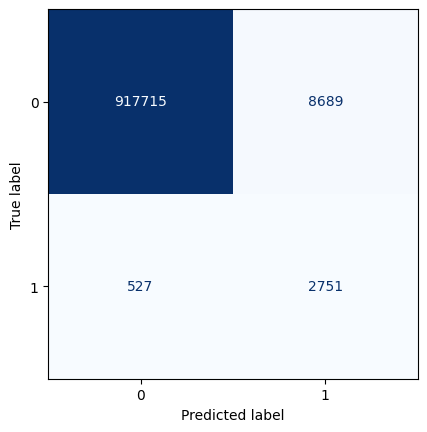

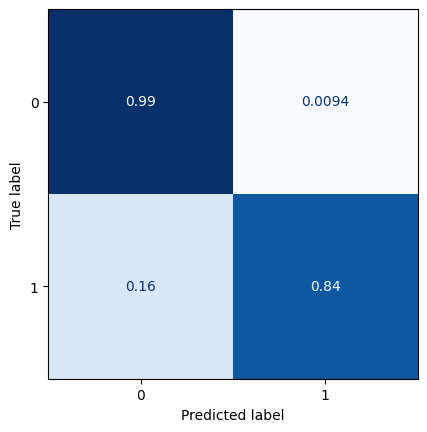

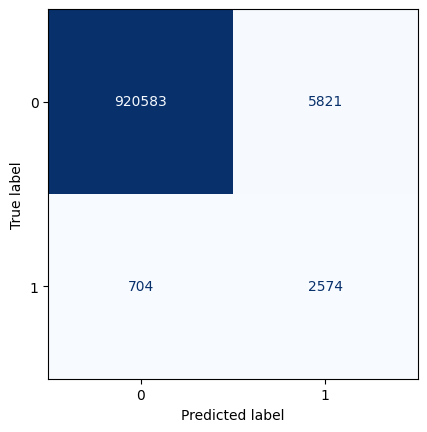

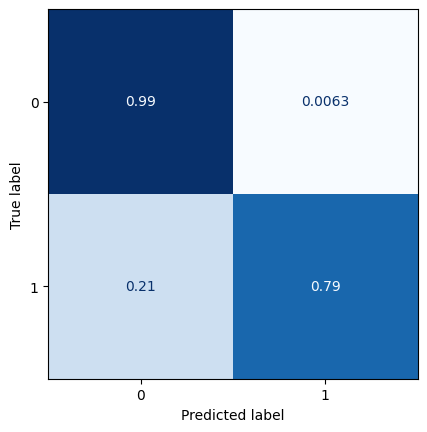

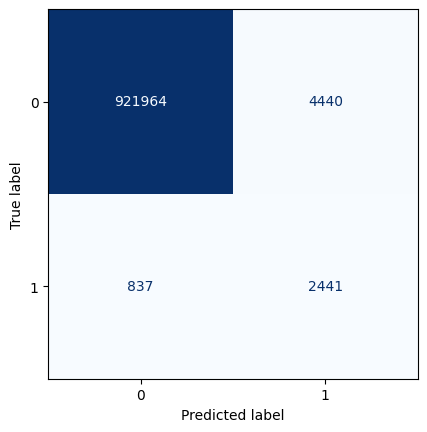

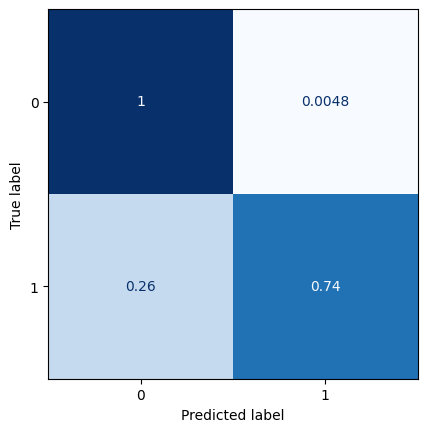

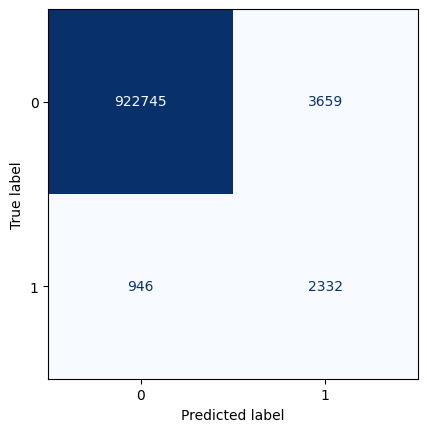

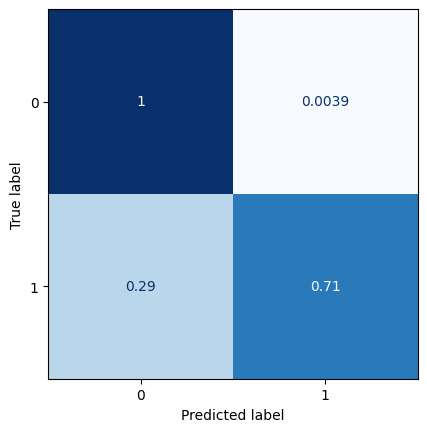

In [37]:
t = model.predict(test_img_std)

ranges = [0.025,0.05,0.075,0.1]

for j in ranges:
    classes = []
    for i in t.reshape(-1,1):
        if i<=j: classes.append(0)
        else: classes.append(1)

# confusion matrix with threshold on 0.1, otherwise always 0 
    ConfusionMatrixDisplay(confusion_matrix(y_test_img.reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
    ConfusionMatrixDisplay(confusion_matrix(y_test_img.reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)
    

In [44]:
922745+3659+946+2332

929682

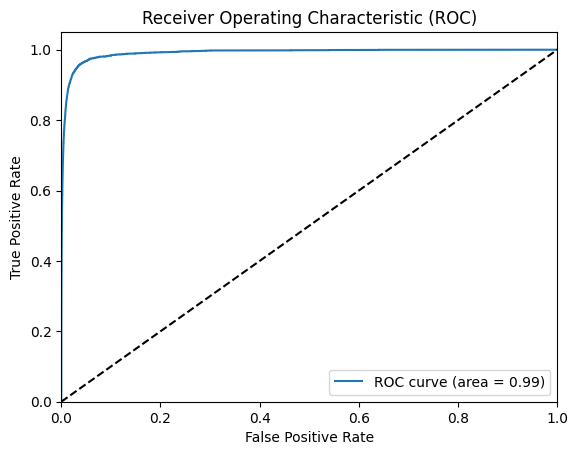

In [38]:
plot_roc(t.reshape(-1,1),y_test_img.reshape(-1,1))

9


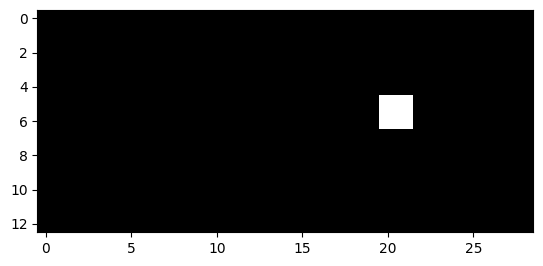

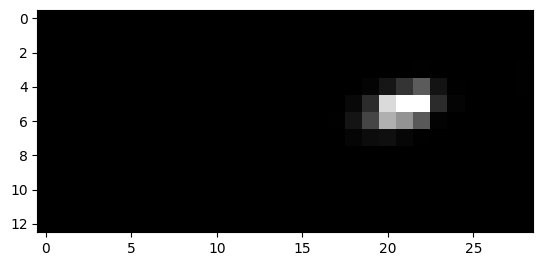

10


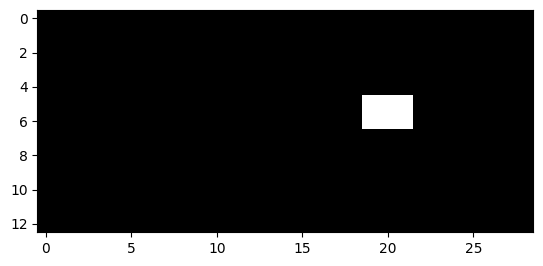

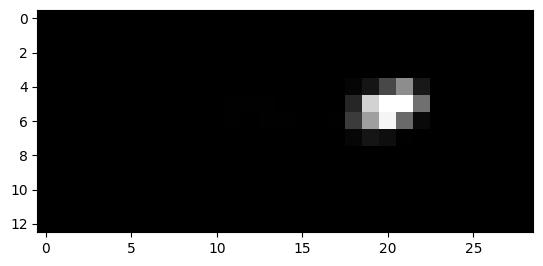

11


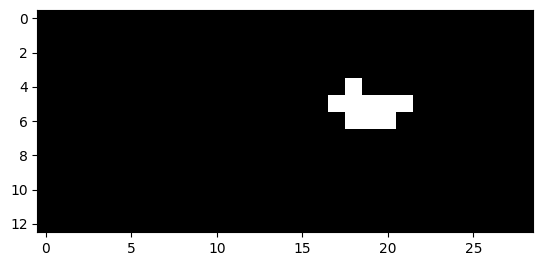

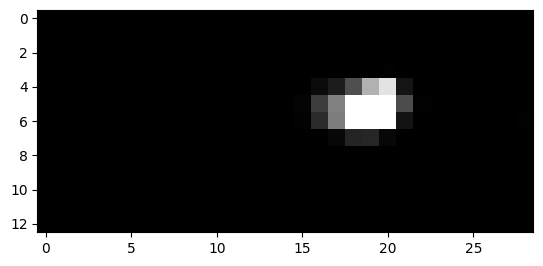

12


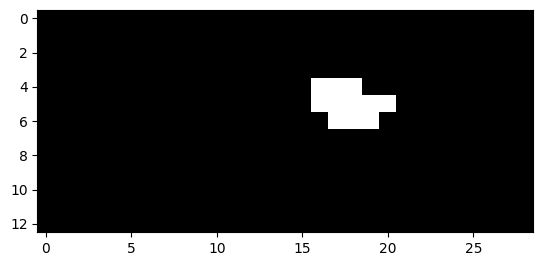

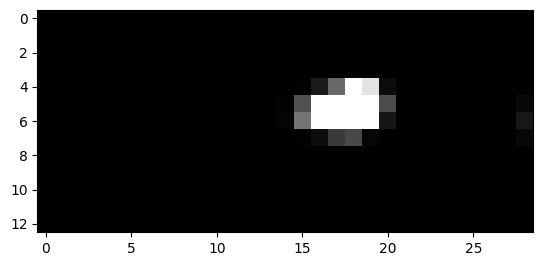

13


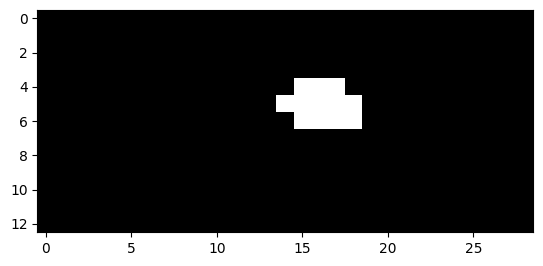

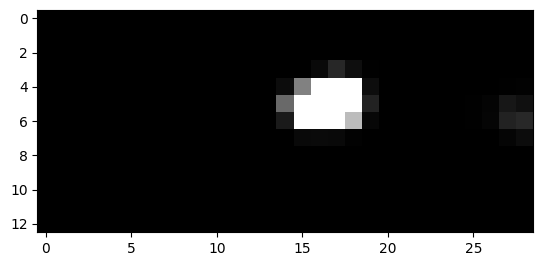

14


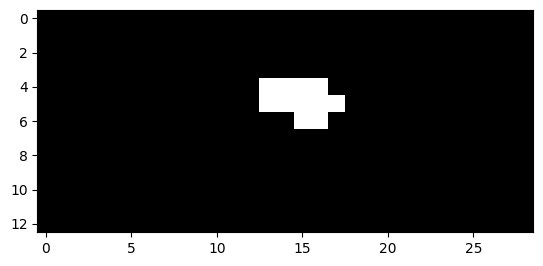

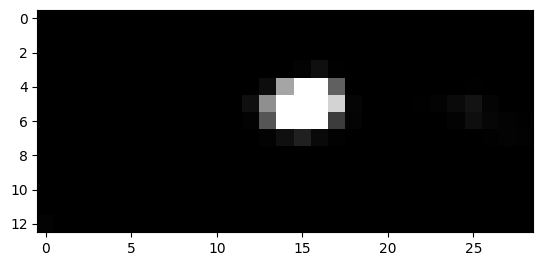

15


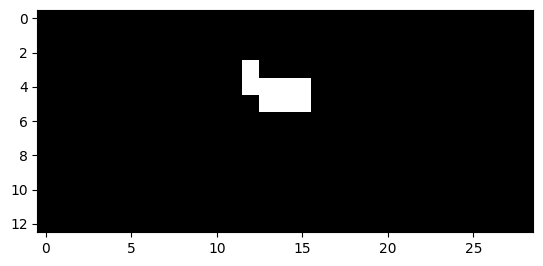

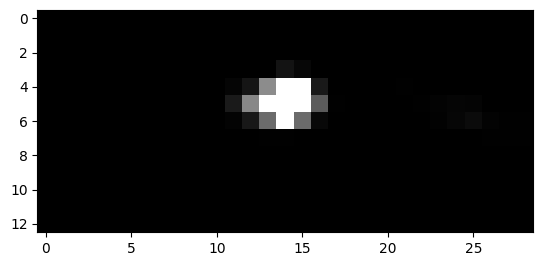

16


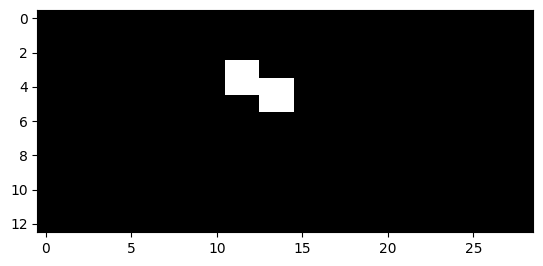

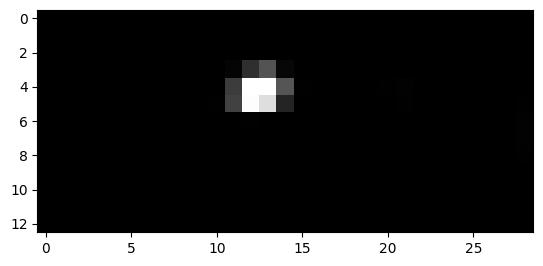

17


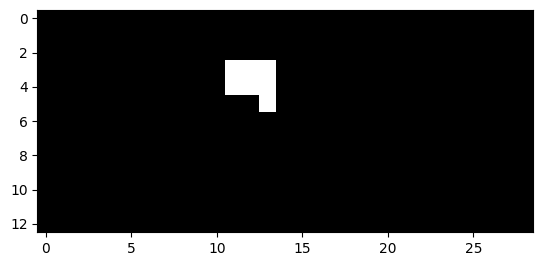

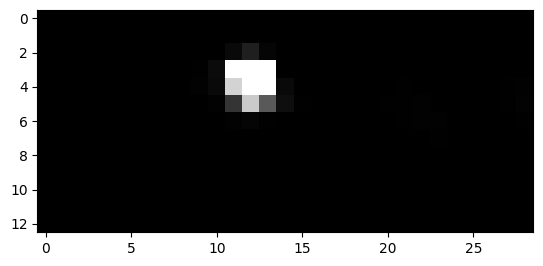

18


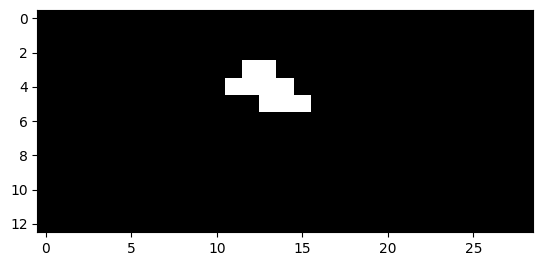

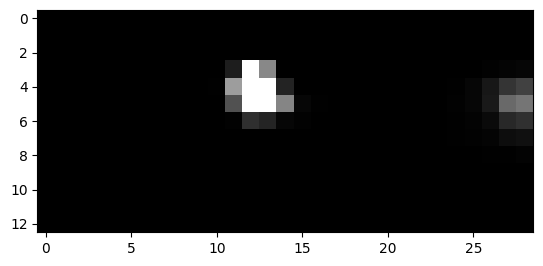

19


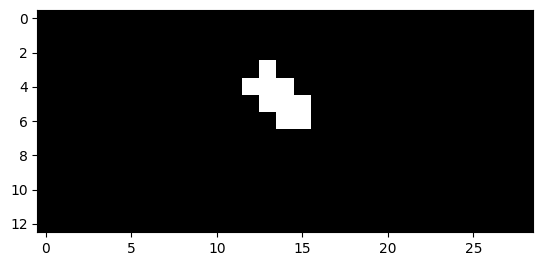

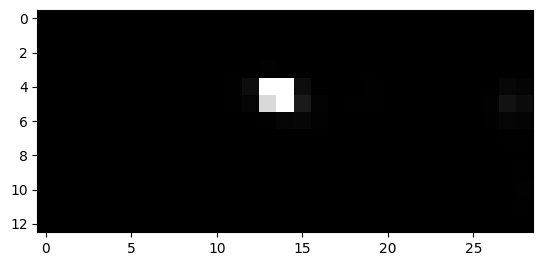

20


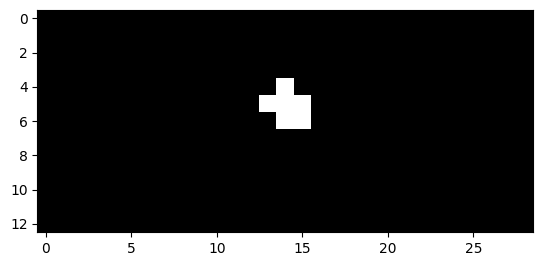

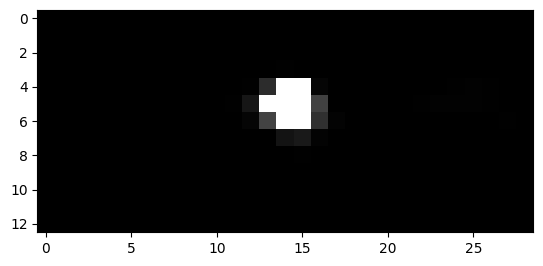

21


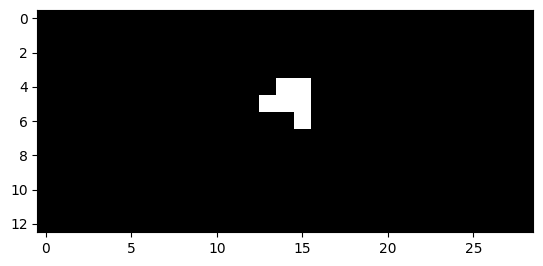

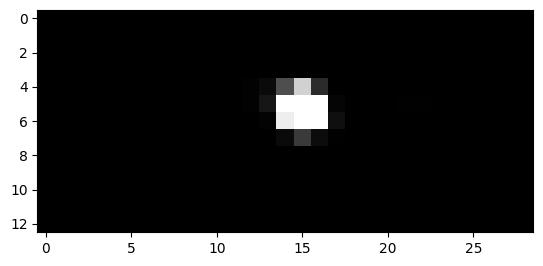

22


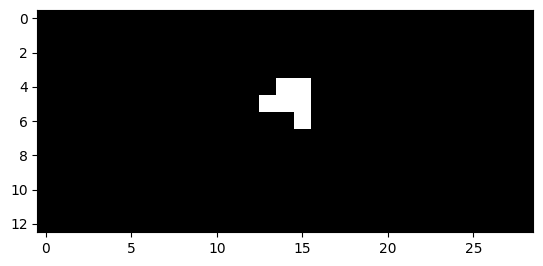

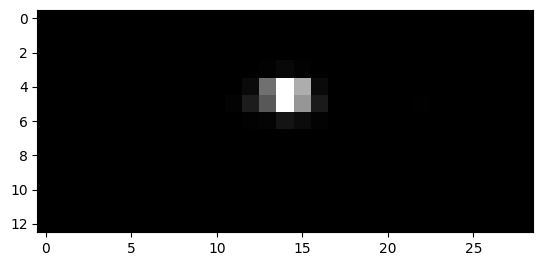

105


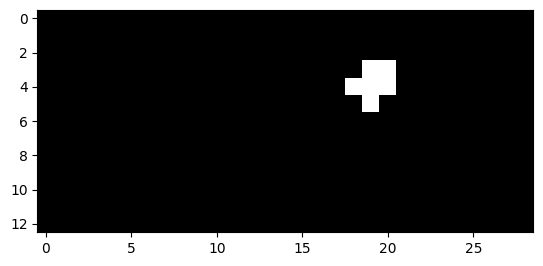

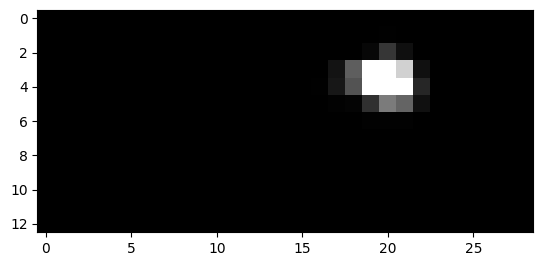

106


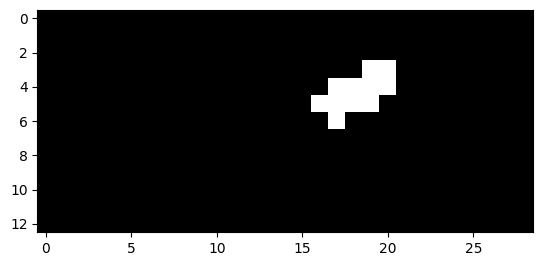

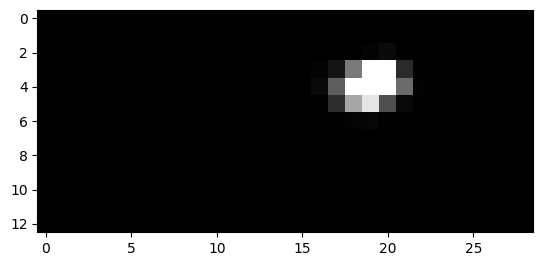

107


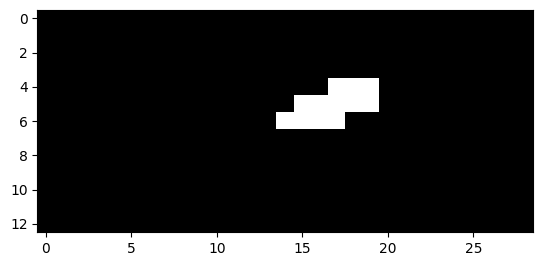

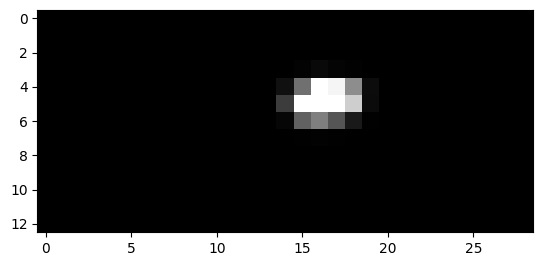

108


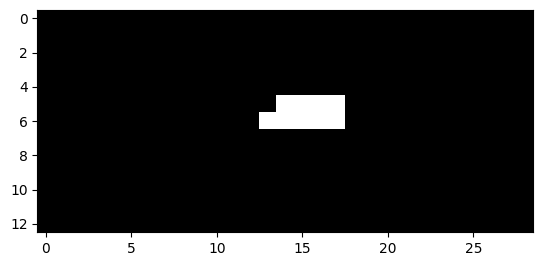

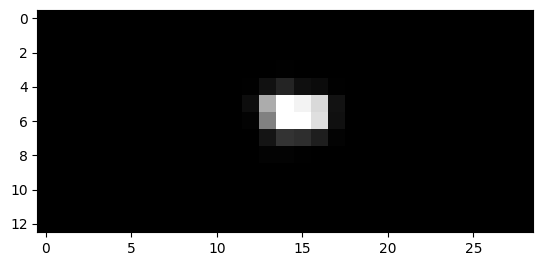

109


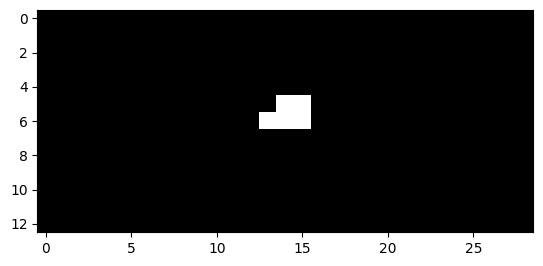

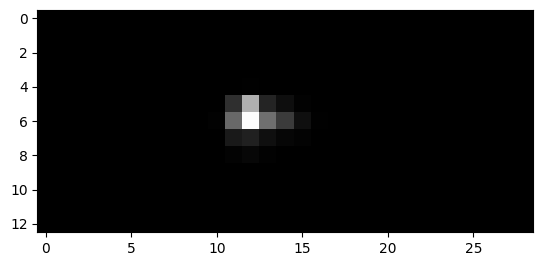

184


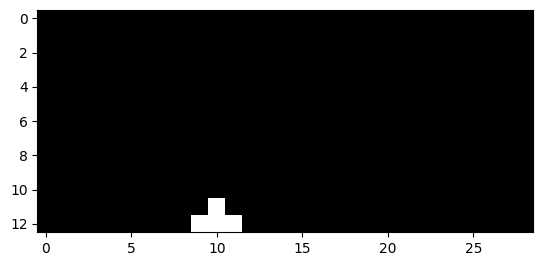

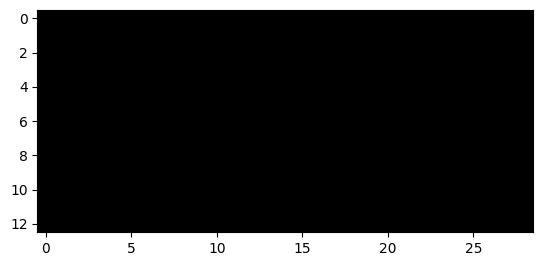

185


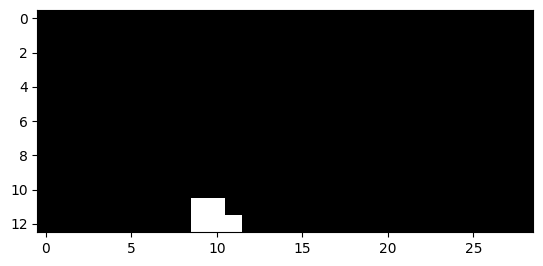

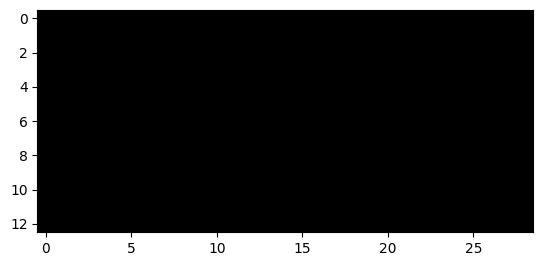

186


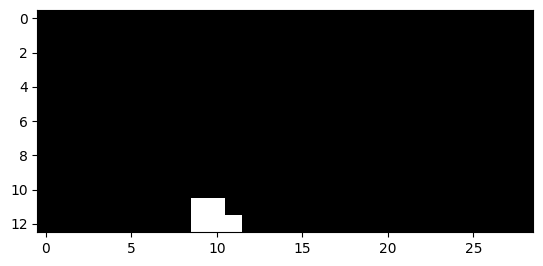

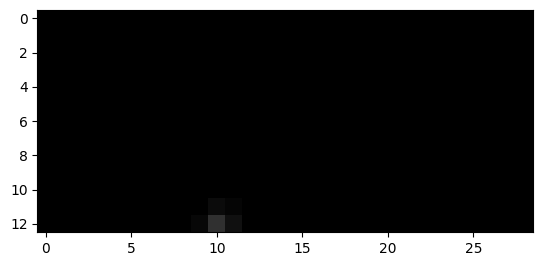

187


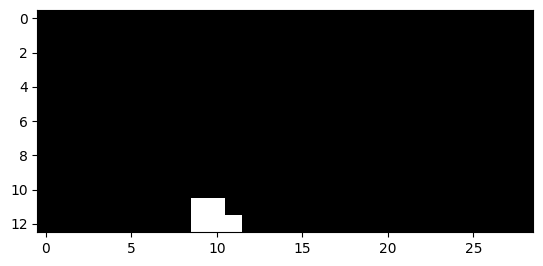

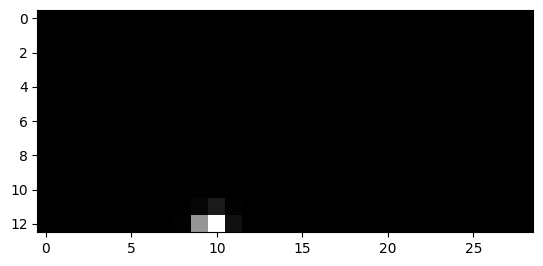

188


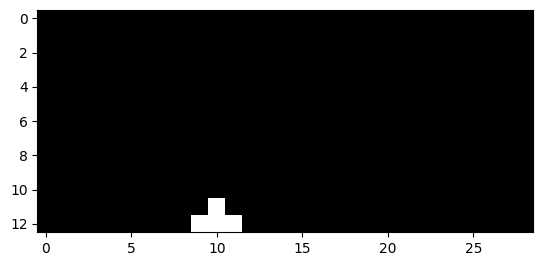

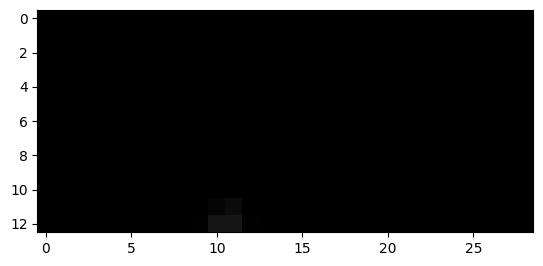

308


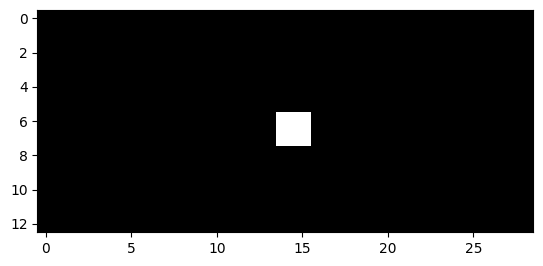

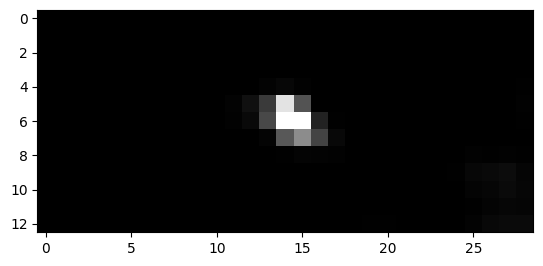

309


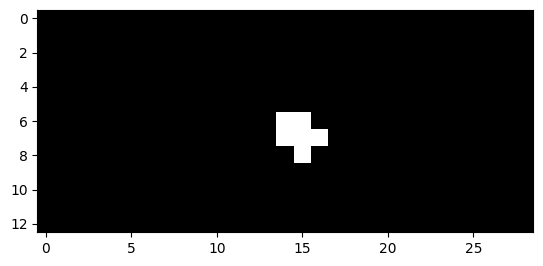

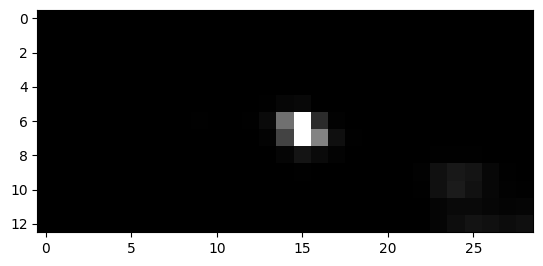

310


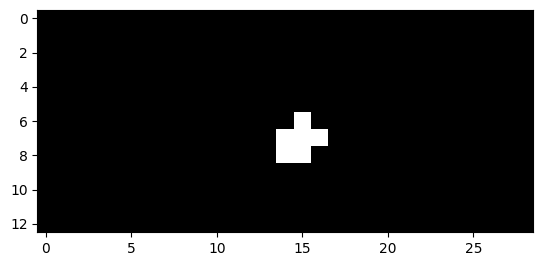

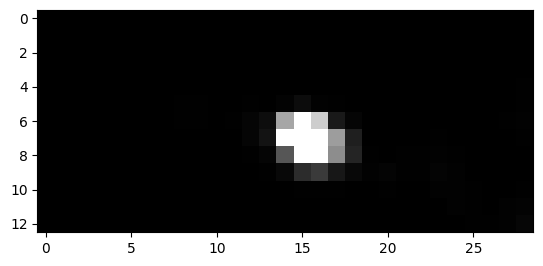

311


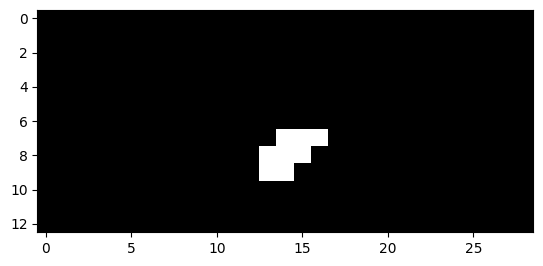

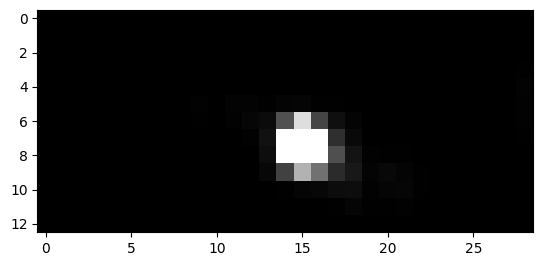

312


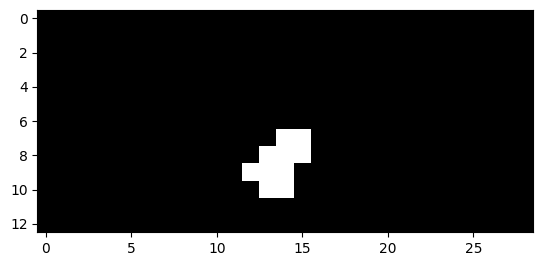

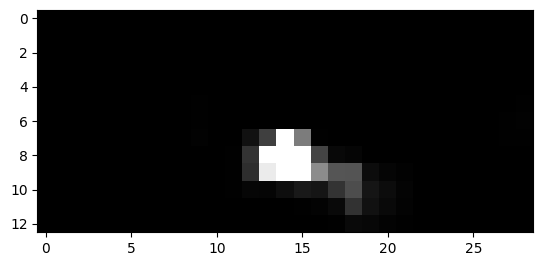

313


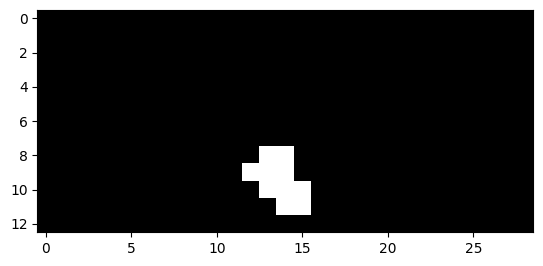

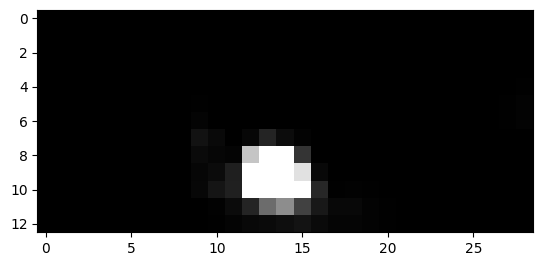

314


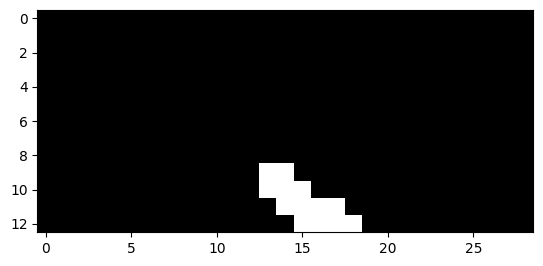

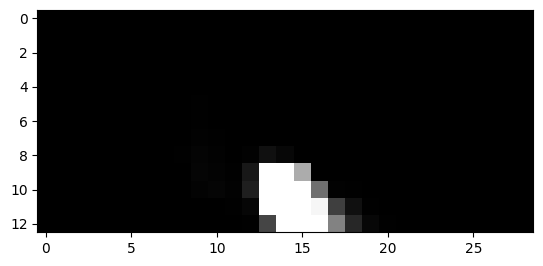

315


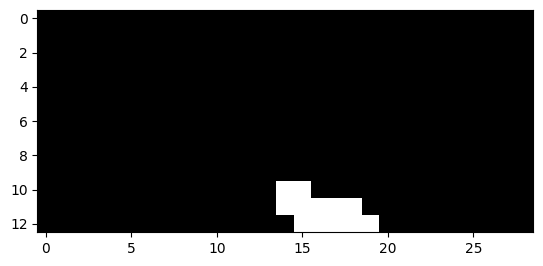

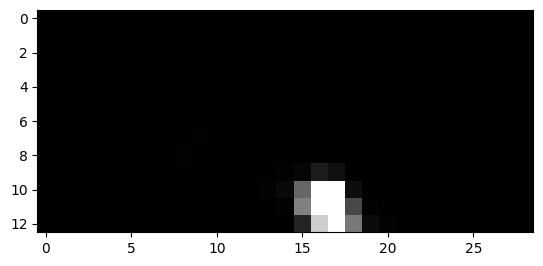

316


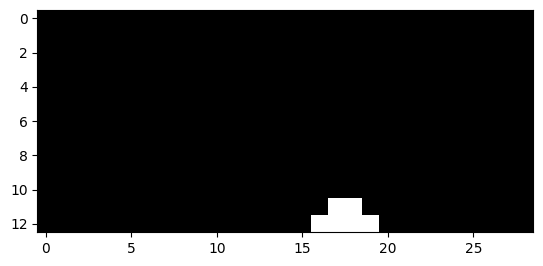

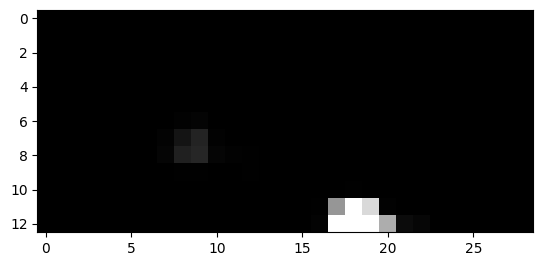

317


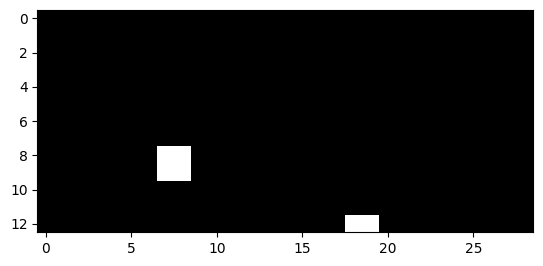

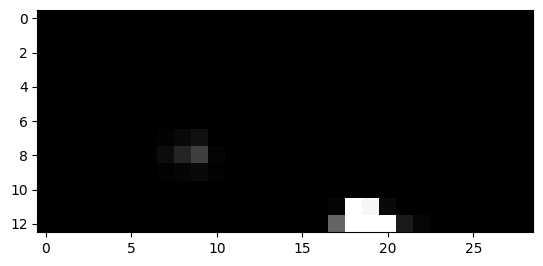

318


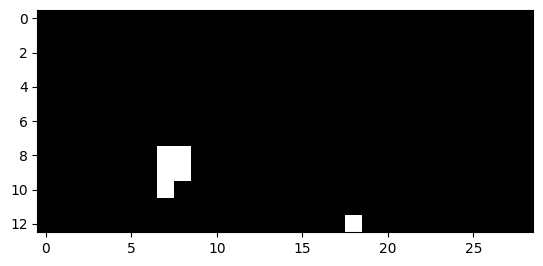

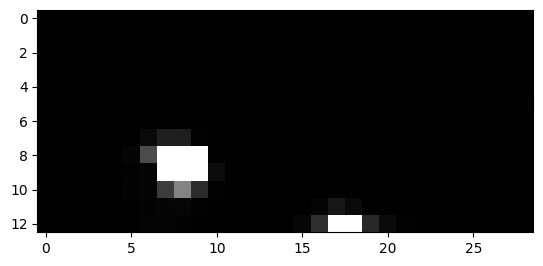

319


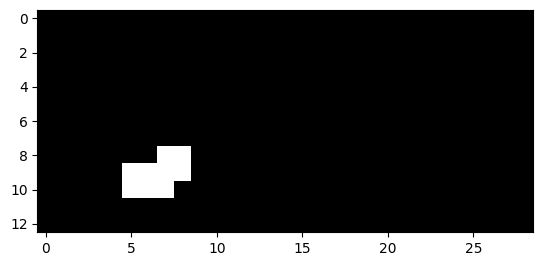

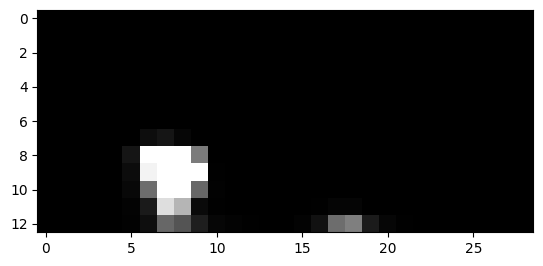

320


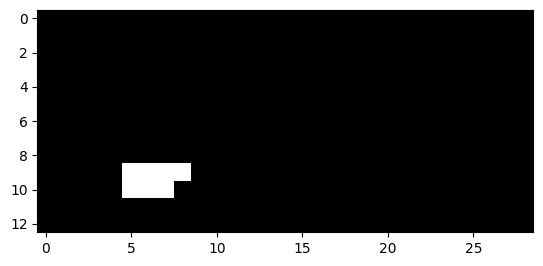

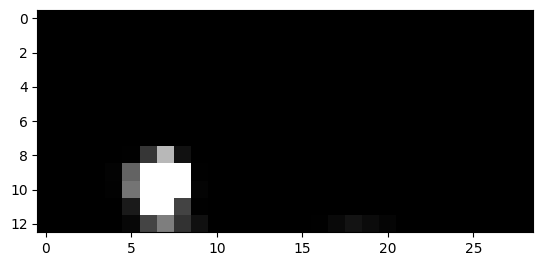

321


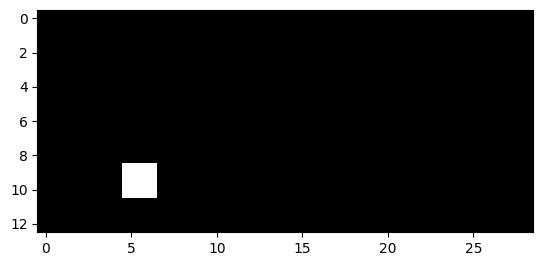

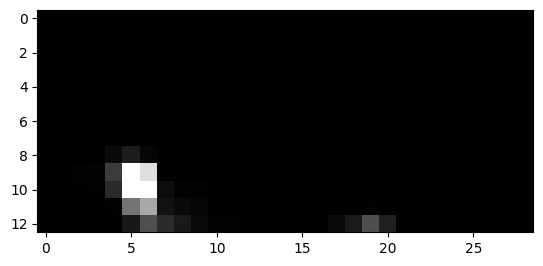

335


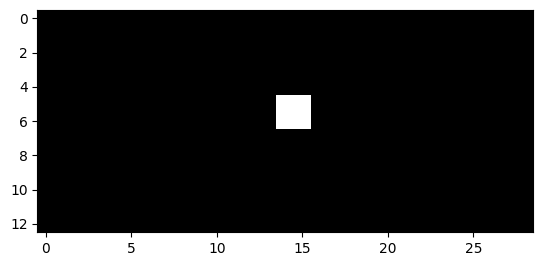

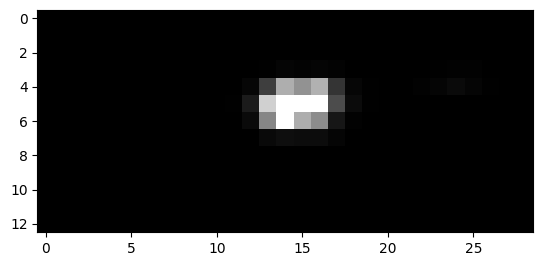

336


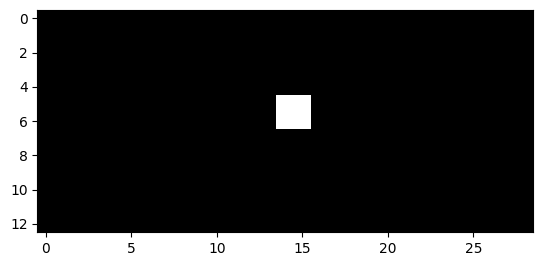

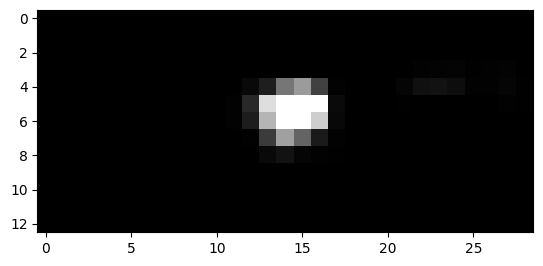

337


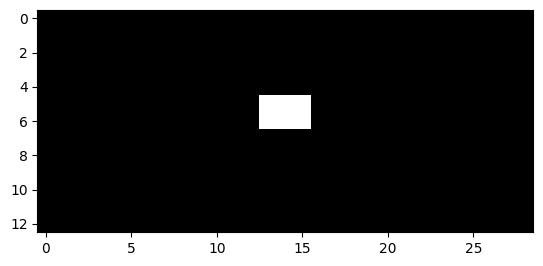

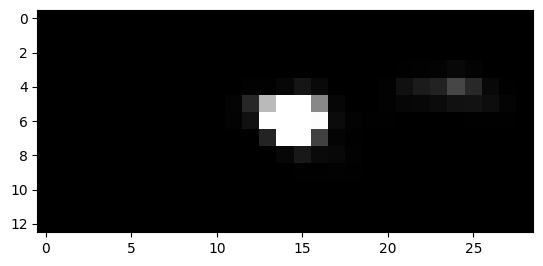

338


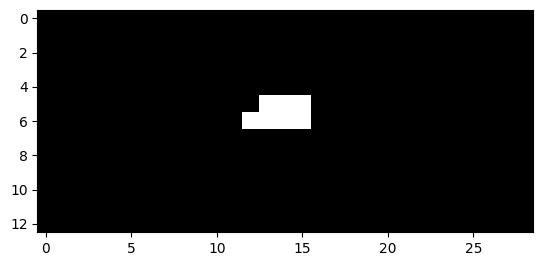

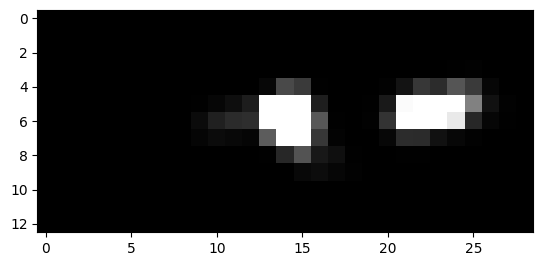

339


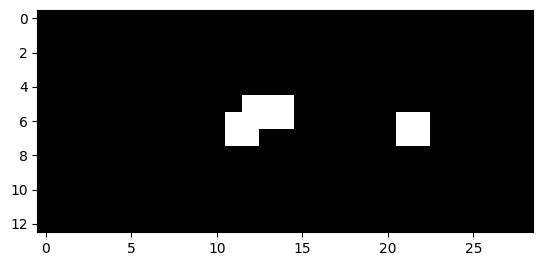

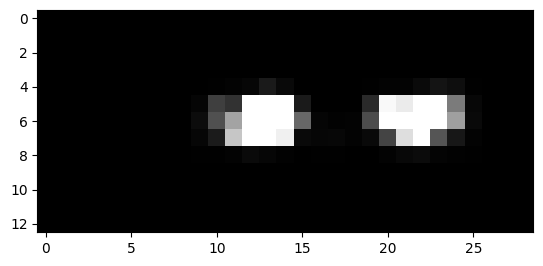

340


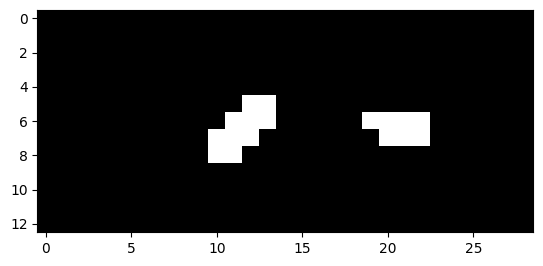

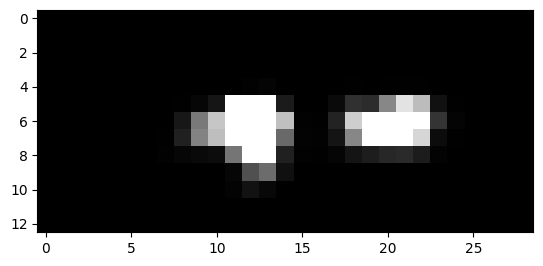

341


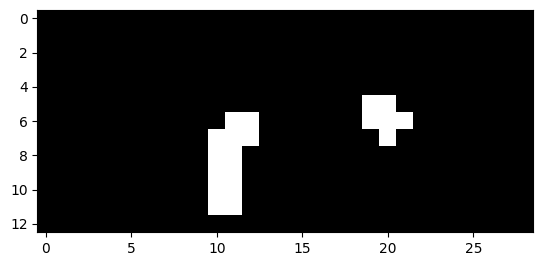

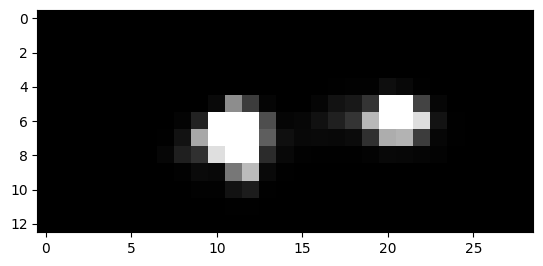

342


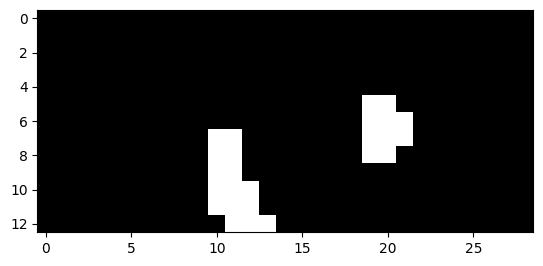

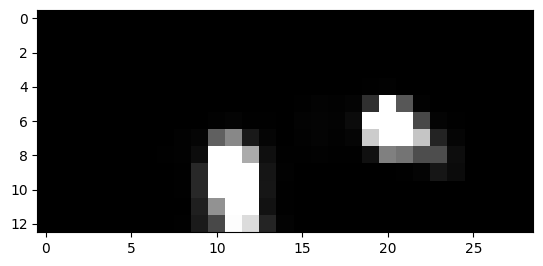

343


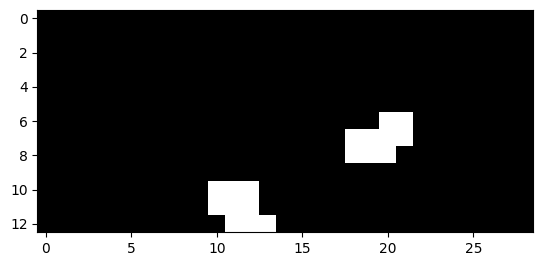

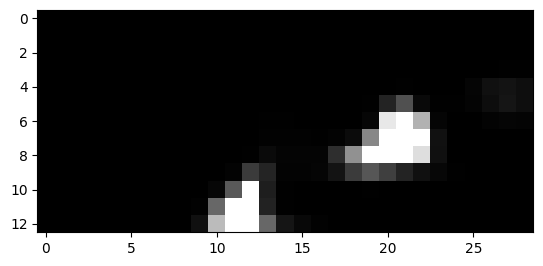

344


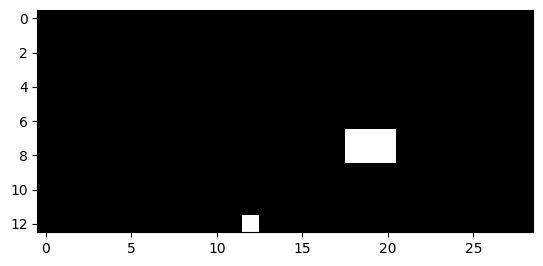

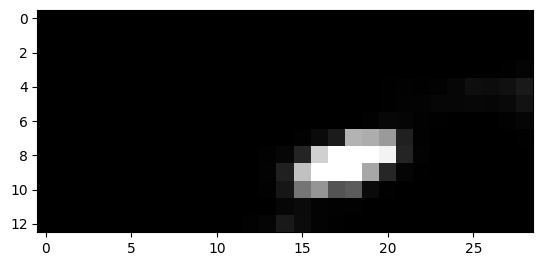

346


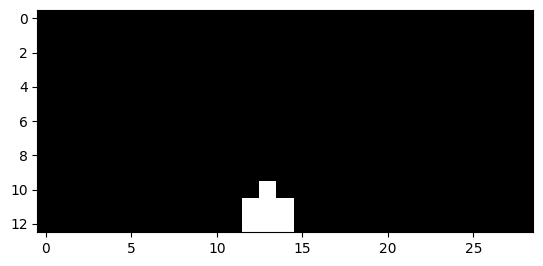

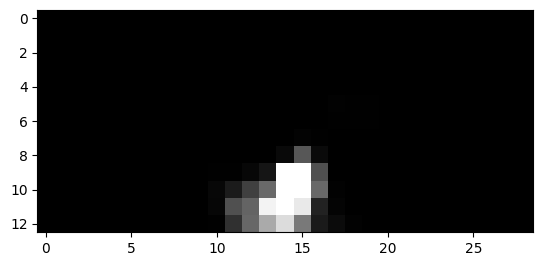

347


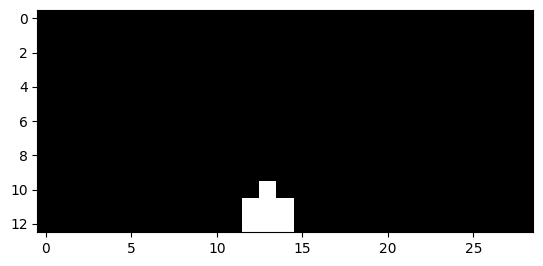

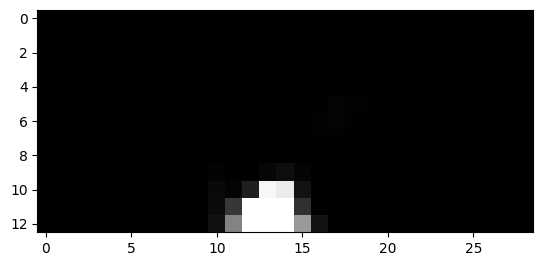

348


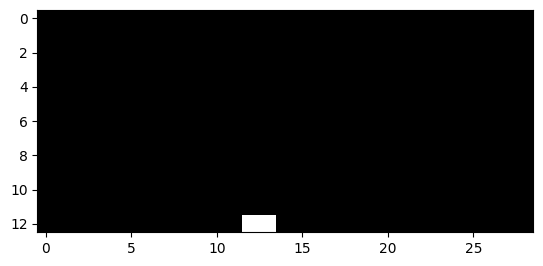

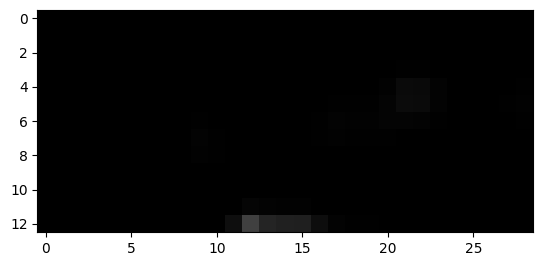

640


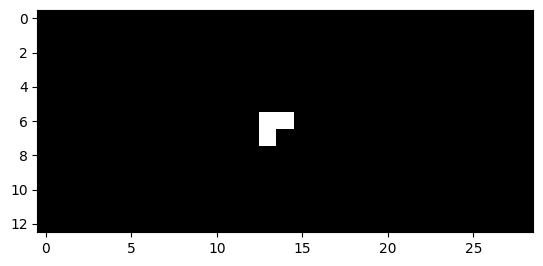

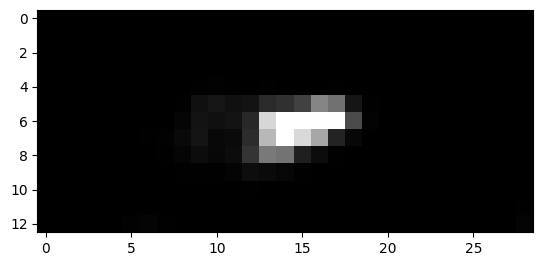

641


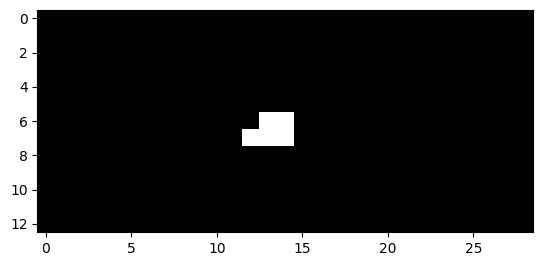

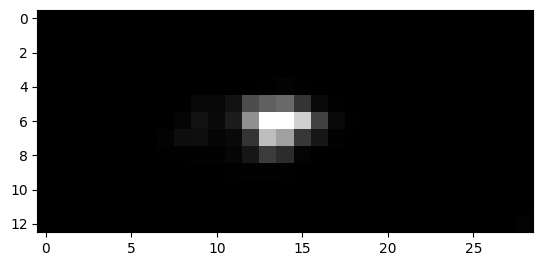

642


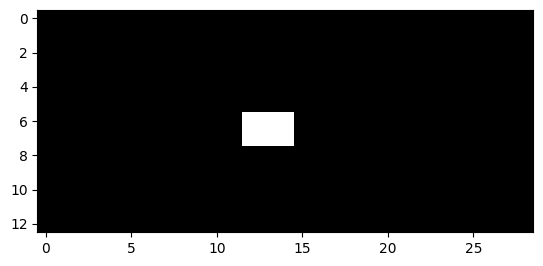

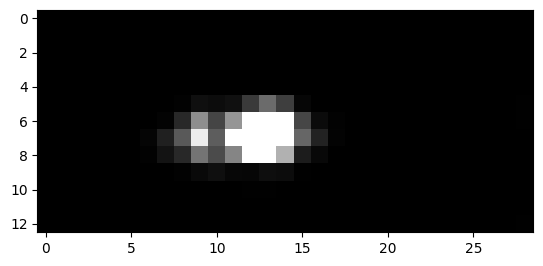

643


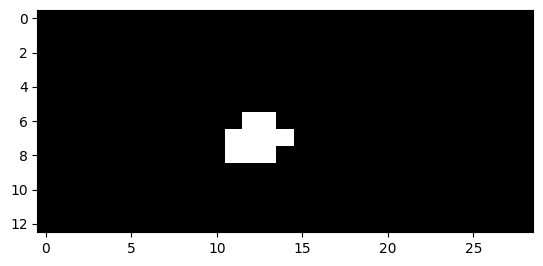

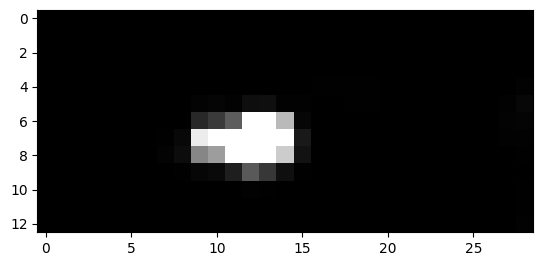

644


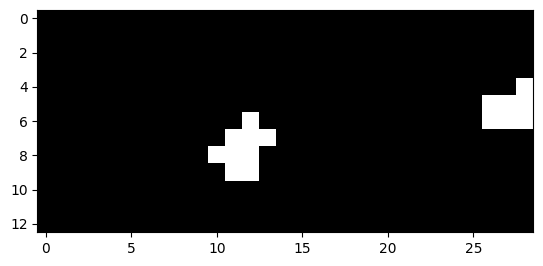

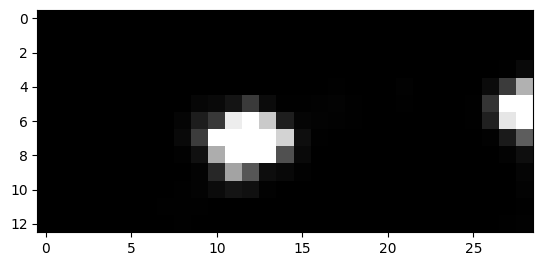

645


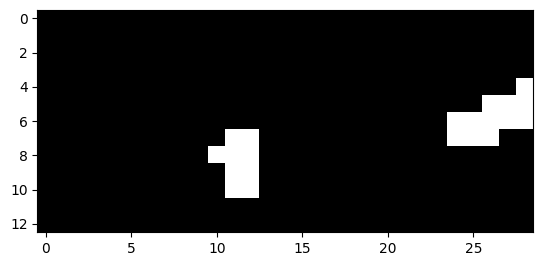

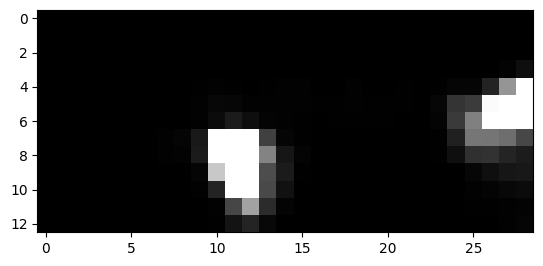

646


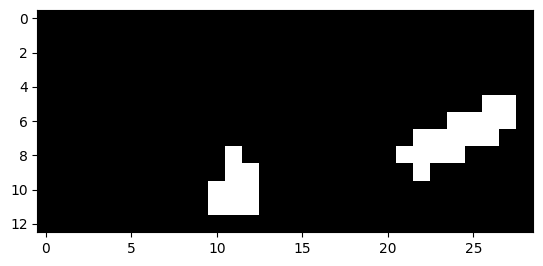

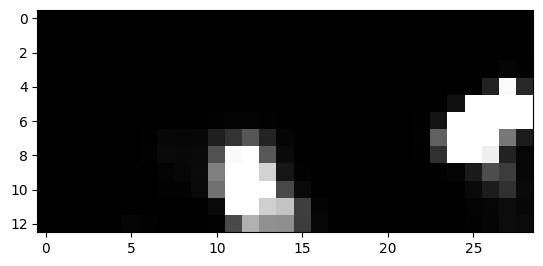

647


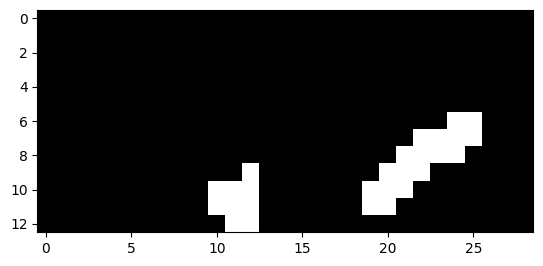

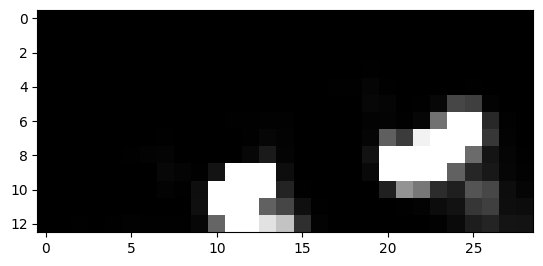

648


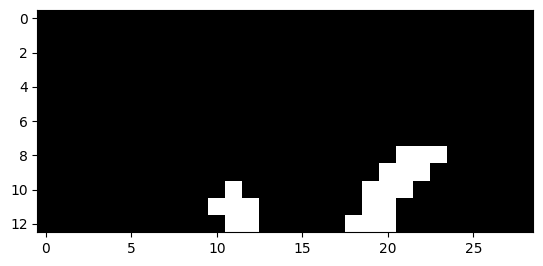

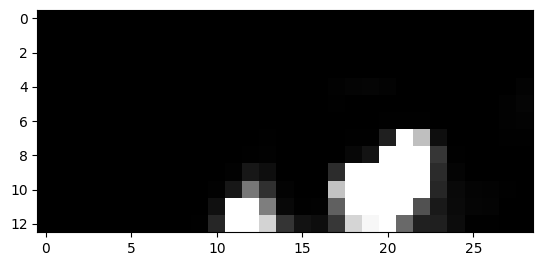

649


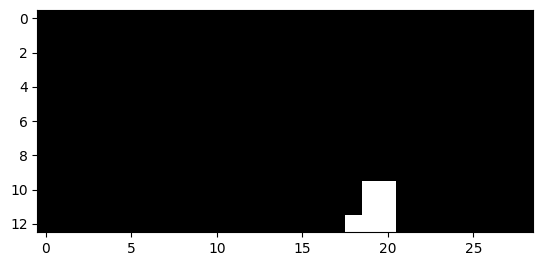

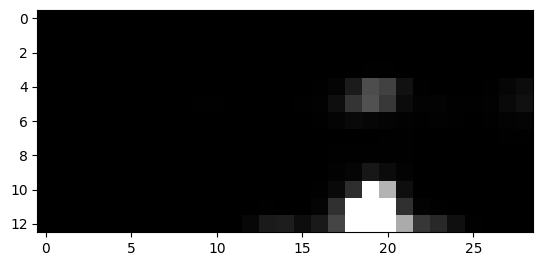

651


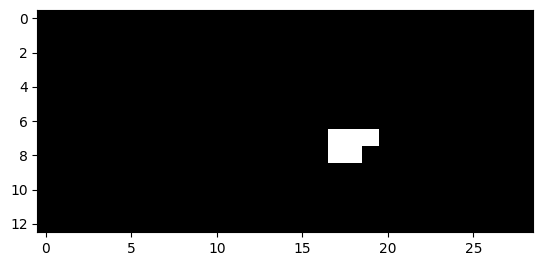

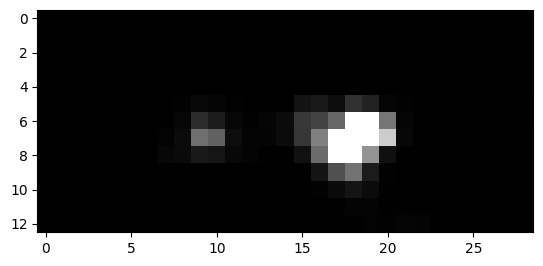

652


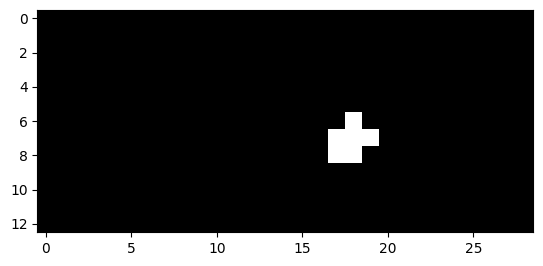

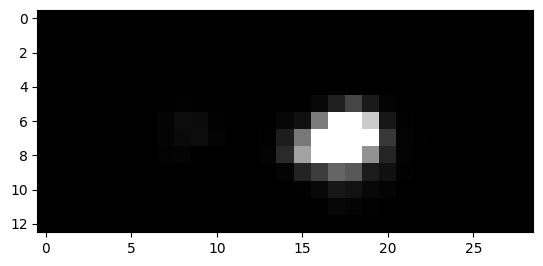

653


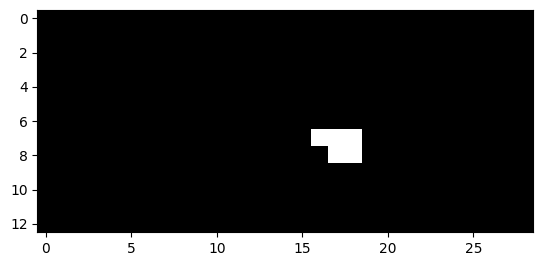

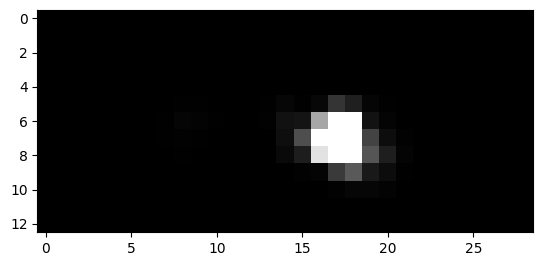

654


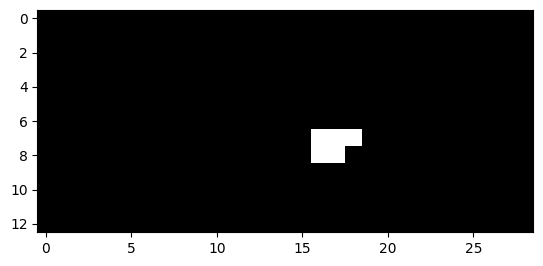

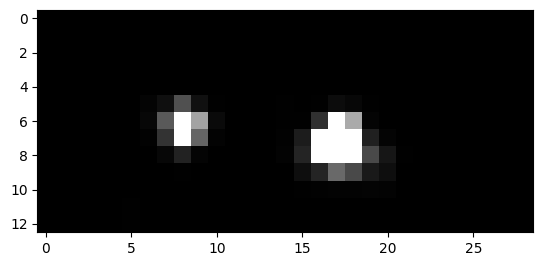

655


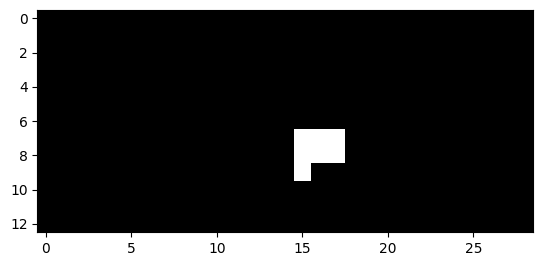

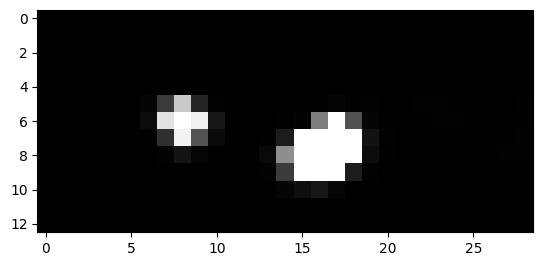

656


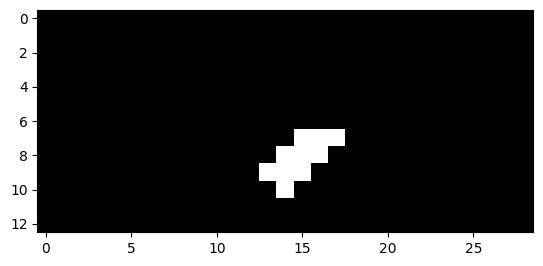

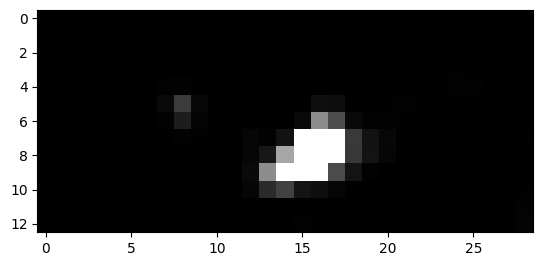

657


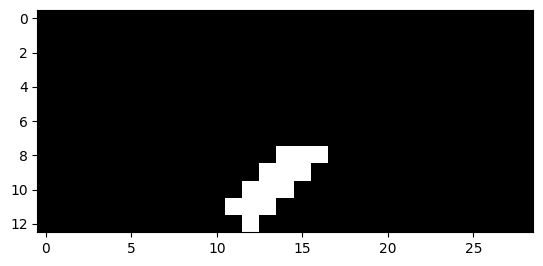

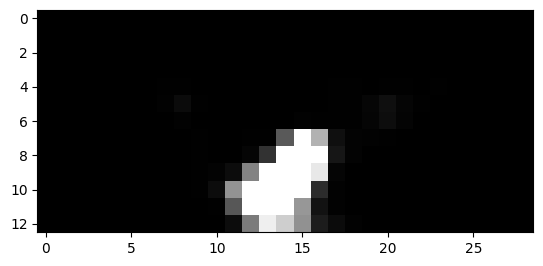

658


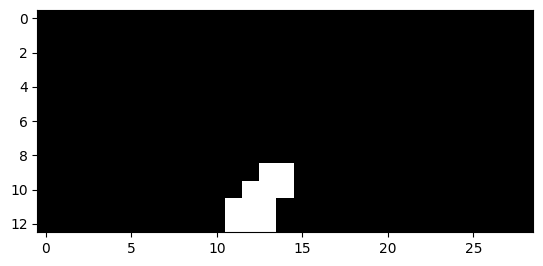

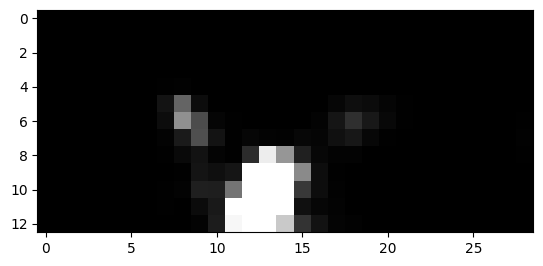

659


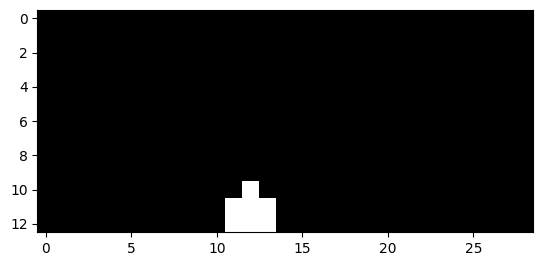

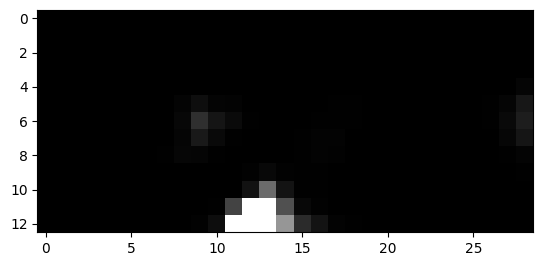

665


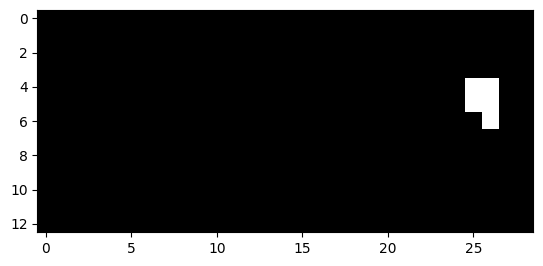

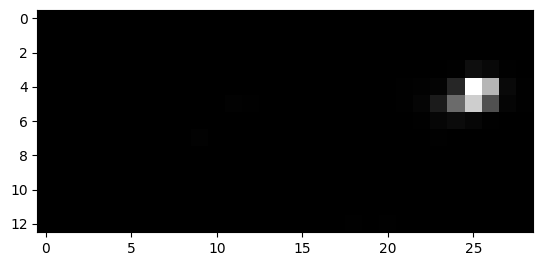

666


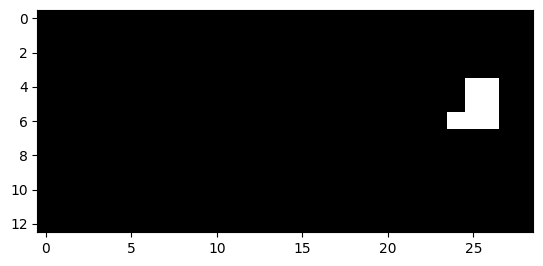

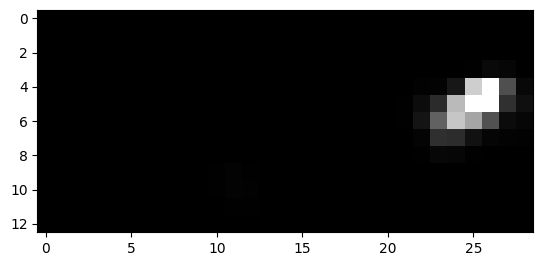

667


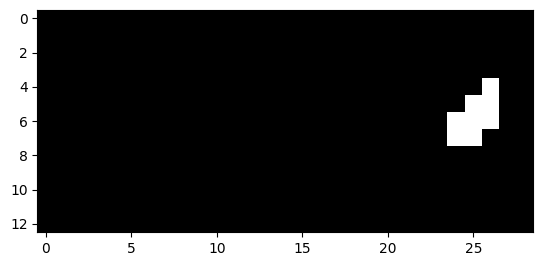

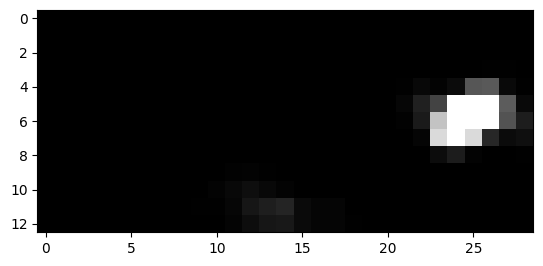

668


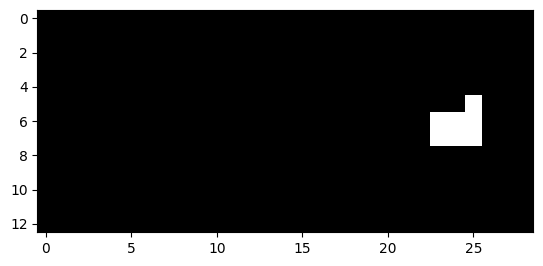

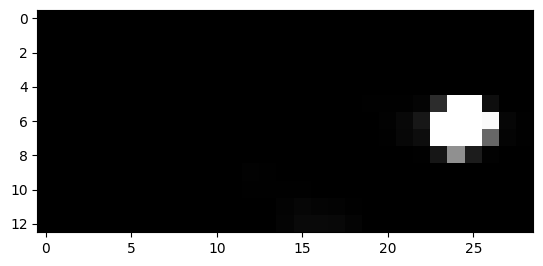

669


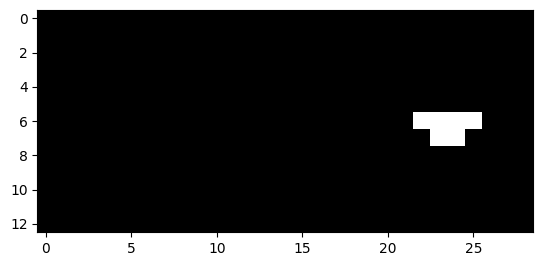

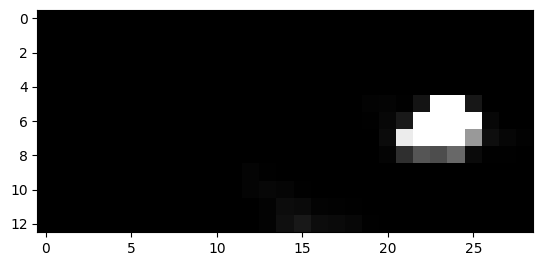

670


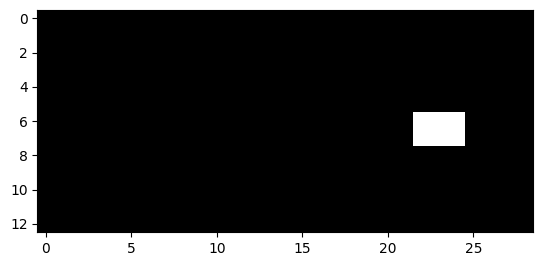

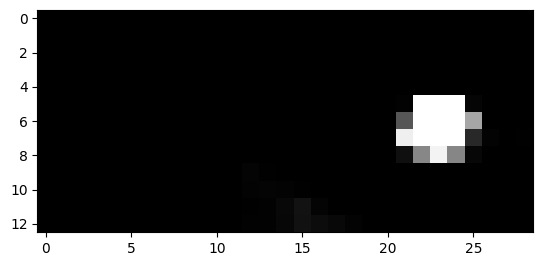

671


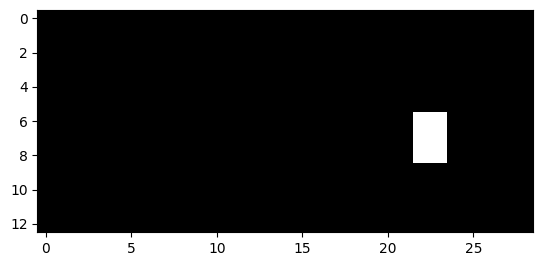

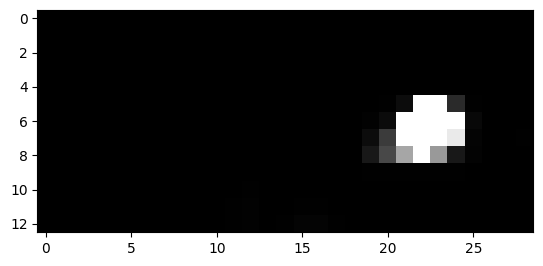

672


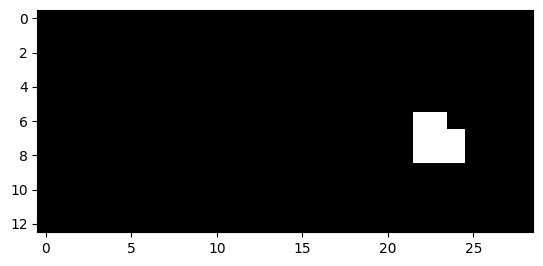

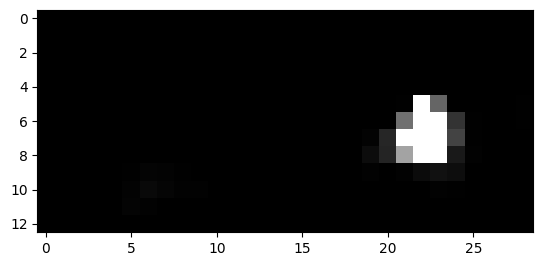

673


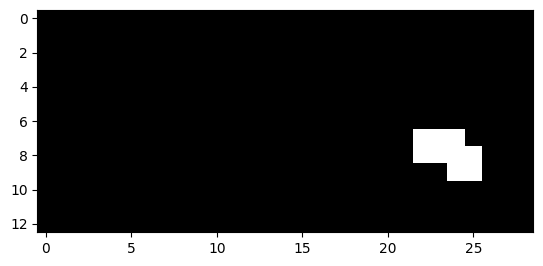

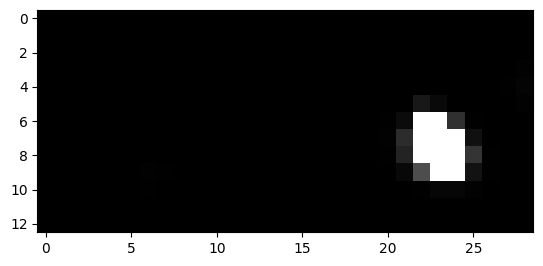

674


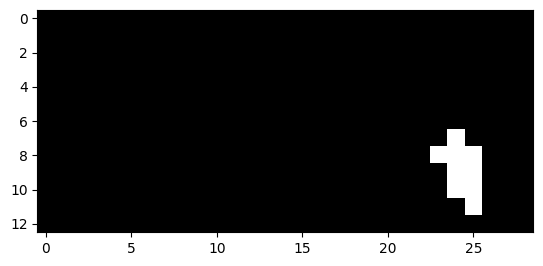

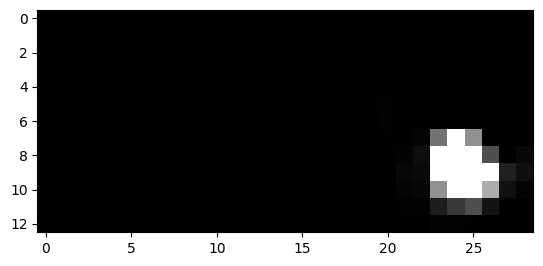

675


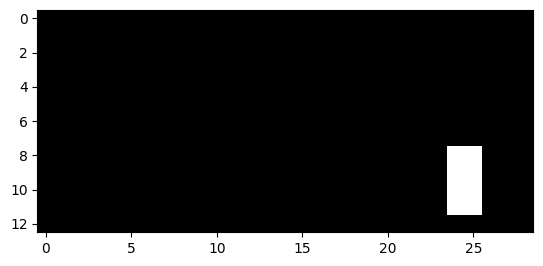

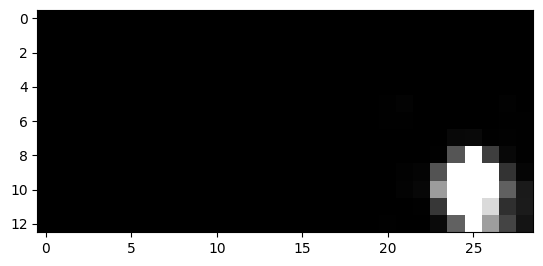

676


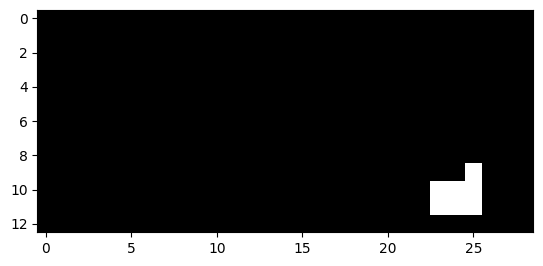

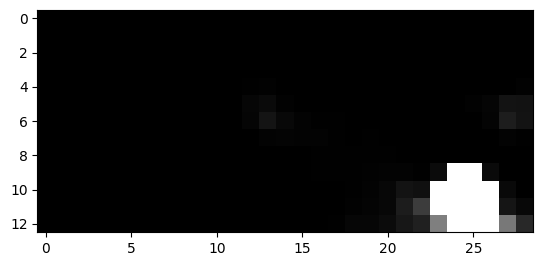

677


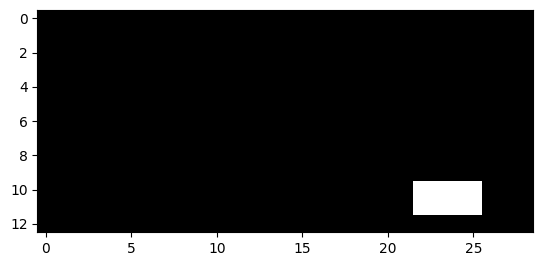

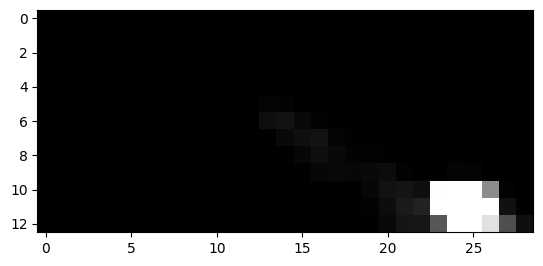

678


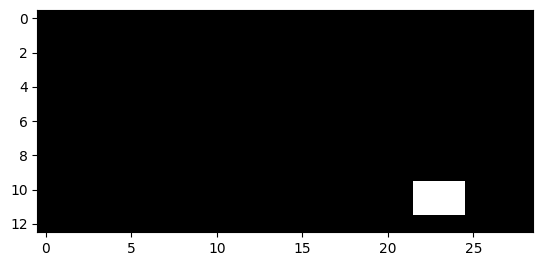

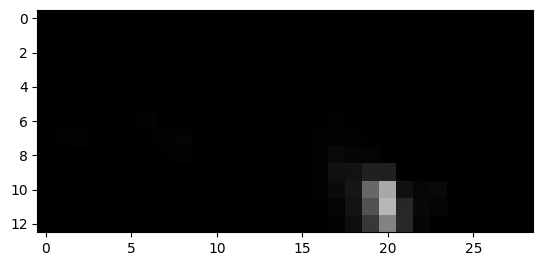

699


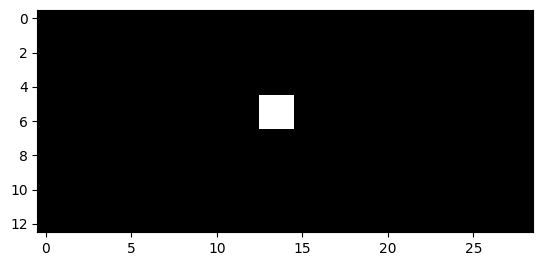

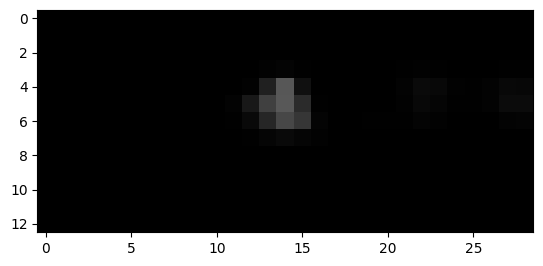

700


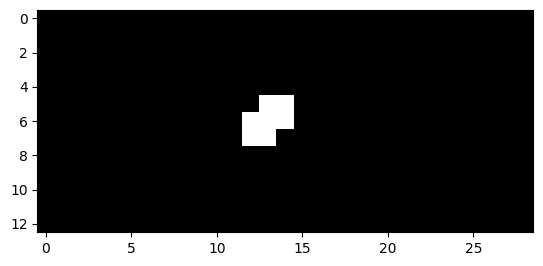

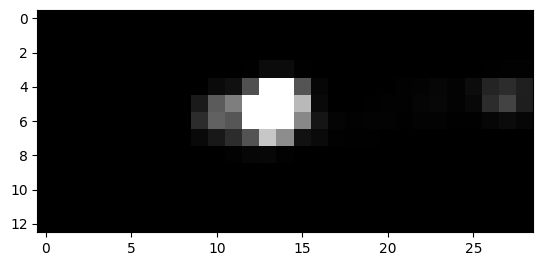

701


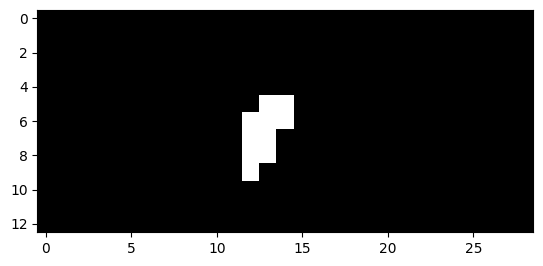

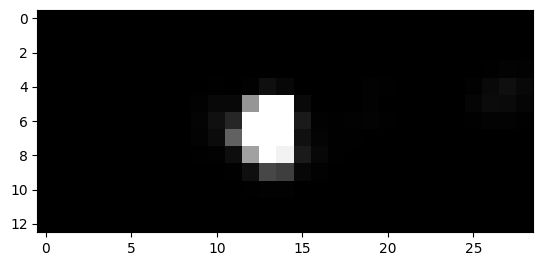

702


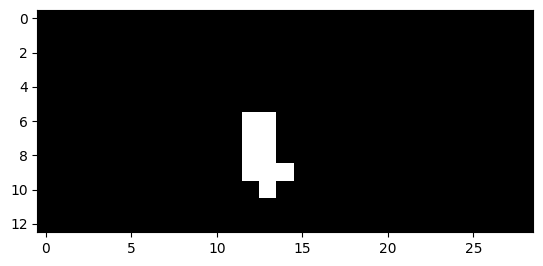

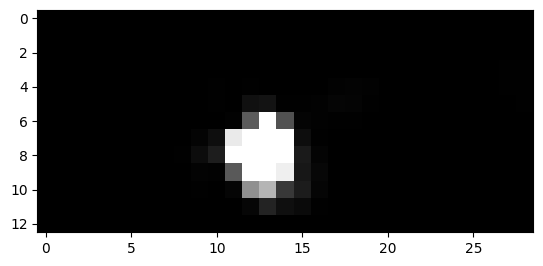

703


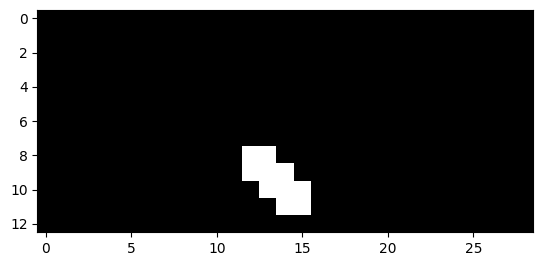

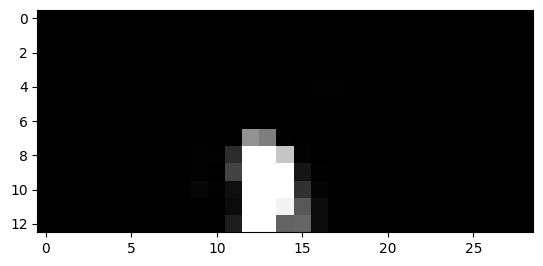

704


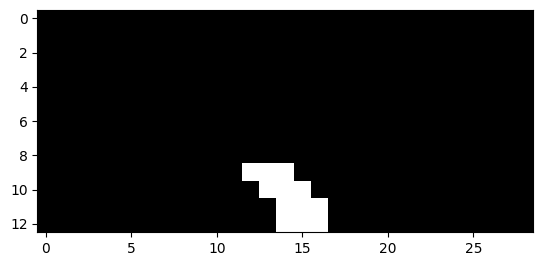

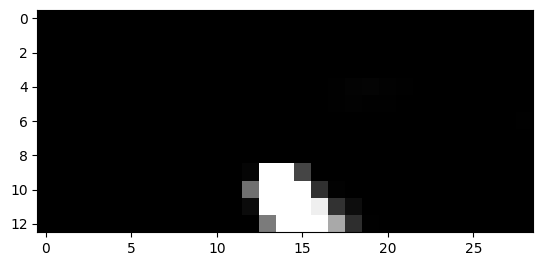

705


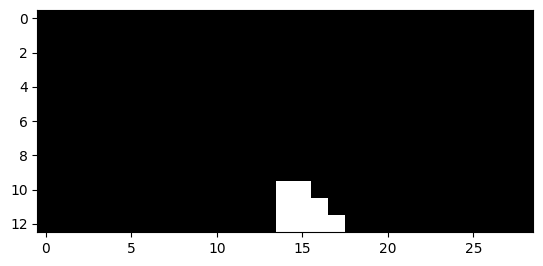

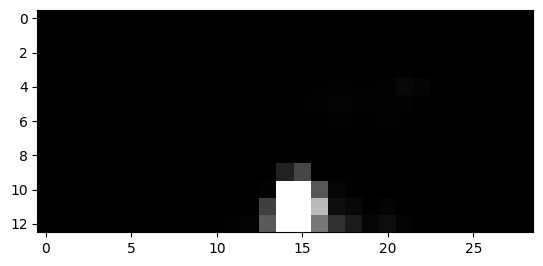

706


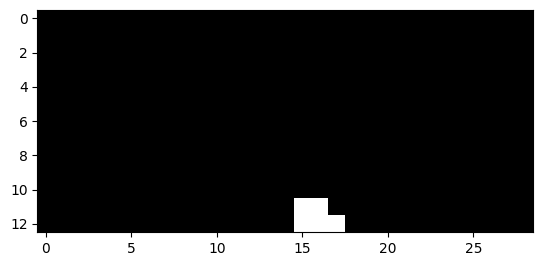

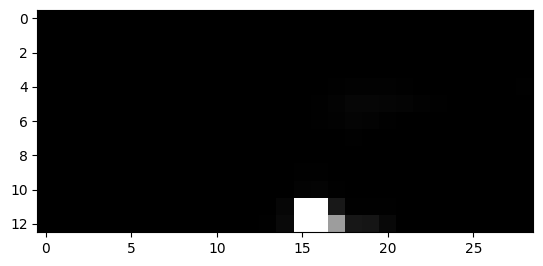

711


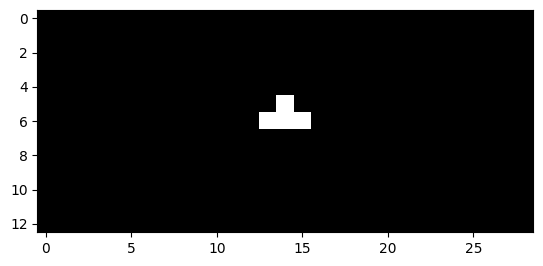

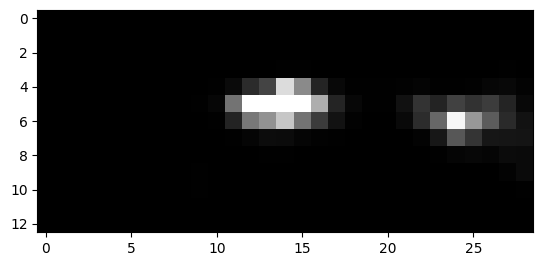

712


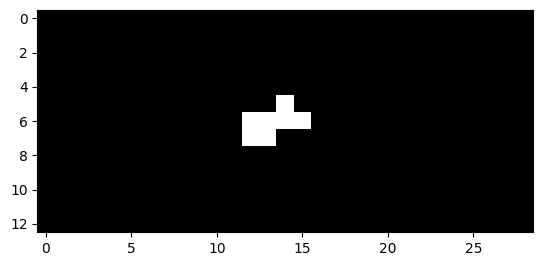

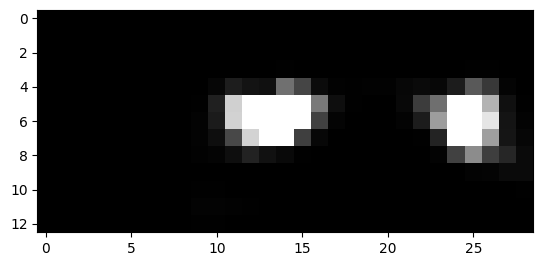

713


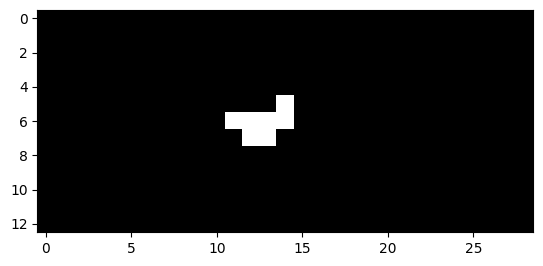

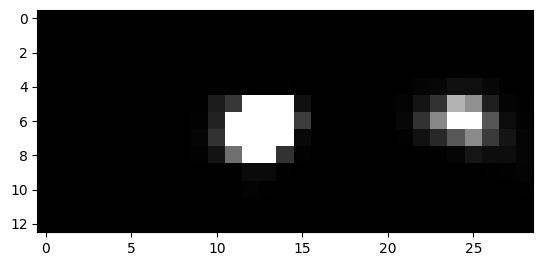

714


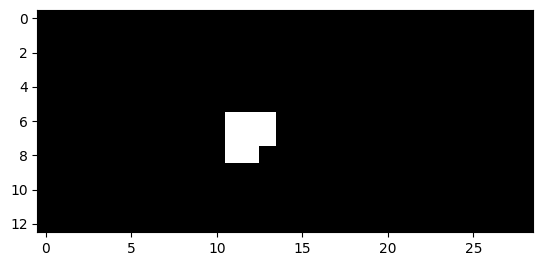

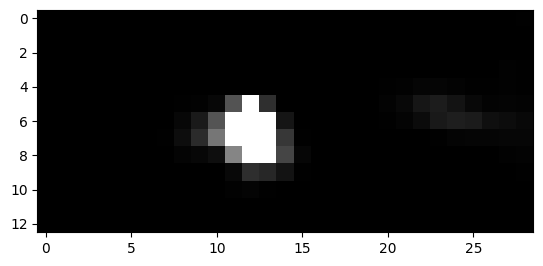

715


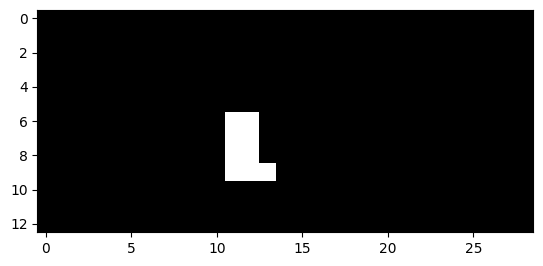

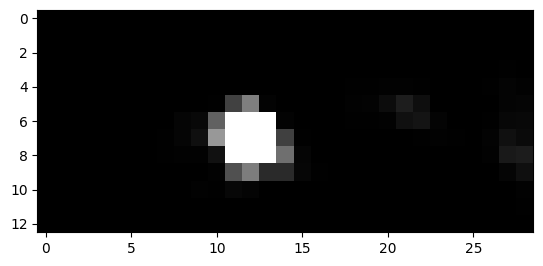

716


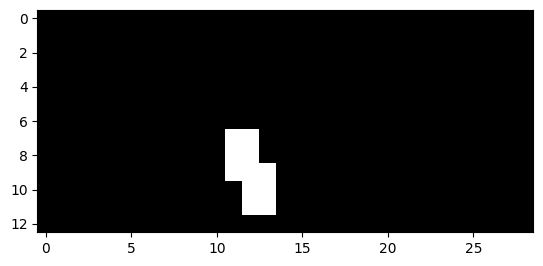

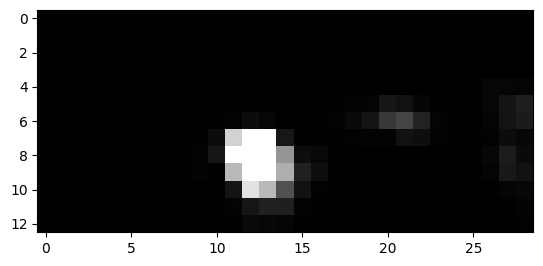

717


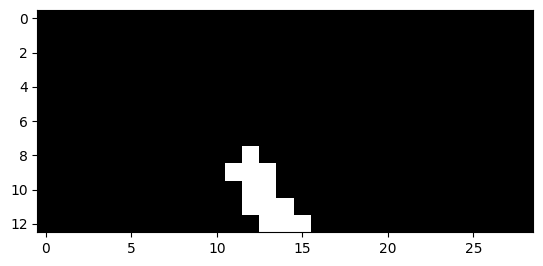

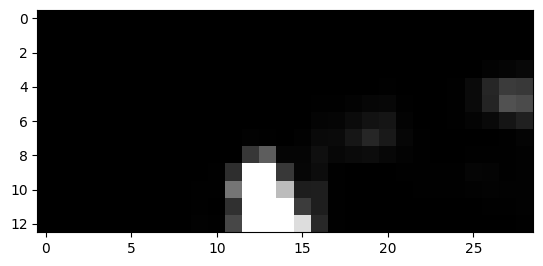

718


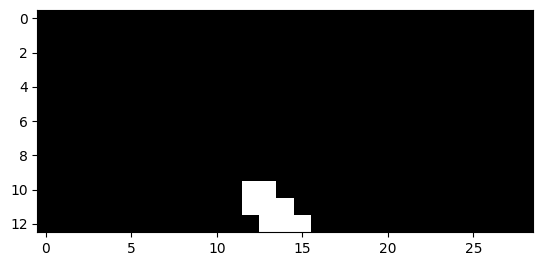

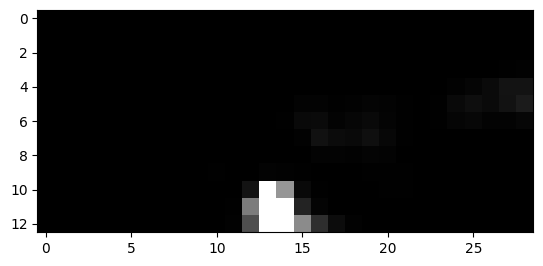

719


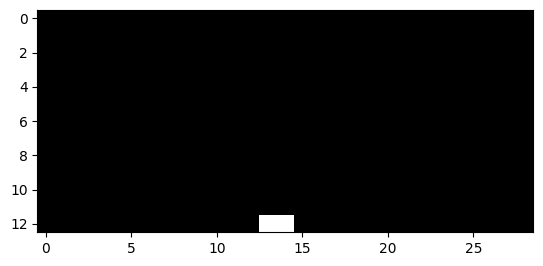

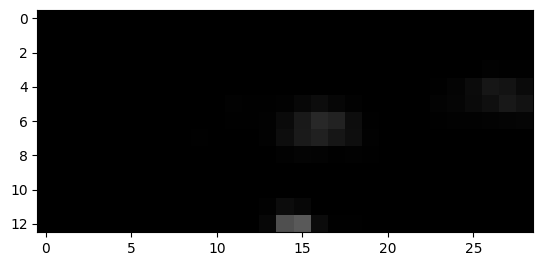

751


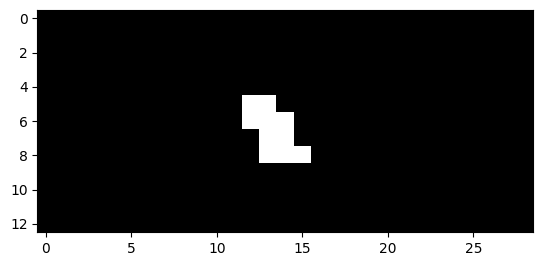

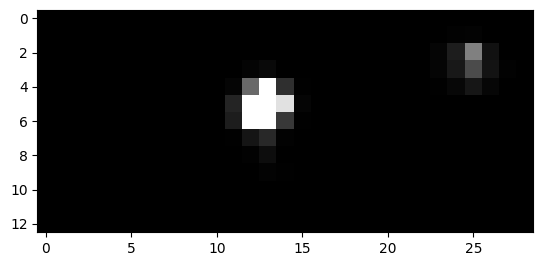

752


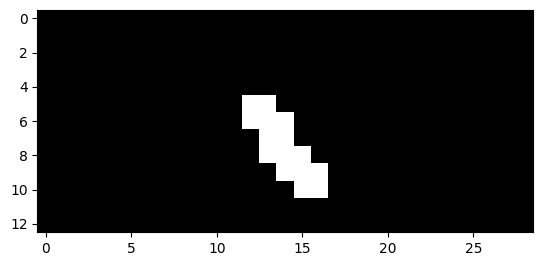

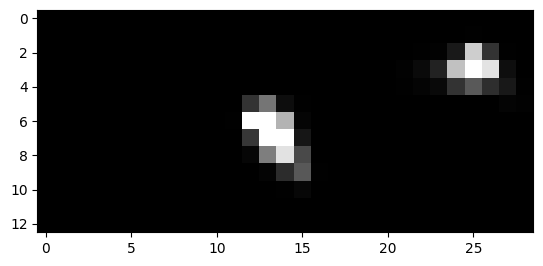

753


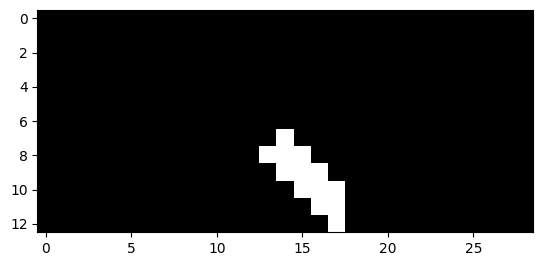

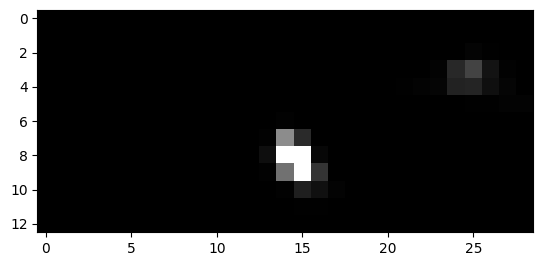

754


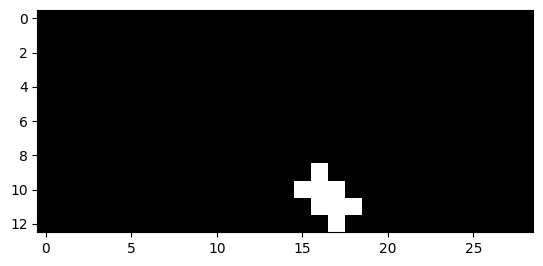

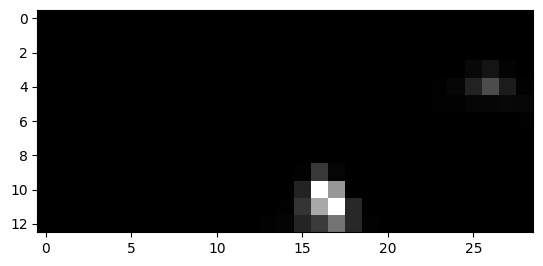

755


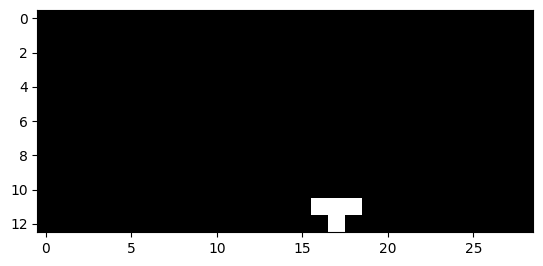

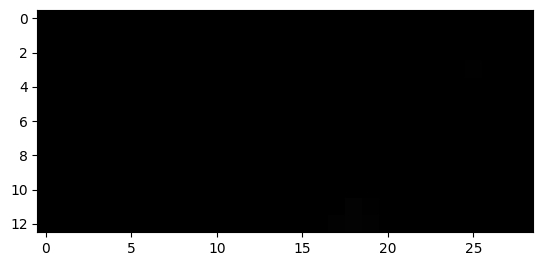

756


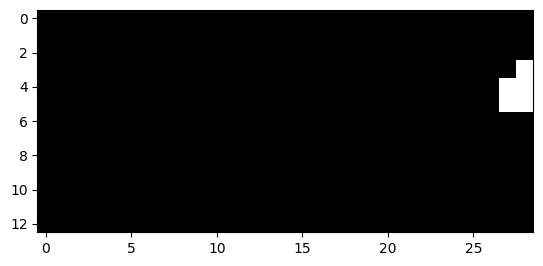

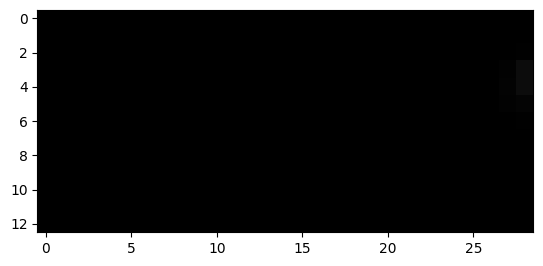

757


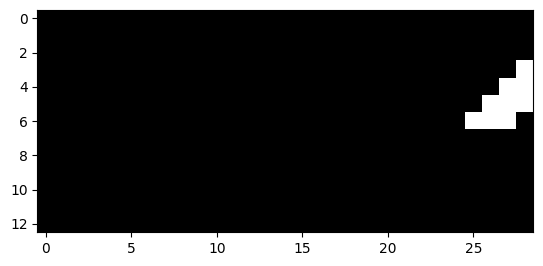

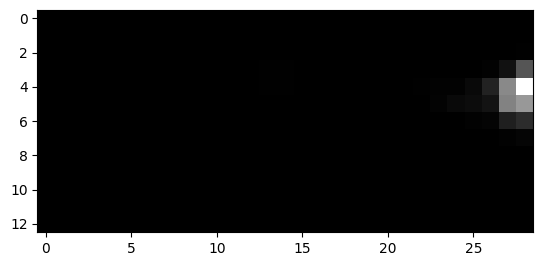

758


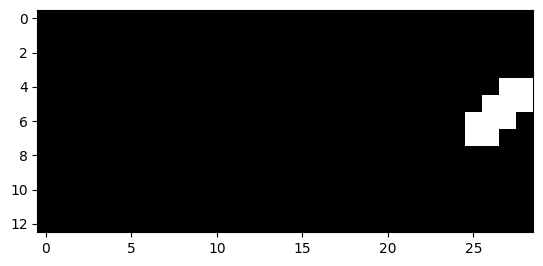

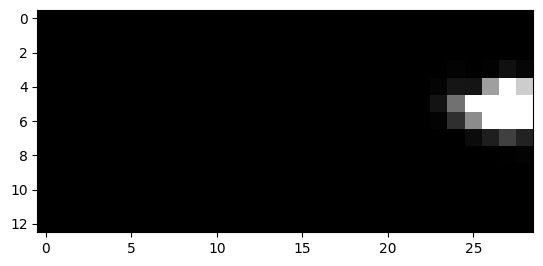

759


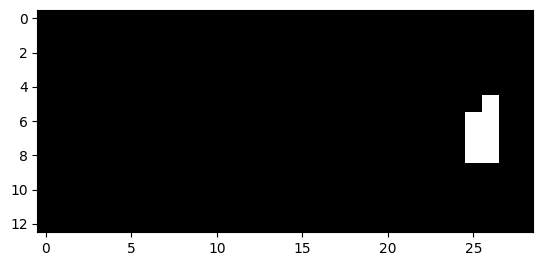

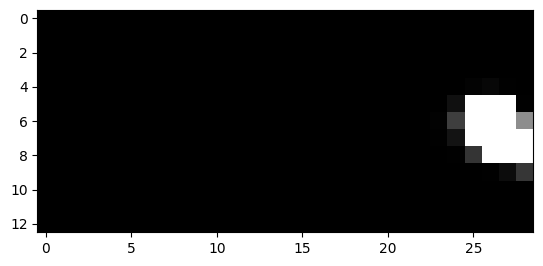

760


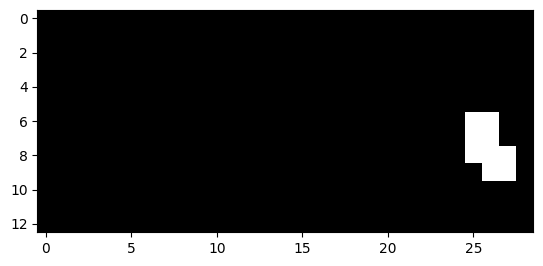

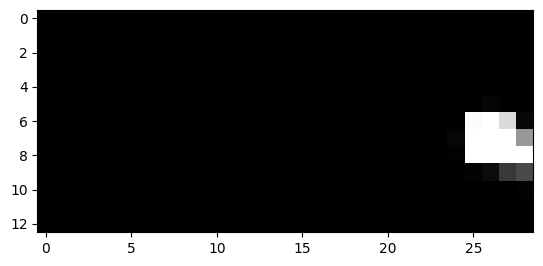

761


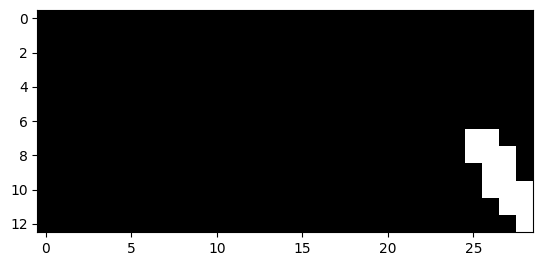

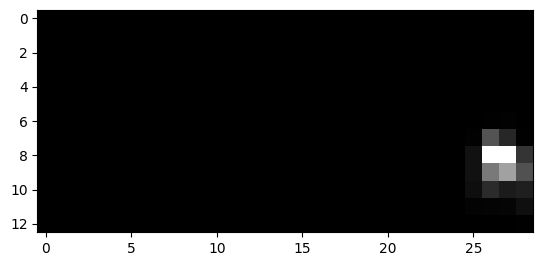

762


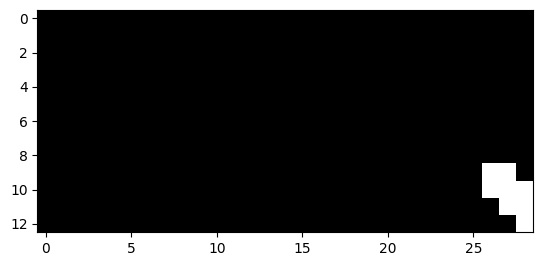

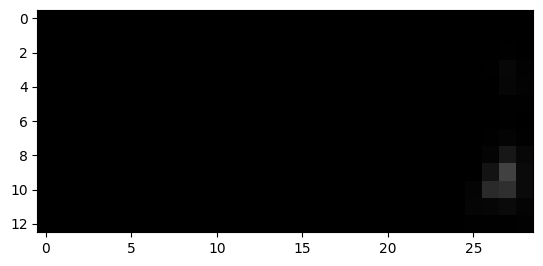

763


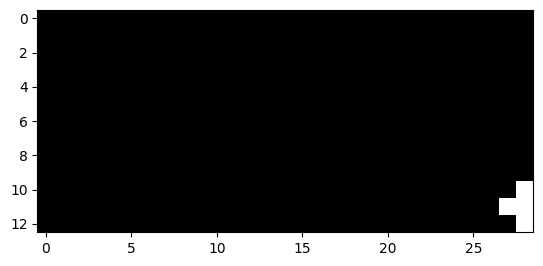

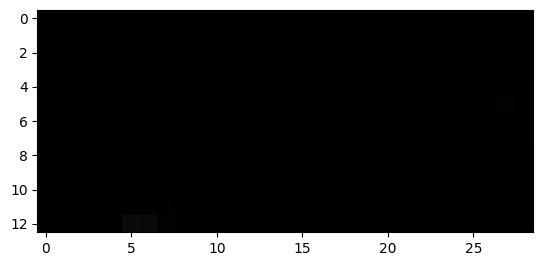

896


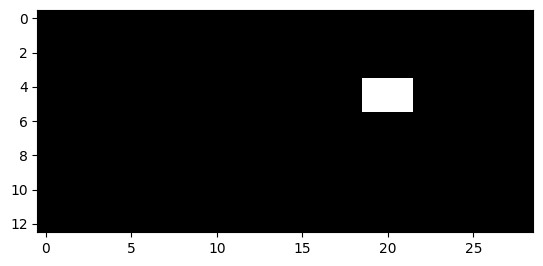

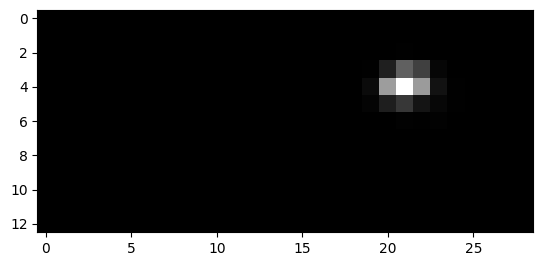

897


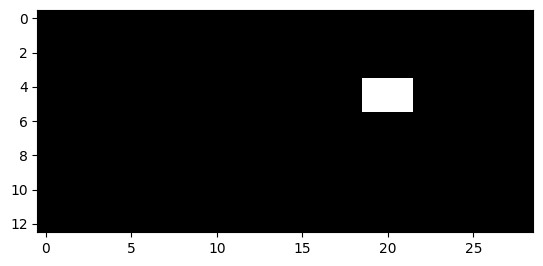

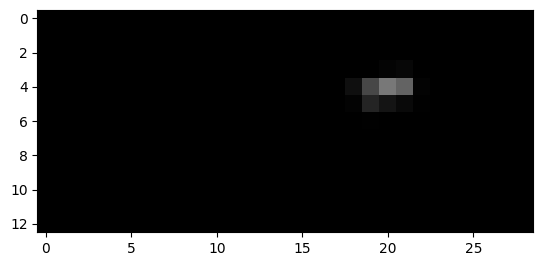

948


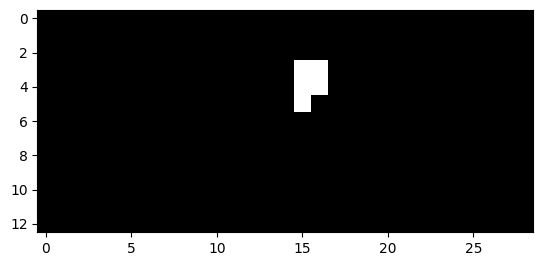

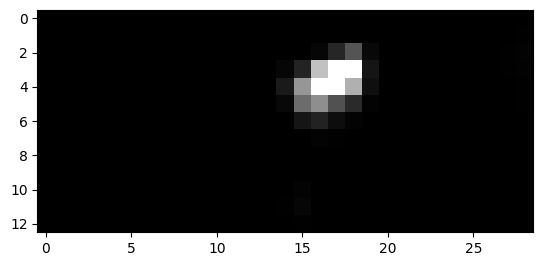

949


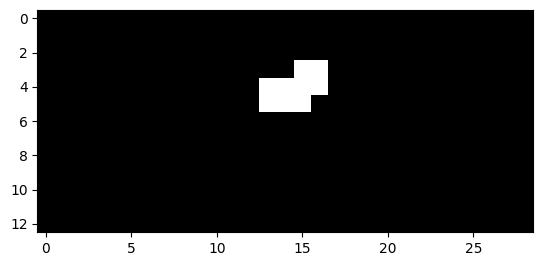

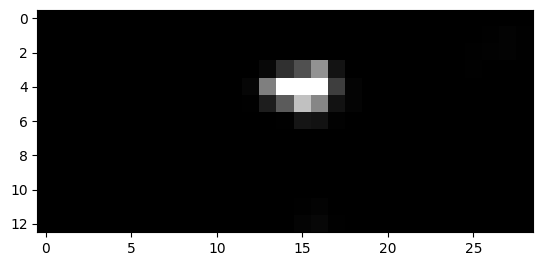

950


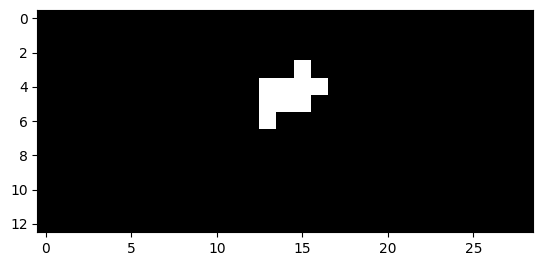

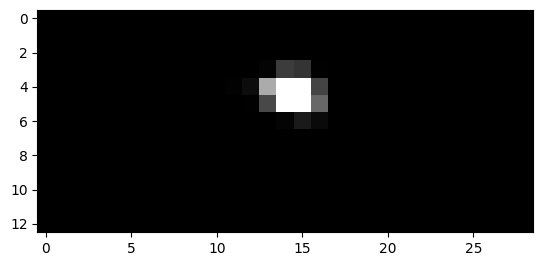

951


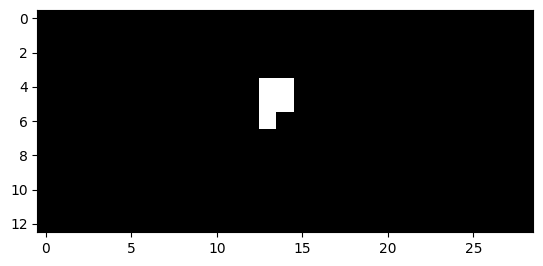

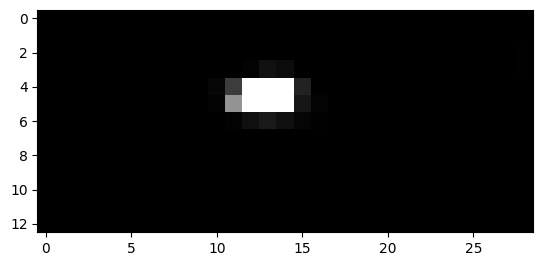

952


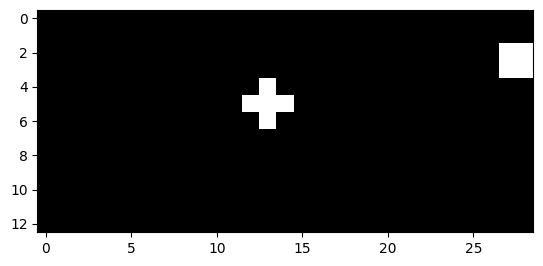

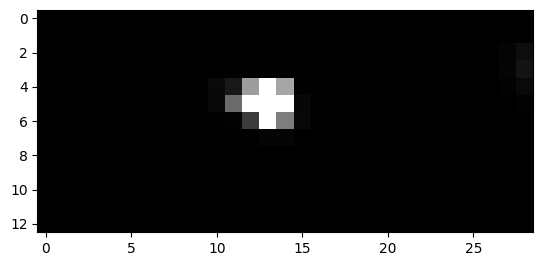

953


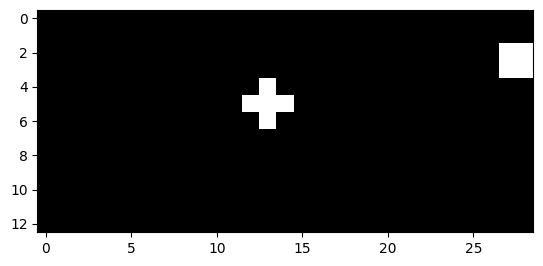

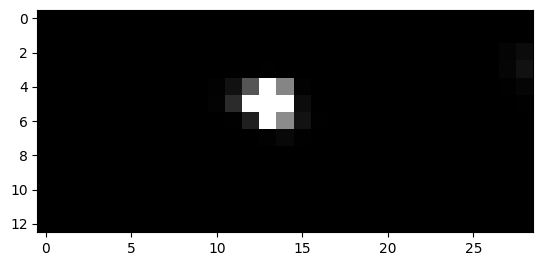

954


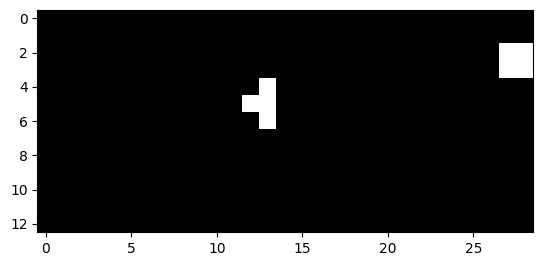

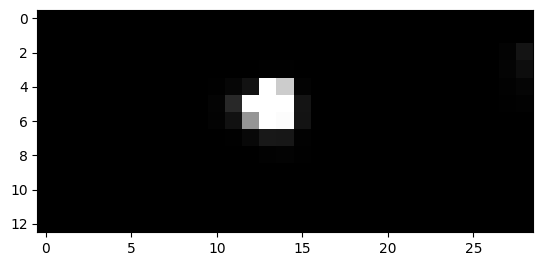

955


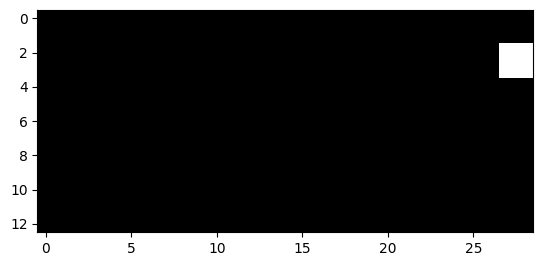

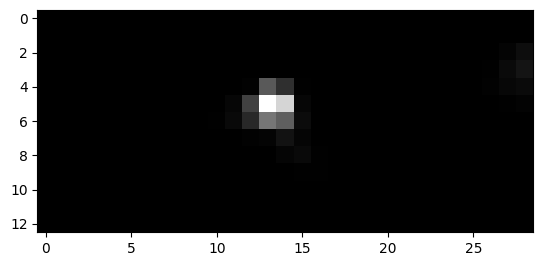

959


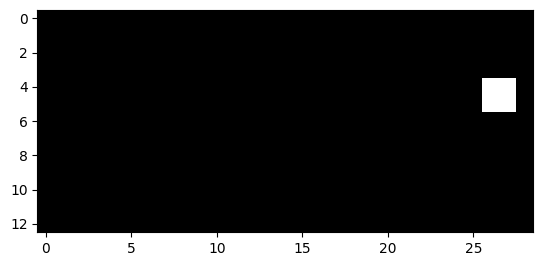

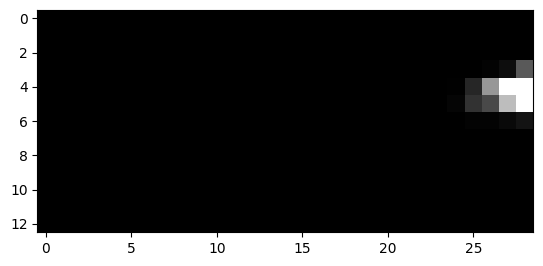

960


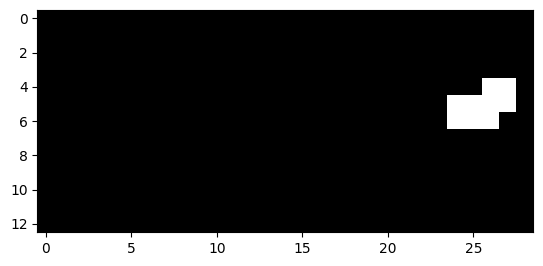

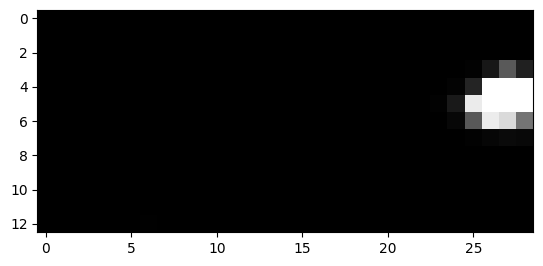

961


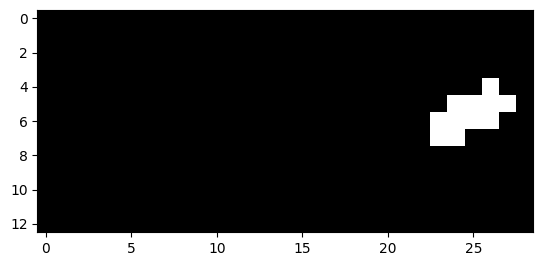

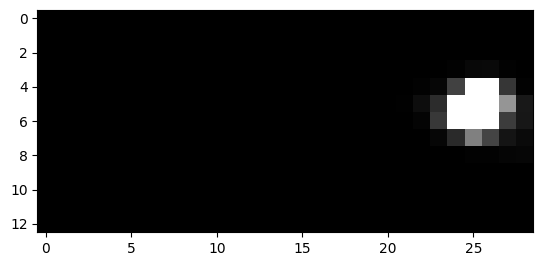

962


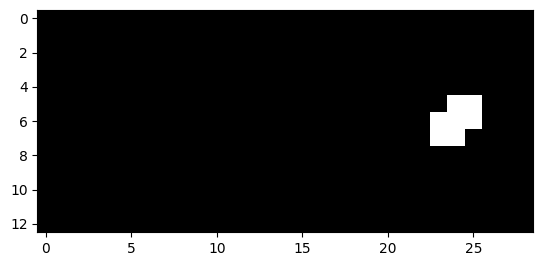

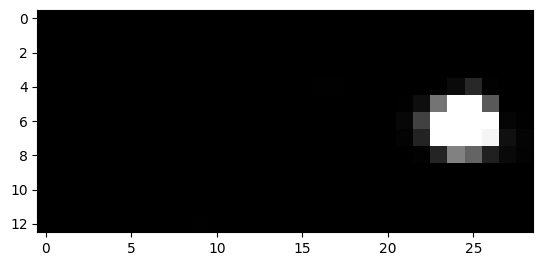

987


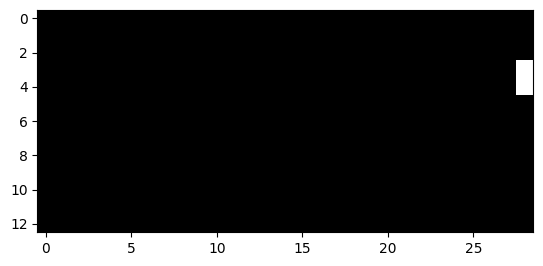

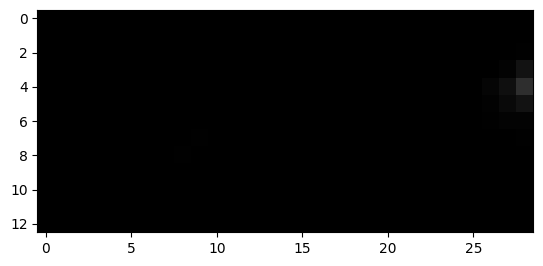

988


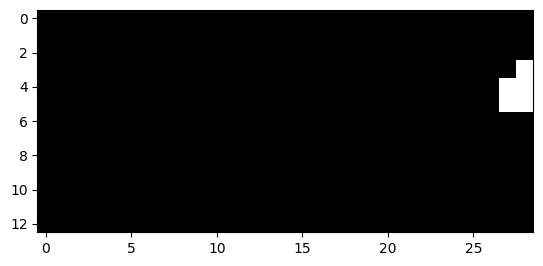

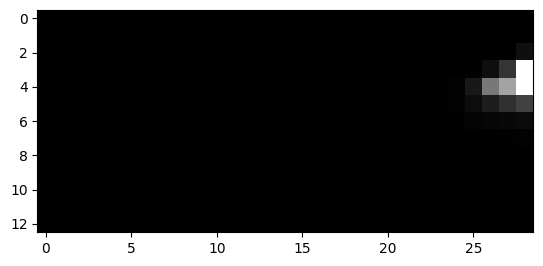

989


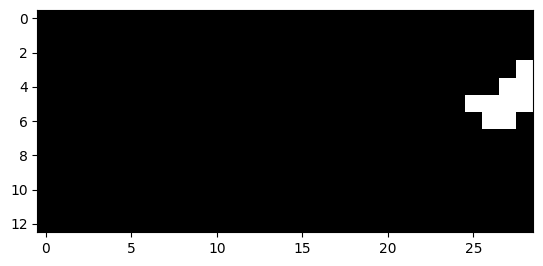

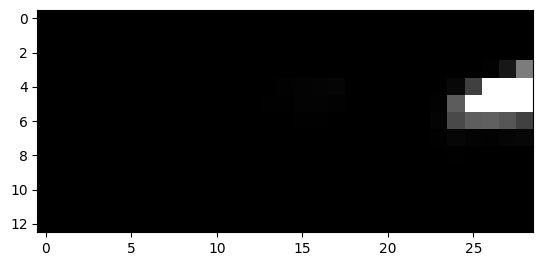

990


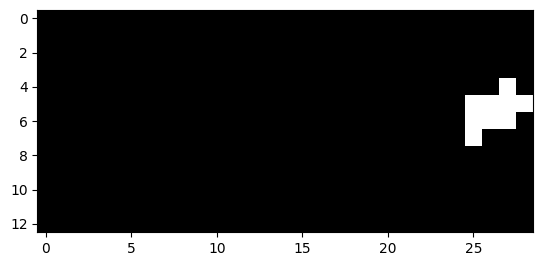

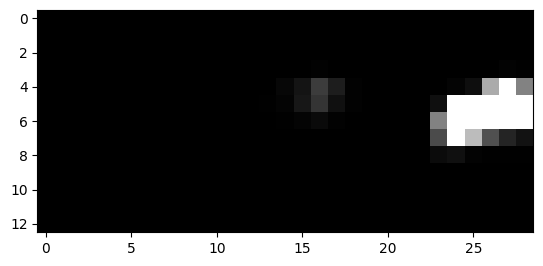

991


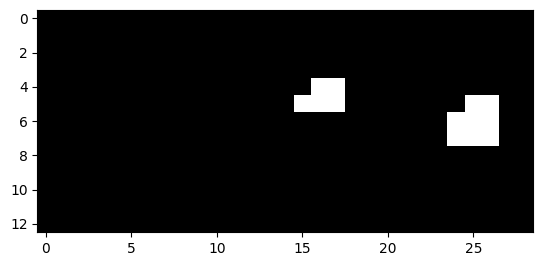

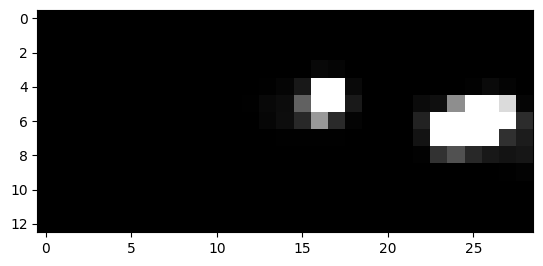

992


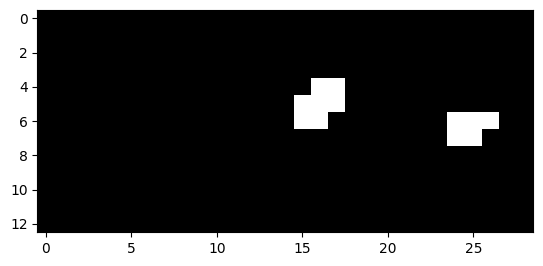

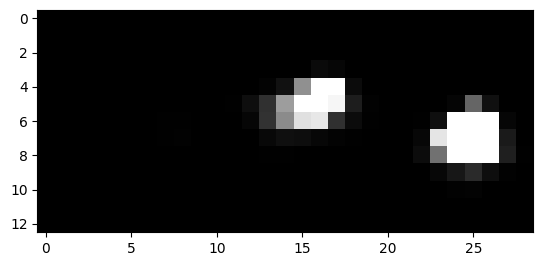

993


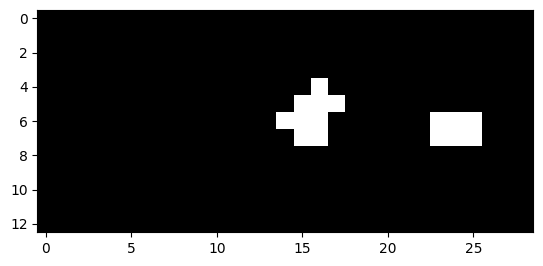

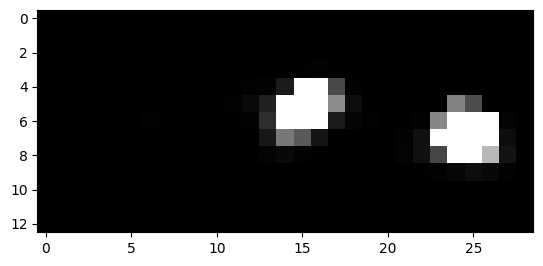

994


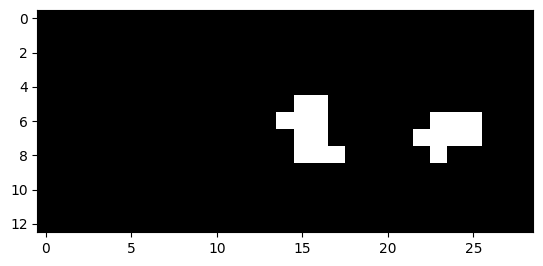

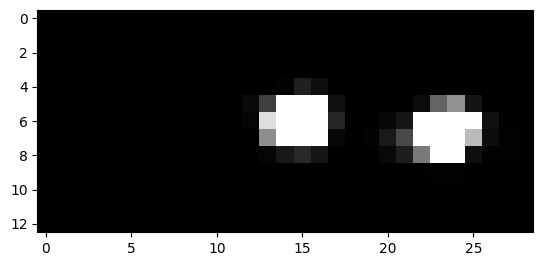

995


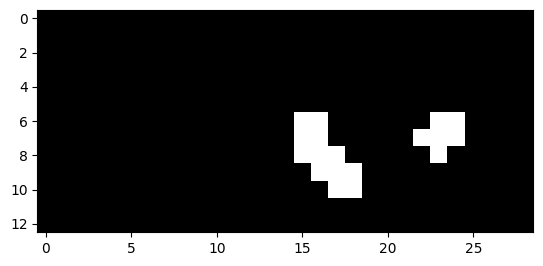

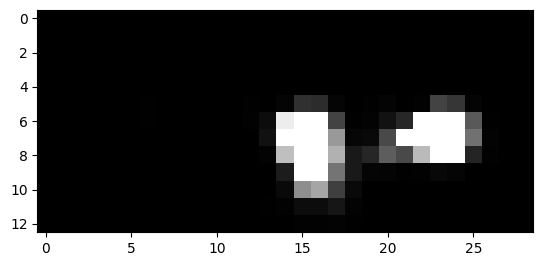

996


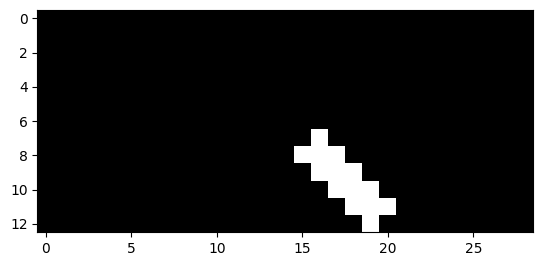

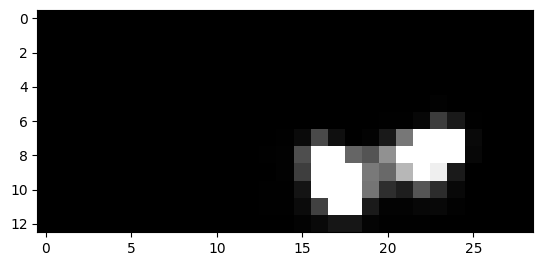

997


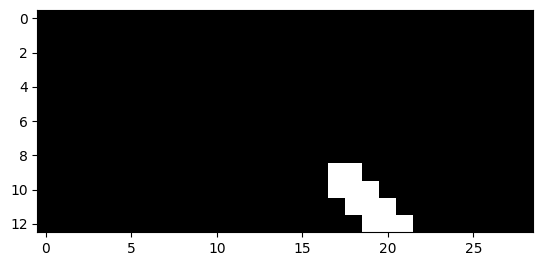

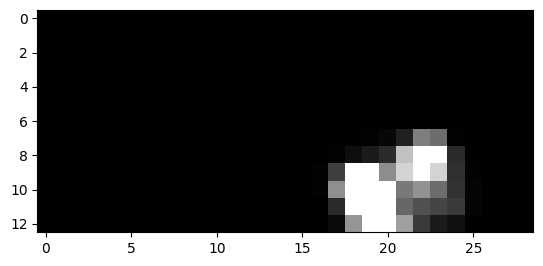

998


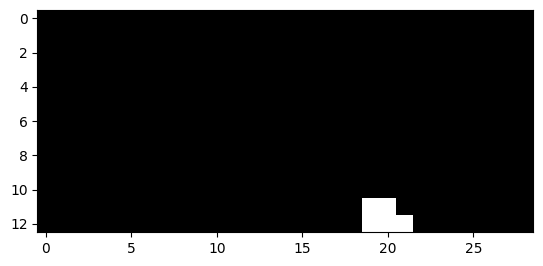

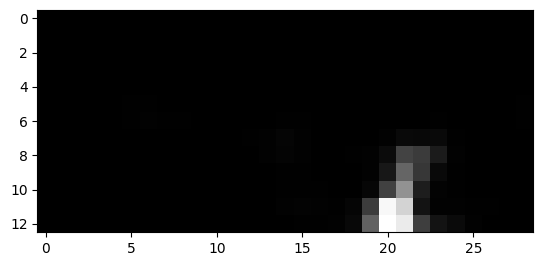

1023


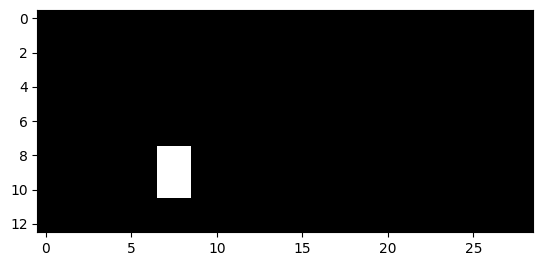

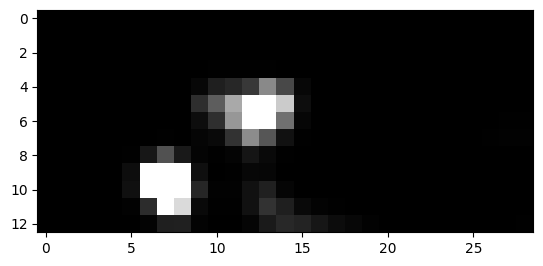

1024


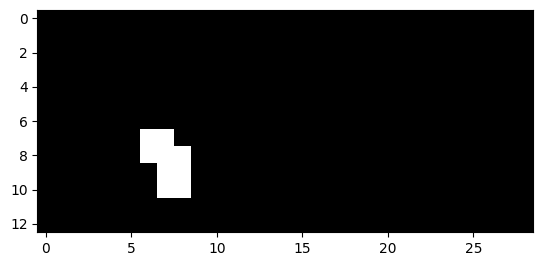

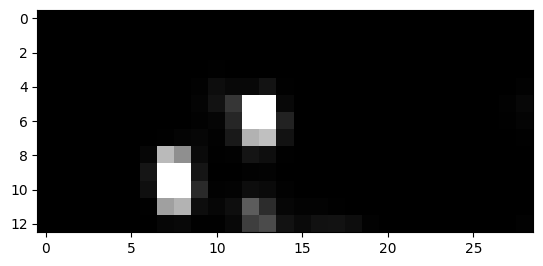

1025


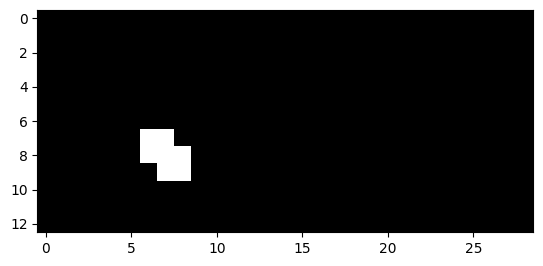

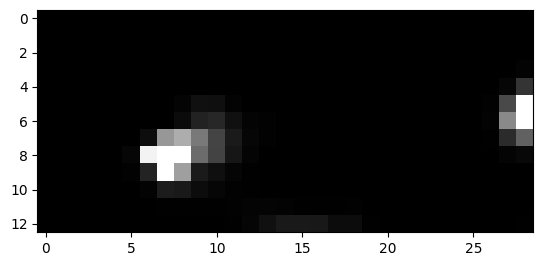

1027


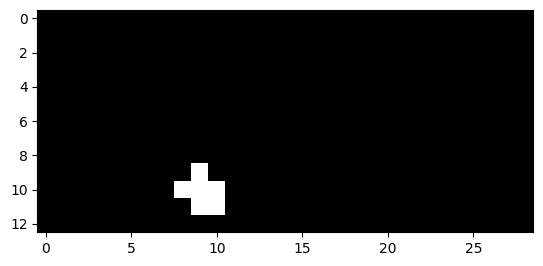

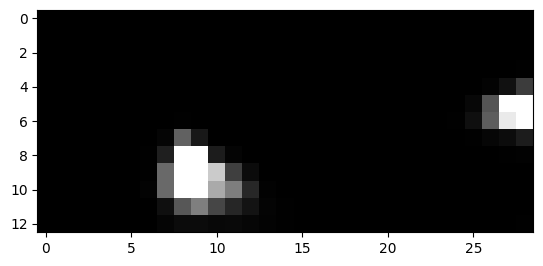

1028


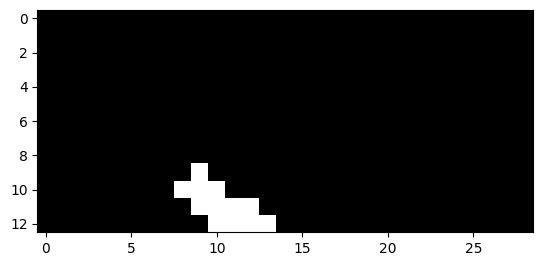

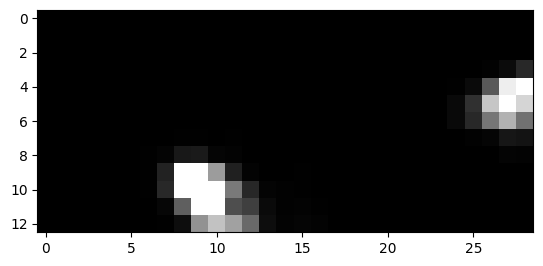

1029


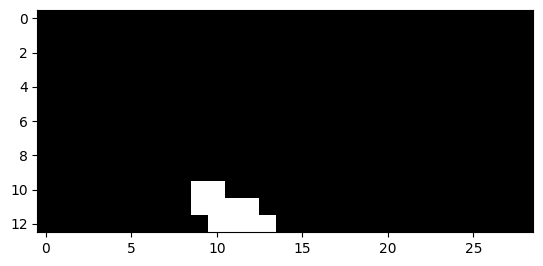

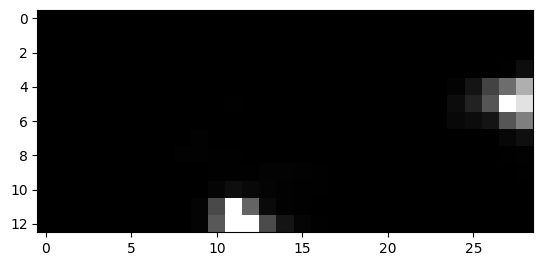

1039


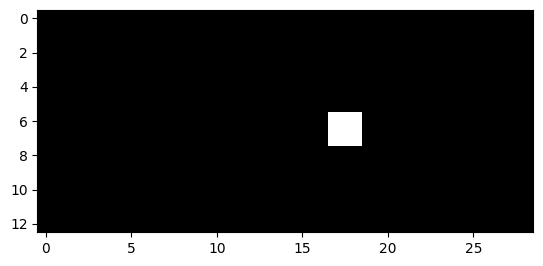

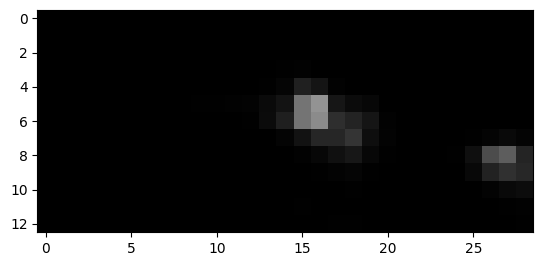

1040


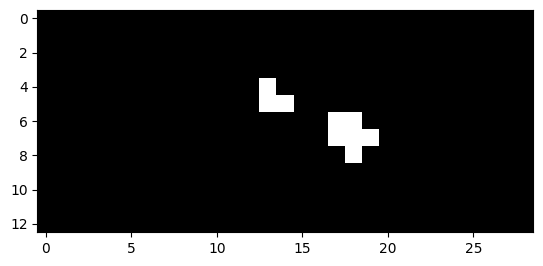

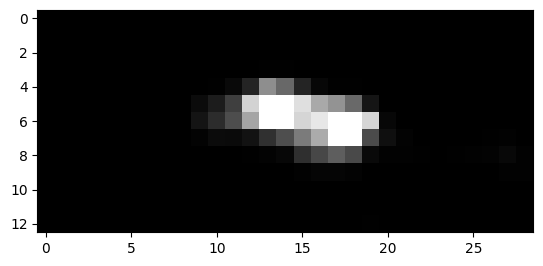

1041


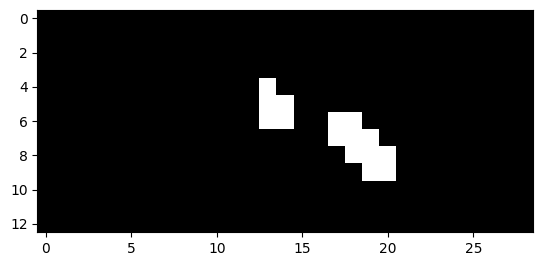

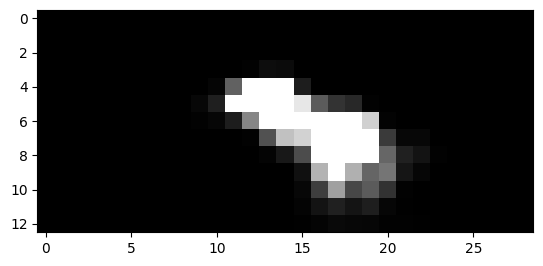

1042


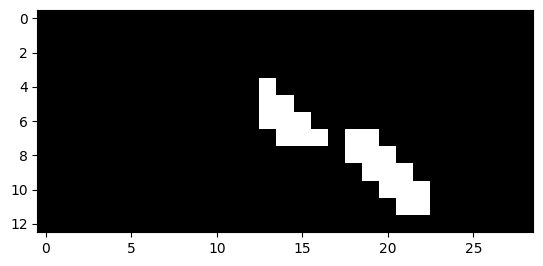

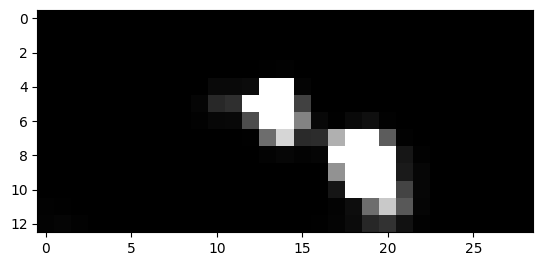

1043


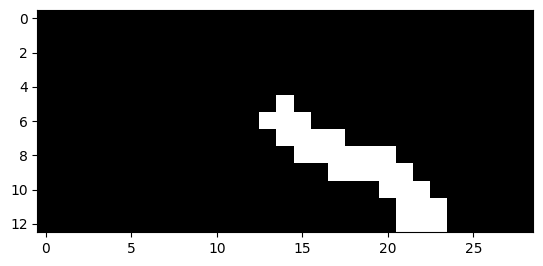

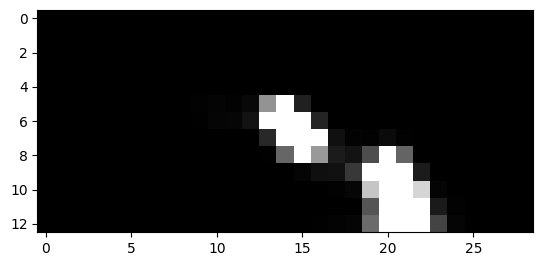

1044


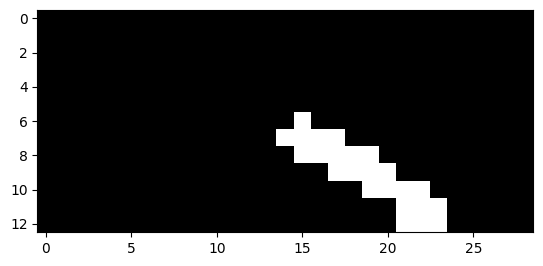

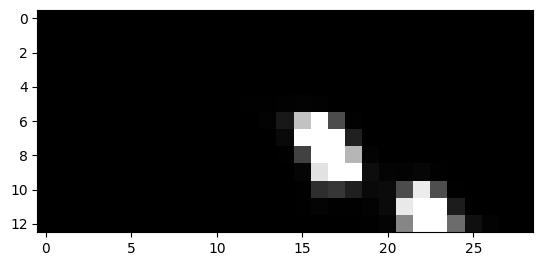

1045


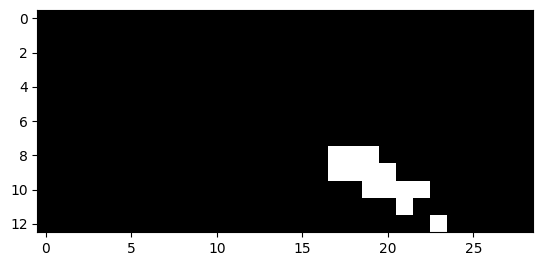

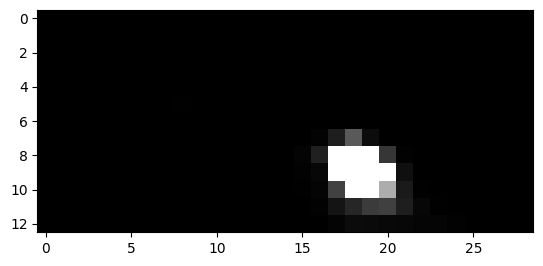

1046


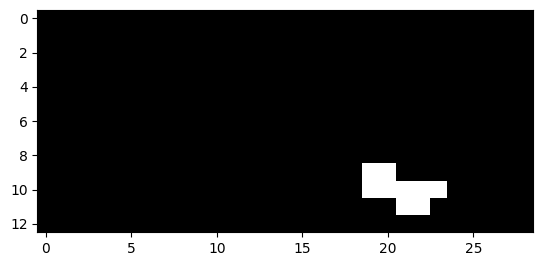

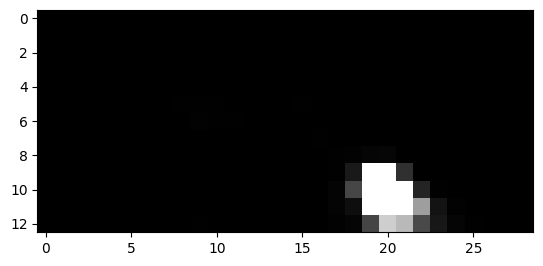

1047


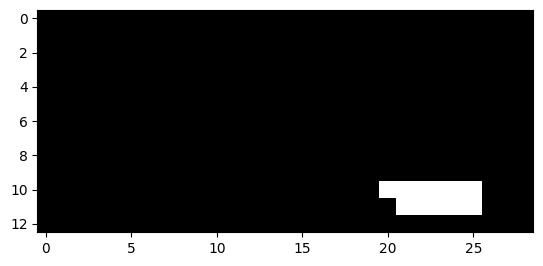

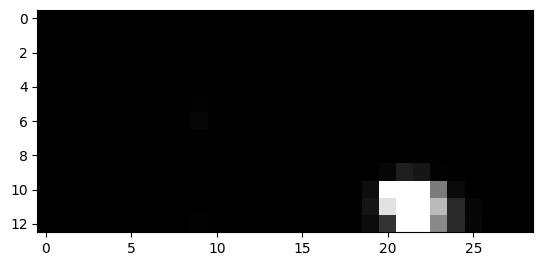

1048


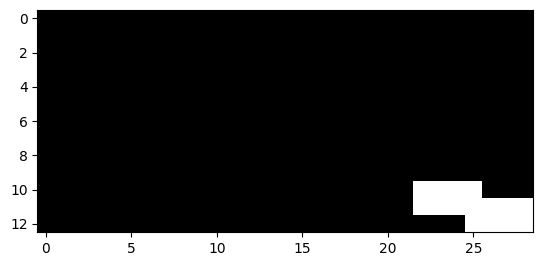

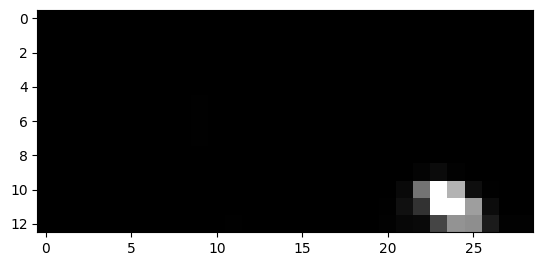

1049


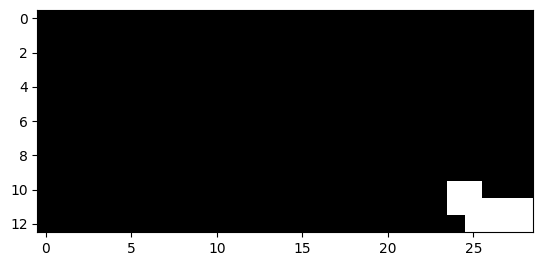

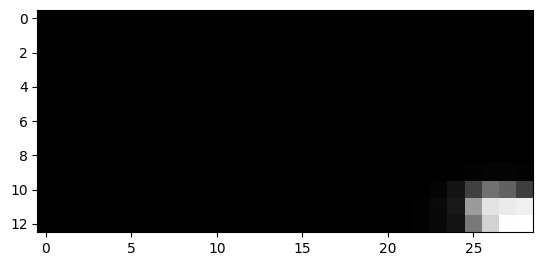

1050


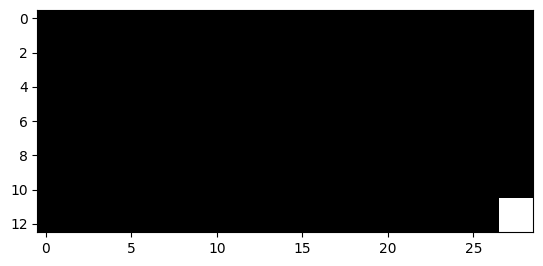

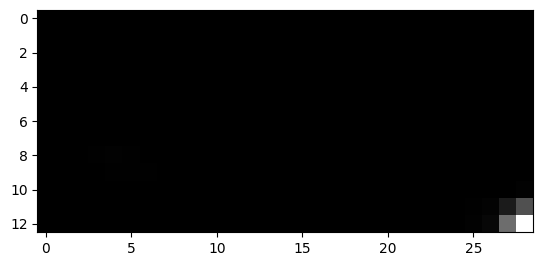

1064


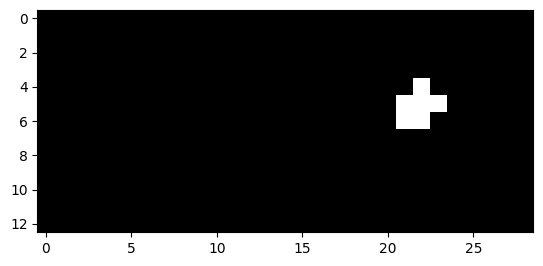

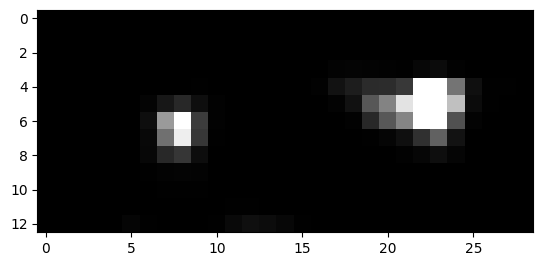

1065


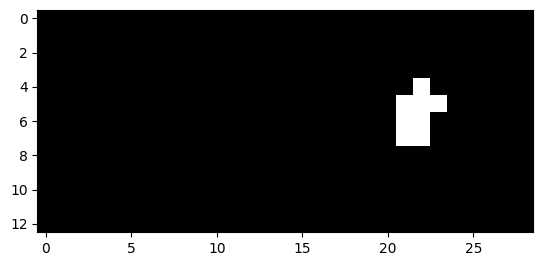

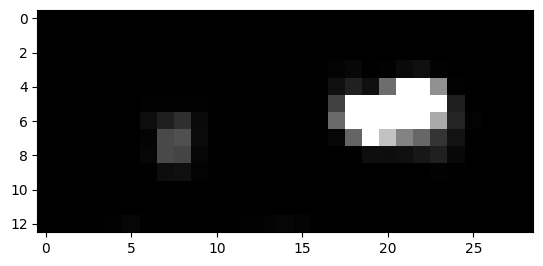

1066


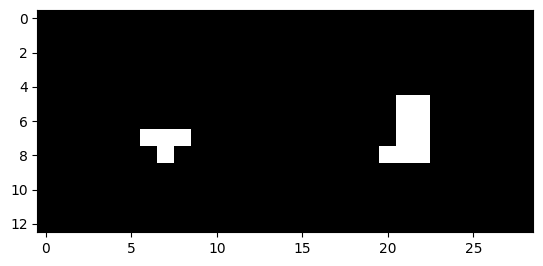

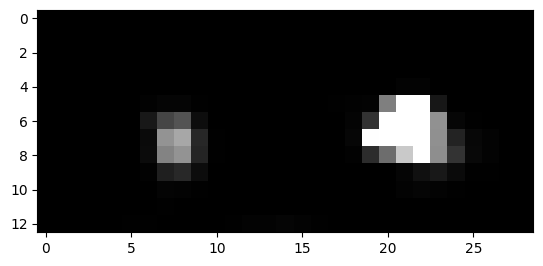

1067


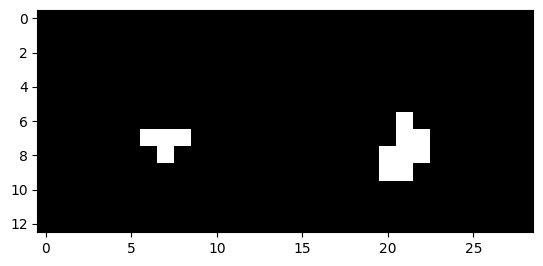

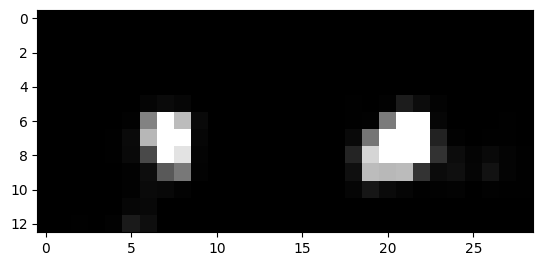

1068


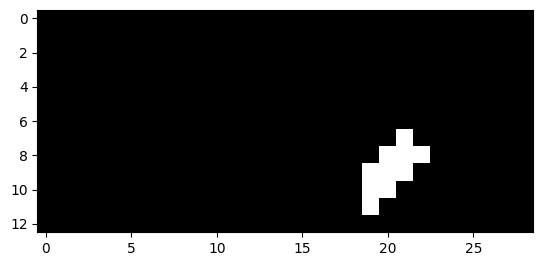

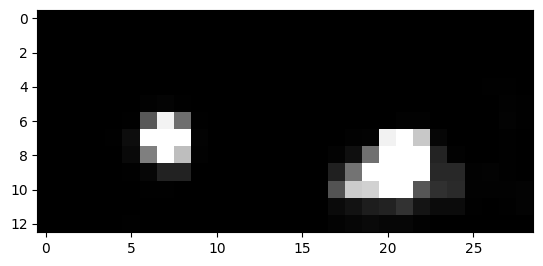

1069


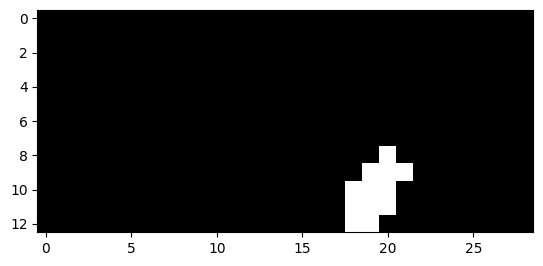

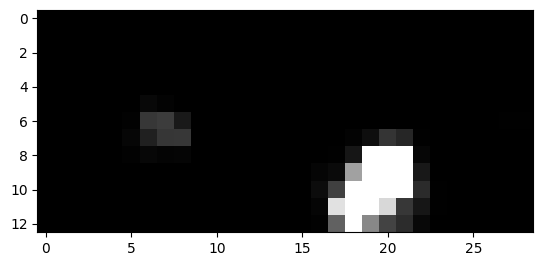

1070


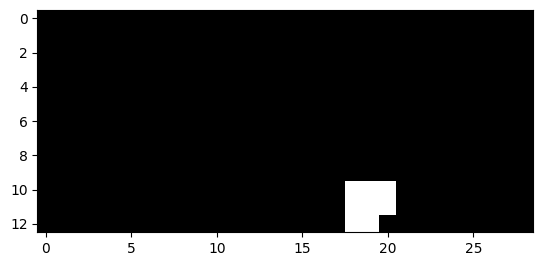

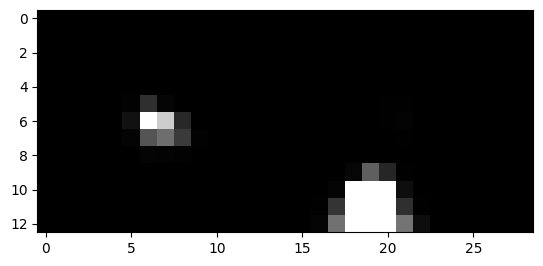

1071


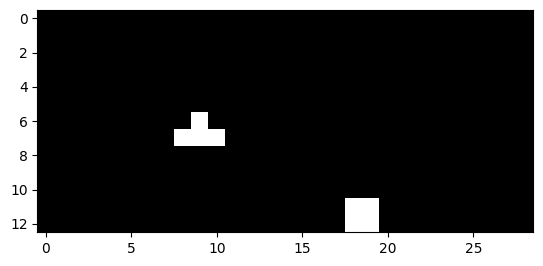

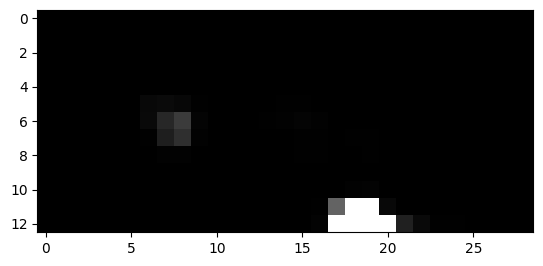

1072


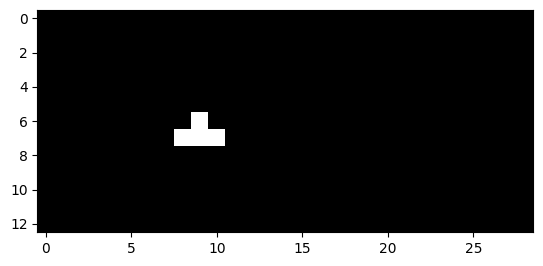

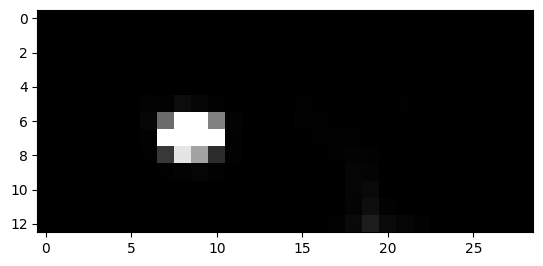

1073


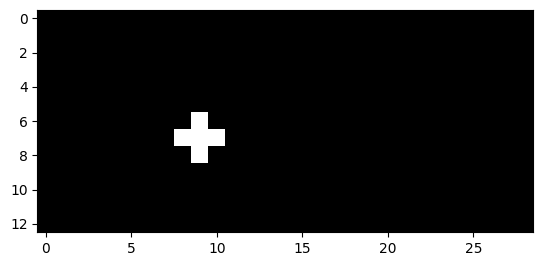

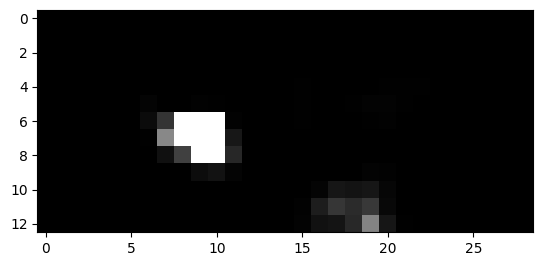

1074


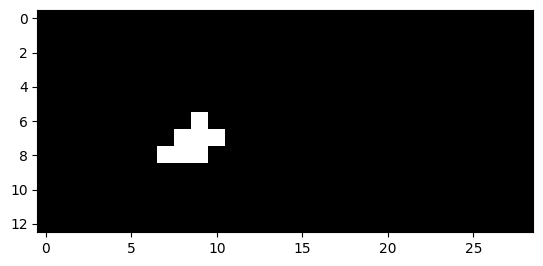

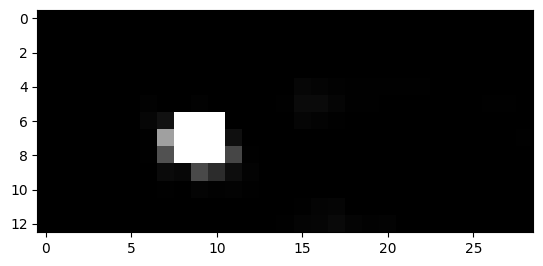

1075


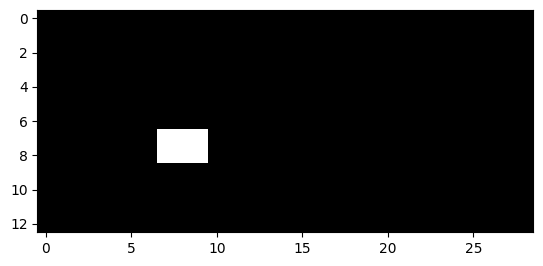

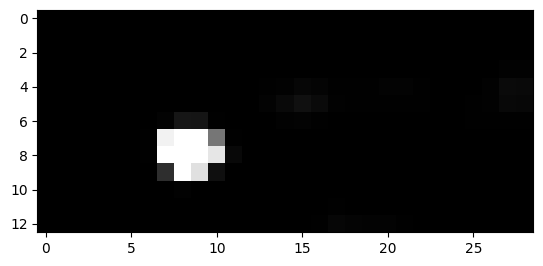

1076


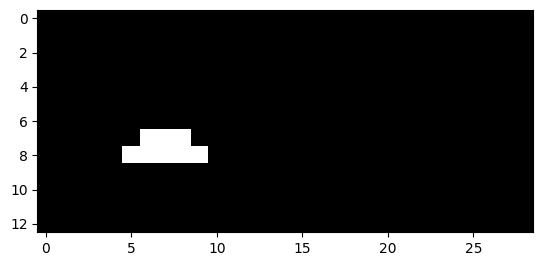

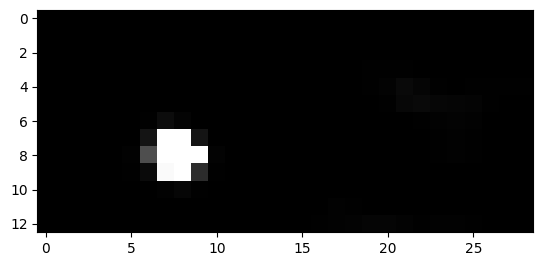

1077


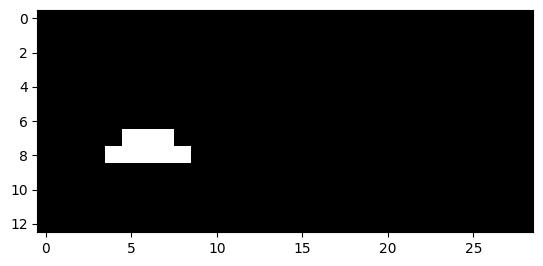

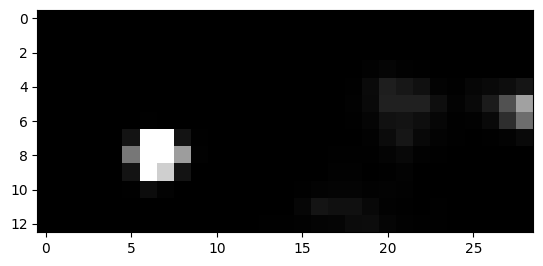

1078


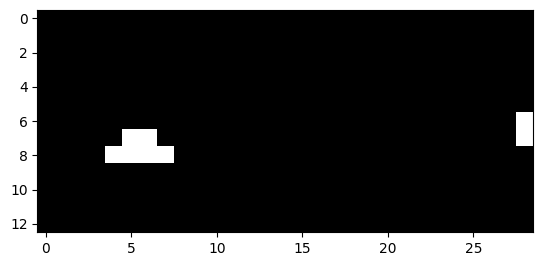

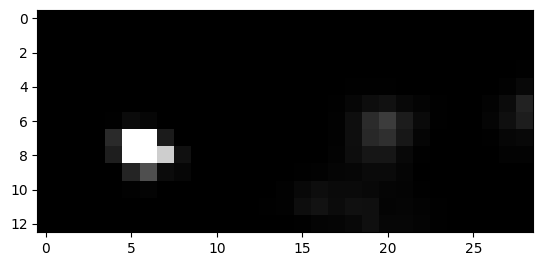

1079


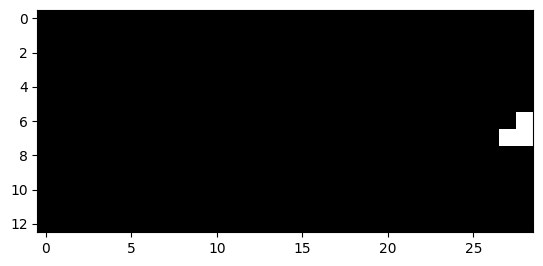

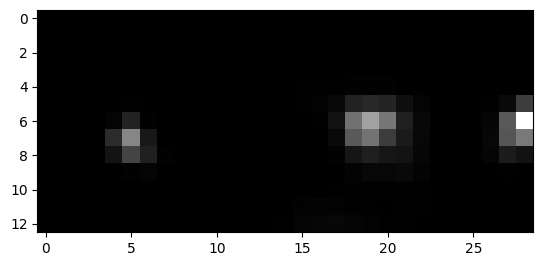

1080


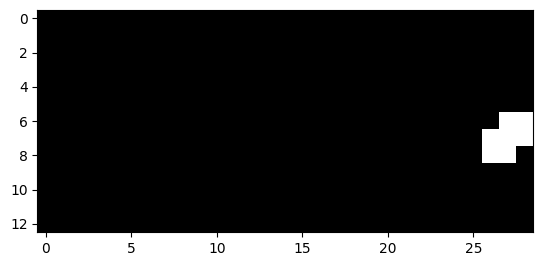

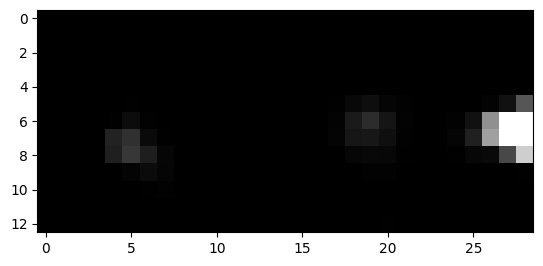

1081


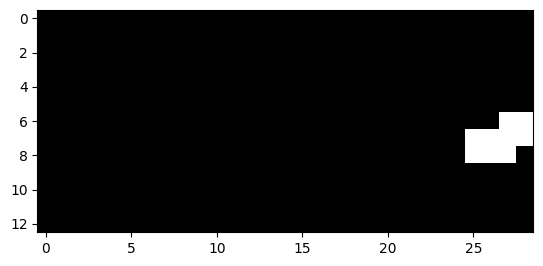

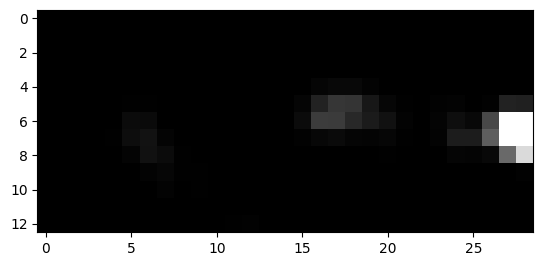

1082


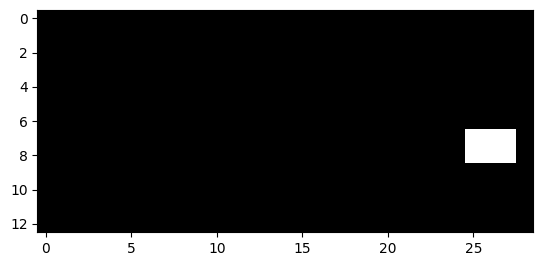

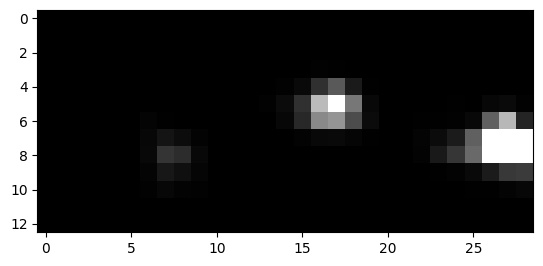

1083


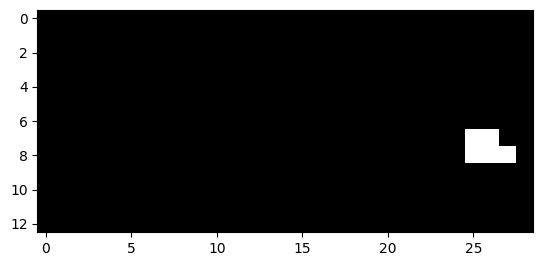

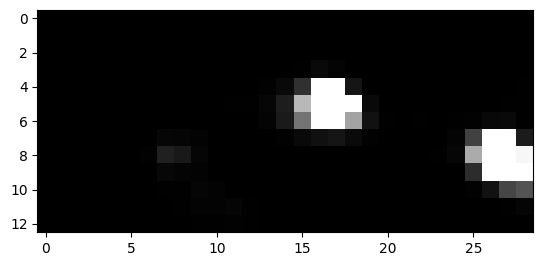

1084


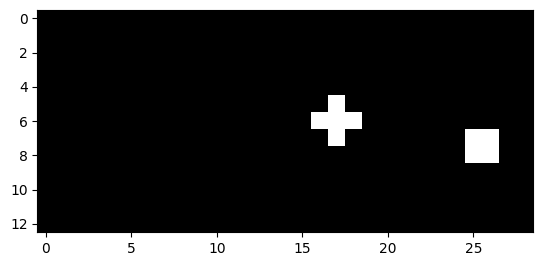

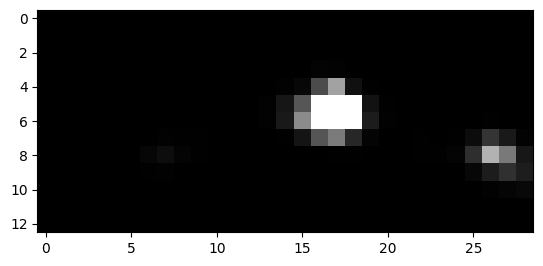

1085


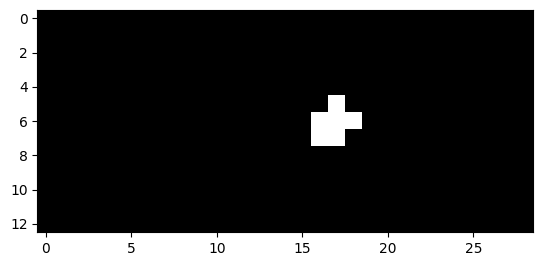

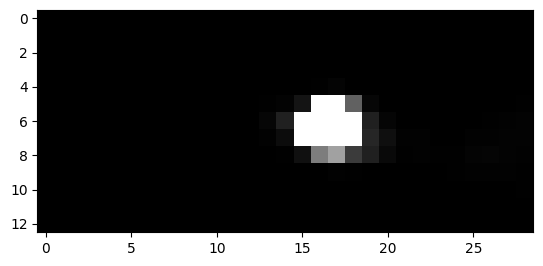

1086


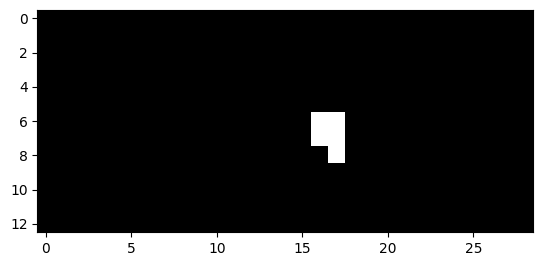

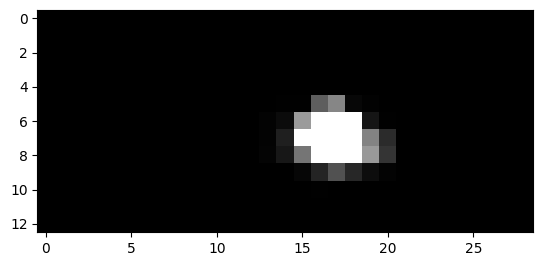

1087


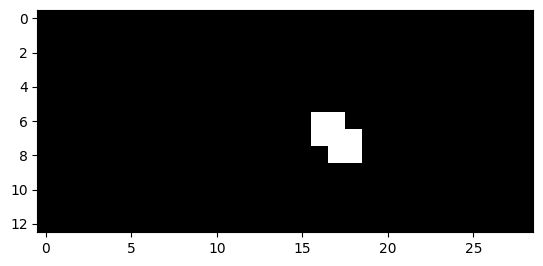

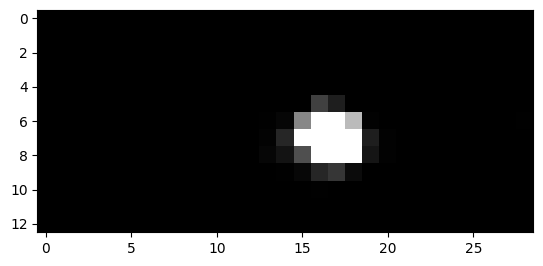

1088


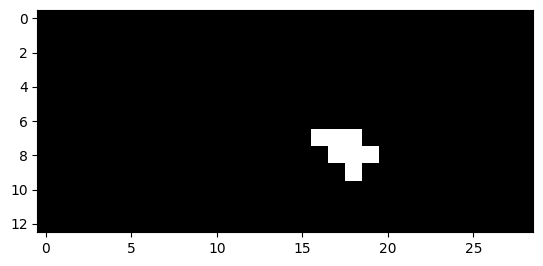

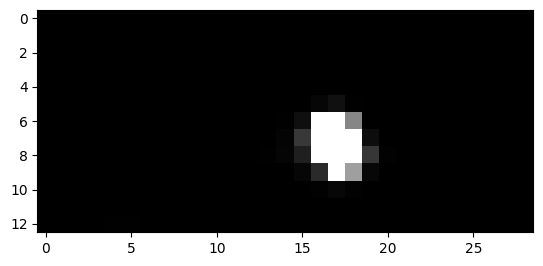

1089


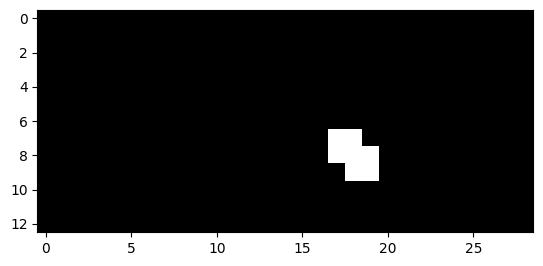

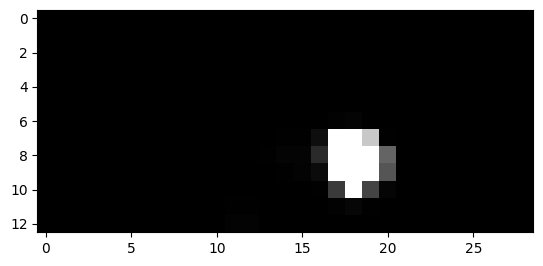

1090


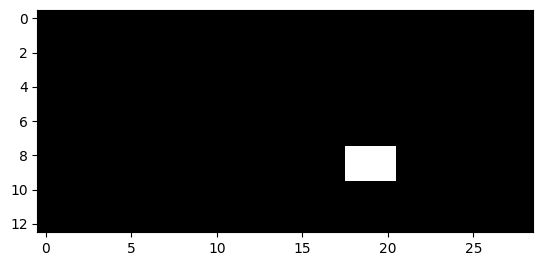

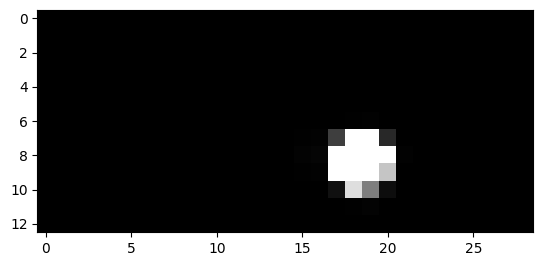

1091


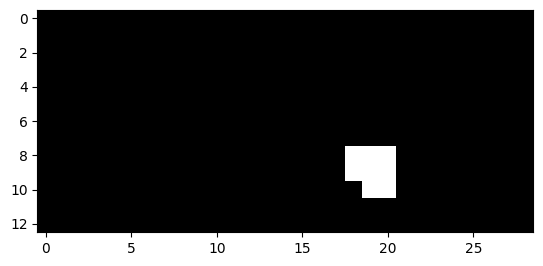

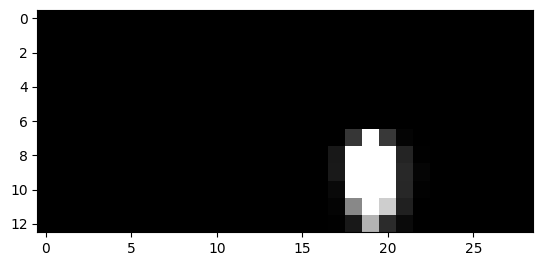

1092


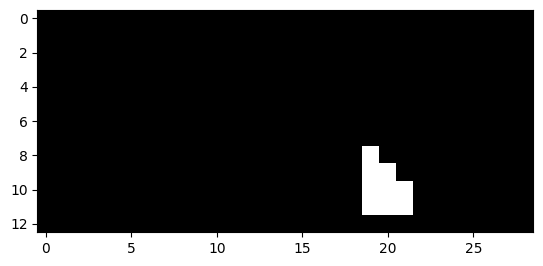

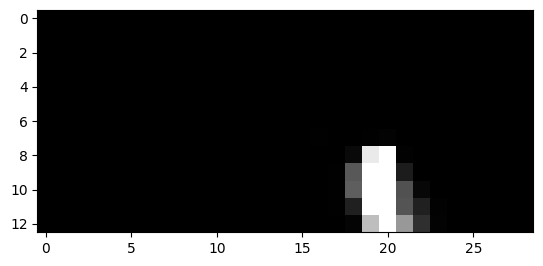

1093


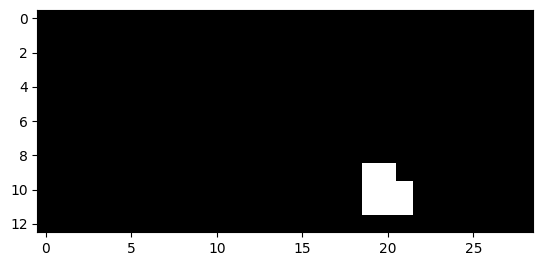

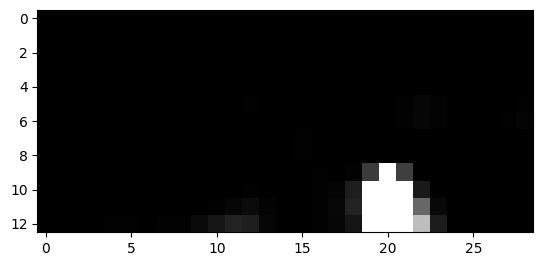

1094


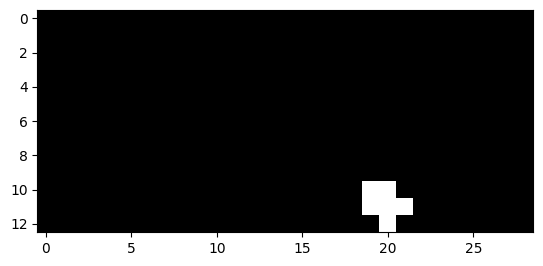

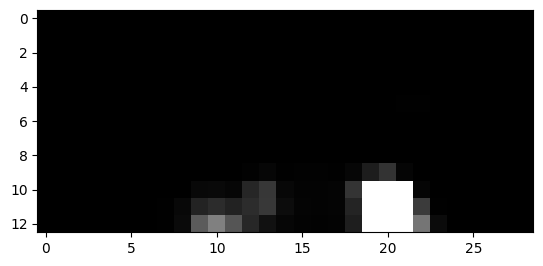

1095


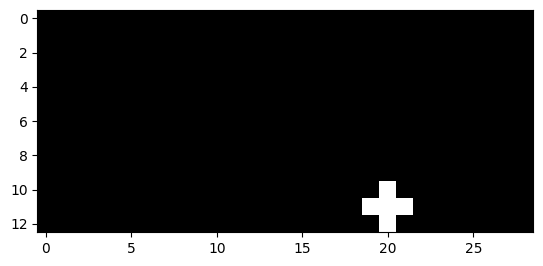

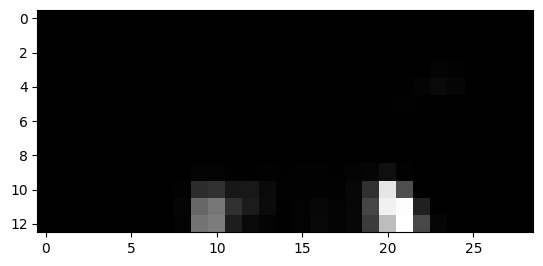

1116


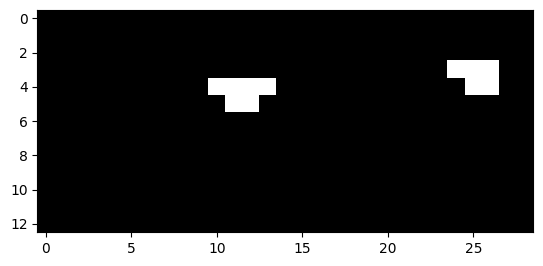

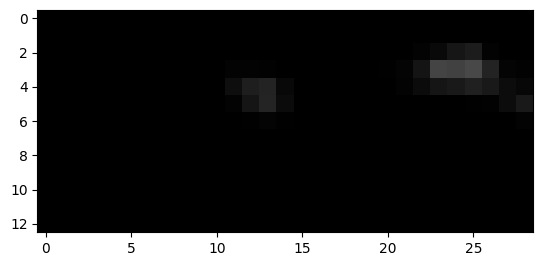

1117


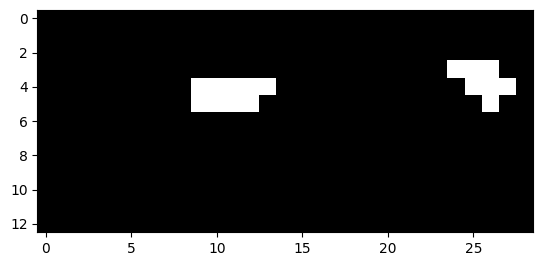

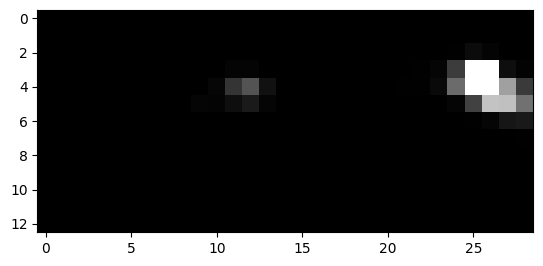

1118


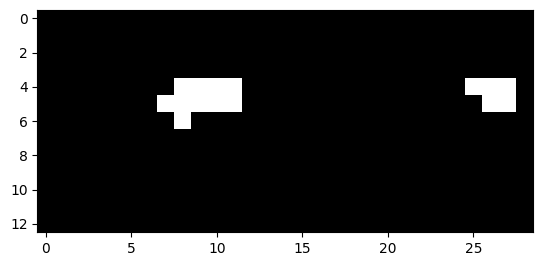

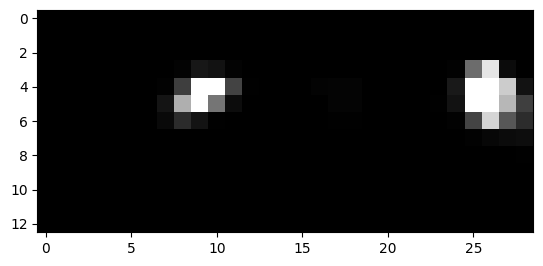

1119


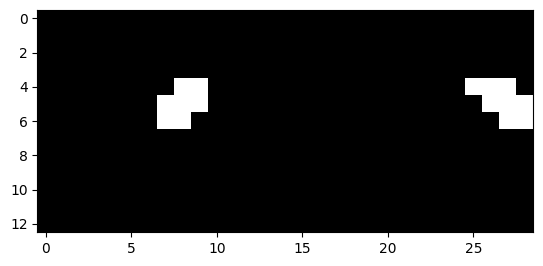

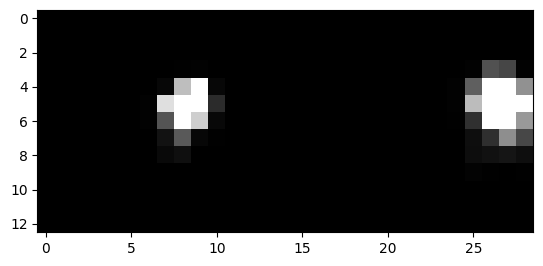

1120


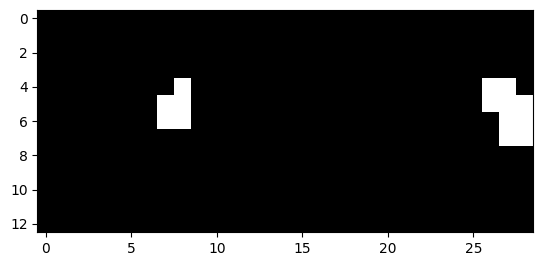

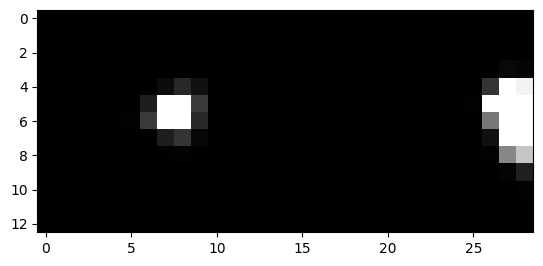

1121


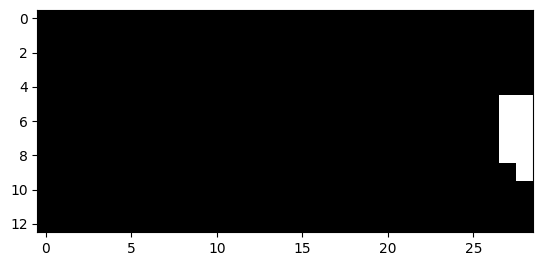

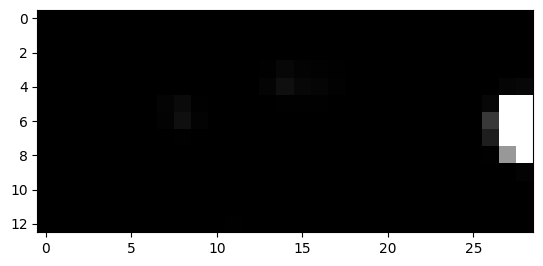

1122


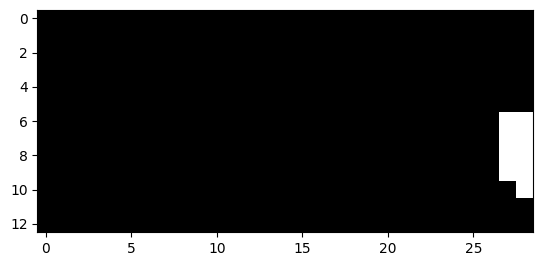

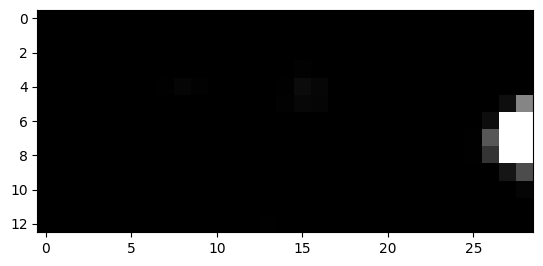

1123


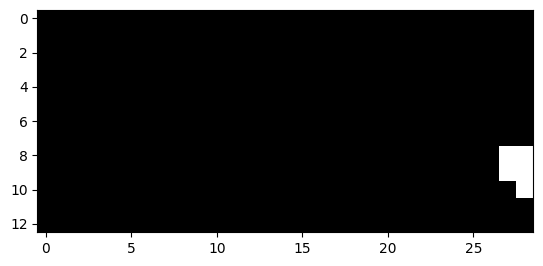

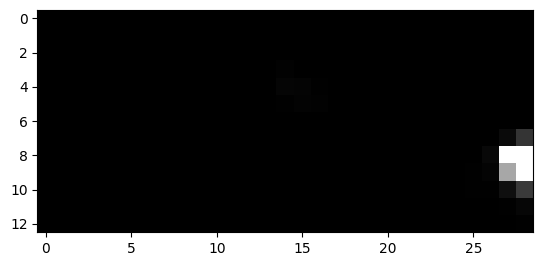

1341


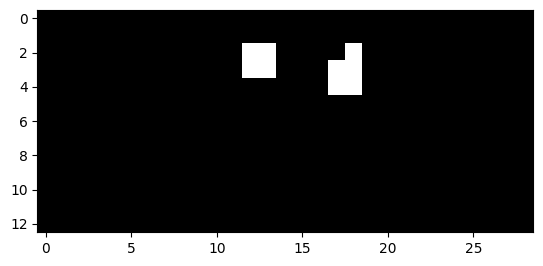

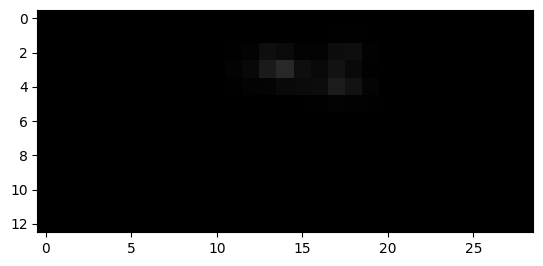

1342


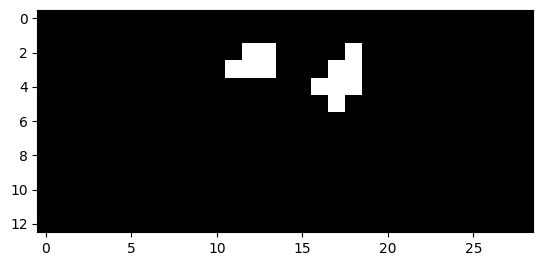

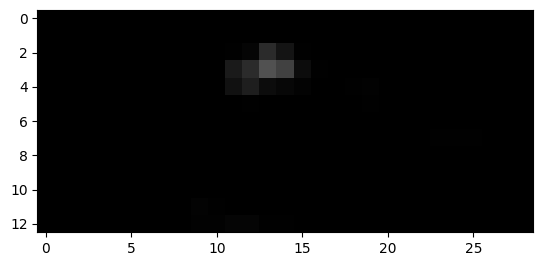

1343


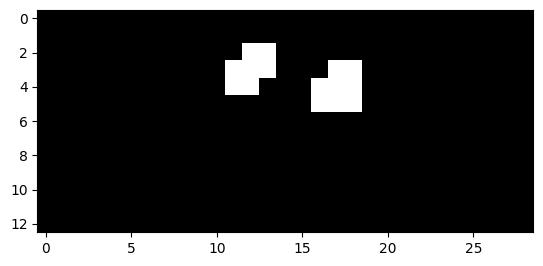

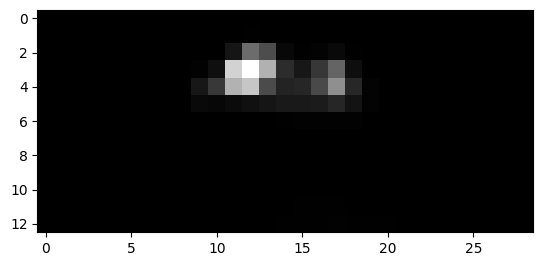

1344


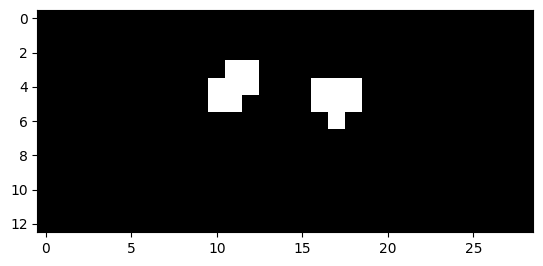

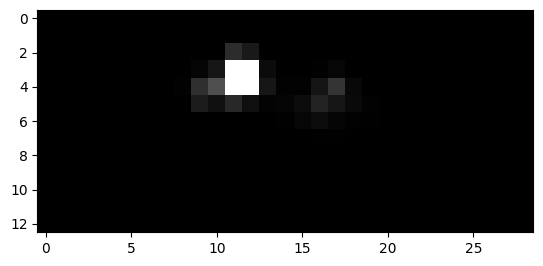

1345


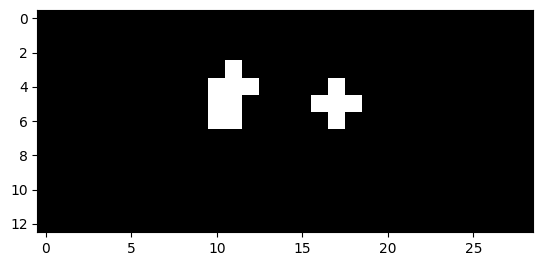

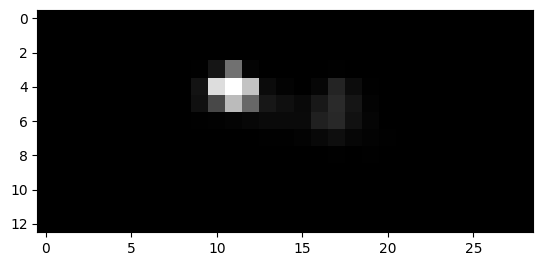

1346


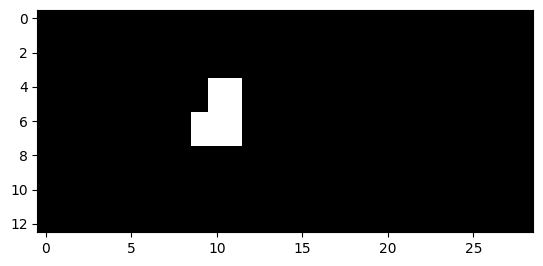

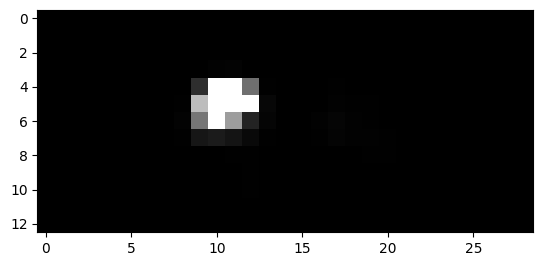

1347


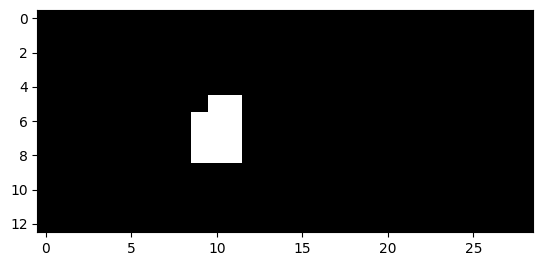

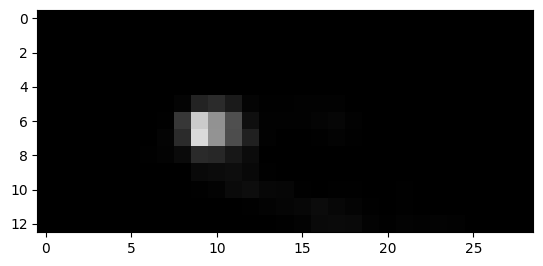

1348


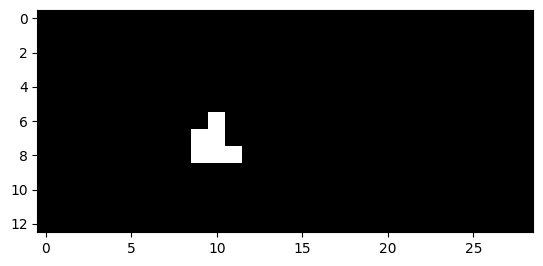

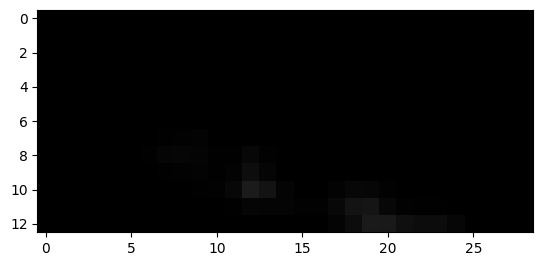

1366


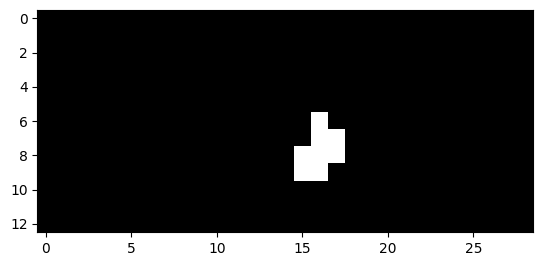

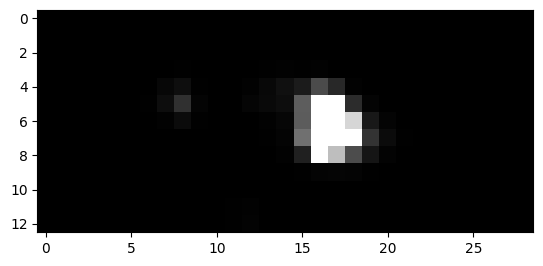

1367


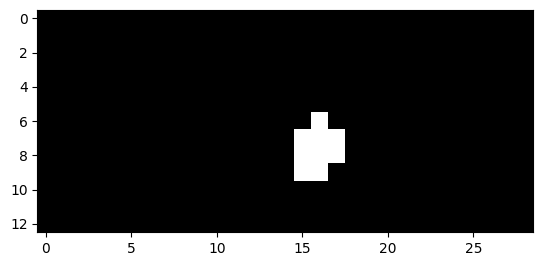

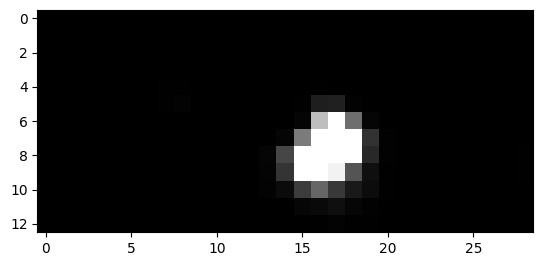

1368


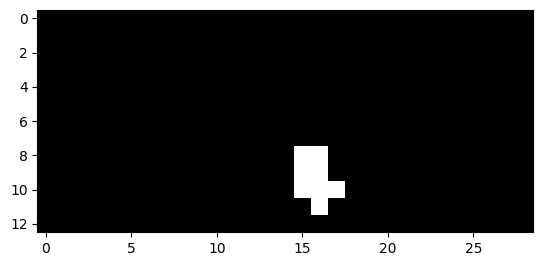

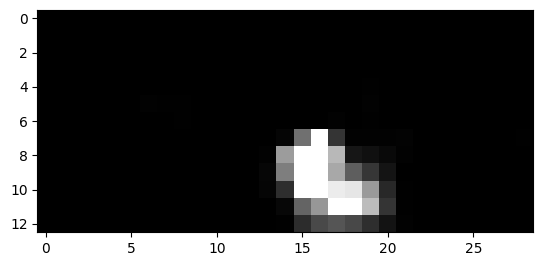

1369


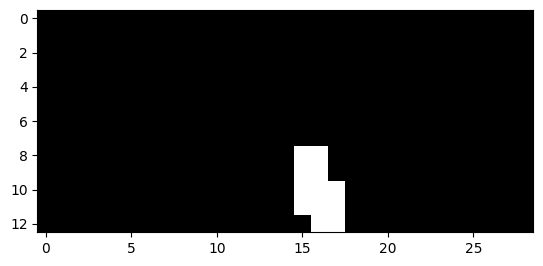

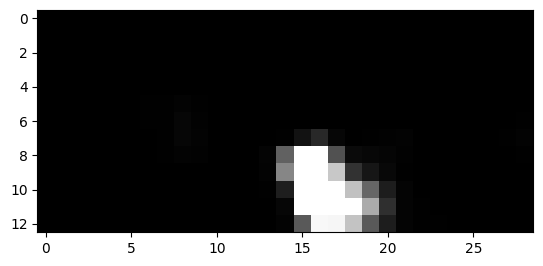

1370


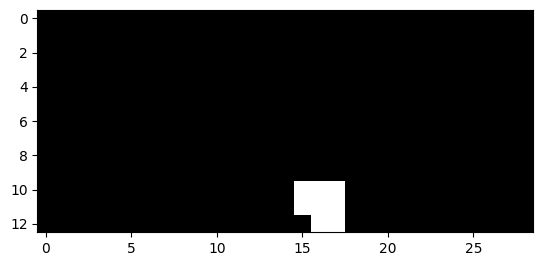

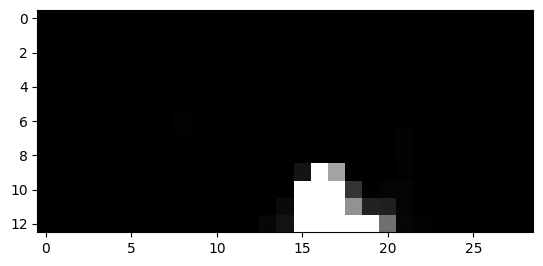

1371


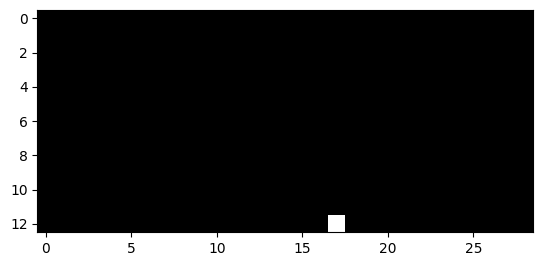

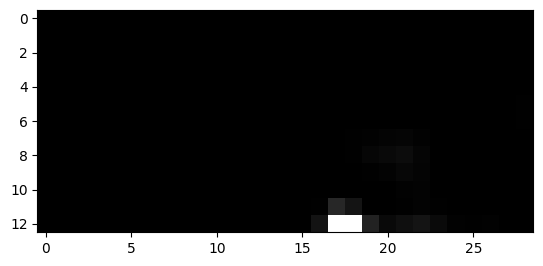

1389


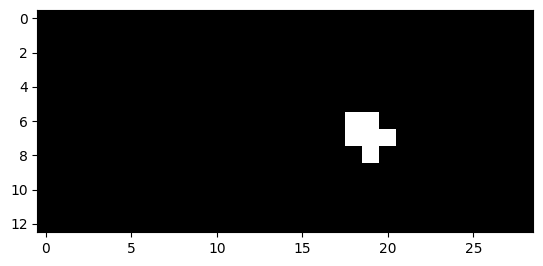

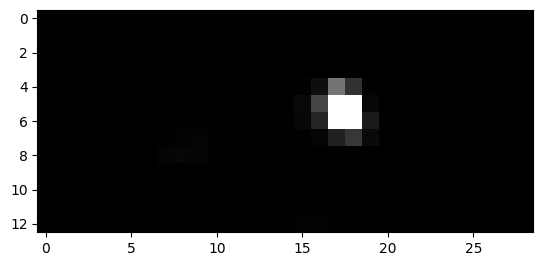

1390


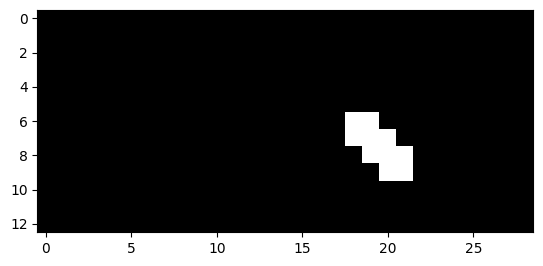

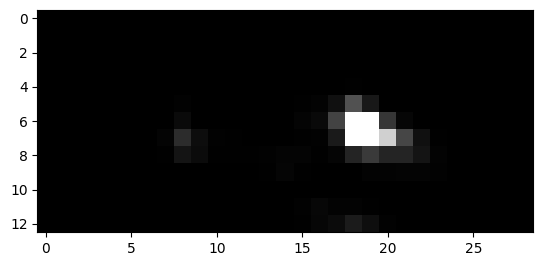

1391


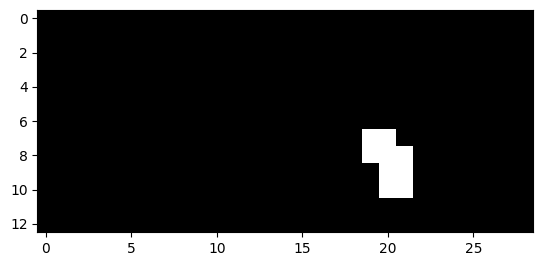

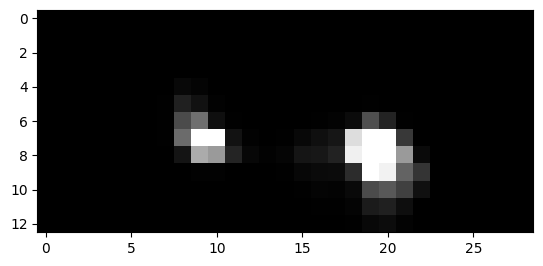

1392


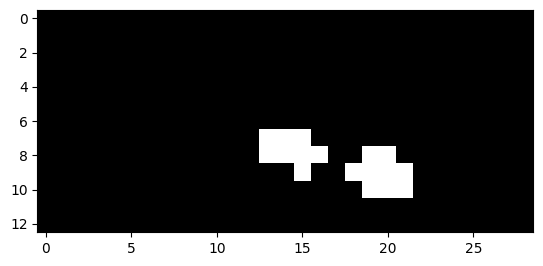

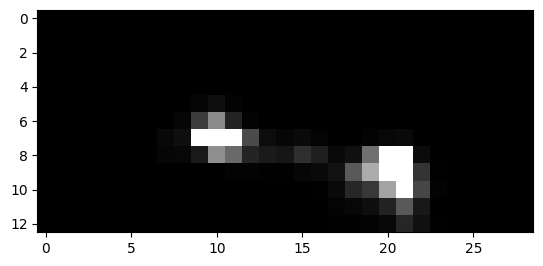

1393


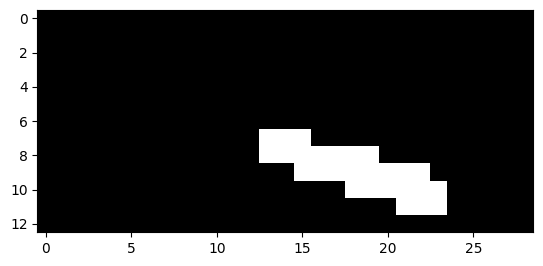

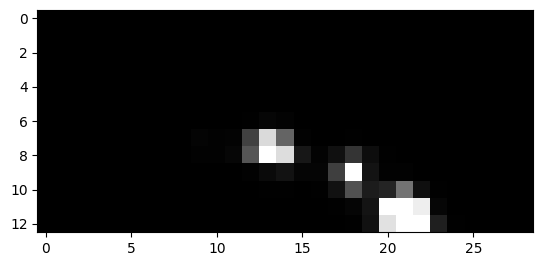

1394


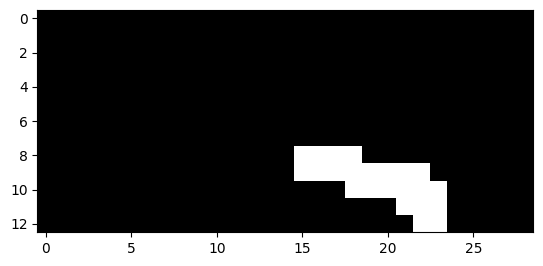

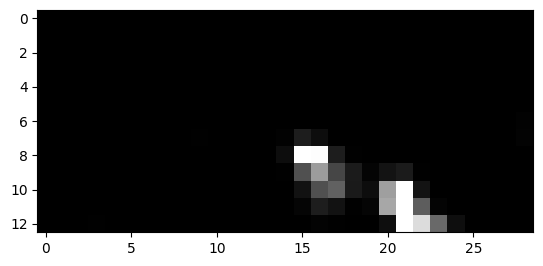

1395


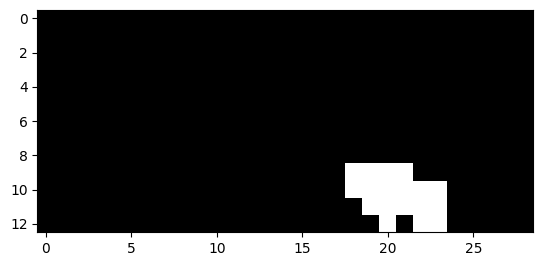

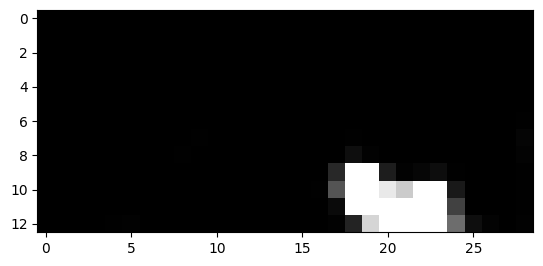

1396


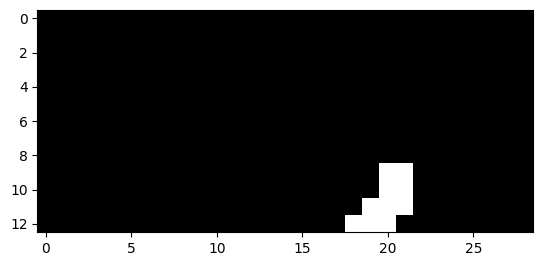

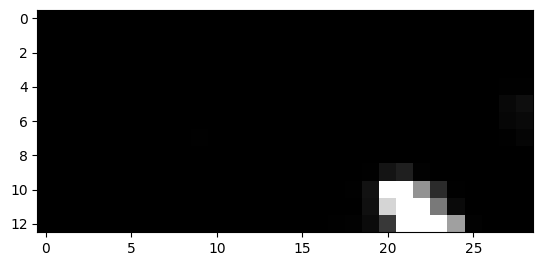

1397


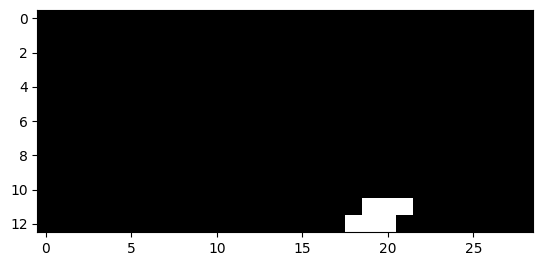

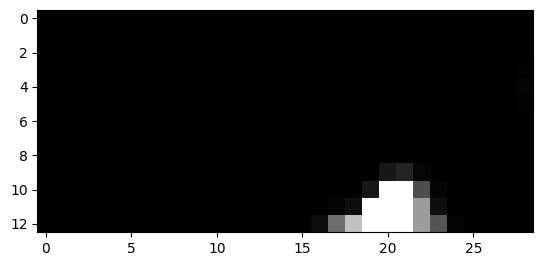

1398


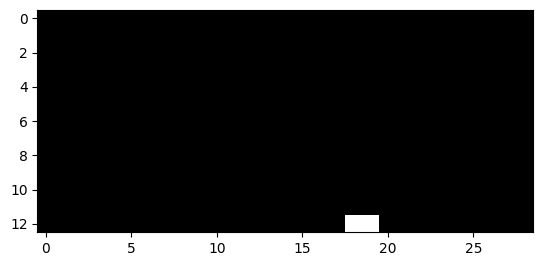

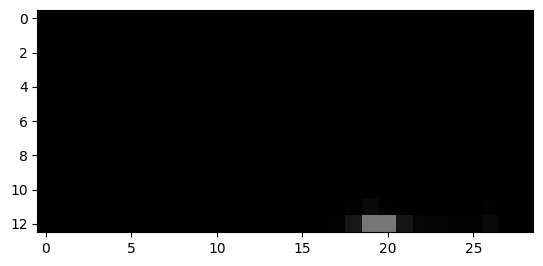

1403


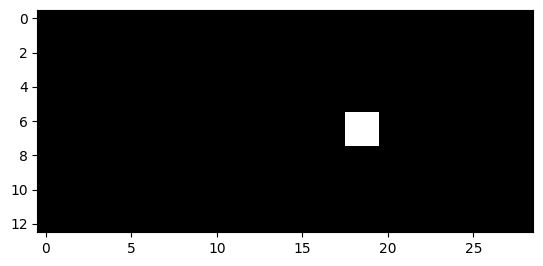

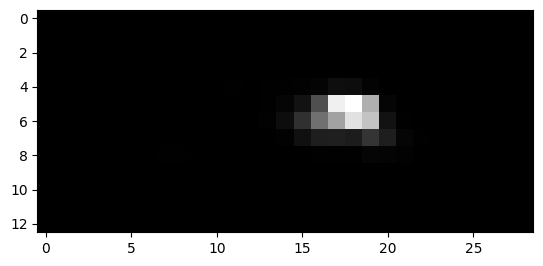

1404


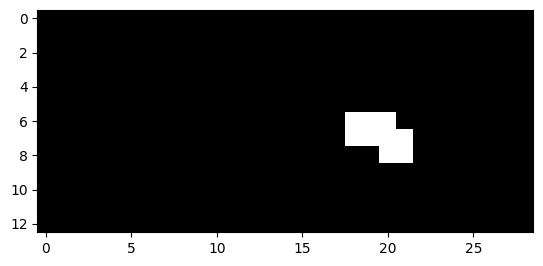

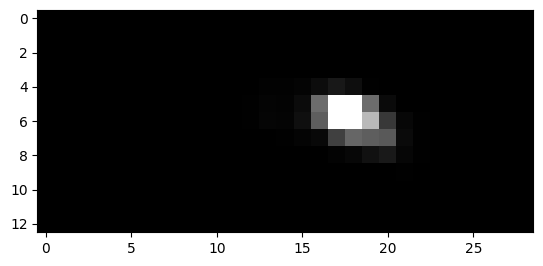

1405


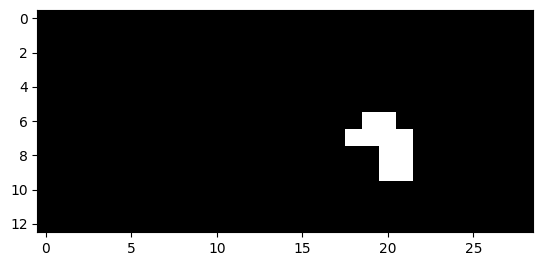

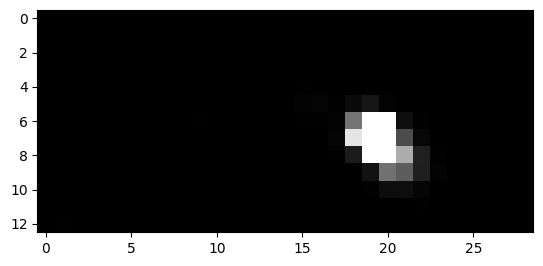

1406


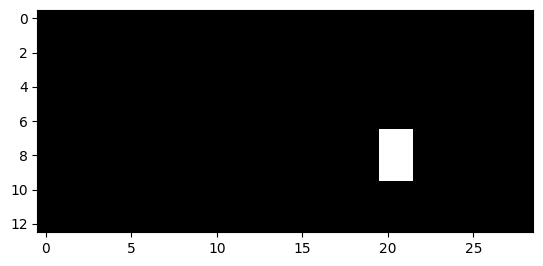

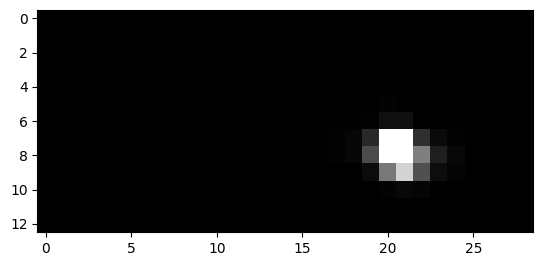

1407


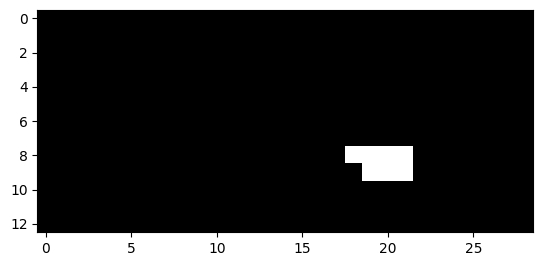

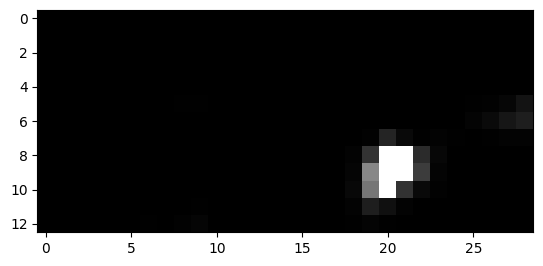

1408


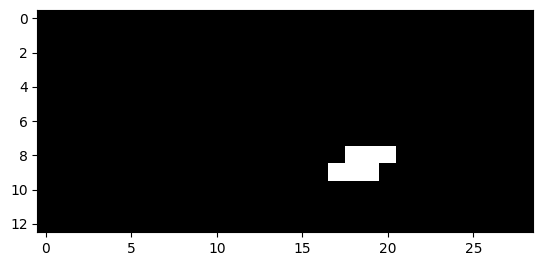

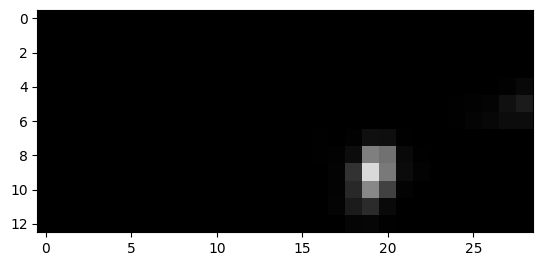

1409


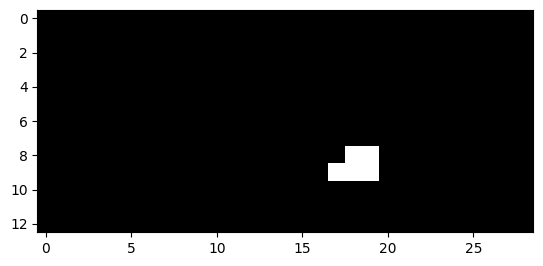

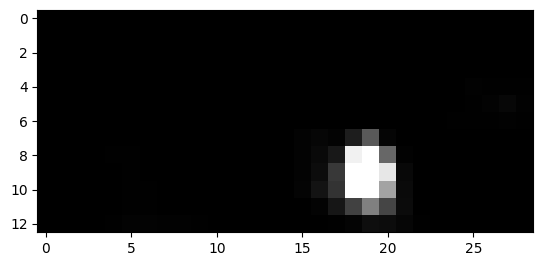

1412


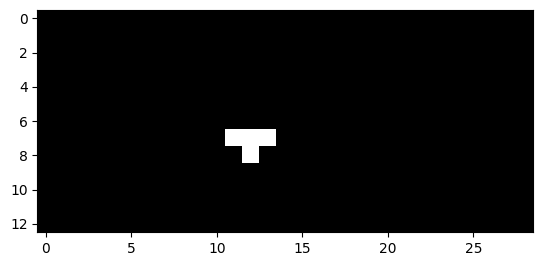

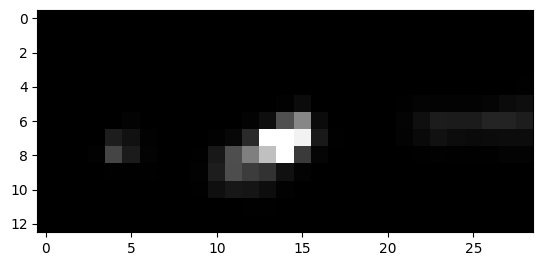

1413


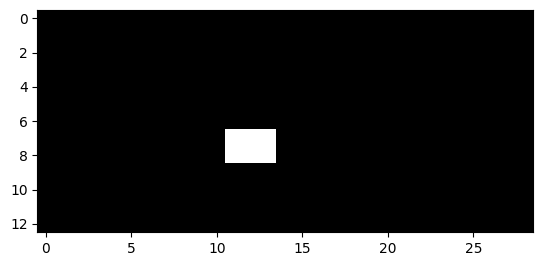

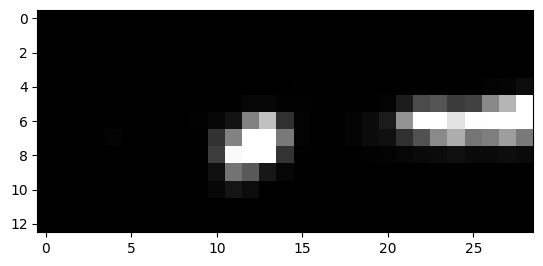

1414


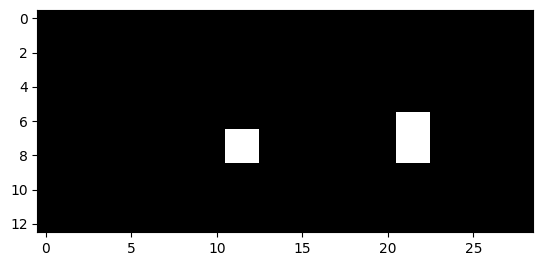

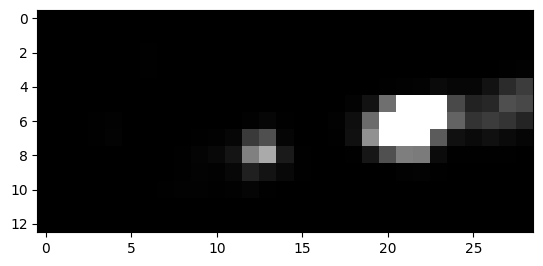

1415


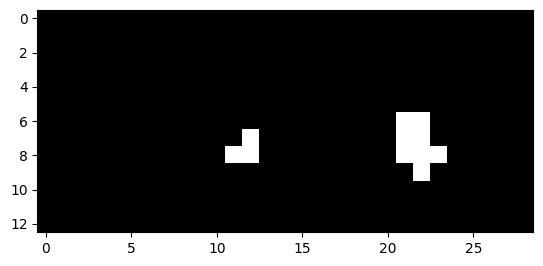

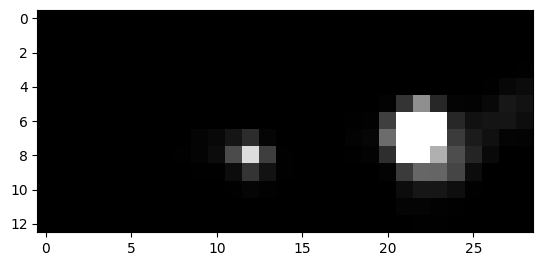

1416


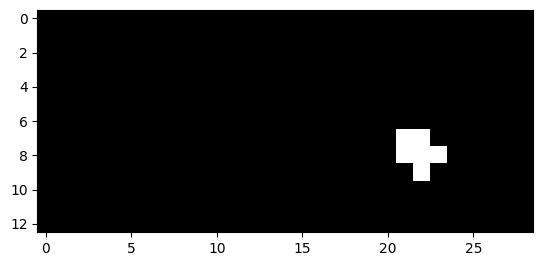

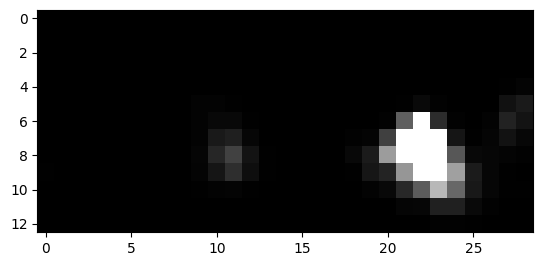

1417


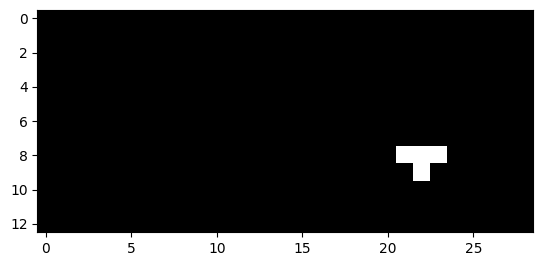

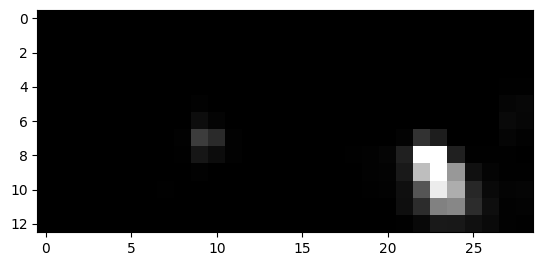

1419


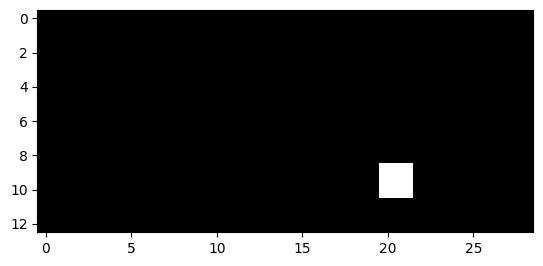

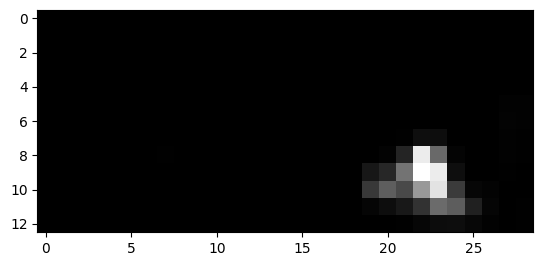

1420


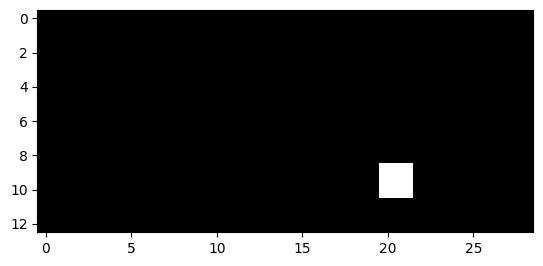

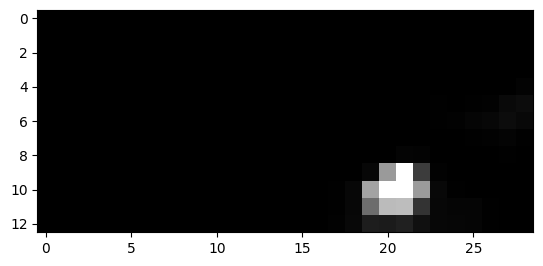

1441


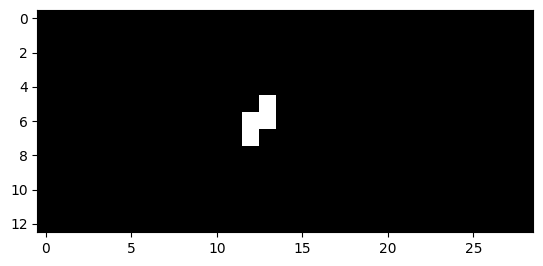

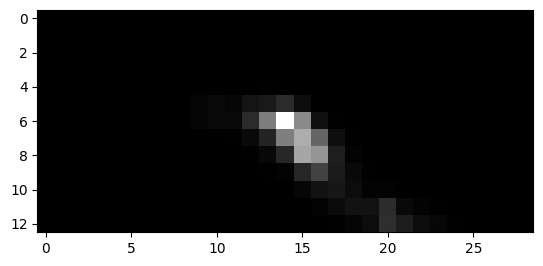

1442


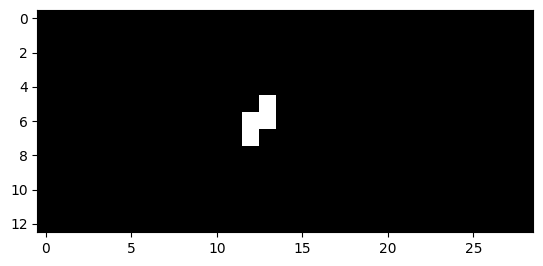

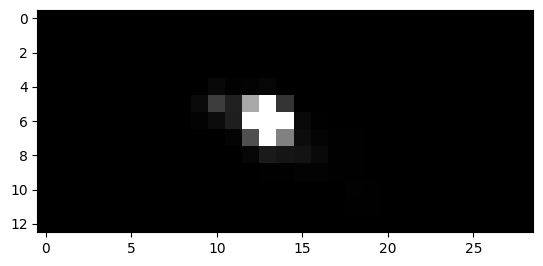

1443


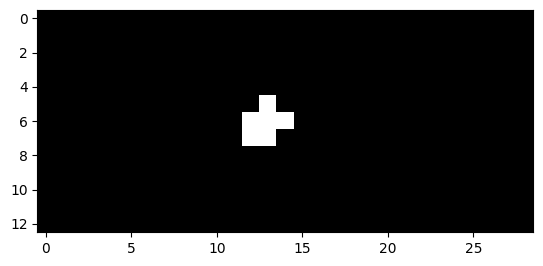

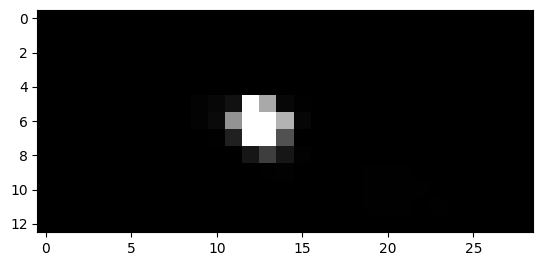

1444


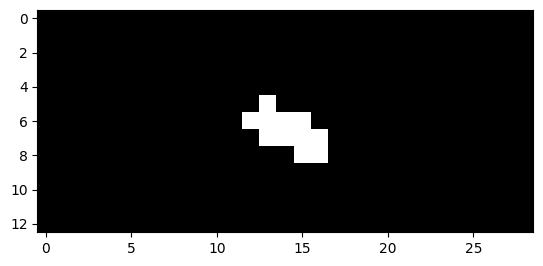

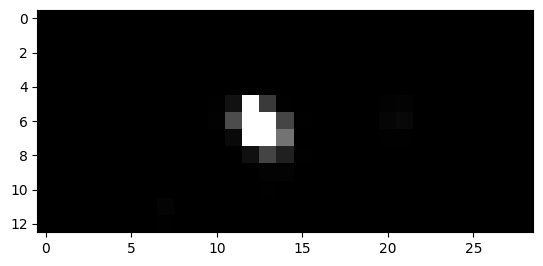

1445


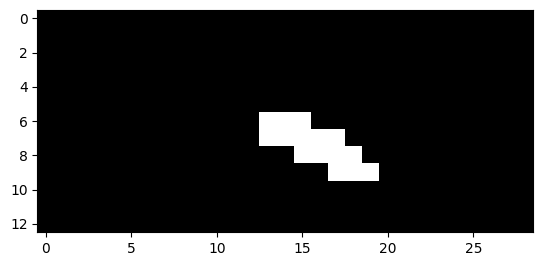

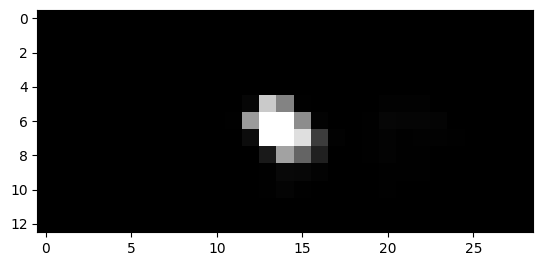

1446


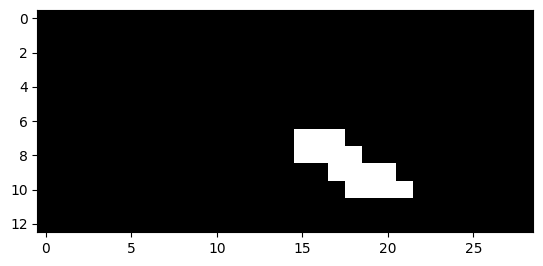

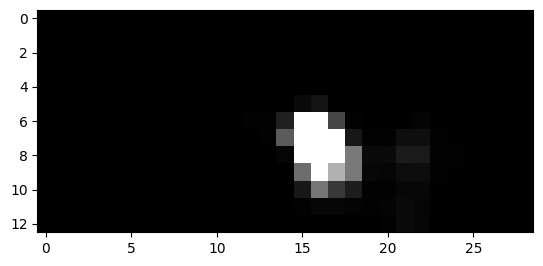

1447


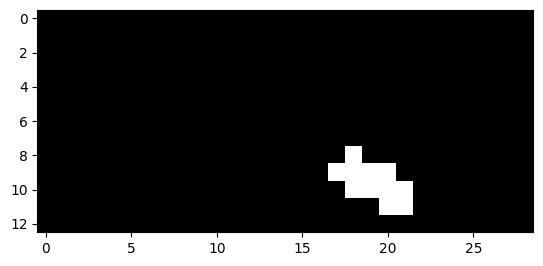

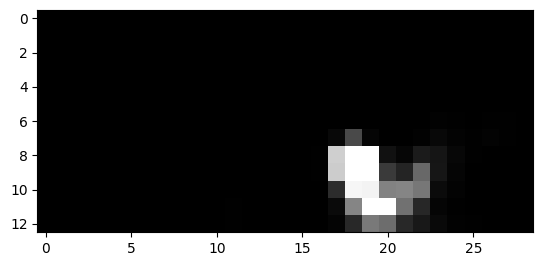

1448


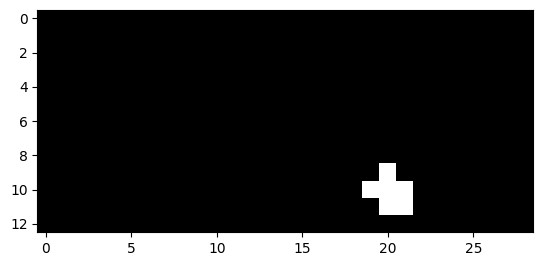

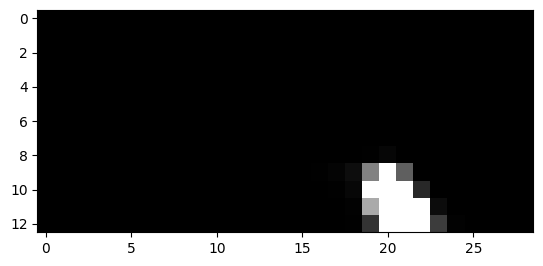

1460


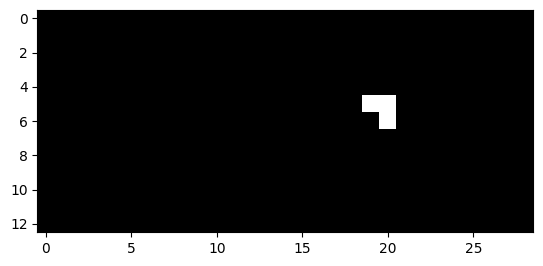

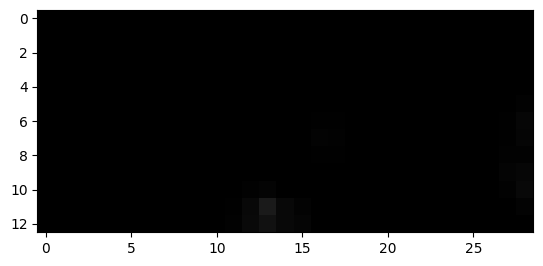

1461


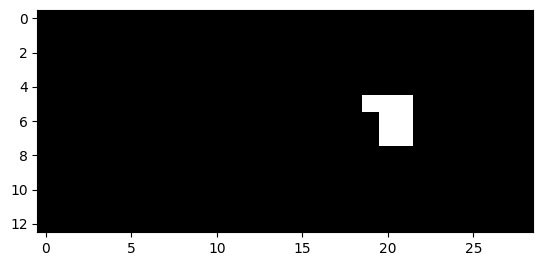

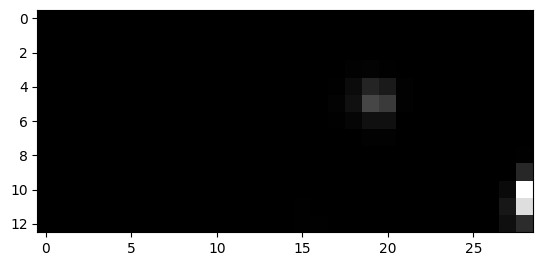

1462


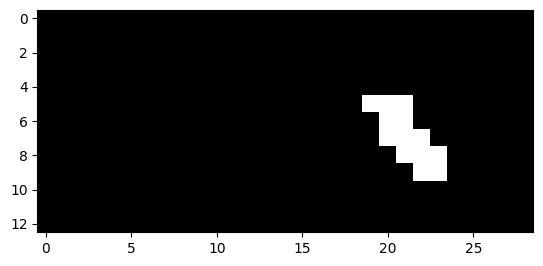

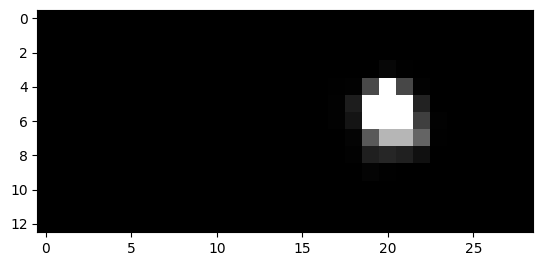

1463


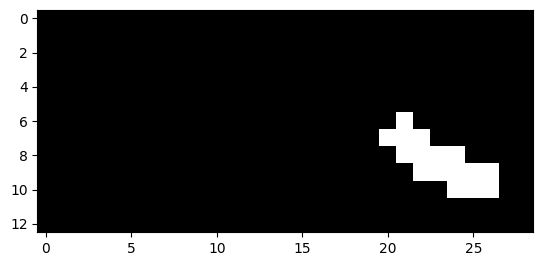

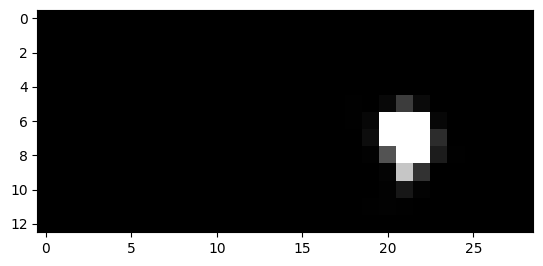

1464


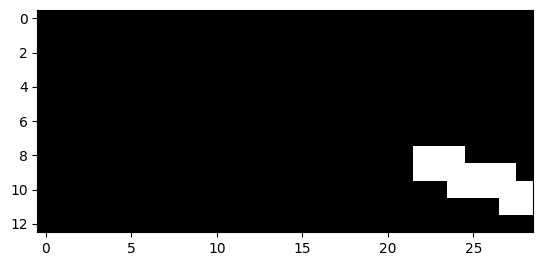

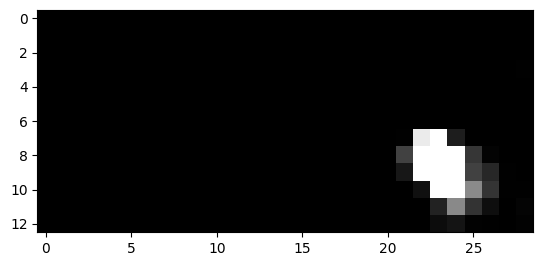

1465


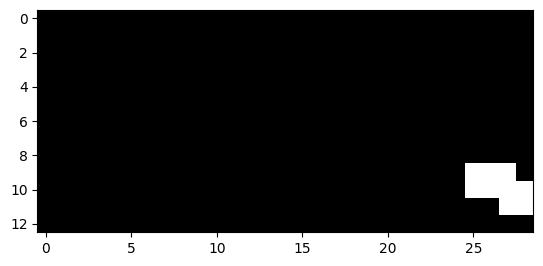

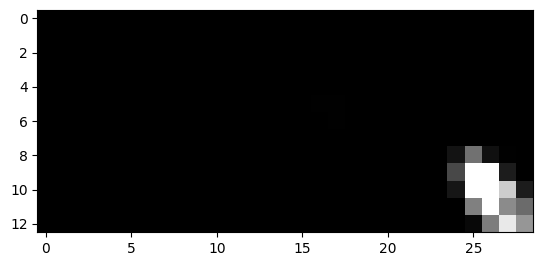

1466


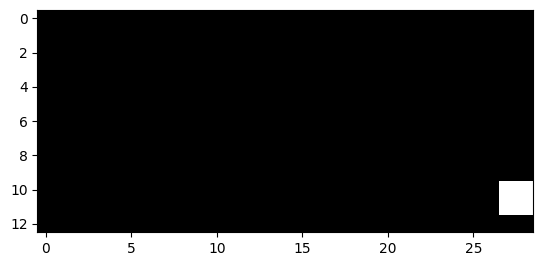

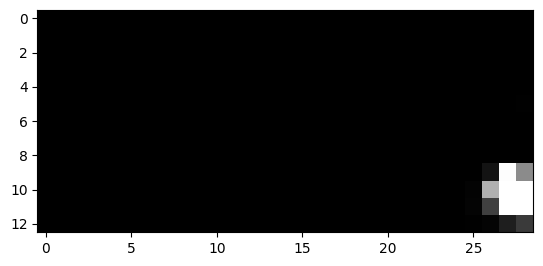

1473


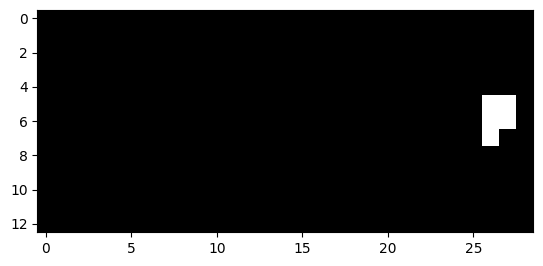

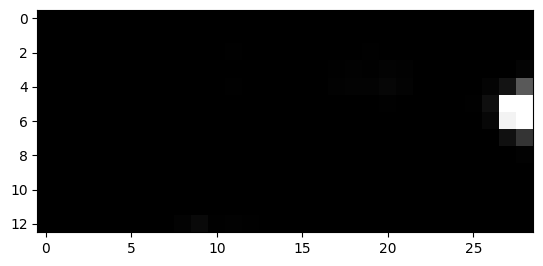

1474


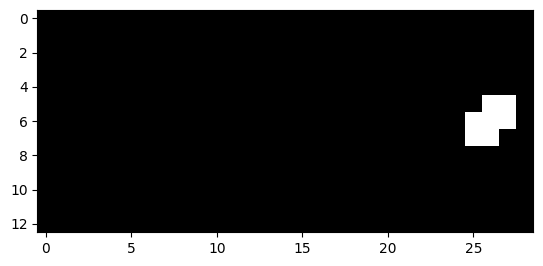

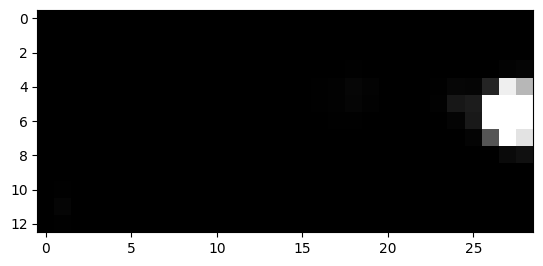

1475


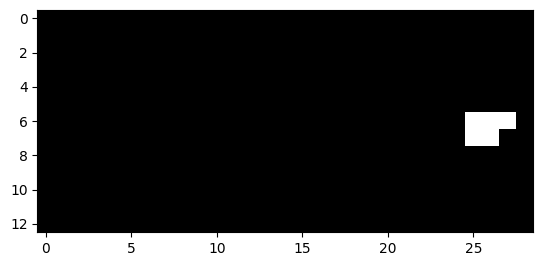

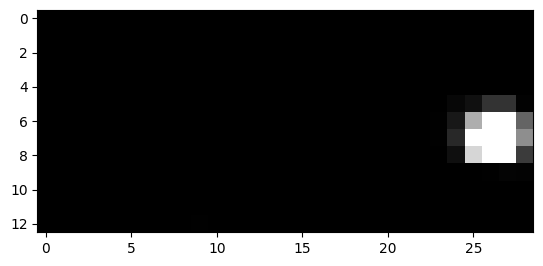

1509


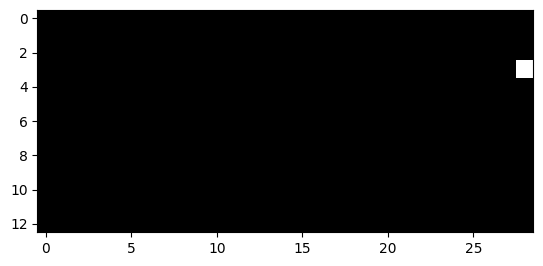

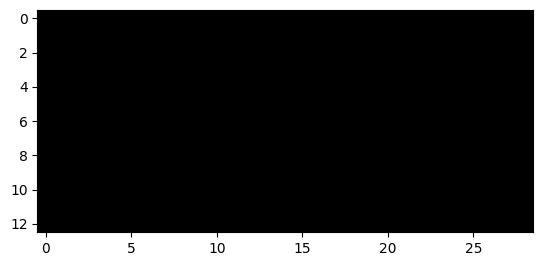

1510


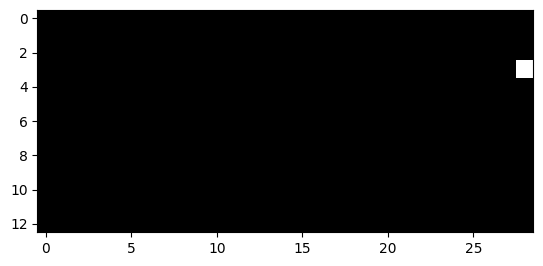

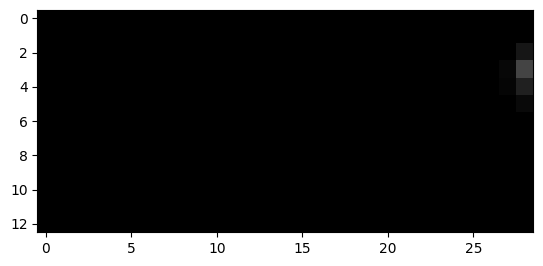

1511


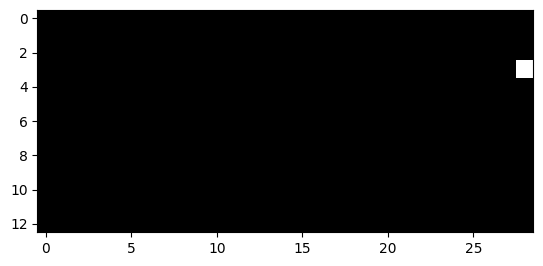

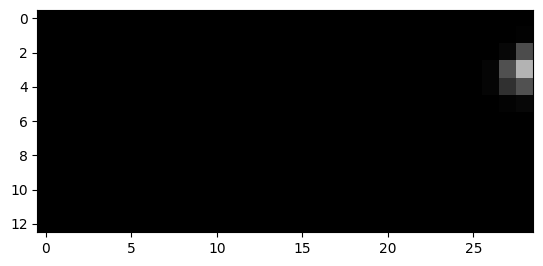

1687


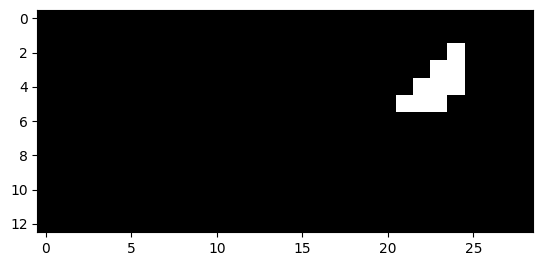

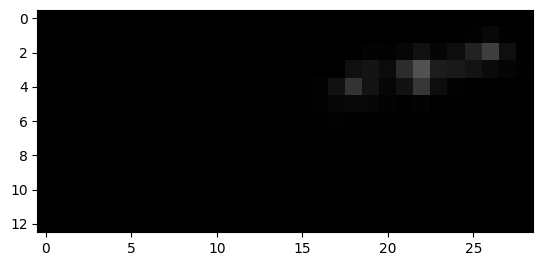

1688


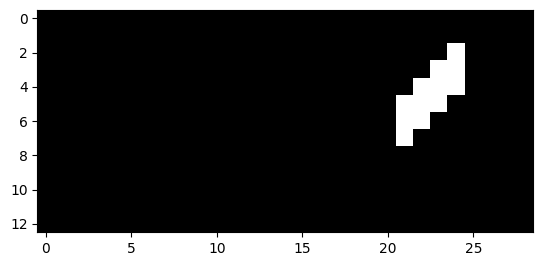

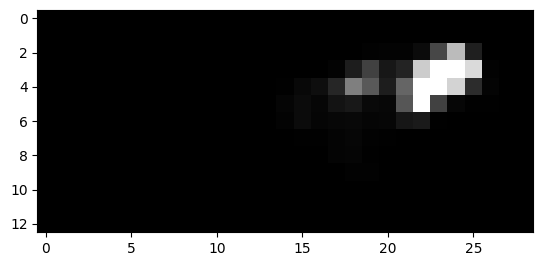

1689


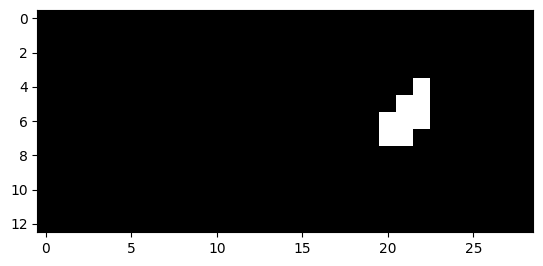

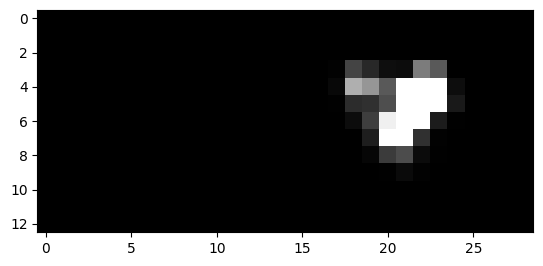

1690


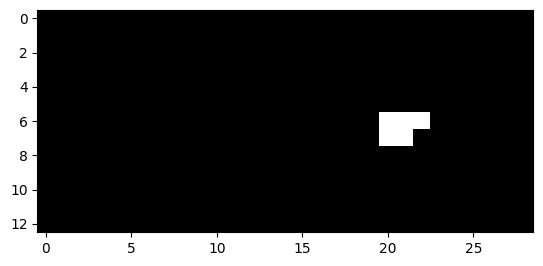

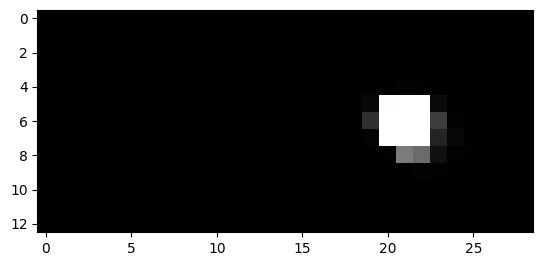

1691


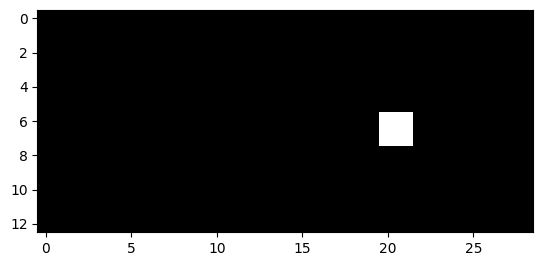

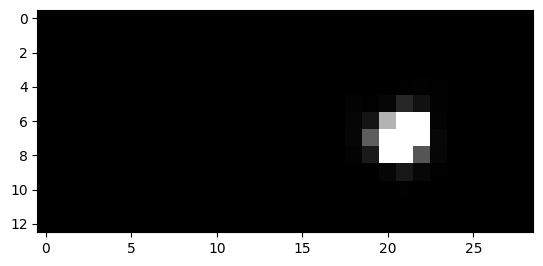

1710


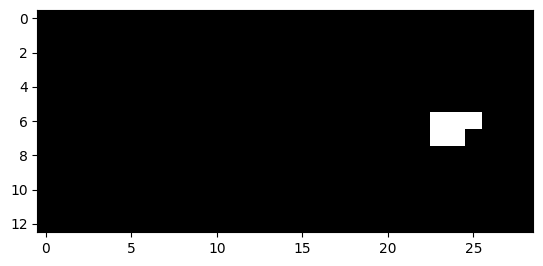

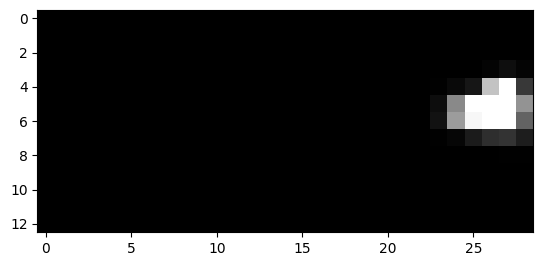

1711


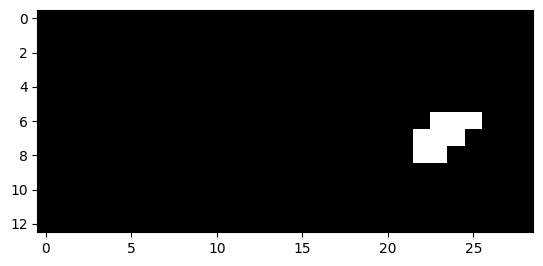

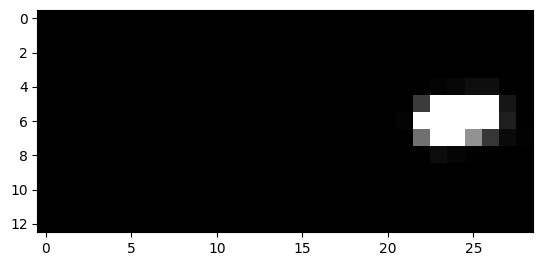

1712


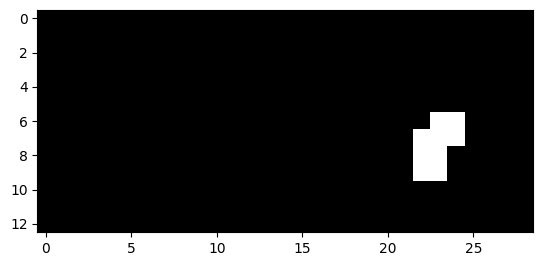

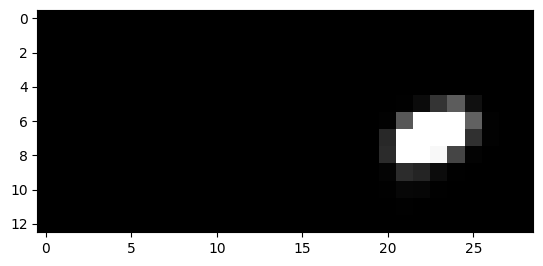

1713


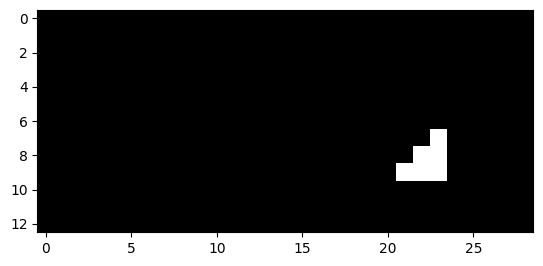

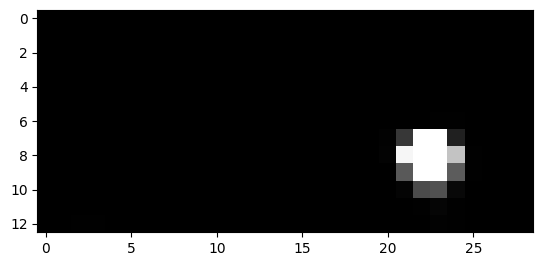

1714


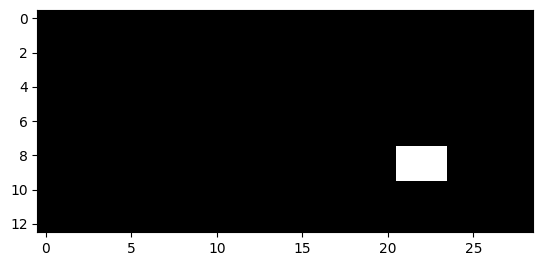

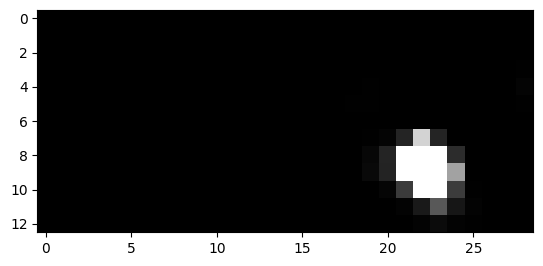

1715


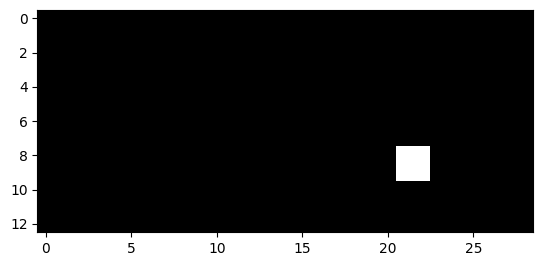

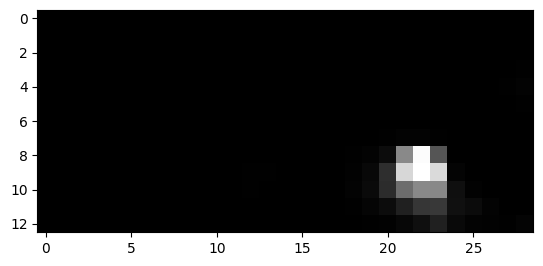

1728


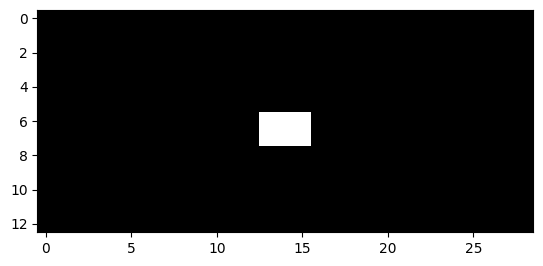

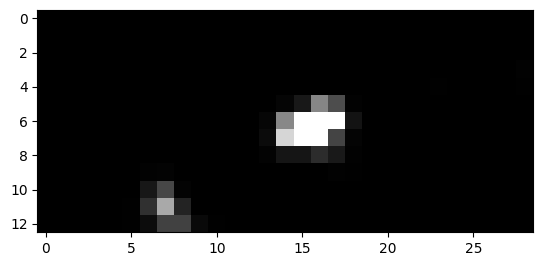

1729


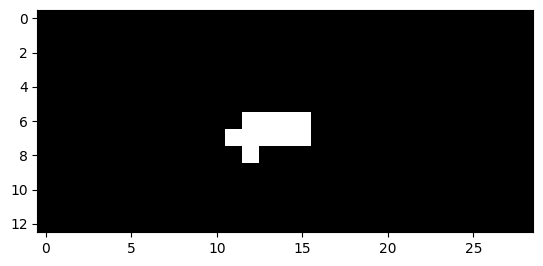

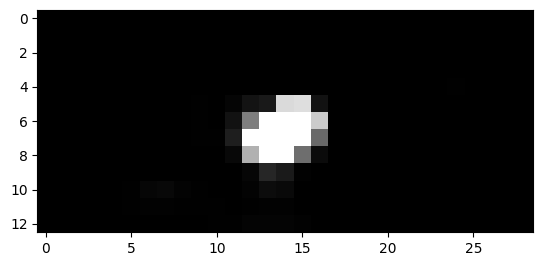

1730


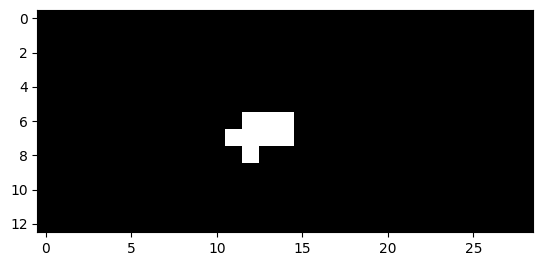

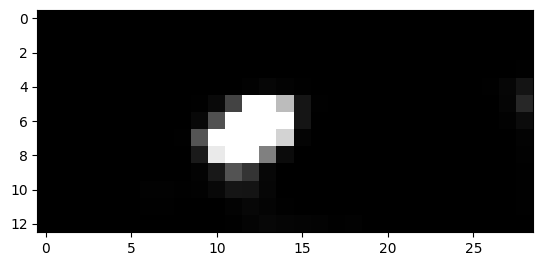

1731


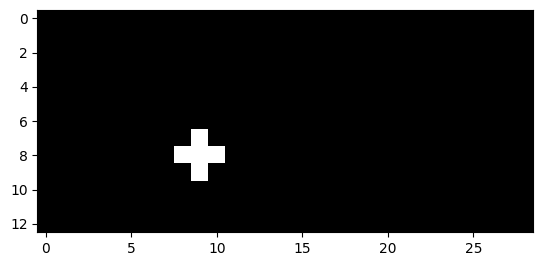

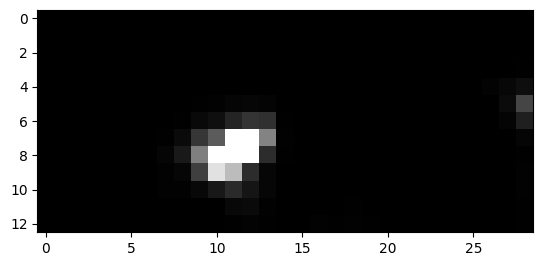

1732


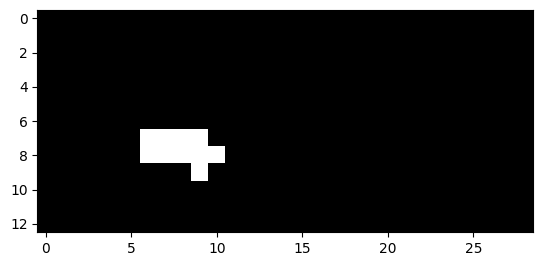

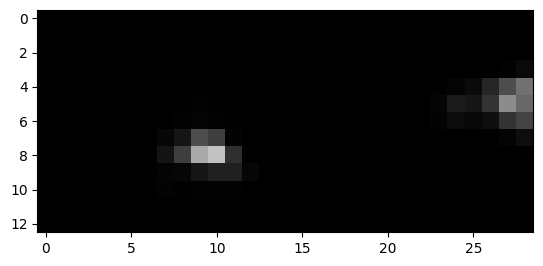

1733


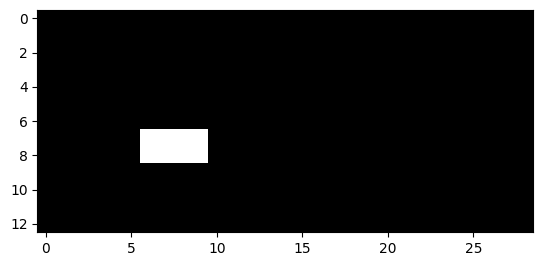

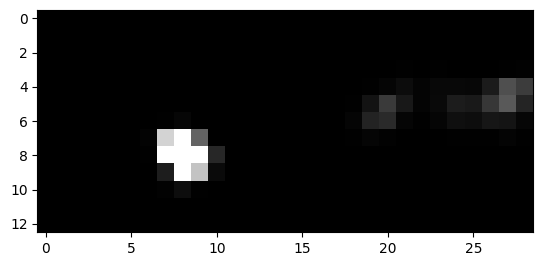

1735


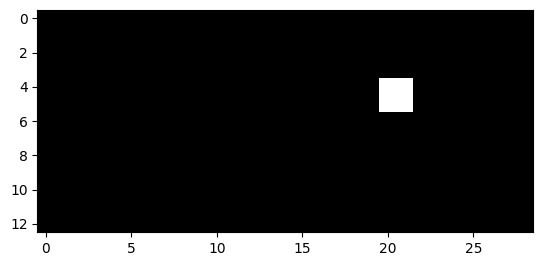

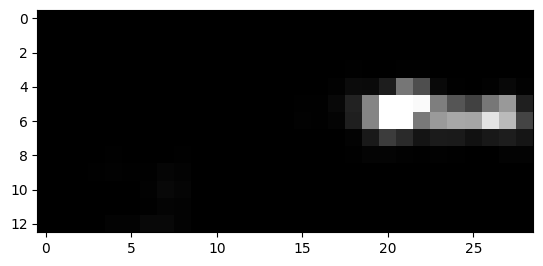

1736


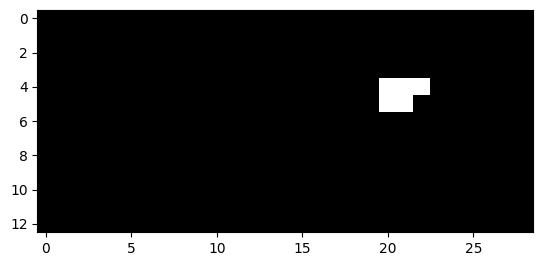

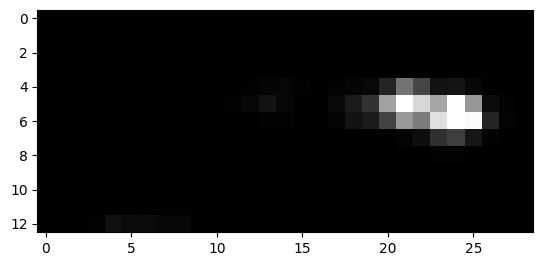

1737


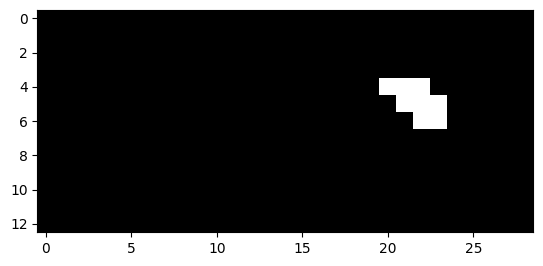

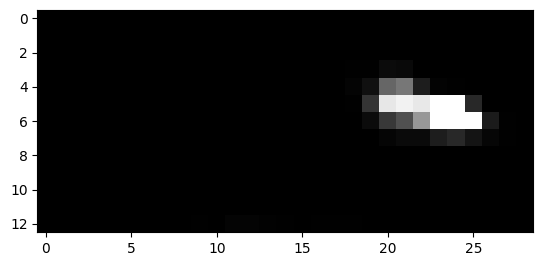

1738


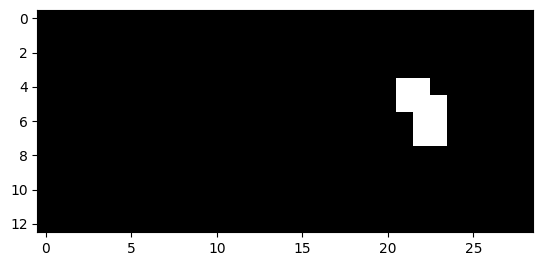

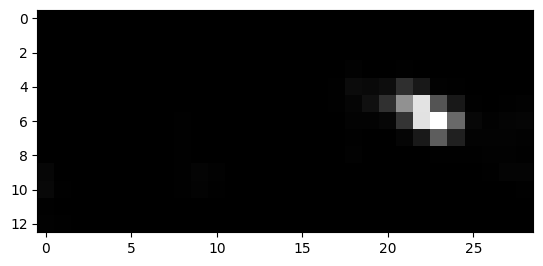

1739


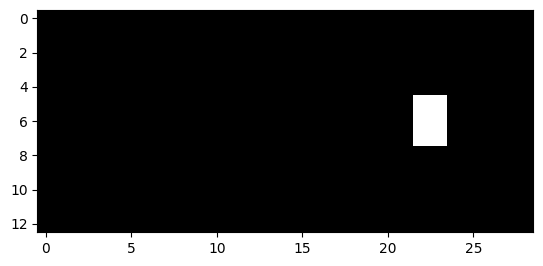

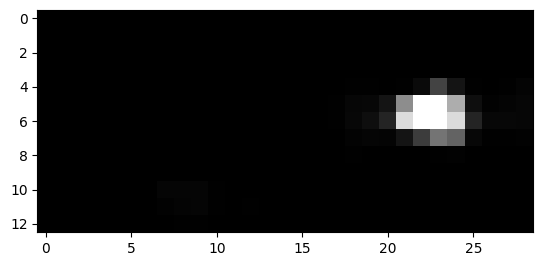

1740


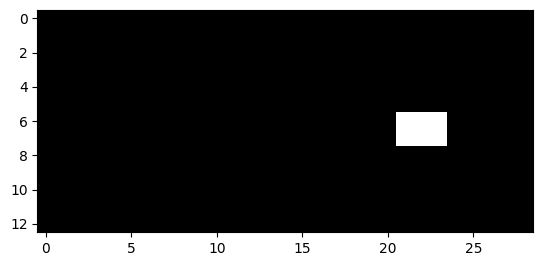

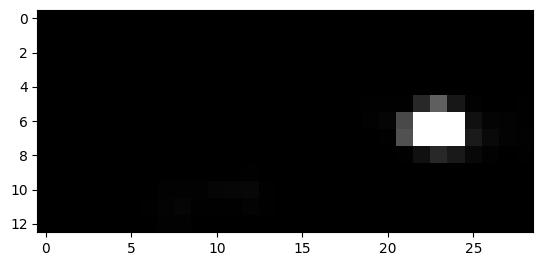

1741


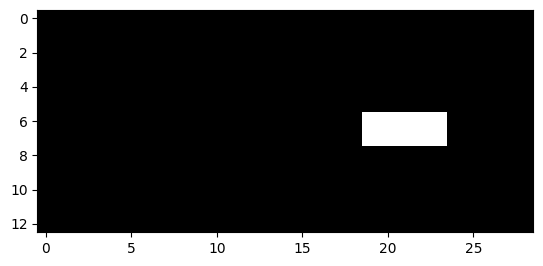

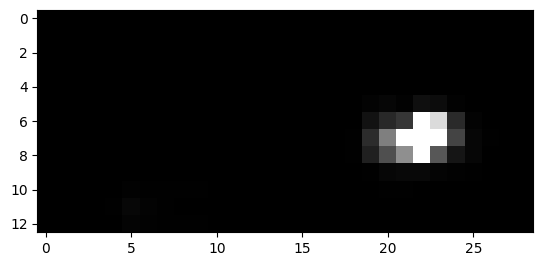

1742


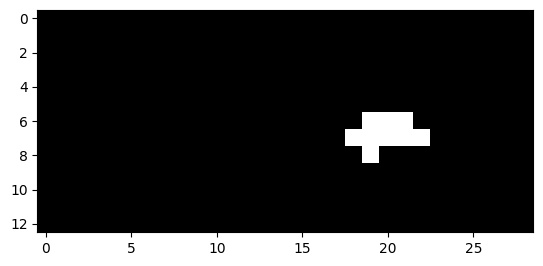

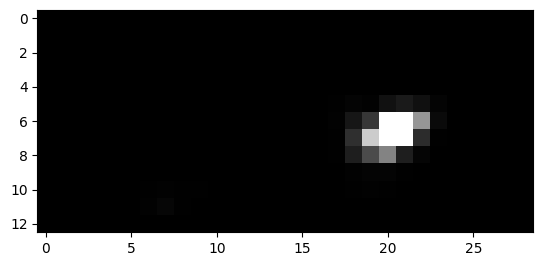

1743


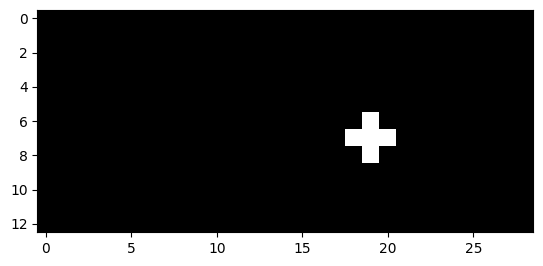

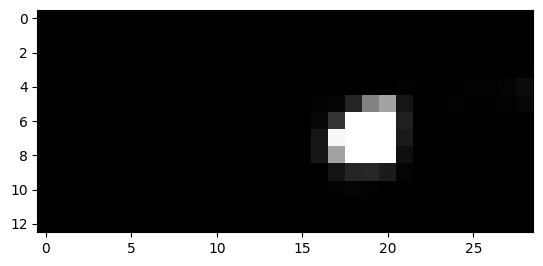

1750


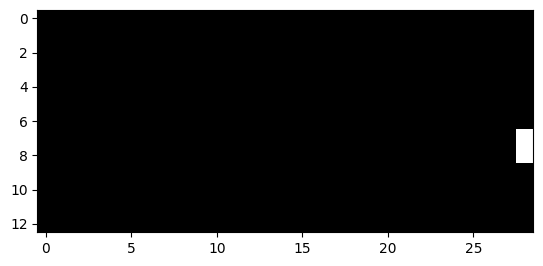

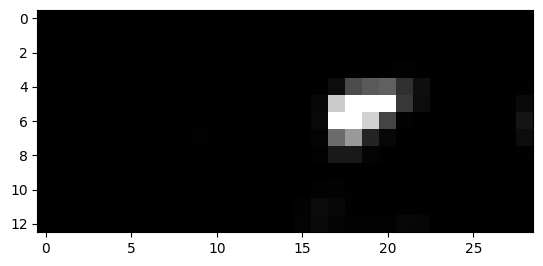

1751


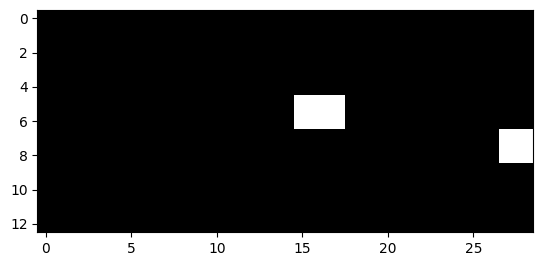

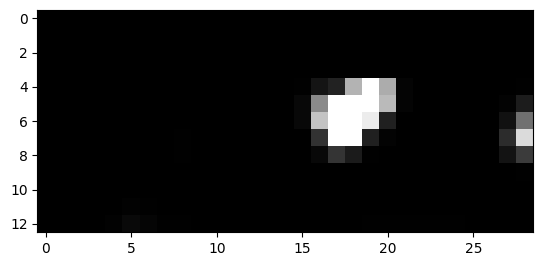

1752


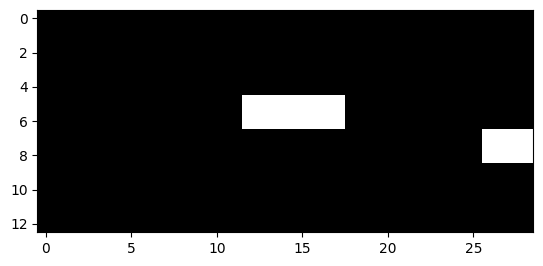

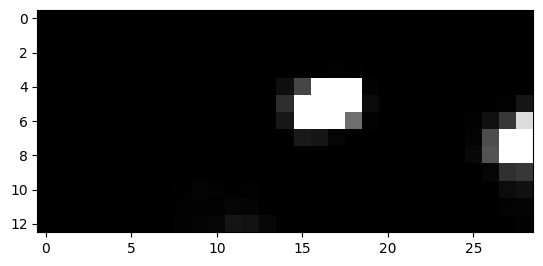

1753


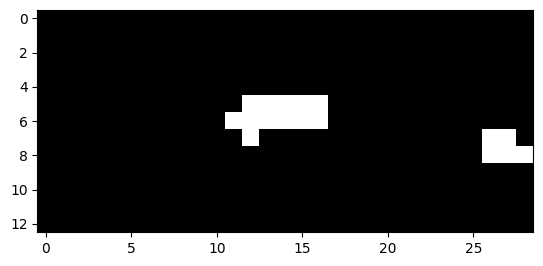

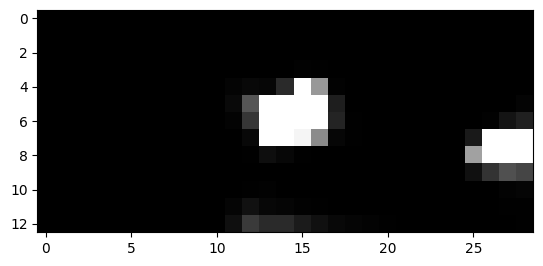

1754


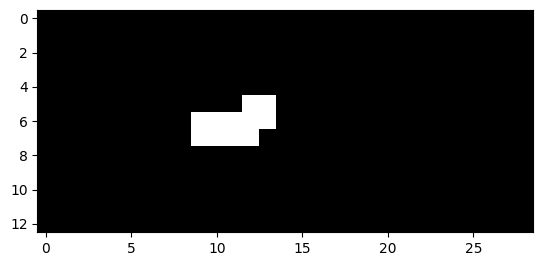

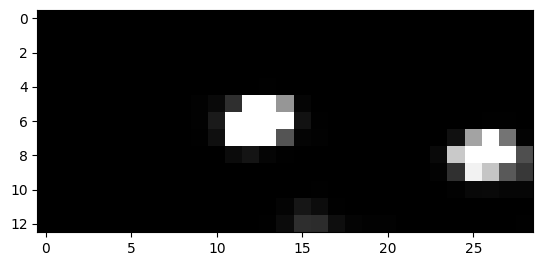

1755


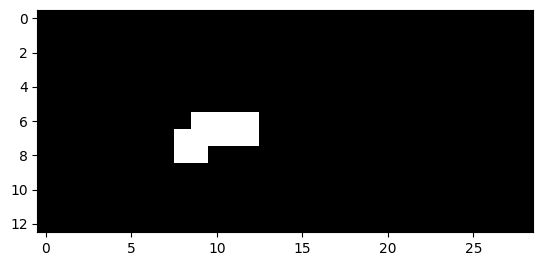

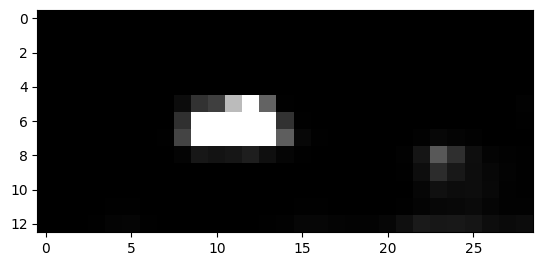

1756


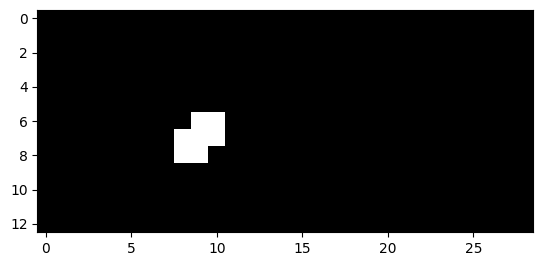

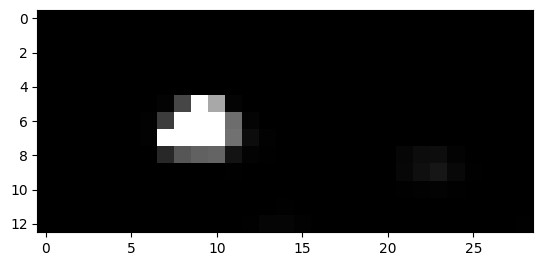

1760


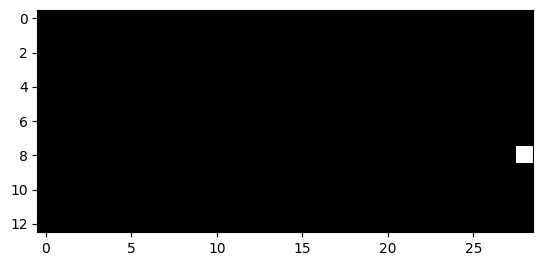

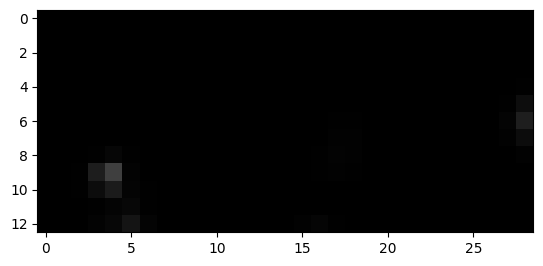

1761


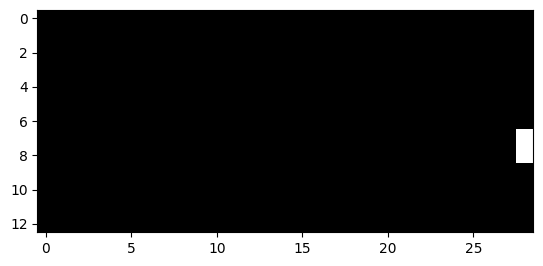

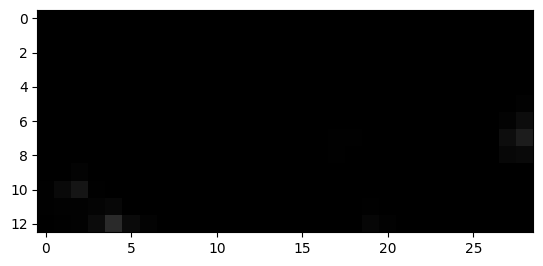

1762


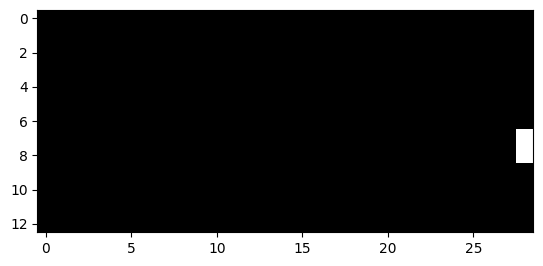

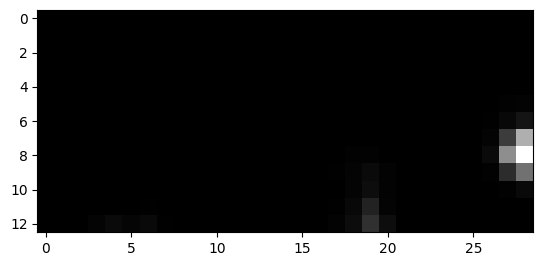

1770


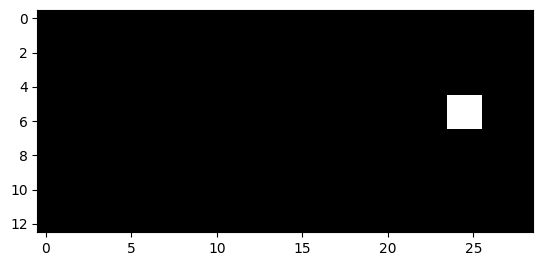

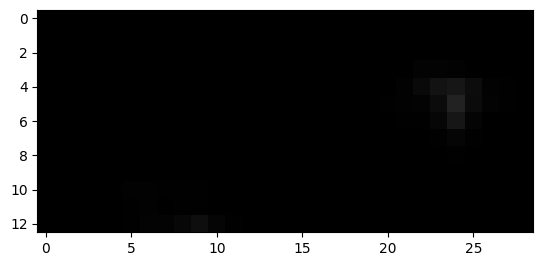

1771


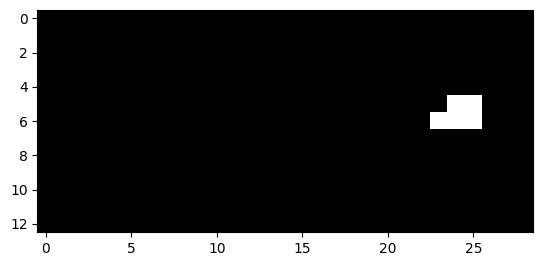

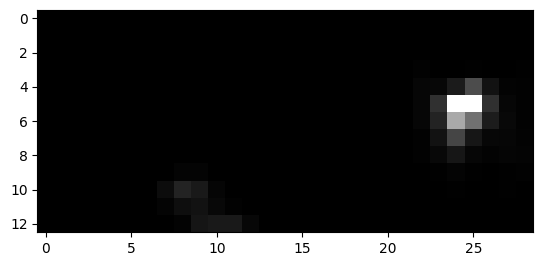

1772


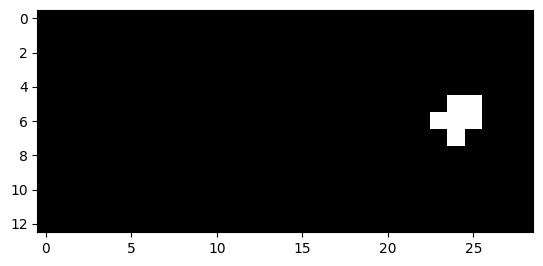

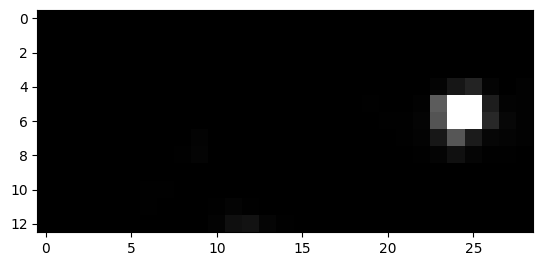

1773


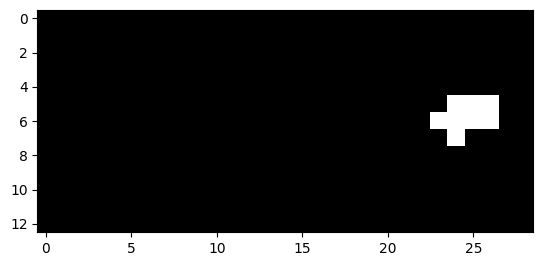

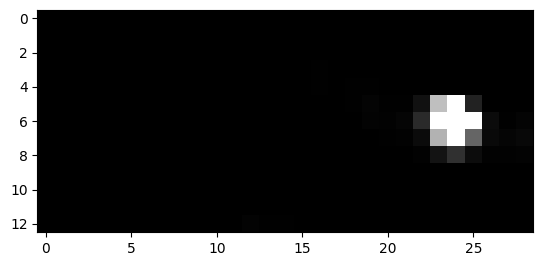

1774


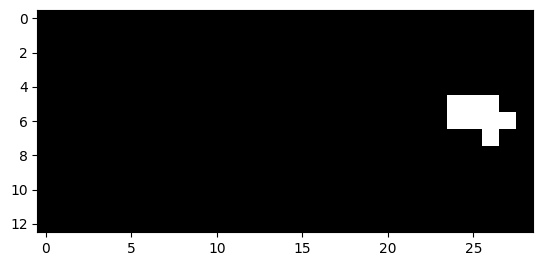

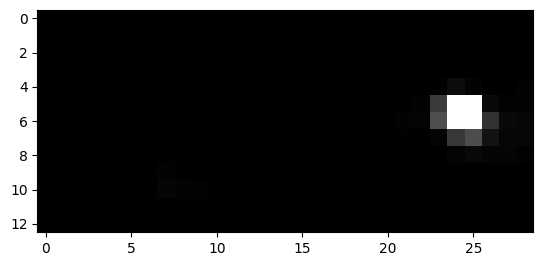

1775


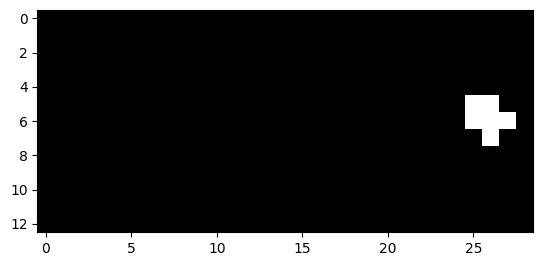

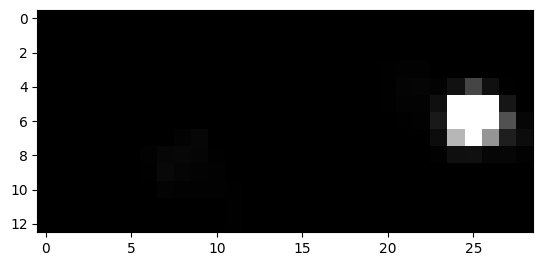

1776


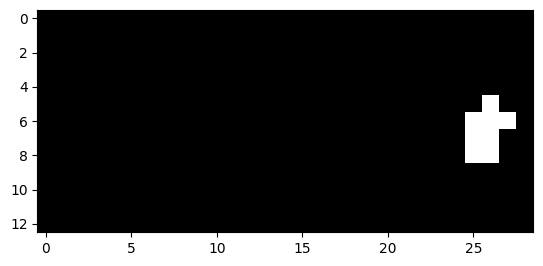

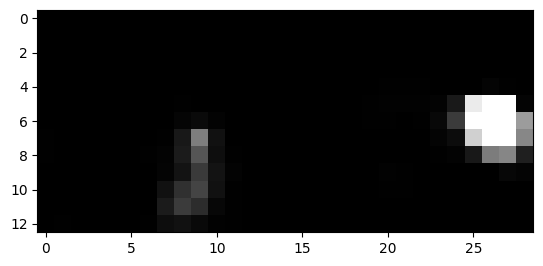

1777


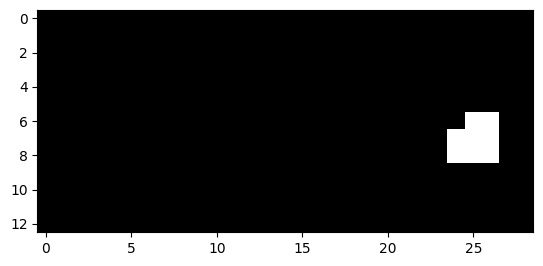

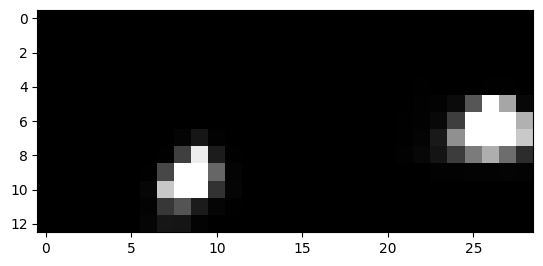

1778


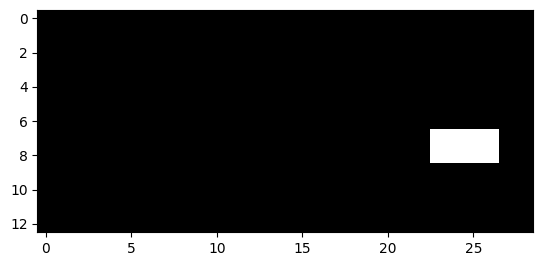

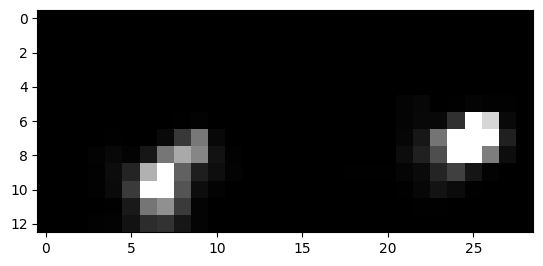

1779


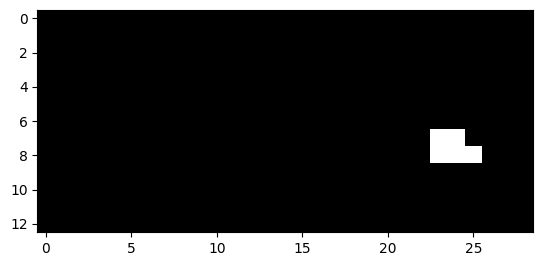

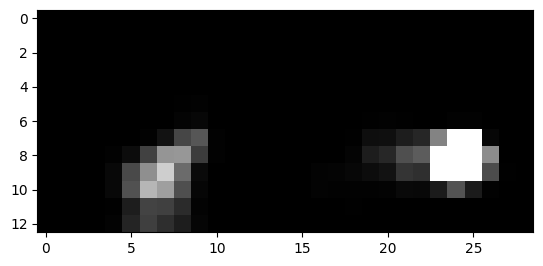

1786


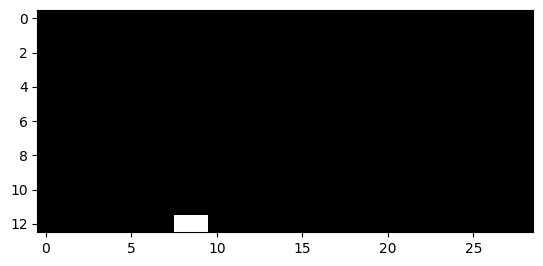

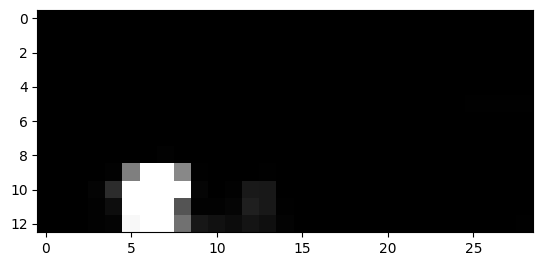

1787


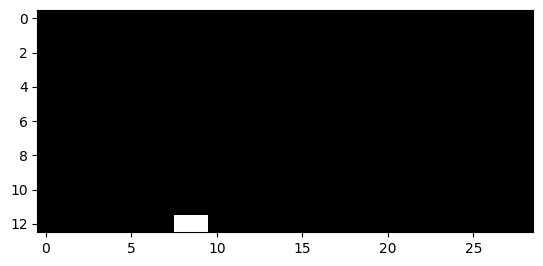

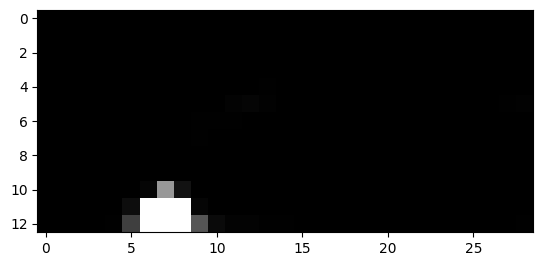

1792


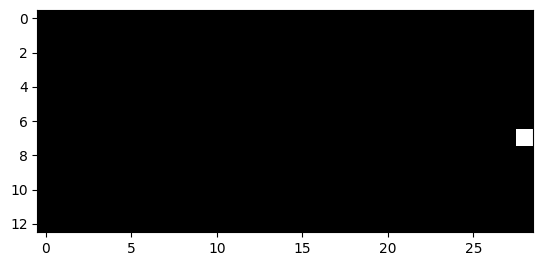

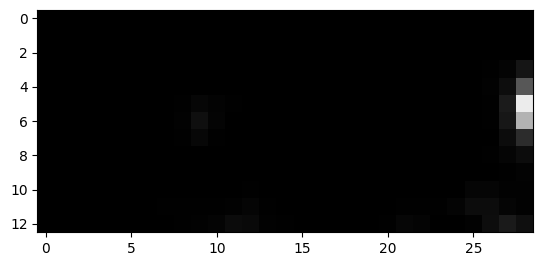

1793


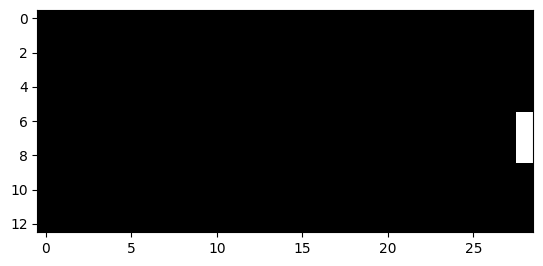

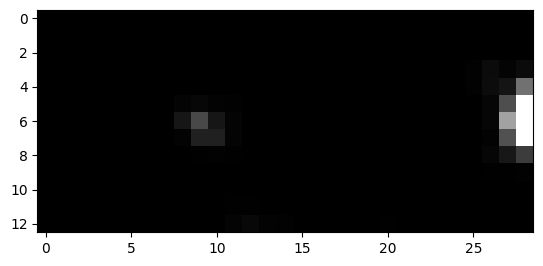

1794


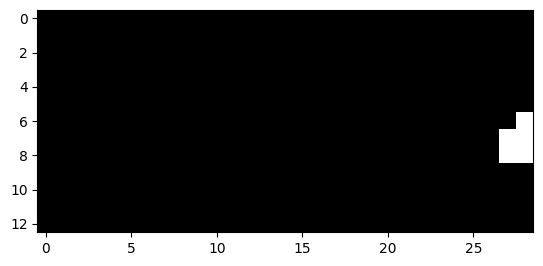

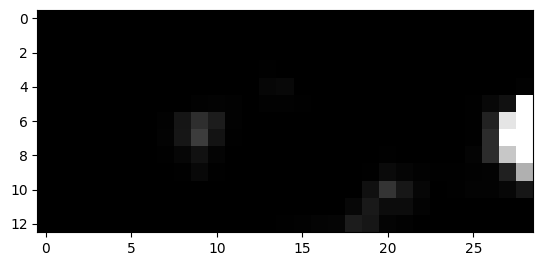

1795


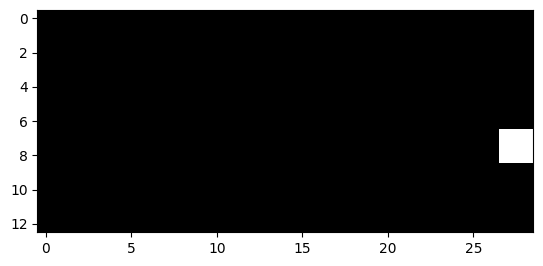

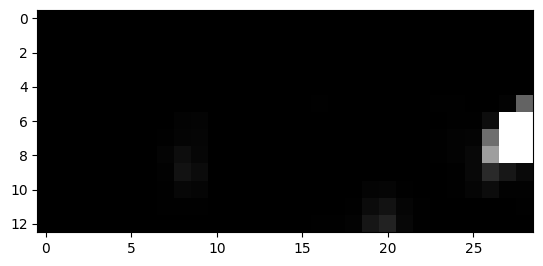

1796


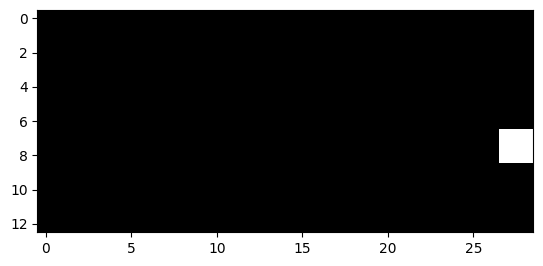

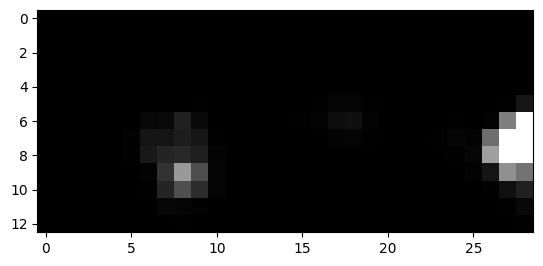

1797


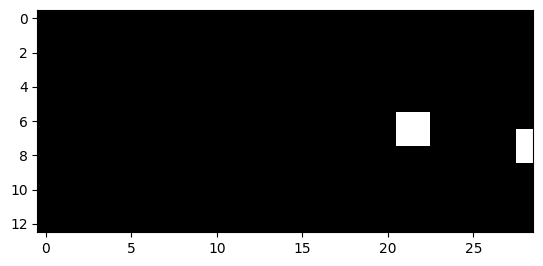

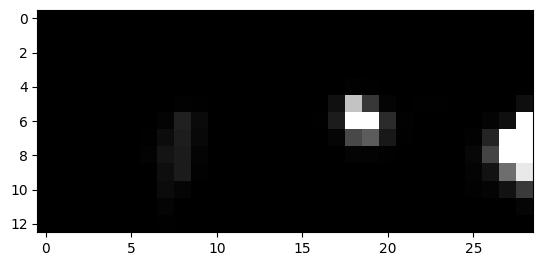

1798


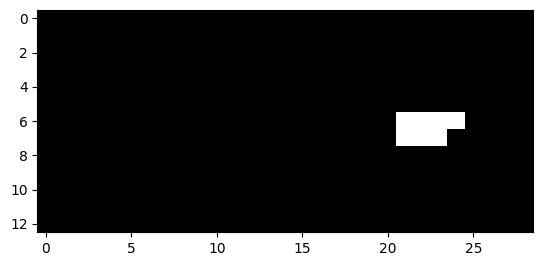

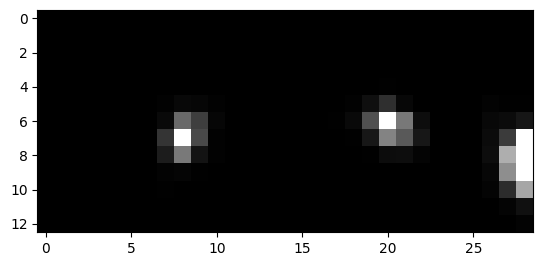

1799


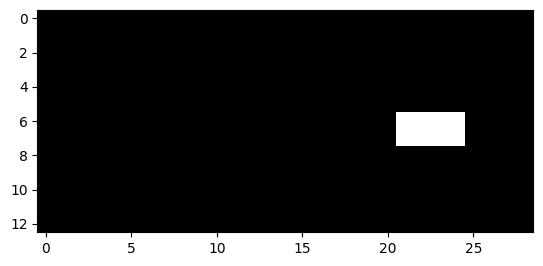

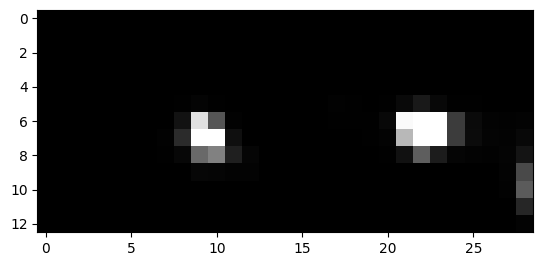

1800


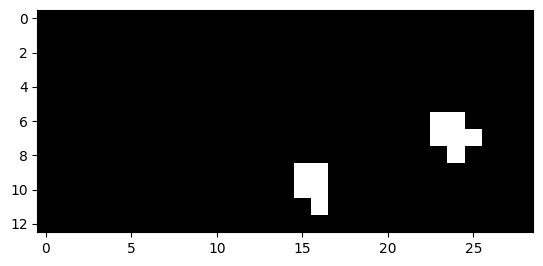

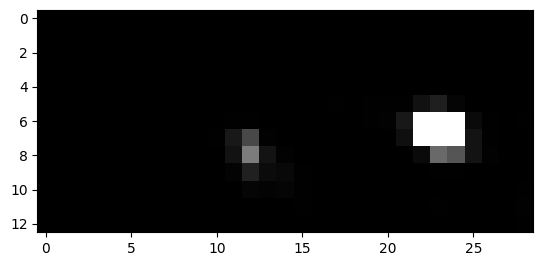

1801


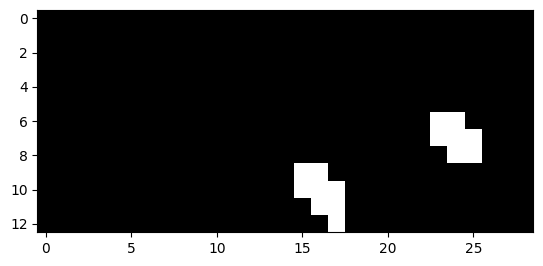

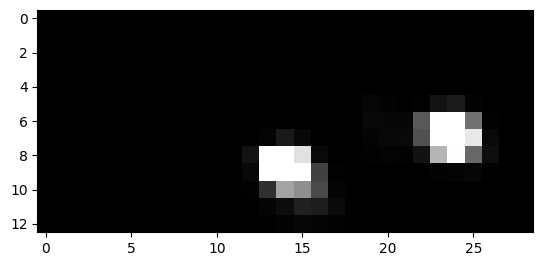

1802


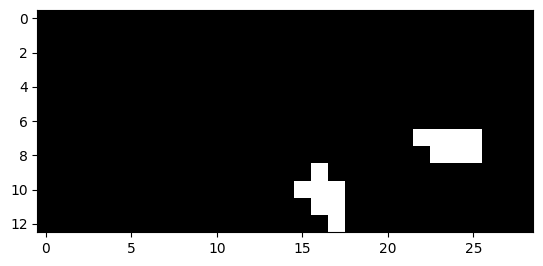

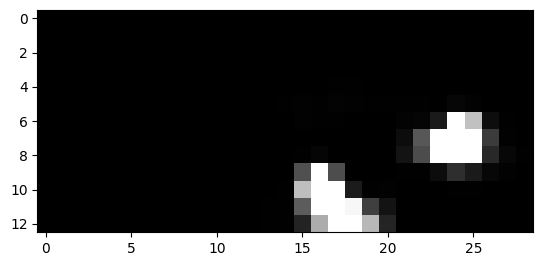

1803


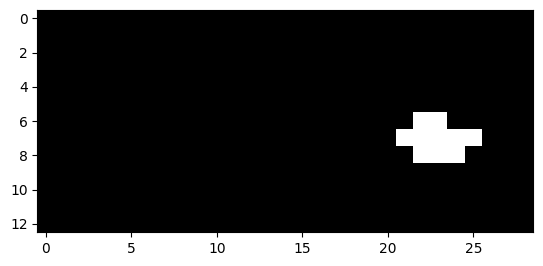

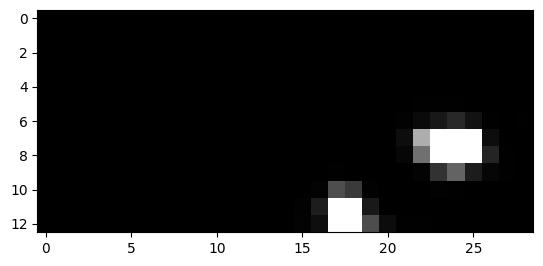

1804


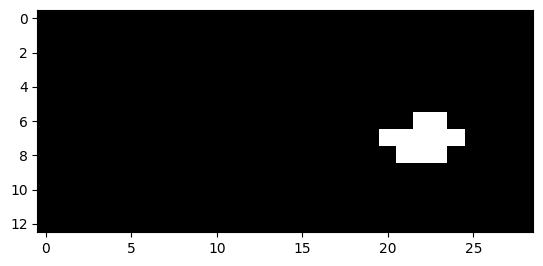

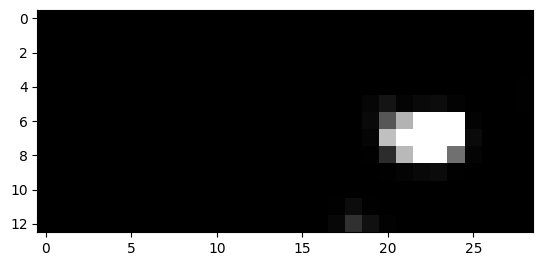

1805


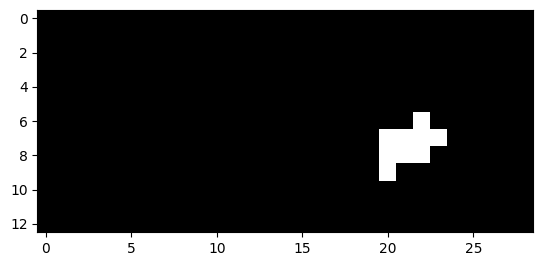

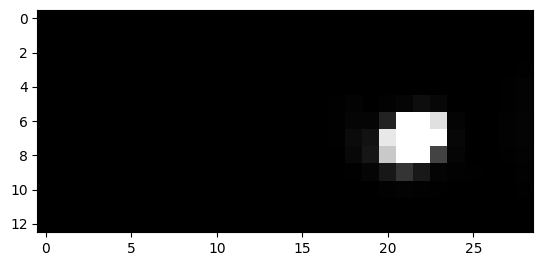

1806


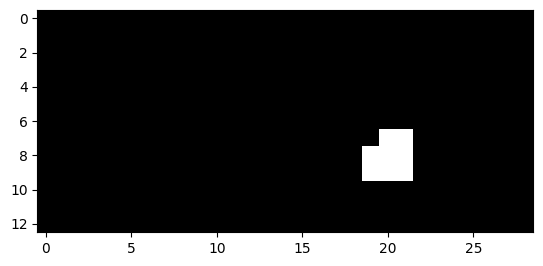

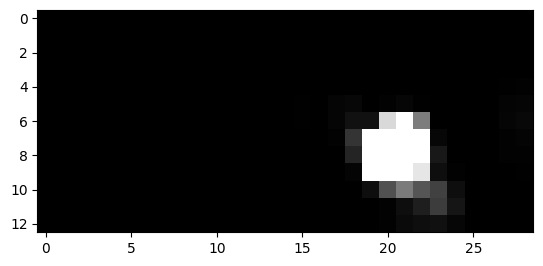

1807


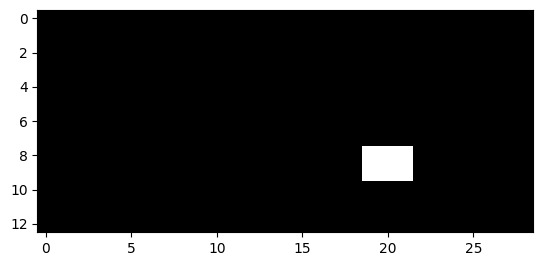

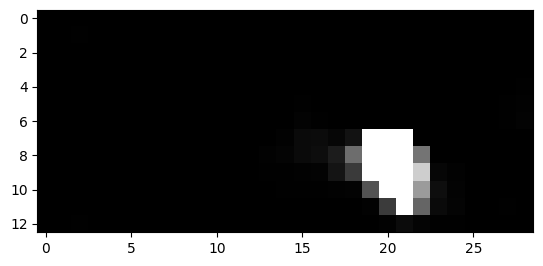

1808


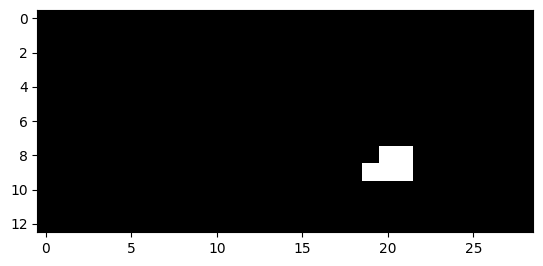

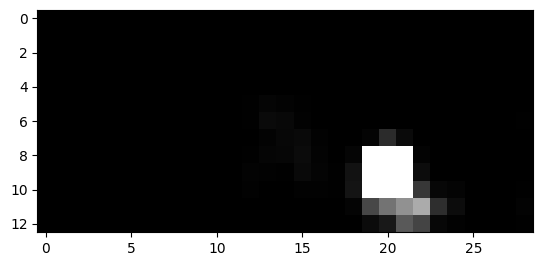

1809


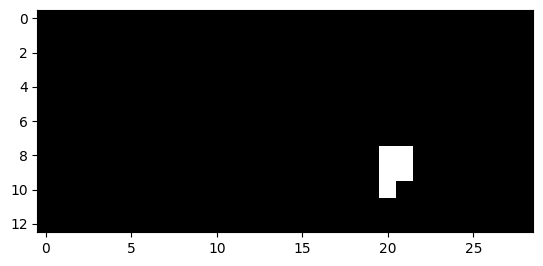

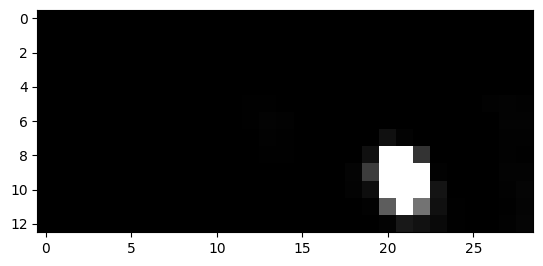

1810


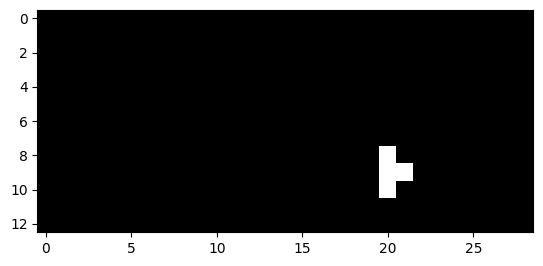

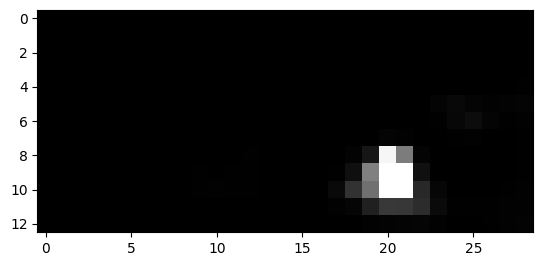

1845


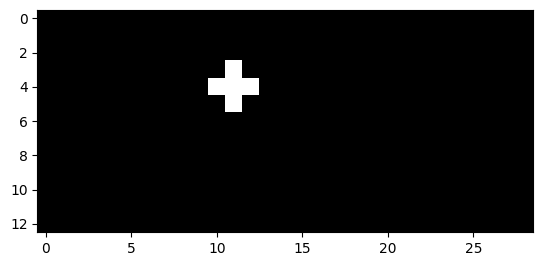

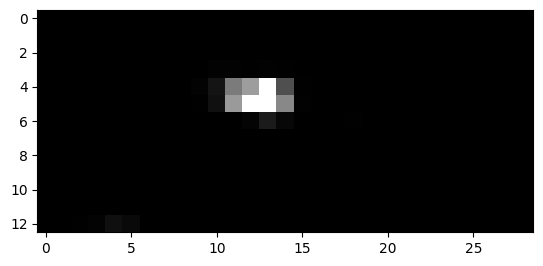

1846


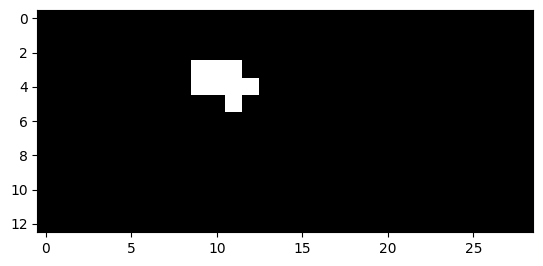

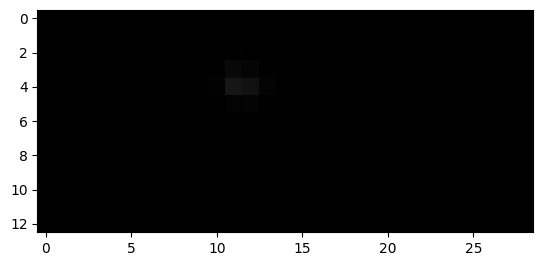

1847


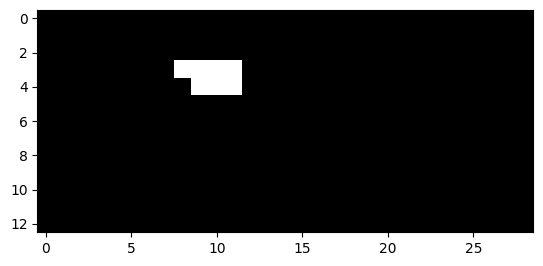

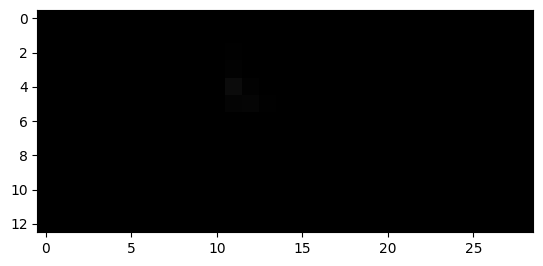

1848


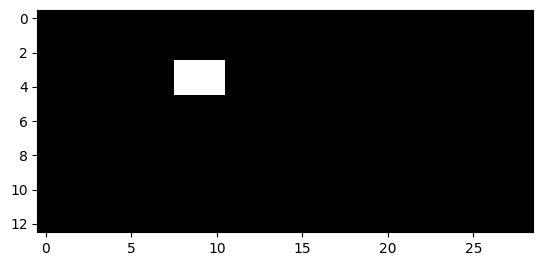

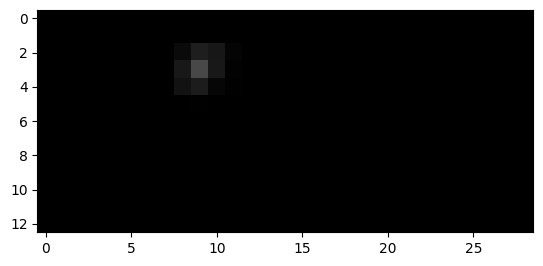

1849


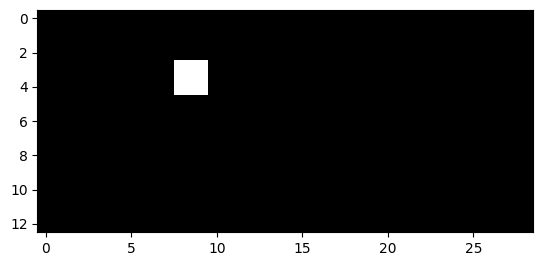

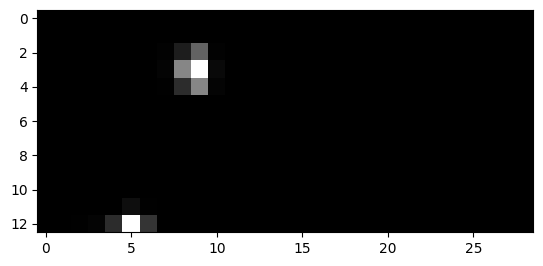

2122


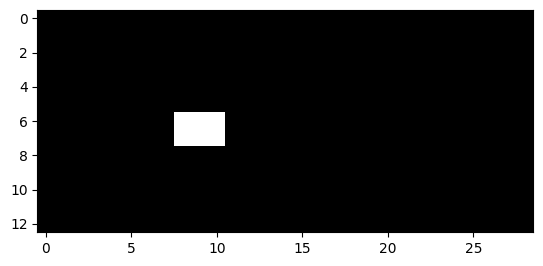

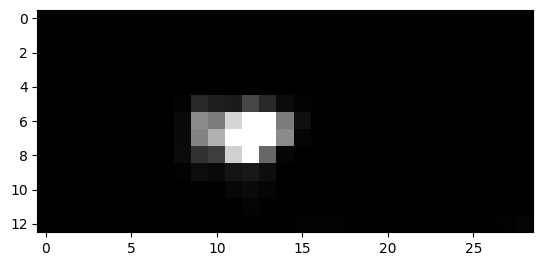

2123


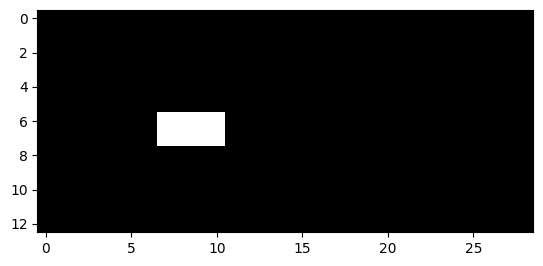

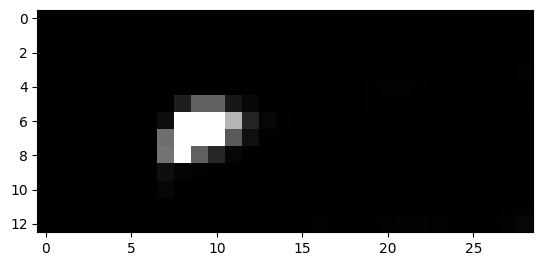

2124


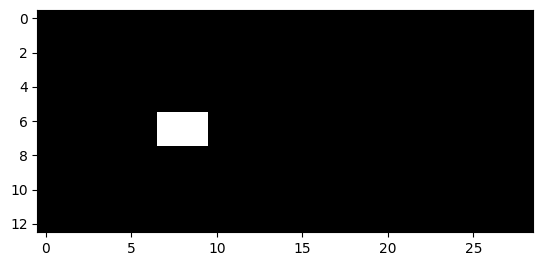

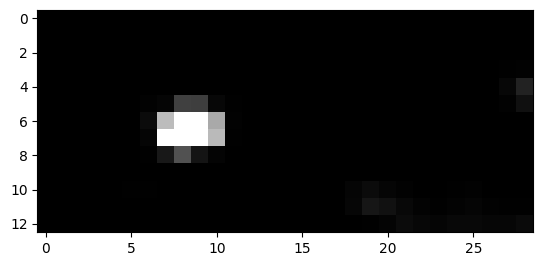

2126


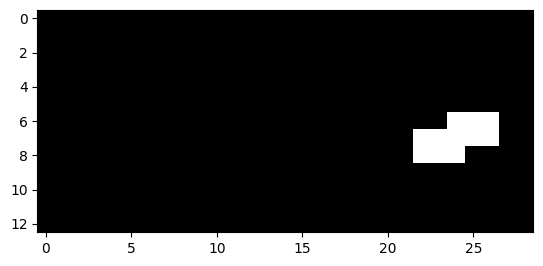

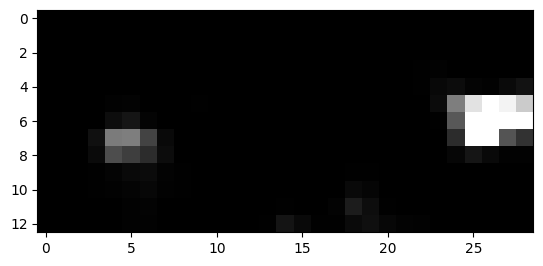

2127


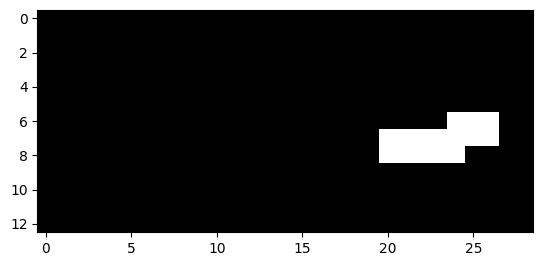

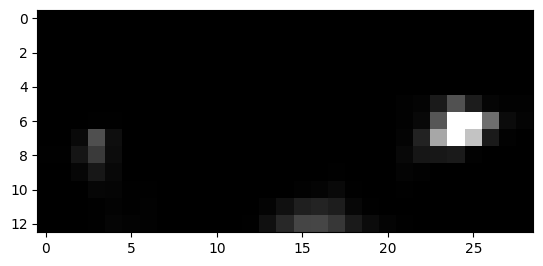

2128


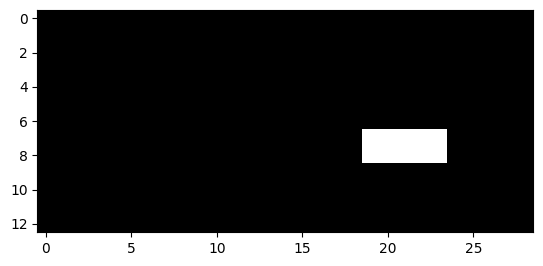

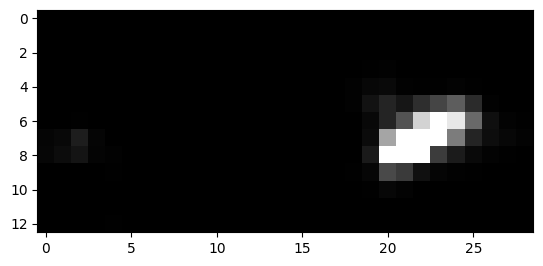

2129


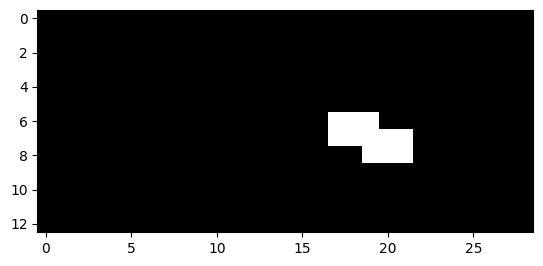

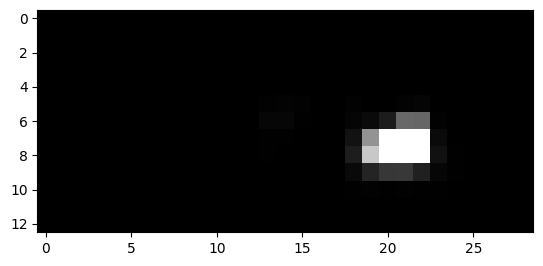

2130


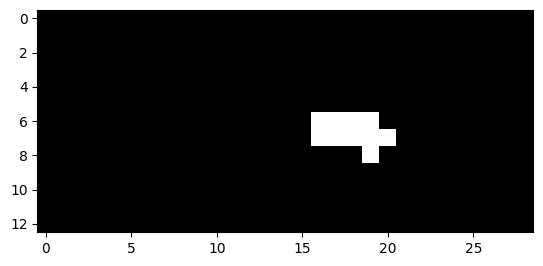

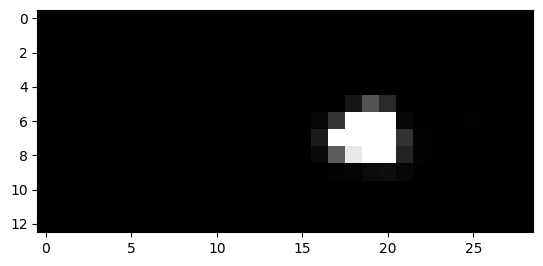

2131


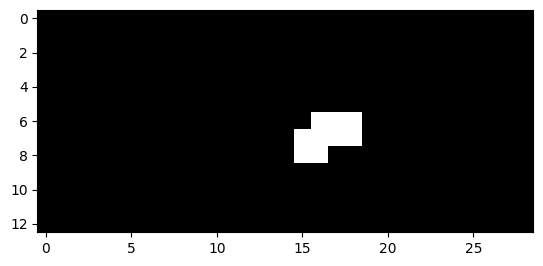

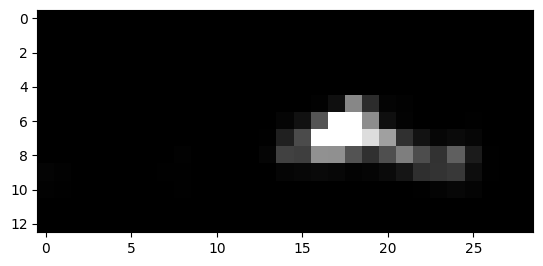

2132


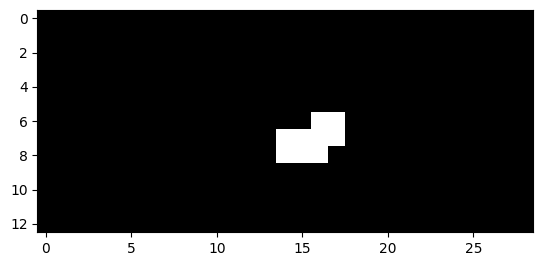

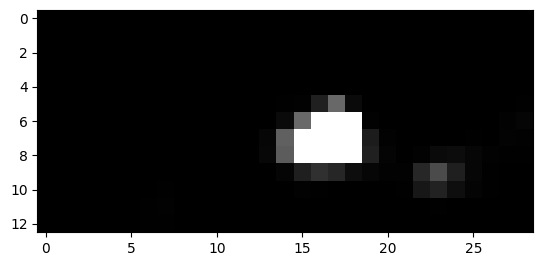

2133


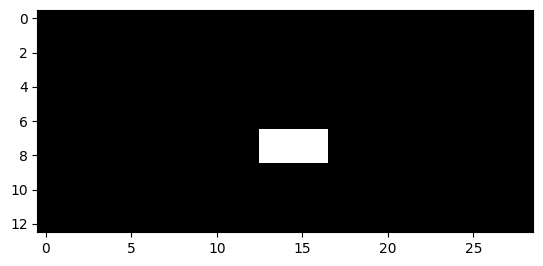

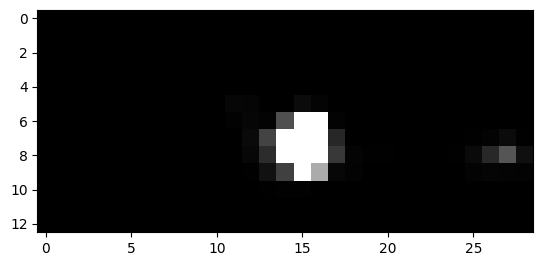

2134


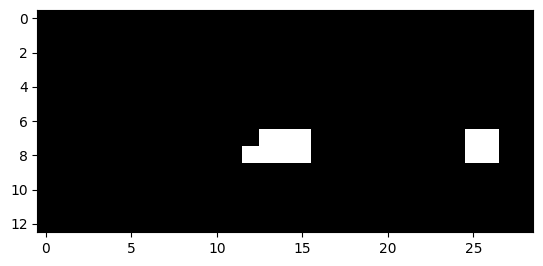

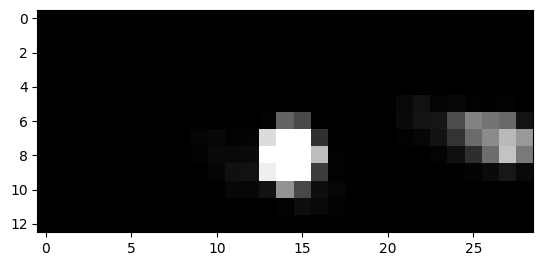

2135


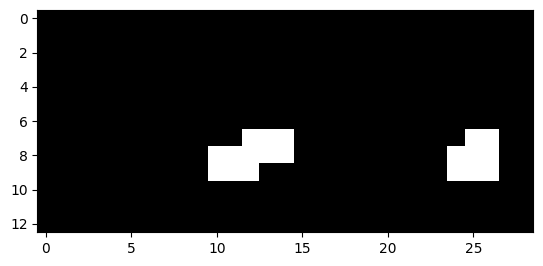

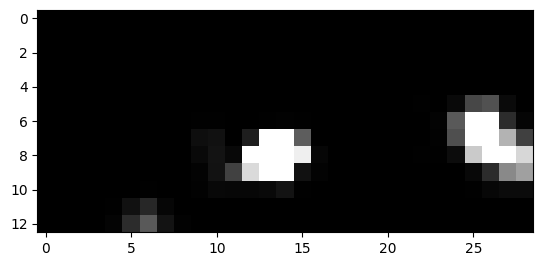

2136


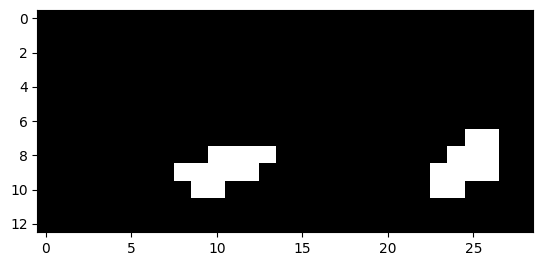

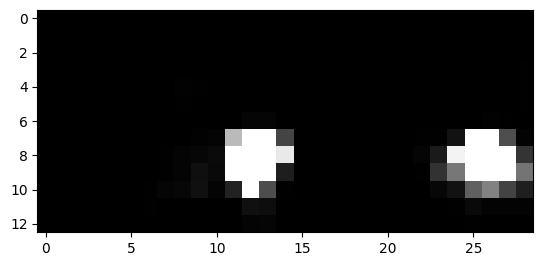

2137


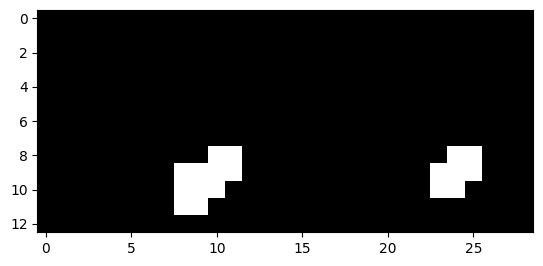

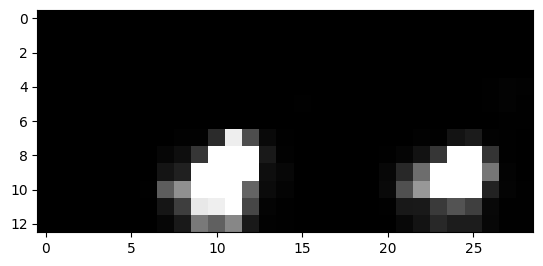

2138


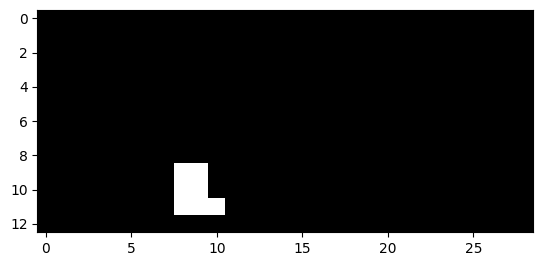

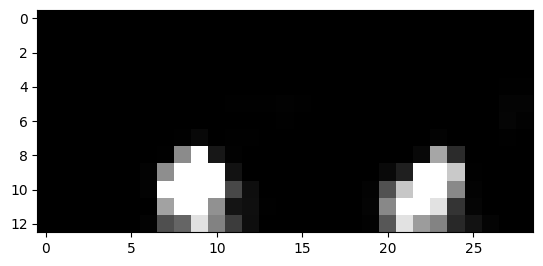

2139


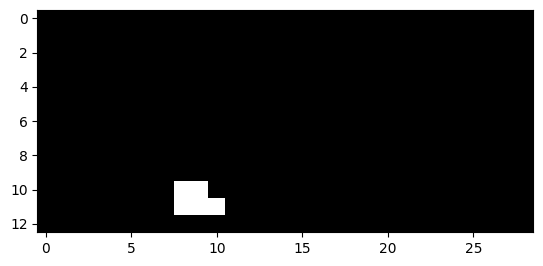

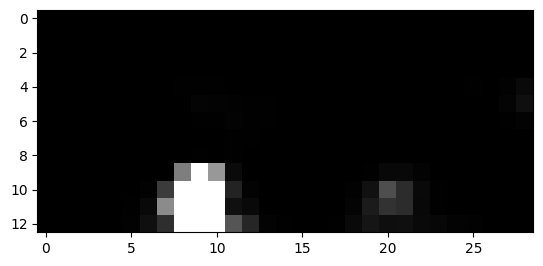

2143


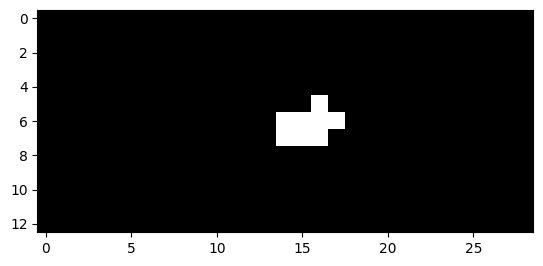

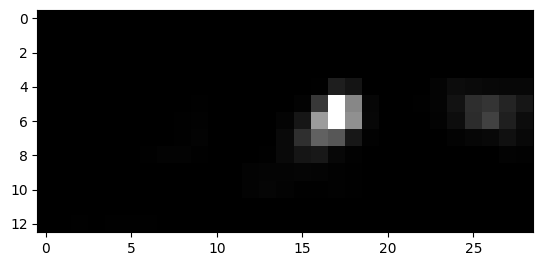

2144


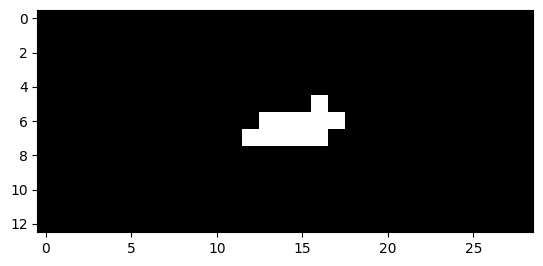

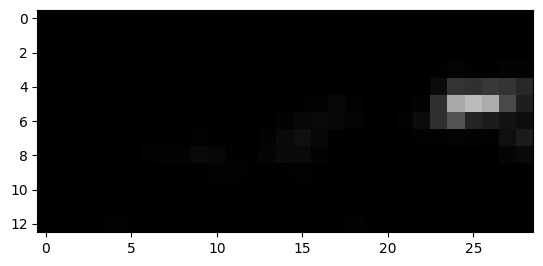

2145


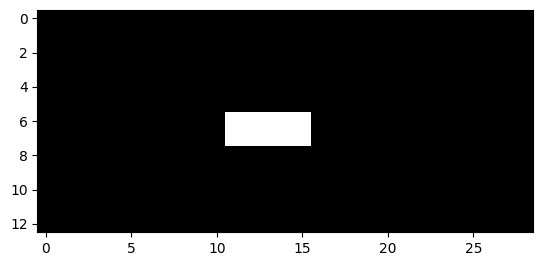

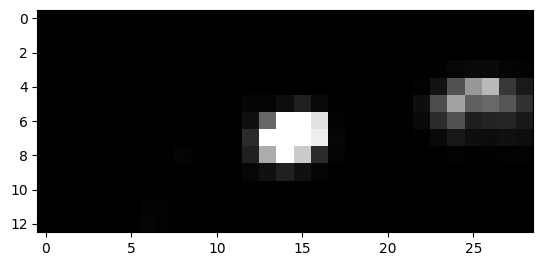

2146


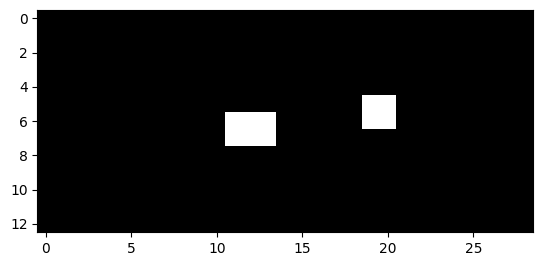

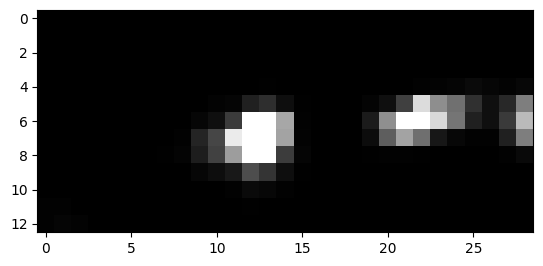

2147


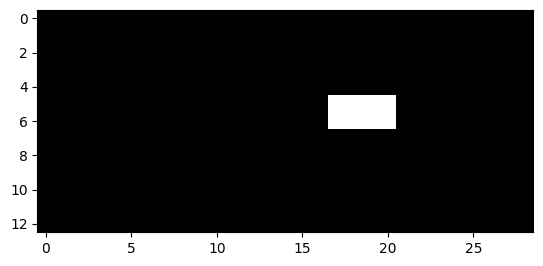

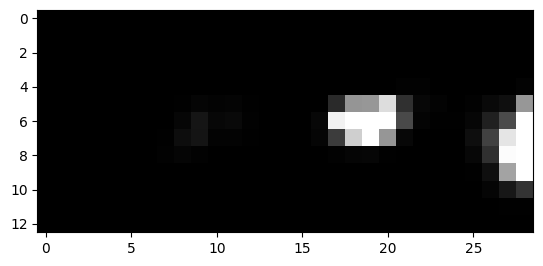

2148


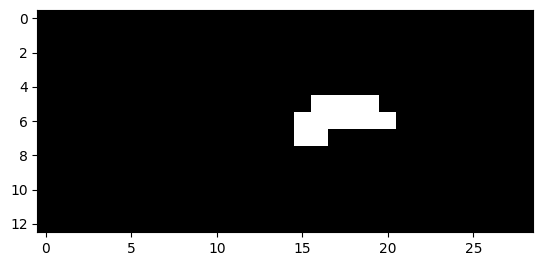

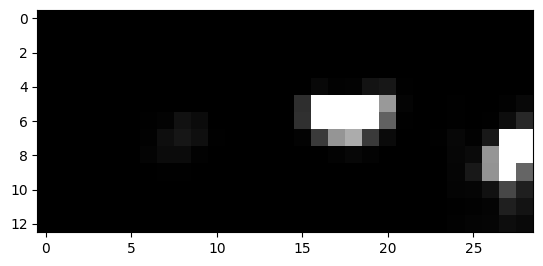

2149


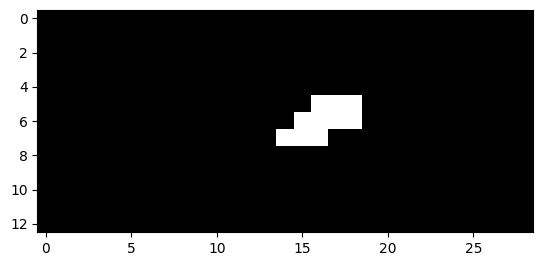

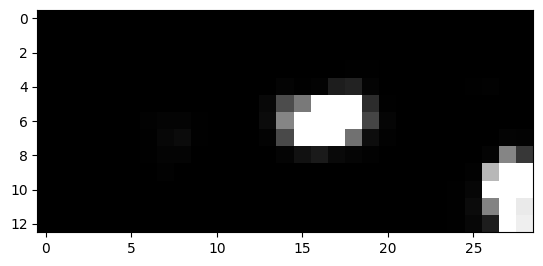

2150


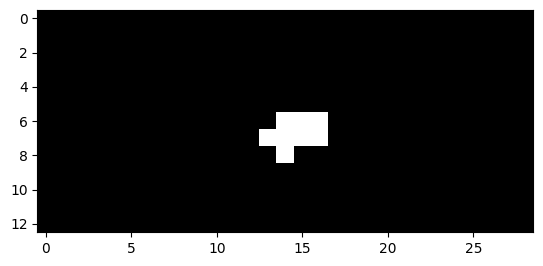

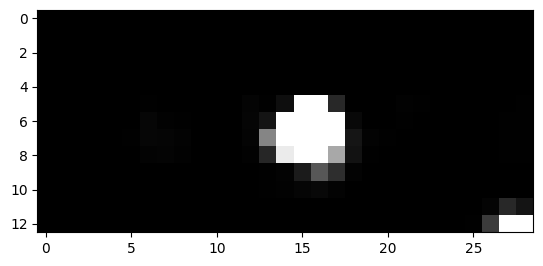

2151


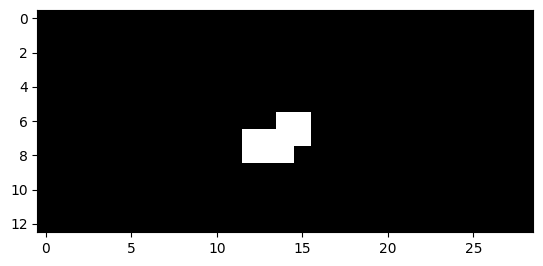

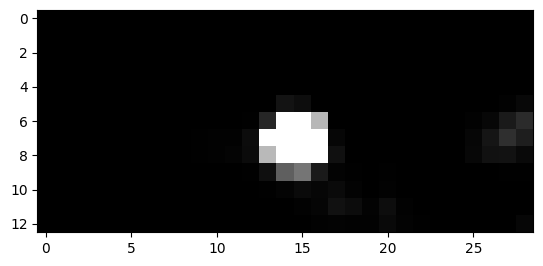

2152


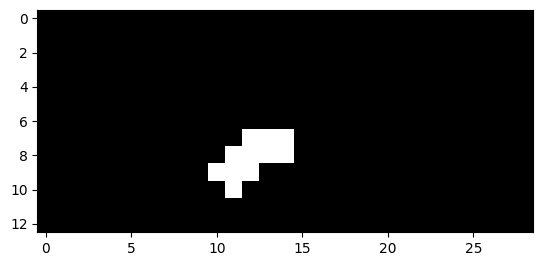

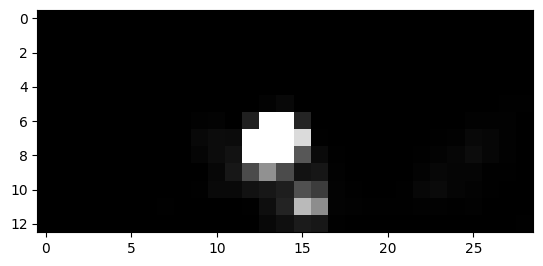

2153


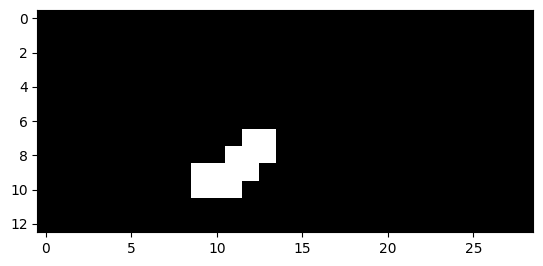

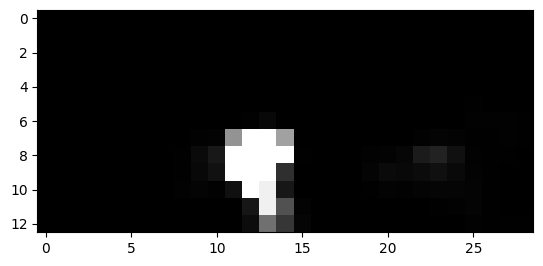

2154


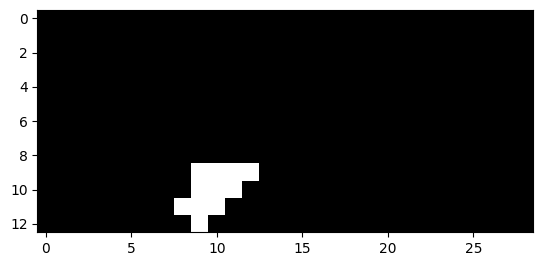

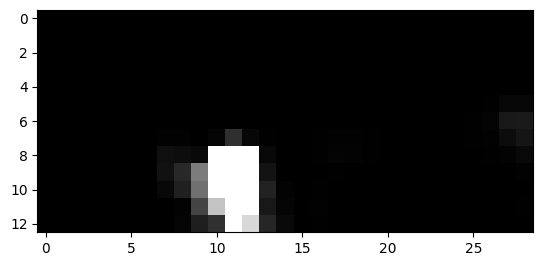

2155


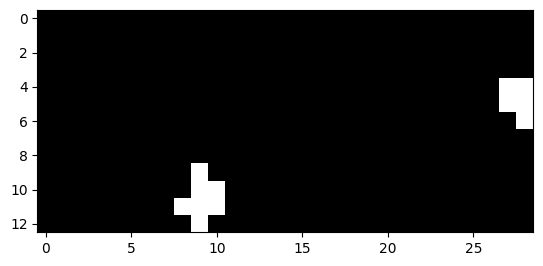

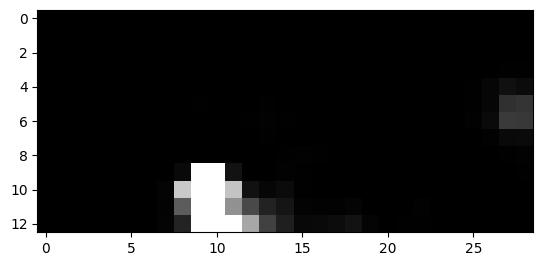

2156


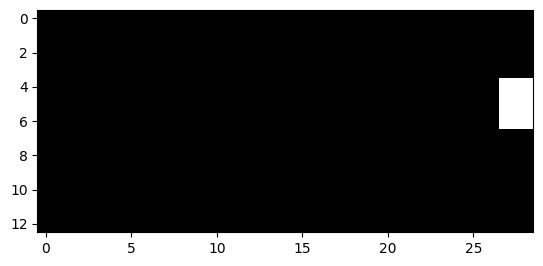

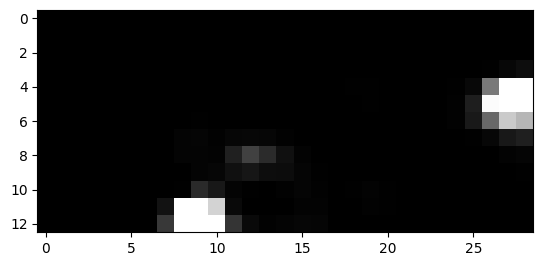

2157


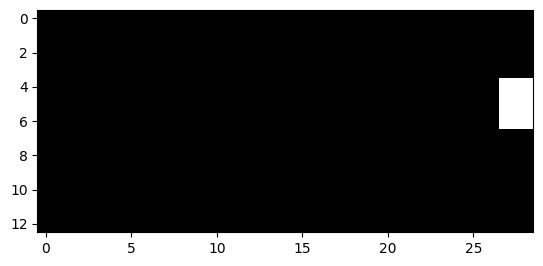

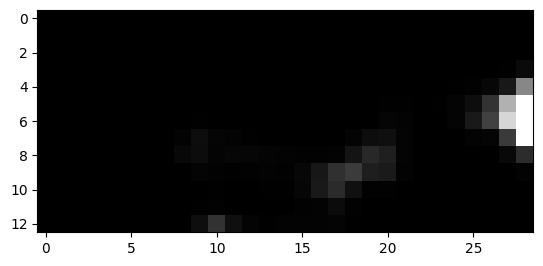

2166


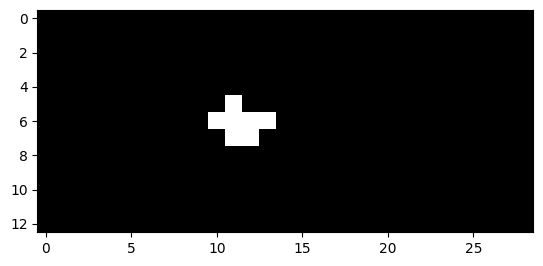

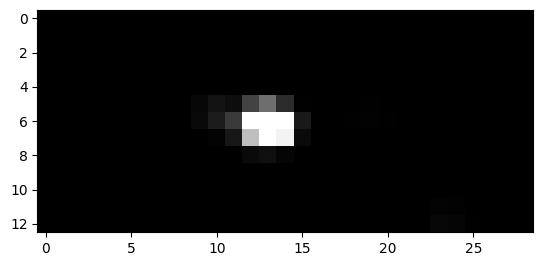

2167


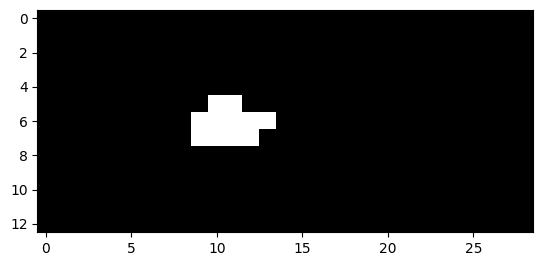

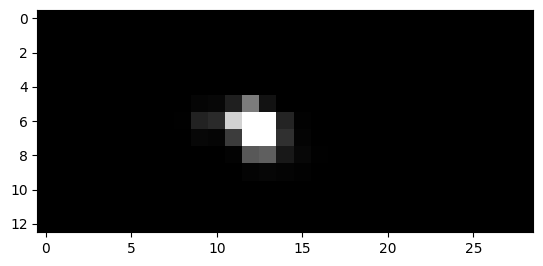

2168


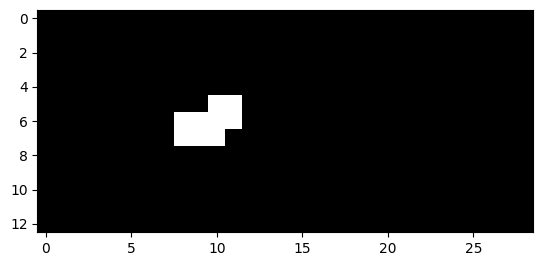

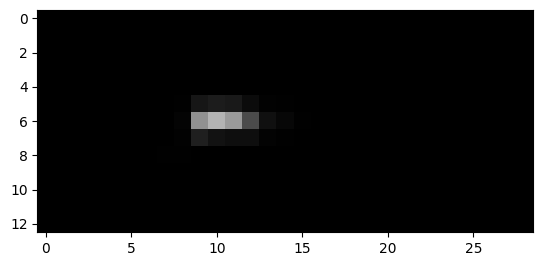

2169


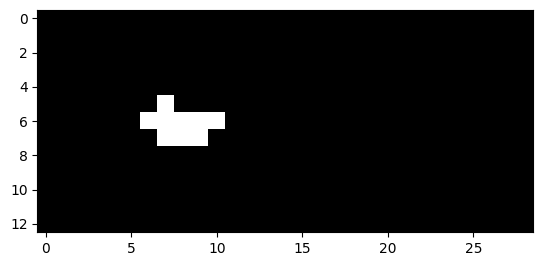

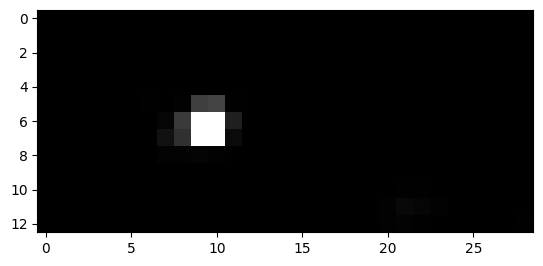

2170


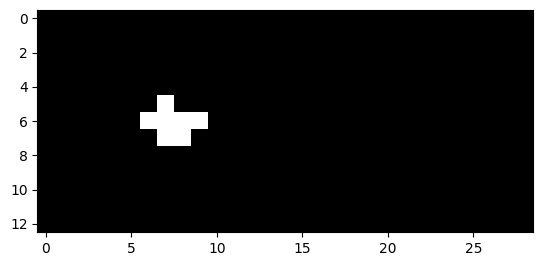

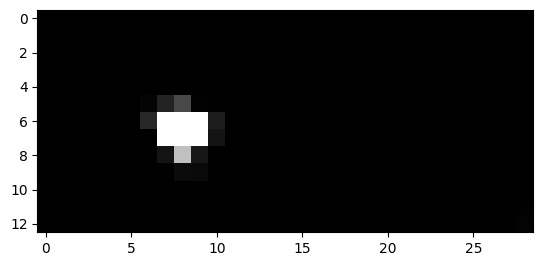

2171


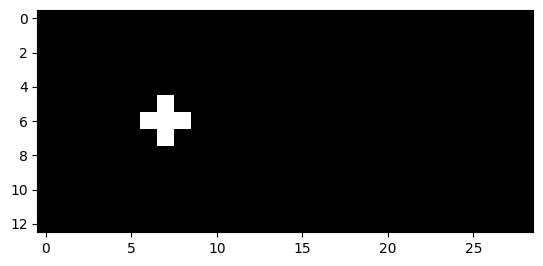

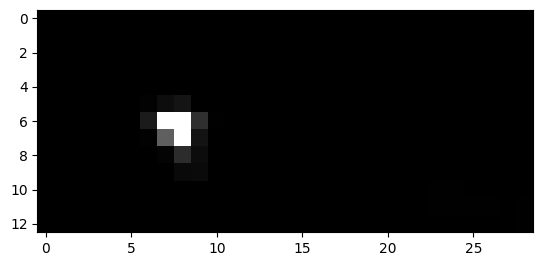

2174


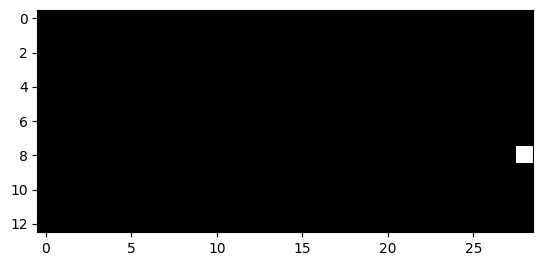

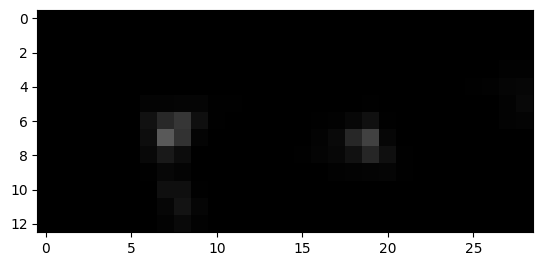

2175


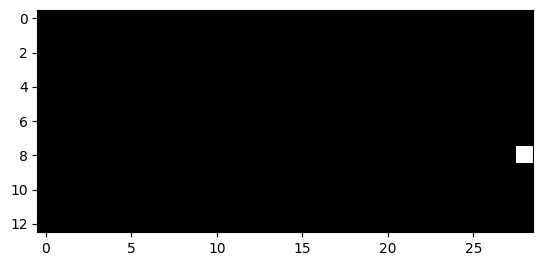

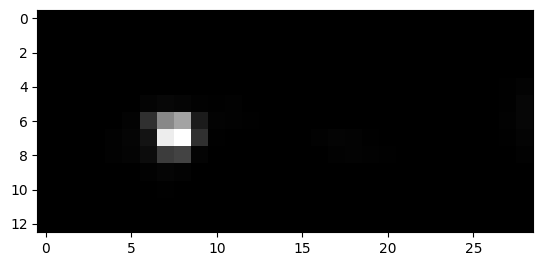

2181


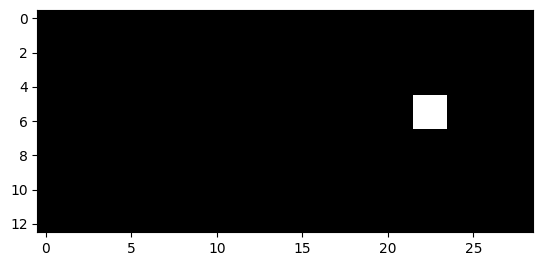

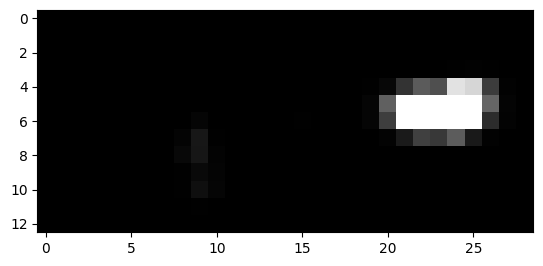

2182


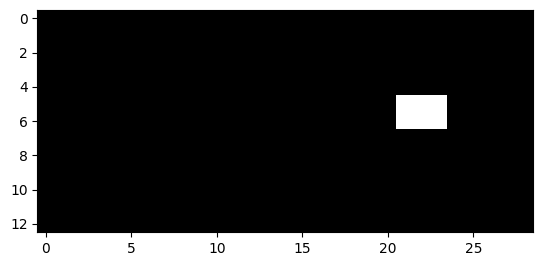

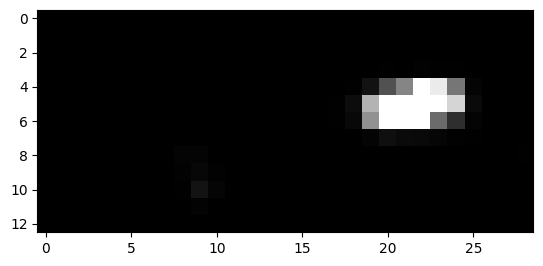

2183


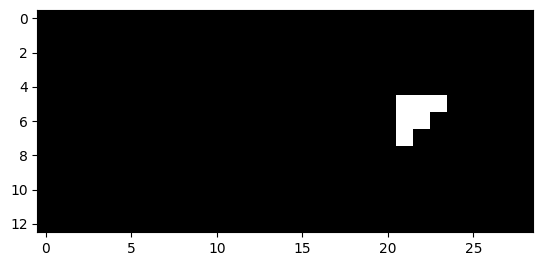

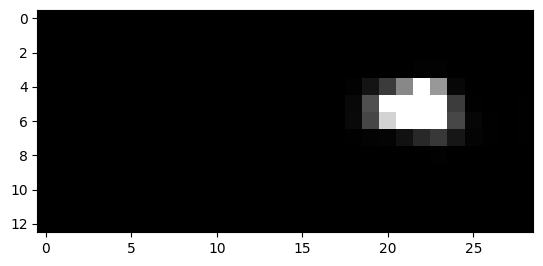

2184


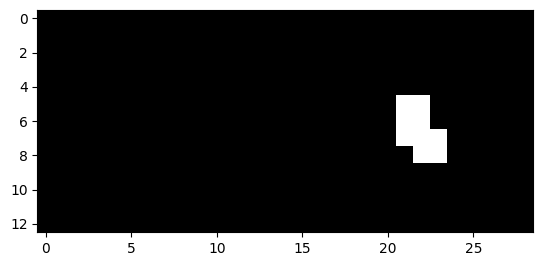

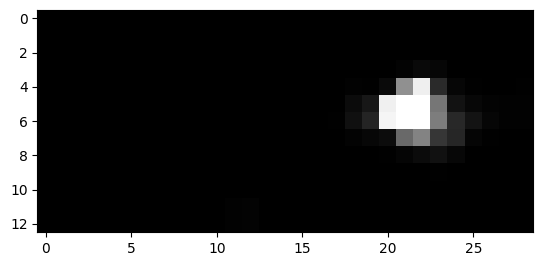

2185


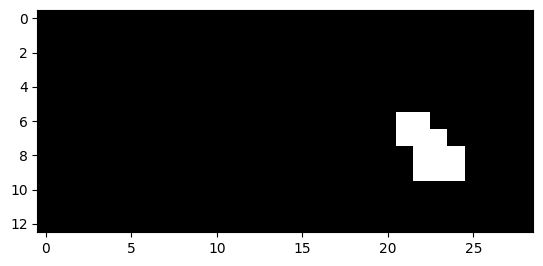

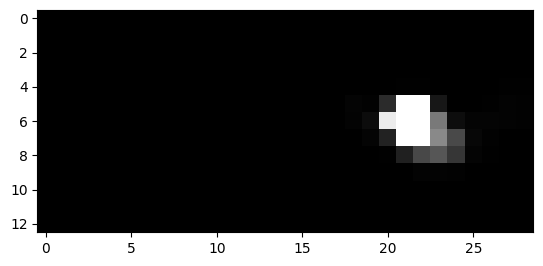

2186


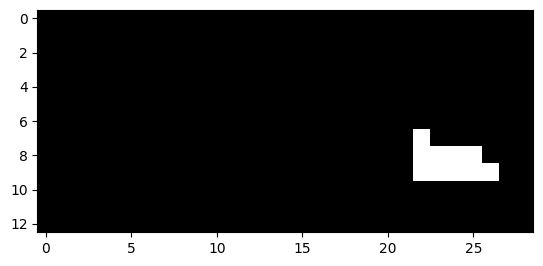

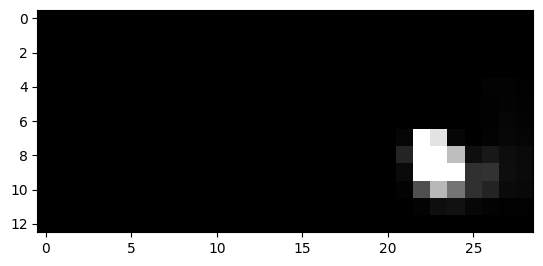

2187


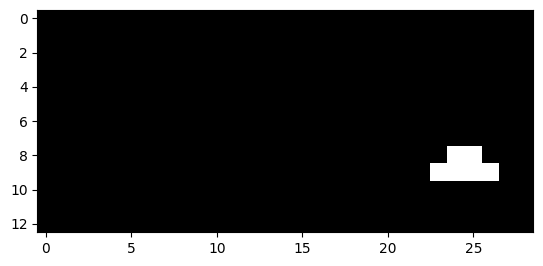

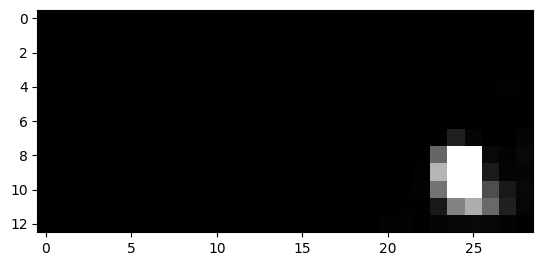

2188


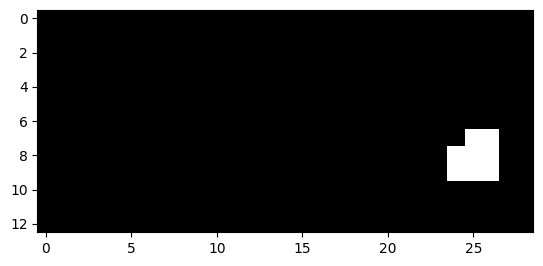

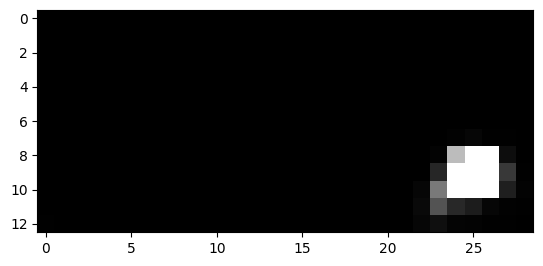

2189


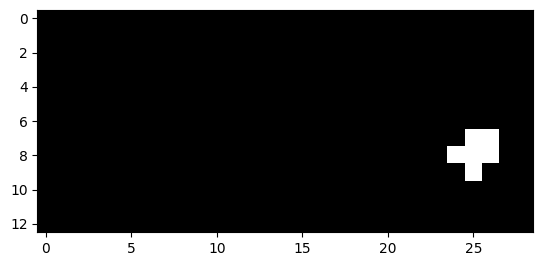

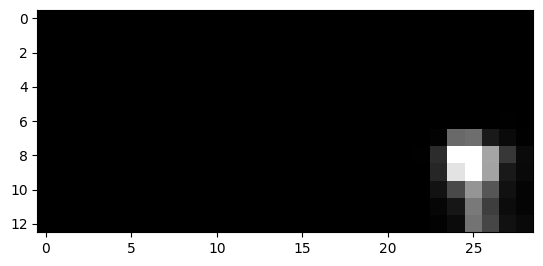

2190


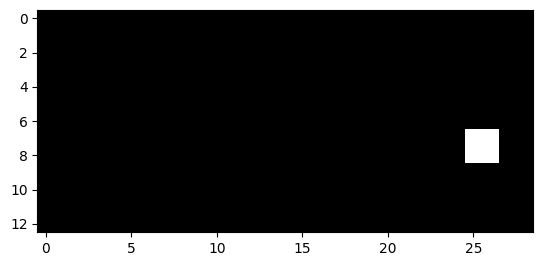

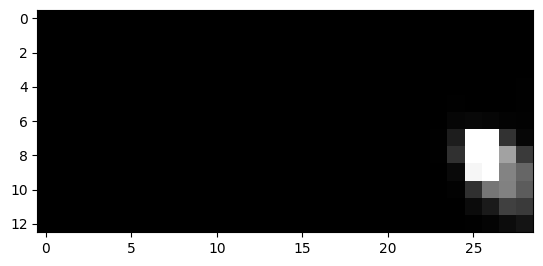

2191


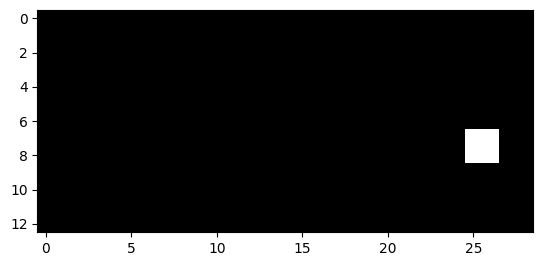

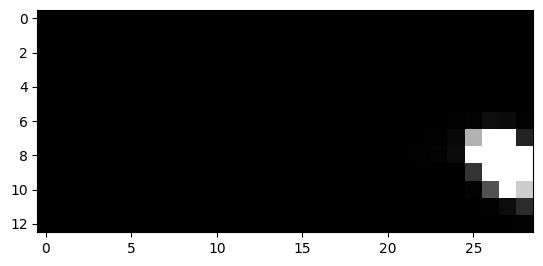

2214


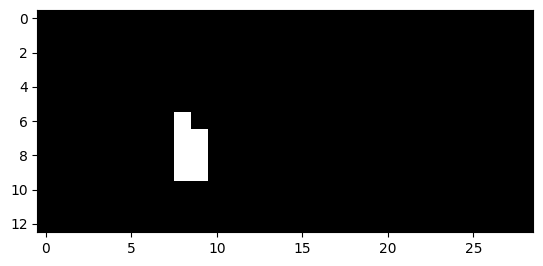

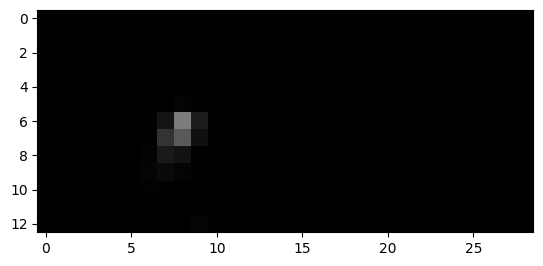

2215


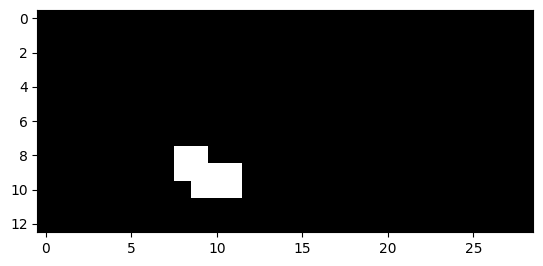

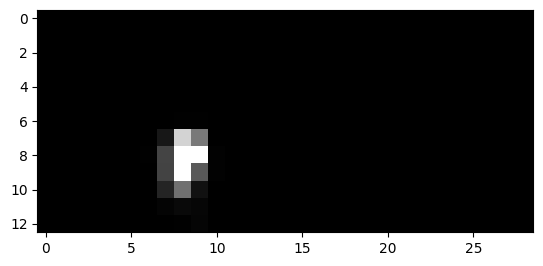

2216


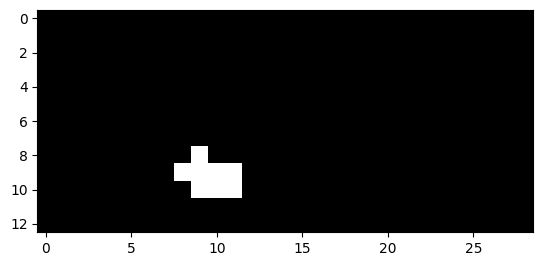

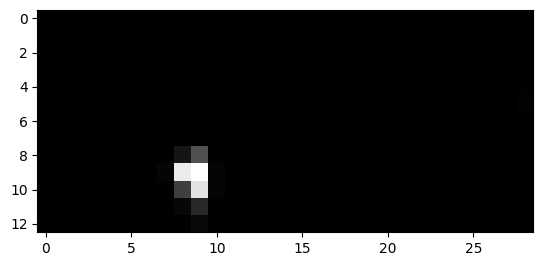

2226


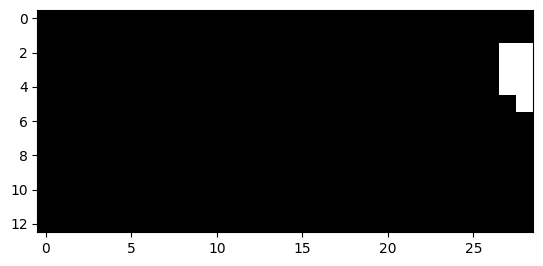

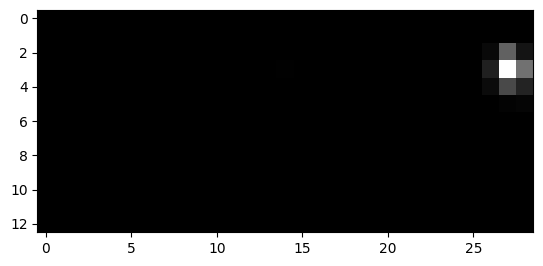

2227


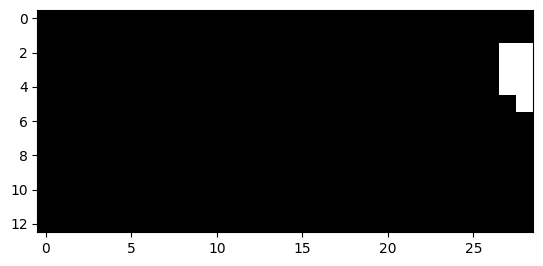

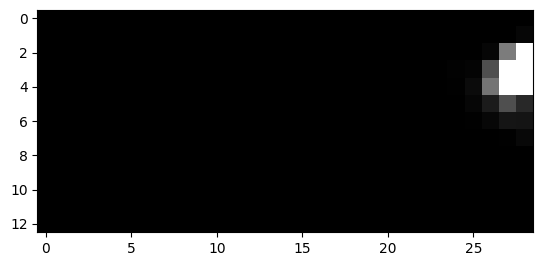

2228


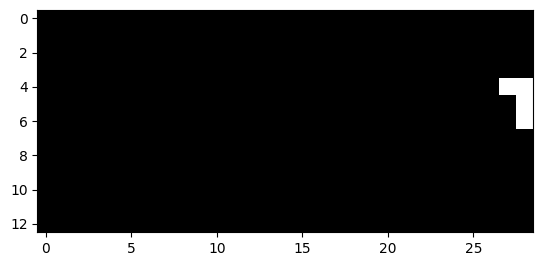

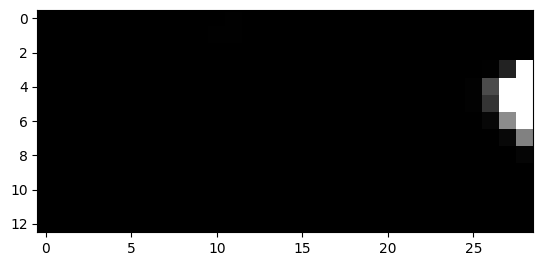

2229


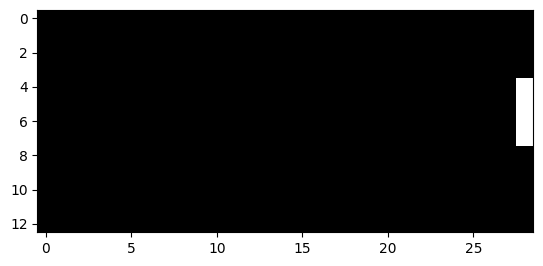

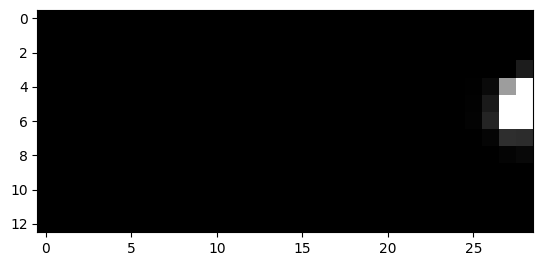

2230


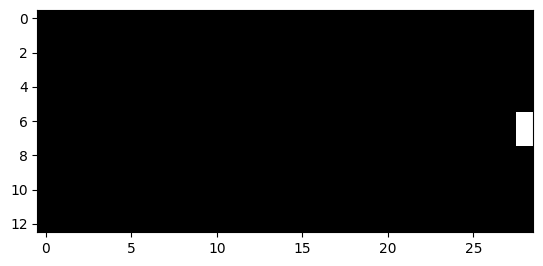

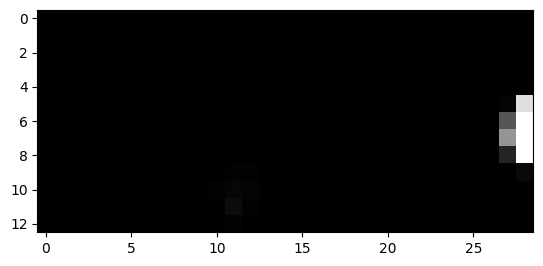

389


In [39]:
k=0
for i in range(len(y_test_img)): 
    if(np.max(y_test_img[i].reshape(-1))>0.1):
        print(i)
        plt.figure()
        plt.imshow(y_test_img[i], cmap = "gray", vmin=0, vmax=1)
        plt.show()
        plt.imshow(t[i], vmin=0, vmax=0.3, cmap = "gray")
        plt.show()
        k+=1
print(k)

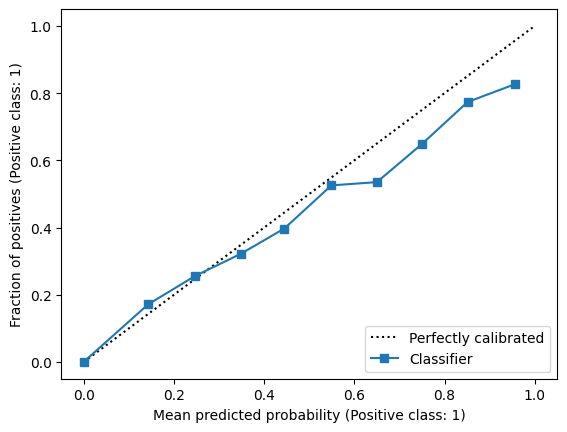

In [40]:
from sklearn.calibration import CalibrationDisplay

display = CalibrationDisplay.from_predictions(y_test_img.reshape(-1,1), t.reshape(-1,1), n_bins=10)


In [41]:
from sklearn.metrics import brier_score_loss
### brier score con probabilità predette

print(f'All zeros Brier score: {brier_score_loss(y_test_img.reshape(-1,1), np.zeros(len(y_test_img.reshape(-1,1))))}')
print(f'Model Brier score: {brier_score_loss(y_test_img.reshape(-1,1), t.reshape(-1,1))}')

All zeros Brier score: 0.0035259368257102965
Model Brier score: 0.002203963254066538


In [42]:
test['predictions_lag0'] = t.reshape(-1,1)

In [43]:
test.to_csv("test_with_newTarget_predictions_clim.csv")

## Lags

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_1 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 14, 30, 1)         73        
                                                                 
 cropping2d_1 (Cropping2D)   (None, 13, 29, 1)        

2023-05-05 09:49:08.255640: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0592

2023-05-05 09:49:11.792277: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0592 - val_loss: 0.0165
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0166 - val_loss: 0.0142
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0150 - val_loss: 0.0137
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0143 - val_loss: 0.0134
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0138 - val_loss: 0.0123
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0134 - val_loss: 0.0120
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0132 - val_loss: 0.0118
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0129 - val_loss: 0.0115
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0127 - val_loss: 0.0115
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0125 - val_loss: 0.0115


2023-05-05 09:52:47.726859: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


78/78 [==============================] - 0s 3ms/step


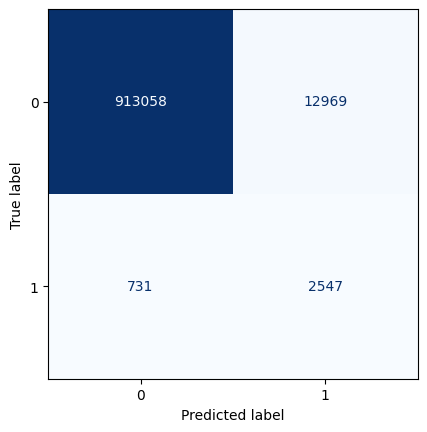

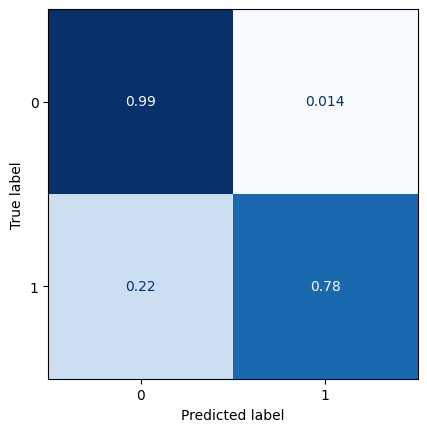

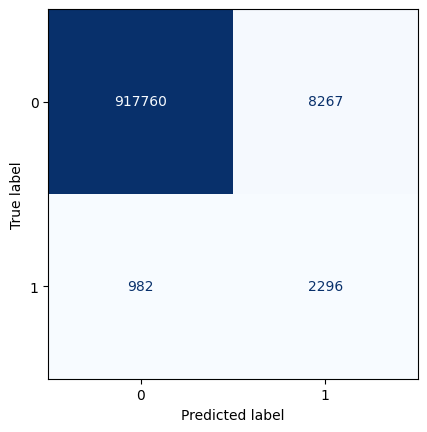

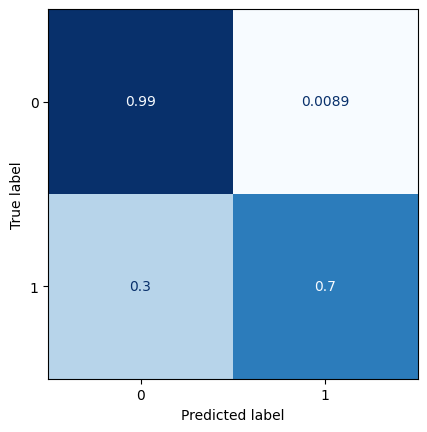

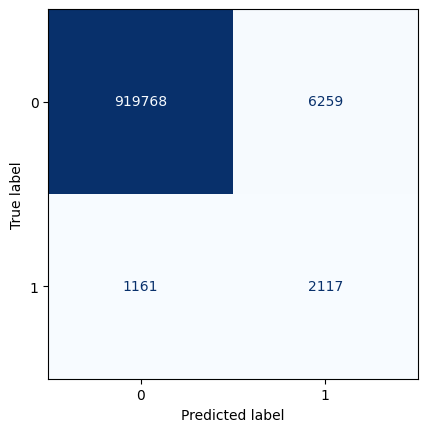

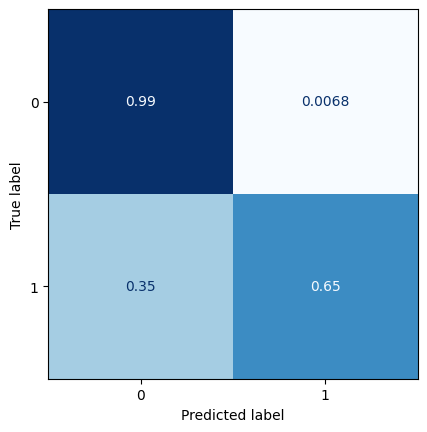

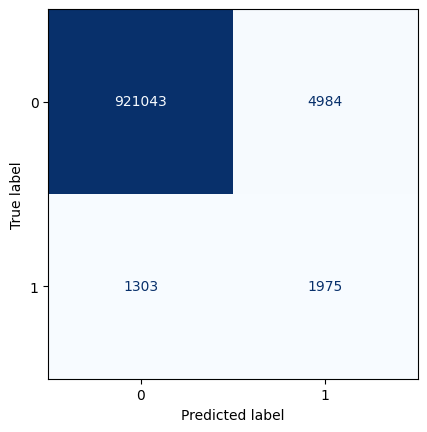

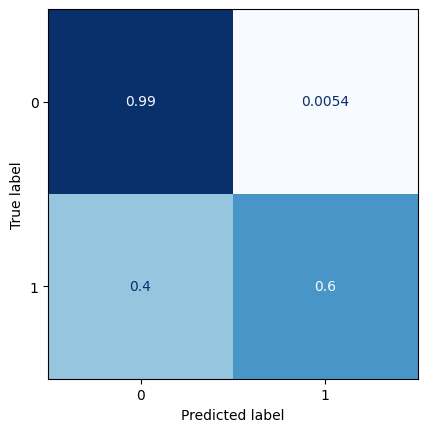

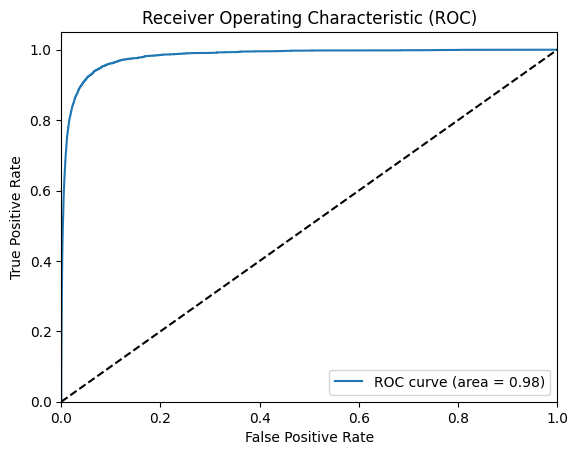

All zeros Brier score: 0.00352736722604527
Model Brier score: 0.0027335537061380726
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_2 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 14, 30, 1)         73        
                                    

2023-05-05 09:53:07.426713: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0334

2023-05-05 09:53:10.978882: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0334 - val_loss: 0.0178
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0180 - val_loss: 0.0156
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0168 - val_loss: 0.0151
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0162 - val_loss: 0.0152
Epoch 5/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0158 - val_loss: 0.0142
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0156 - val_loss: 0.0144
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0153 - val_loss: 0.0140
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0151 - val_loss: 0.0138
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0150 - val_loss: 0.0142
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0149 - val_loss: 0.0137


2023-05-05 09:55:59.752244: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


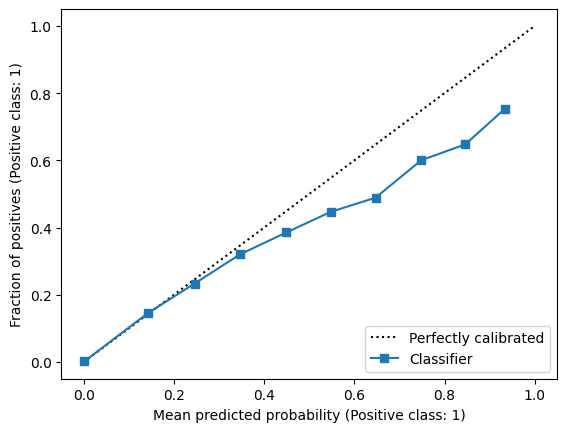

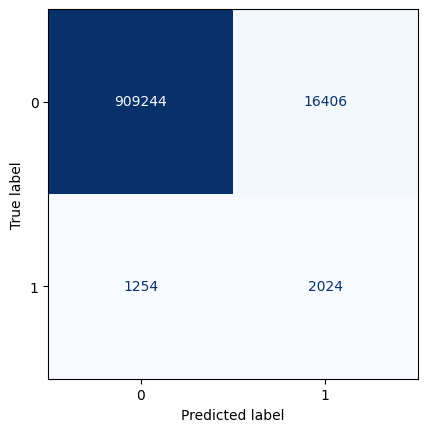

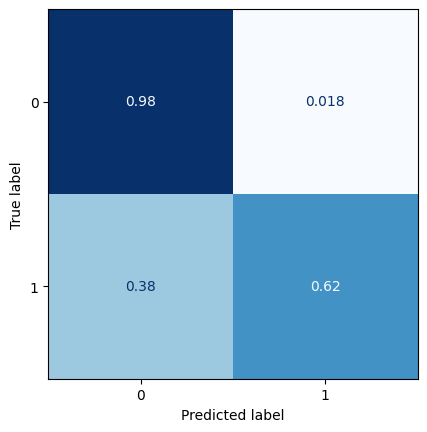

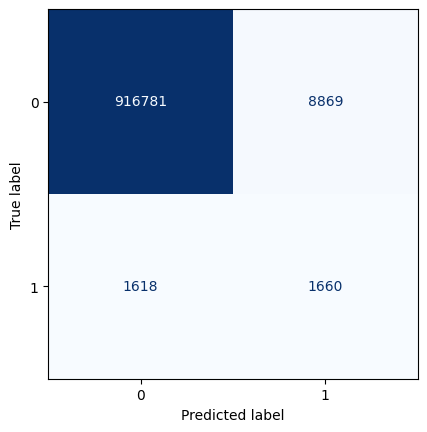

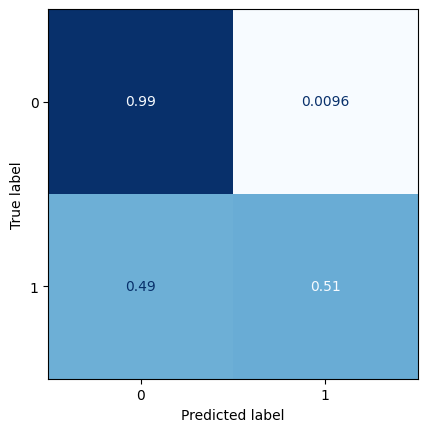

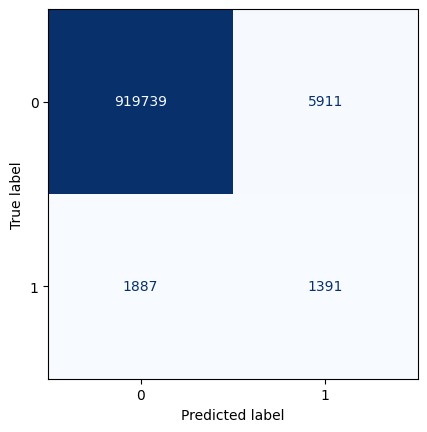

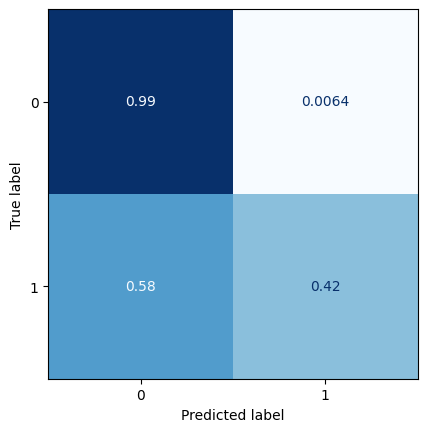

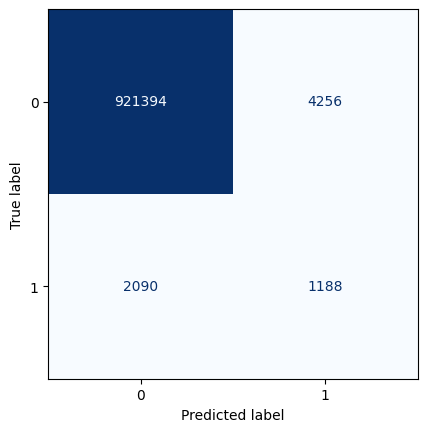

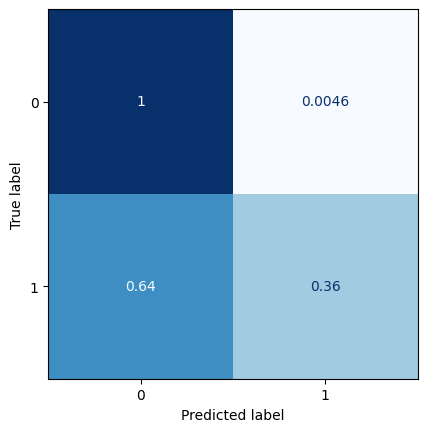

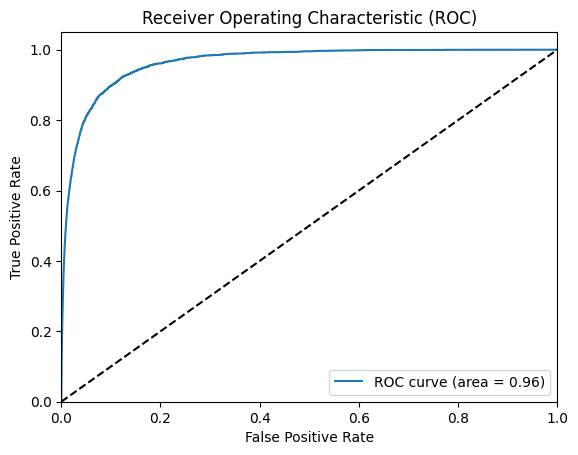

All zeros Brier score: 0.003528798787419477
Model Brier score: 0.0031495061872039115
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_3 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-05-05 09:56:24.685030: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0423

2023-05-05 09:56:27.852560: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0423 - val_loss: 0.0198
Epoch 2/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0205 - val_loss: 0.0182
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0195 - val_loss: 0.0174
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0188 - val_loss: 0.0175
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0183 - val_loss: 0.0173
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0180 - val_loss: 0.0169
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0177 - val_loss: 0.0164
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0175 - val_loss: 0.0167
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0174 - val_loss: 0.0168
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0172 - val_loss: 0.0165
E

2023-05-05 10:00:26.408609: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 4ms/step


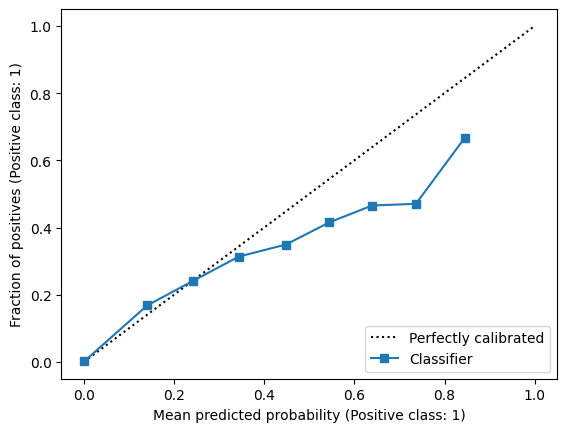

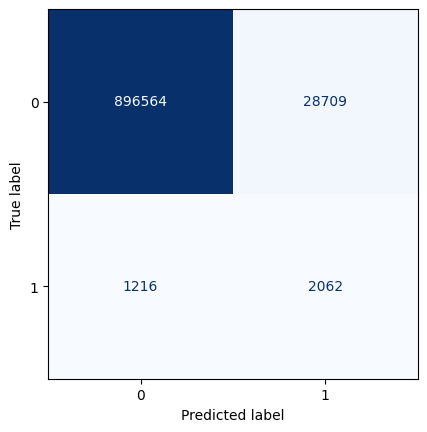

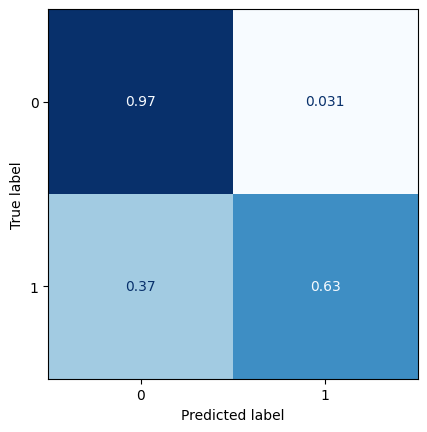

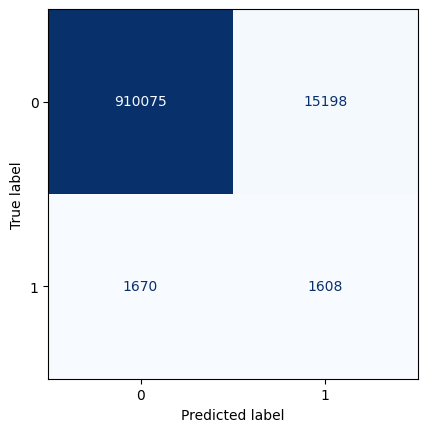

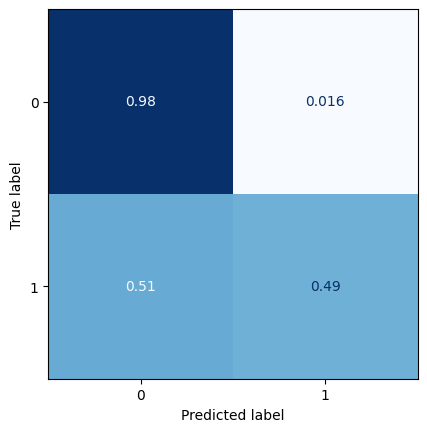

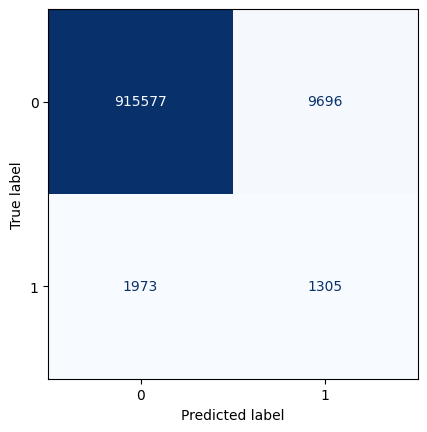

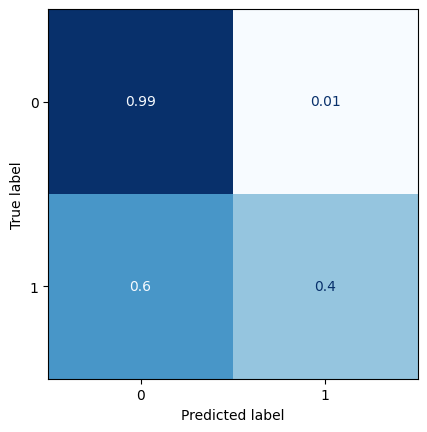

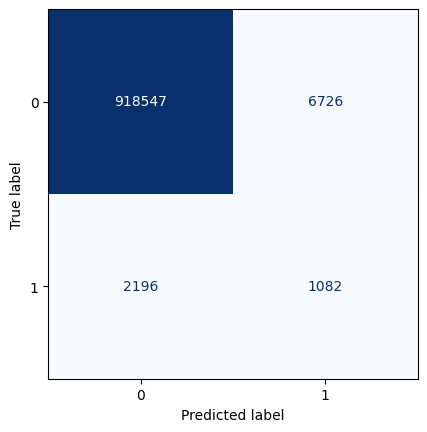

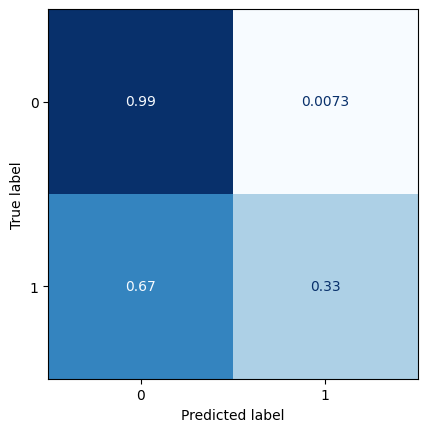

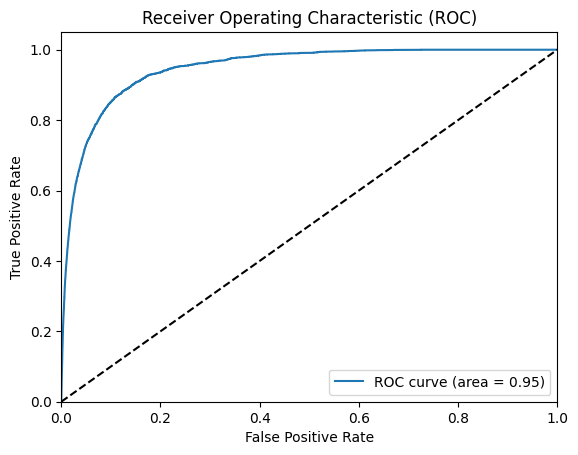

All zeros Brier score: 0.0035302315112470937
Model Brier score: 0.003339841782538023
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_4 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-05-05 10:00:48.943195: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0372

2023-05-05 10:00:54.266101: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 6s 15ms/step - loss: 0.0372 - val_loss: 0.0202
Epoch 2/100
354/354 [==============================] - 5s 13ms/step - loss: 0.0214 - val_loss: 0.0191
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0204 - val_loss: 0.0184
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0200 - val_loss: 0.0181
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0196 - val_loss: 0.0181
Epoch 6/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0194 - val_loss: 0.0182
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0192 - val_loss: 0.0184
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0190 - val_loss: 0.0177
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0188 - val_loss: 0.0180
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0188 - val_loss: 0.0178

2023-05-05 10:02:46.278061: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


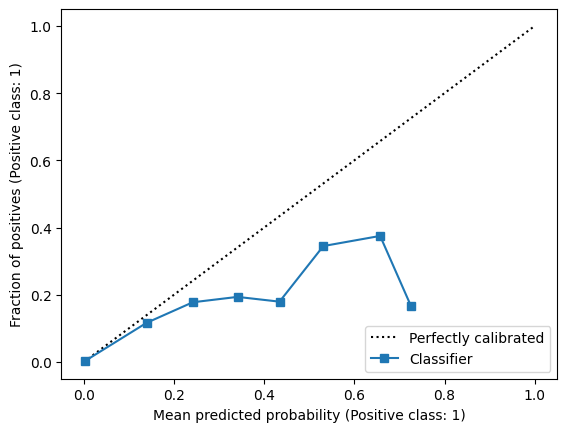

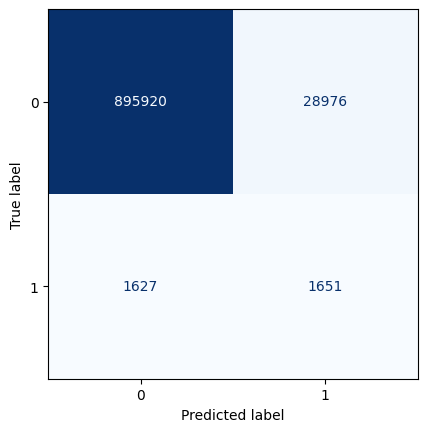

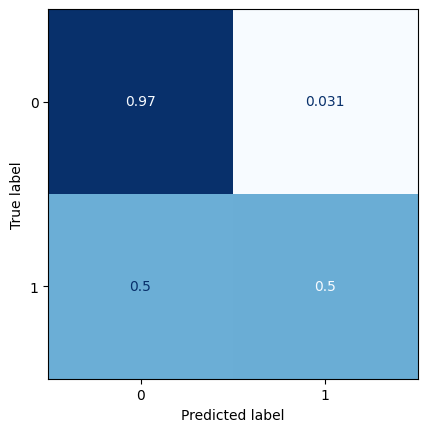

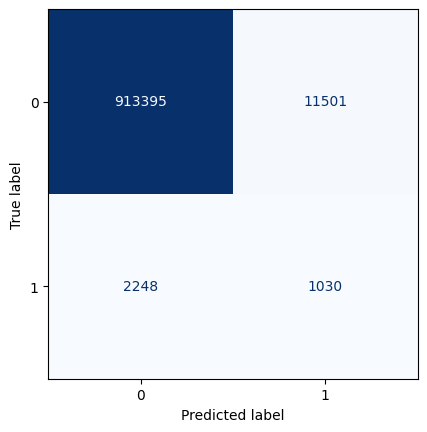

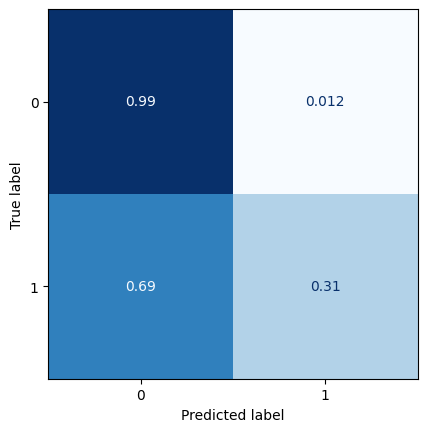

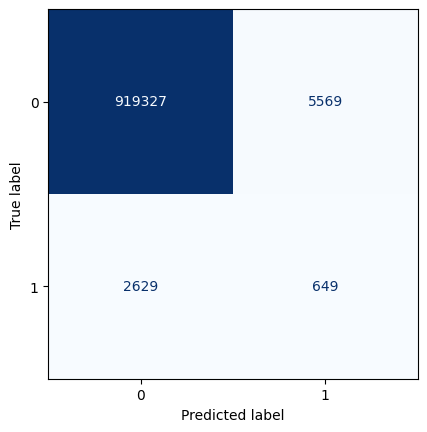

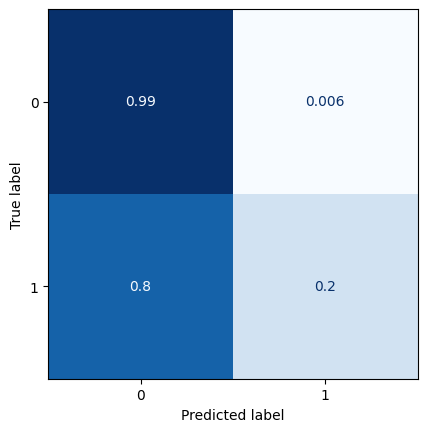

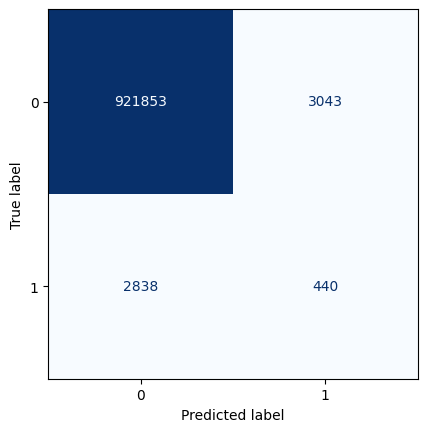

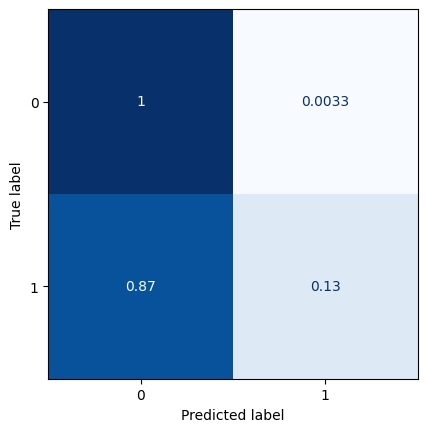

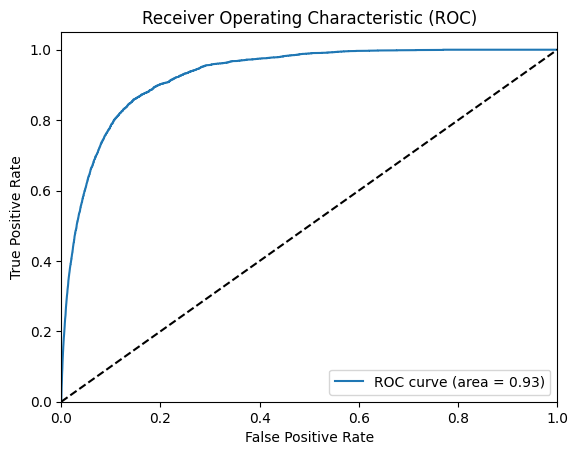

All zeros Brier score: 0.0035316653989445946
Model Brier score: 0.003390360327132882
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_16 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_5 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_17 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-05-05 10:03:09.755352: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0800

2023-05-05 10:03:17.122323: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 9s 23ms/step - loss: 0.0800 - val_loss: 0.0210
Epoch 2/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0228 - val_loss: 0.0194
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0216 - val_loss: 0.0190
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0190
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0187
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0204 - val_loss: 0.0191
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0202 - val_loss: 0.0185
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0200 - val_loss: 0.0188
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0199 - val_loss: 0.0187
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0197 - val_loss: 0.0187

2023-05-05 10:05:32.632733: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


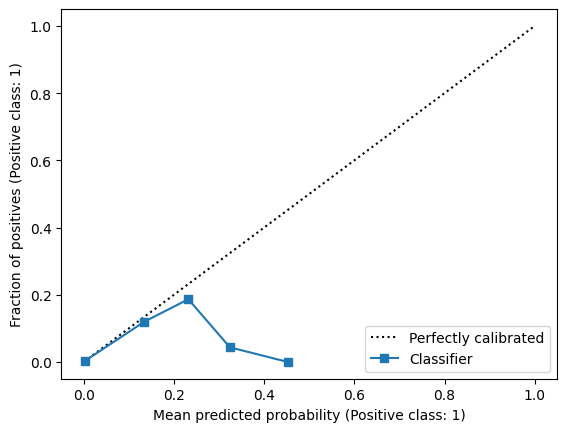

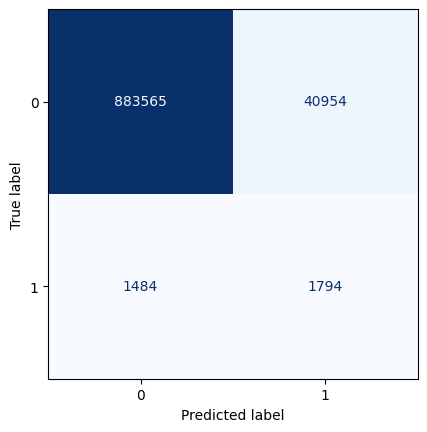

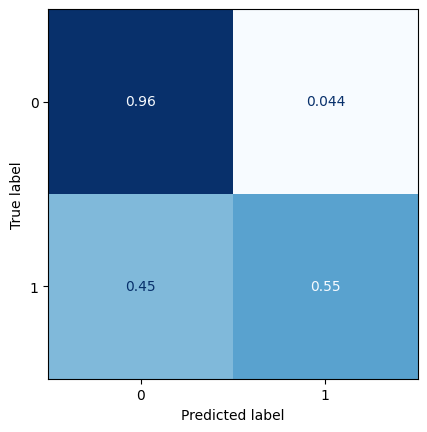

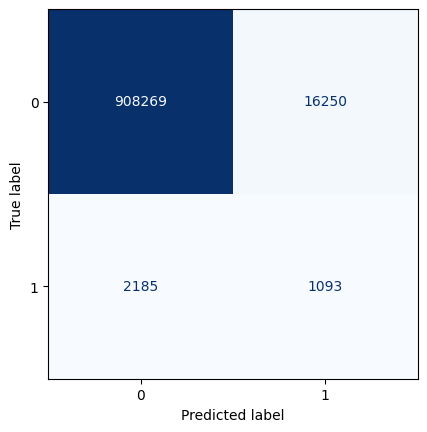

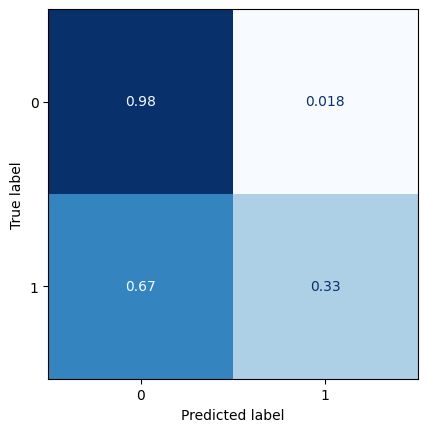

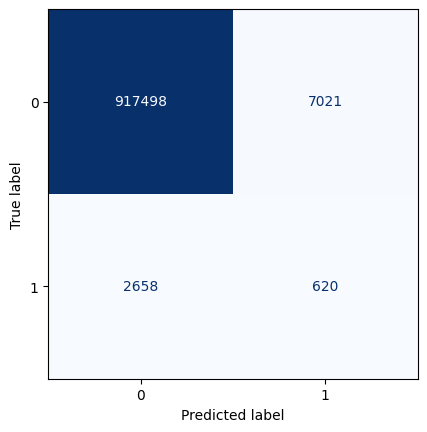

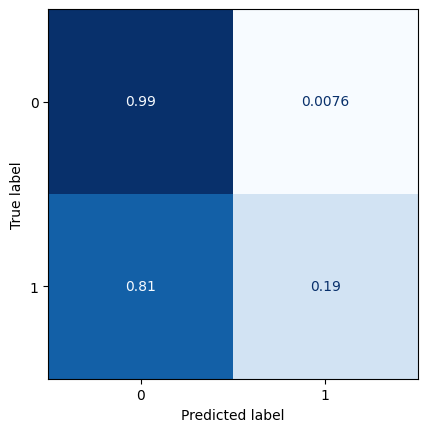

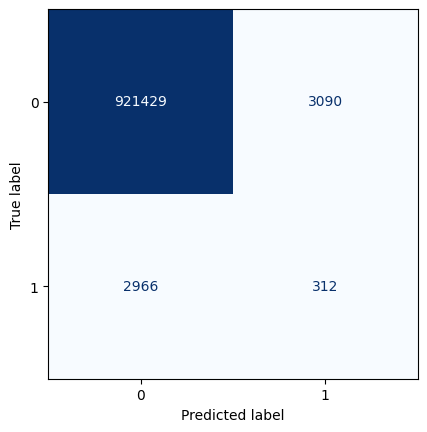

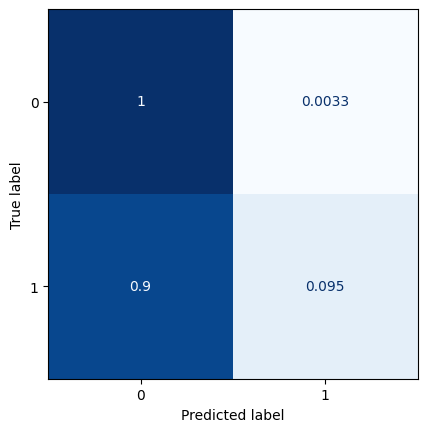

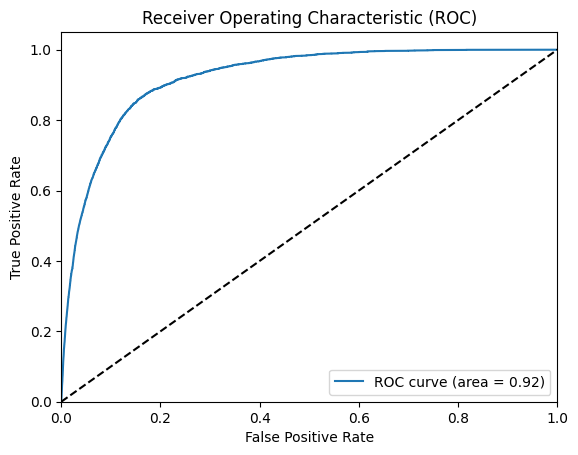

All zeros Brier score: 0.0035331004519307562
Model Brier score: 0.0034297563743259925
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_19 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_6 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_20 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-05-05 10:05:56.738892: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0496

2023-05-05 10:06:03.395296: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 8s 19ms/step - loss: 0.0496 - val_loss: 0.0198
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0220 - val_loss: 0.0191
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0190
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0205 - val_loss: 0.0188
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0202 - val_loss: 0.0188
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0201 - val_loss: 0.0187
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0199 - val_loss: 0.0189
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0198 - val_loss: 0.0185
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0198 - val_loss: 0.0188
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0197 - val_loss: 0.0187


2023-05-05 10:07:49.995147: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


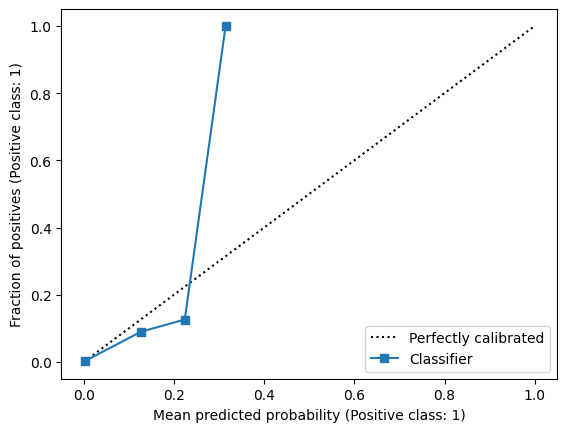

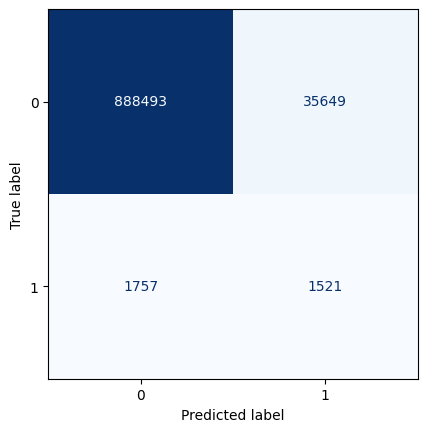

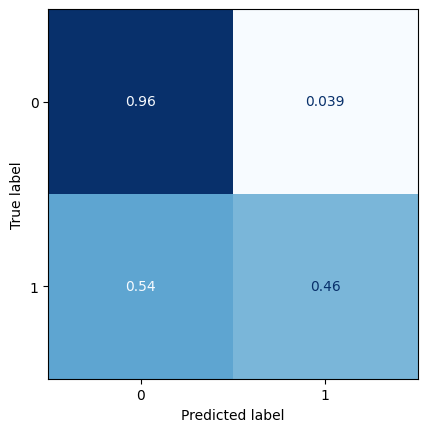

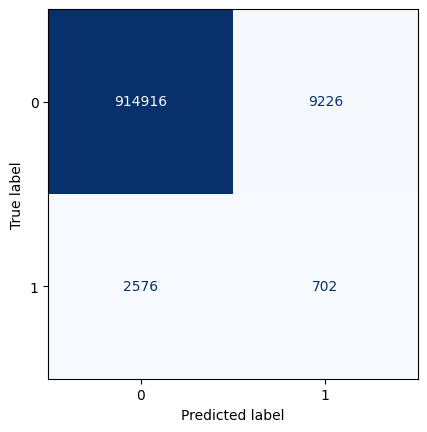

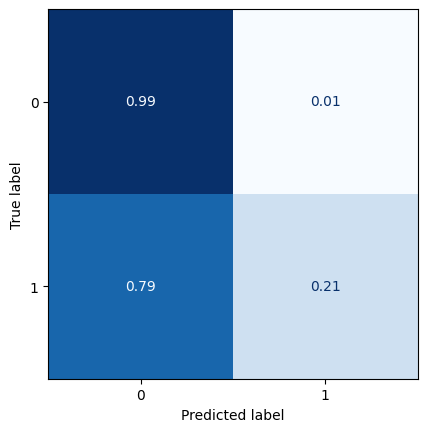

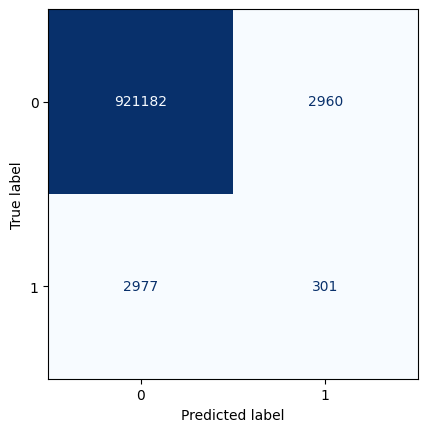

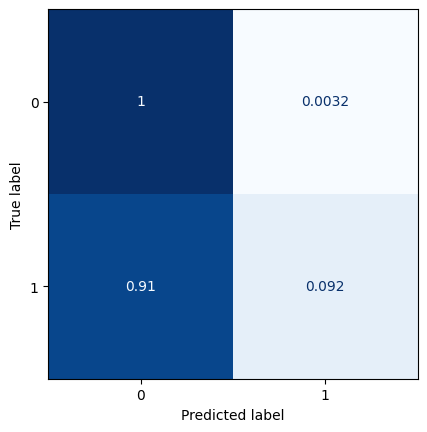

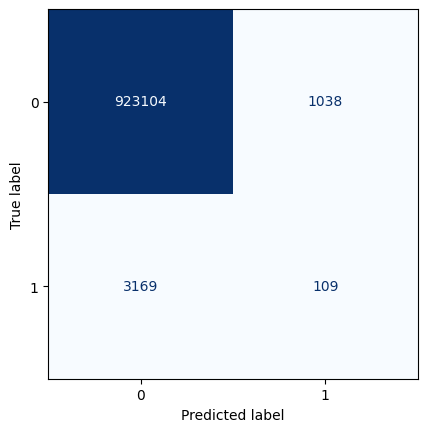

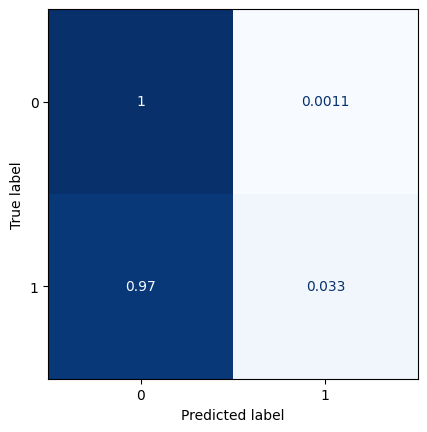

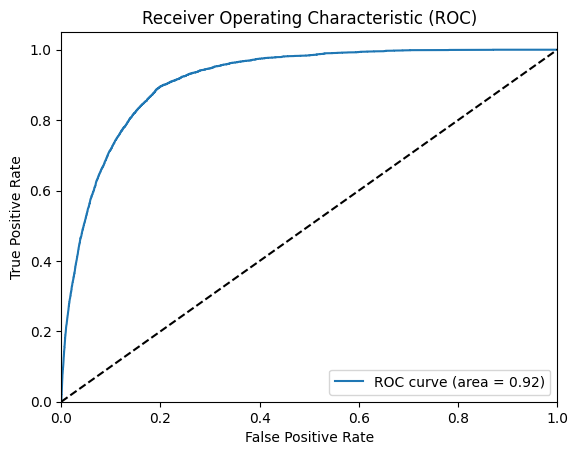

All zeros Brier score: 0.003534536671626663
Model Brier score: 0.003436477324813374
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_22 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_7 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_23 (Conv2D)          (None, 14, 30, 1)         73        
                                    

2023-05-05 10:08:22.274732: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.1002

2023-05-05 10:08:27.549770: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 15s 14ms/step - loss: 0.1002 - val_loss: 0.0219
Epoch 2/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0235 - val_loss: 0.0201
Epoch 3/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0222 - val_loss: 0.0194
Epoch 4/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0216 - val_loss: 0.0192
Epoch 5/100
354/354 [==============================] - 4s 11ms/step - loss: 0.0212 - val_loss: 0.0190
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0188
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0188
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0206 - val_loss: 0.0187
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0205 - val_loss: 0.0187
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0203 - val_loss: 0.0

2023-05-05 10:10:10.379211: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


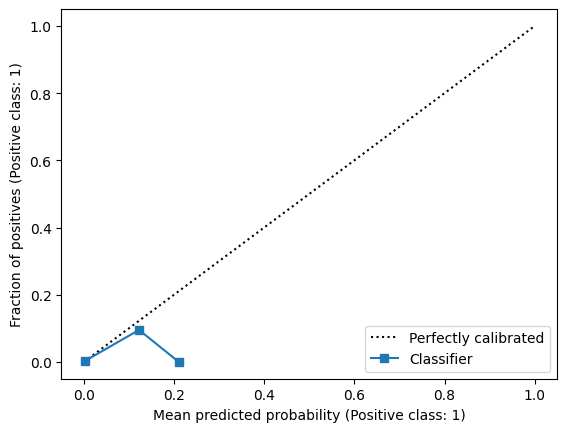

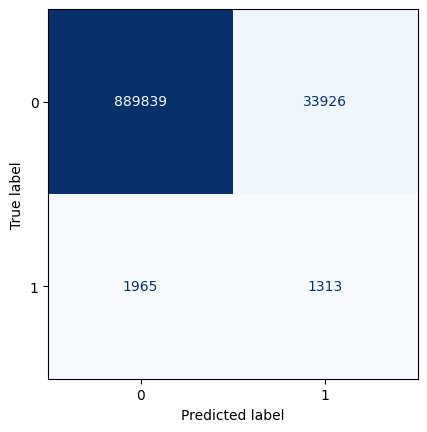

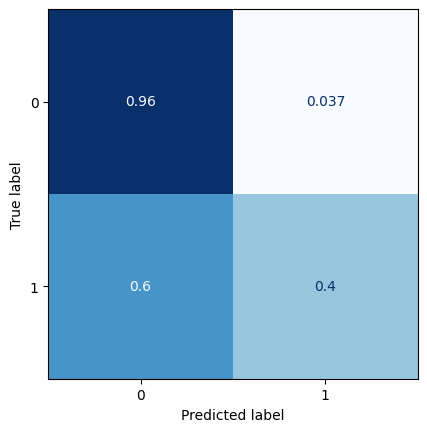

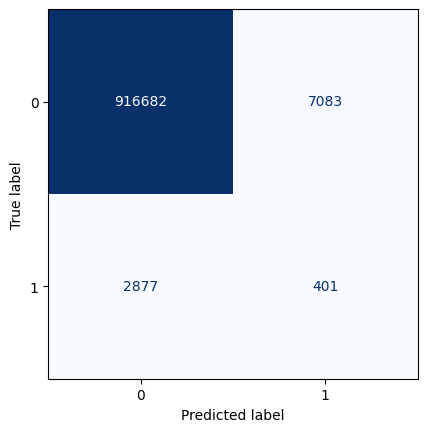

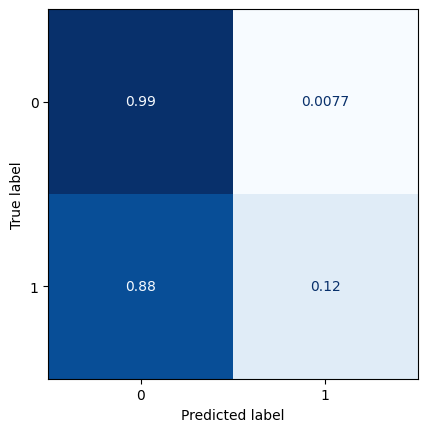

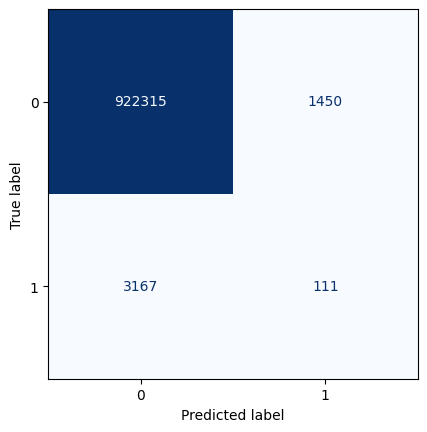

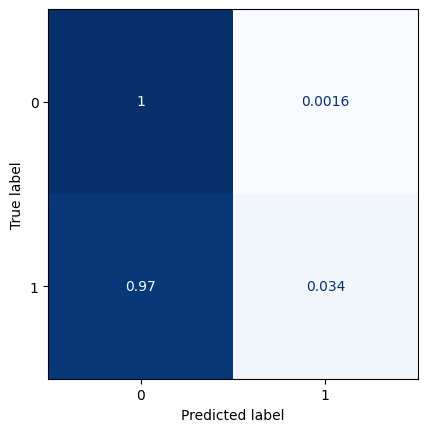

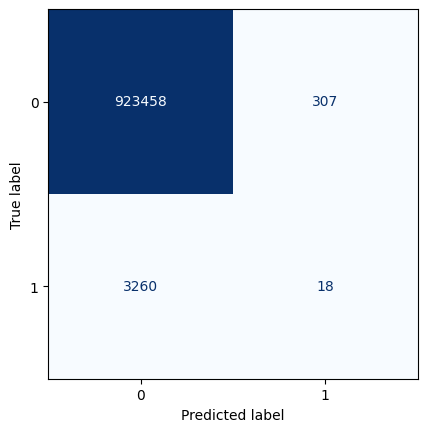

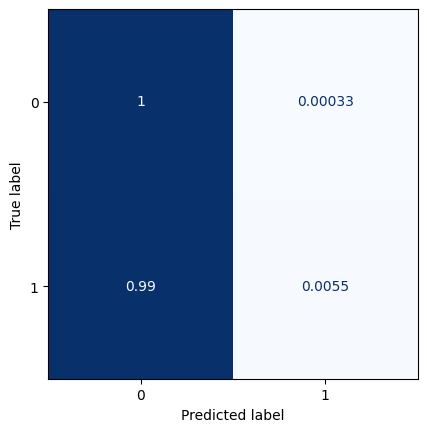

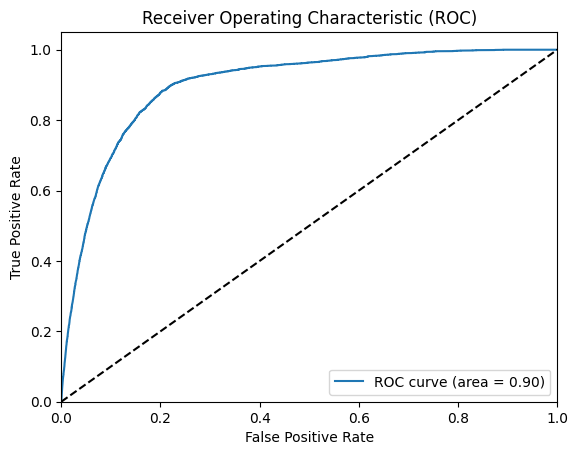

All zeros Brier score: 0.00353597405945571
Model Brier score: 0.003458134065813037
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_25 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_8 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_26 (Conv2D)          (None, 14, 30, 1)         73        
                                     

2023-05-05 10:10:35.798141: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0296

2023-05-05 10:10:39.940711: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 12ms/step - loss: 0.0296 - val_loss: 0.0199
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0219 - val_loss: 0.0200
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0192
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0208 - val_loss: 0.0193
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0191
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0205 - val_loss: 0.0194
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0204 - val_loss: 0.0190
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0203 - val_loss: 0.0189
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0203 - val_loss: 0.0193
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0202 - val_loss: 0.0188


2023-05-05 10:12:04.898537: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


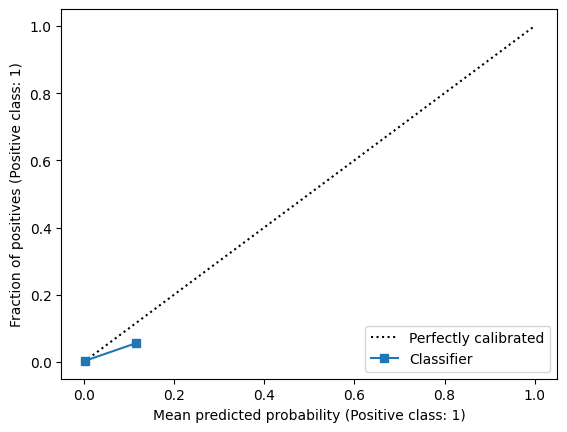

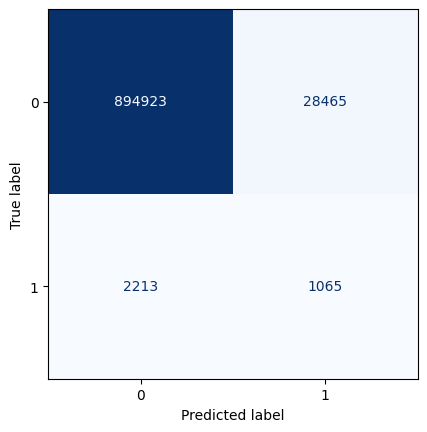

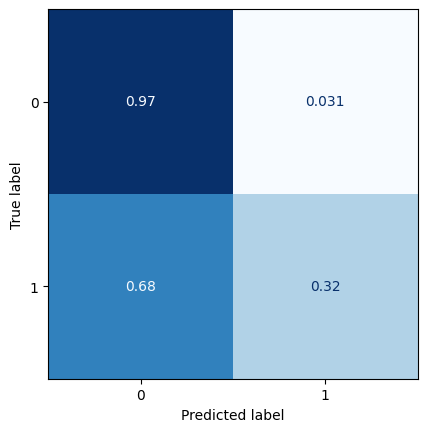

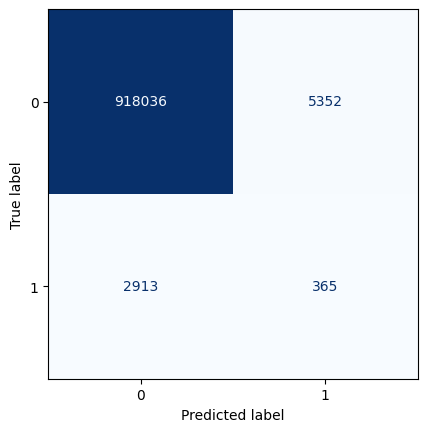

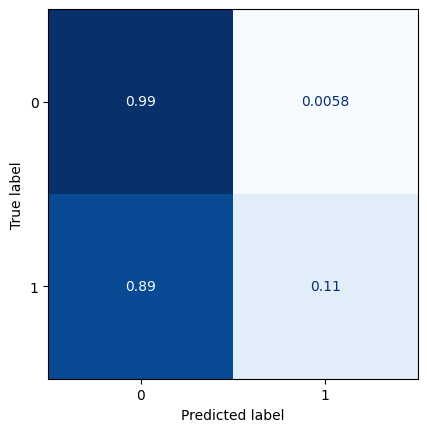

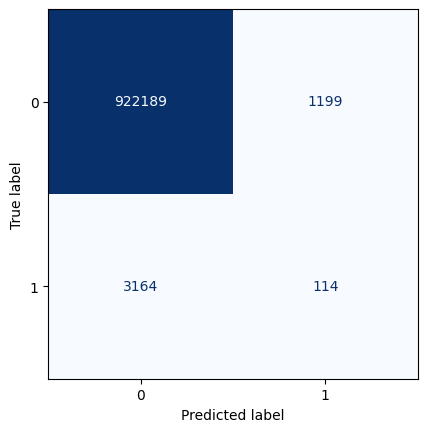

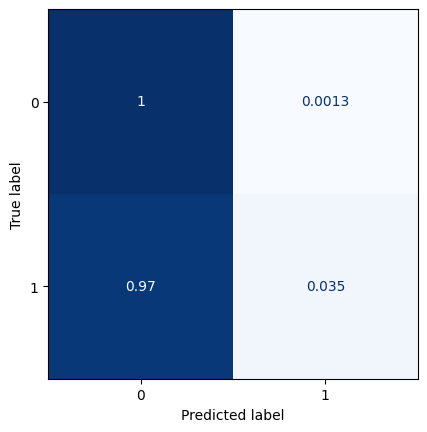

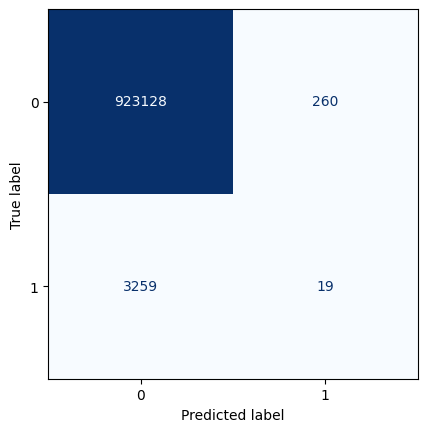

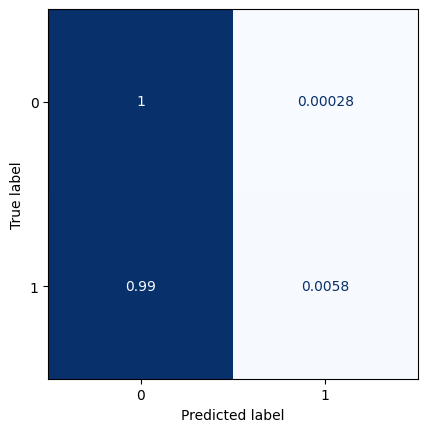

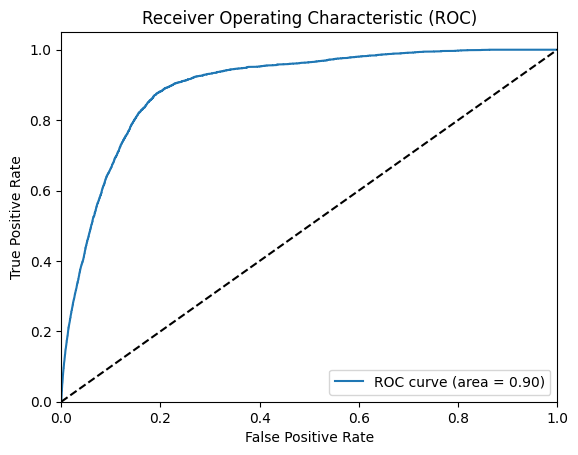

All zeros Brier score: 0.0035374126168436094
Model Brier score: 0.0034613920231035137
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_27 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_28 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_9 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_29 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-05-05 10:12:28.986807: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0447

2023-05-05 10:12:32.489013: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0447 - val_loss: 0.0205
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0222 - val_loss: 0.0196
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0190
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0192
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0189
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0207 - val_loss: 0.0190
Epoch 7/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0206 - val_loss: 0.0188
Epoch 8/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0205 - val_loss: 0.0191
Epoch 9/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0204 - val_loss: 0.0188
Epoch 10/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0204 - val_loss: 0.019

2023-05-05 10:13:59.837567: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


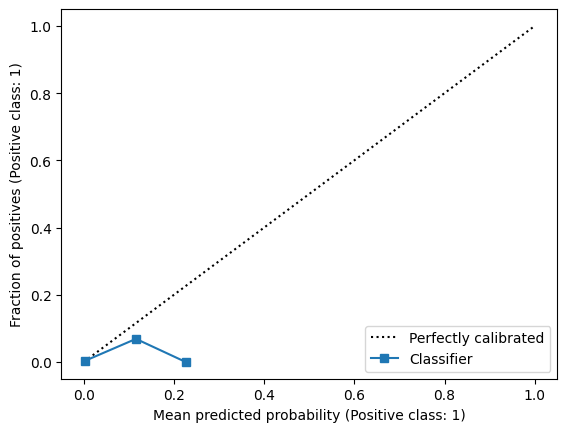

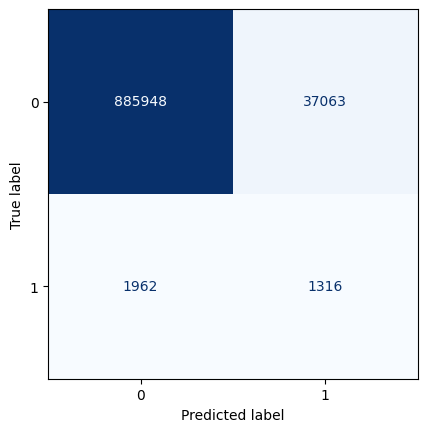

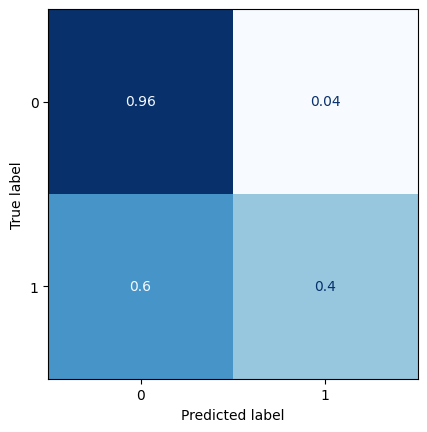

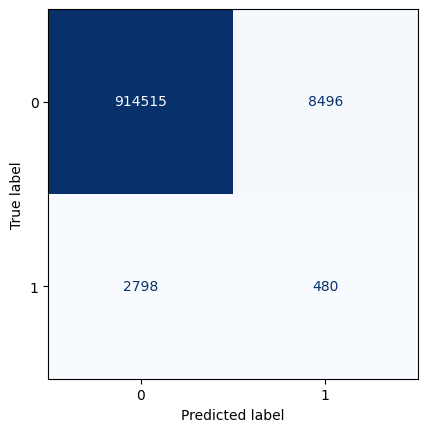

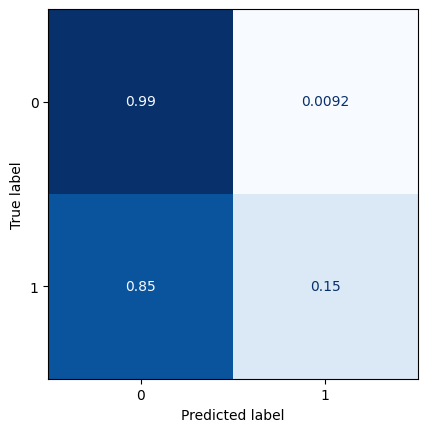

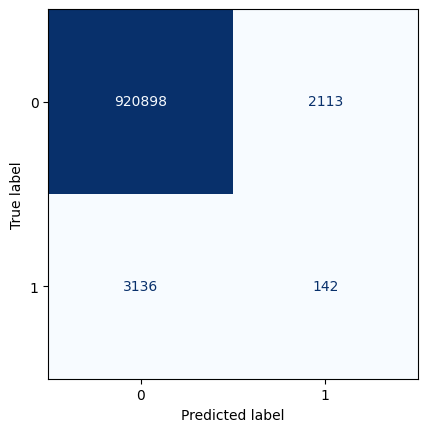

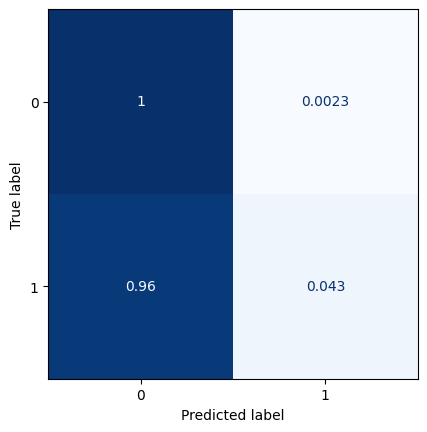

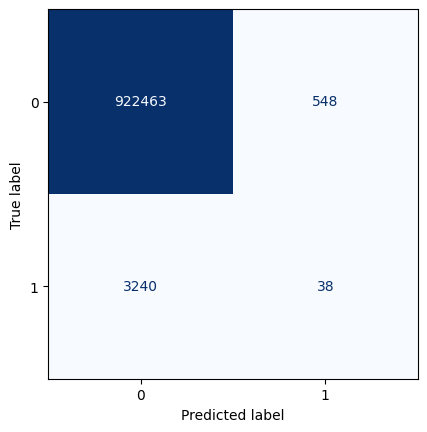

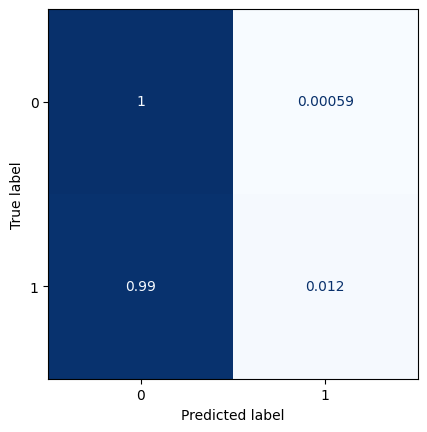

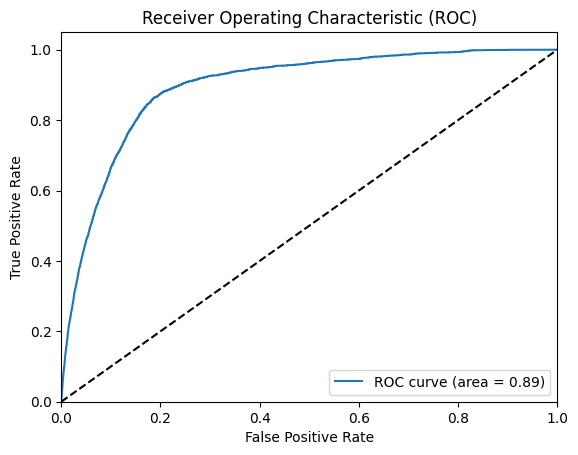

All zeros Brier score: 0.003538852345218393
Model Brier score: 0.003468523480821604
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_30 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_31 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_10 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_32 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-05-05 10:14:25.549538: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0697

2023-05-05 10:14:28.905239: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0697 - val_loss: 0.0214
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0231 - val_loss: 0.0200
Epoch 3/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0220 - val_loss: 0.0197
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0195
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0192
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0192
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0194
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0208 - val_loss: 0.0192
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0207 - val_loss: 0.0193
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0206 - val_loss: 0.0192


2023-05-05 10:16:10.151062: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 4ms/step


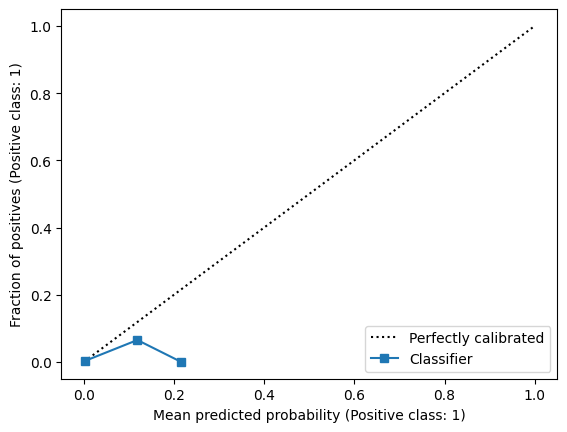

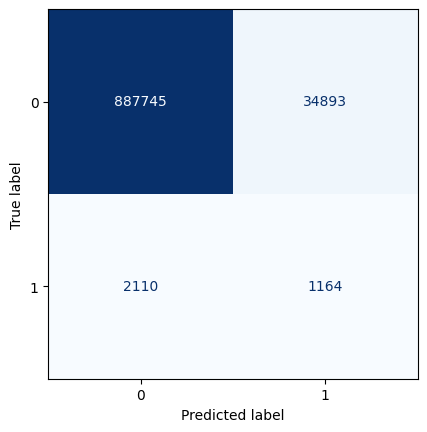

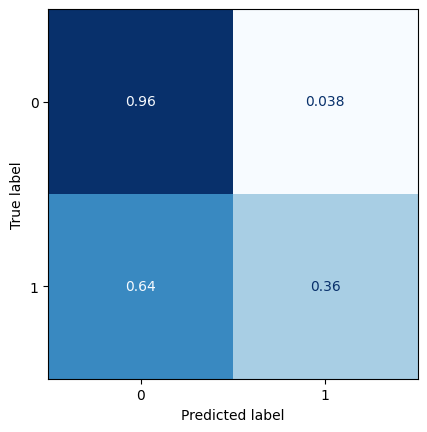

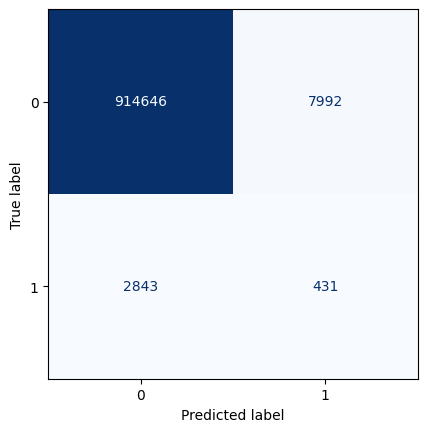

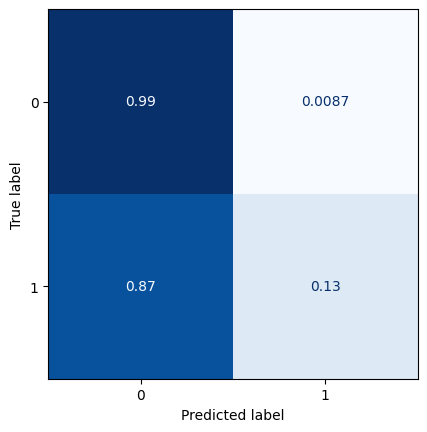

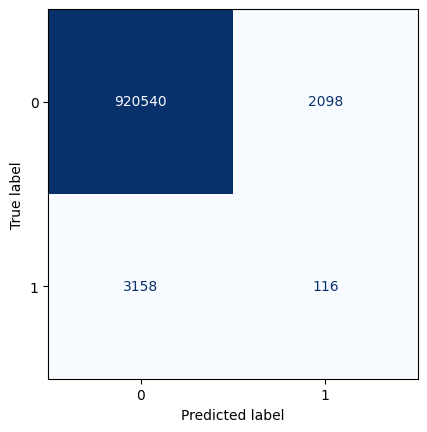

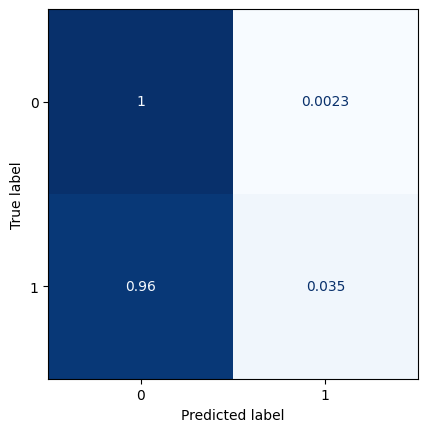

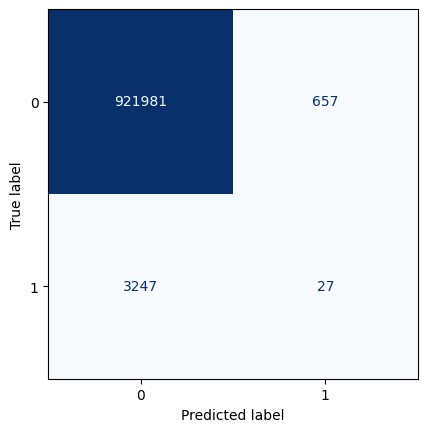

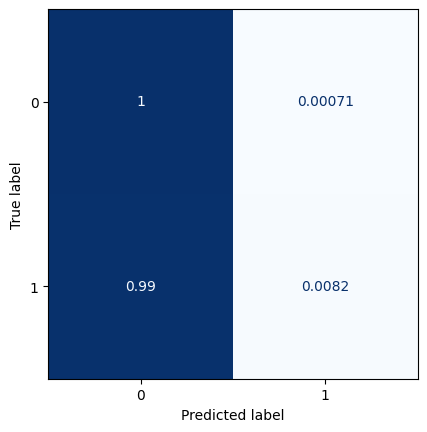

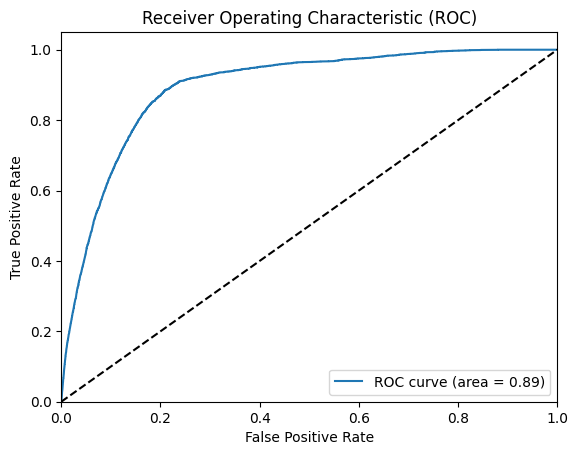

All zeros Brier score: 0.0035359731810366427
Model Brier score: 0.0034778045648209393
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_33 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_34 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_11 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_35 (Conv2D)          (None, 14, 30, 1)         73        
                                 

2023-05-05 10:16:37.894442: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0829

2023-05-05 10:16:41.202585: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0829 - val_loss: 0.0213
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0229 - val_loss: 0.0202
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0219 - val_loss: 0.0196
Epoch 4/100
354/354 [==============================] - 4s 12ms/step - loss: 0.0214 - val_loss: 0.0196
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0195
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0210 - val_loss: 0.0192
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0209 - val_loss: 0.0191
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0208 - val_loss: 0.0193
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0207 - val_loss: 0.0191
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0206 - val_loss: 0.0192

2023-05-05 10:18:27.695117: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 4ms/step


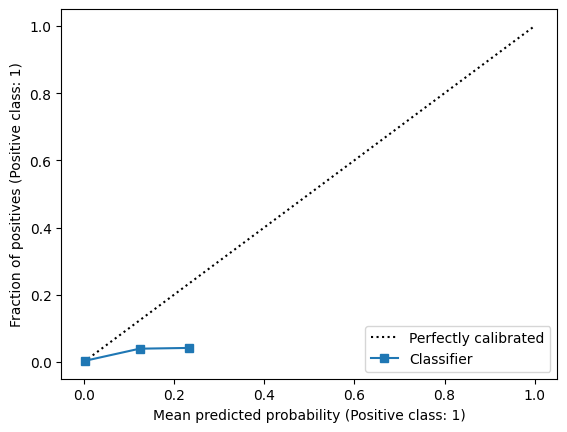

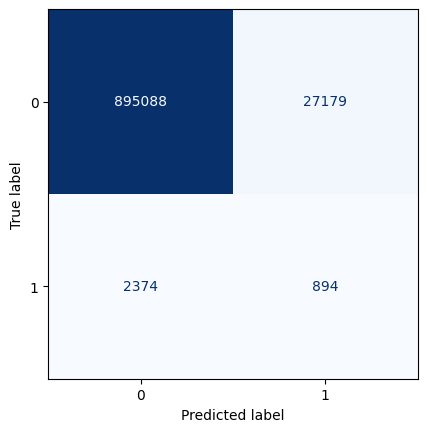

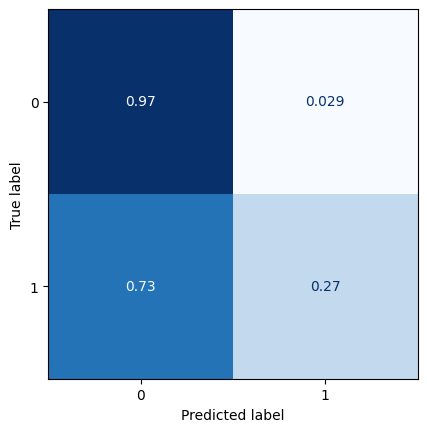

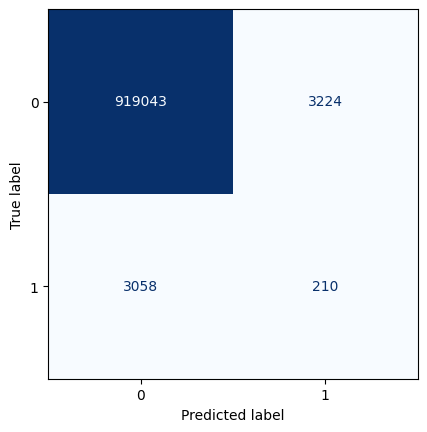

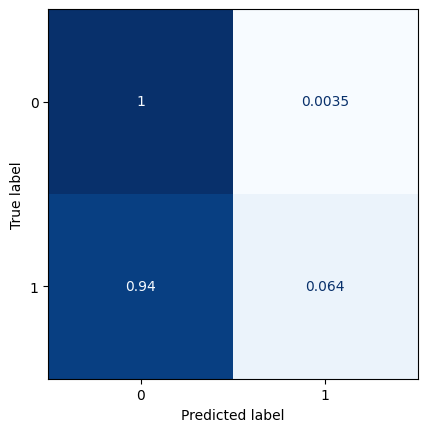

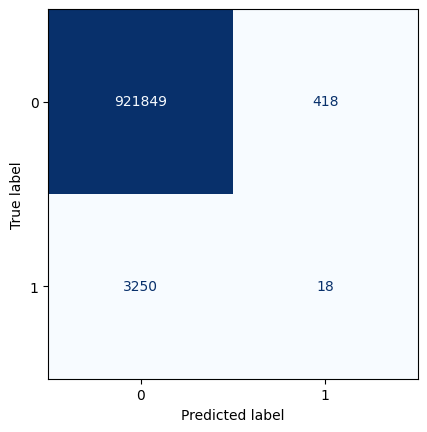

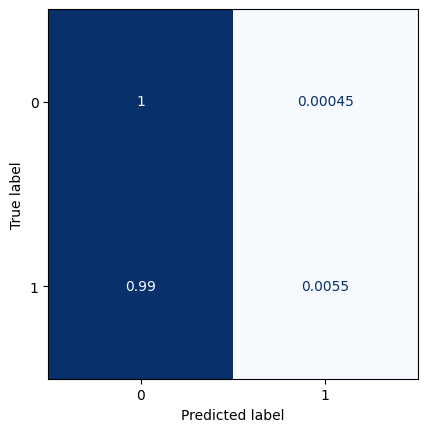

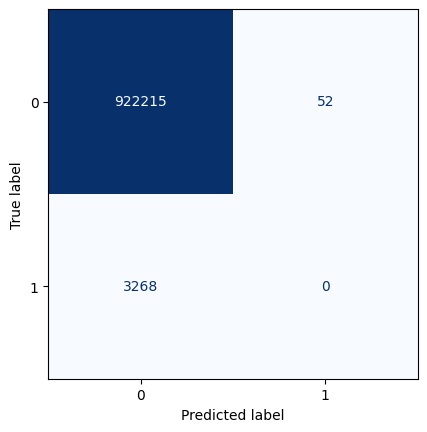

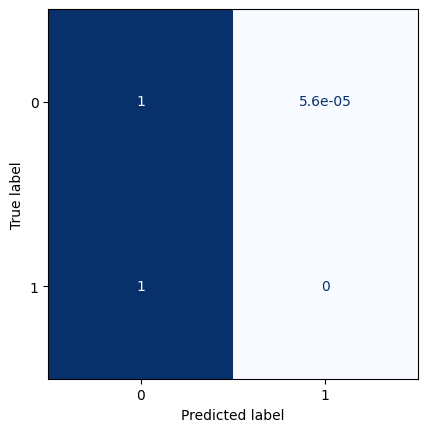

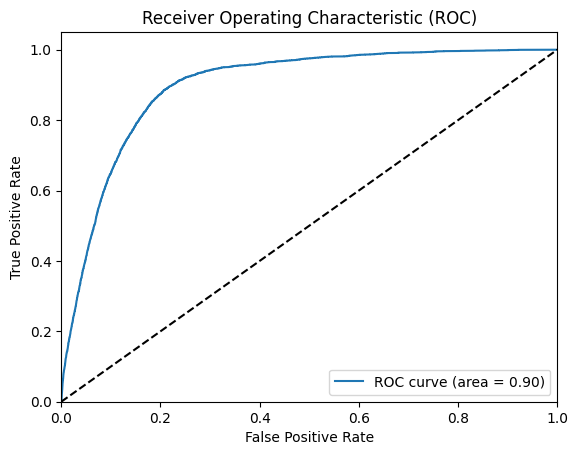

All zeros Brier score: 0.0035309307589664355
Model Brier score: 0.003466250694161454
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_37 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_12 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_38 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-05-05 10:19:04.211523: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0347

2023-05-05 10:19:08.458403: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 12ms/step - loss: 0.0347 - val_loss: 0.0199
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0219 - val_loss: 0.0198
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0199
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0194
Epoch 5/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0209 - val_loss: 0.0196
Epoch 6/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0207 - val_loss: 0.0194
Epoch 7/100
354/354 [==============================] - 4s 12ms/step - loss: 0.0206 - val_loss: 0.0195
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0205 - val_loss: 0.0193
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0205 - val_loss: 0.0192
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0204 - val_loss: 0.019

2023-05-05 10:20:48.901353: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 4ms/step


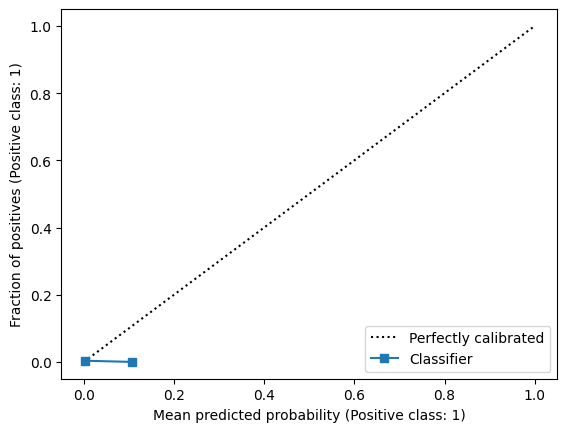

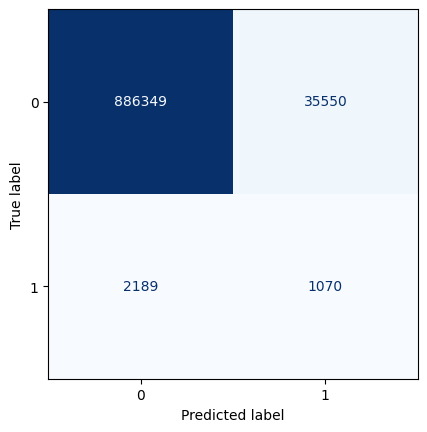

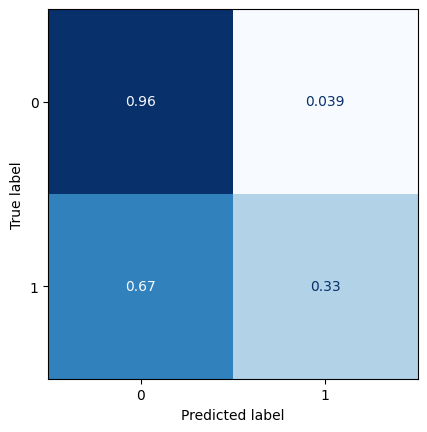

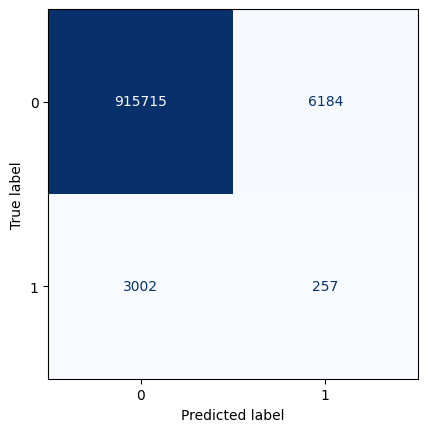

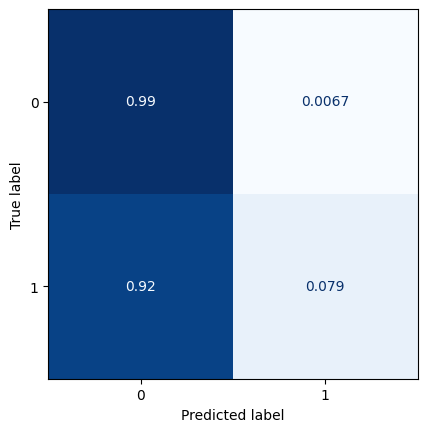

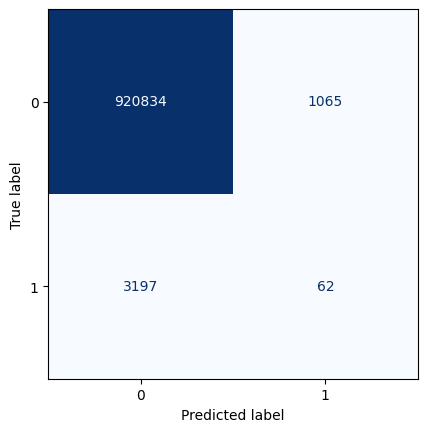

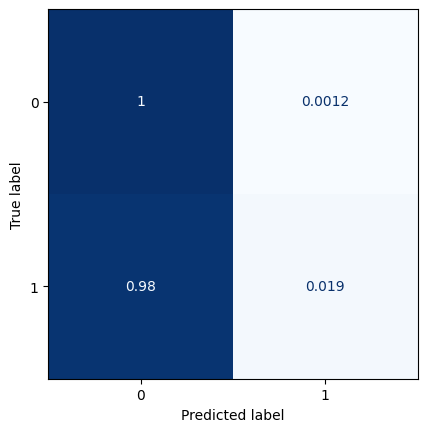

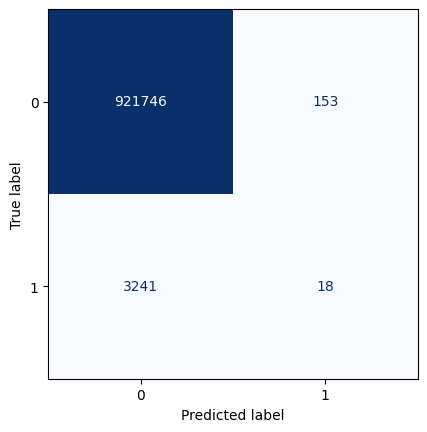

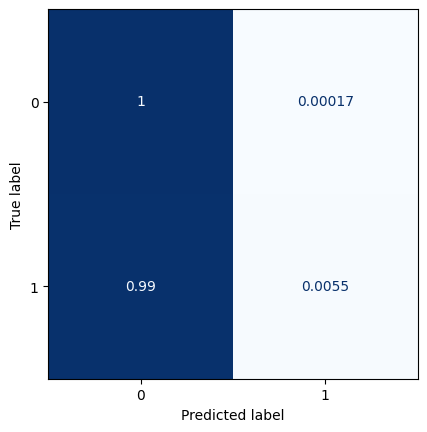

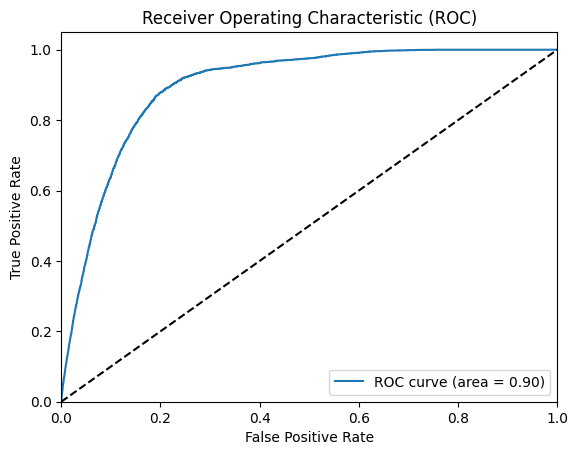

All zeros Brier score: 0.003522641537985944
Model Brier score: 0.0034657694203248483
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_39 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_40 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_13 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_41 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-05-05 10:21:19.004532: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0643

2023-05-05 10:21:23.698635: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 12ms/step - loss: 0.0643 - val_loss: 0.0228
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0237 - val_loss: 0.0210
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0224 - val_loss: 0.0205
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0219 - val_loss: 0.0200
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0215 - val_loss: 0.0198
Epoch 6/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0212 - val_loss: 0.0195
Epoch 7/100
354/354 [==============================] - 9s 26ms/step - loss: 0.0210 - val_loss: 0.0195
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0193
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0207 - val_loss: 0.0195
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0206 - val_loss: 0.019

2023-05-05 10:23:32.841375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 4ms/step


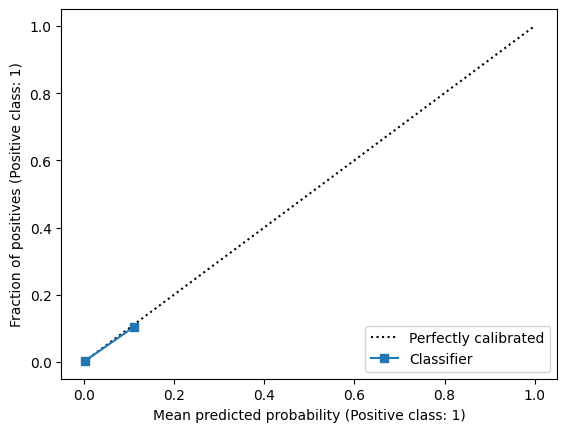

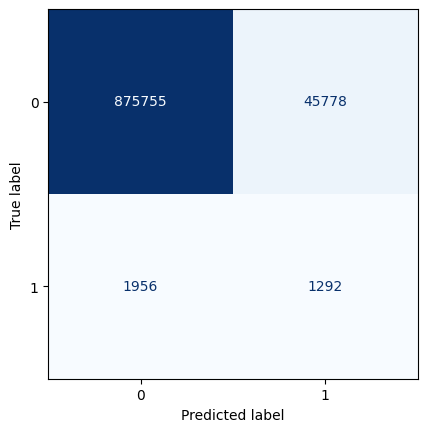

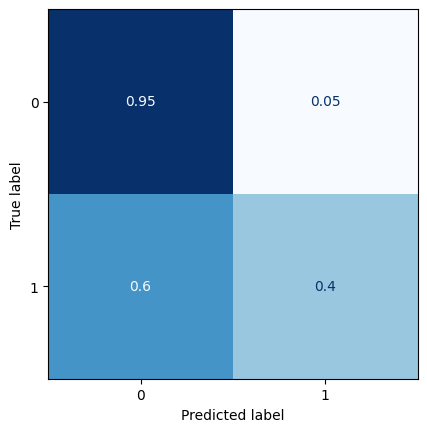

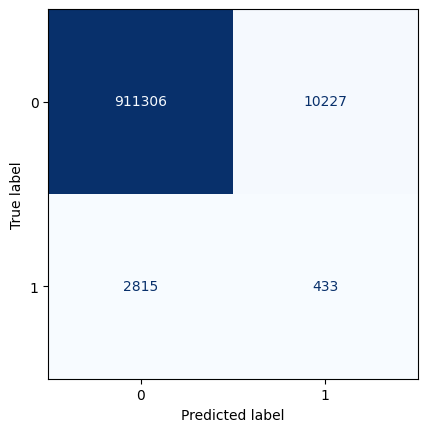

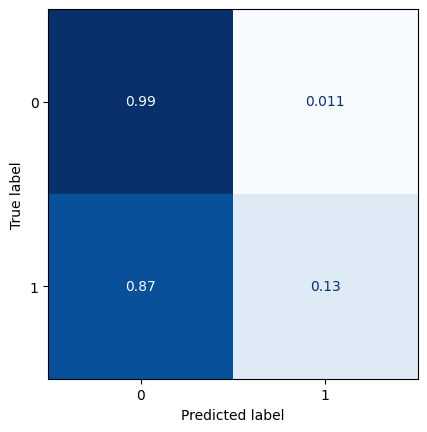

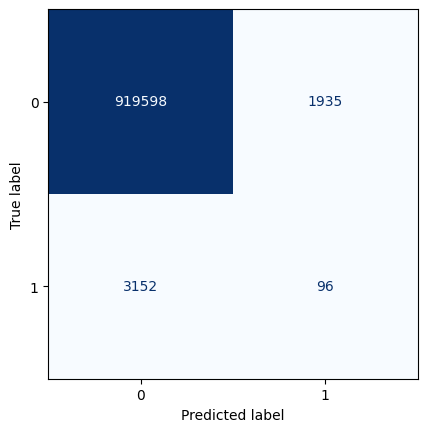

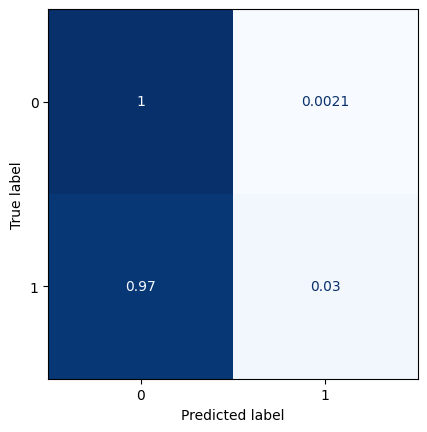

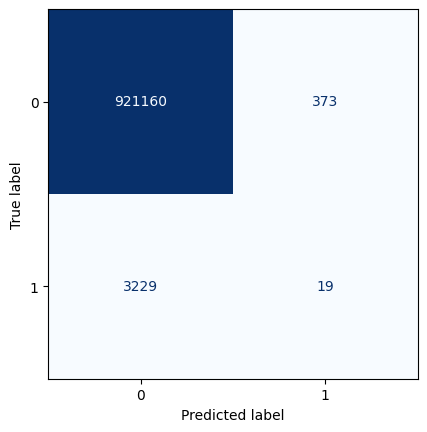

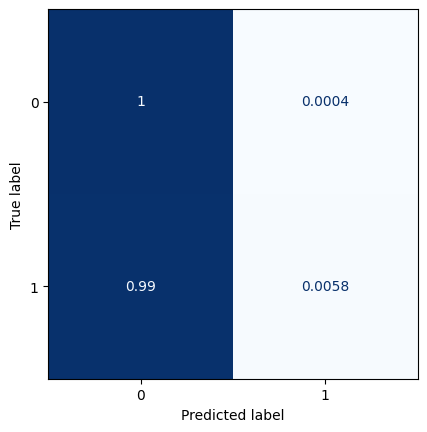

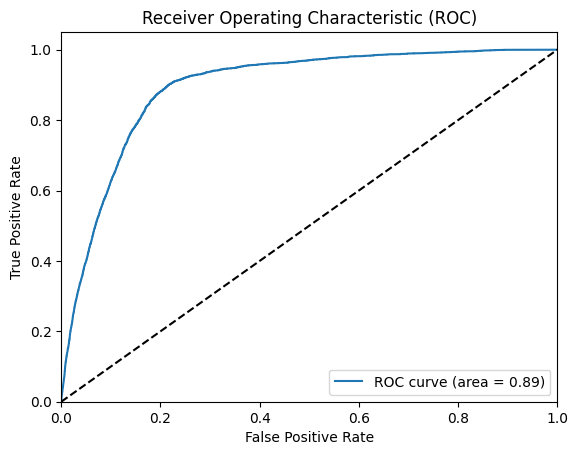

All zeros Brier score: 0.0035121828843801936
Model Brier score: 0.003463108259882786


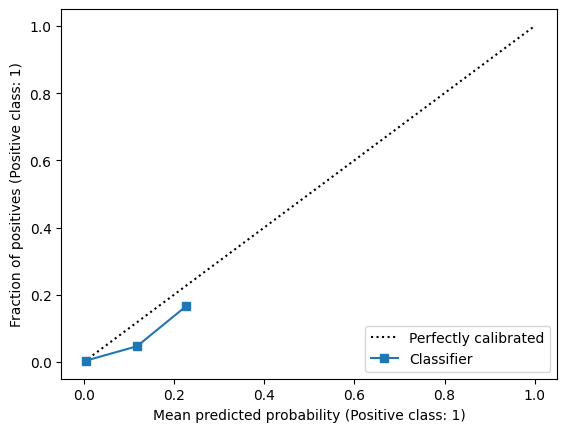

In [45]:
for lag in [1,2,3,4,5,6,7,8,9,10,11,12,13]:
    ### Model summary
    model = Sequential()
    model.add(layers.Input(shape=(13, 29, 10)))
    
    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2), padding='same'))
    
    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.UpSampling2D((2,2)))
    
    model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities
    
    model.add(layers.Cropping2D(cropping=((0,1),(0,1))))
    
    model.summary()
    
    model.compile(loss='binary_crossentropy', optimizer='adam')
    
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
            verbose=1, mode='auto', restore_best_weights=True)
    
    ### Model training
    model.fit(train_img_std[:-lag], y_train_img[lag:], validation_data=(val_img_std[:-lag],y_val_img[lag:]),
        callbacks=[monitor],epochs=100)
    
    ### Confusion matrices
    t = model.predict(test_img_std[:-lag])

    ranges = [0.025,0.05,0.075,0.1]
    
    for j in ranges:
        classes = []
        for i in t.reshape(-1,1):
            if i<=j: classes.append(0)
            else: classes.append(1)
    
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag:].reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag:].reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)
    
    ### ROC
    plot_roc(t.reshape(-1,1),y_test_img[lag:].reshape(-1,1))
    
    z = np.zeros((lag,13,29,1))
    tt = np.concatenate((t,z))
    test['predictions_lag'+str(lag)] = tt.reshape(-1,1)
    test.to_csv("test_with_newTarget_predictions_clim.csv")
    
    ### calibration
    display = CalibrationDisplay.from_predictions(y_test_img[lag:].reshape(-1,1), t.reshape(-1,1), n_bins=10)
    print(f'All zeros Brier score: {brier_score_loss(y_test_img[lag:].reshape(-1,1), np.zeros(len(y_test_img[lag:].reshape(-1,1))))}')
    print(f'Model Brier score: {brier_score_loss(y_test_img[lag:].reshape(-1,1), t.reshape(-1,1))}')
    

In [46]:
test

,Unnamed: 0,time,latitude,longitude,vo,r,u_200,u_850,v_200,v_850,ttr,sst,new_target,Real_tom_target,shear,clim,target,predictions_lag0,predictions_lag1,predictions_lag2,predictions_lag3,predictions_lag4,predictions_lag5,predictions_lag6,predictions_lag7,predictions_lag8,predictions_lag9,predictions_lag10,predictions_lag11,predictions_lag12,predictions_lag13
34307,34307,2016-04-01,0.0,20.0,0.238973,1.386669,-0.945404,1.574206,0.511504,0.367981,2.652010,-1.588255,0.0,0.0,-0.516292,-0.438312,0,9.030284e-07,0.000032,1.476967e-06,1.395222e-05,0.000016,3.608524e-06,6.815952e-06,0.000029,6.608486e-05,0.000016,0.000344,0.000019,5.323469e-05,0.000047
34308,34308,2016-04-01,0.0,22.5,-0.172396,1.196522,-0.819827,1.371793,0.717349,0.332262,3.396515,-1.588255,0.0,0.0,-0.755886,-0.438312,0,3.681470e-08,0.000003,1.218675e-07,3.524715e-07,0.000003,9.216630e-08,3.393082e-07,0.000003,6.748290e-07,0.000005,0.000007,0.000003,6.209862e-07,0.000001
34309,34309,2016-04-01,0.0,25.0,1.188889,1.166772,-0.571398,1.173488,0.662464,0.144802,4.092788,-1.588255,0.0,0.0,-1.161314,-0.438312,0,4.366654e-08,0.000002,2.096532e-07,2.995883e-07,0.000002,1.348687e-07,1.336653e-07,0.000008,5.250643e-07,0.000004,0.000004,0.000019,4.122779e-07,0.000001
34310,34310,2016-04-01,0.0,27.5,-0.649707,1.063899,-0.385753,0.812011,0.713230,0.584284,4.044557,-1.588255,0.0,0.0,-1.507685,-0.438312,0,9.793929e-08,0.000004,4.188985e-07,3.351760e-07,0.000003,3.925259e-07,1.622190e-07,0.000016,8.525615e-07,0.000006,0.000003,0.000012,2.874787e-07,0.000002
34311,34311,2016-04-01,0.0,30.0,-0.629183,1.432846,-0.362931,0.809212,0.888739,-0.207576,3.438931,-1.588255,0.0,0.0,-1.154385,-0.438312,0,3.022078e-07,0.000009,6.146771e-07,2.533091e-07,0.000003,6.627425e-07,1.770930e-07,0.000015,1.174587e-06,0.000006,0.000005,0.000018,2.810223e-07,0.000003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
963984,137600,2022-12-31,-30.0,80.0,0.677806,-1.271307,0.290892,-0.727302,0.813190,-0.684904,-0.431475,0.601392,0.0,0.0,0.050674,-0.049229,0,8.946999e-04,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000
963985,137601,2022-12-31,-30.0,82.5,0.898493,-1.325164,0.224460,-0.764678,1.178495,-0.105389,-0.107881,0.599524,0.0,0.0,0.004080,-0.152462,0,7.258985e-04,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000
963986,137602,2022-12-31,-30.0,85.0,1.629797,-1.468220,0.376651,-0.566606,1.728863,0.450626,-0.082227,0.597113,0.0,0.0,0.220205,0.419240,0,1.439215e-03,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000
963987,137603,2022-12-31,-30.0,87.5,0.280770,-1.453315,0.621629,-0.446284,2.368318,0.792994,-0.000815,0.594579,0.0,0.0,0.648118,0.133389,0,2.246024e-04,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000


# only climatology

In [59]:
### 
model = Sequential()
model.add(layers.Input(shape=(13, 29, 1)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()


model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
        verbose=1, mode='auto', restore_best_weights=True)


Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_45 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_46 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_15 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_47 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 cropping2d_15 (Cropping2D)  (None, 13, 29, 1)       

In [60]:
model.fit(train_img_std[:,:,:,[9]], y_train_img, validation_data=(val_img_std[:,:,:,[9]],y_val_img),
        callbacks=[monitor],epochs=100)

Epoch 1/100


2023-05-05 11:47:24.738335: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0854

2023-05-05 11:47:27.978004: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0854 - val_loss: 0.0214
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0231 - val_loss: 0.0207
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0227 - val_loss: 0.0205
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0225 - val_loss: 0.0203
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0223 - val_loss: 0.0202
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0221 - val_loss: 0.0201
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0219 - val_loss: 0.0199
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0217 - val_loss: 0.0200
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0216 - val_loss: 0.0200
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0215 - val_loss: 0.0196
E

 3/78 [>.............................] - ETA: 1s 

2023-05-05 11:49:42.227027: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


78/78 [==============================] - 1s 5ms/step


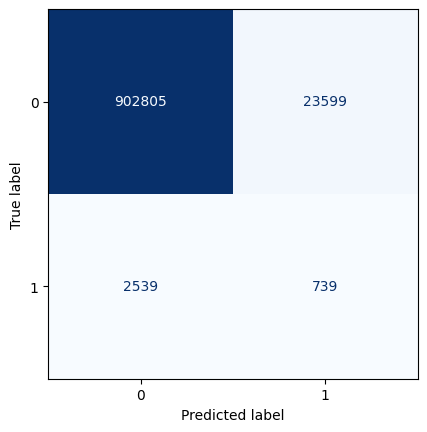

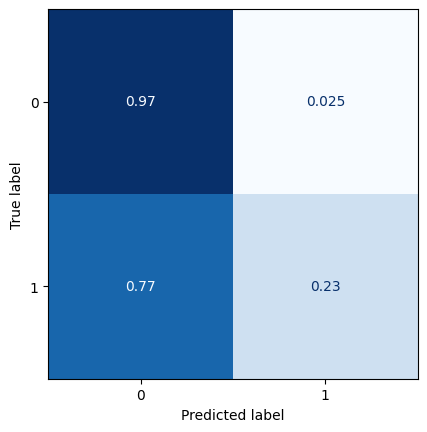

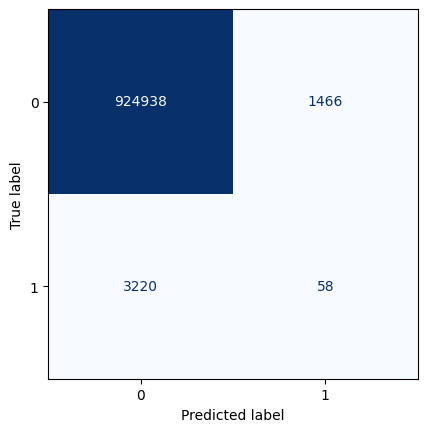

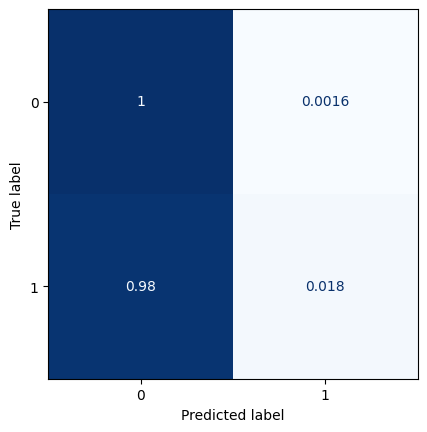

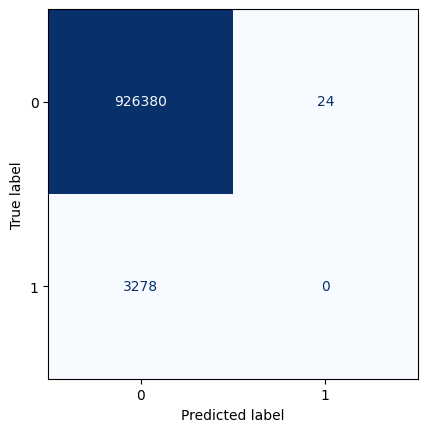

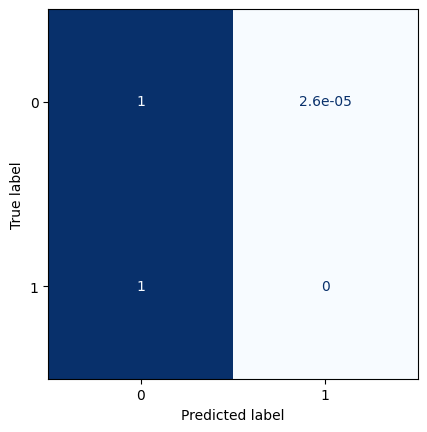

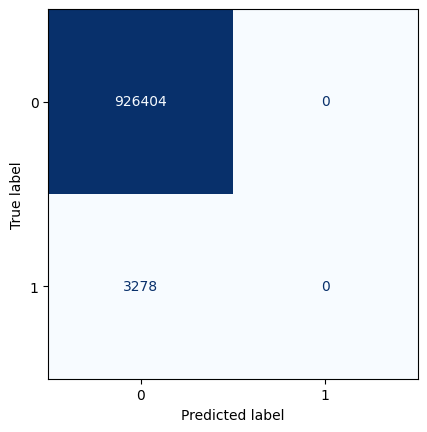

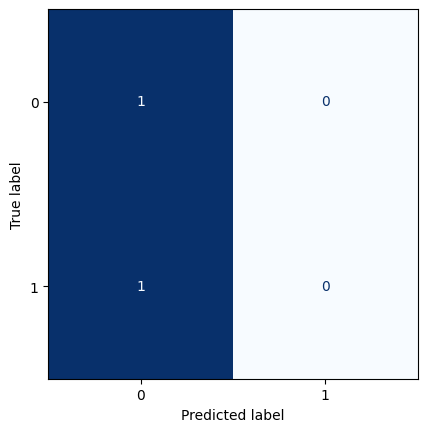

In [61]:
t = model.predict(test_img_std[:,:,:,[9]])

ranges = [0.025,0.05,0.075,0.1]

for j in ranges:
    classes = []
    for i in t.reshape(-1,1):
        if i<=j: classes.append(0)
        else: classes.append(1)

# confusion matrix with threshold on 0.1, otherwise always 0 
    ConfusionMatrixDisplay(confusion_matrix(y_test_img.reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
    ConfusionMatrixDisplay(confusion_matrix(y_test_img.reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)
    

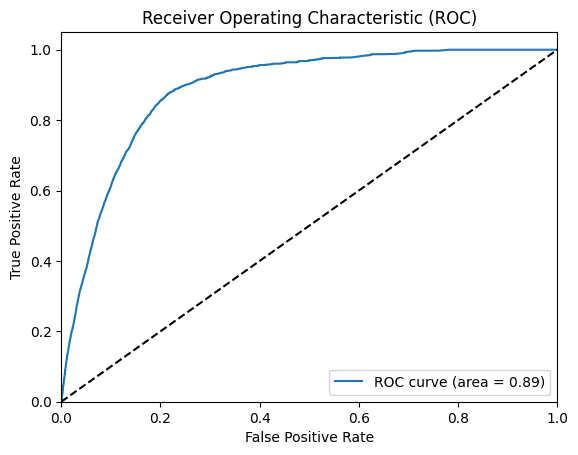

In [62]:
plot_roc(t.reshape(-1,1),y_test_img.reshape(-1,1))

9


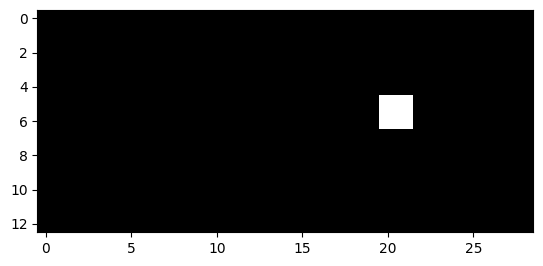

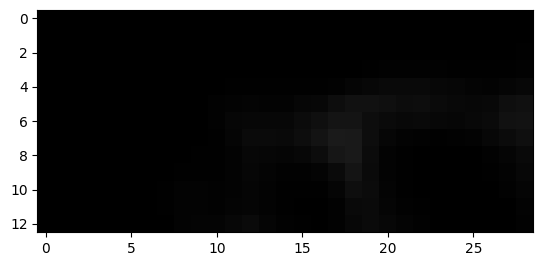

10


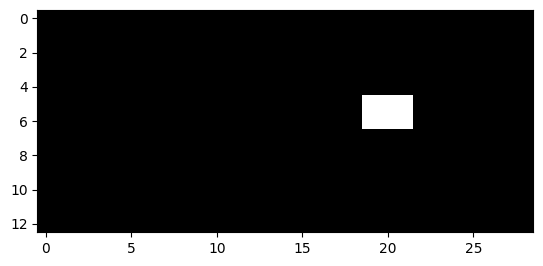

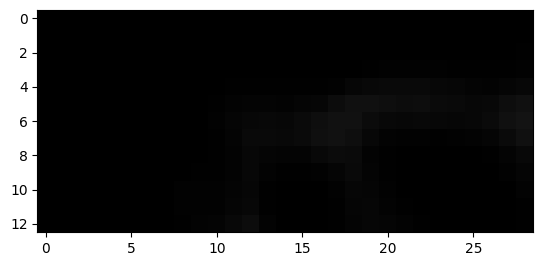

11


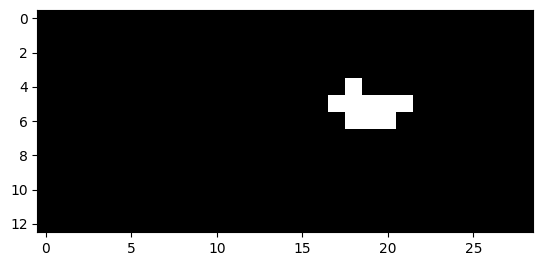

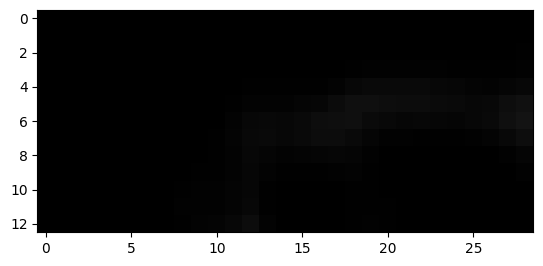

12


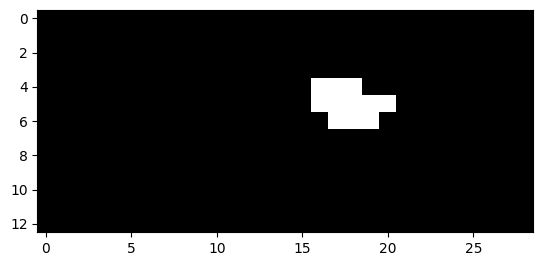

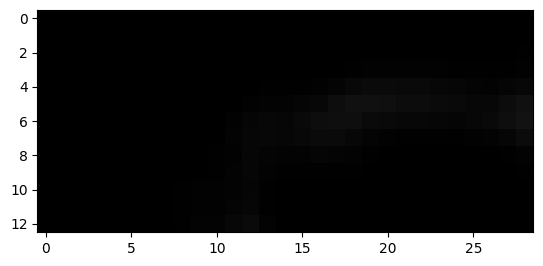

13


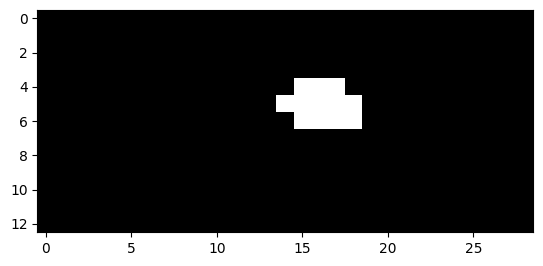

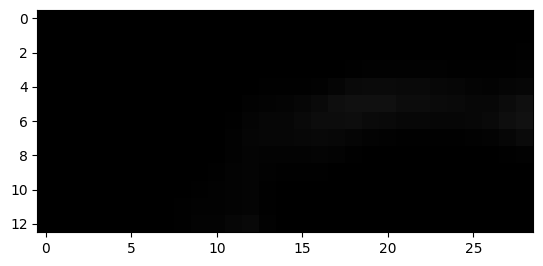

14


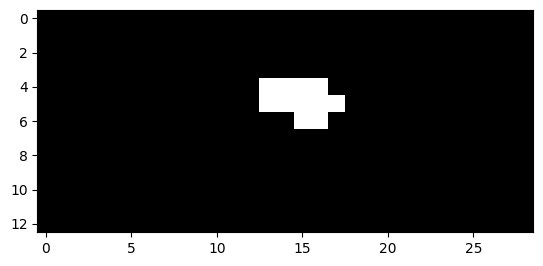

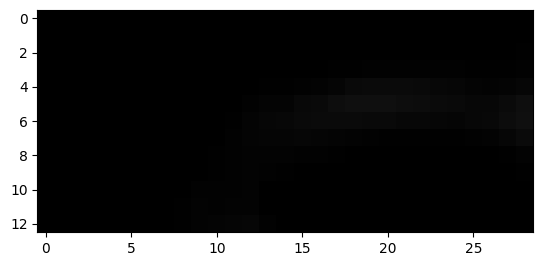

15


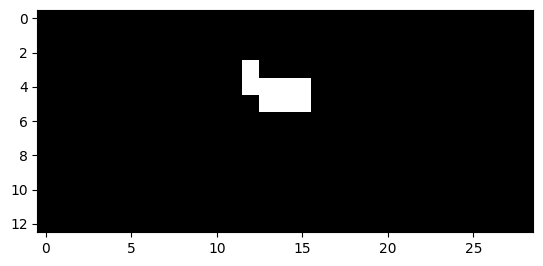

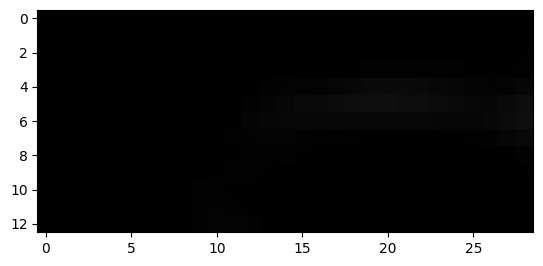

16


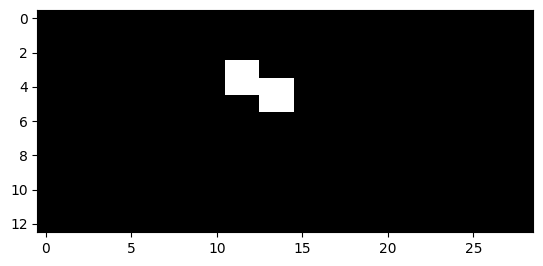

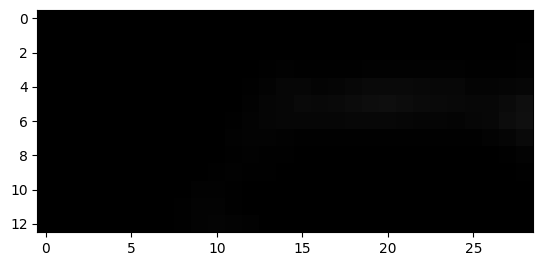

17


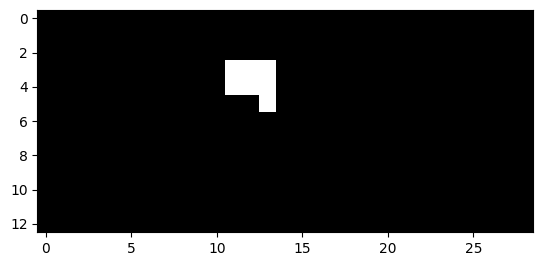

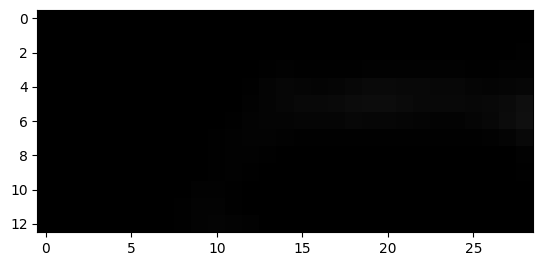

18


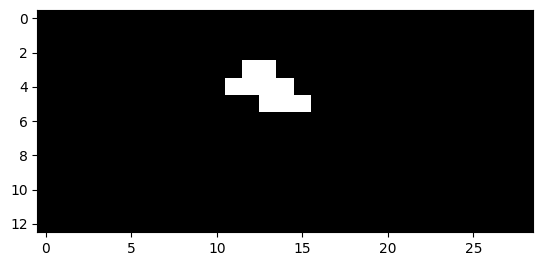

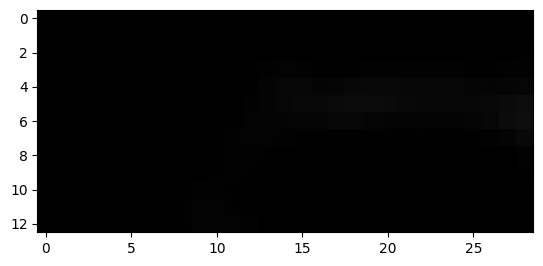

19


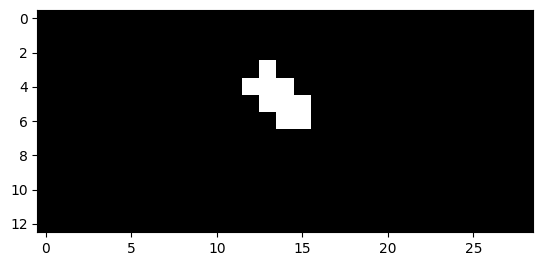

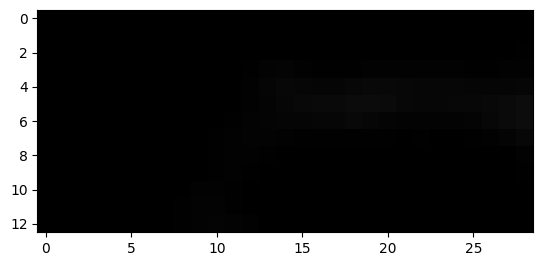

20


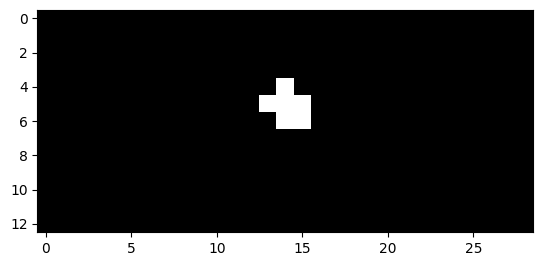

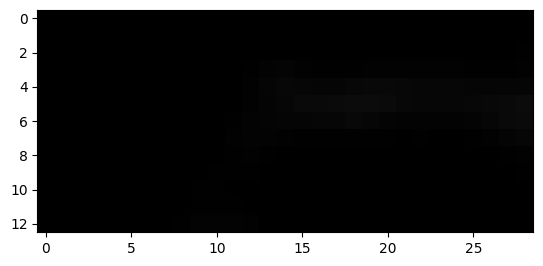

21


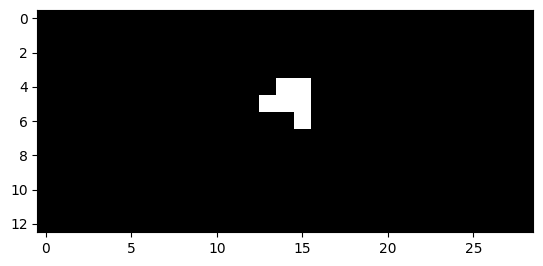

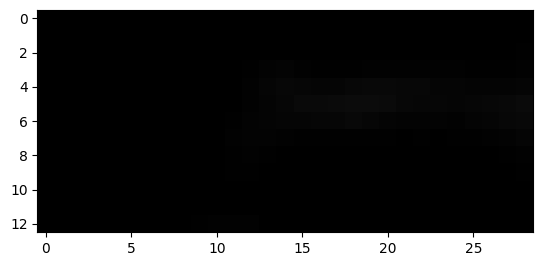

22


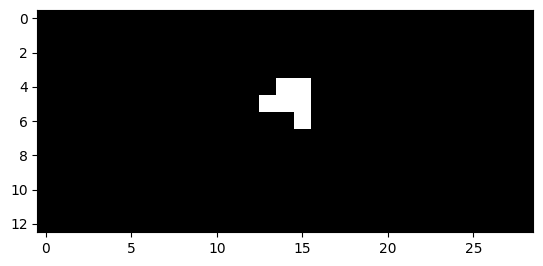

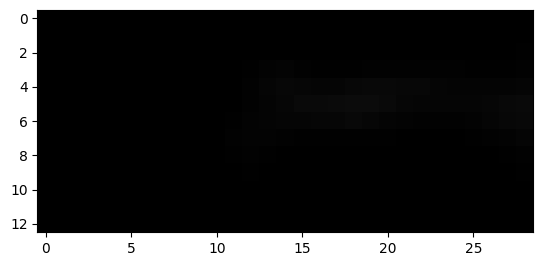

105


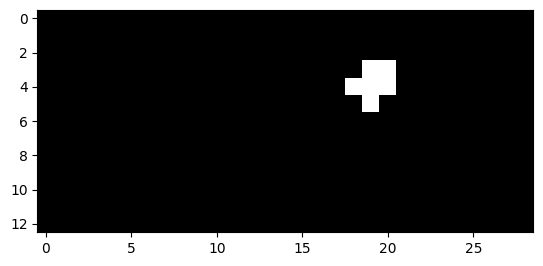

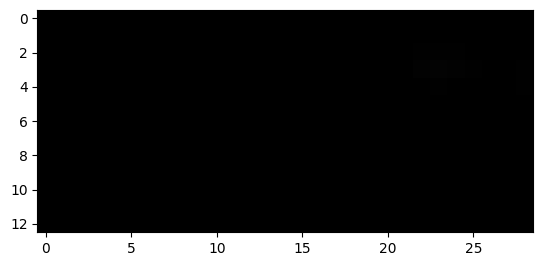

106


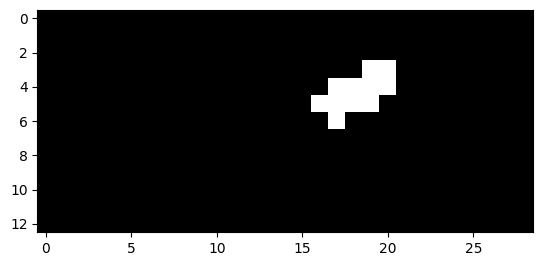

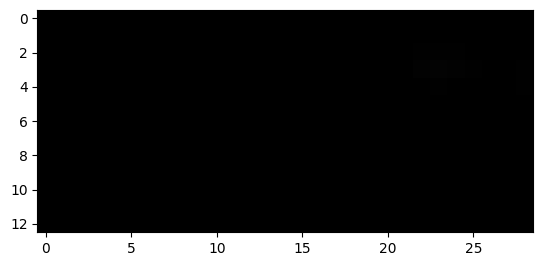

107


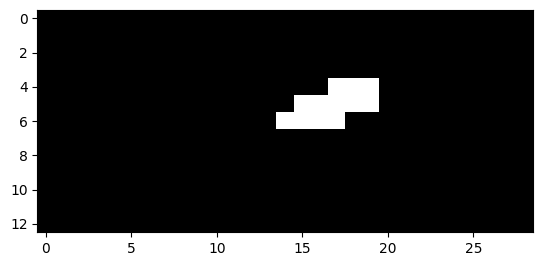

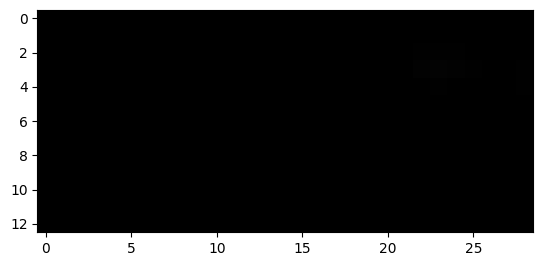

108


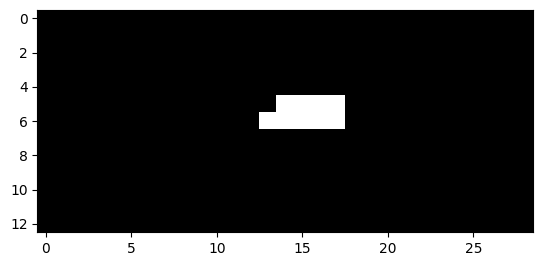

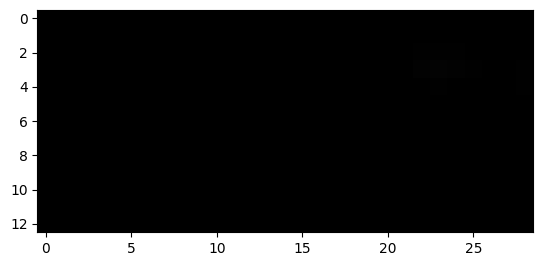

109


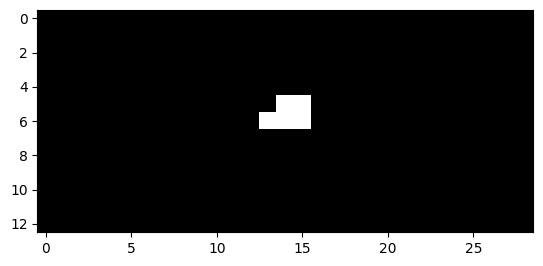

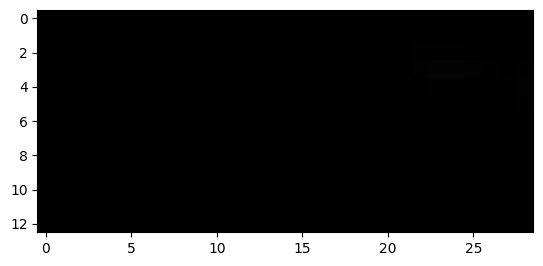

184


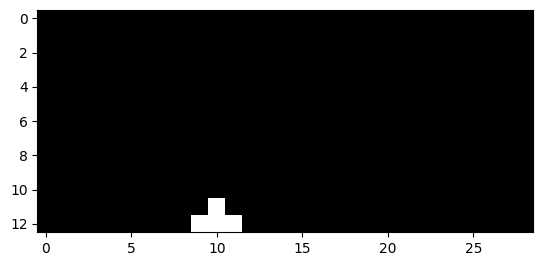

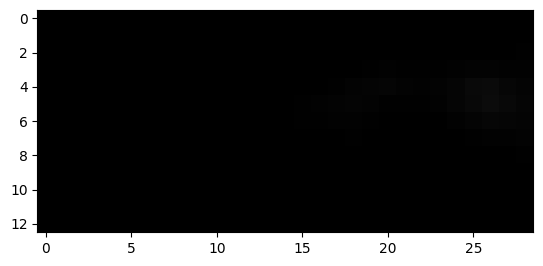

185


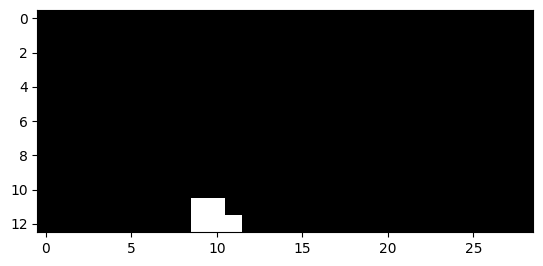

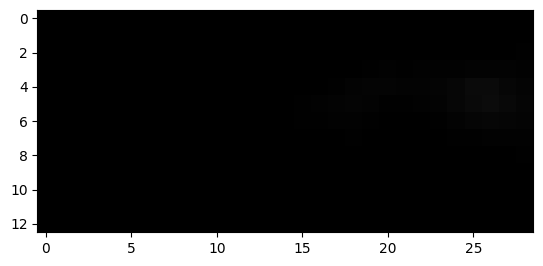

186


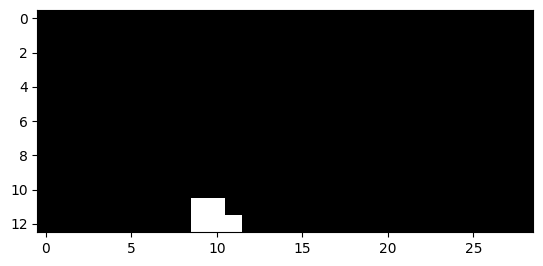

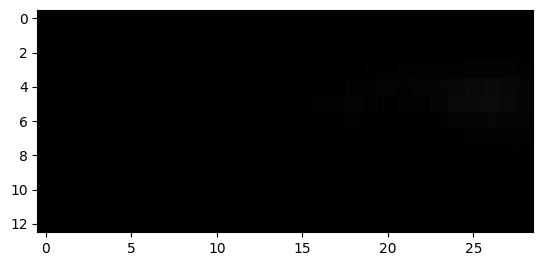

187


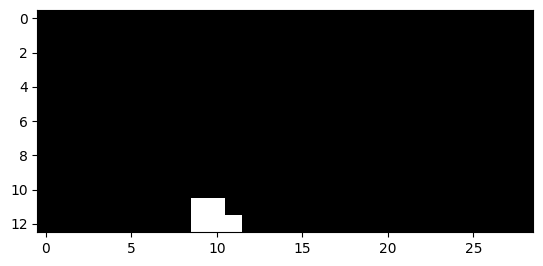

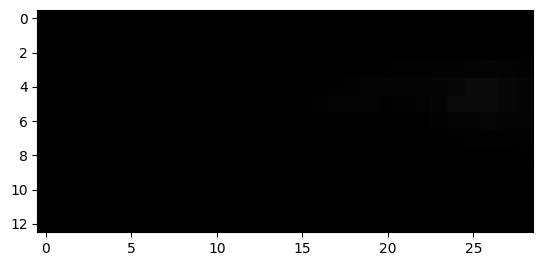

188


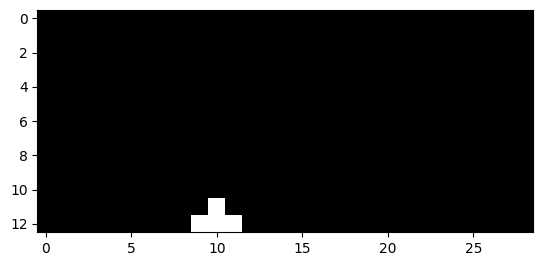

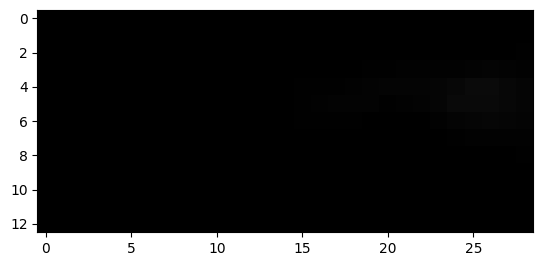

308


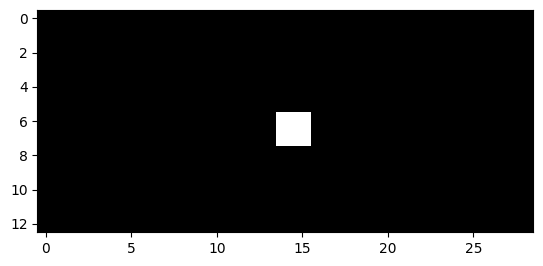

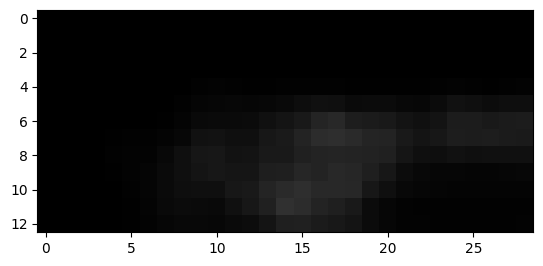

309


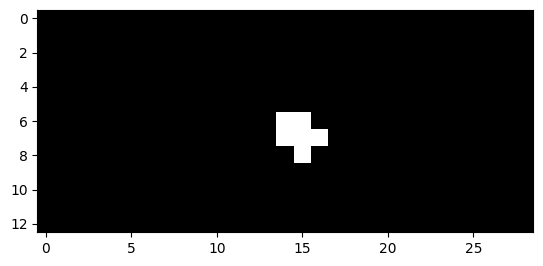

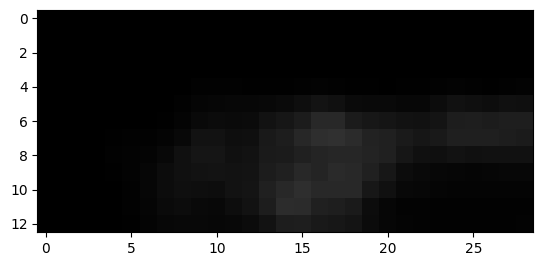

310


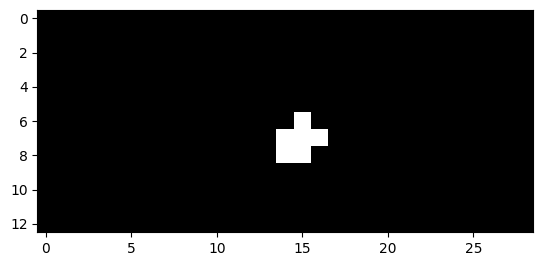

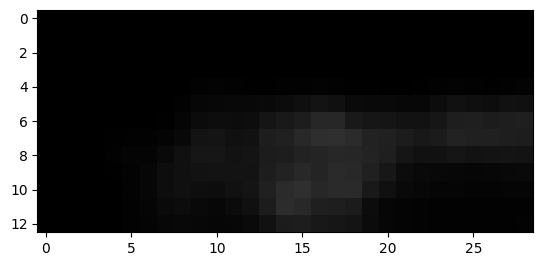

311


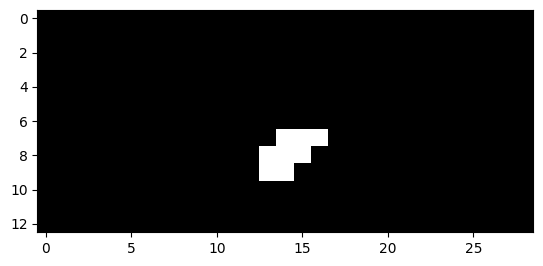

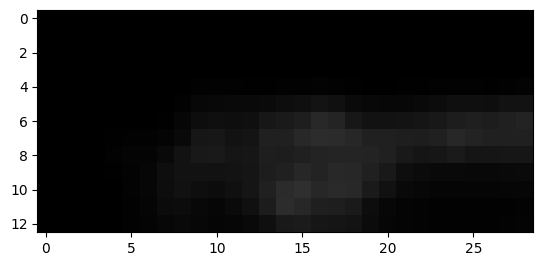

312


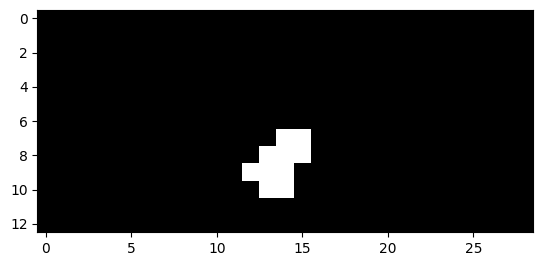

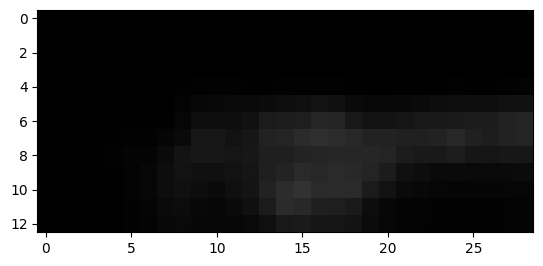

313


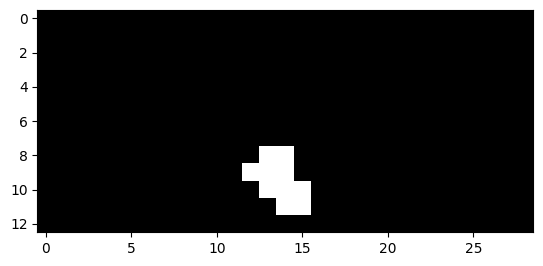

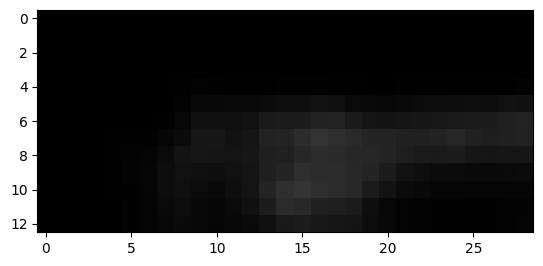

314


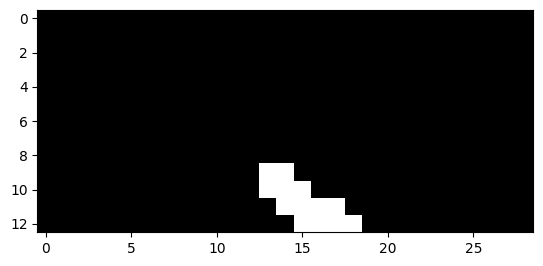

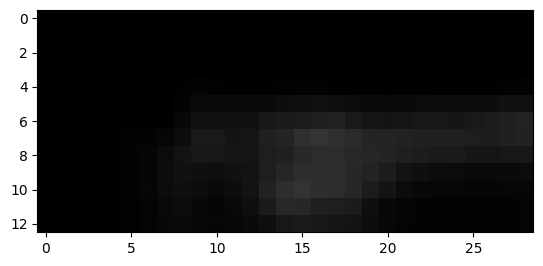

315


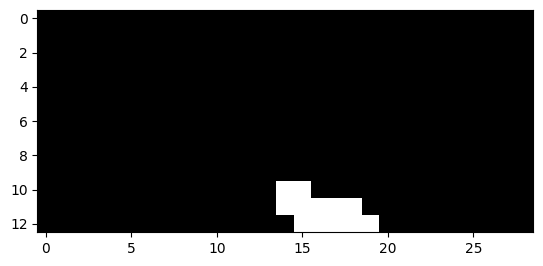

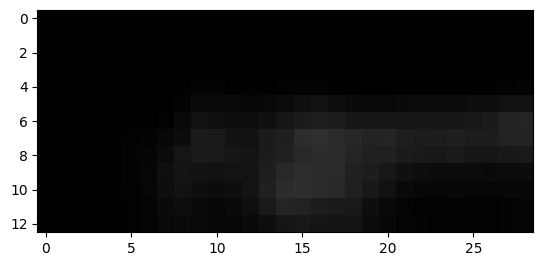

316


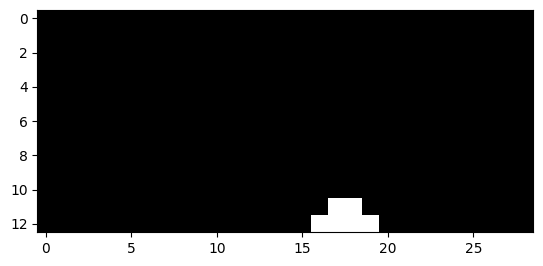

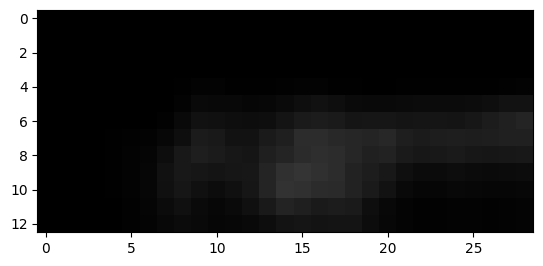

317


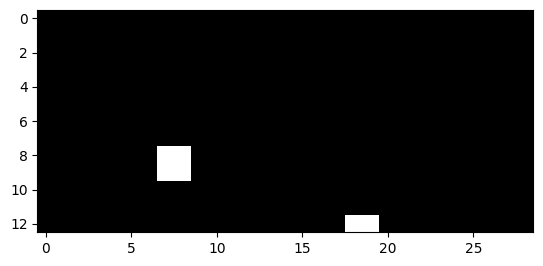

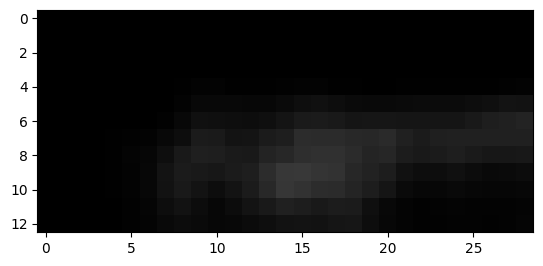

318


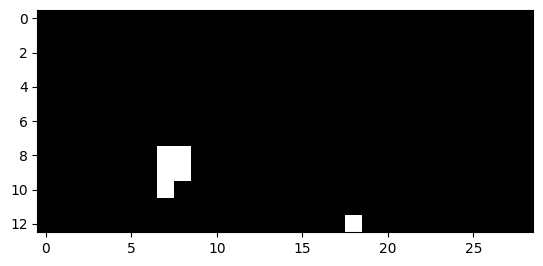

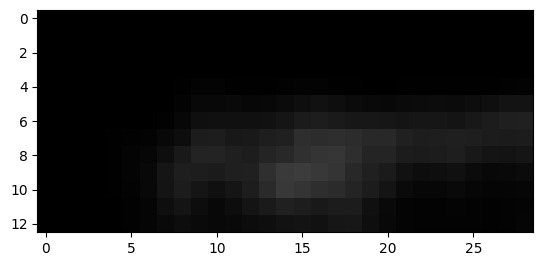

319


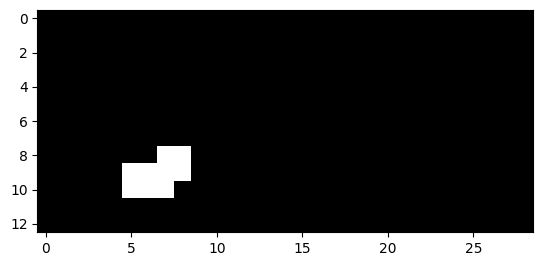

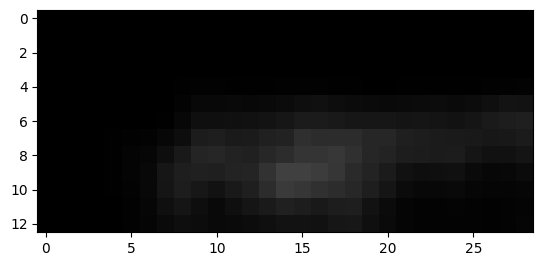

320


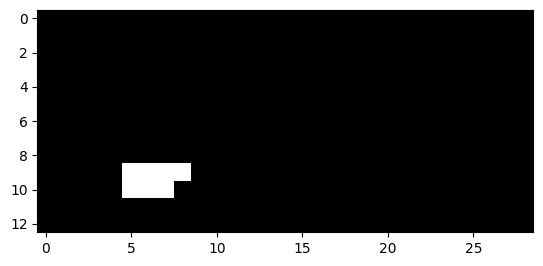

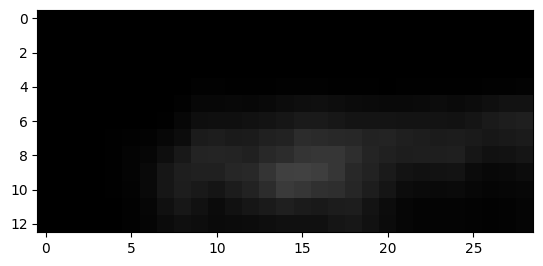

321


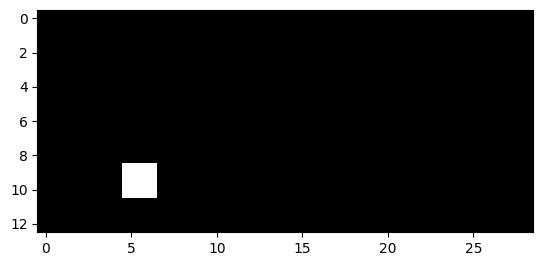

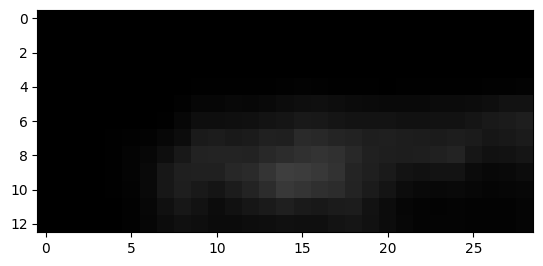

335


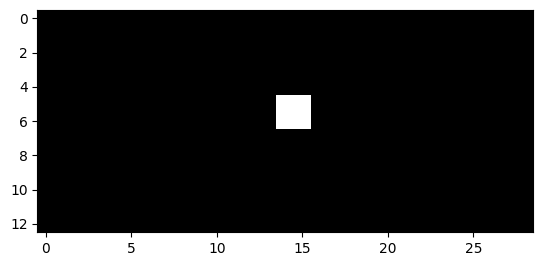

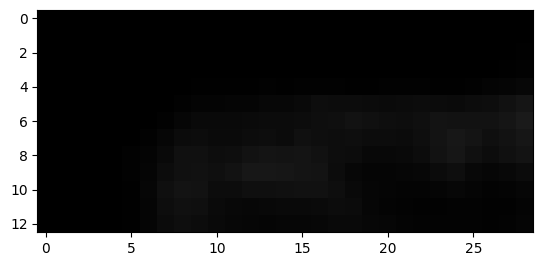

336


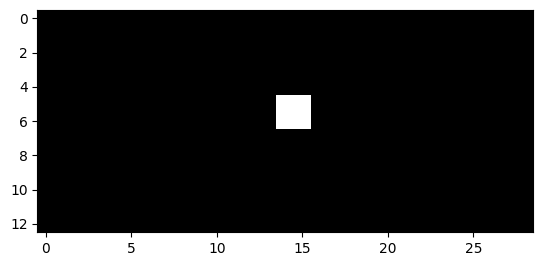

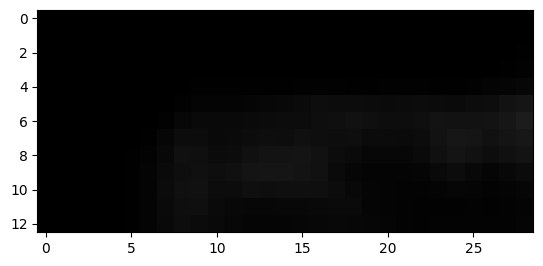

337


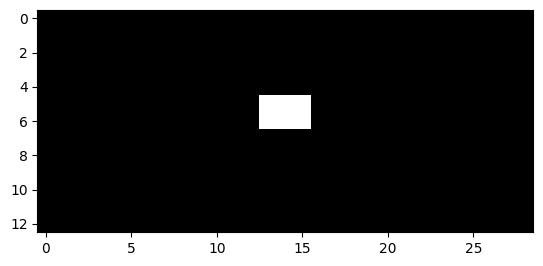

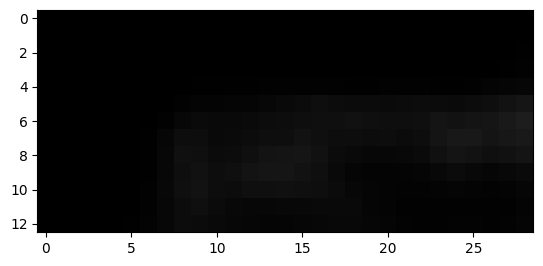

338


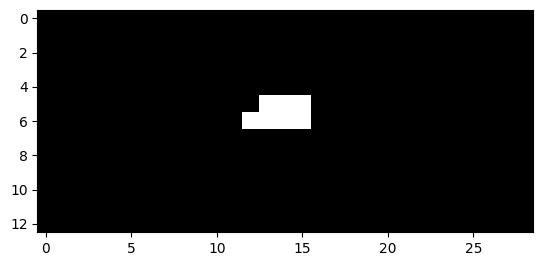

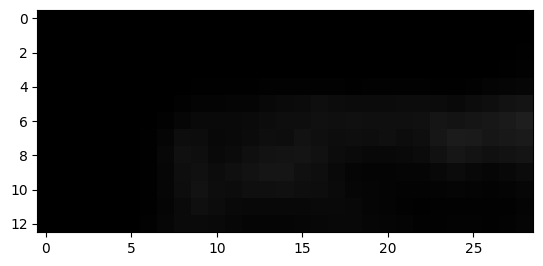

339


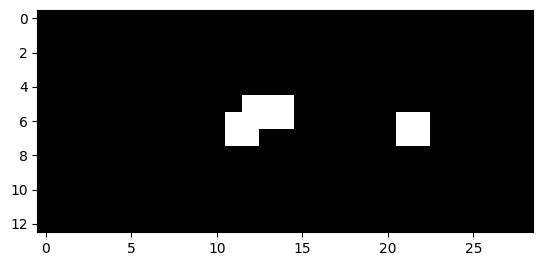

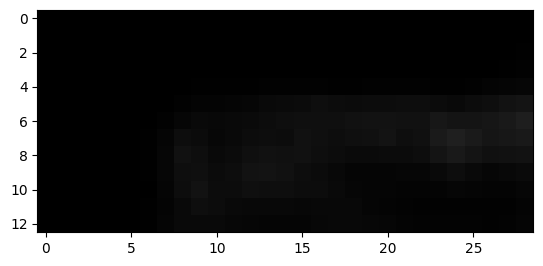

340


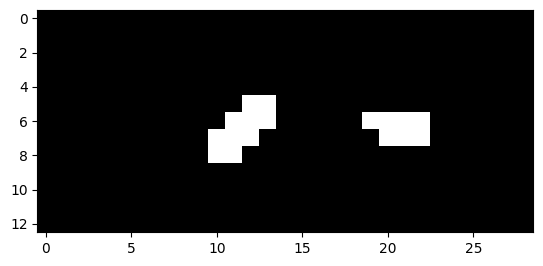

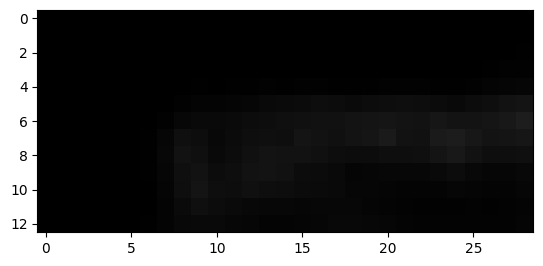

341


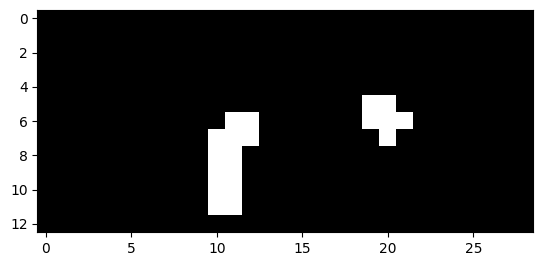

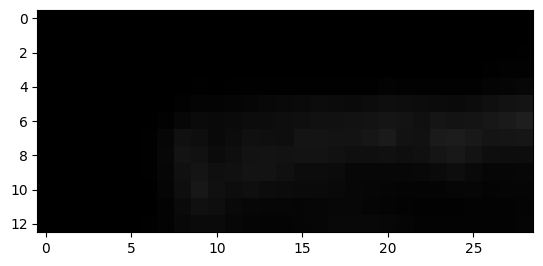

342


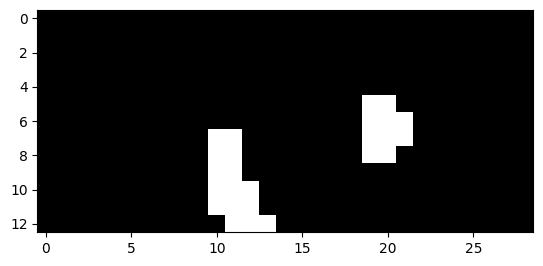

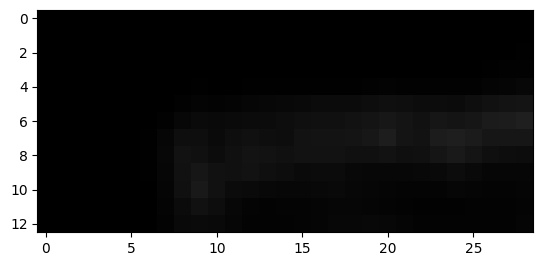

343


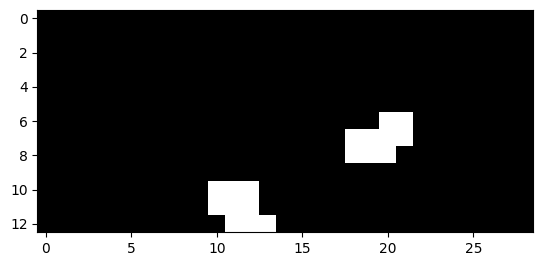

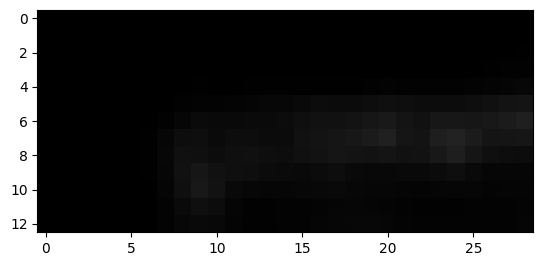

344


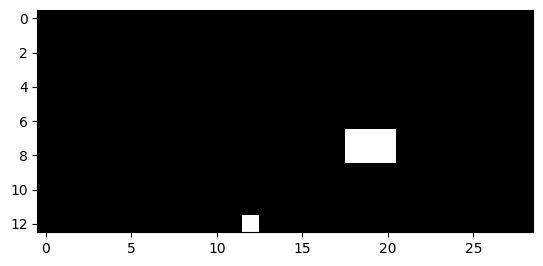

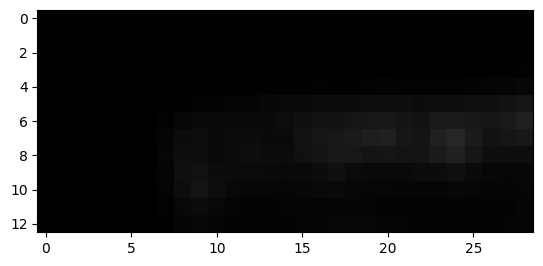

346


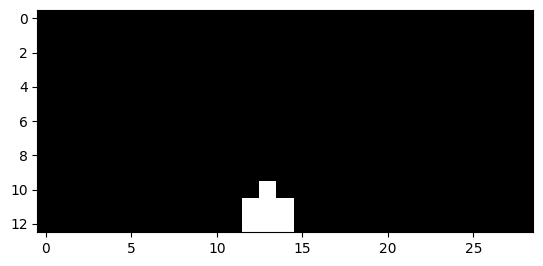

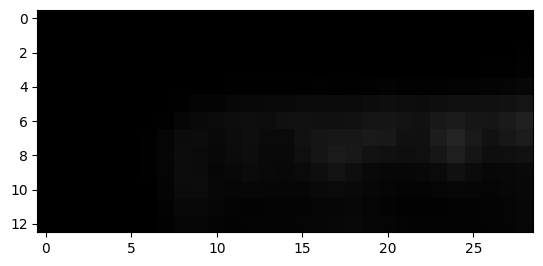

347


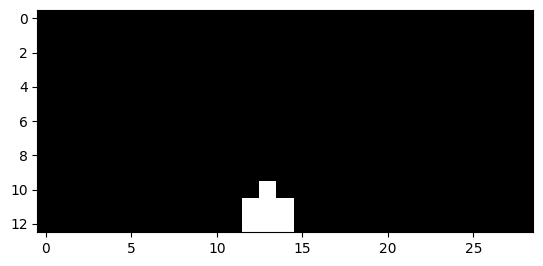

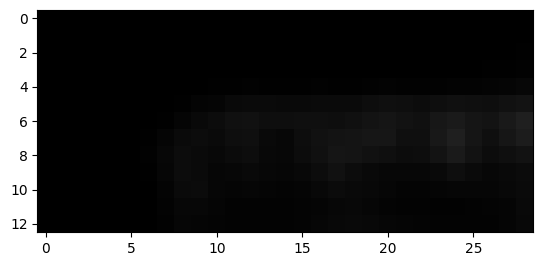

348


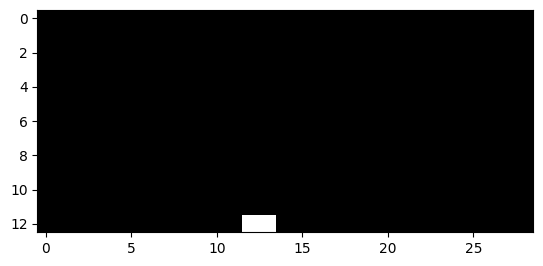

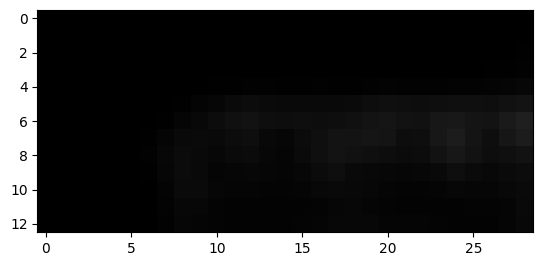

640


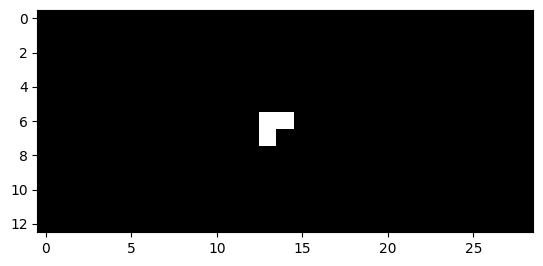

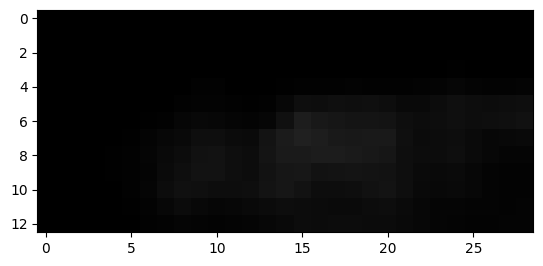

641


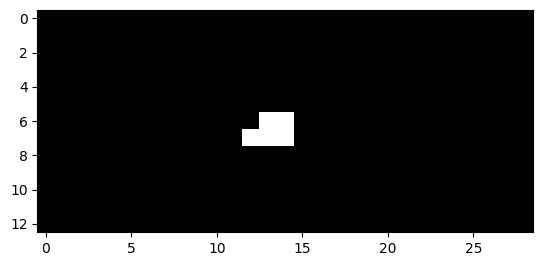

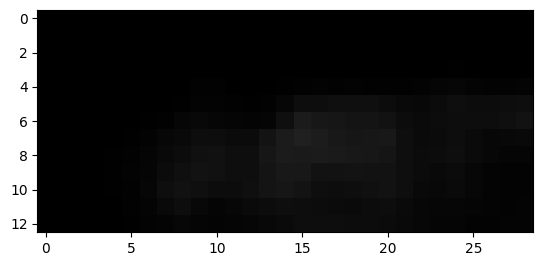

642


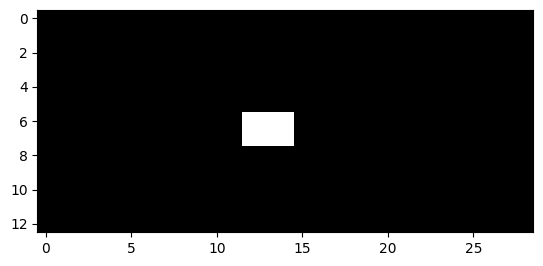

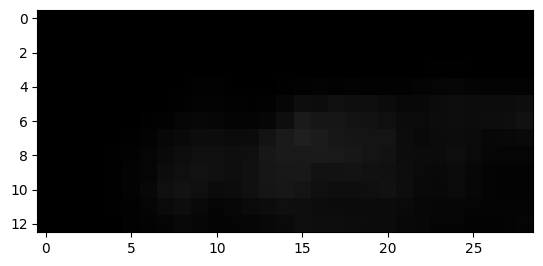

643


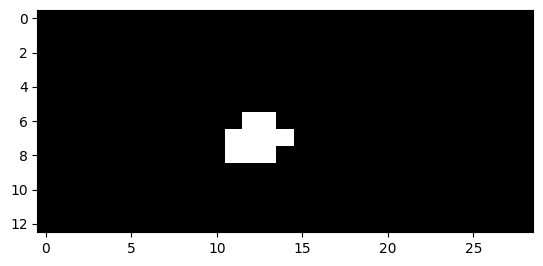

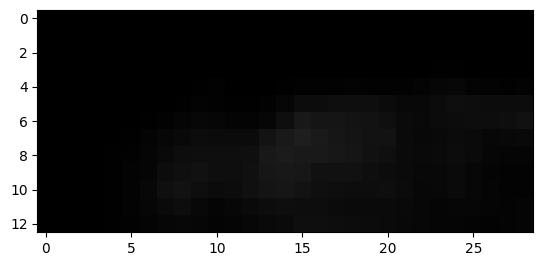

644


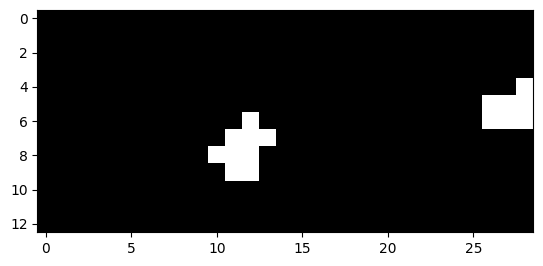

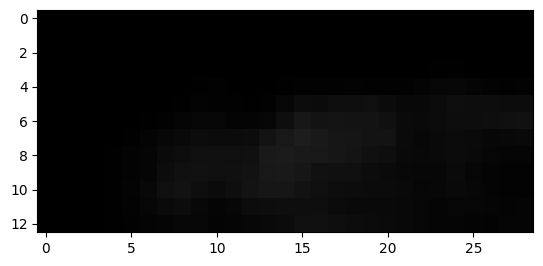

645


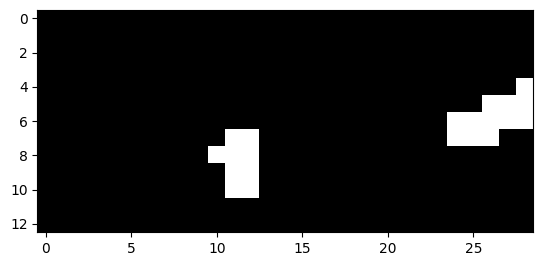

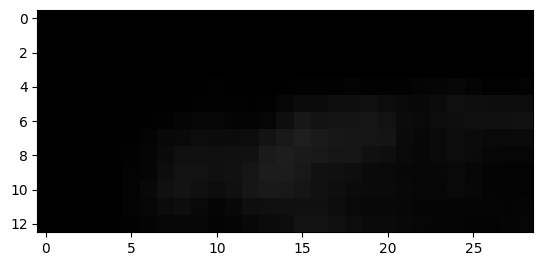

646


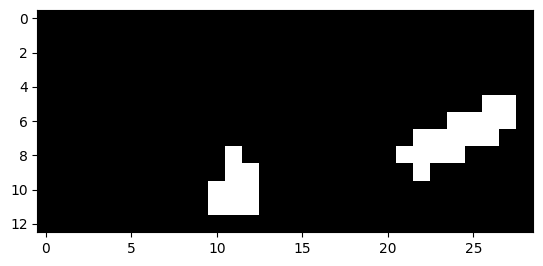

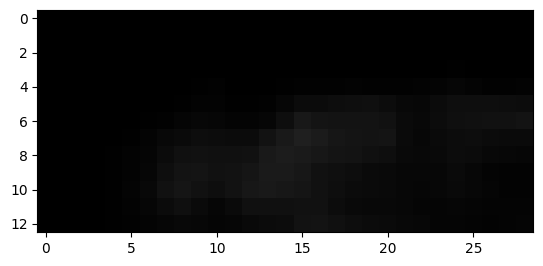

647


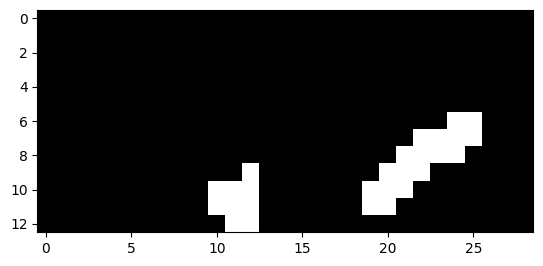

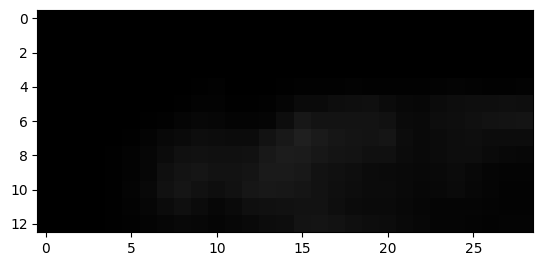

648


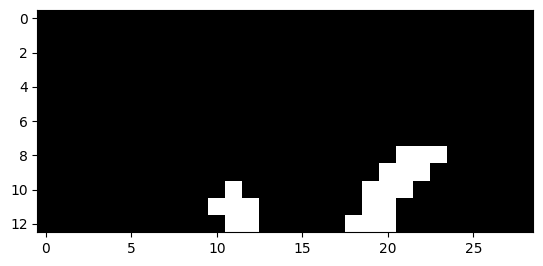

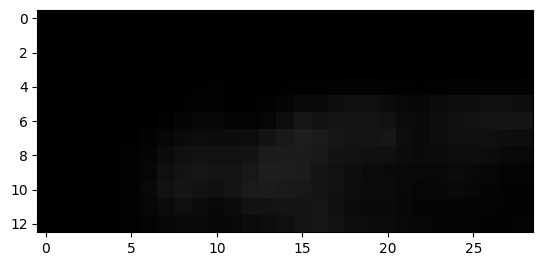

649


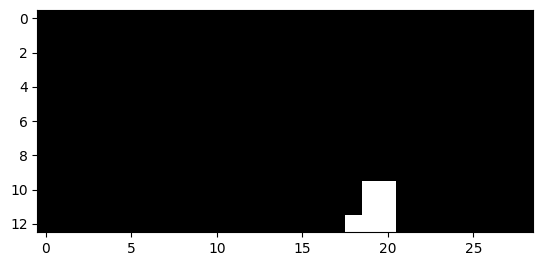

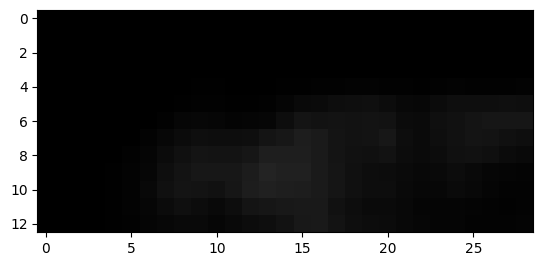

651


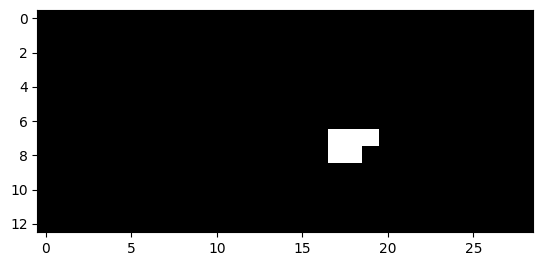

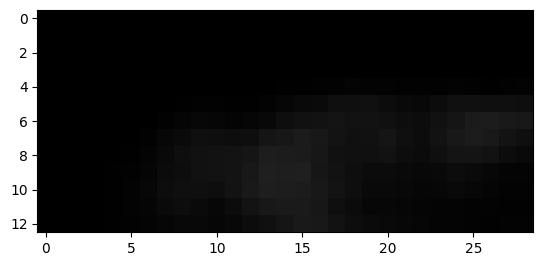

652


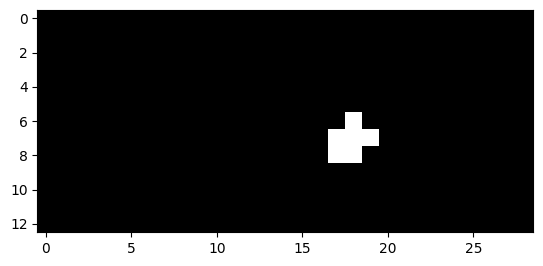

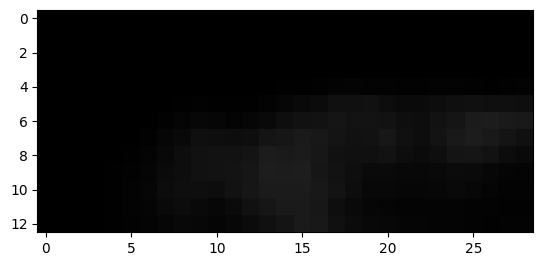

653


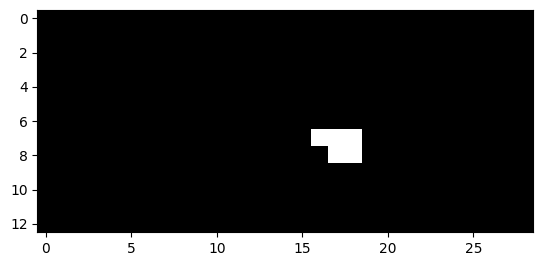

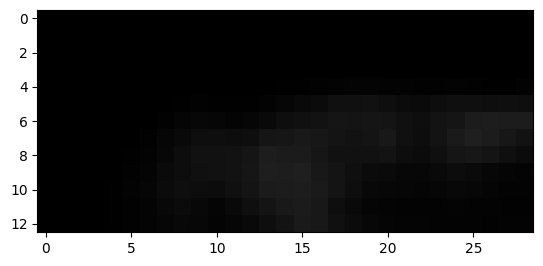

654


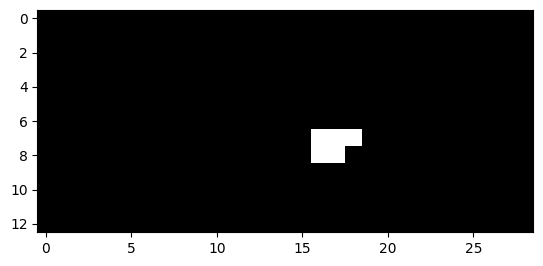

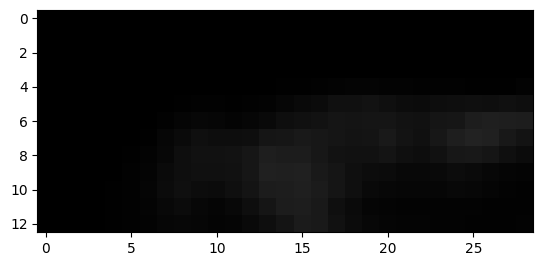

655


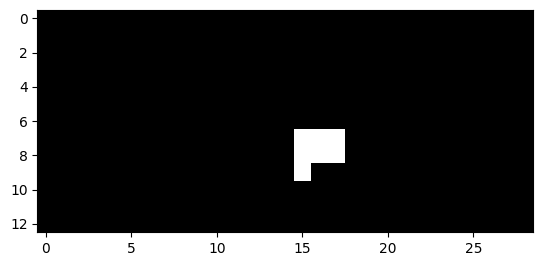

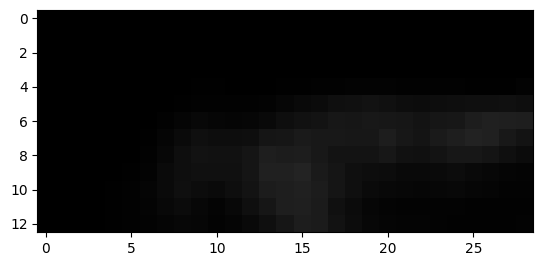

656


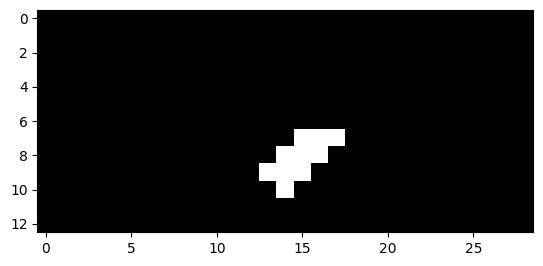

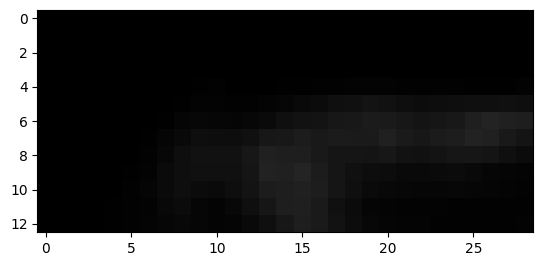

657


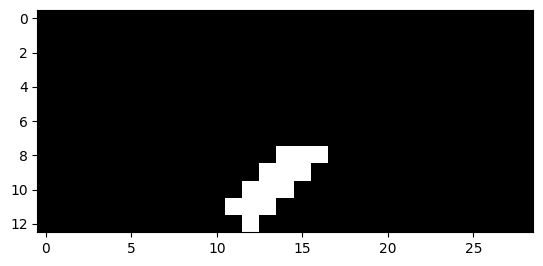

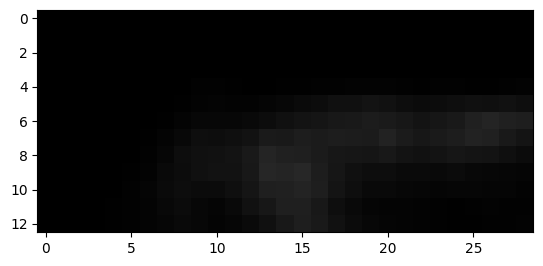

658


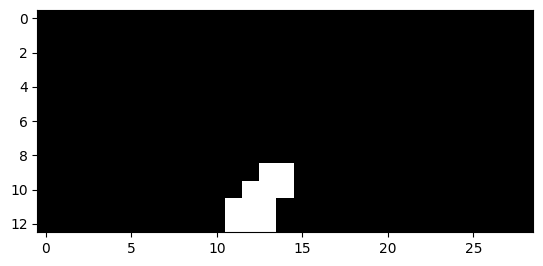

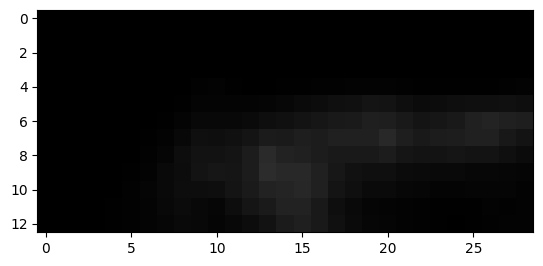

659


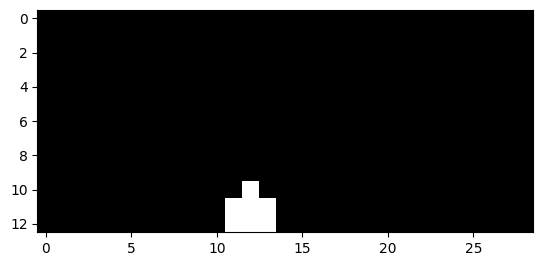

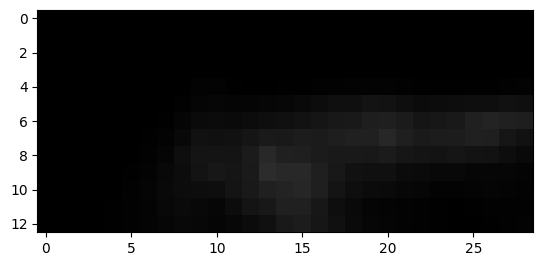

665


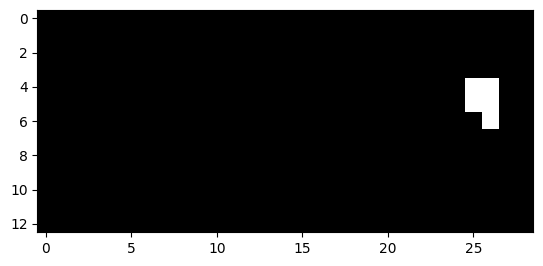

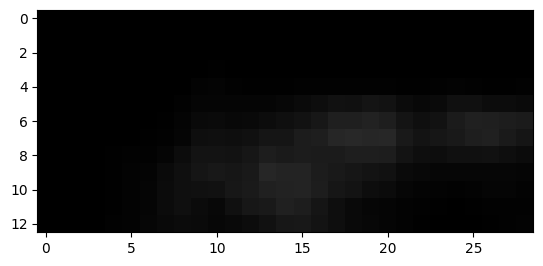

666


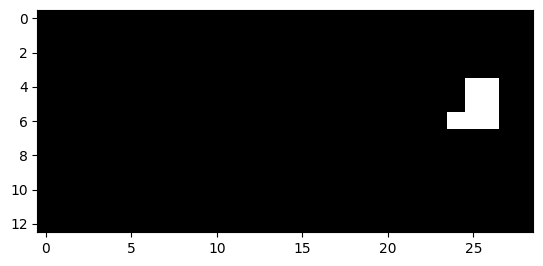

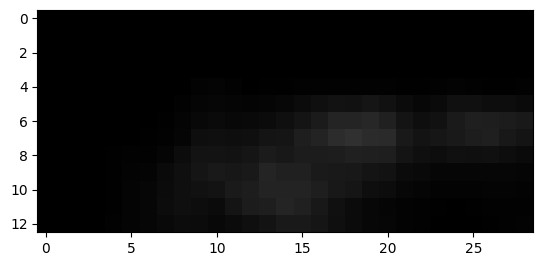

667


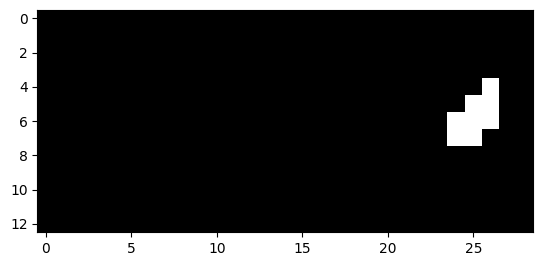

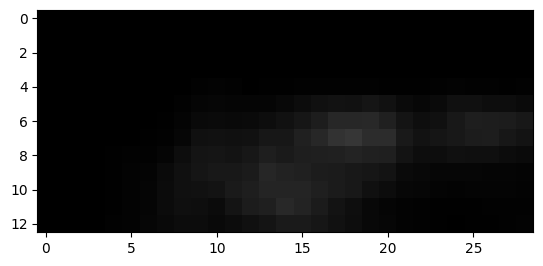

668


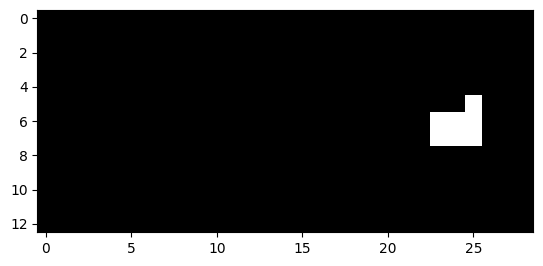

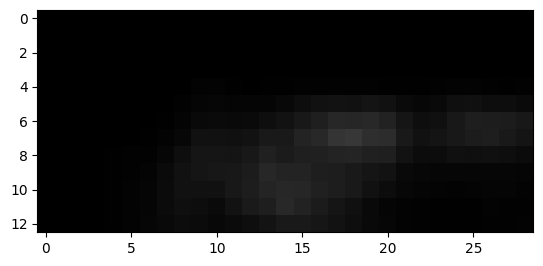

669


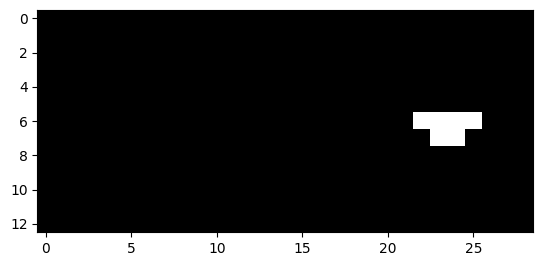

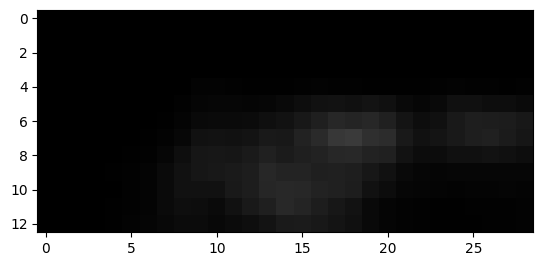

670


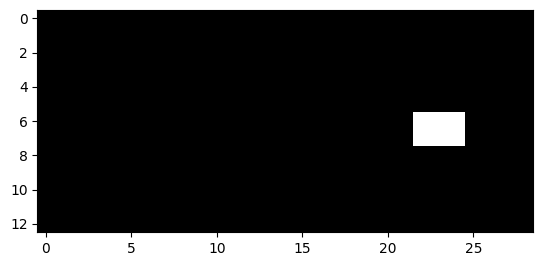

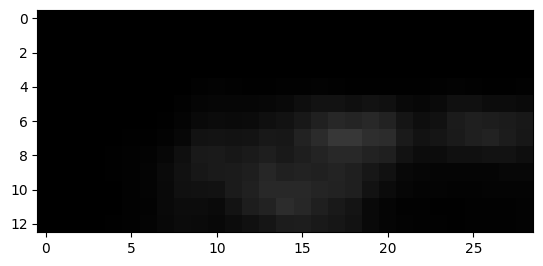

671


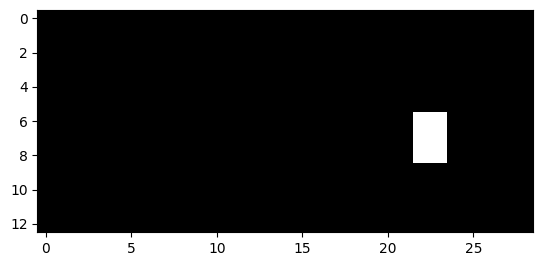

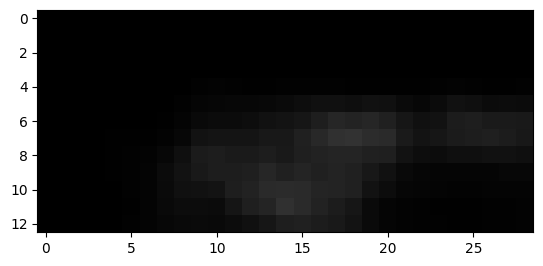

672


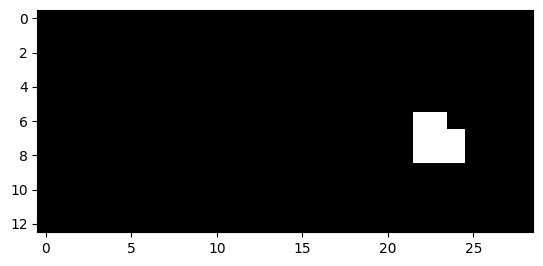

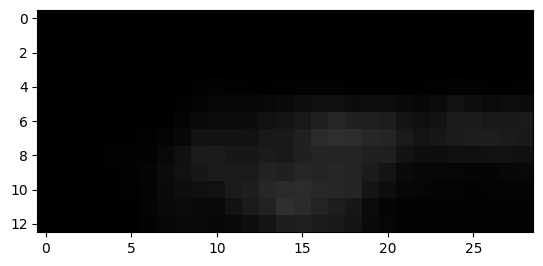

673


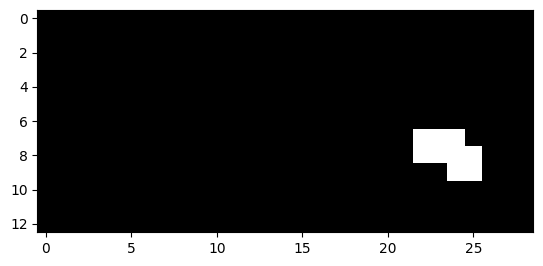

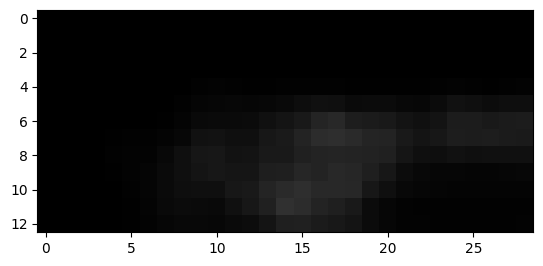

674


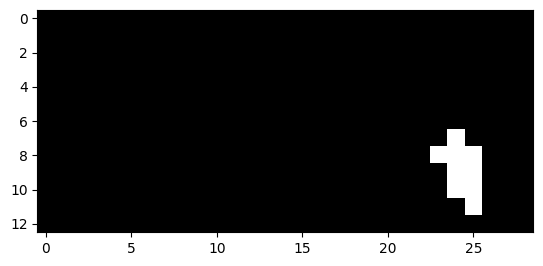

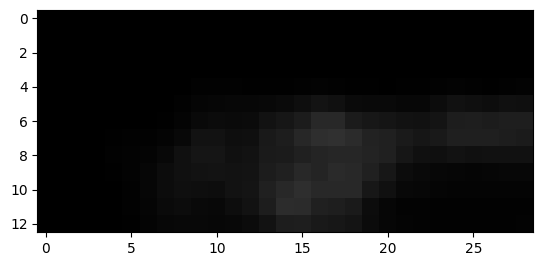

675


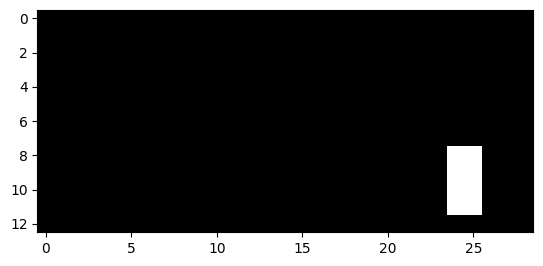

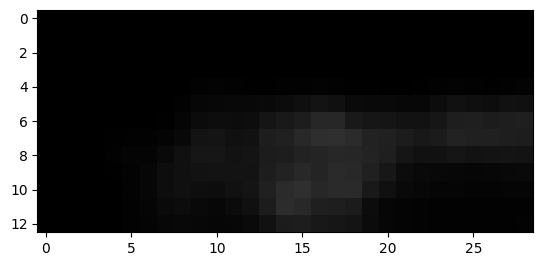

676


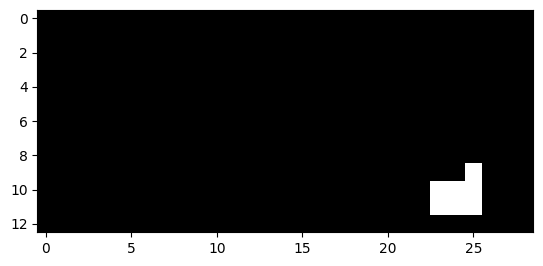

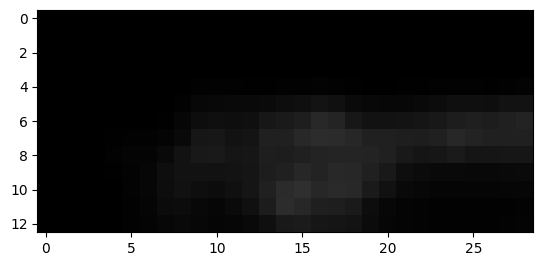

677


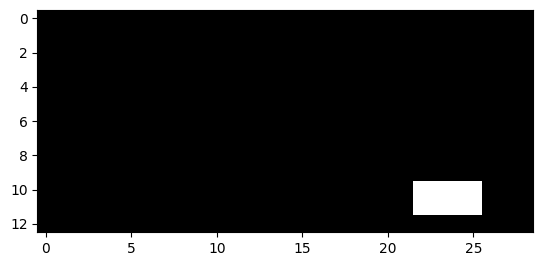

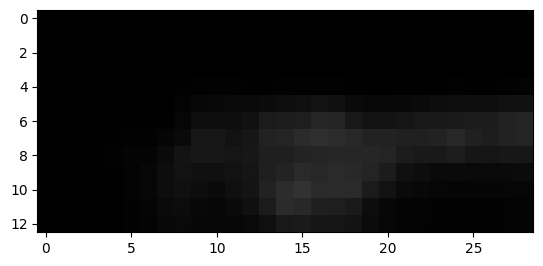

678


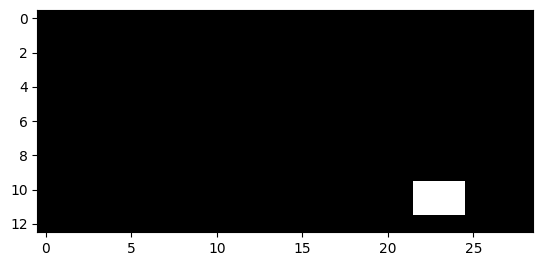

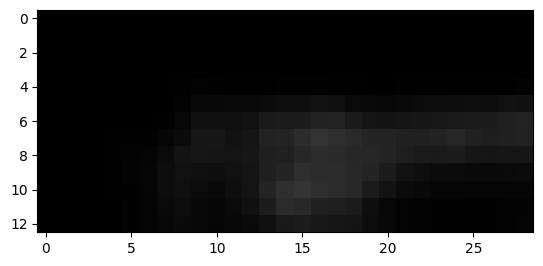

699


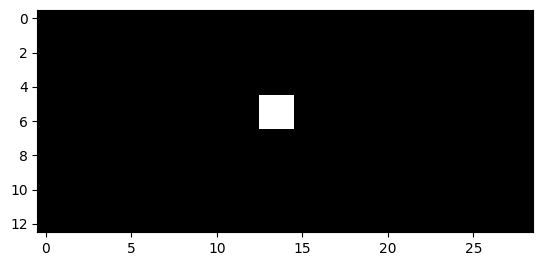

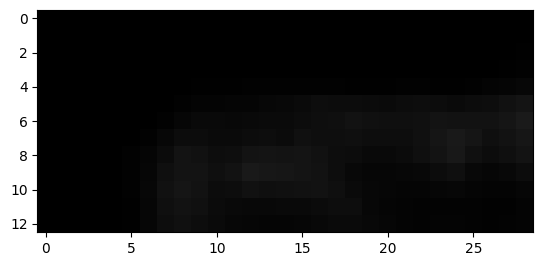

700


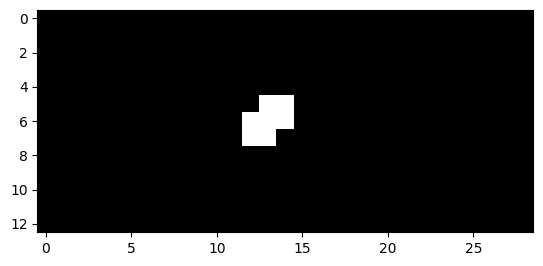

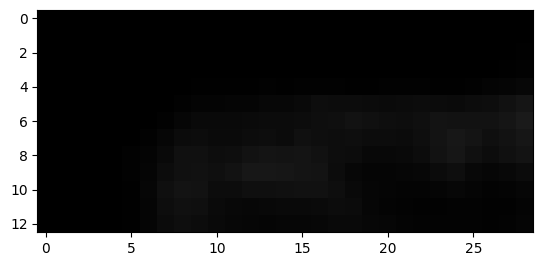

701


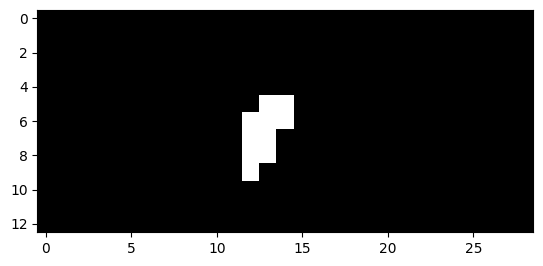

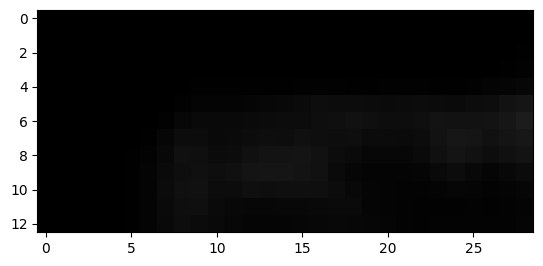

702


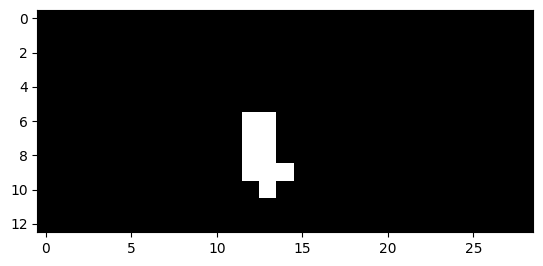

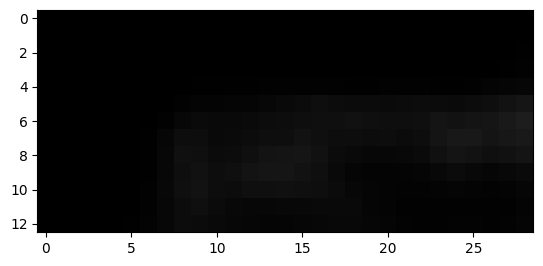

703


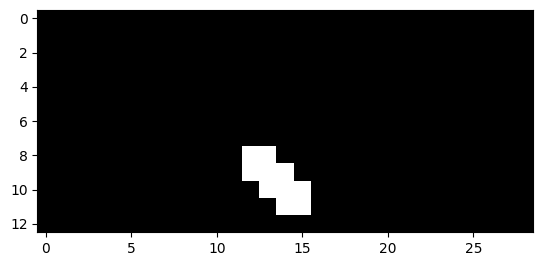

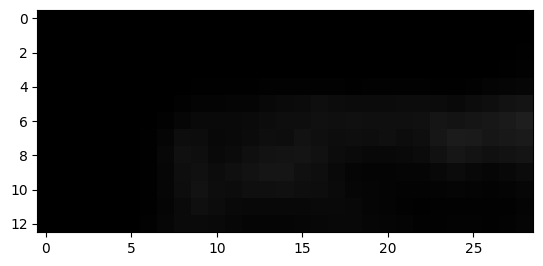

704


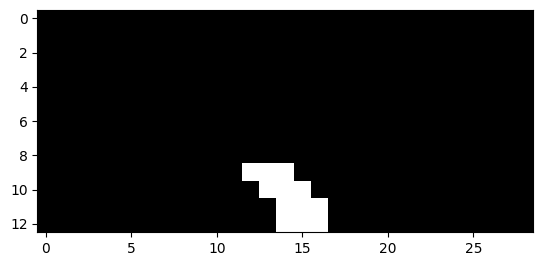

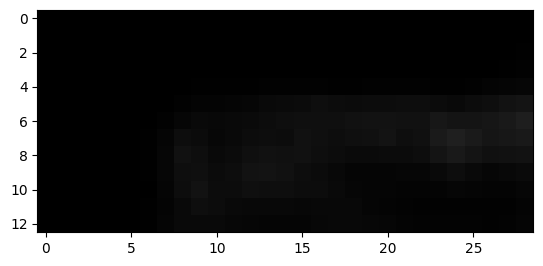

705


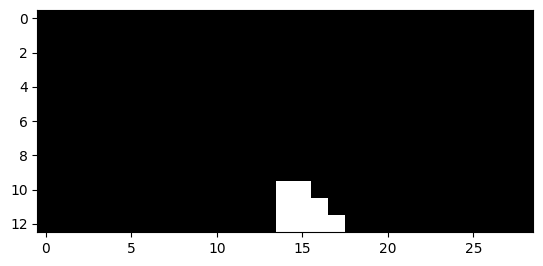

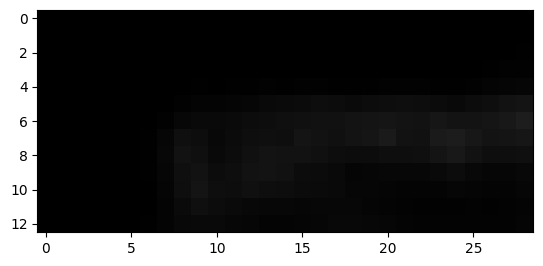

706


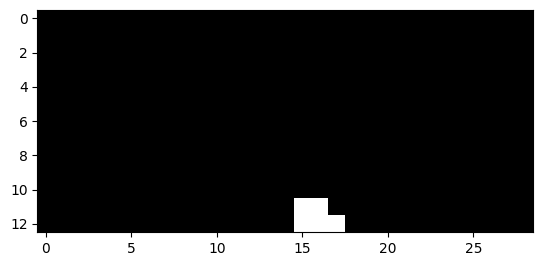

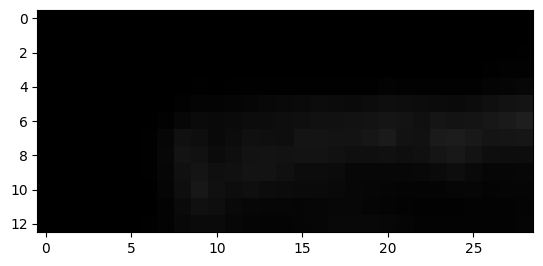

711


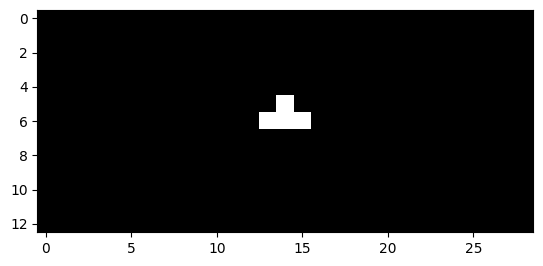

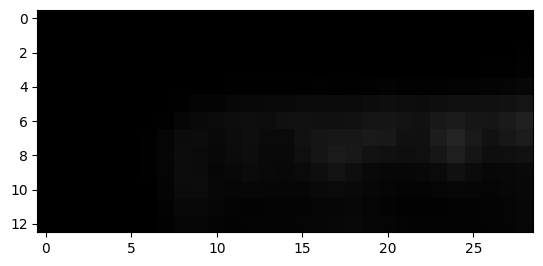

712


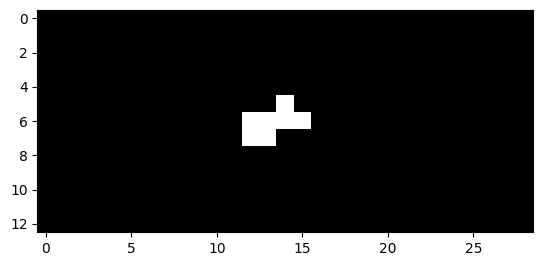

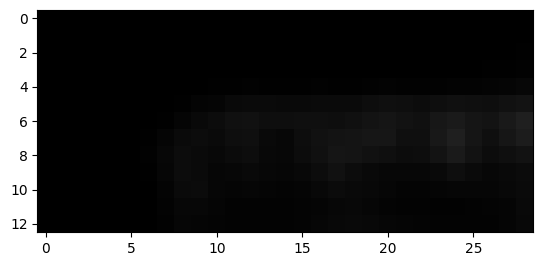

713


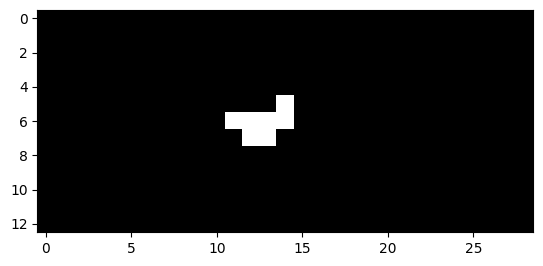

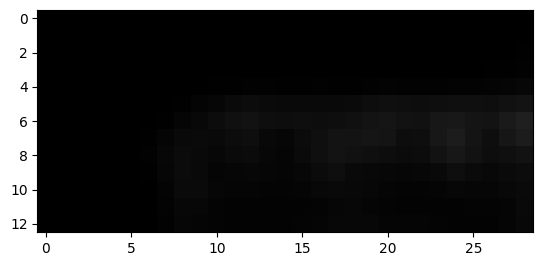

714


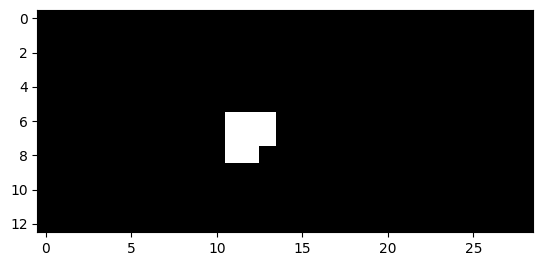

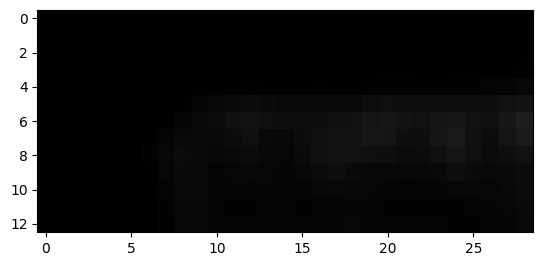

715


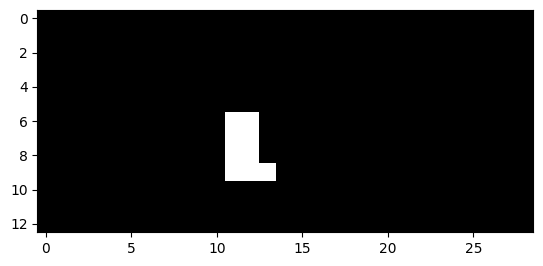

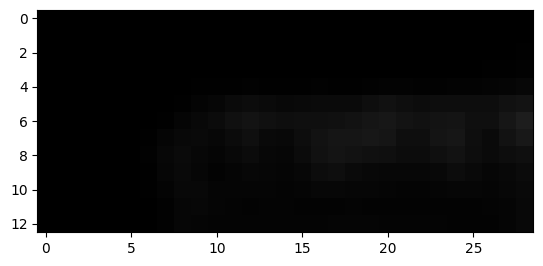

716


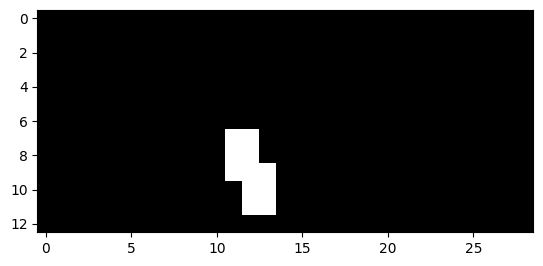

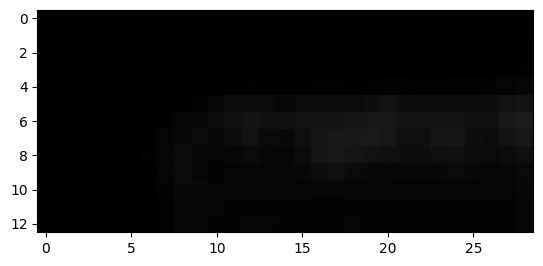

717


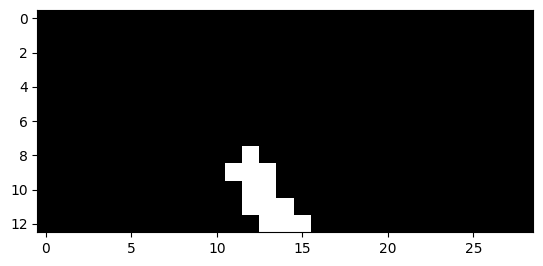

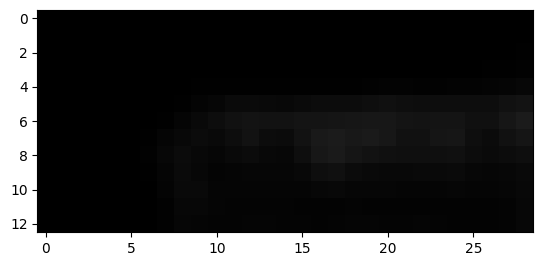

718


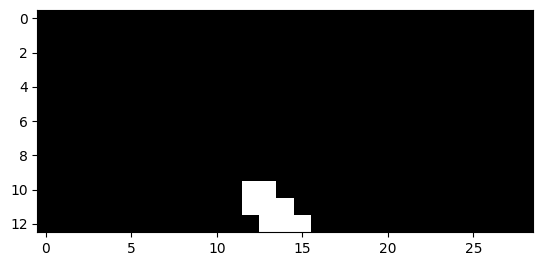

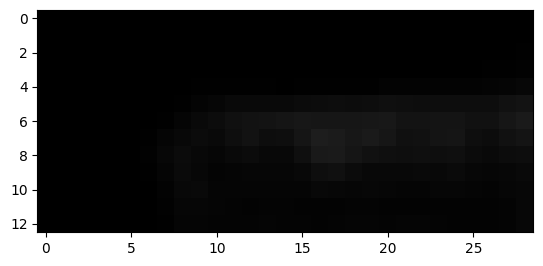

719


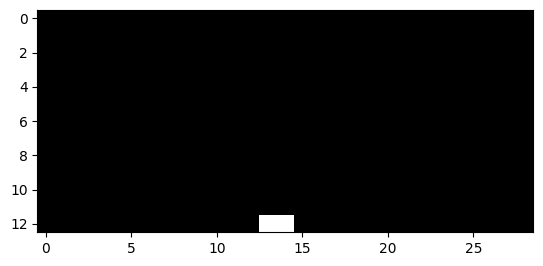

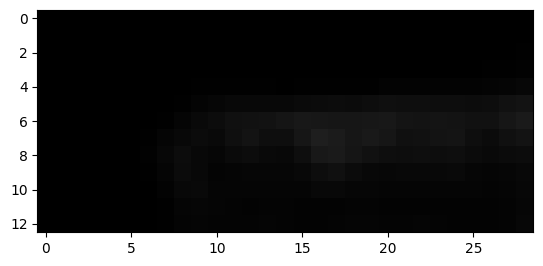

751


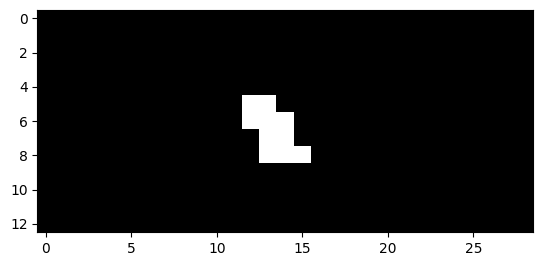

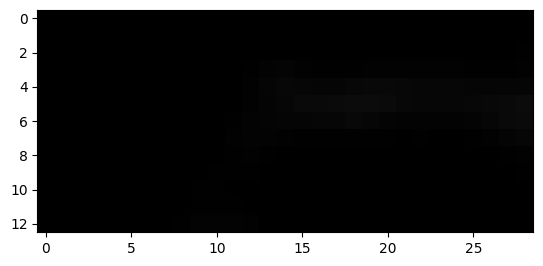

752


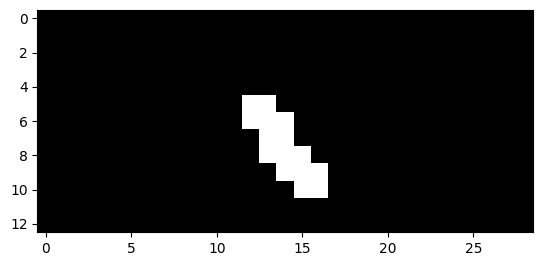

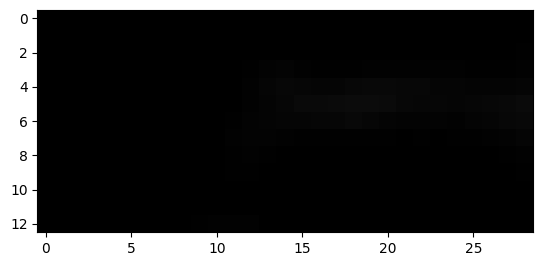

753


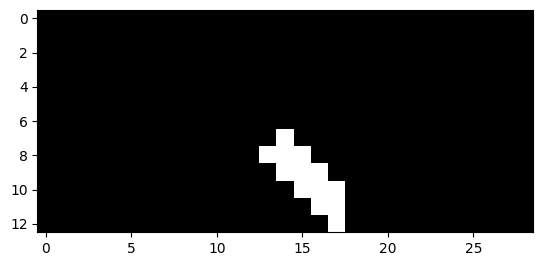

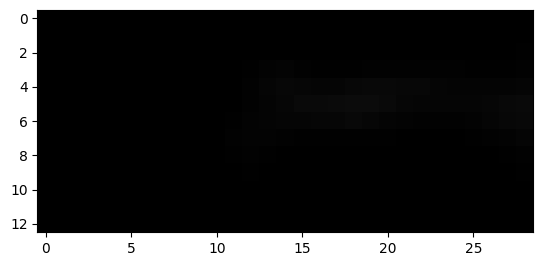

754


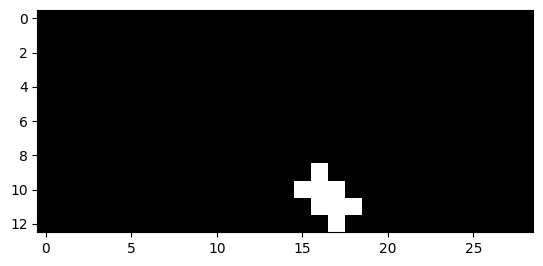

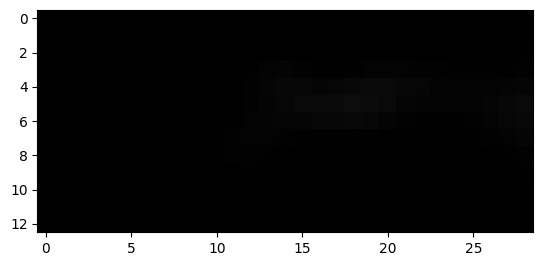

755


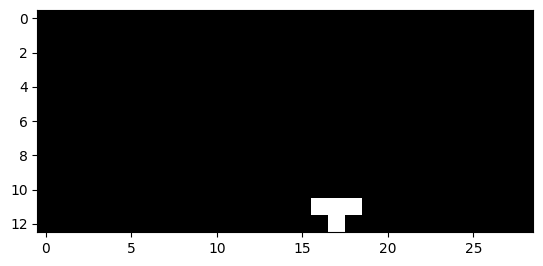

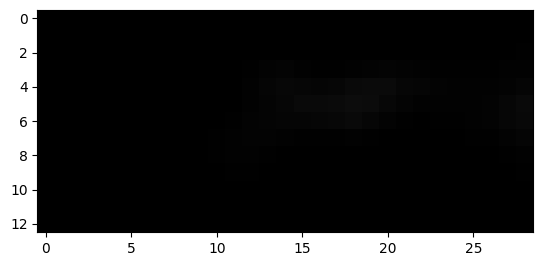

756


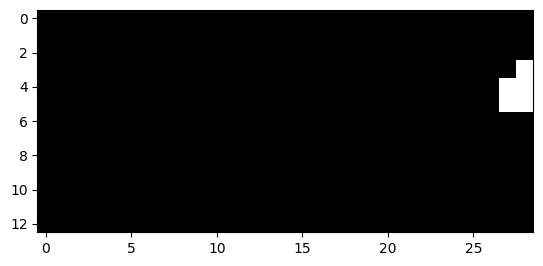

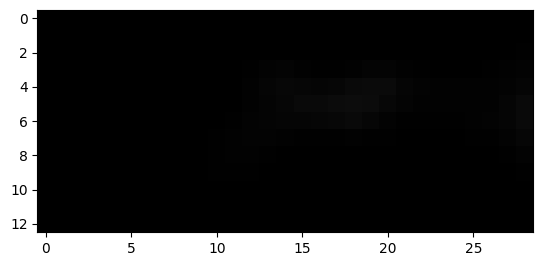

757


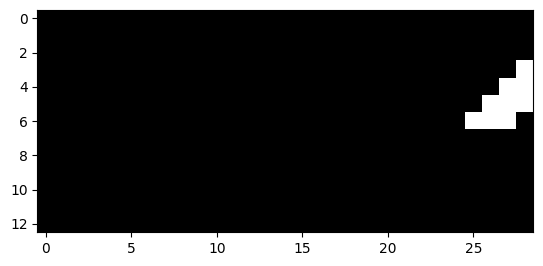

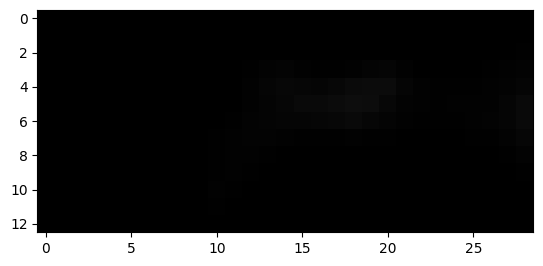

758


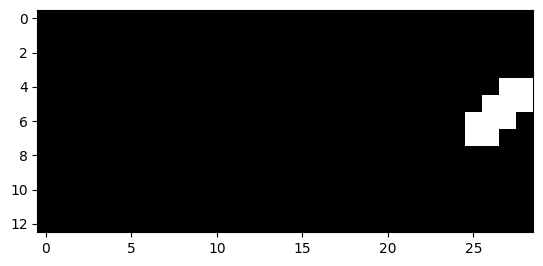

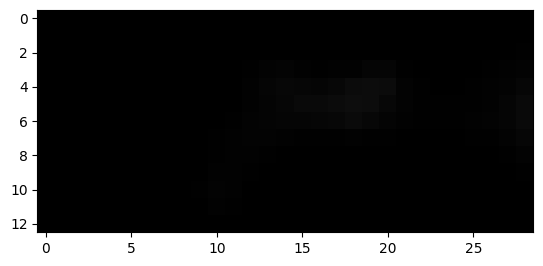

759


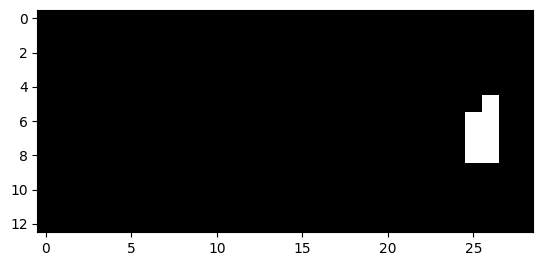

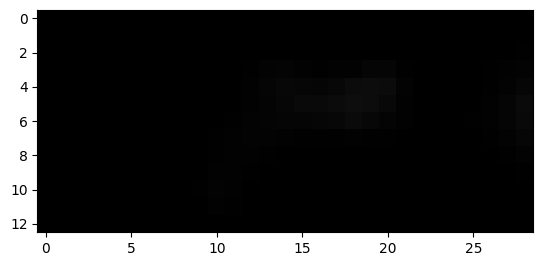

760


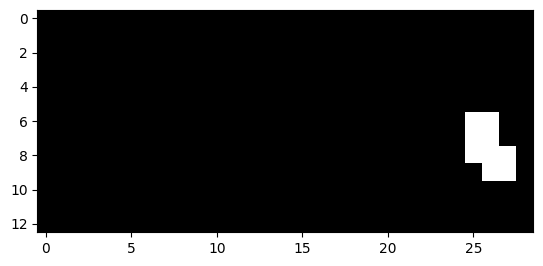

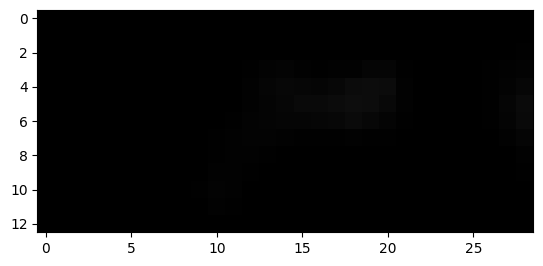

761


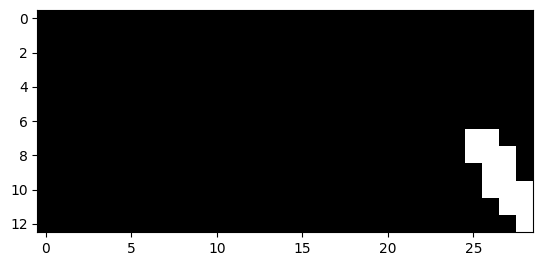

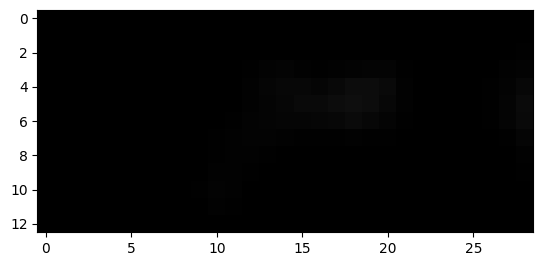

762


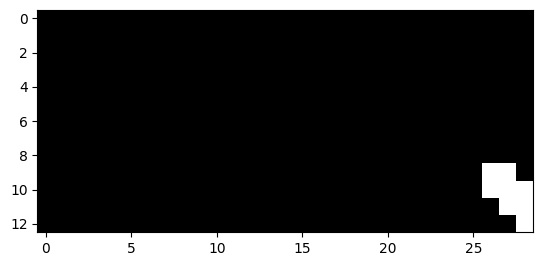

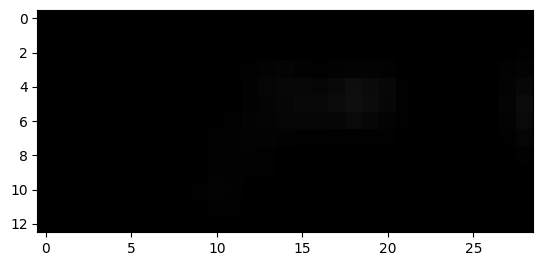

763


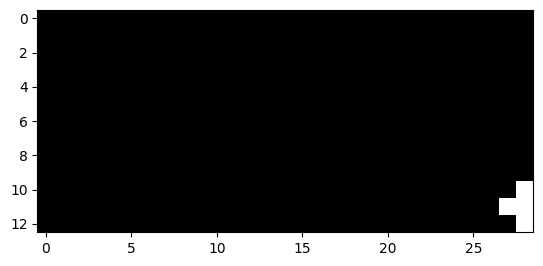

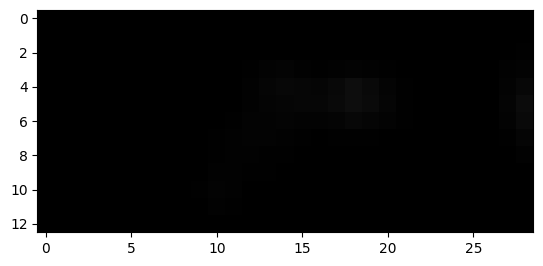

896


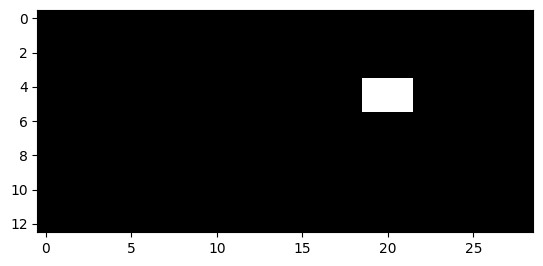

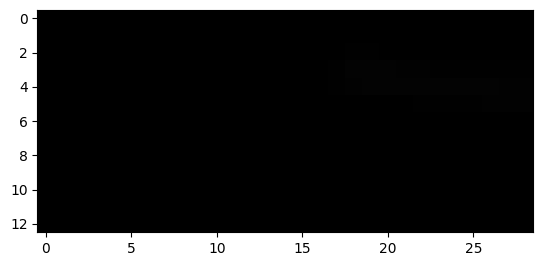

897


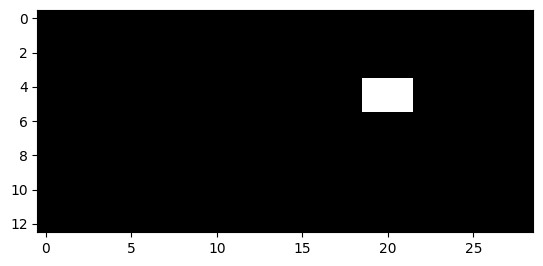

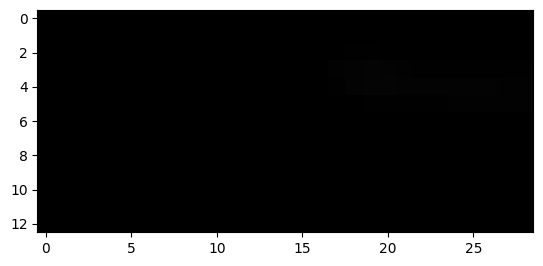

948


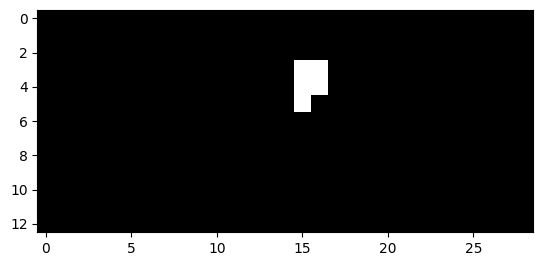

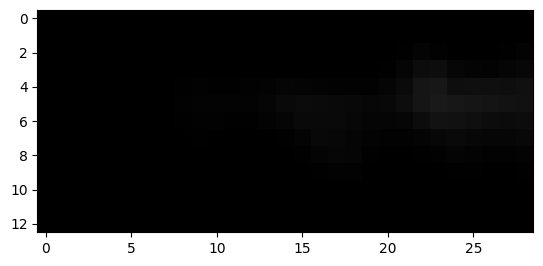

949


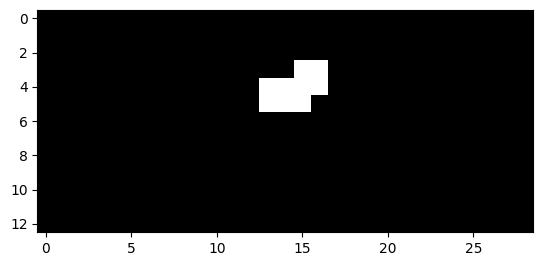

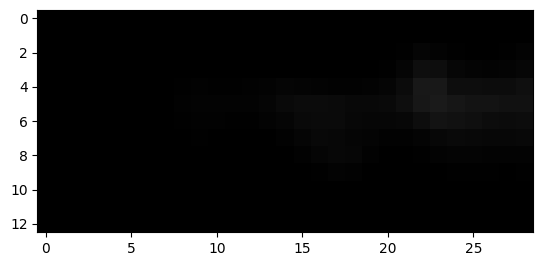

950


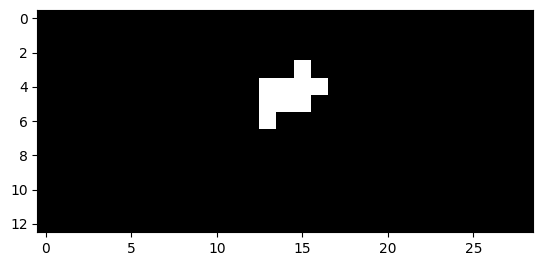

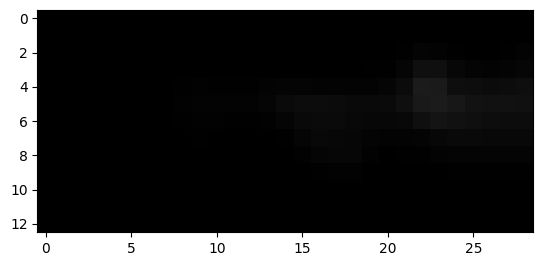

951


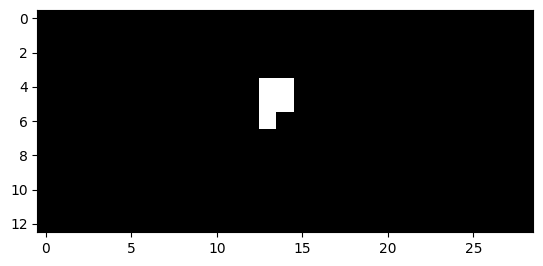

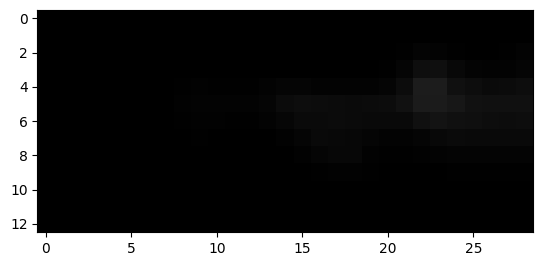

952


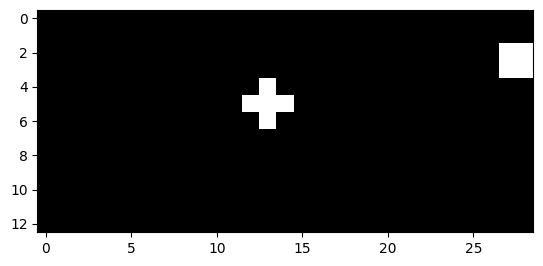

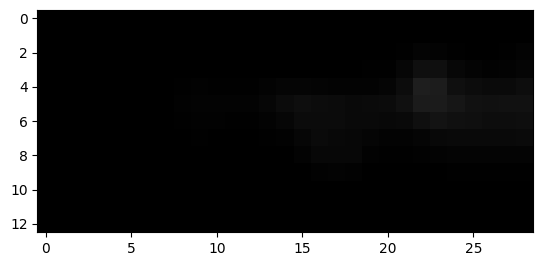

953


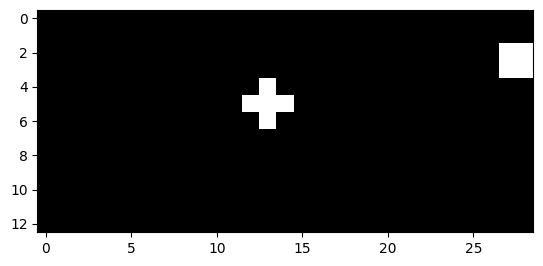

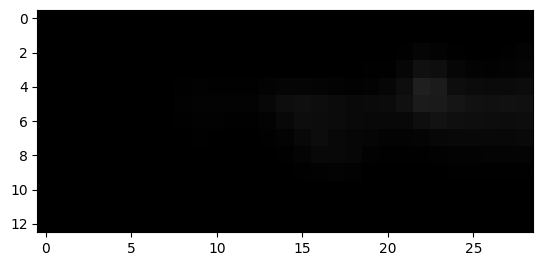

954


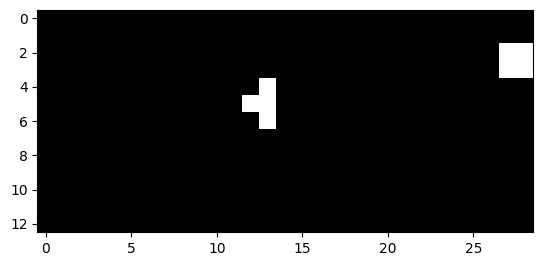

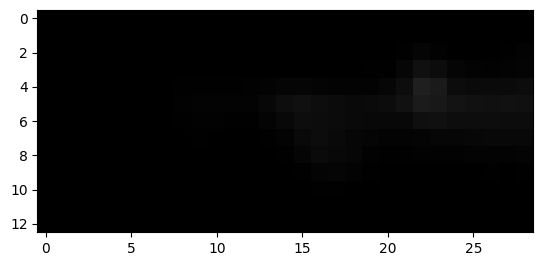

955


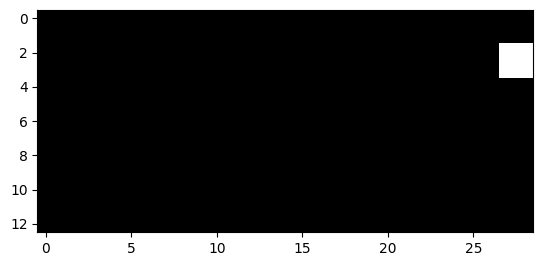

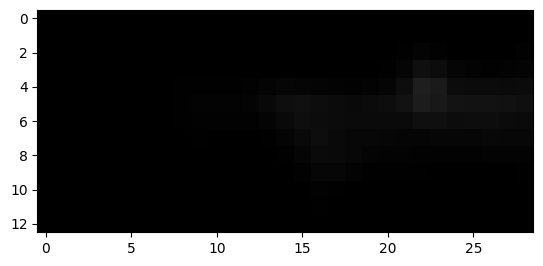

959


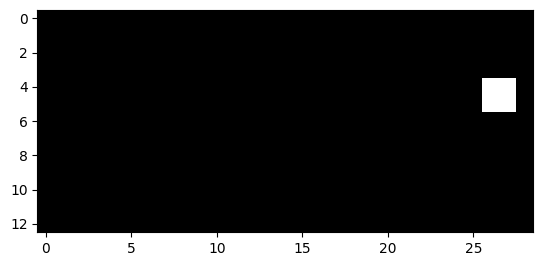

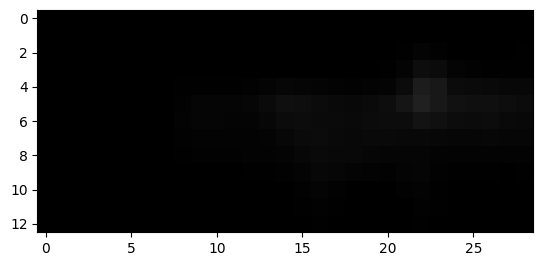

960


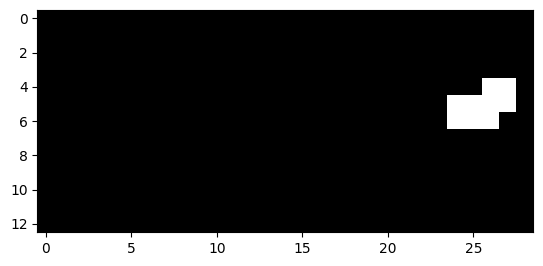

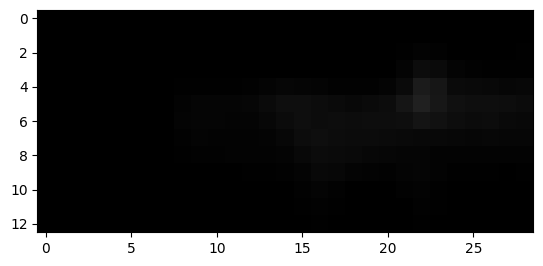

961


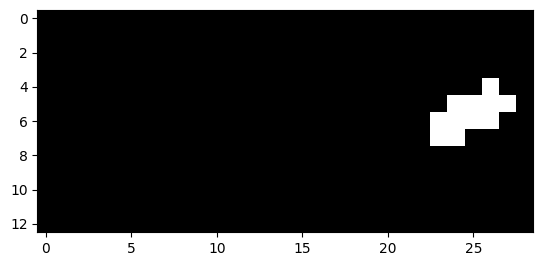

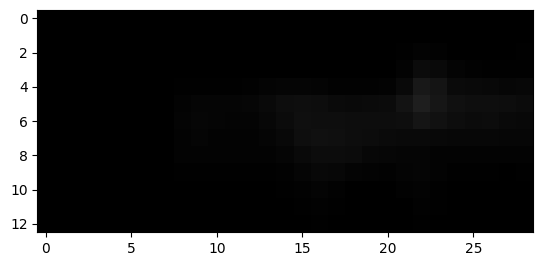

962


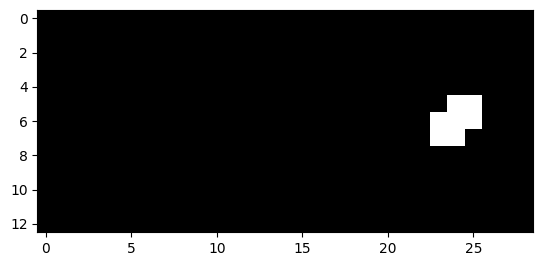

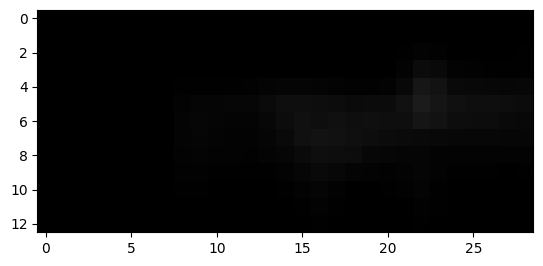

987


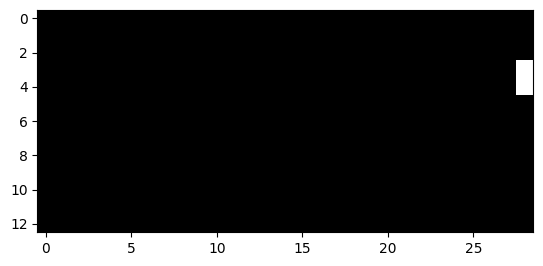

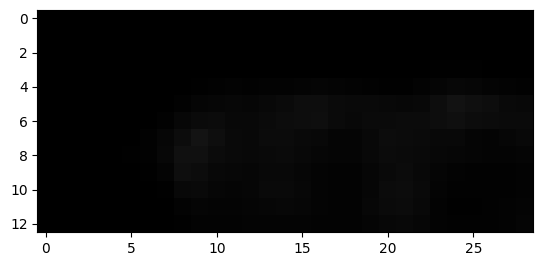

988


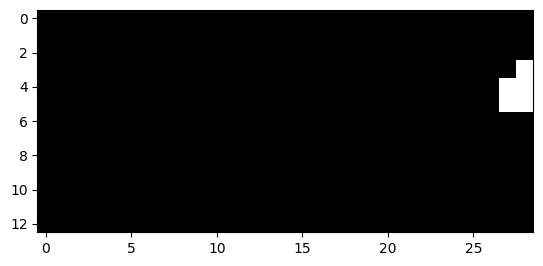

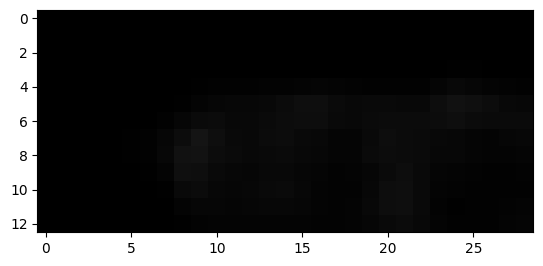

989


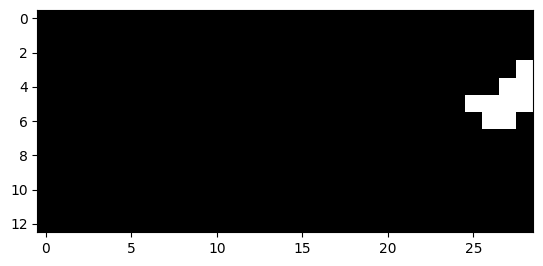

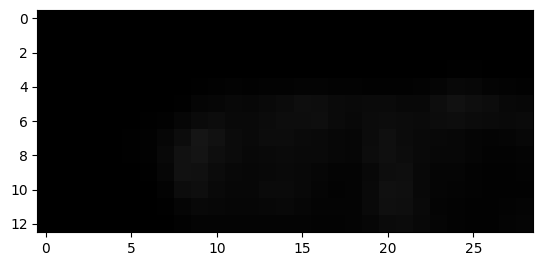

990


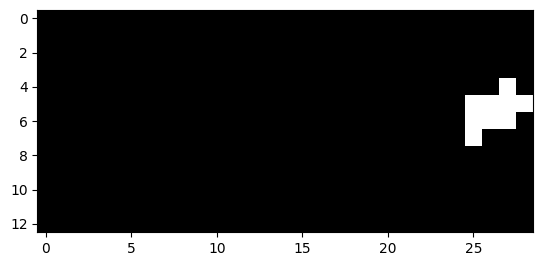

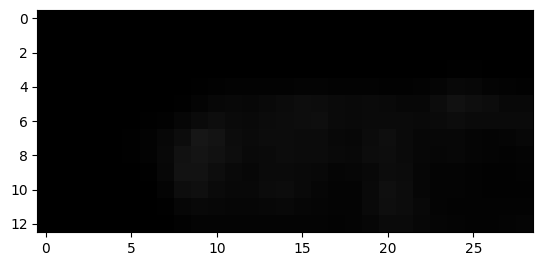

991


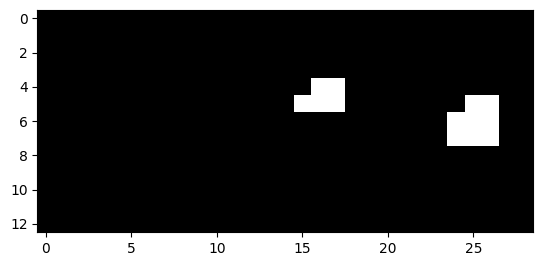

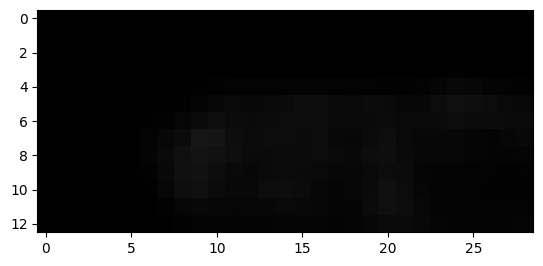

992


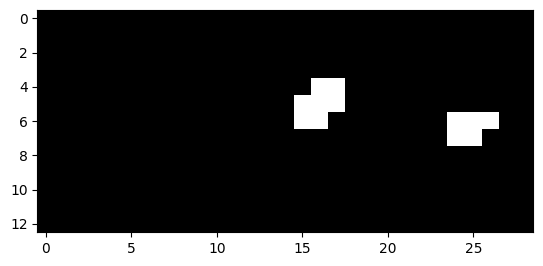

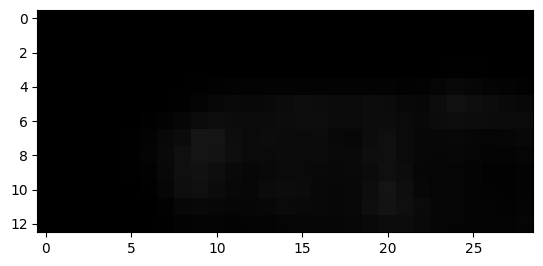

993


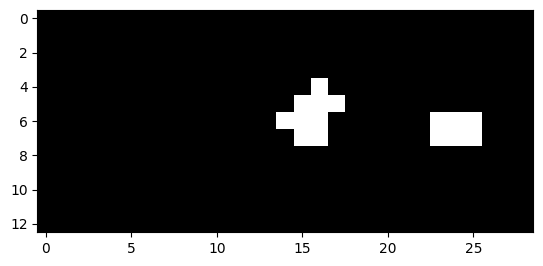

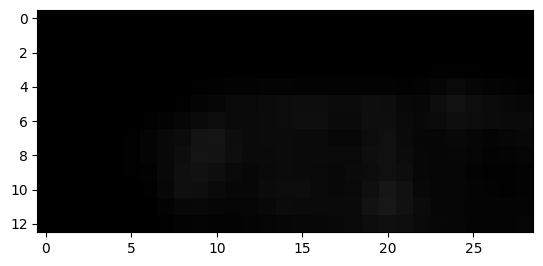

994


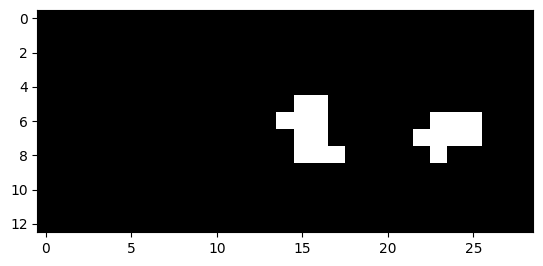

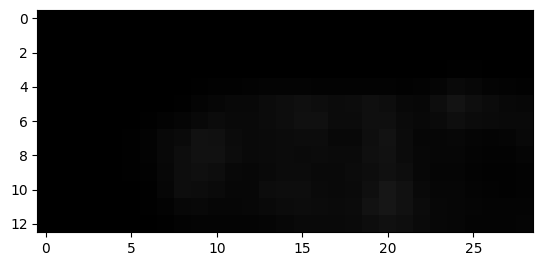

995


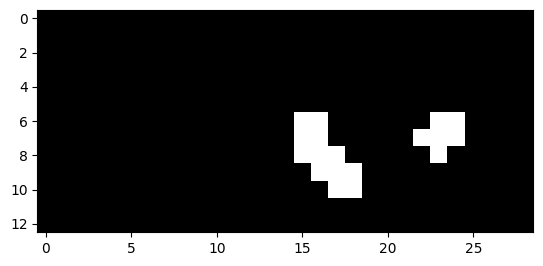

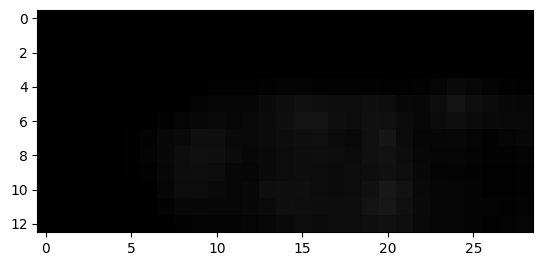

996


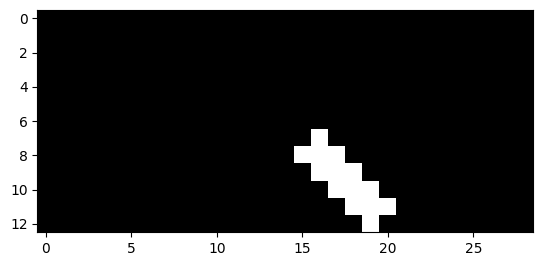

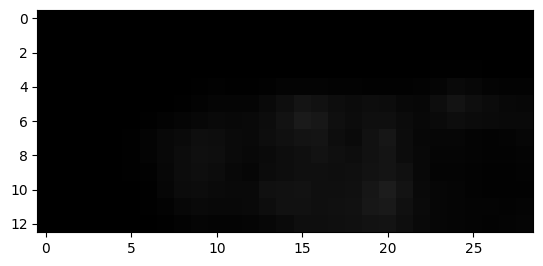

997


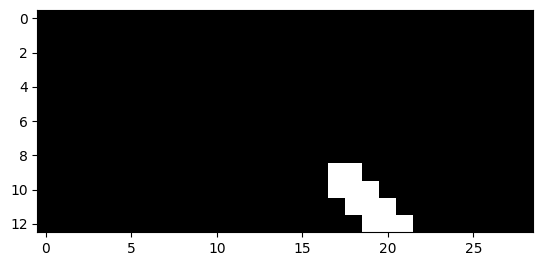

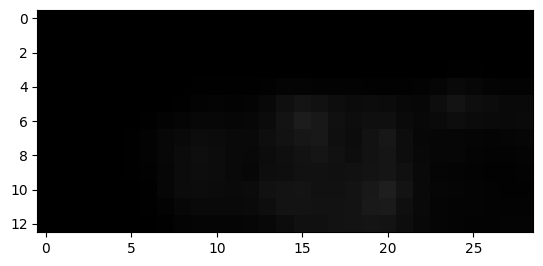

998


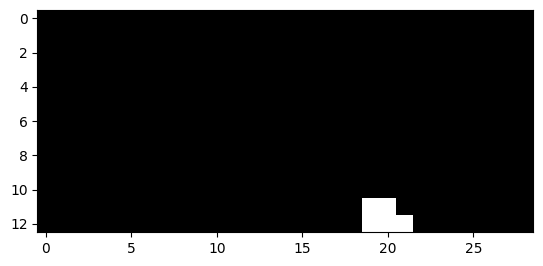

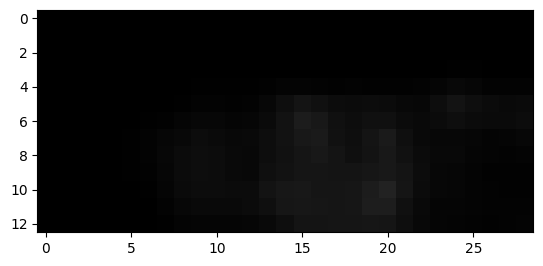

1023


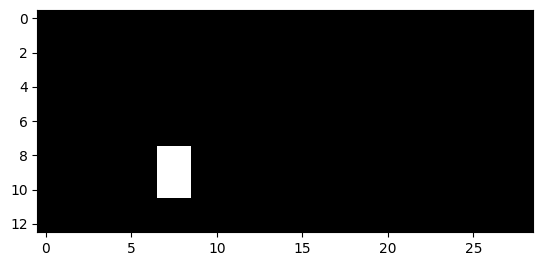

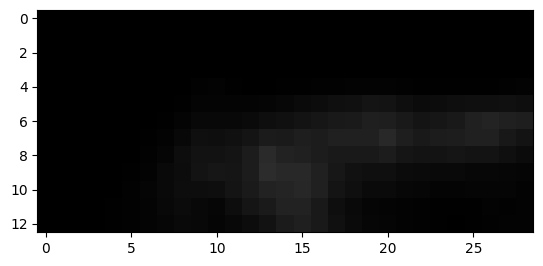

1024


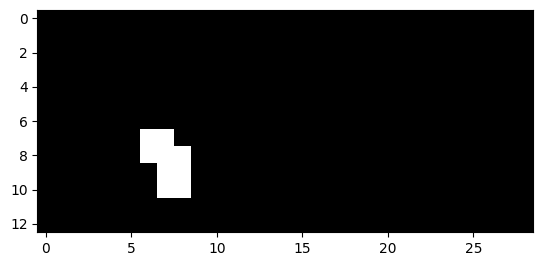

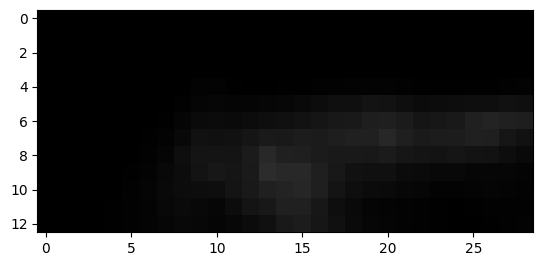

1025


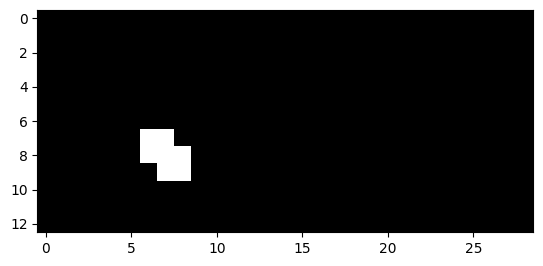

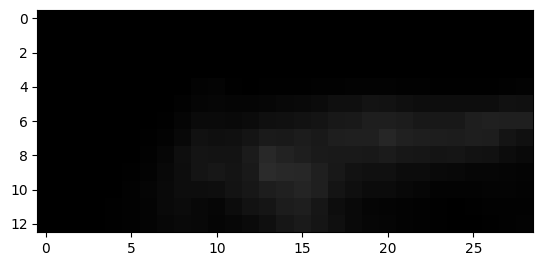

1027


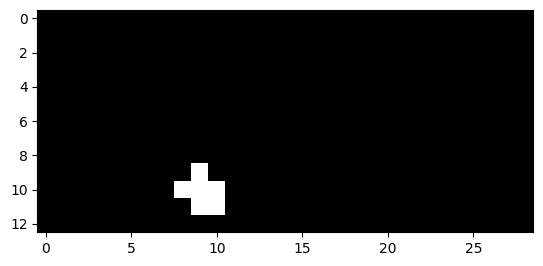

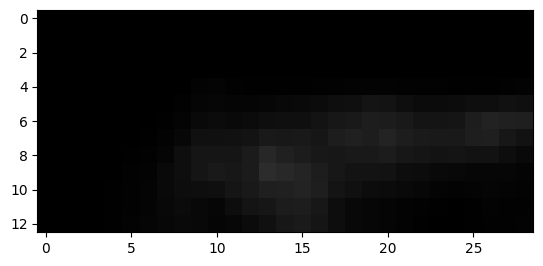

1028


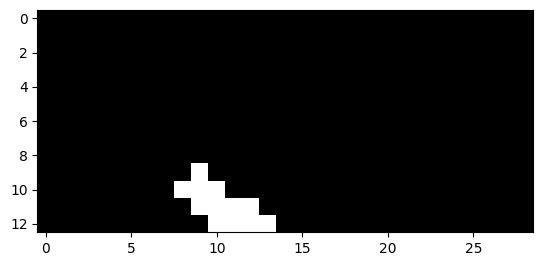

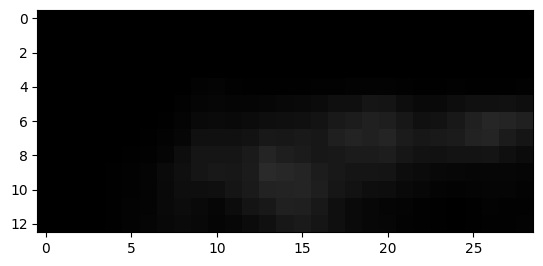

1029


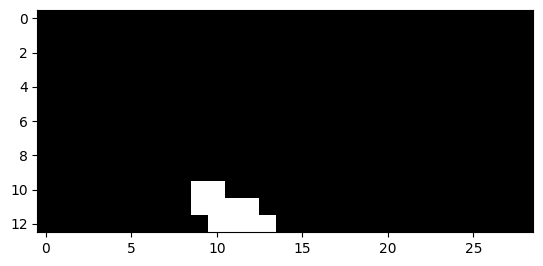

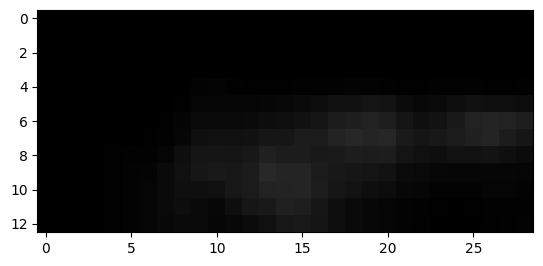

1039


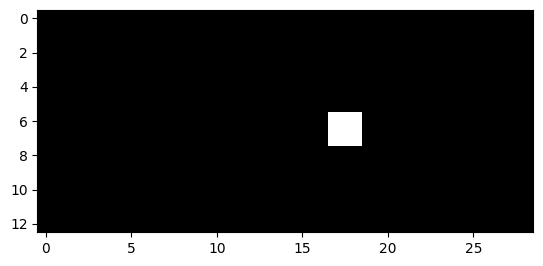

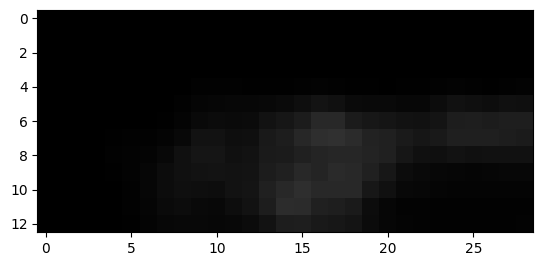

1040


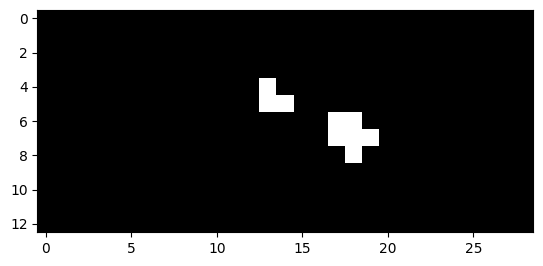

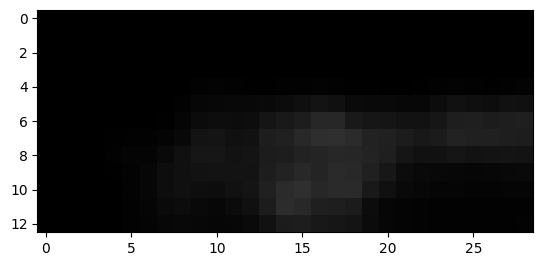

1041


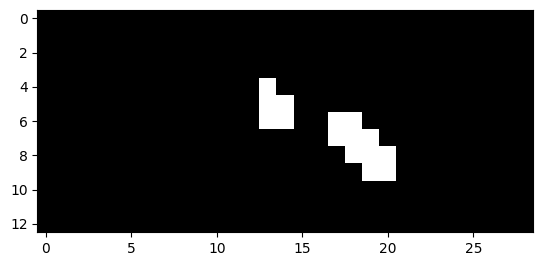

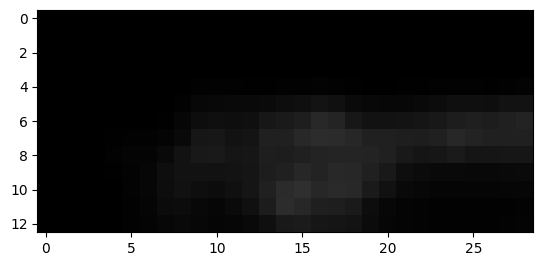

1042


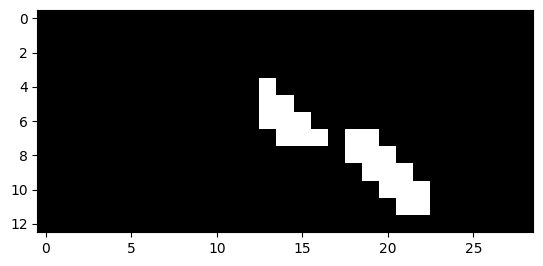

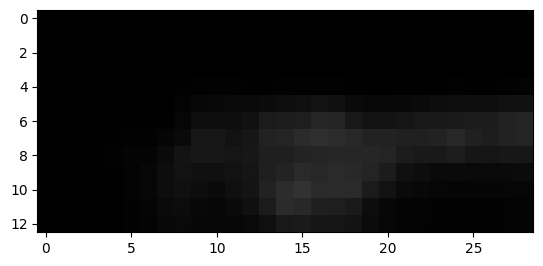

1043


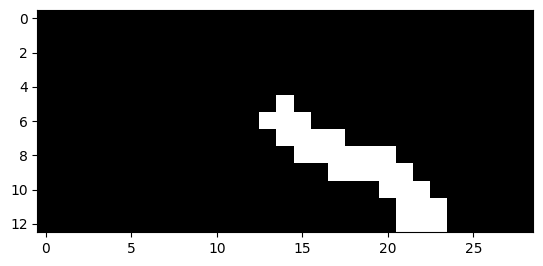

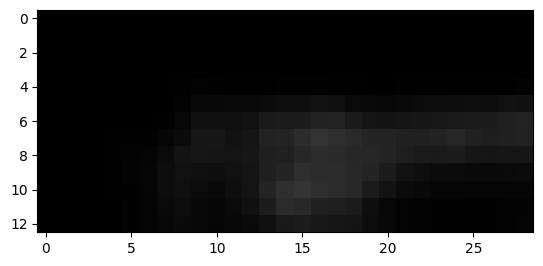

1044


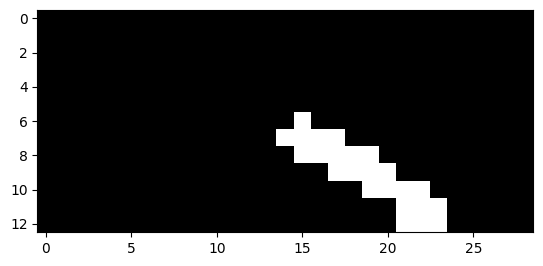

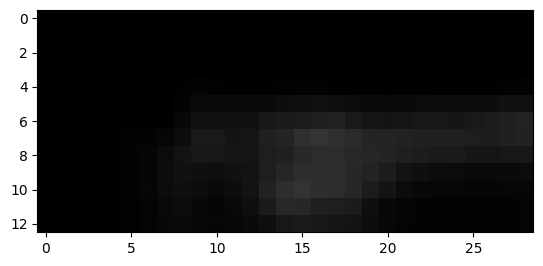

1045


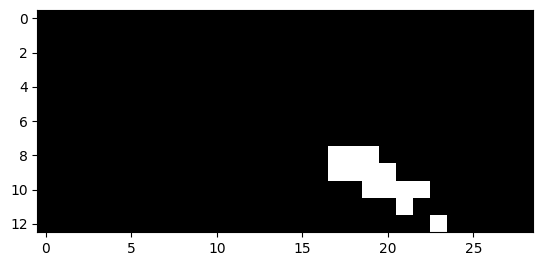

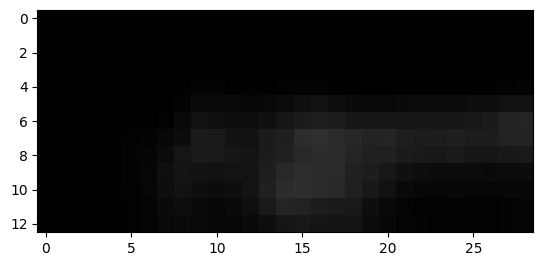

1046


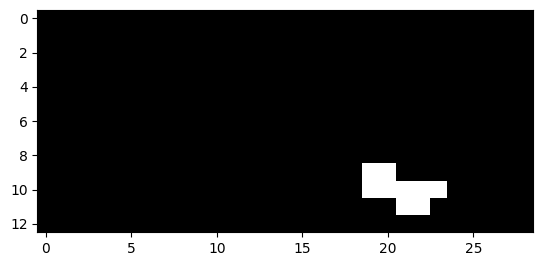

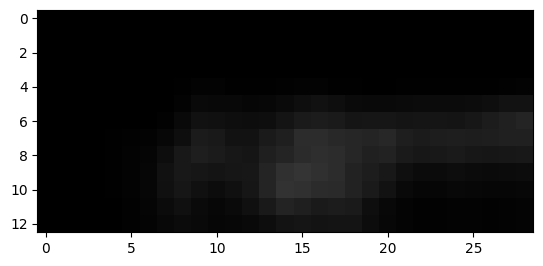

1047


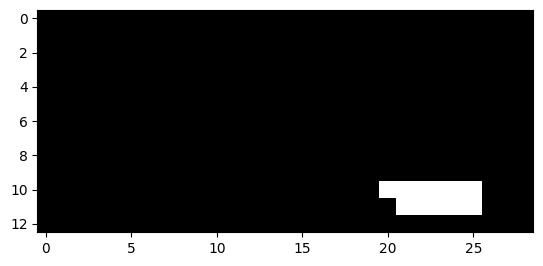

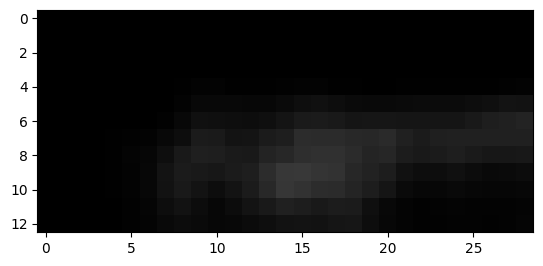

1048


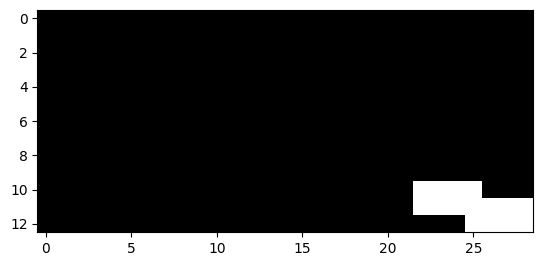

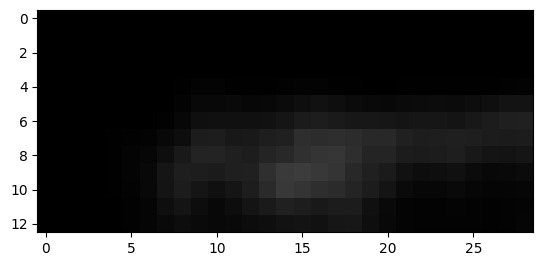

1049


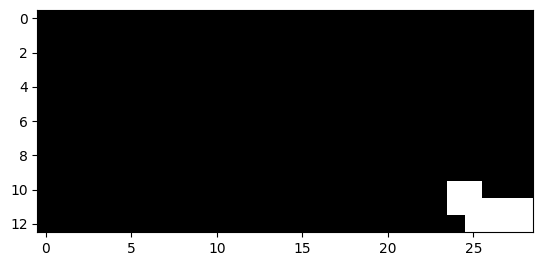

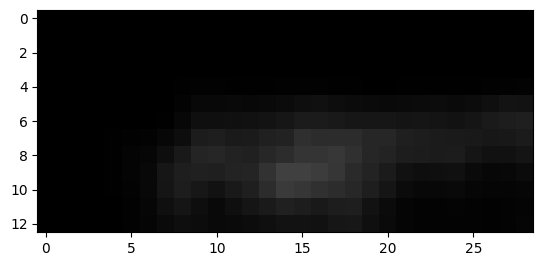

1050


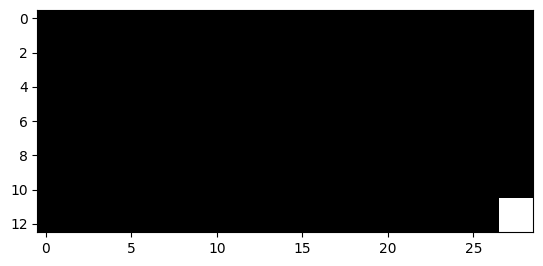

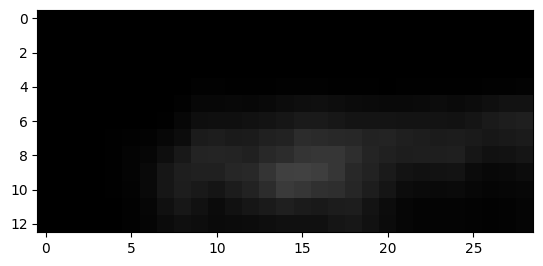

1064


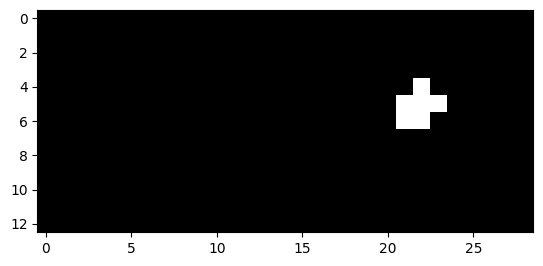

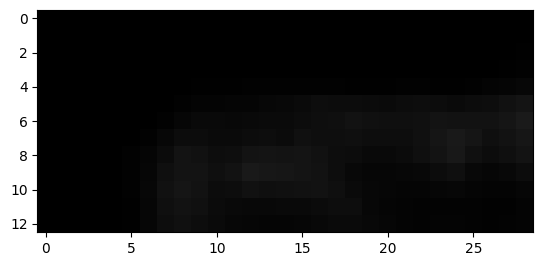

1065


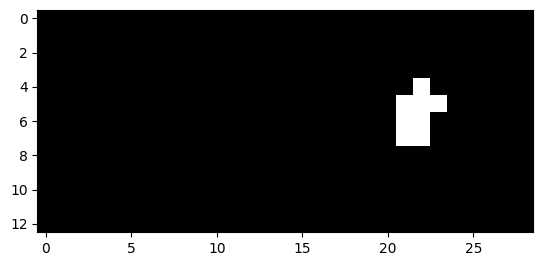

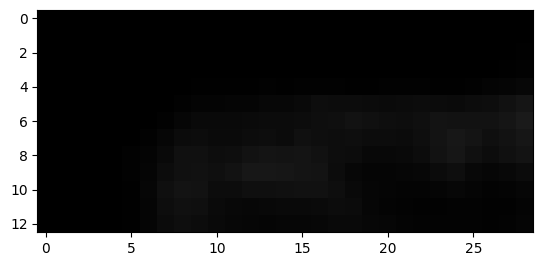

1066


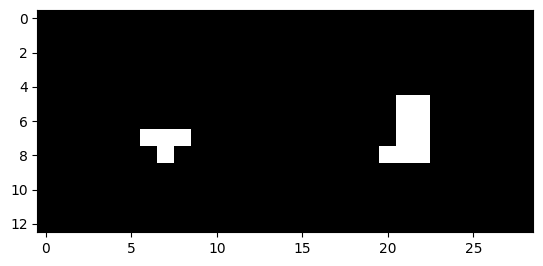

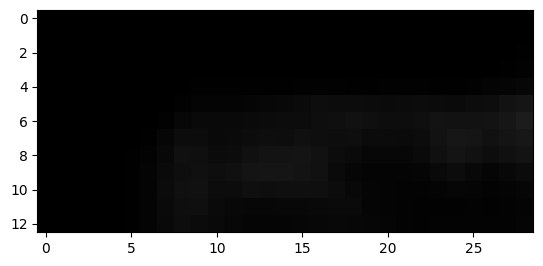

1067


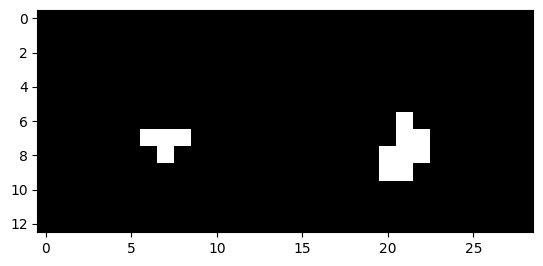

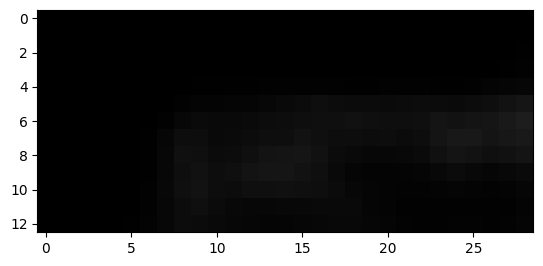

1068


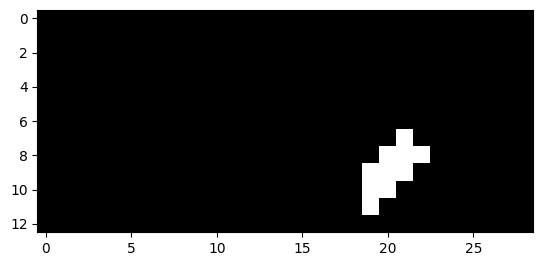

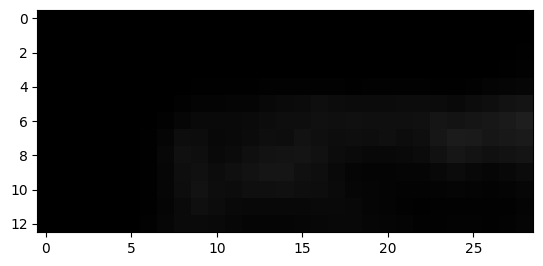

1069


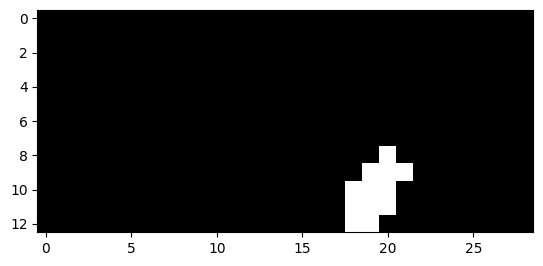

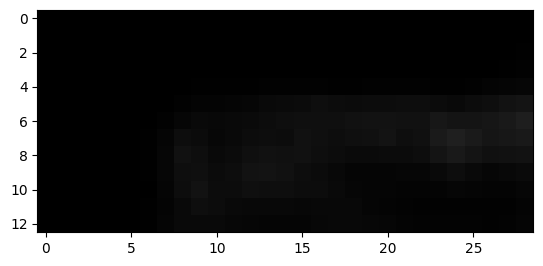

1070


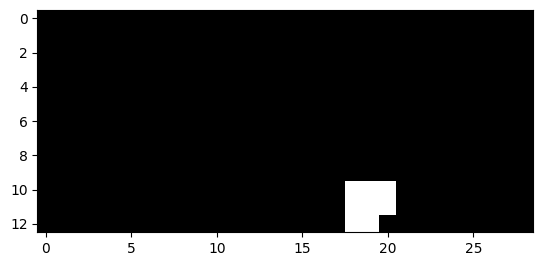

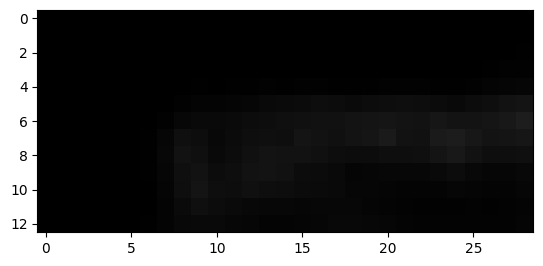

1071


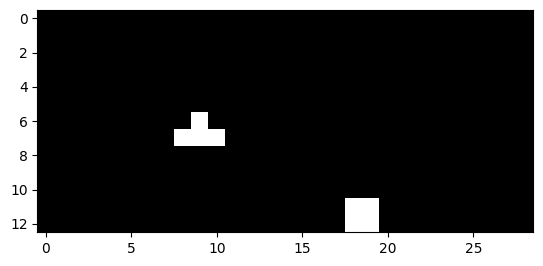

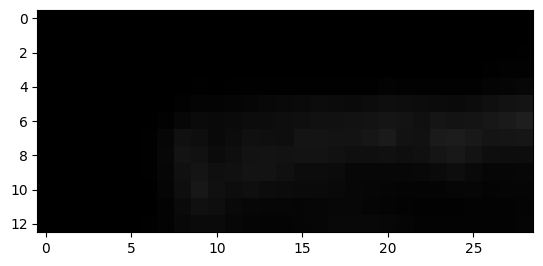

1072


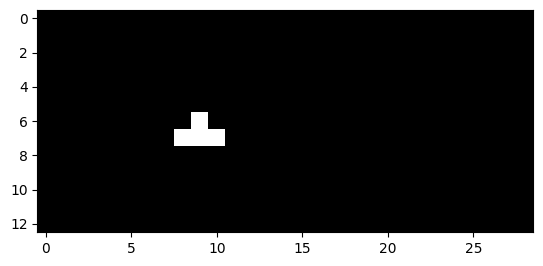

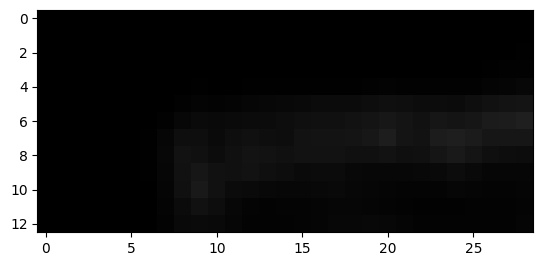

1073


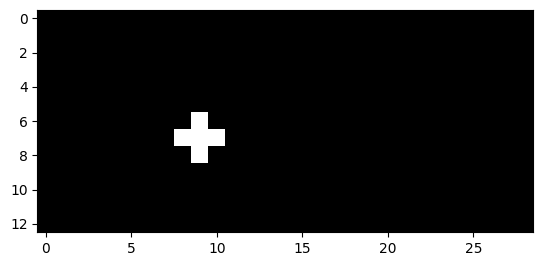

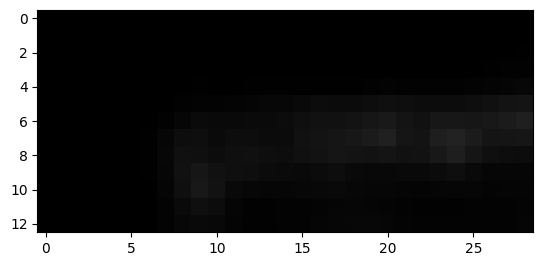

1074


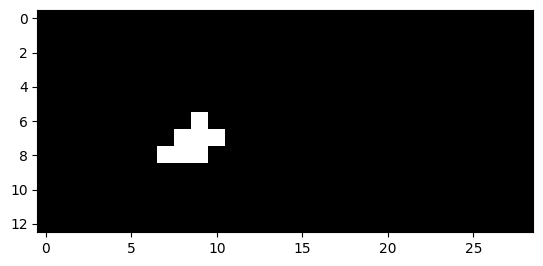

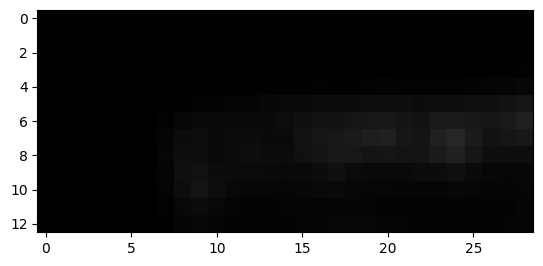

1075


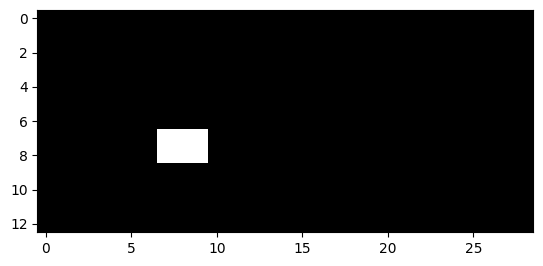

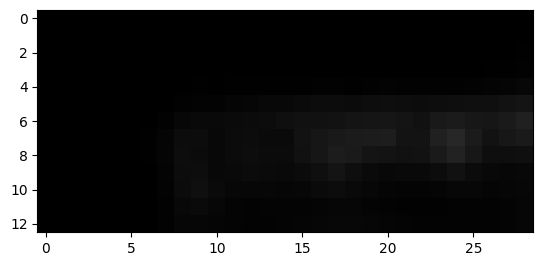

1076


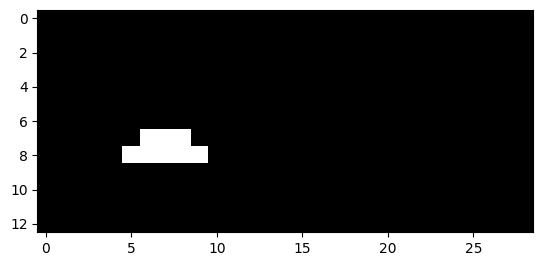

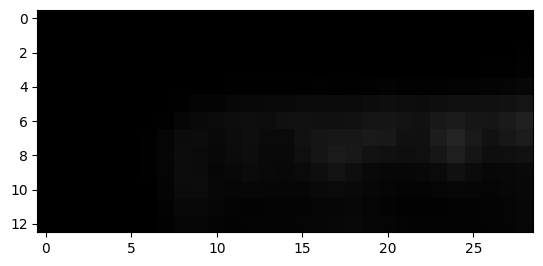

1077


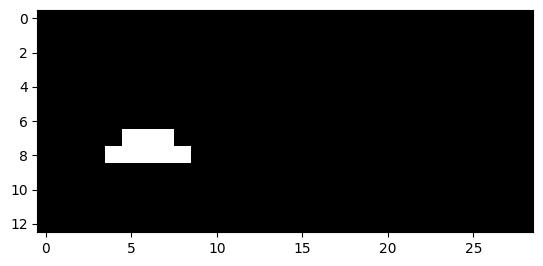

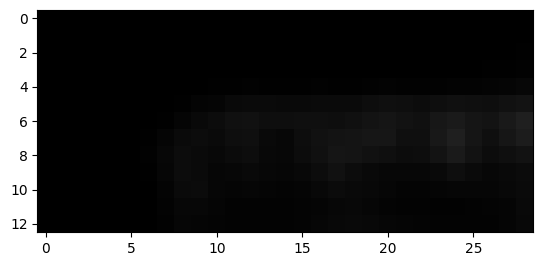

1078


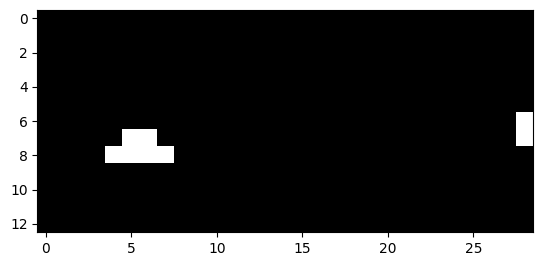

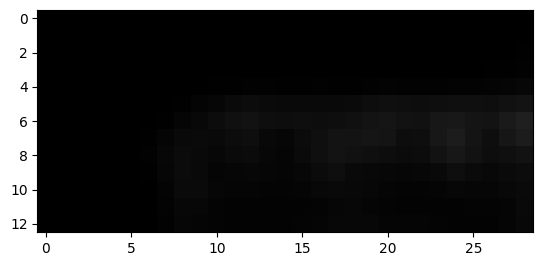

1079


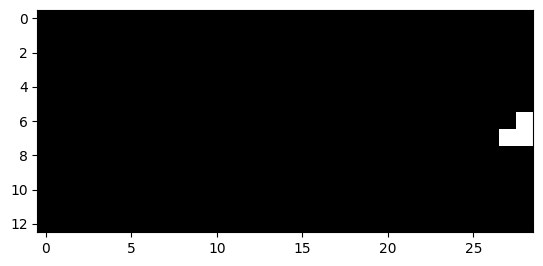

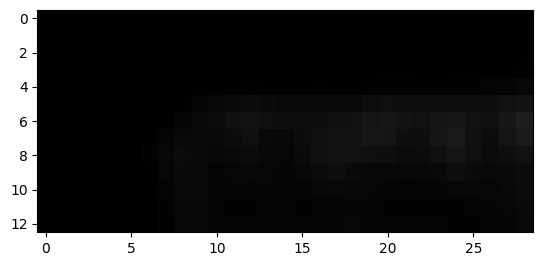

1080


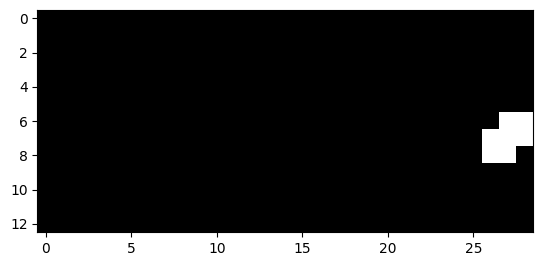

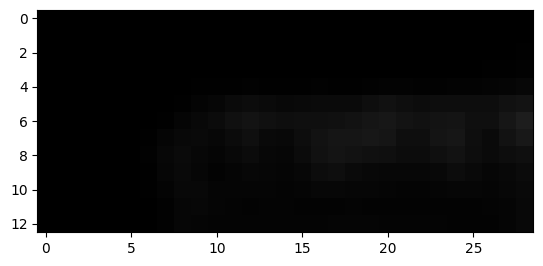

1081


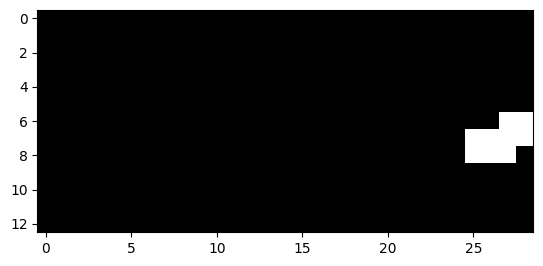

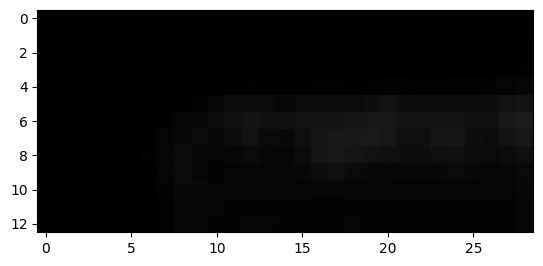

1082


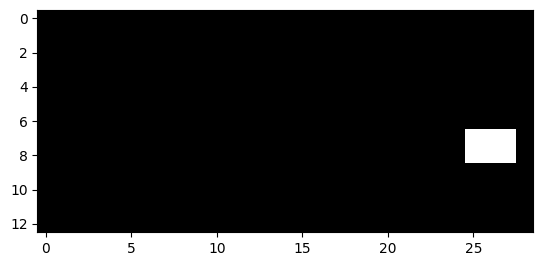

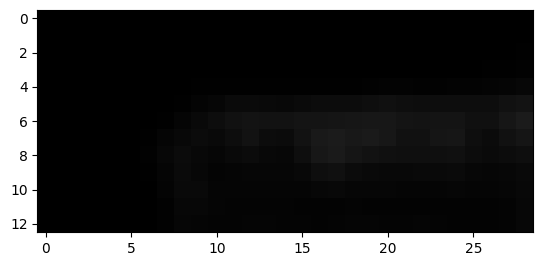

1083


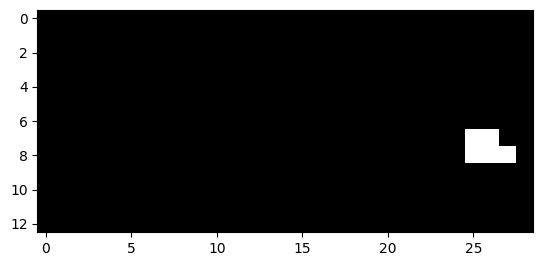

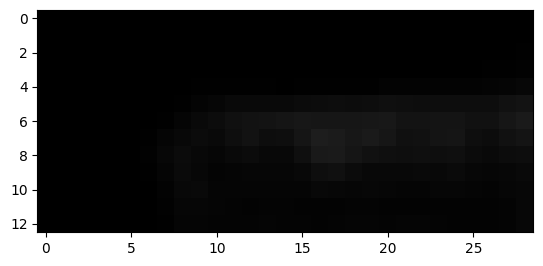

1084


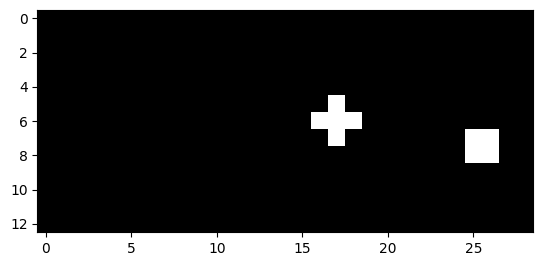

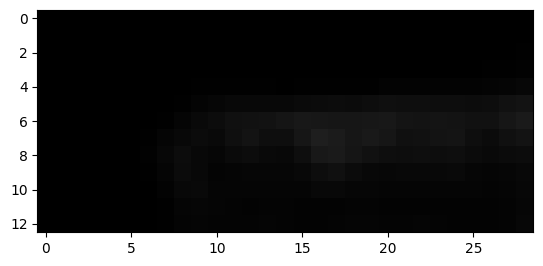

1085


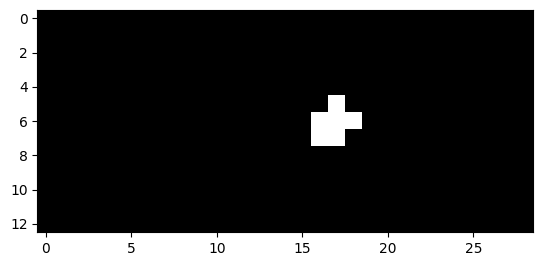

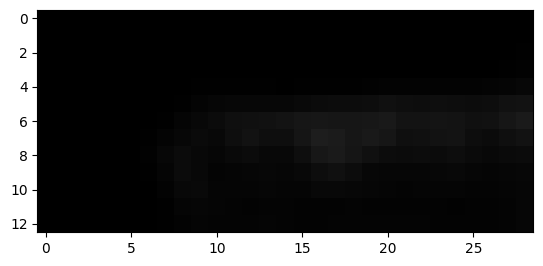

1086


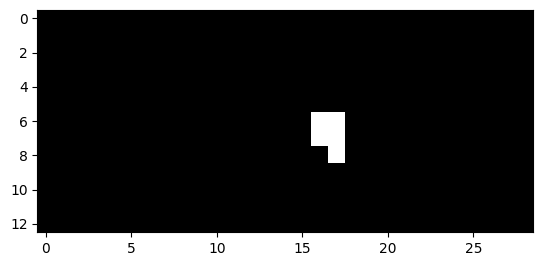

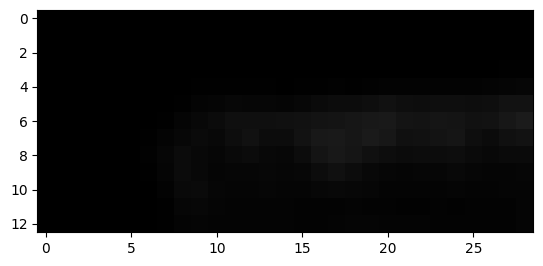

1087


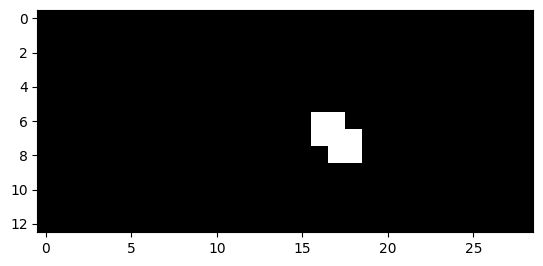

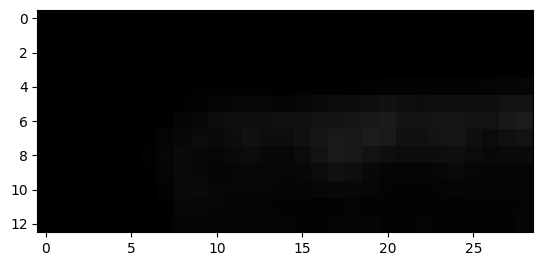

1088


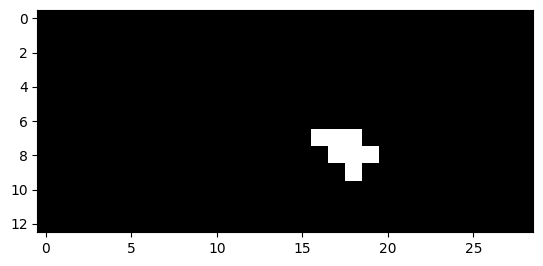

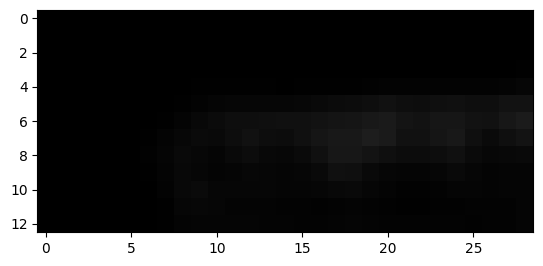

1089


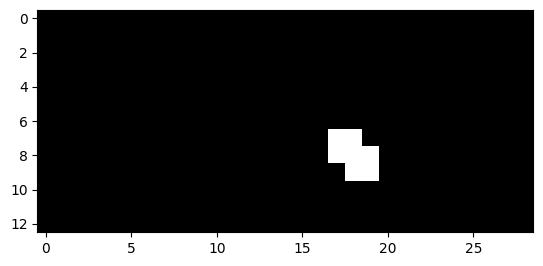

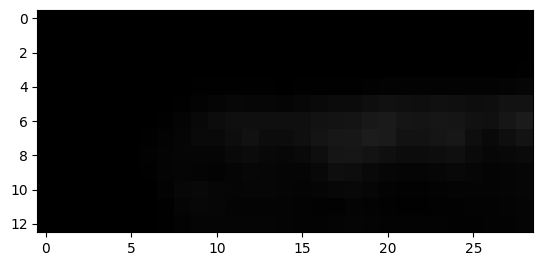

1090


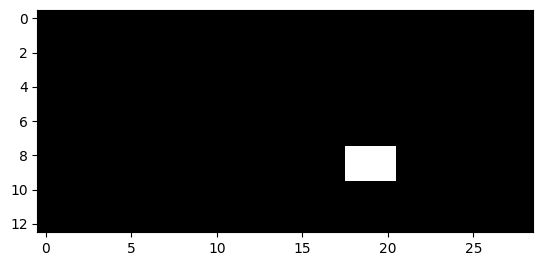

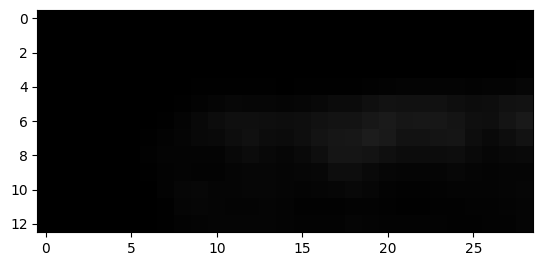

1091


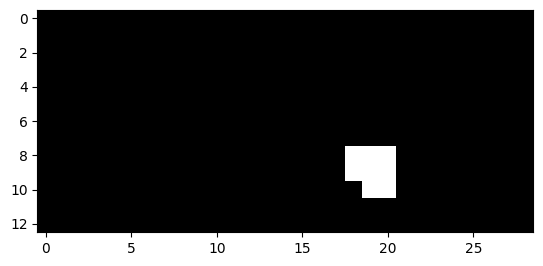

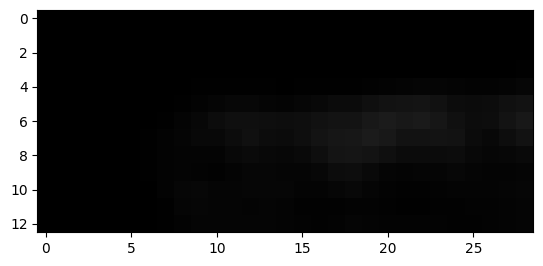

1092


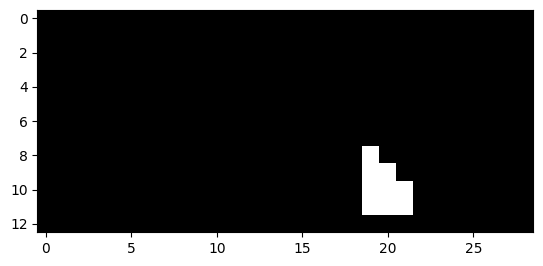

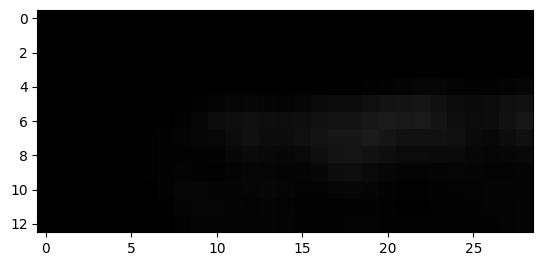

1093


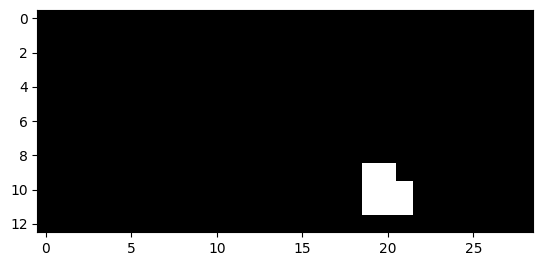

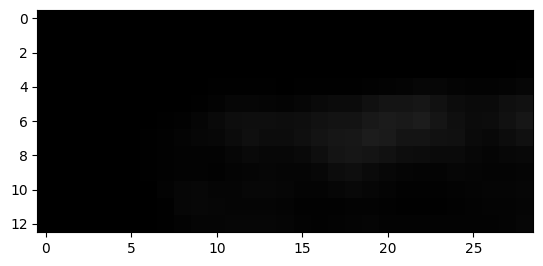

1094


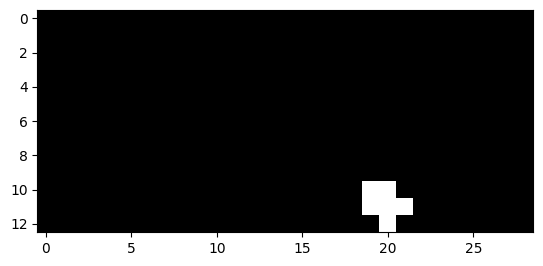

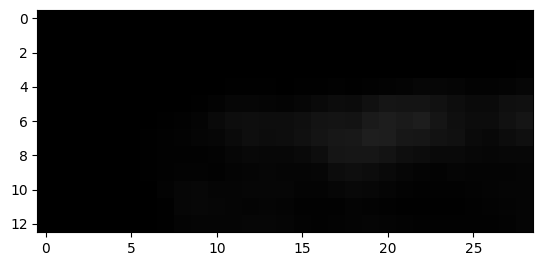

1095


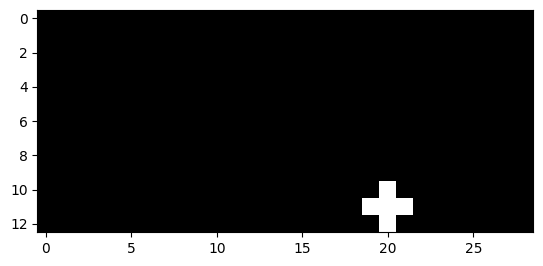

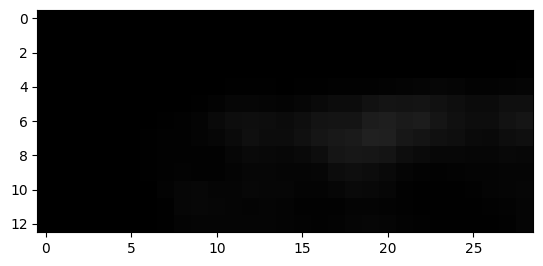

1116


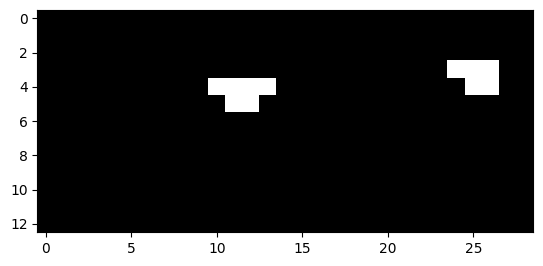

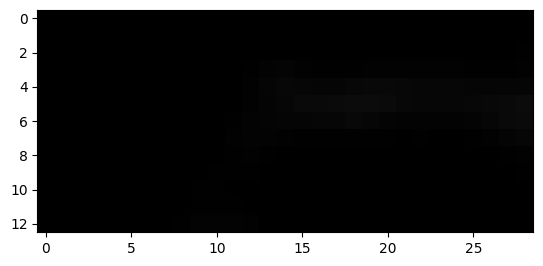

1117


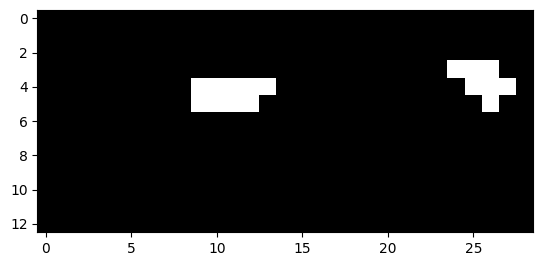

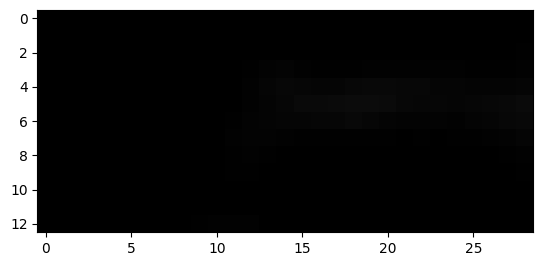

1118


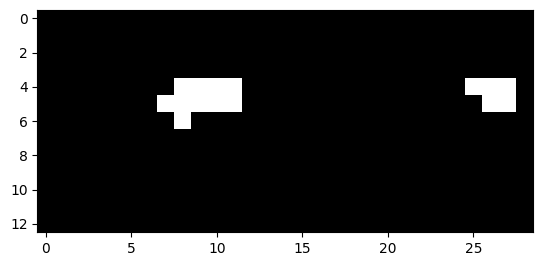

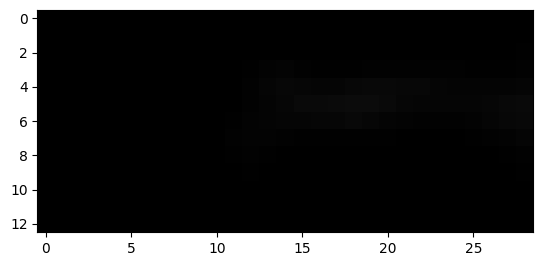

1119


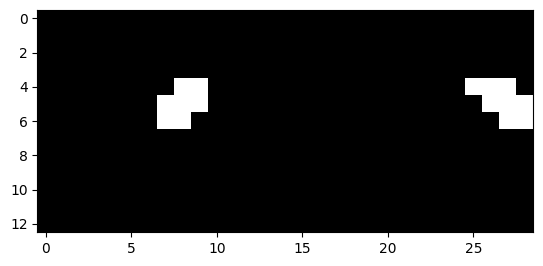

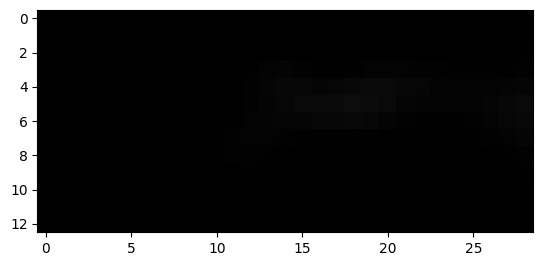

1120


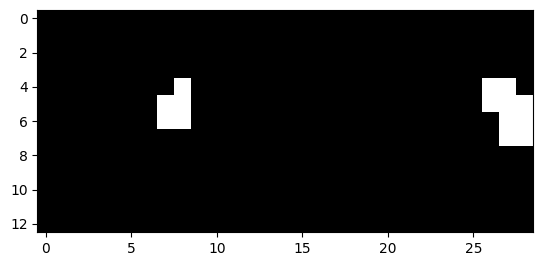

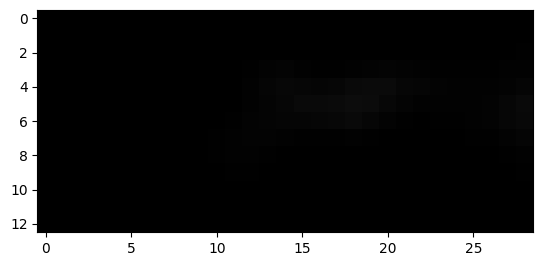

1121


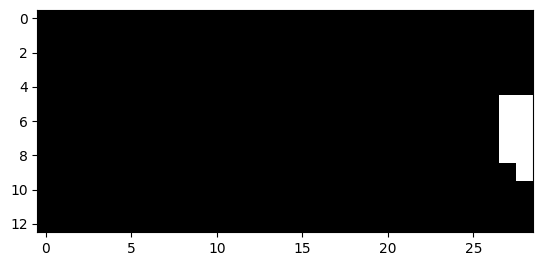

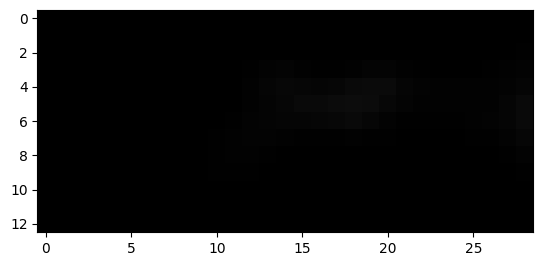

1122


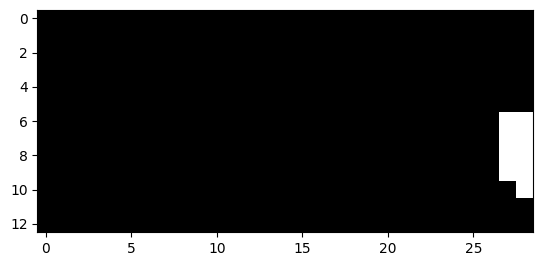

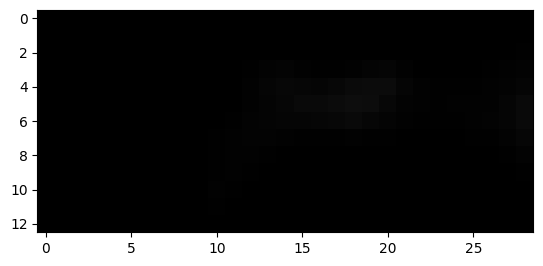

1123


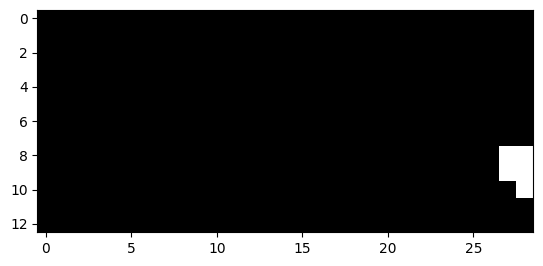

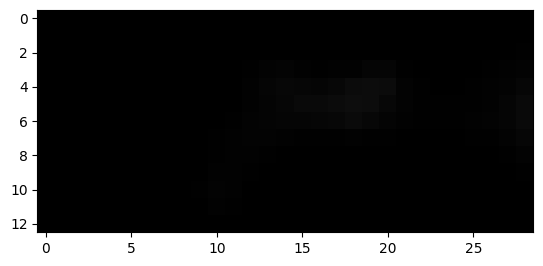

1341


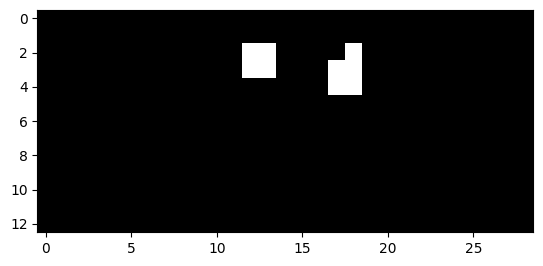

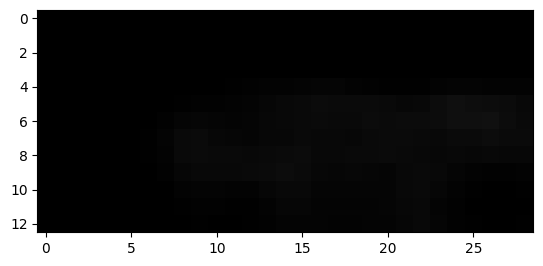

1342


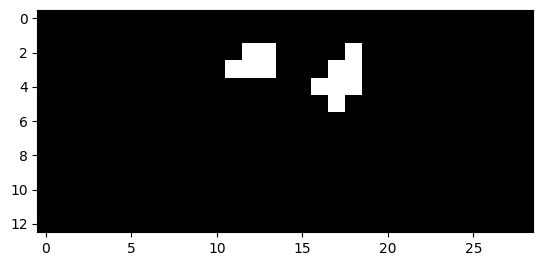

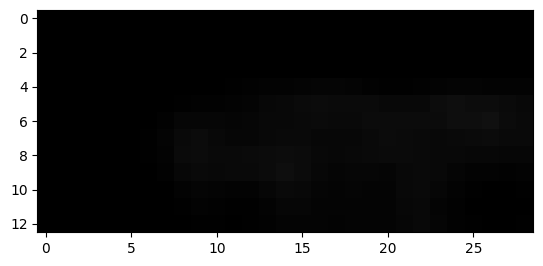

1343


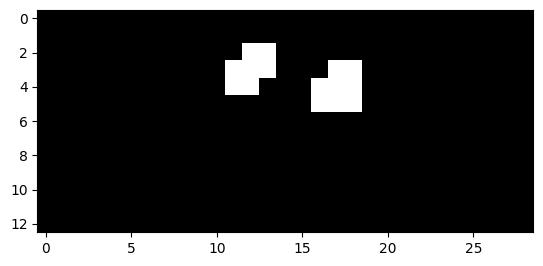

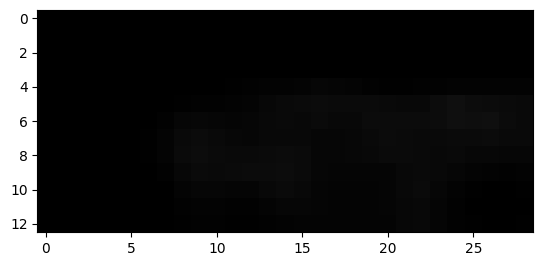

1344


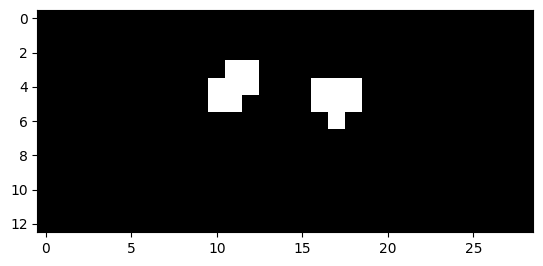

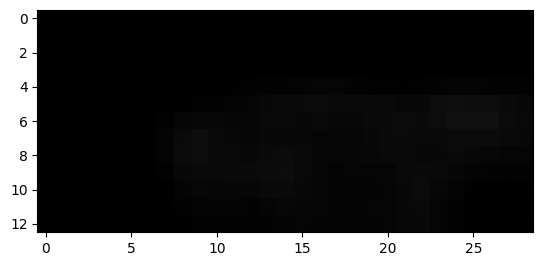

1345


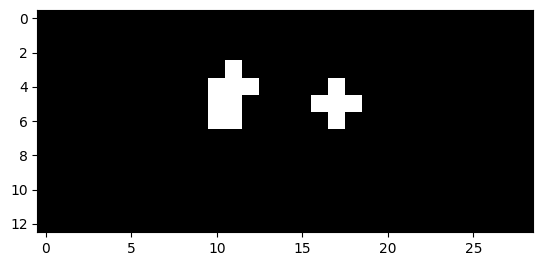

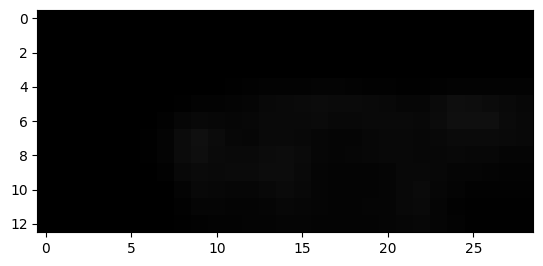

1346


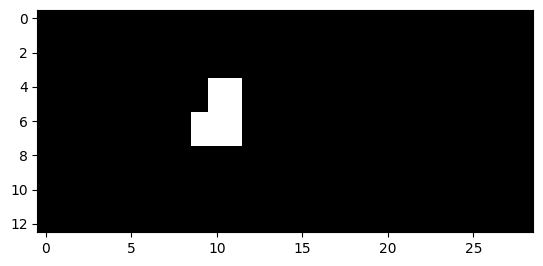

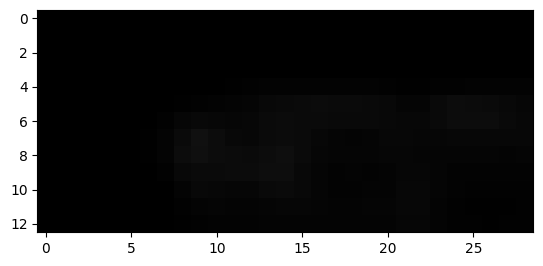

1347


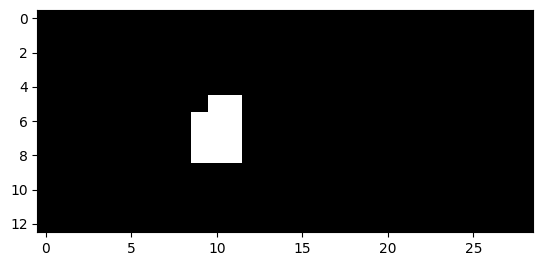

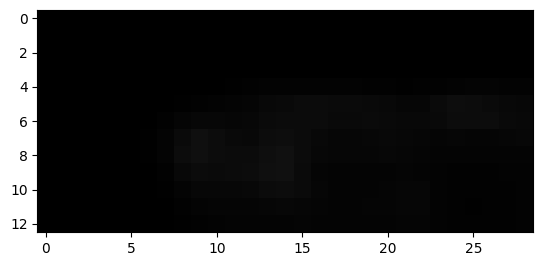

1348


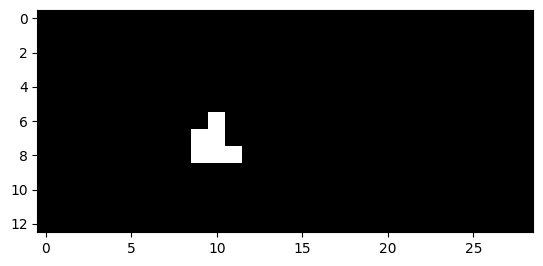

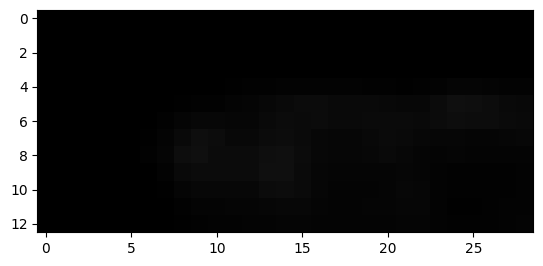

1366


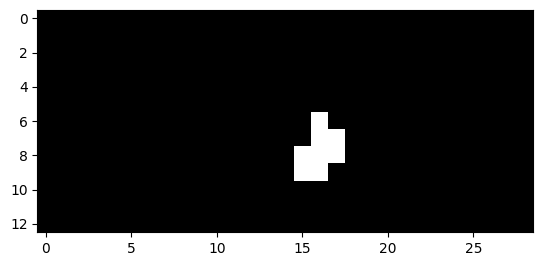

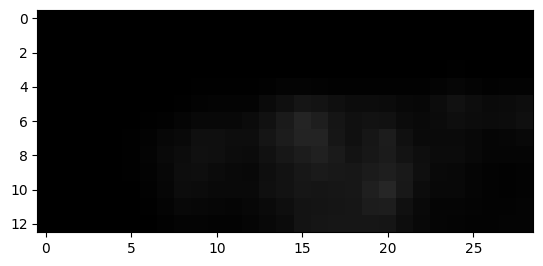

1367


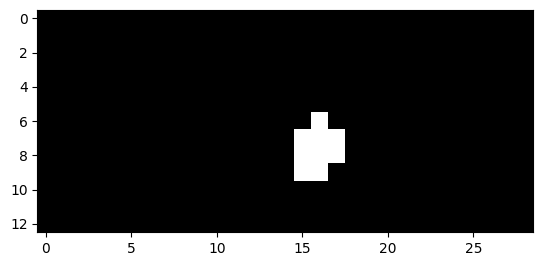

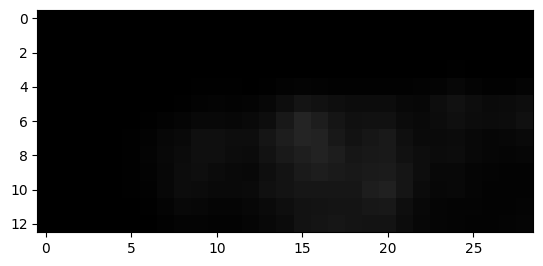

1368


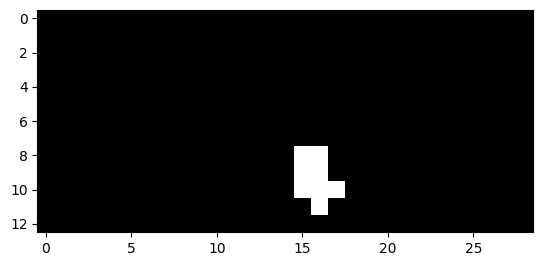

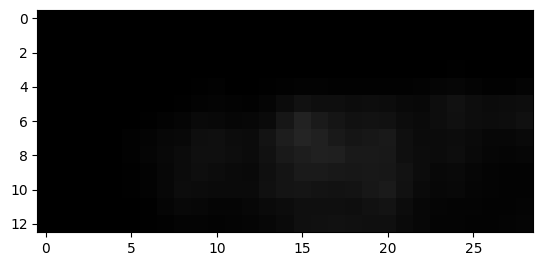

1369


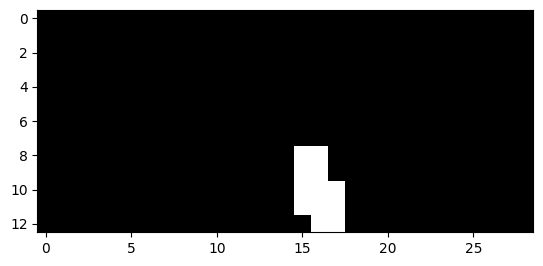

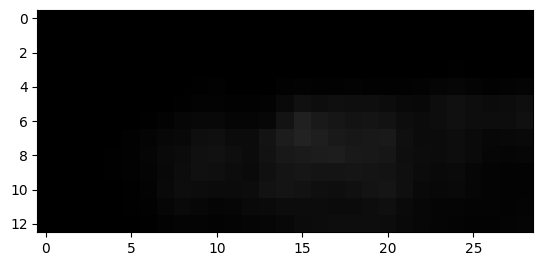

1370


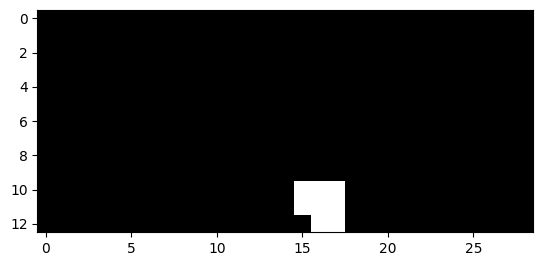

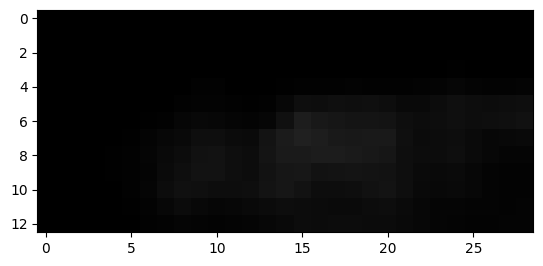

1371


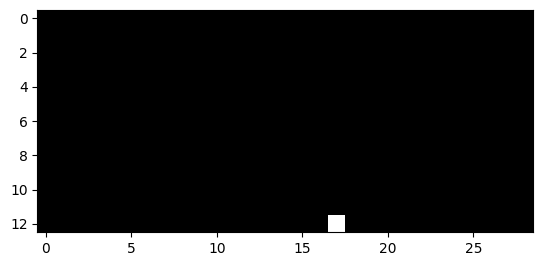

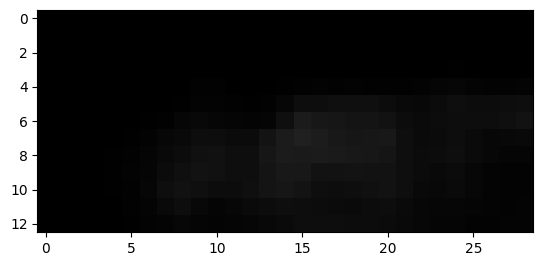

1389


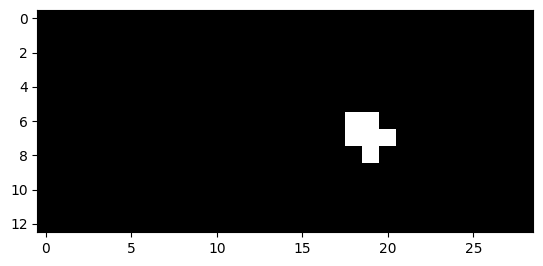

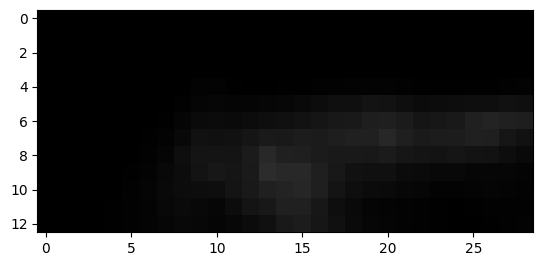

1390


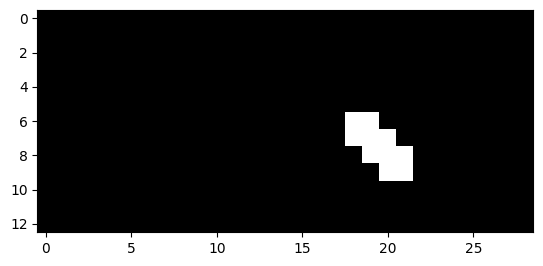

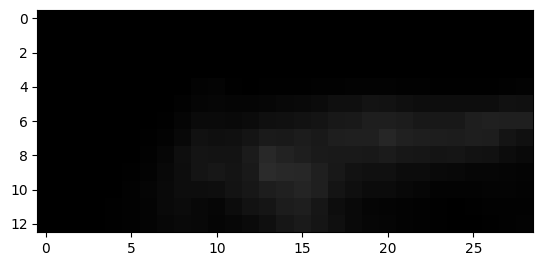

1391


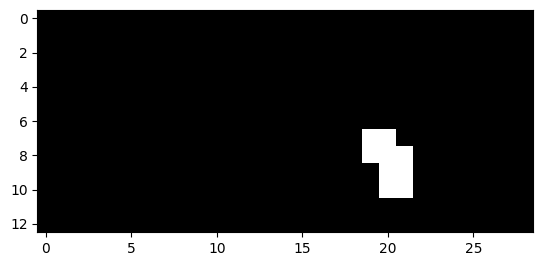

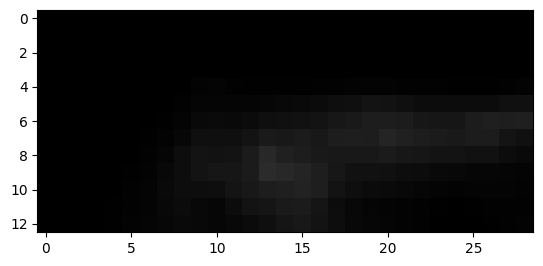

1392


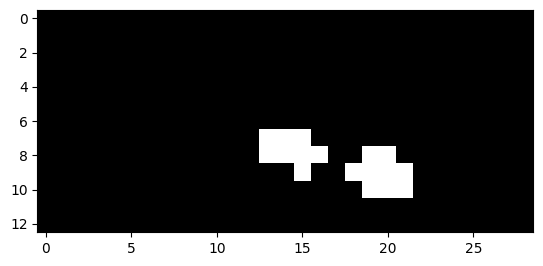

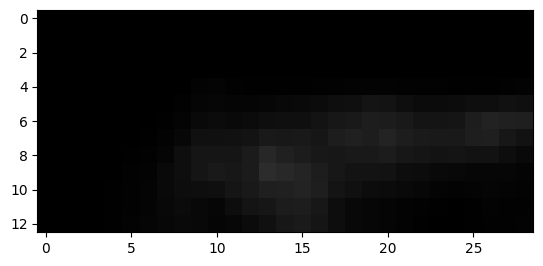

1393


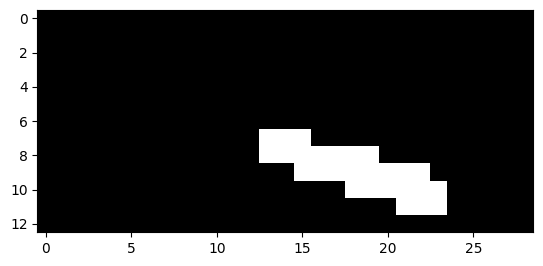

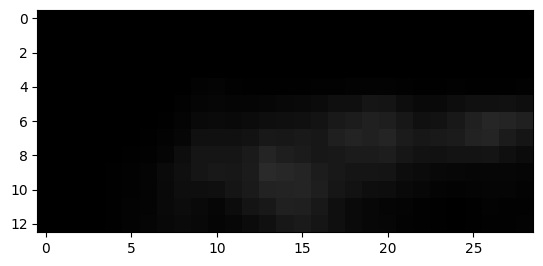

1394


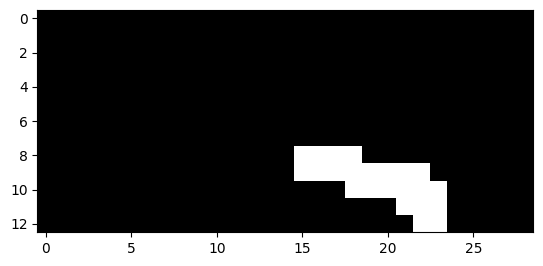

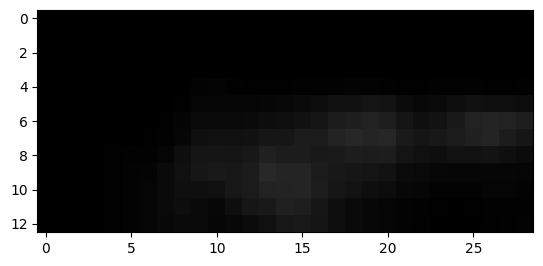

1395


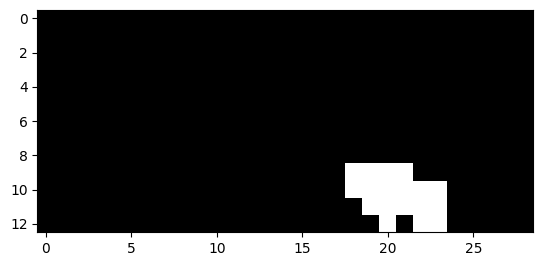

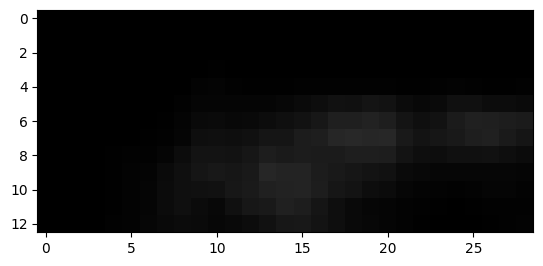

1396


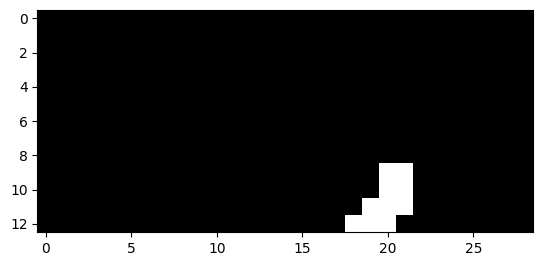

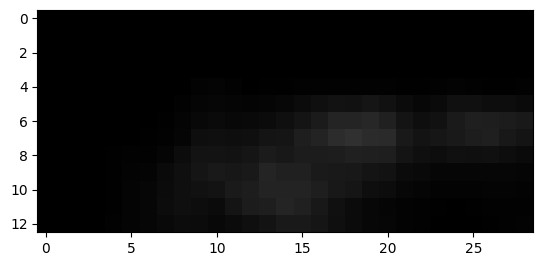

1397


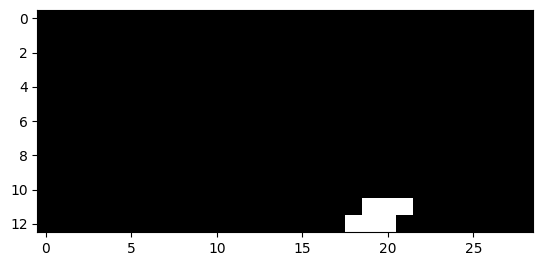

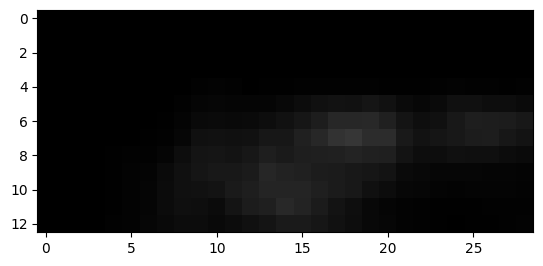

1398


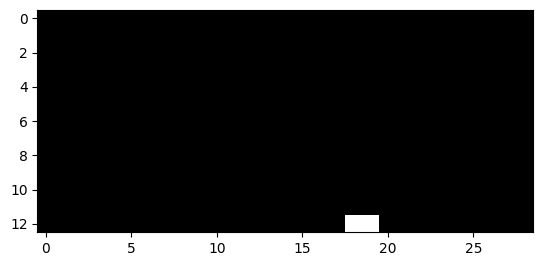

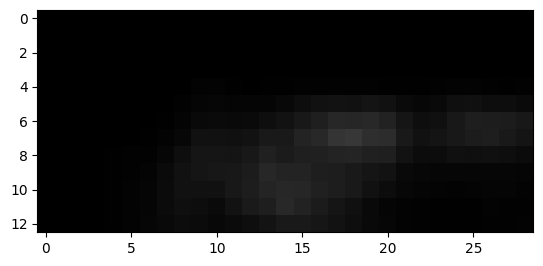

1403


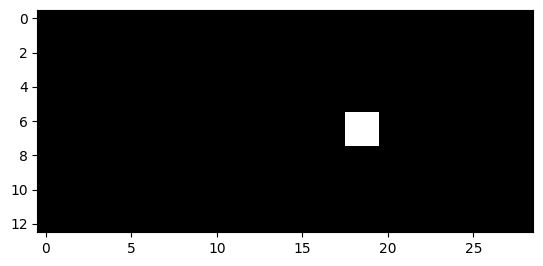

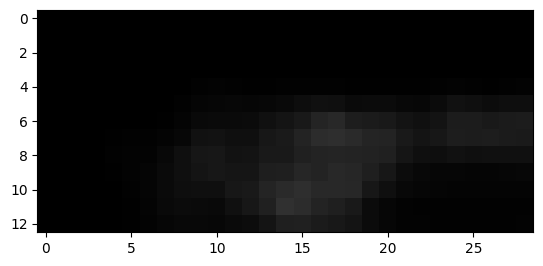

1404


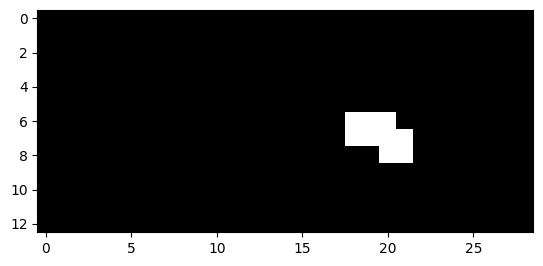

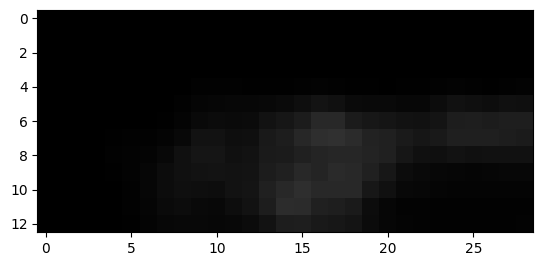

1405


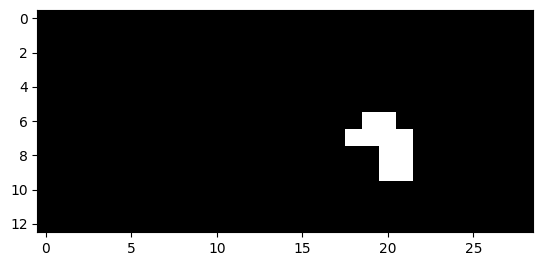

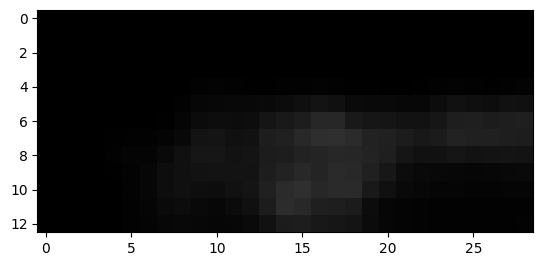

1406


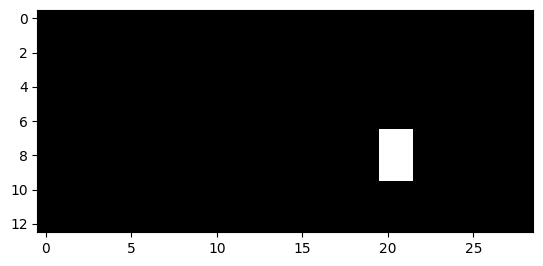

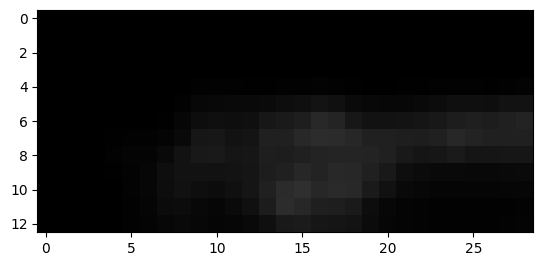

1407


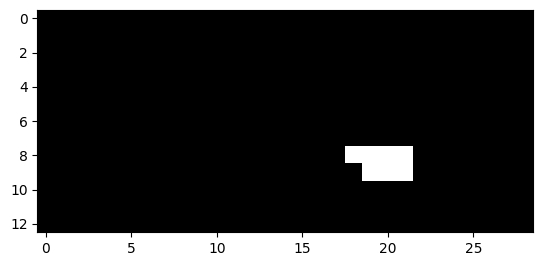

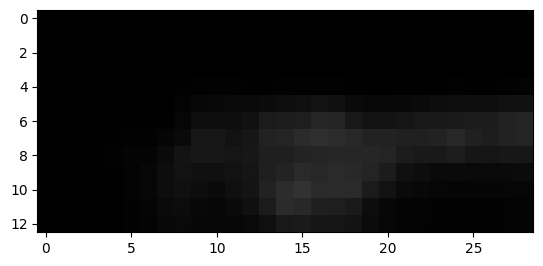

1408


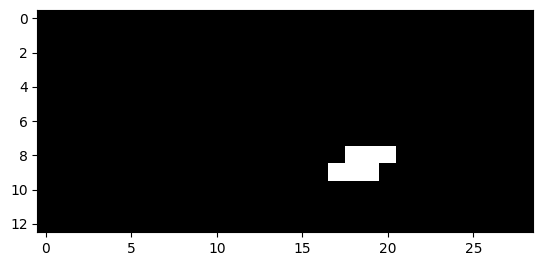

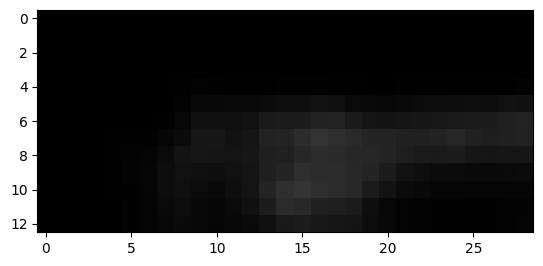

1409


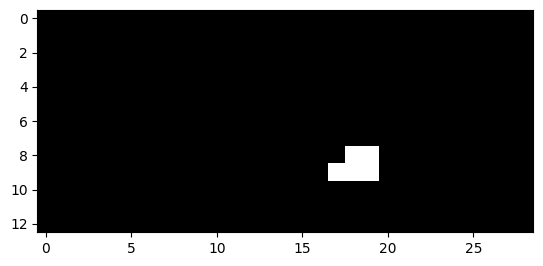

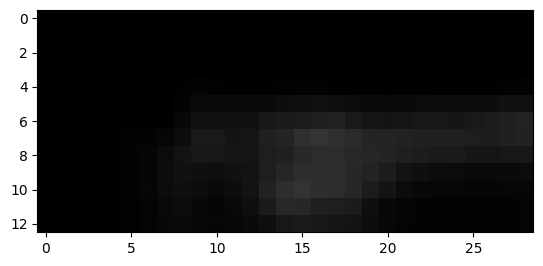

1412


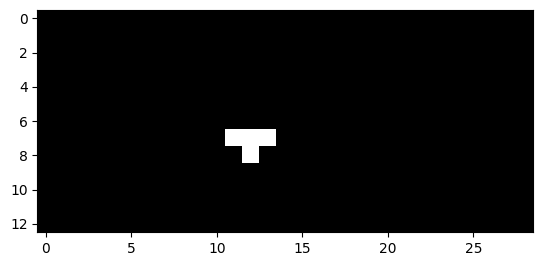

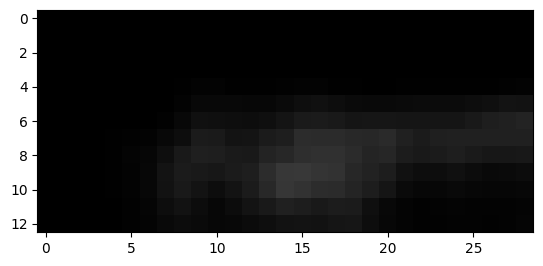

1413


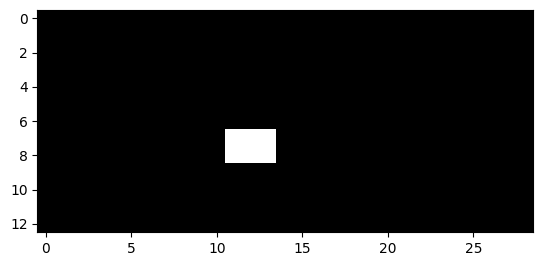

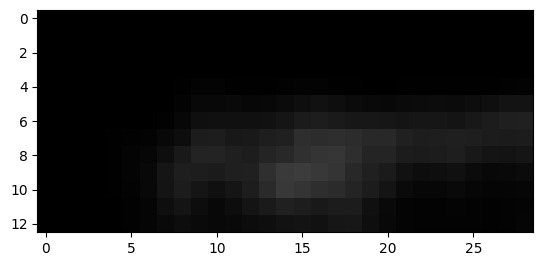

1414


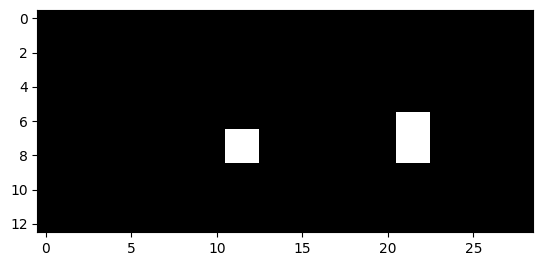

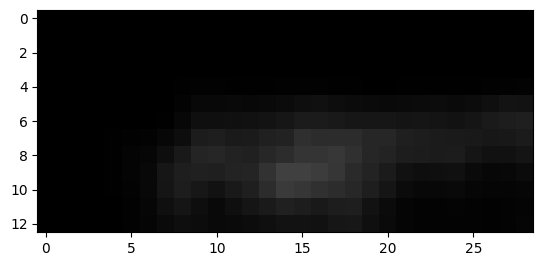

1415


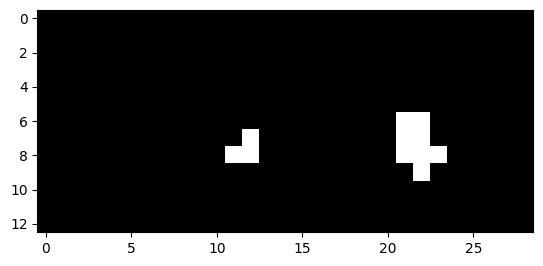

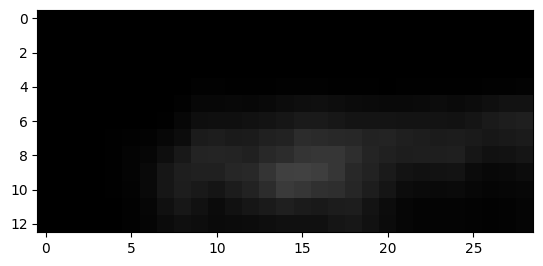

1416


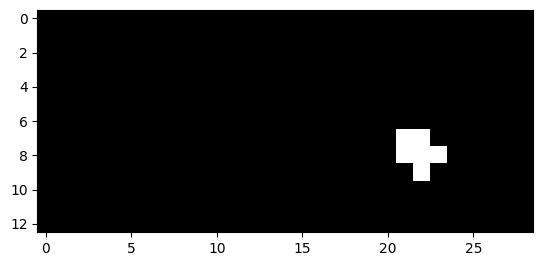

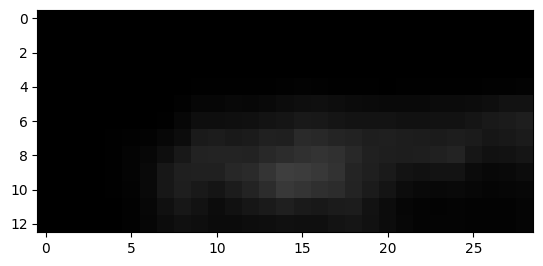

1417


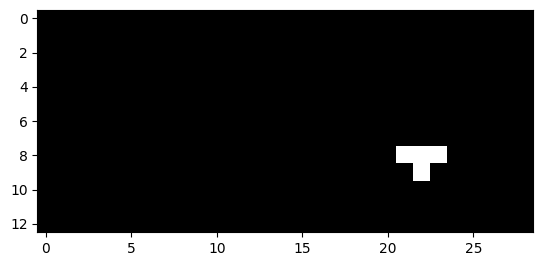

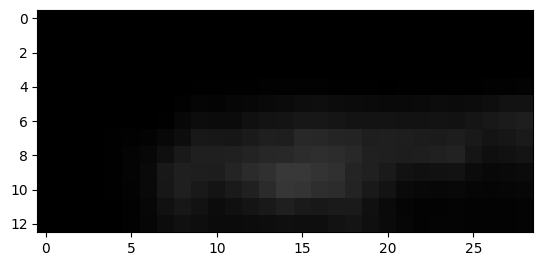

1419


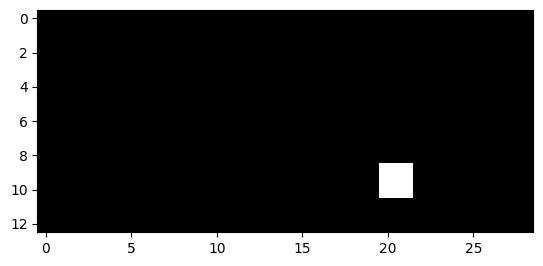

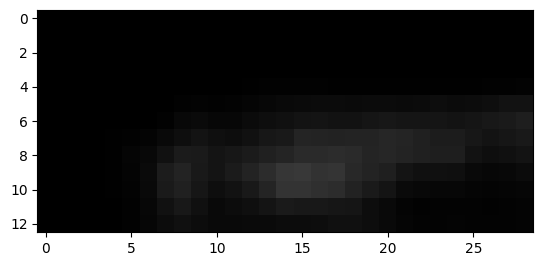

1420


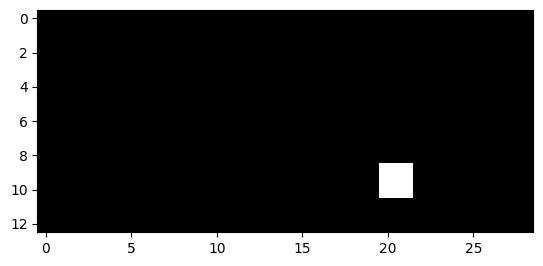

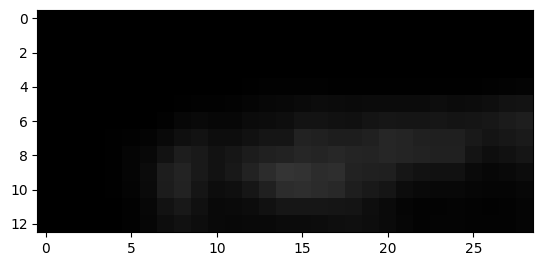

1441


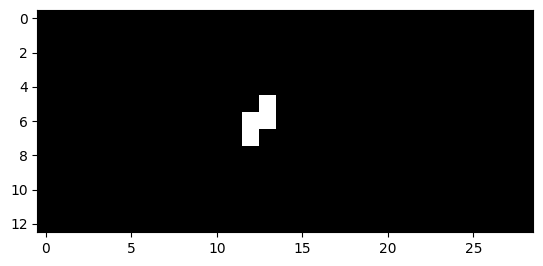

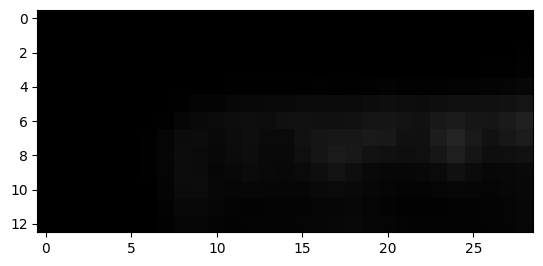

1442


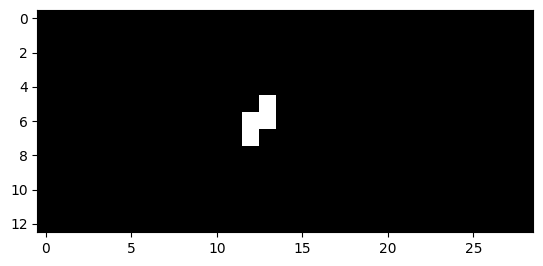

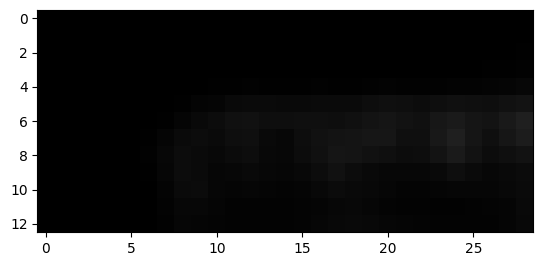

1443


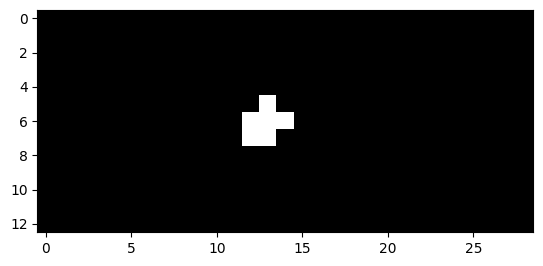

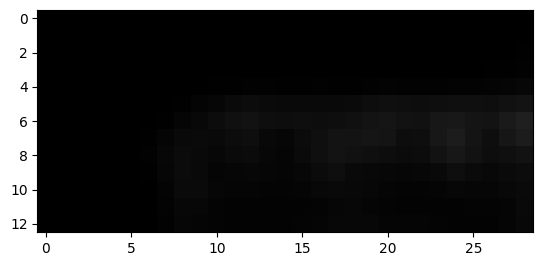

1444


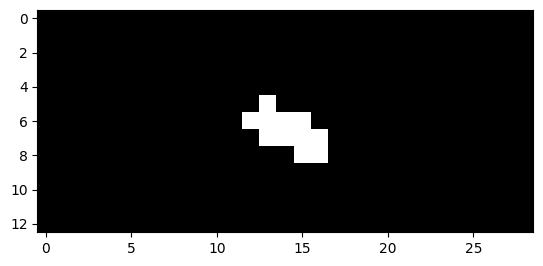

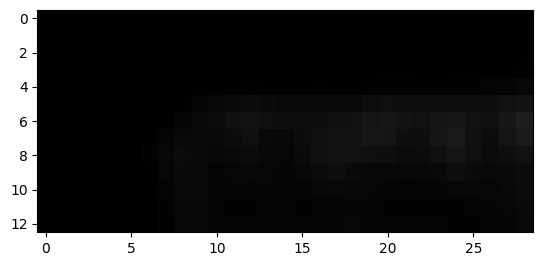

1445


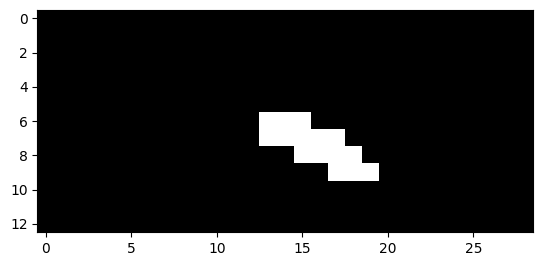

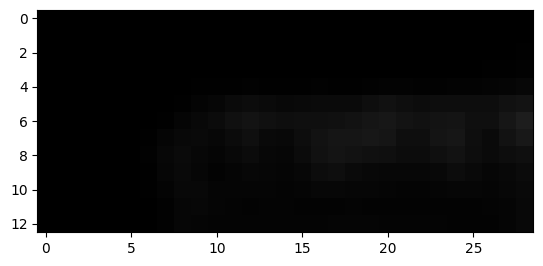

1446


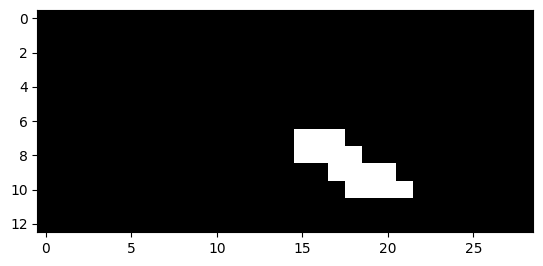

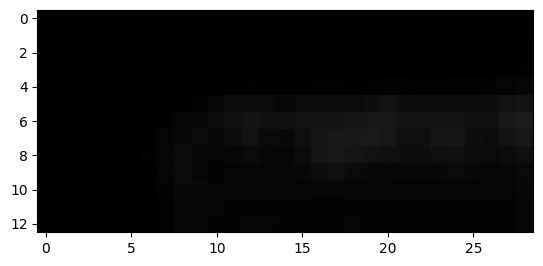

1447


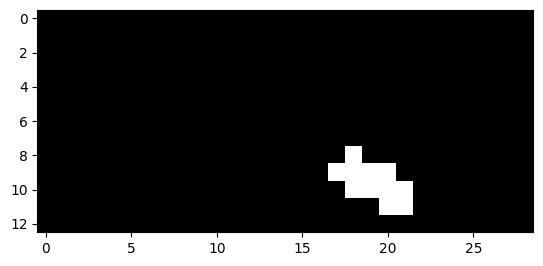

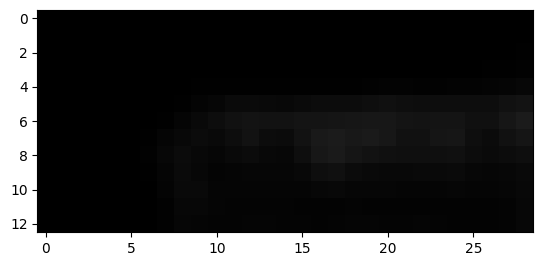

1448


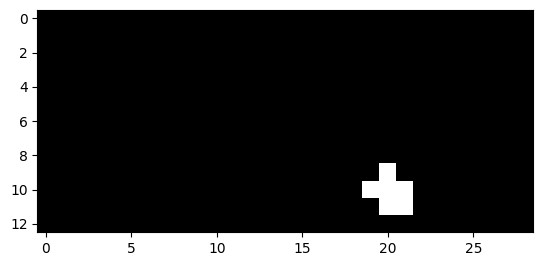

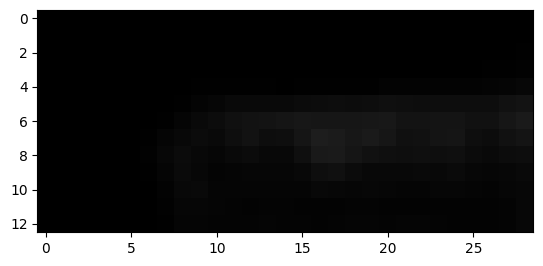

1460


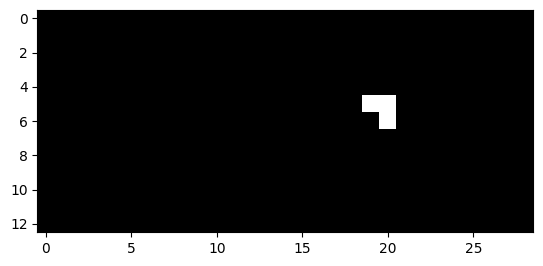

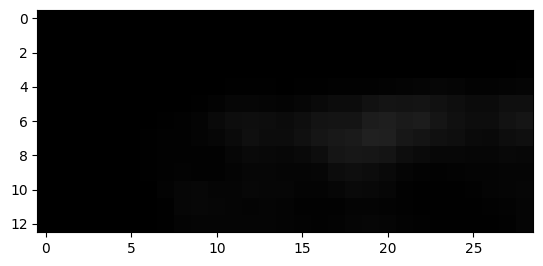

1461


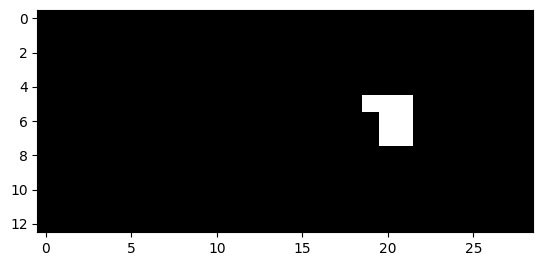

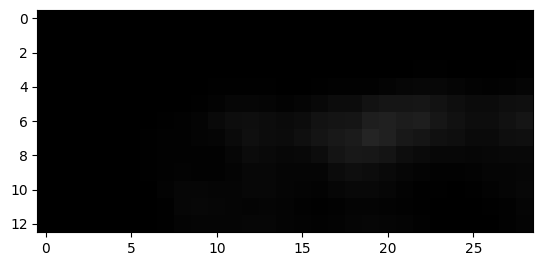

1462


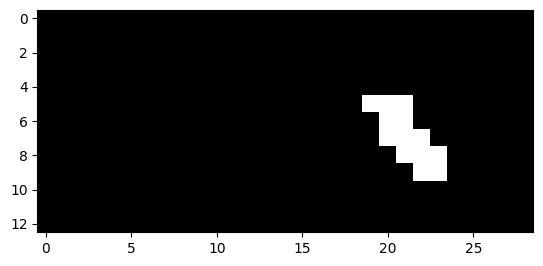

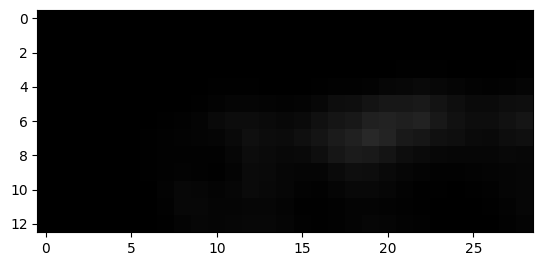

1463


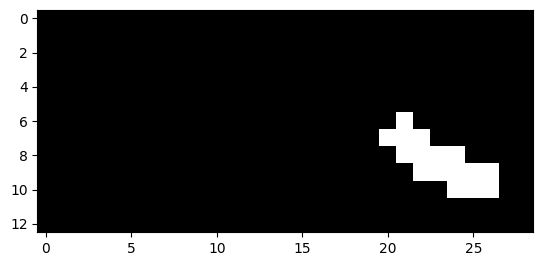

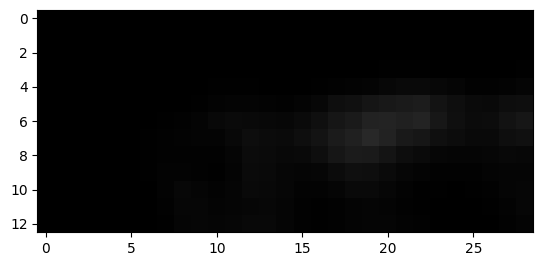

1464


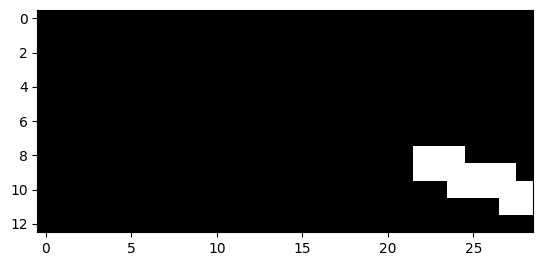

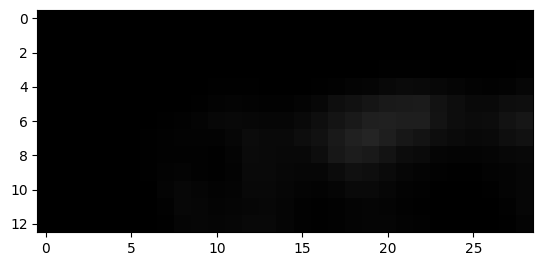

1465


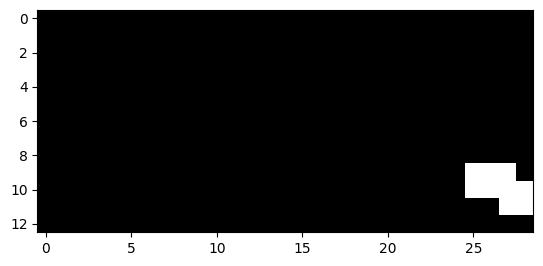

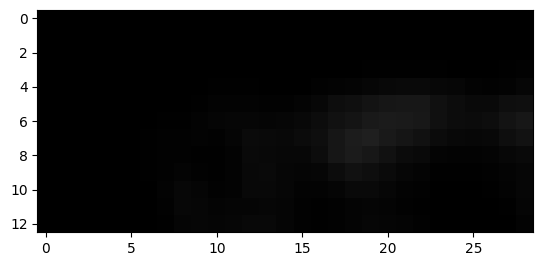

1466


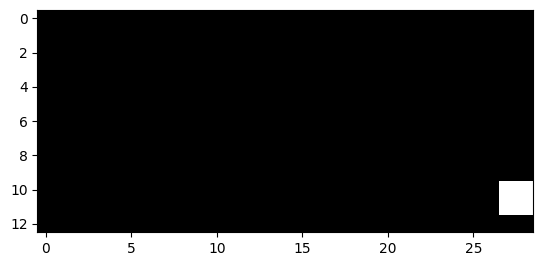

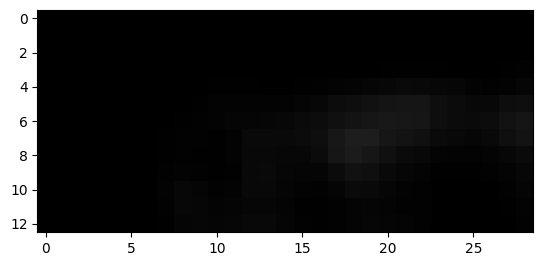

1473


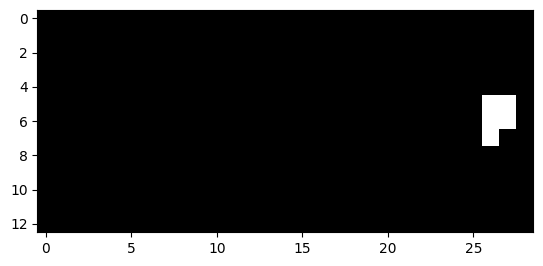

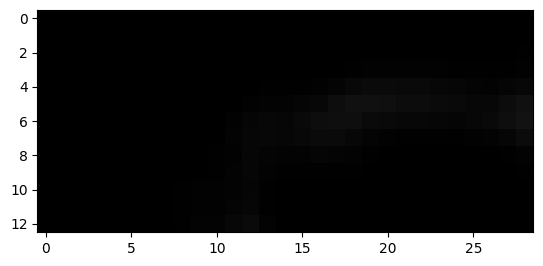

1474


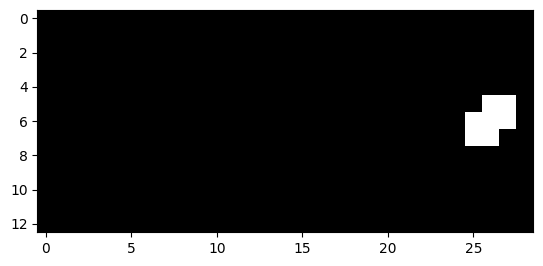

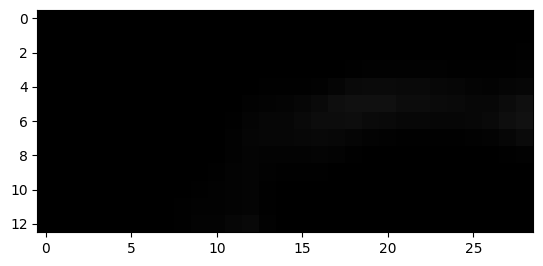

1475


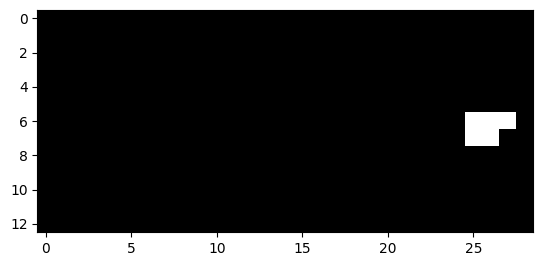

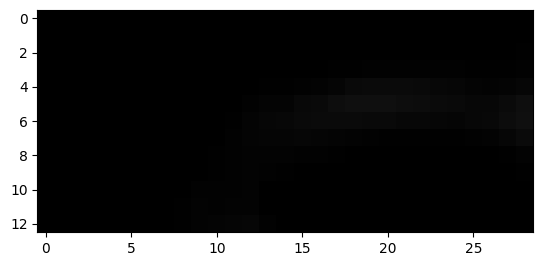

1509


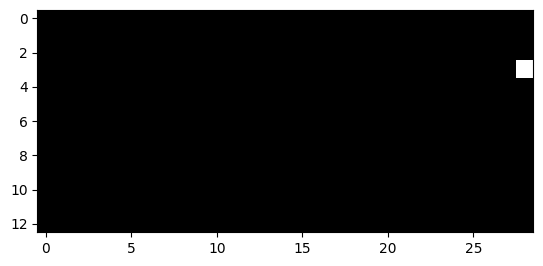

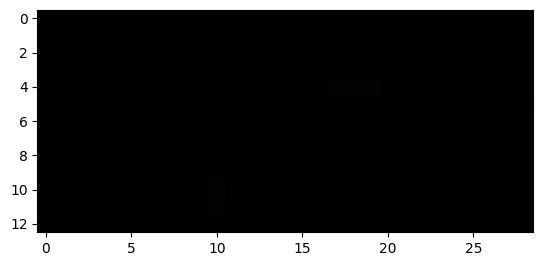

1510


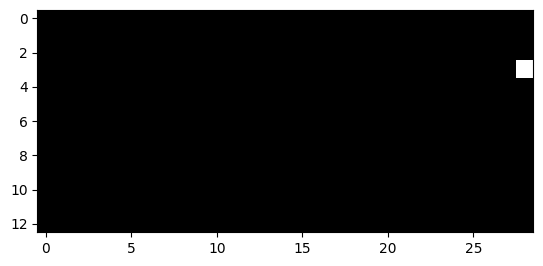

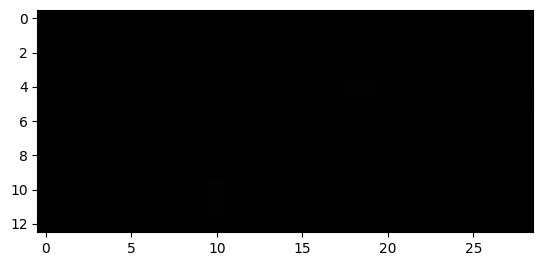

1511


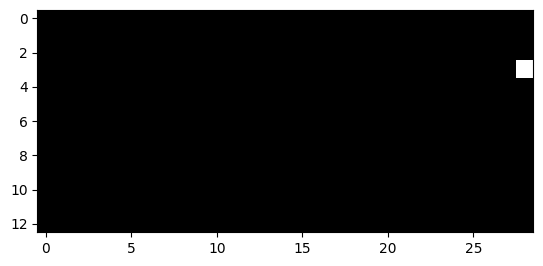

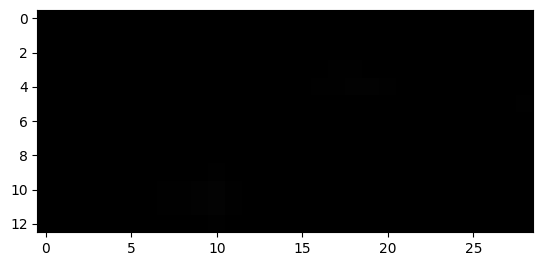

1687


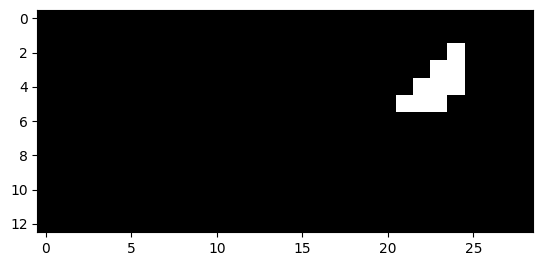

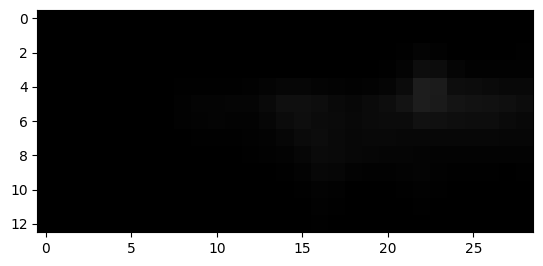

1688


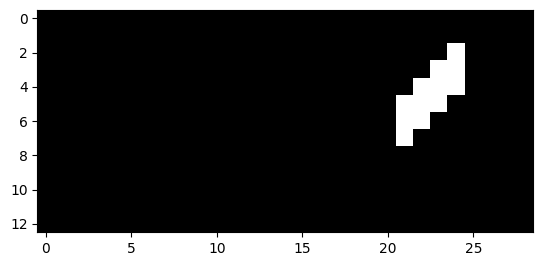

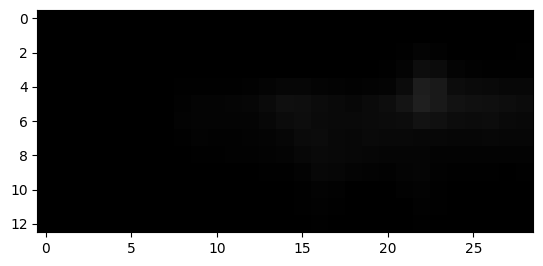

1689


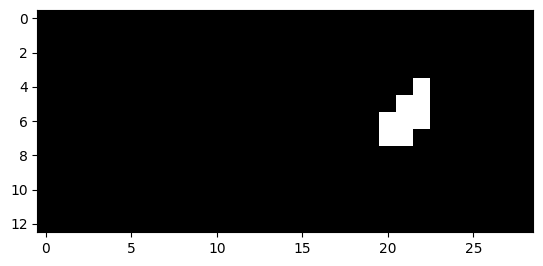

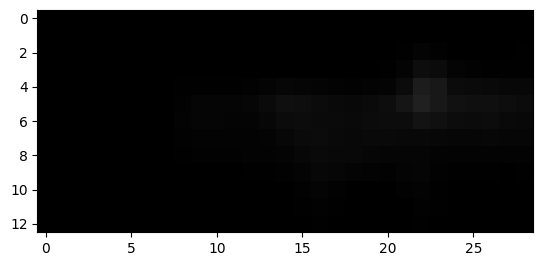

1690


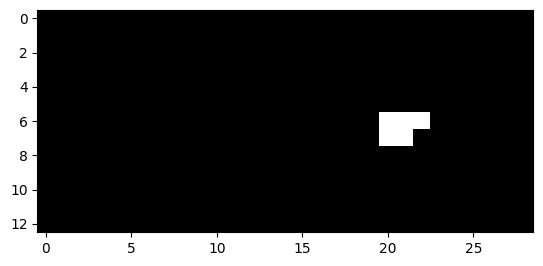

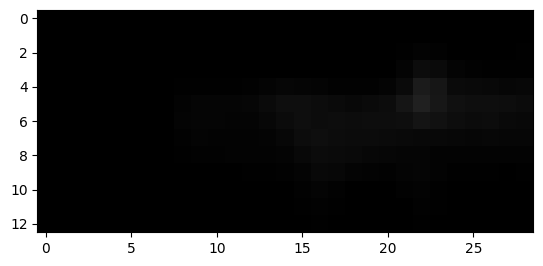

1691


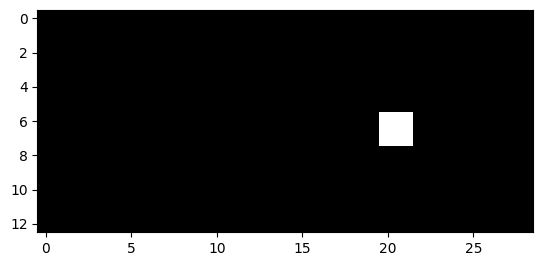

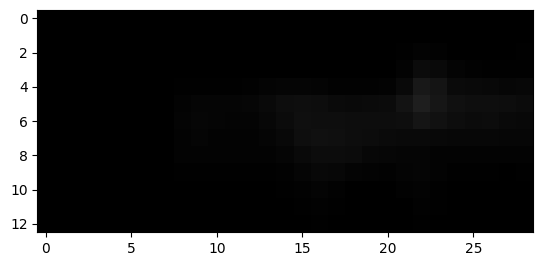

1710


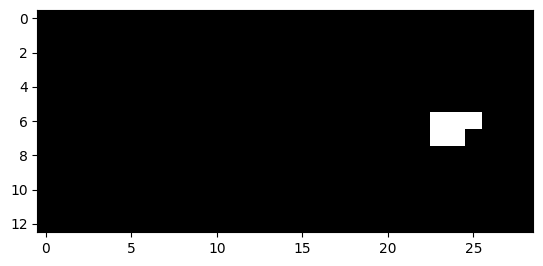

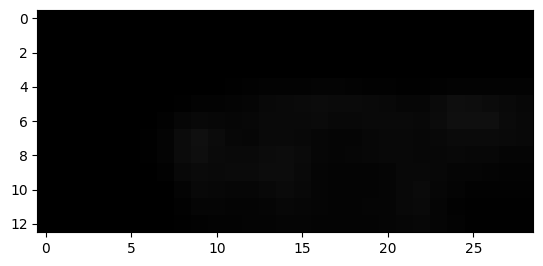

1711


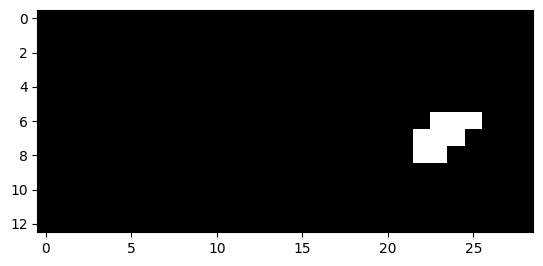

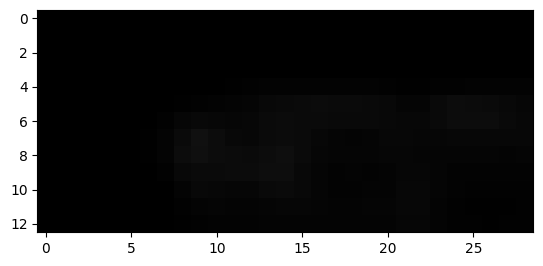

1712


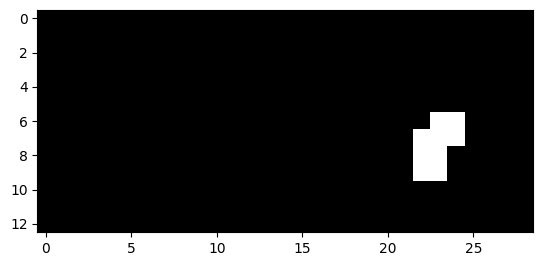

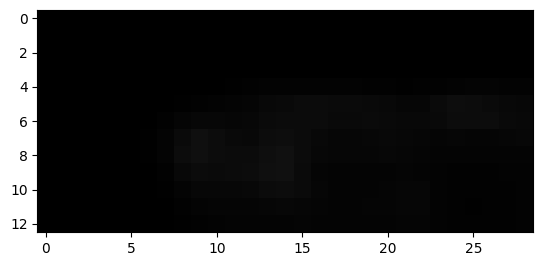

1713


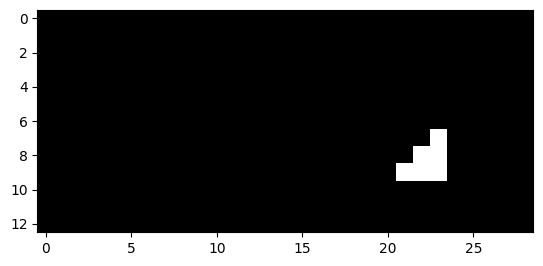

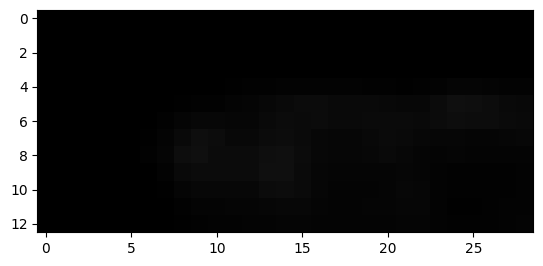

1714


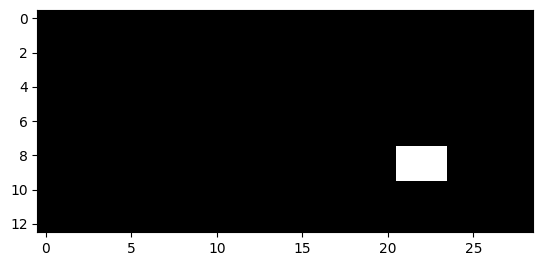

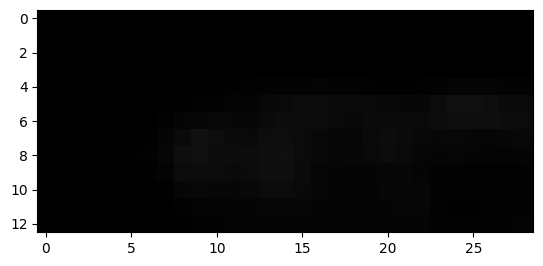

1715


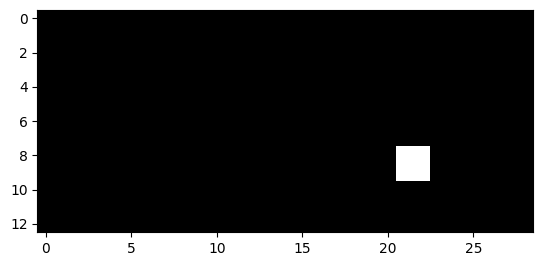

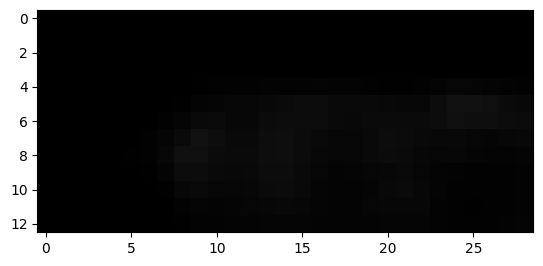

1728


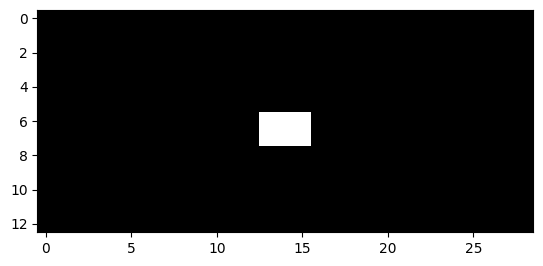

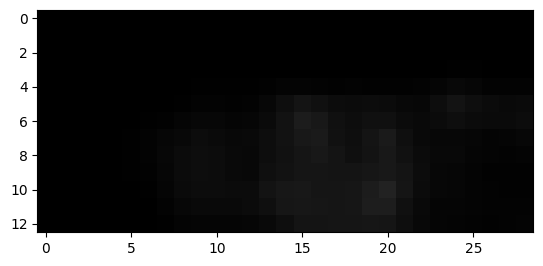

1729


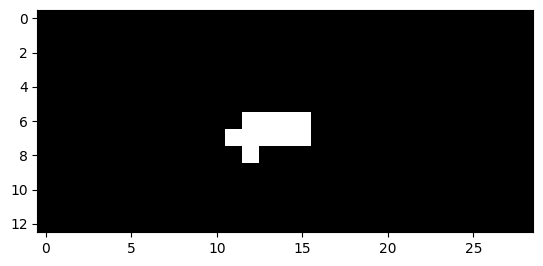

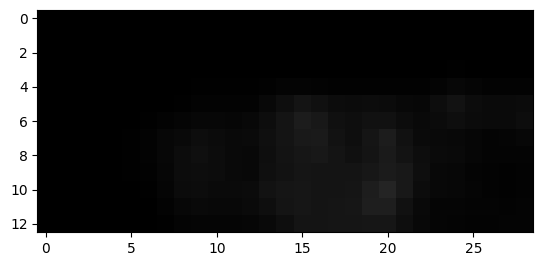

1730


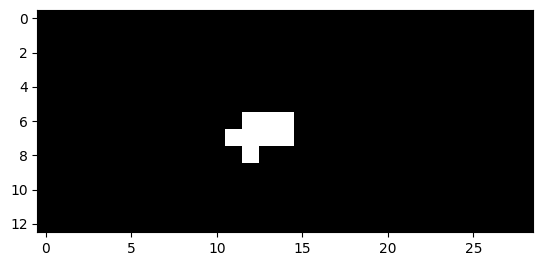

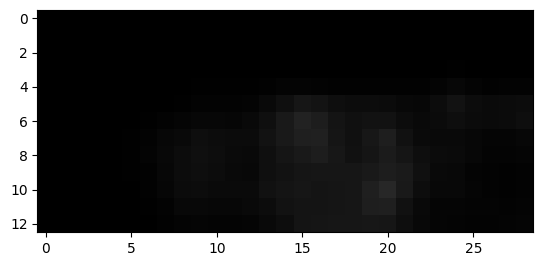

1731


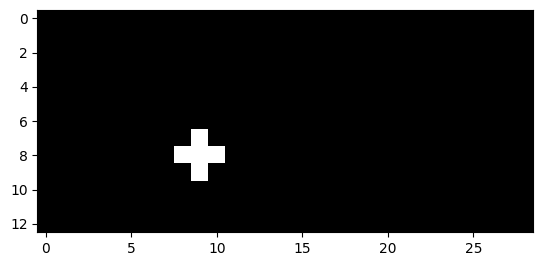

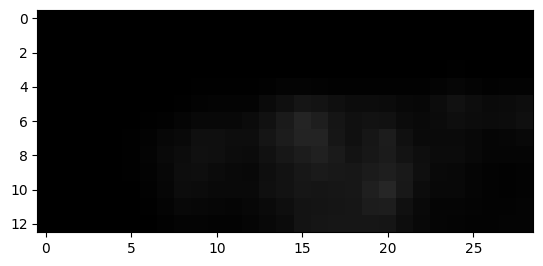

1732


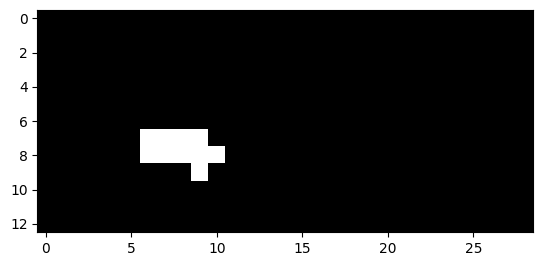

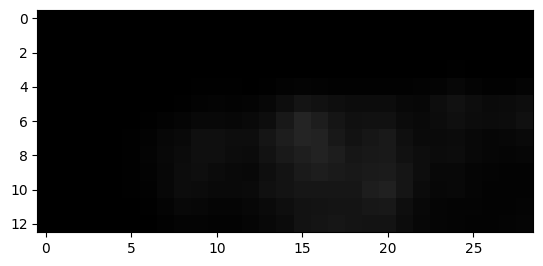

1733


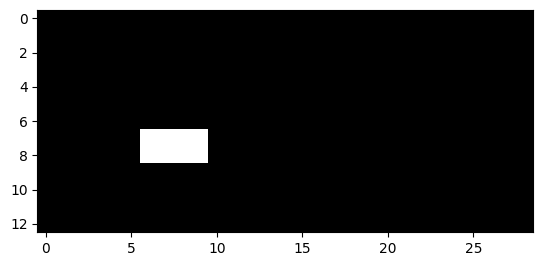

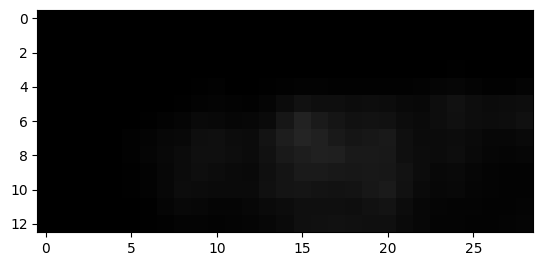

1735


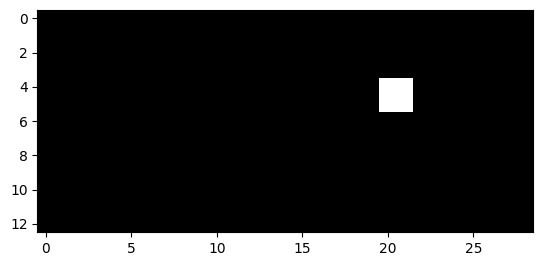

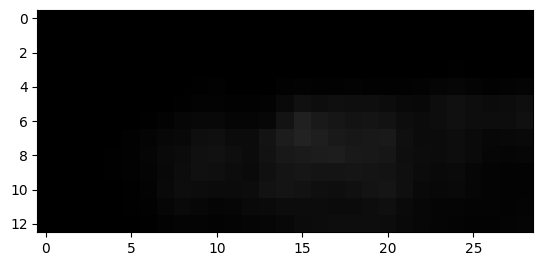

1736


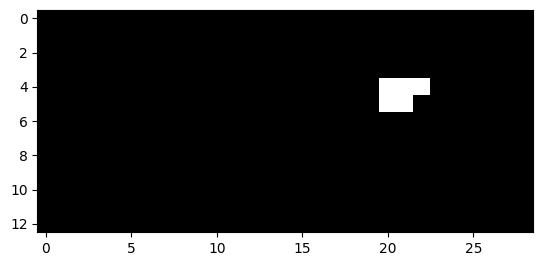

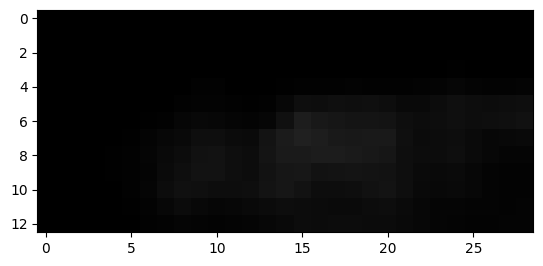

1737


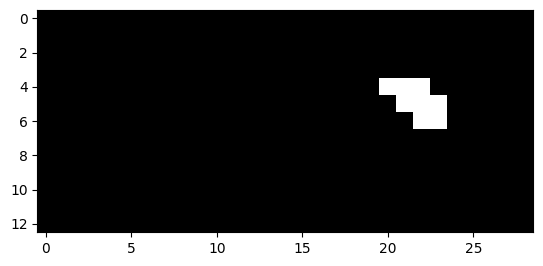

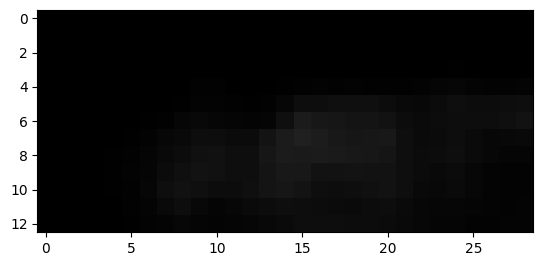

1738


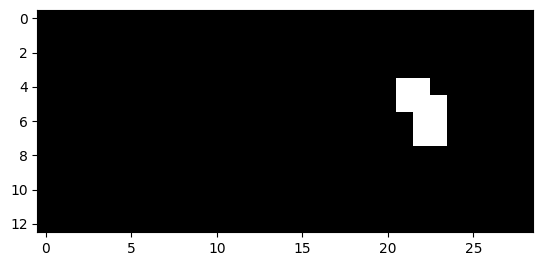

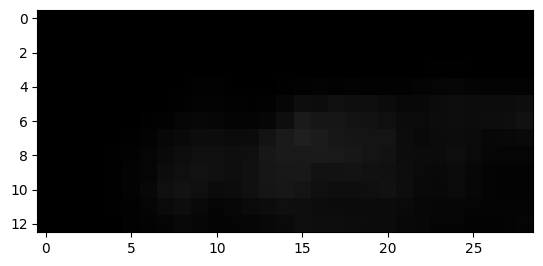

1739


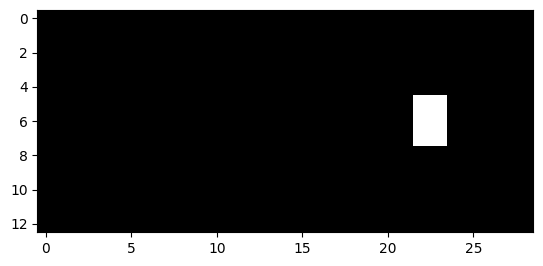

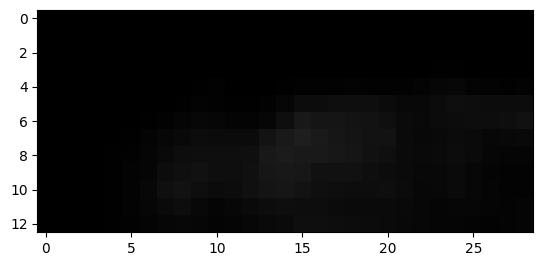

1740


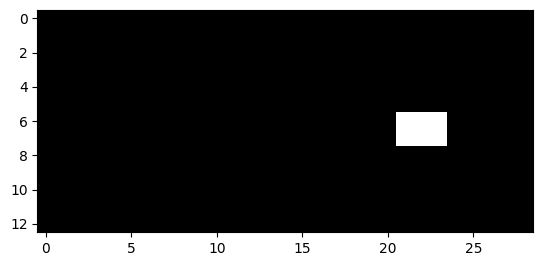

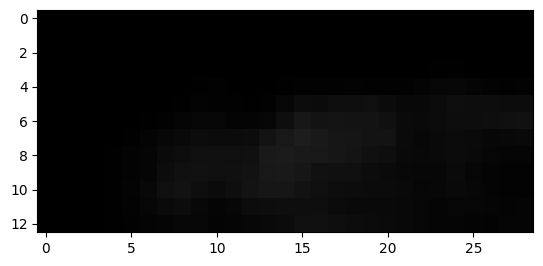

1741


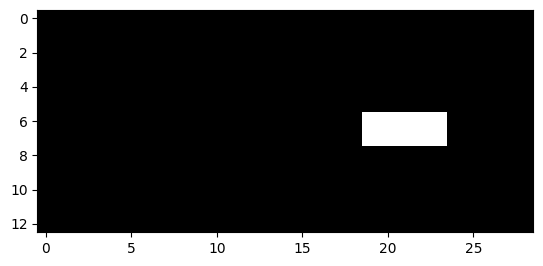

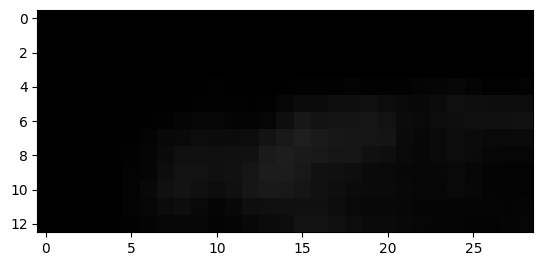

1742


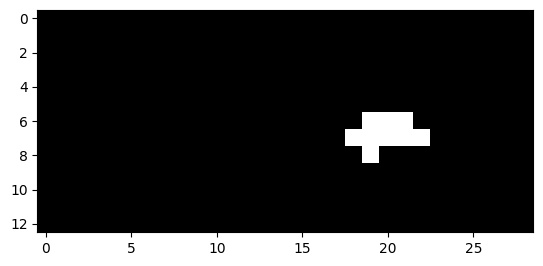

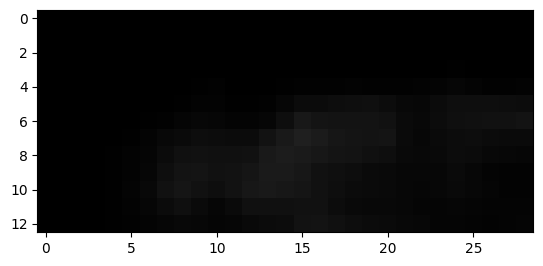

1743


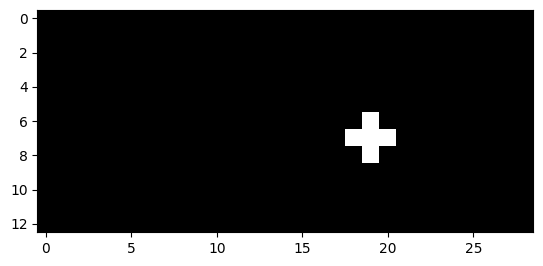

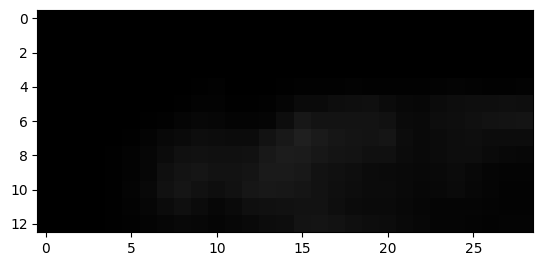

1750


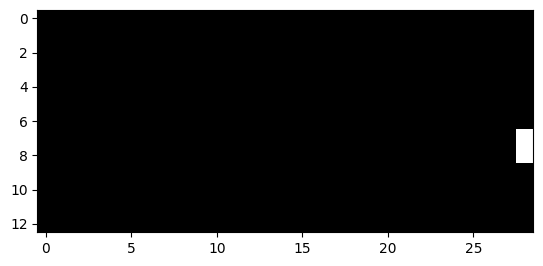

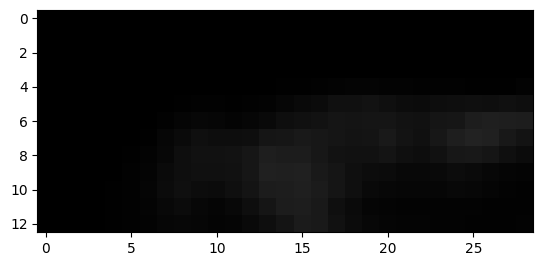

1751


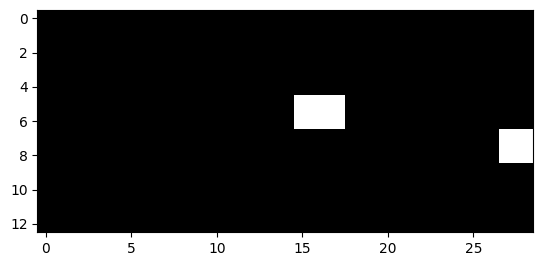

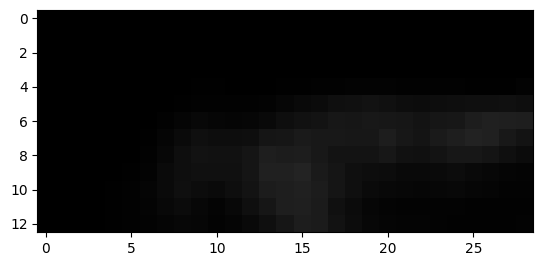

1752


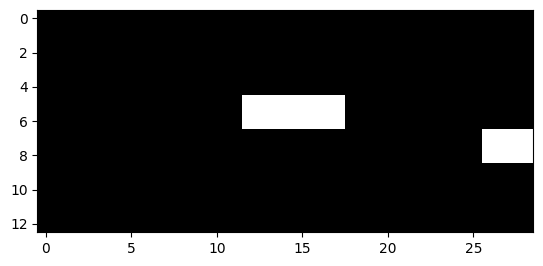

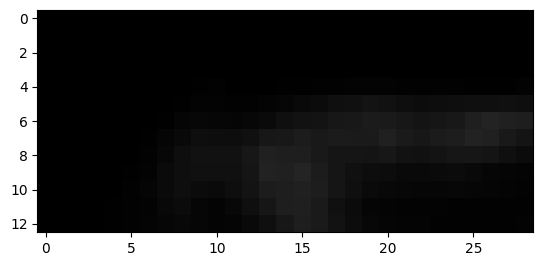

1753


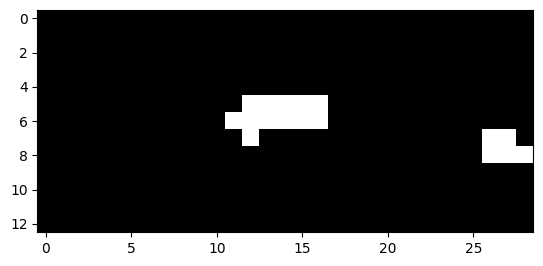

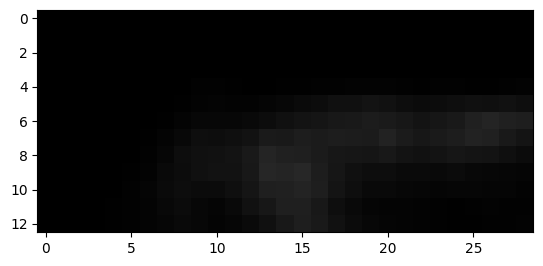

1754


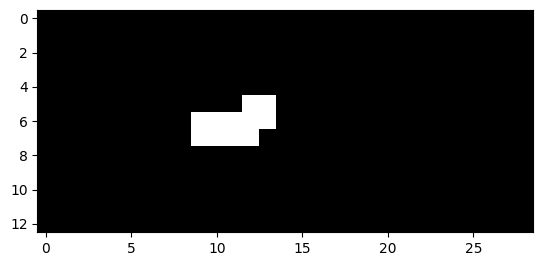

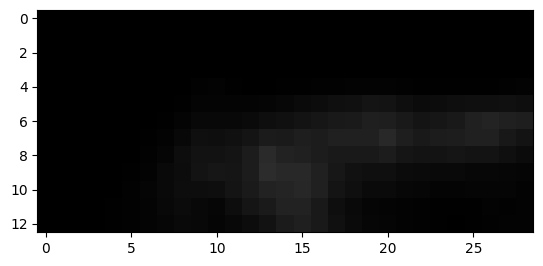

1755


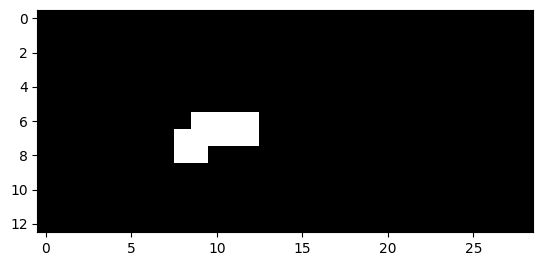

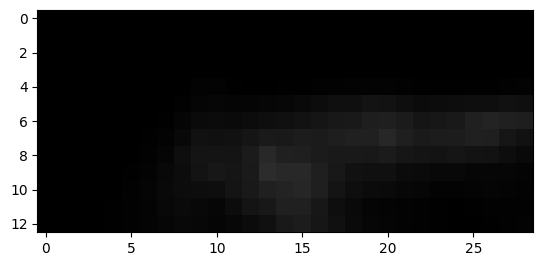

1756


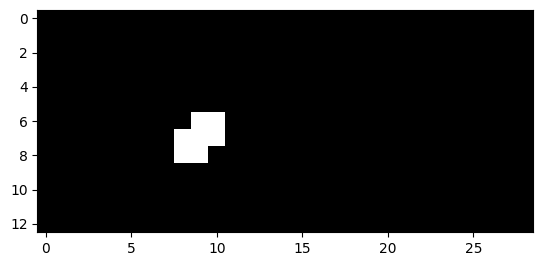

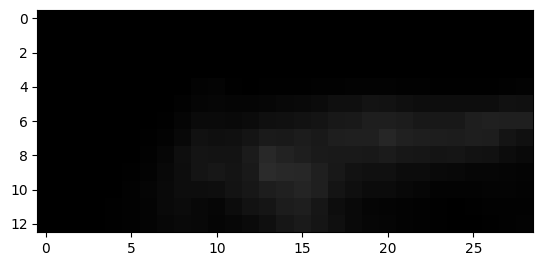

1760


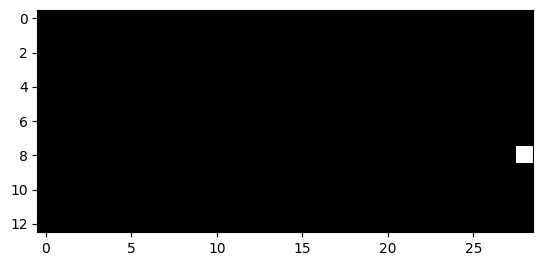

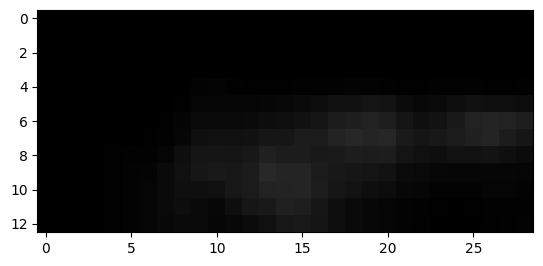

1761


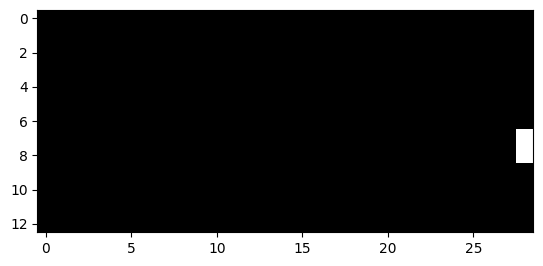

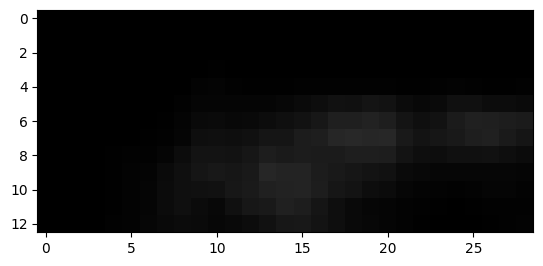

1762


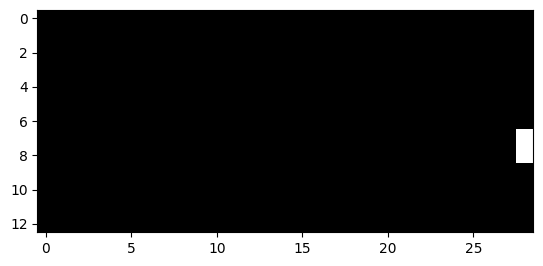

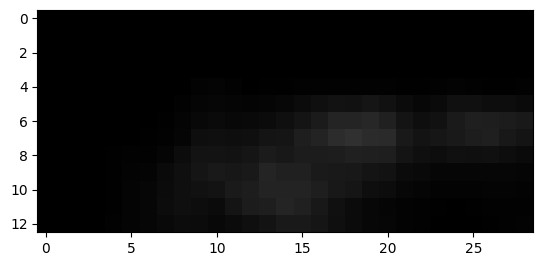

1770


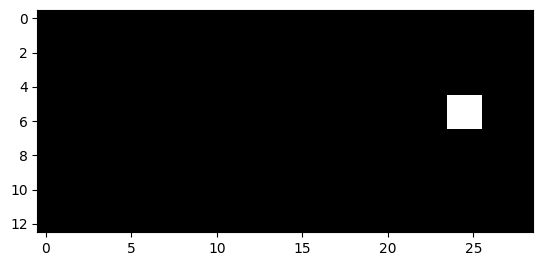

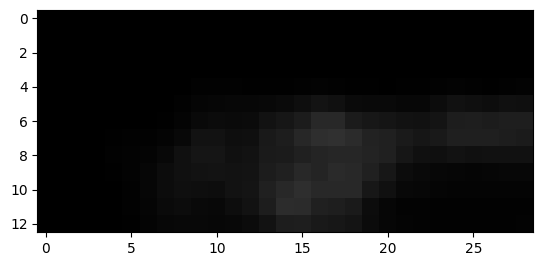

1771


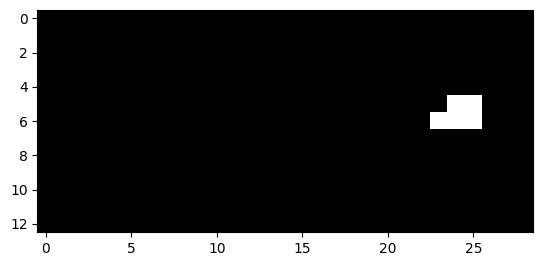

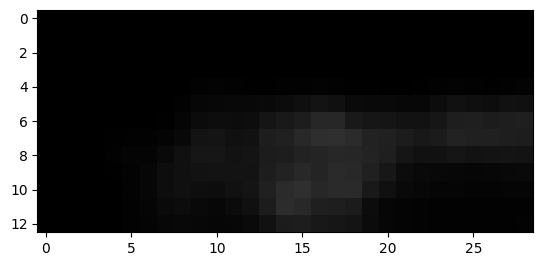

1772


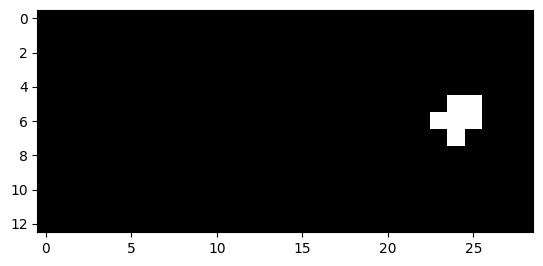

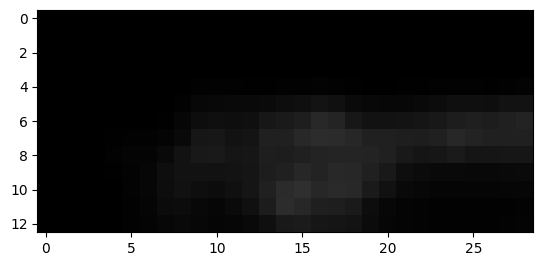

1773


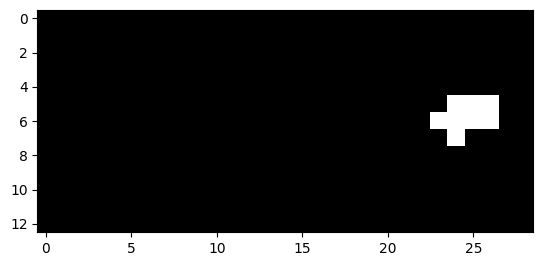

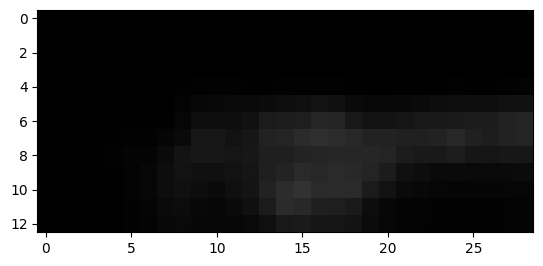

1774


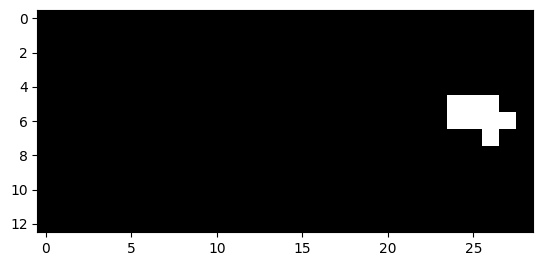

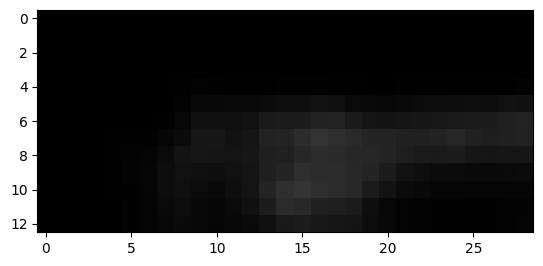

1775


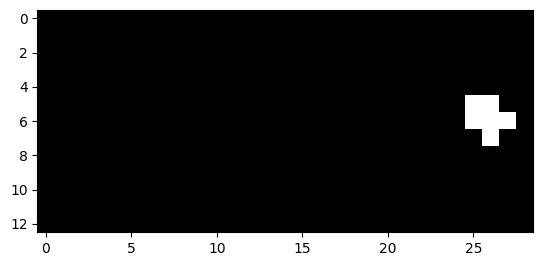

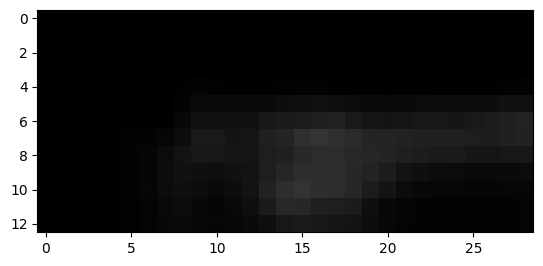

1776


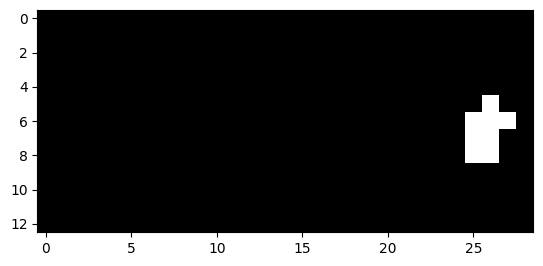

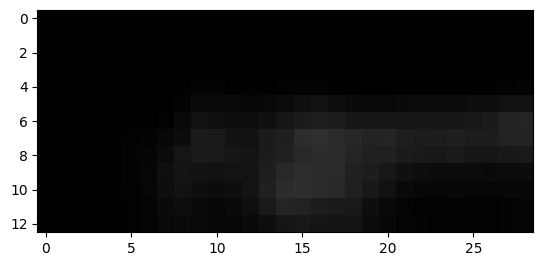

1777


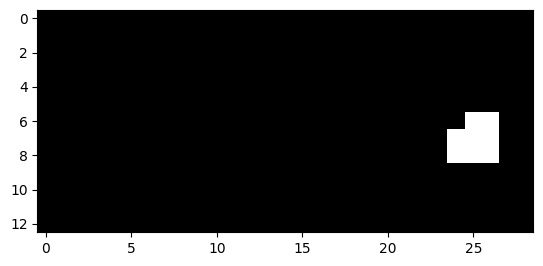

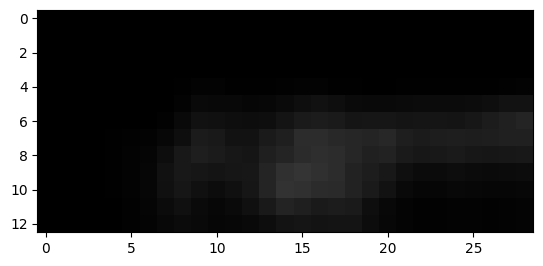

1778


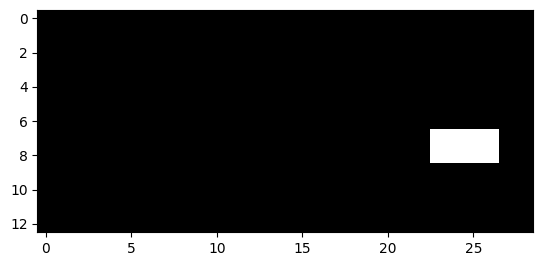

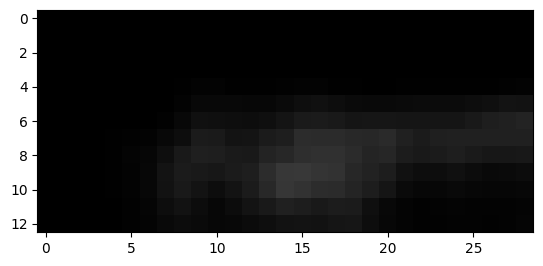

1779


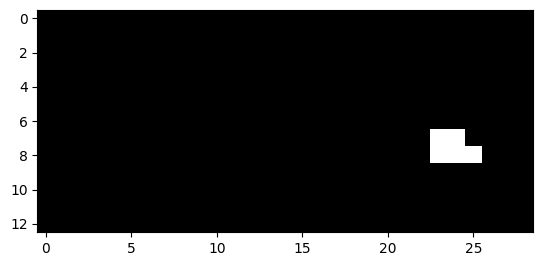

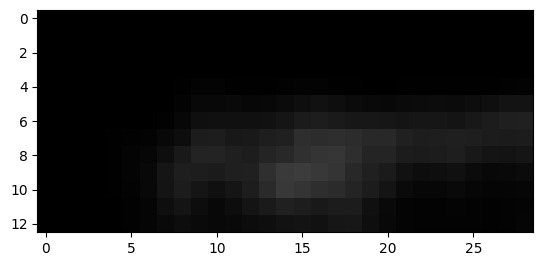

1786


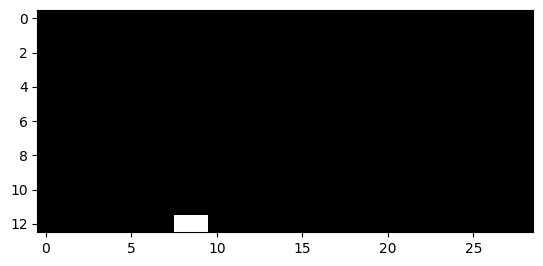

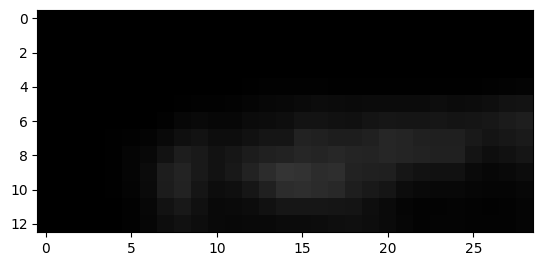

1787


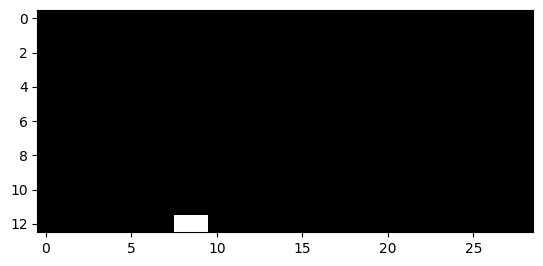

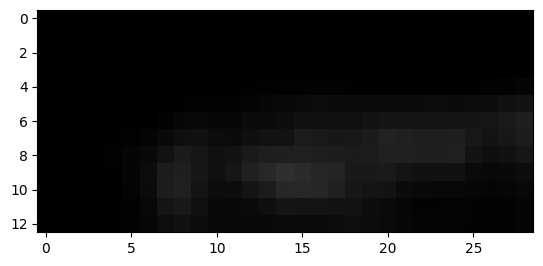

1792


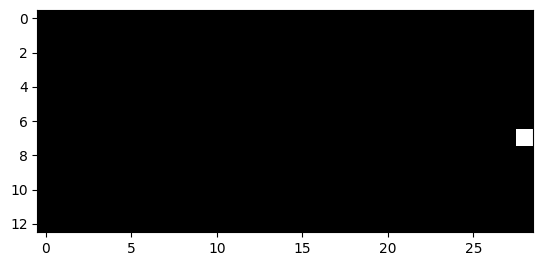

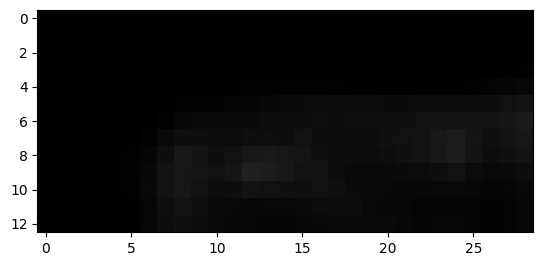

1793


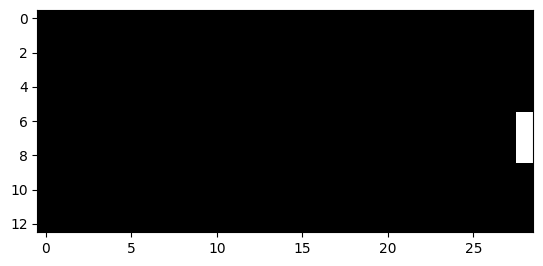

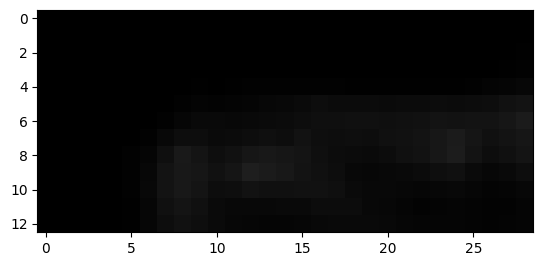

1794


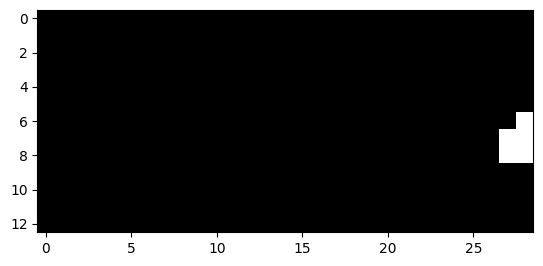

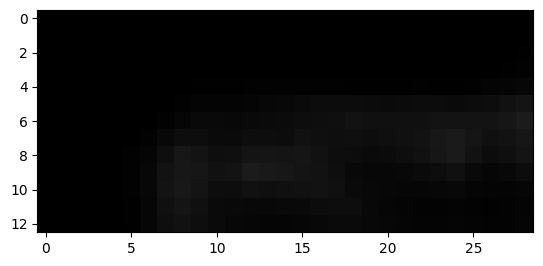

1795


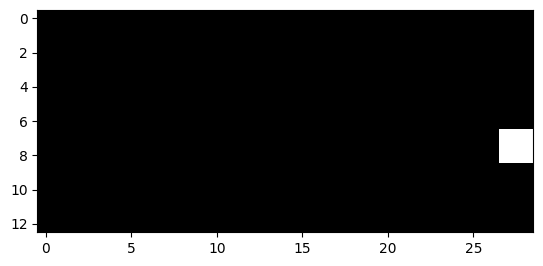

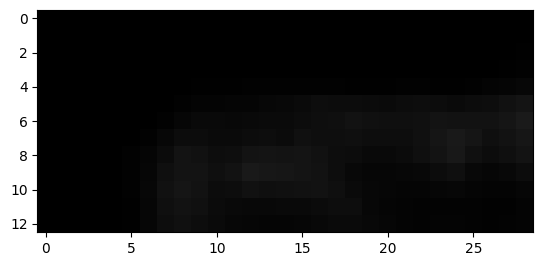

1796


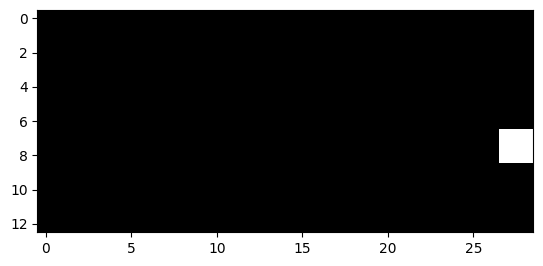

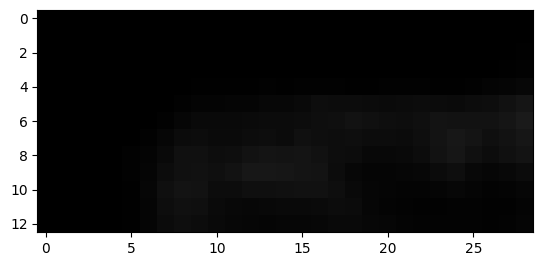

1797


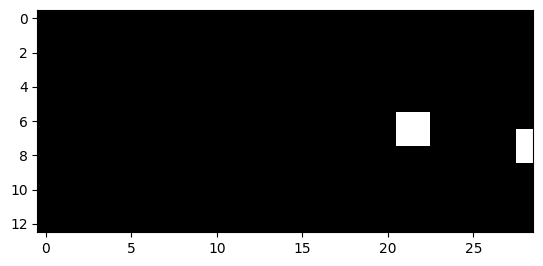

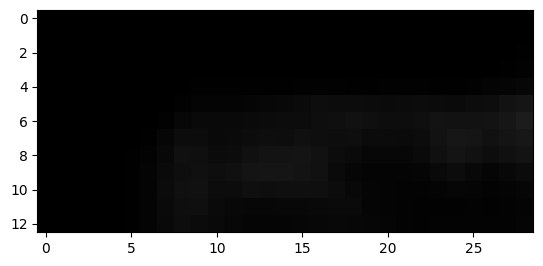

1798


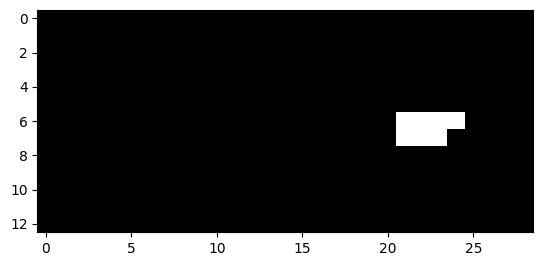

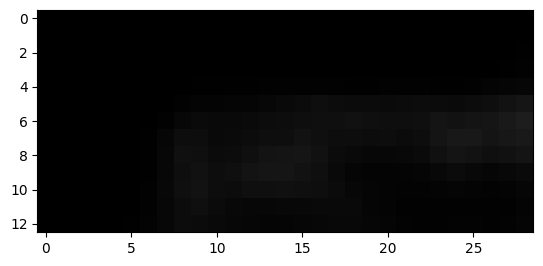

1799


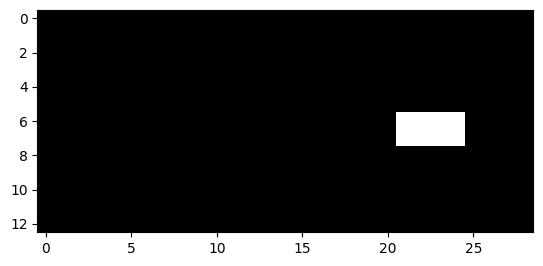

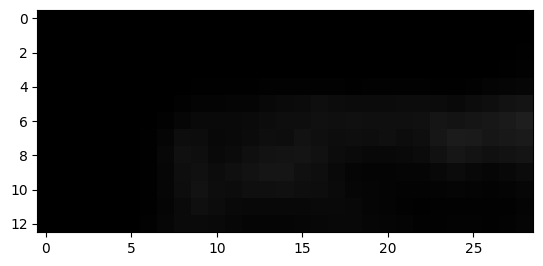

1800


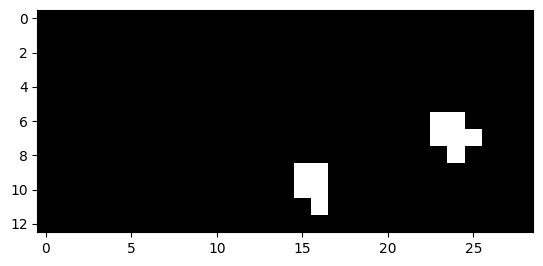

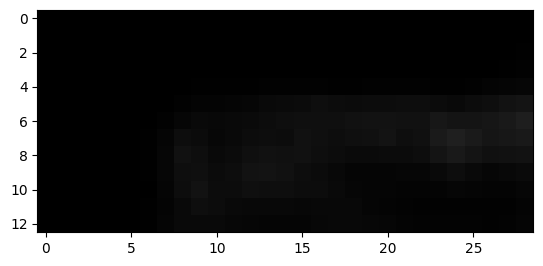

1801


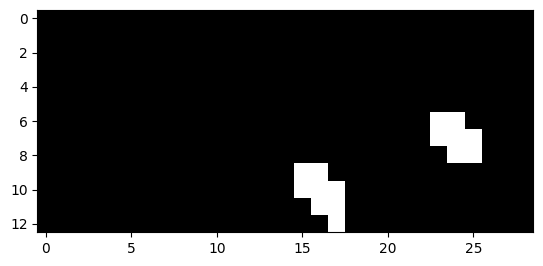

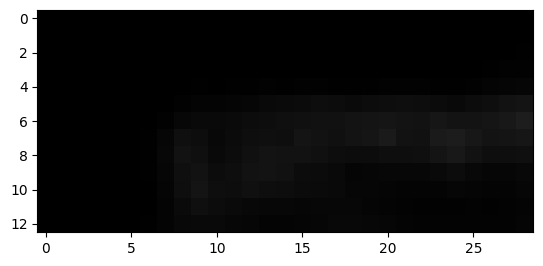

1802


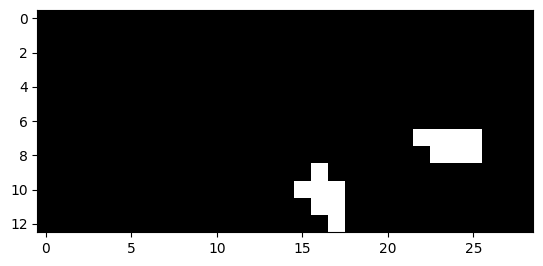

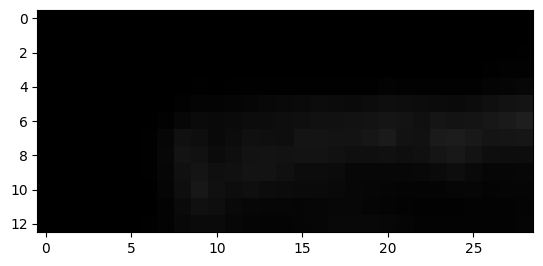

1803


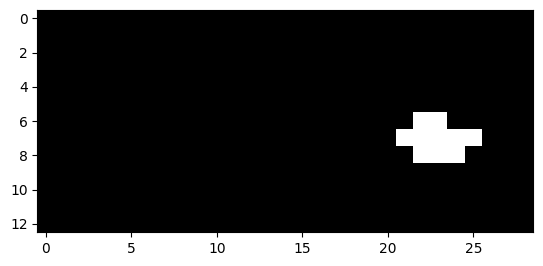

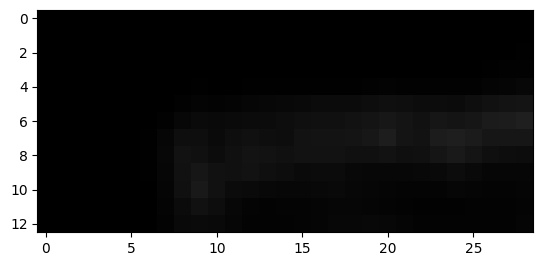

1804


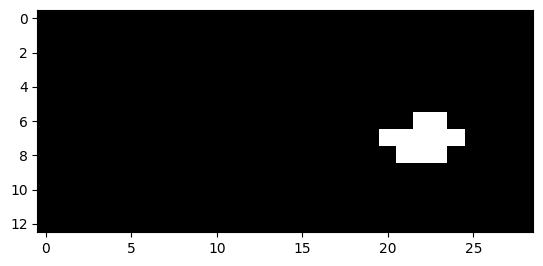

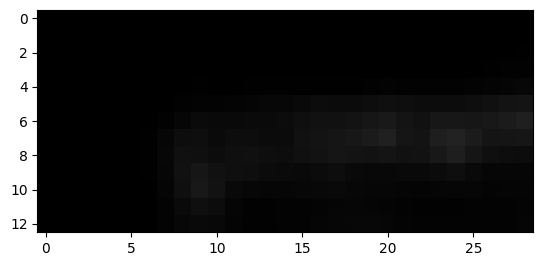

1805


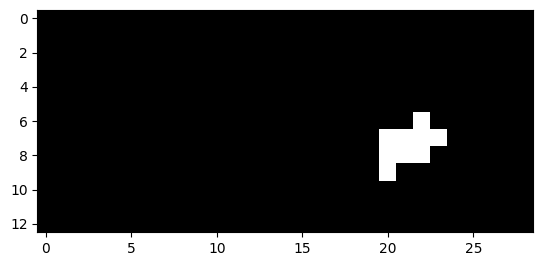

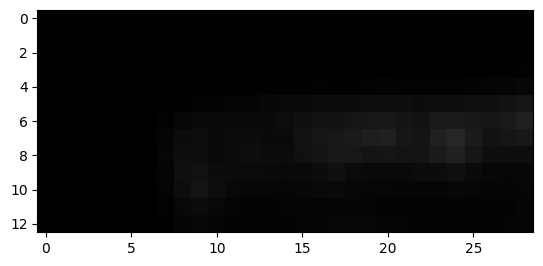

1806


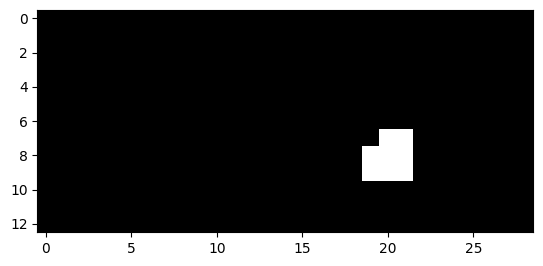

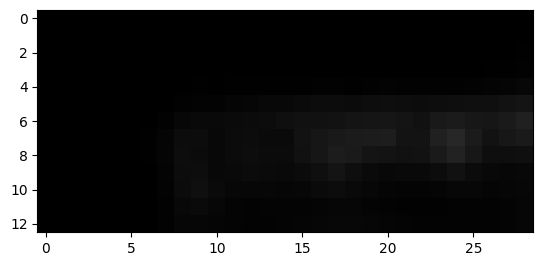

1807


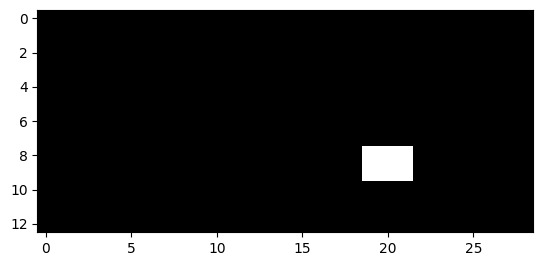

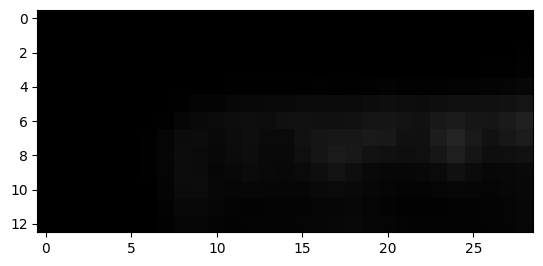

1808


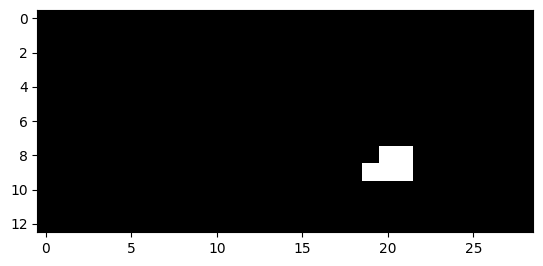

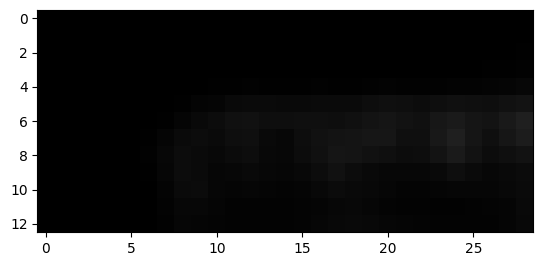

1809


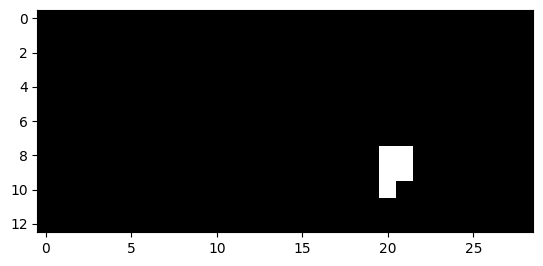

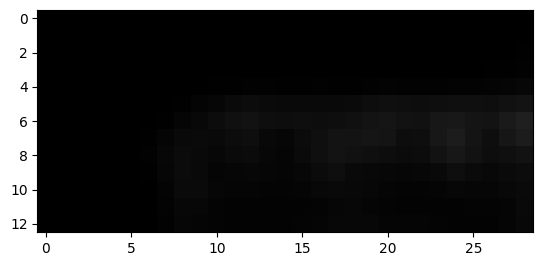

1810


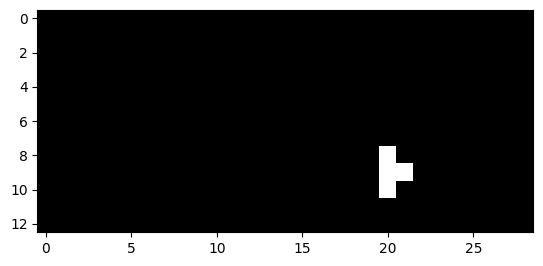

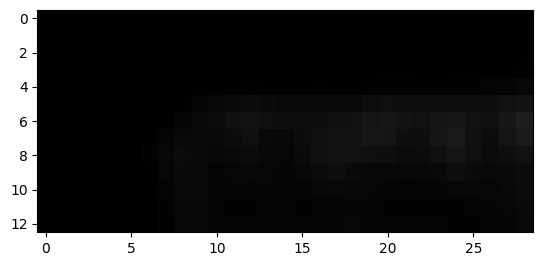

1845


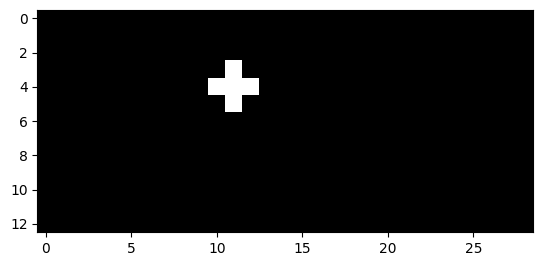

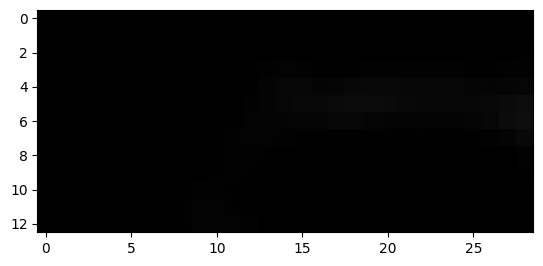

1846


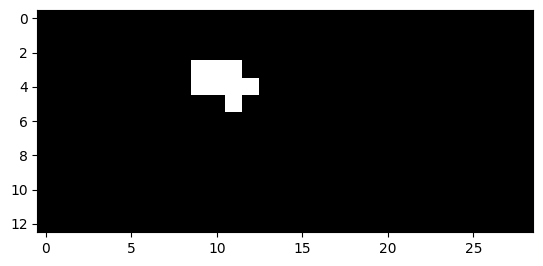

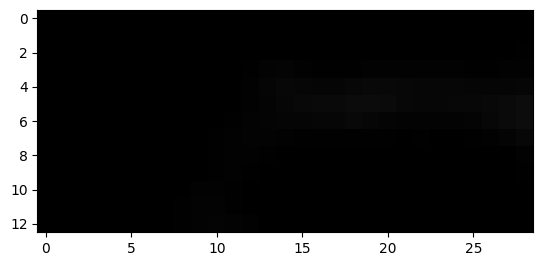

1847


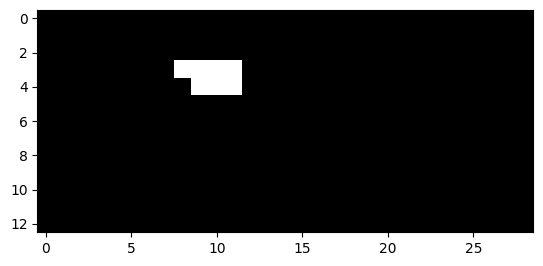

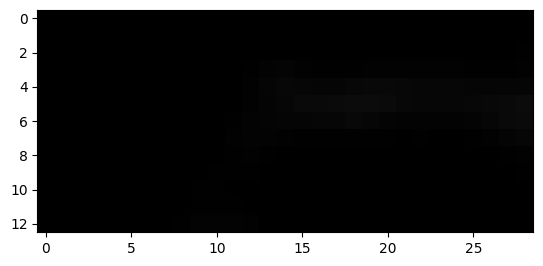

1848


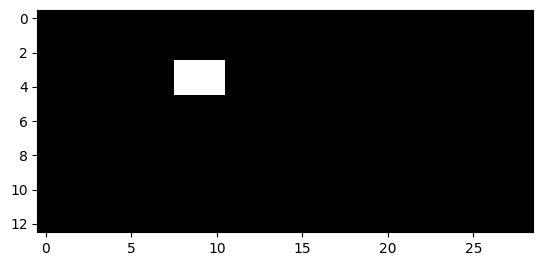

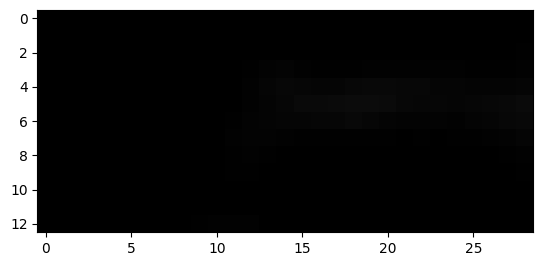

1849


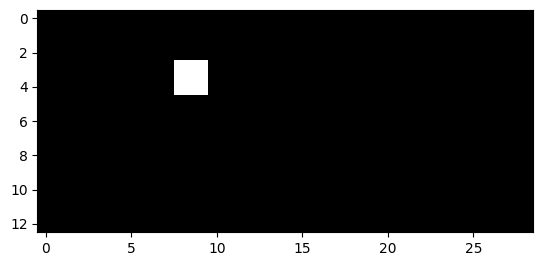

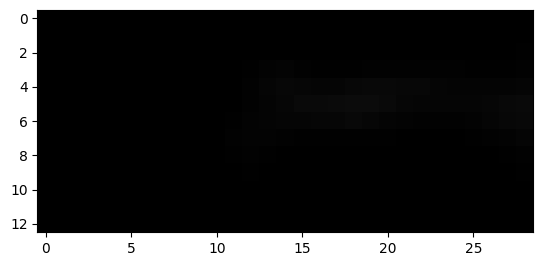

2122


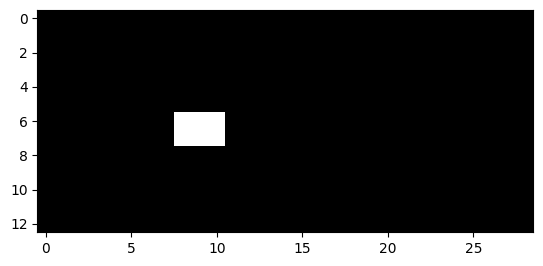

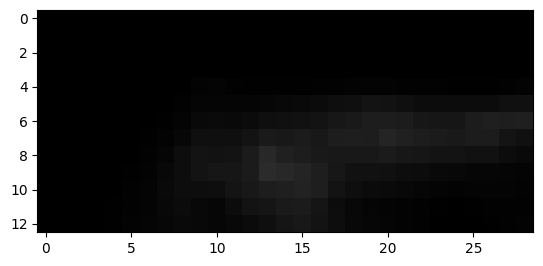

2123


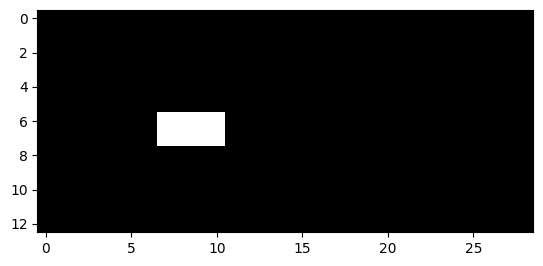

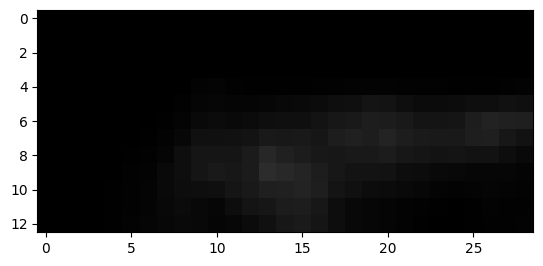

2124


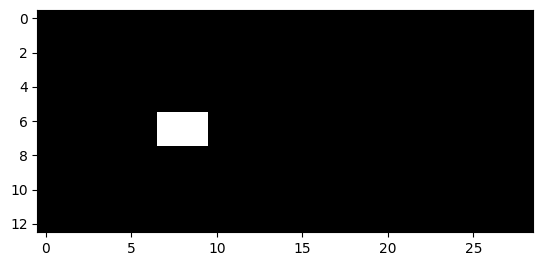

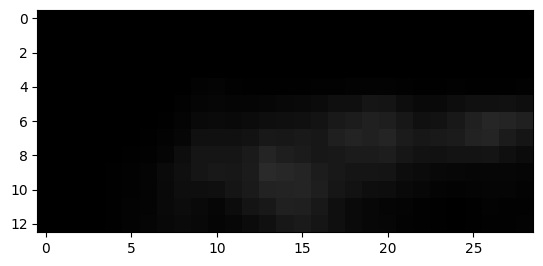

2126


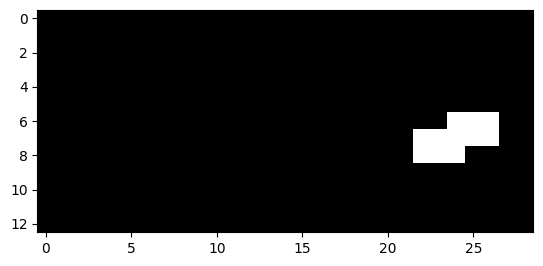

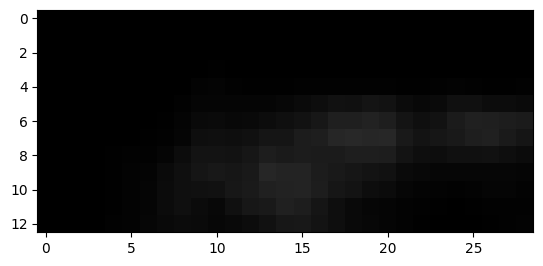

2127


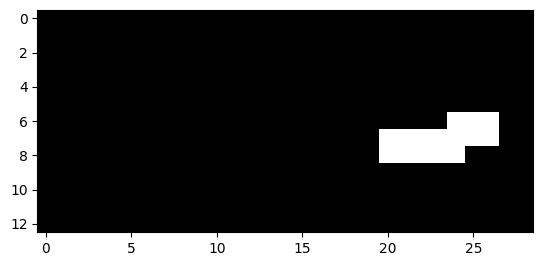

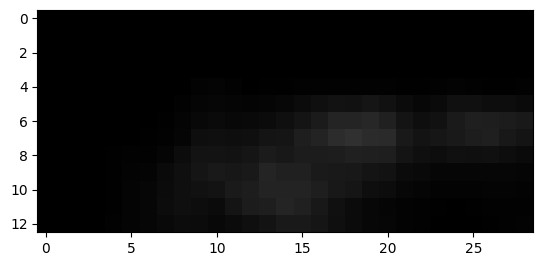

2128


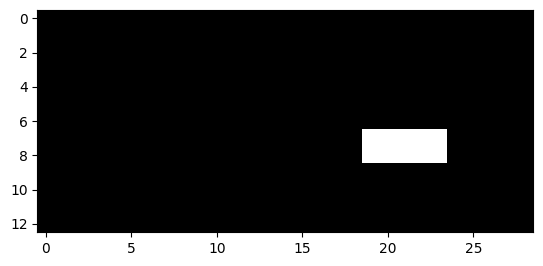

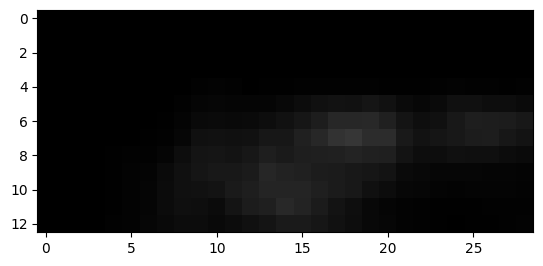

2129


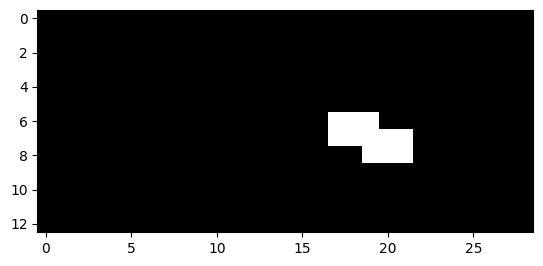

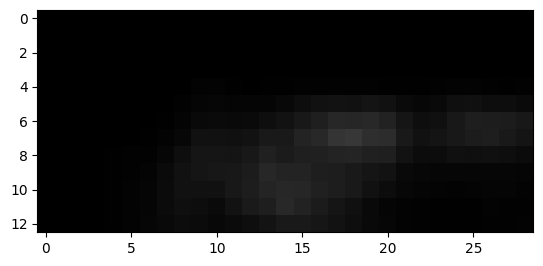

2130


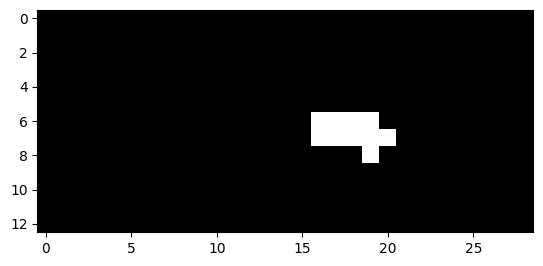

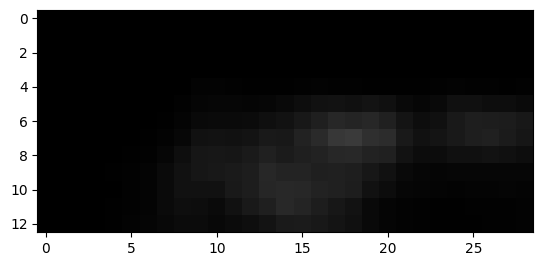

2131


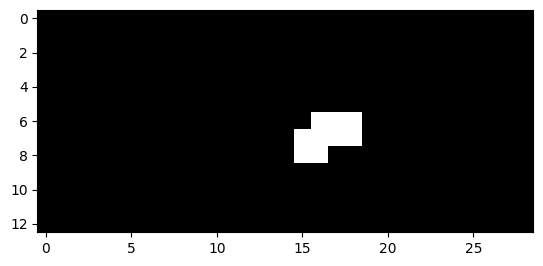

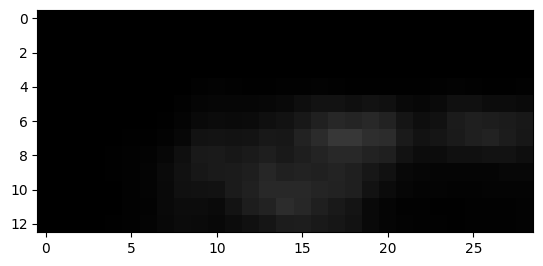

2132


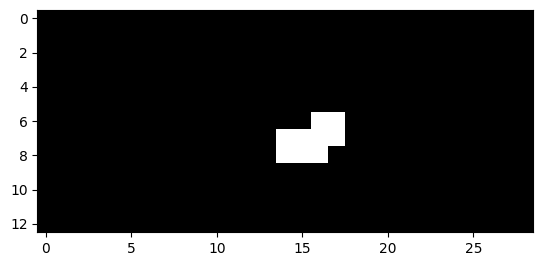

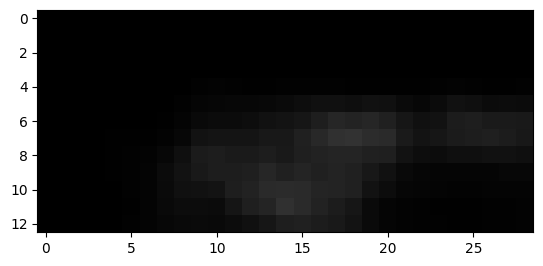

2133


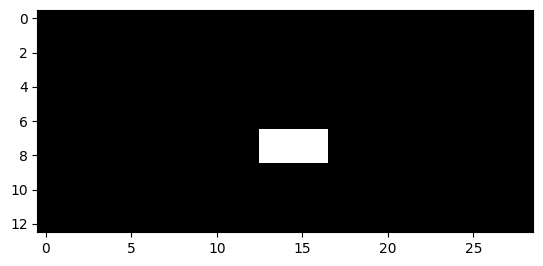

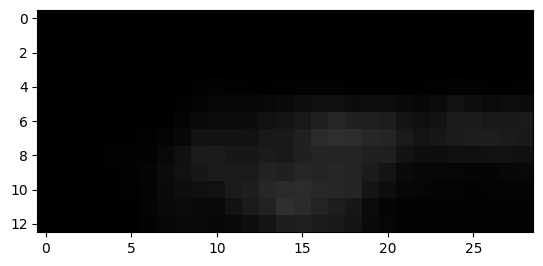

2134


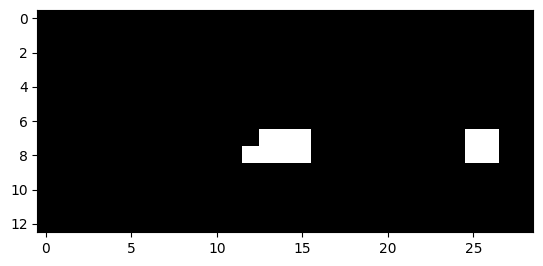

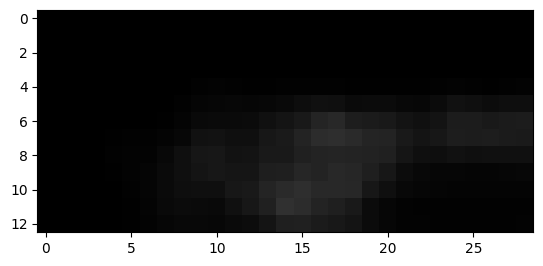

2135


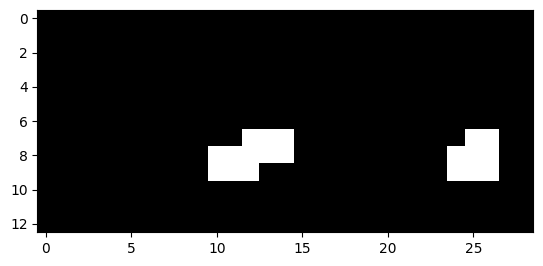

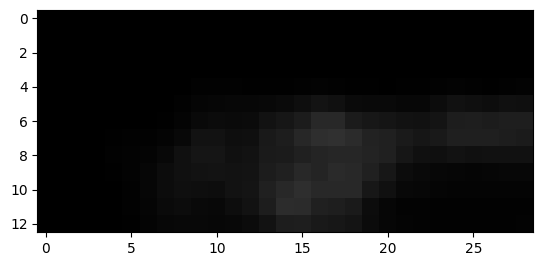

2136


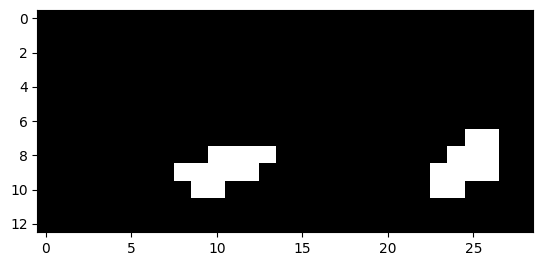

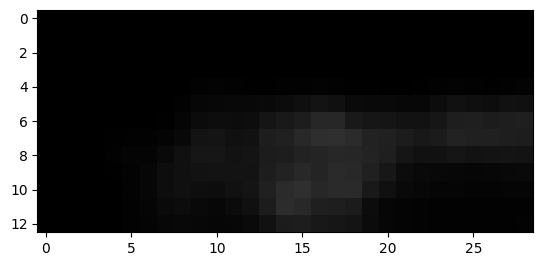

2137


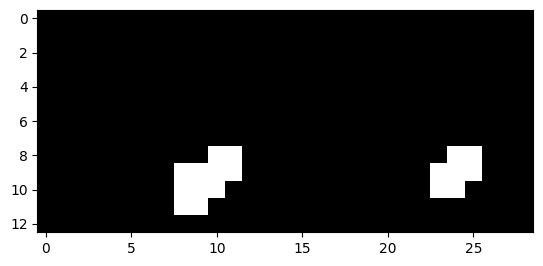

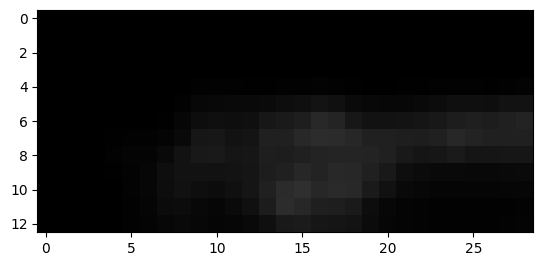

2138


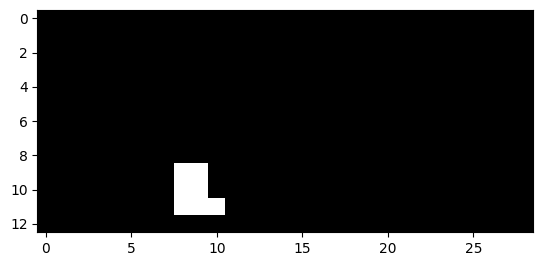

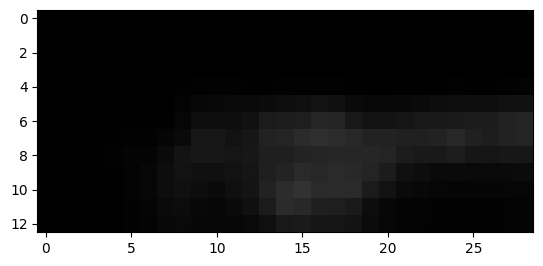

2139


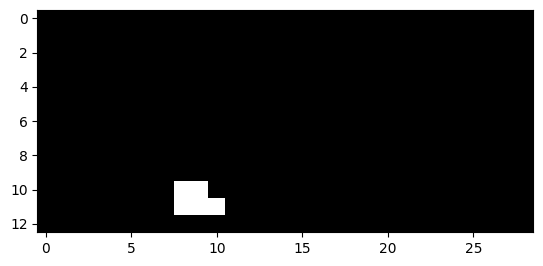

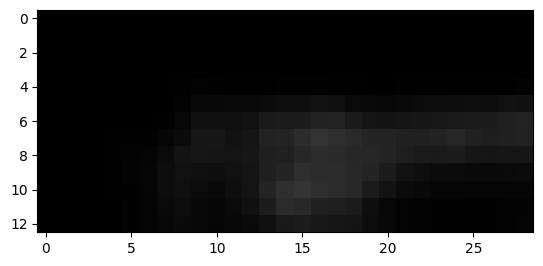

2143


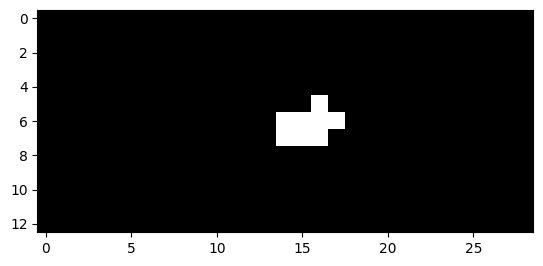

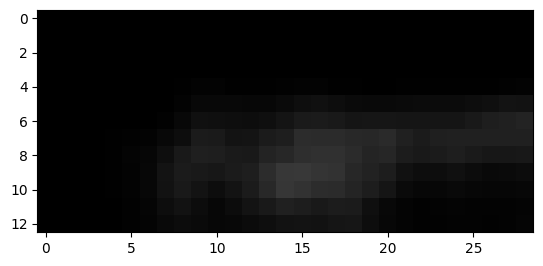

2144


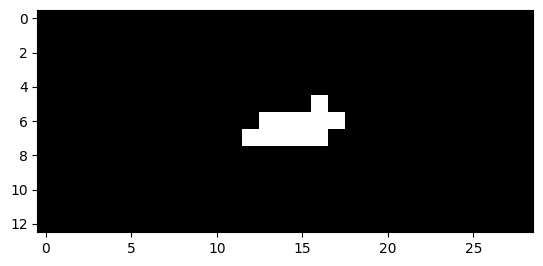

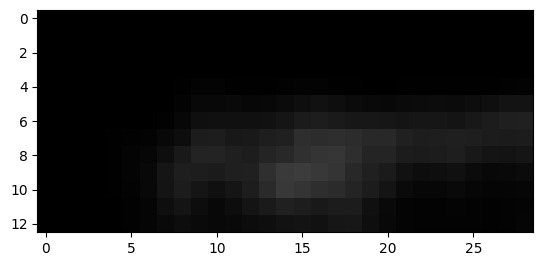

2145


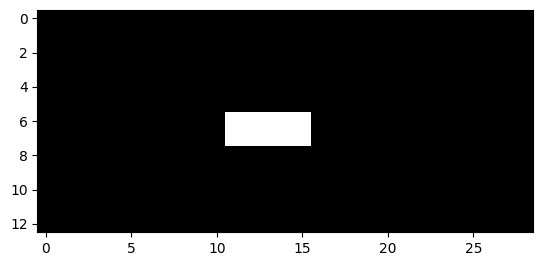

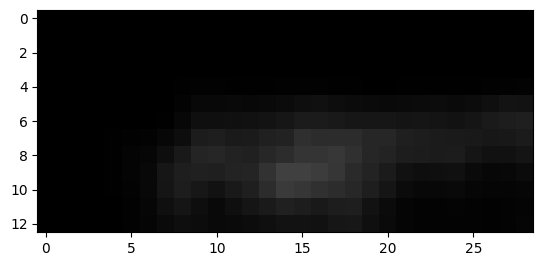

2146


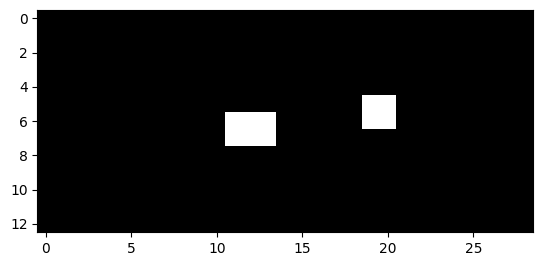

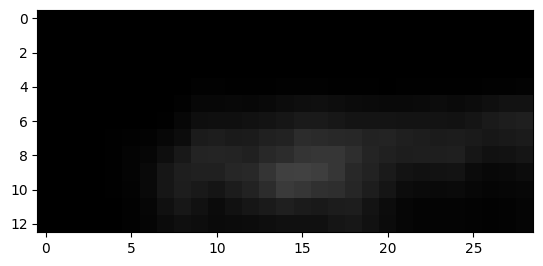

2147


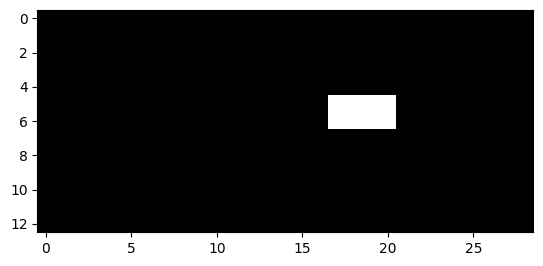

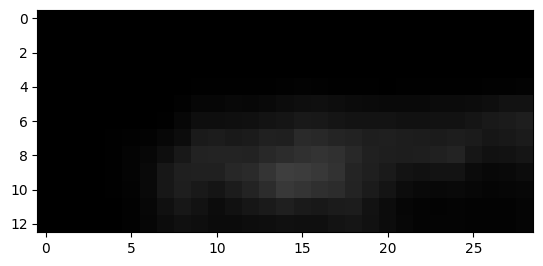

2148


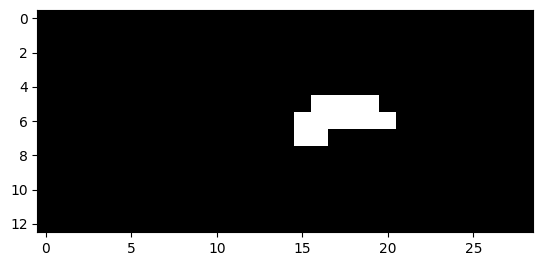

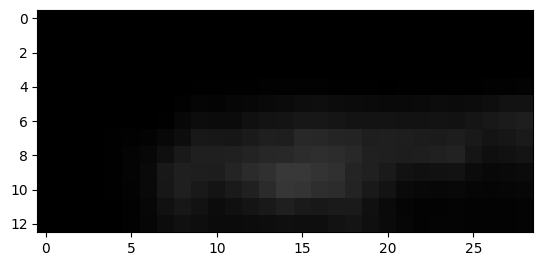

2149


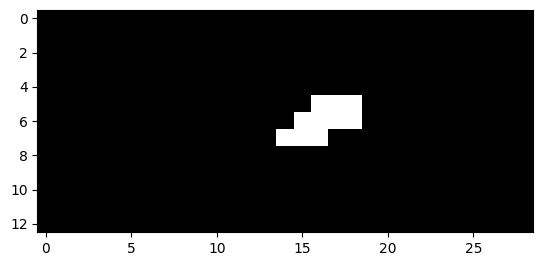

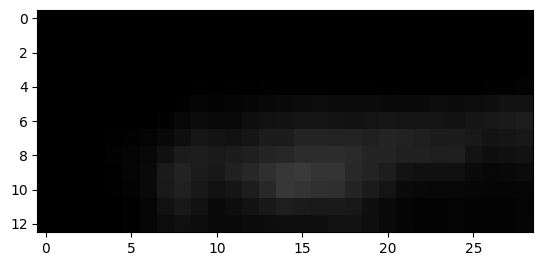

2150


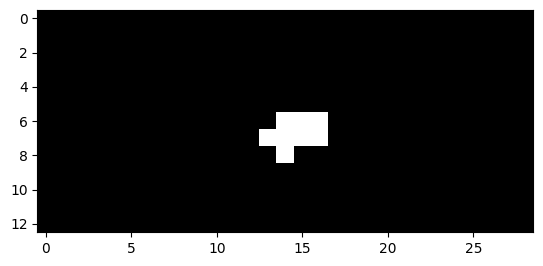

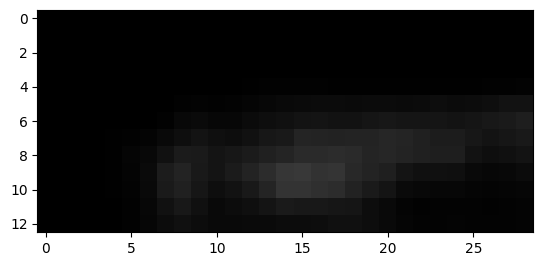

2151


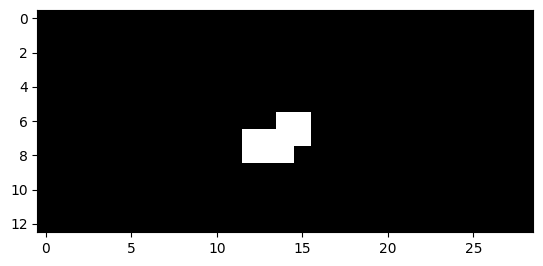

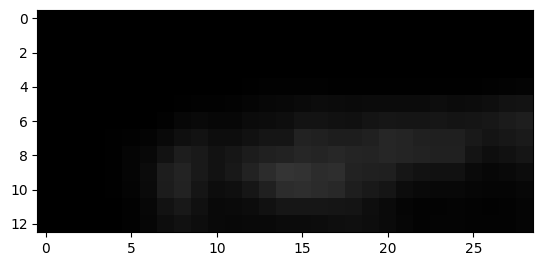

2152


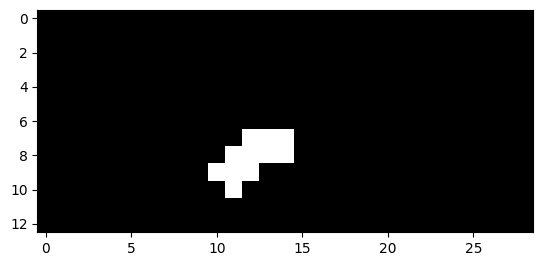

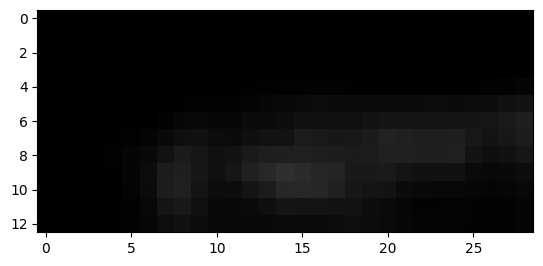

2153


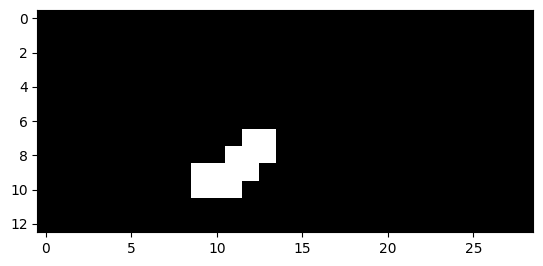

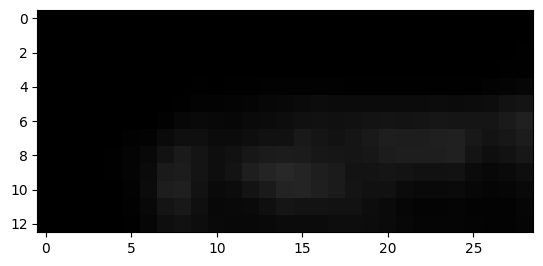

2154


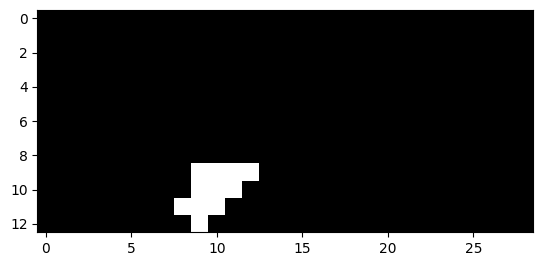

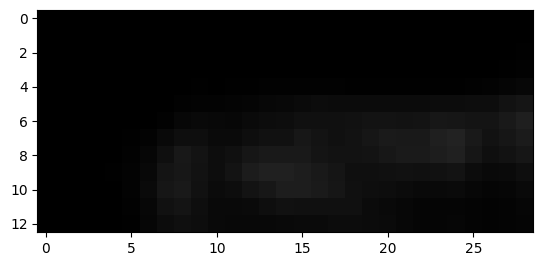

2155


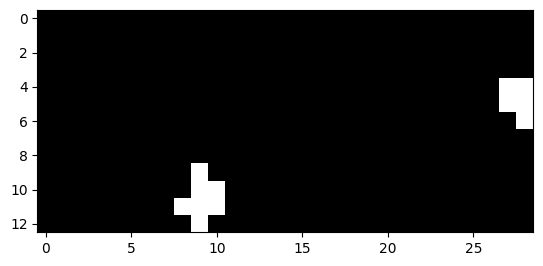

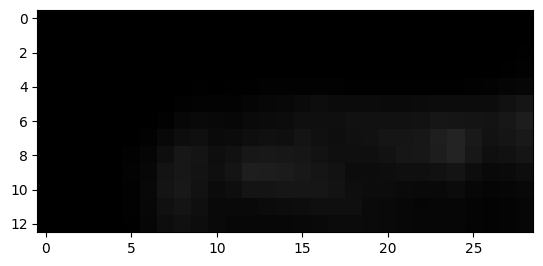

2156


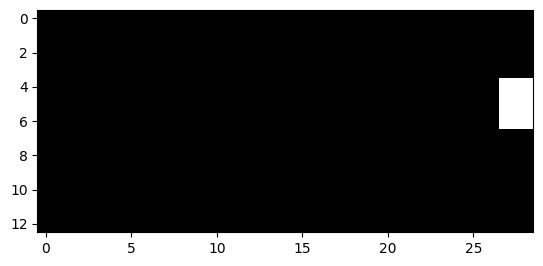

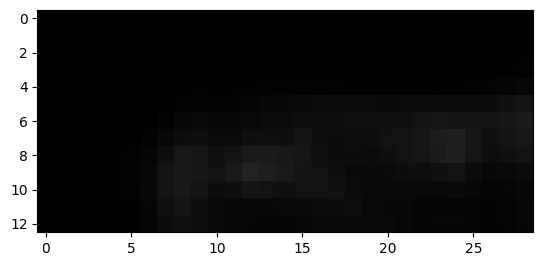

2157


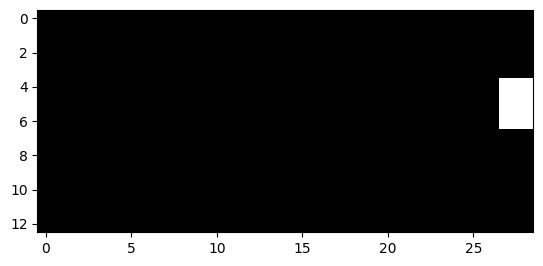

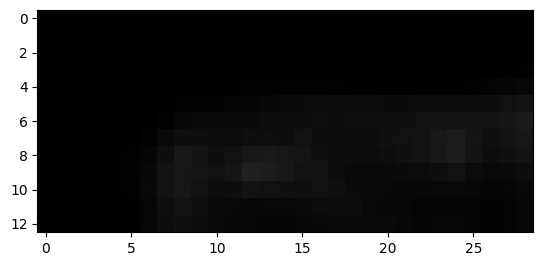

2166


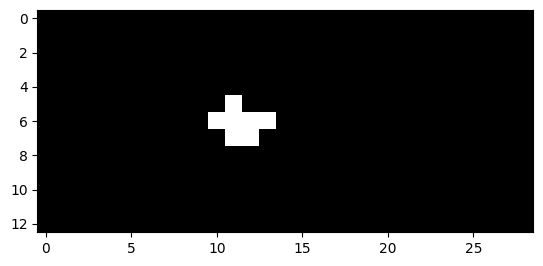

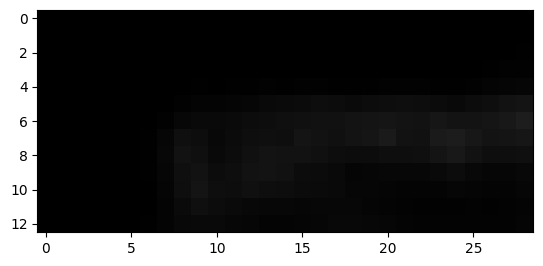

2167


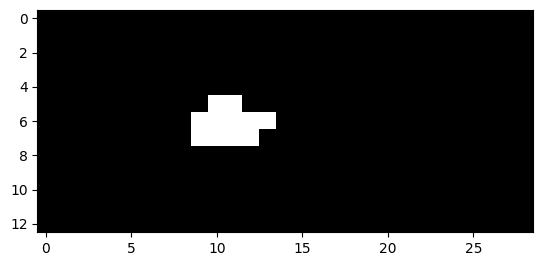

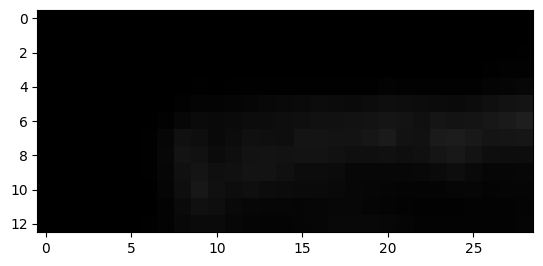

2168


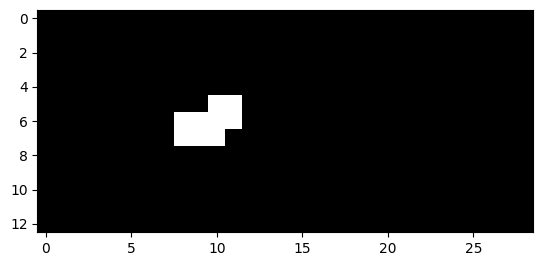

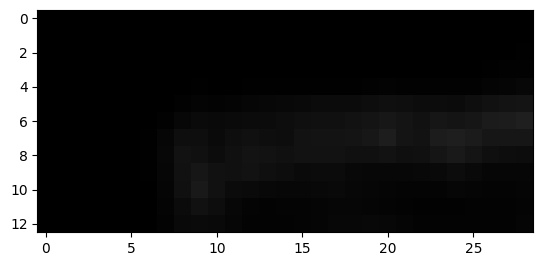

2169


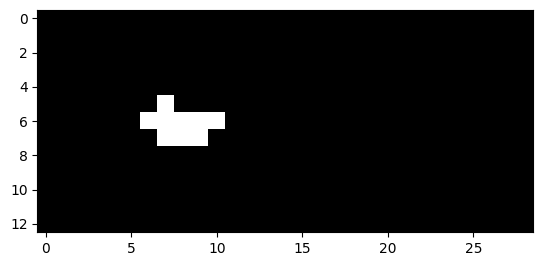

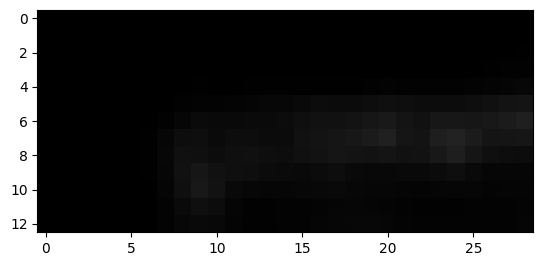

2170


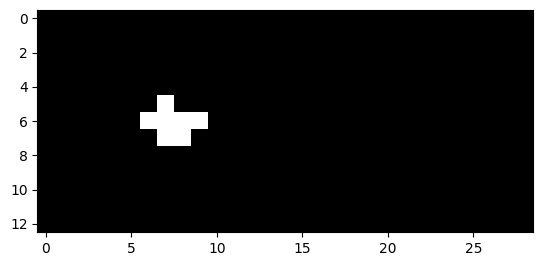

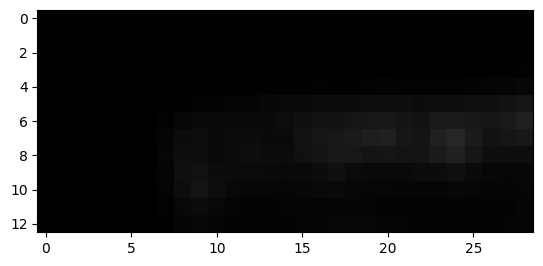

2171


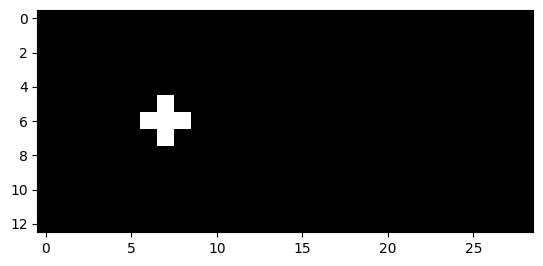

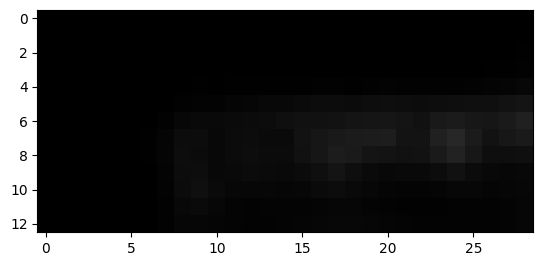

2174


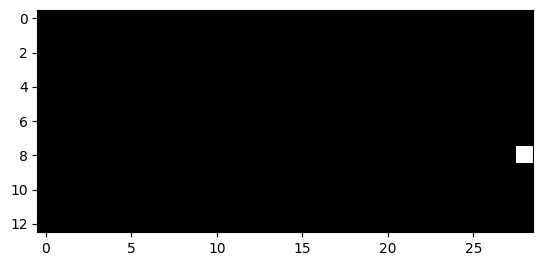

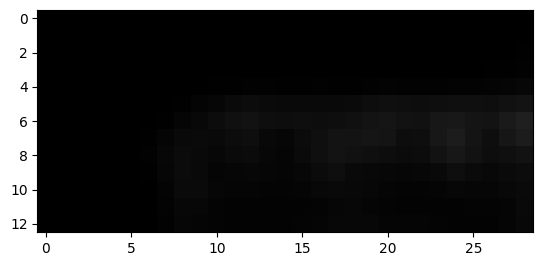

2175


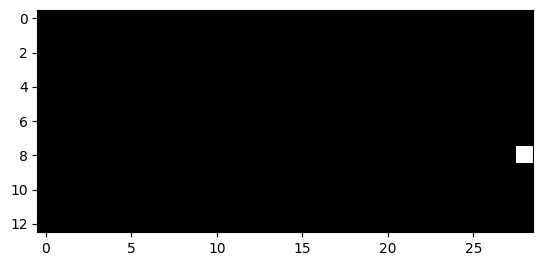

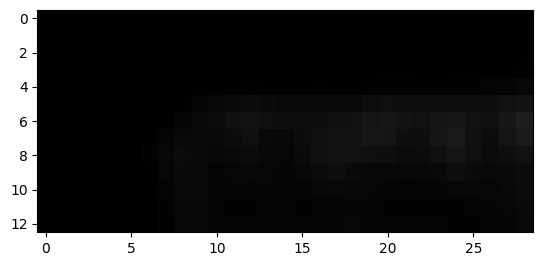

2181


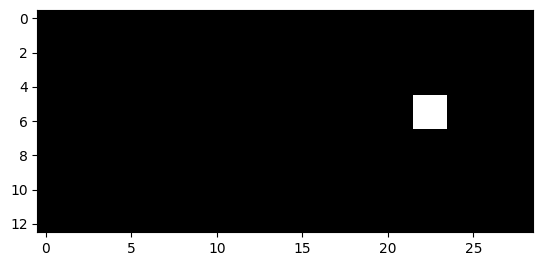

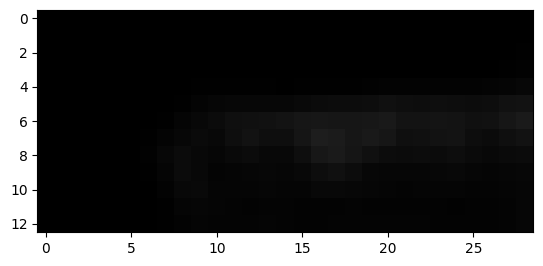

2182


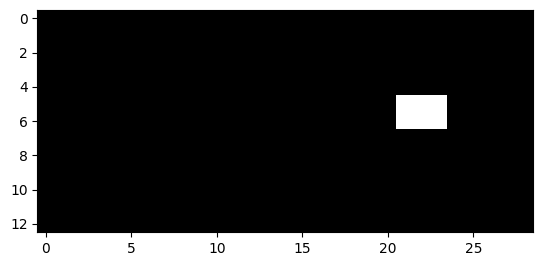

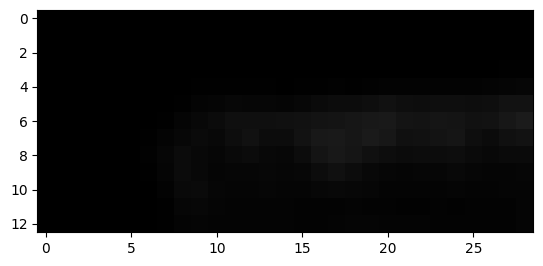

2183


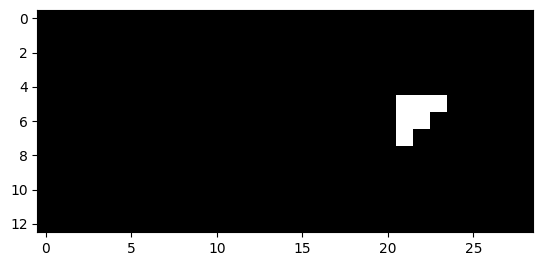

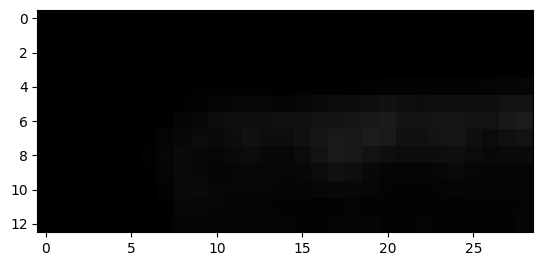

2184


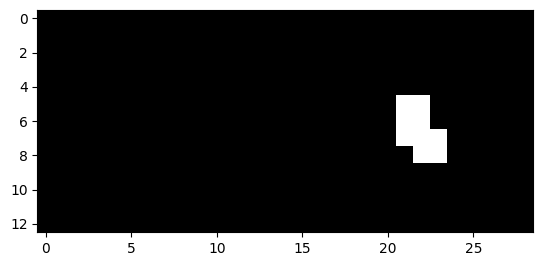

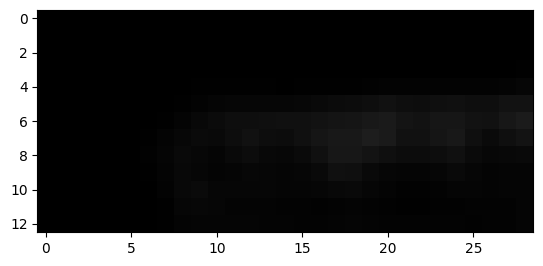

2185


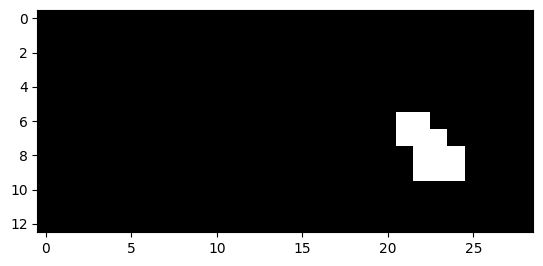

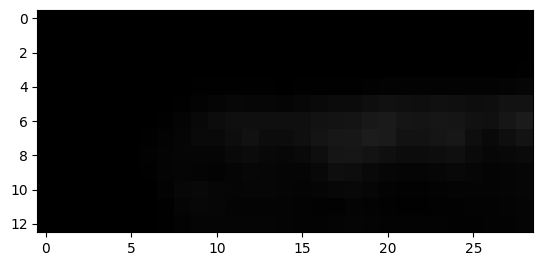

2186


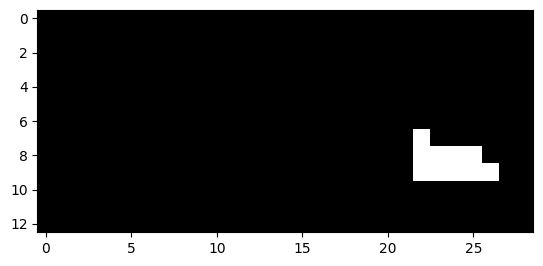

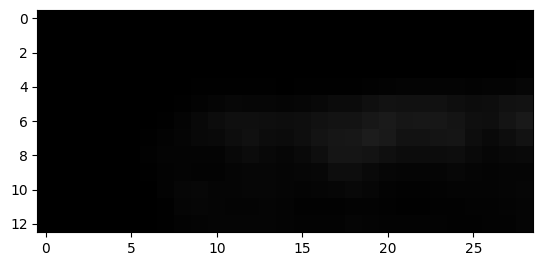

2187


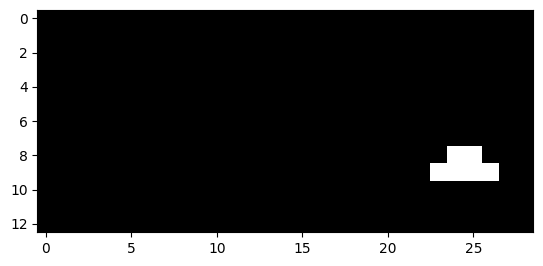

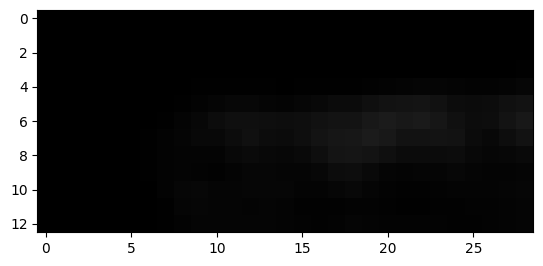

2188


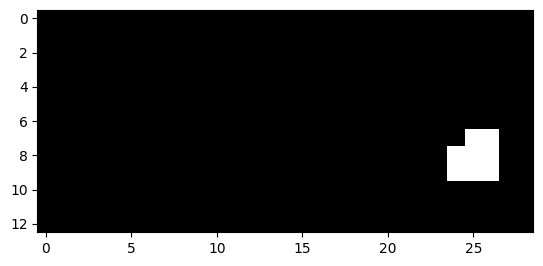

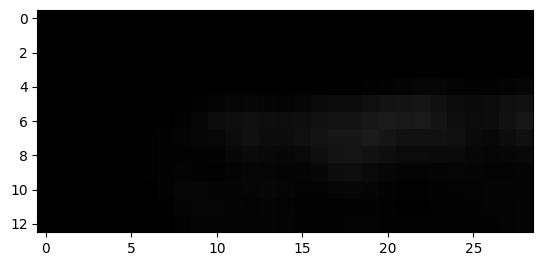

2189


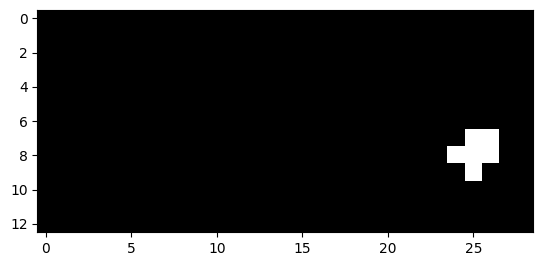

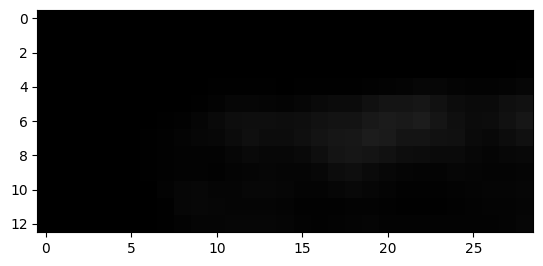

2190


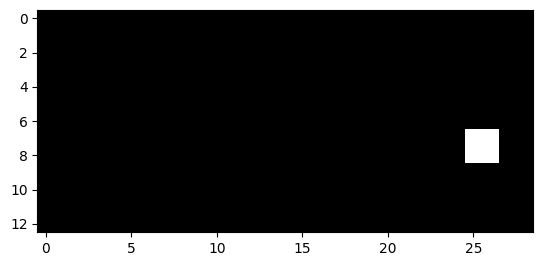

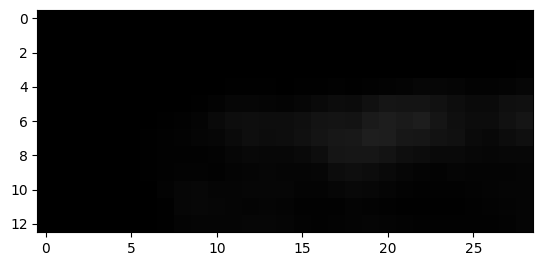

2191


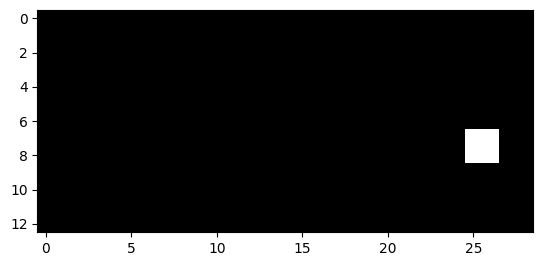

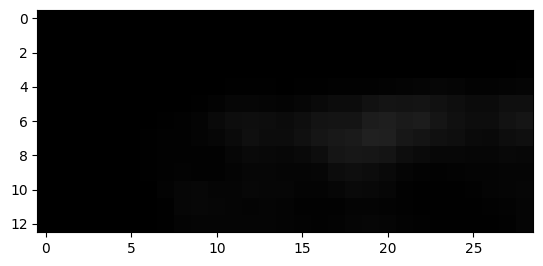

2214


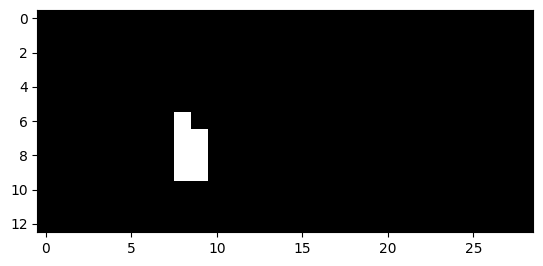

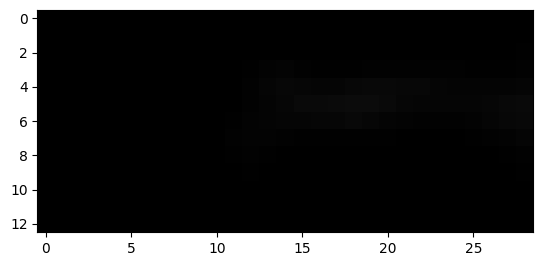

2215


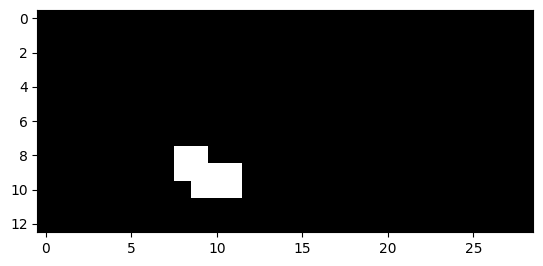

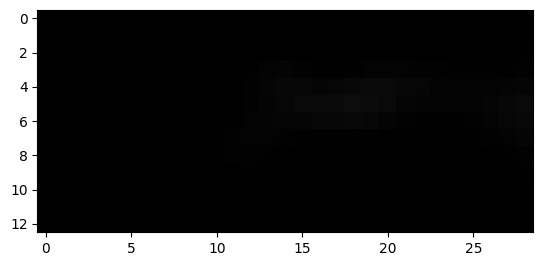

2216


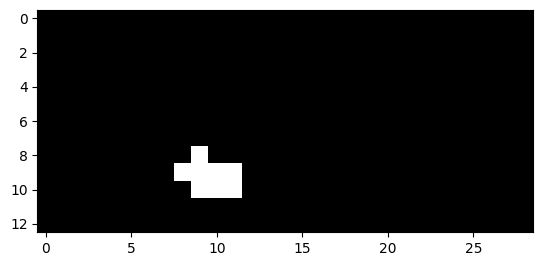

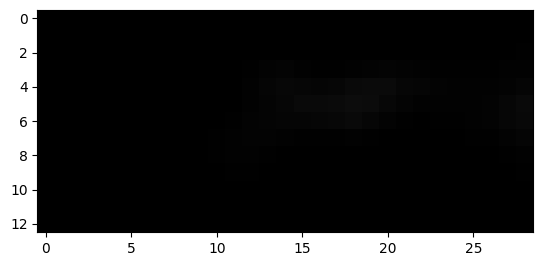

2226


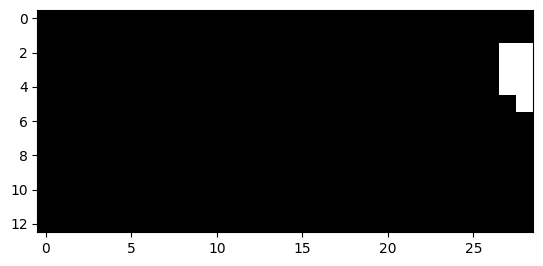

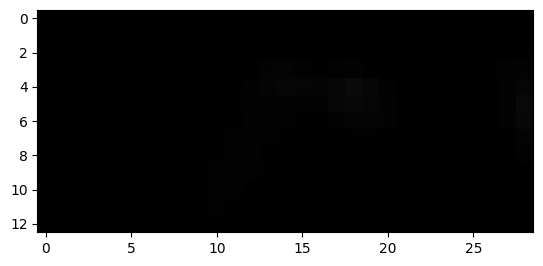

2227


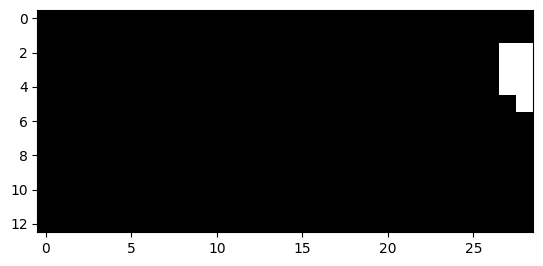

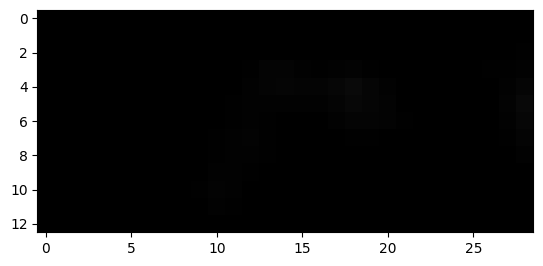

2228


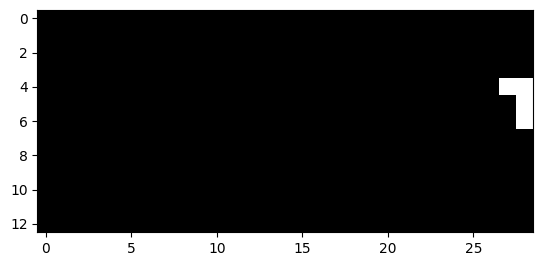

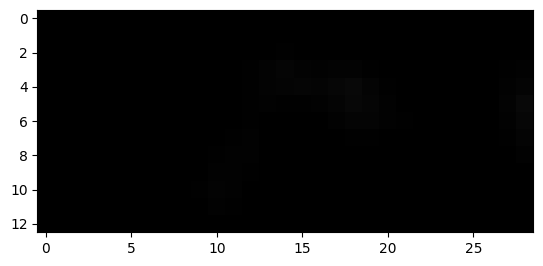

2229


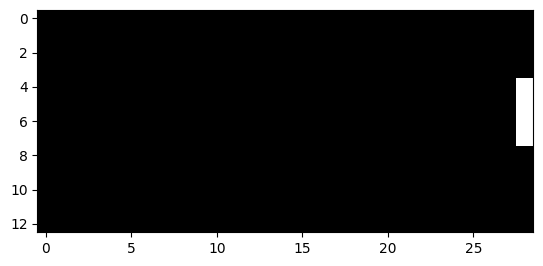

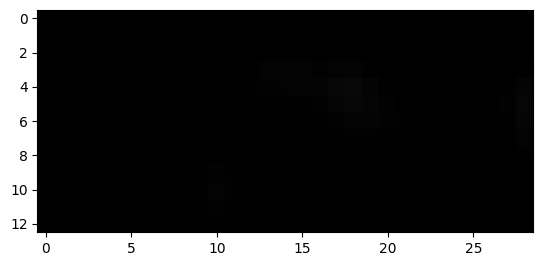

2230


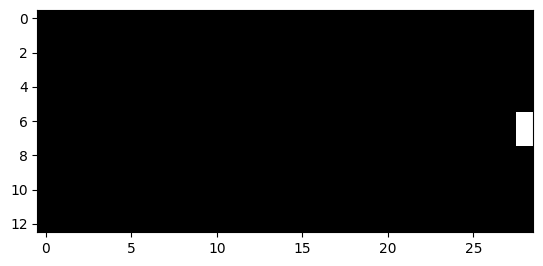

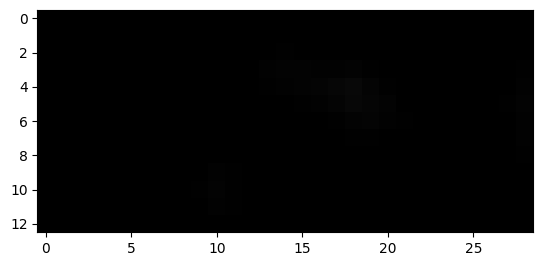

389


In [63]:
k=0
for i in range(len(y_test_img)): 
    if(np.max(y_test_img[i].reshape(-1))>0.1):
        print(i)
        plt.figure()
        plt.imshow(y_test_img[i], cmap = "gray", vmin=0, vmax=1)
        plt.show()
        plt.imshow(t[i], vmin=0, vmax=0.3, cmap = "gray")
        plt.show()
        k+=1
print(k)

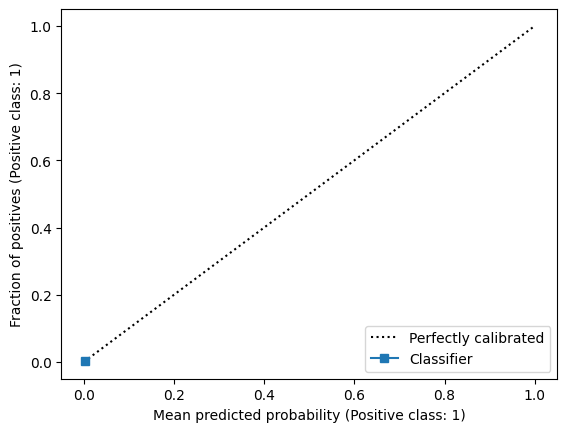

In [64]:
from sklearn.calibration import CalibrationDisplay

display = CalibrationDisplay.from_predictions(y_test_img.reshape(-1,1), t.reshape(-1,1), n_bins=10)


In [66]:
from sklearn.metrics import brier_score_loss
### brier score con probabilità predette

print(f'All zeros Brier score: {brier_score_loss(y_test_img.reshape(-1,1), np.zeros(len(y_test_img.reshape(-1,1))))}')
print(f'Model Brier score: {brier_score_loss(y_test_img.reshape(-1,1), t.reshape(-1,1))}')

All zeros Brier score: 0.0035259368257102965
Model Brier score: 0.0034682934045527644


In [67]:
test['predictions_lag0'] = t.reshape(-1,1)

In [68]:
test.to_csv("test_with_newTarget_predictions_onlyClim.csv")

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_51 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_52 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_17 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_53 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 cropping2d_17 (Cropping2D)  (None, 13, 29, 1)       

2023-05-05 11:58:02.781375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0989

2023-05-05 11:58:06.801611: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 12ms/step - loss: 0.0989 - val_loss: 0.0212
Epoch 2/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0230 - val_loss: 0.0203
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0222 - val_loss: 0.0199
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0218 - val_loss: 0.0198
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0215 - val_loss: 0.0196
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0213 - val_loss: 0.0197
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0212 - val_loss: 0.0196
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0195
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0211 - val_loss: 0.0194
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0210 - val_loss: 0.0193

2023-05-05 12:00:55.521548: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


78/78 [==============================] - 0s 3ms/step


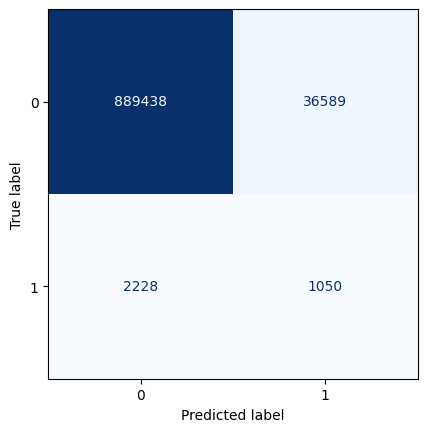

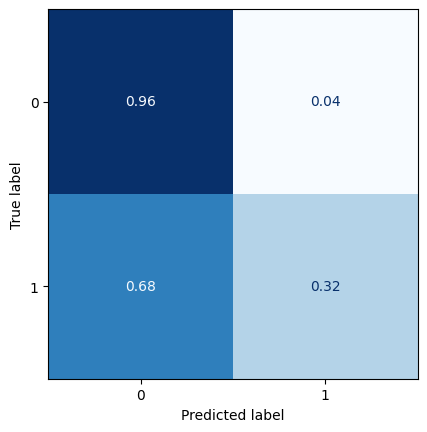

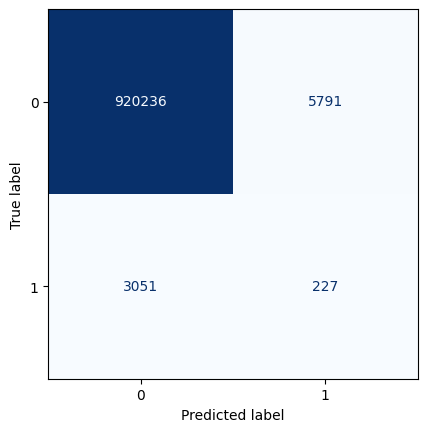

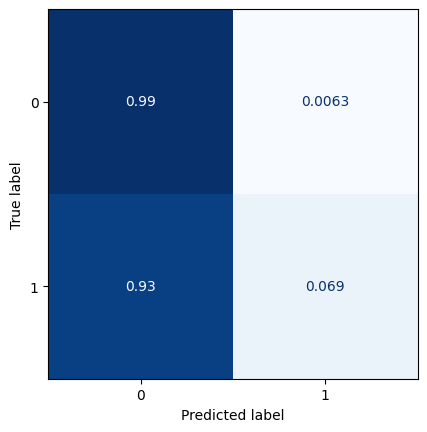

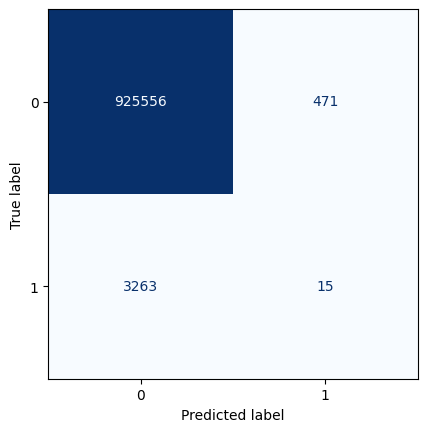

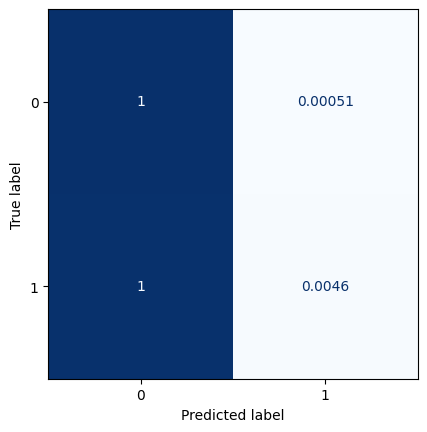

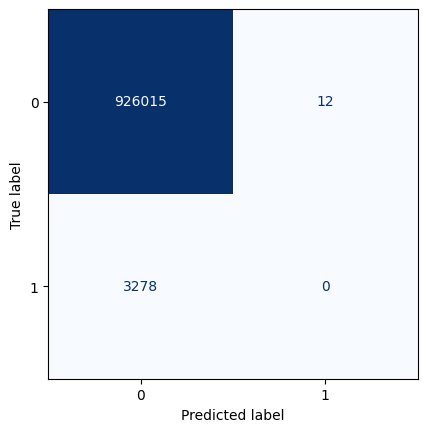

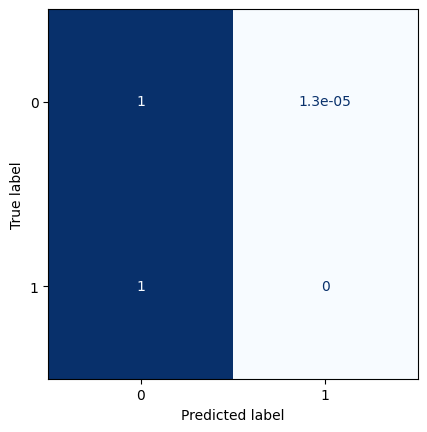

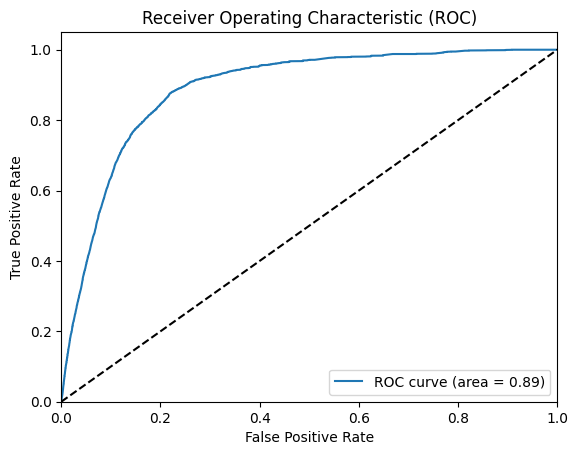

All zeros Brier score: 0.00352736722604527
Model Brier score: 0.0034731221768845924
Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_54 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_55 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_18 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_56 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-05-05 12:01:07.150521: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0704

2023-05-05 12:01:10.326500: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 9ms/step - loss: 0.0704 - val_loss: 0.0205
Epoch 2/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0225 - val_loss: 0.0201
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0220 - val_loss: 0.0198
Epoch 4/100
354/354 [==============================] - 2s 7ms/step - loss: 0.0217 - val_loss: 0.0199
Epoch 5/100
354/354 [==============================] - 2s 7ms/step - loss: 0.0215 - val_loss: 0.0196
Epoch 6/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0213 - val_loss: 0.0195
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0195
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0211 - val_loss: 0.0198
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0211 - val_loss: 0.0196
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0194
E

2023-05-05 12:02:49.010511: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


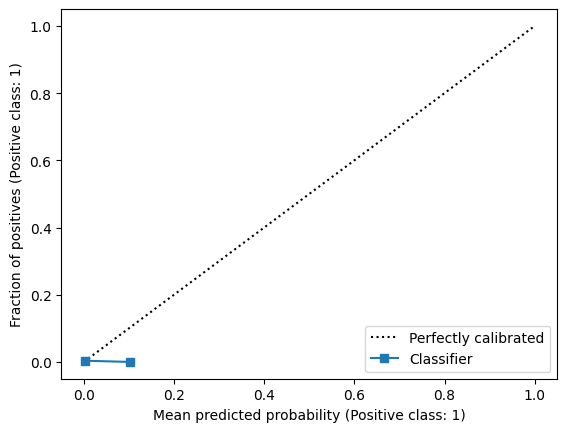

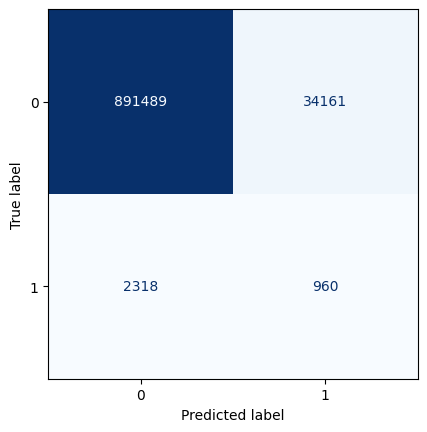

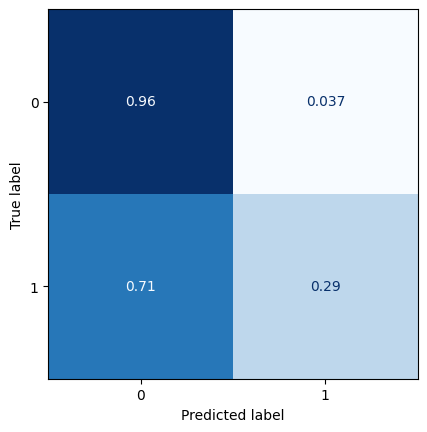

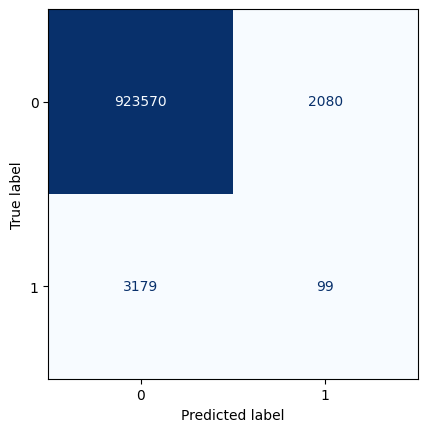

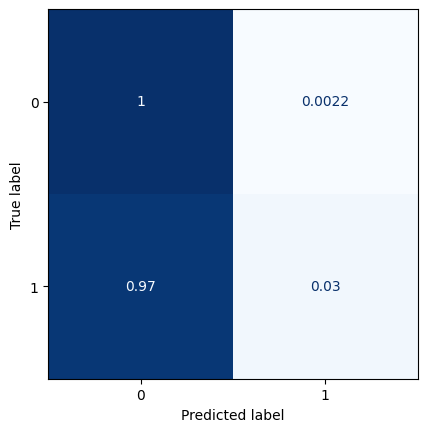

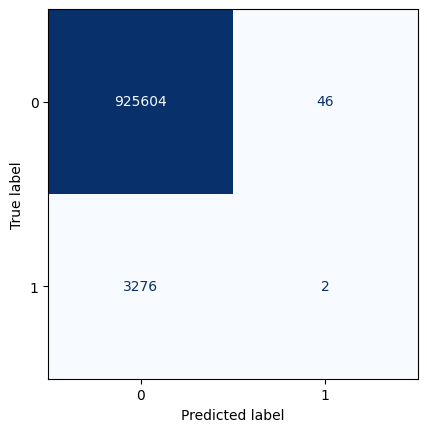

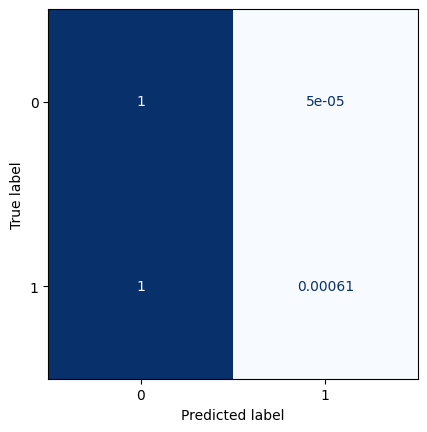

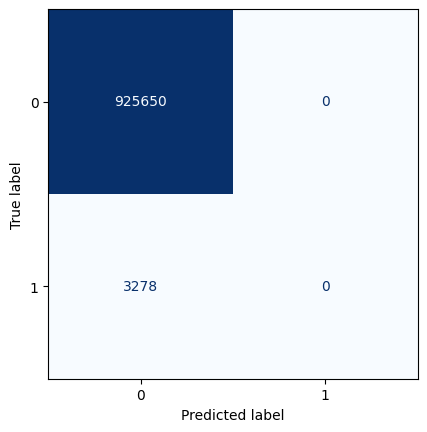

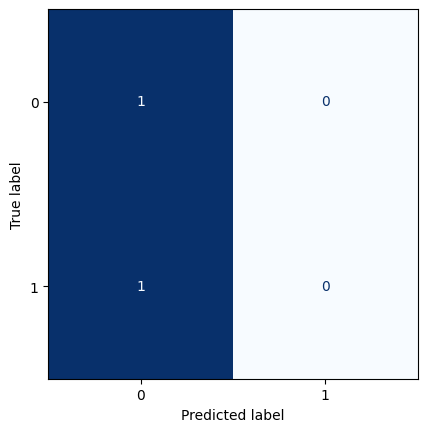

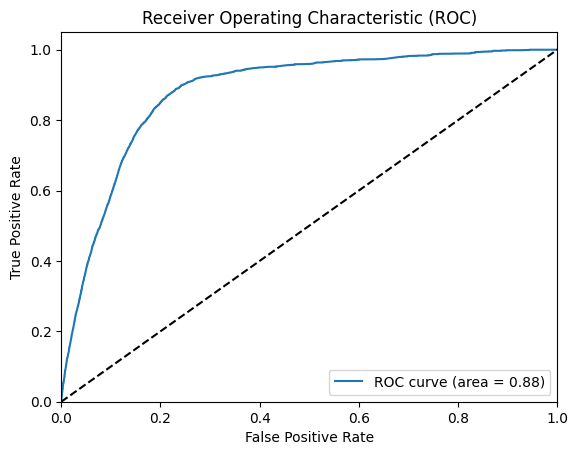

All zeros Brier score: 0.003528798787419477
Model Brier score: 0.0034733703278640115
Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_57 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_58 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_19 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_59 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-05-05 12:02:59.358863: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0751

2023-05-05 12:03:02.996765: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0751 - val_loss: 0.0217
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0232 - val_loss: 0.0208
Epoch 3/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0227 - val_loss: 0.0205
Epoch 4/100
354/354 [==============================] - 4s 11ms/step - loss: 0.0223 - val_loss: 0.0202
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0219 - val_loss: 0.0201
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0217 - val_loss: 0.0198
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0198
Epoch 8/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0213 - val_loss: 0.0196
Epoch 9/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0212 - val_loss: 0.0195
Epoch 10/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0211 - val_loss: 0.019

2023-05-05 12:05:37.297341: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 4ms/step


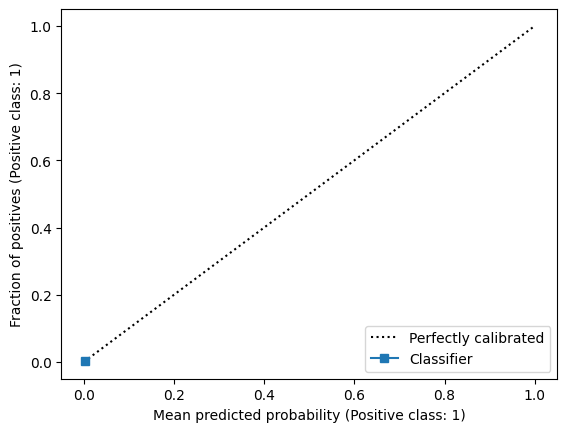

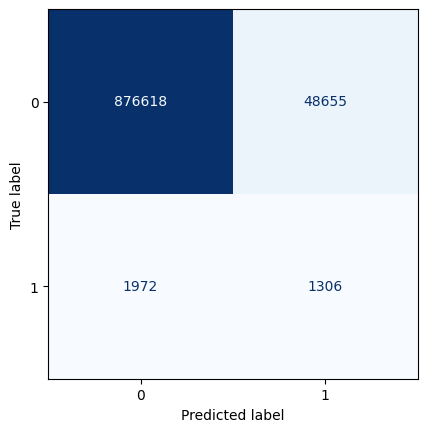

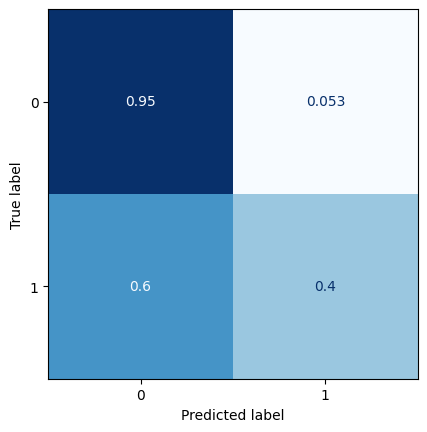

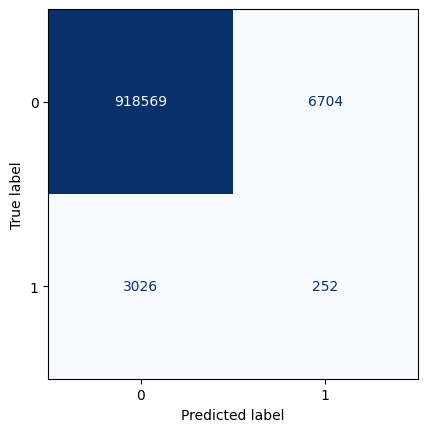

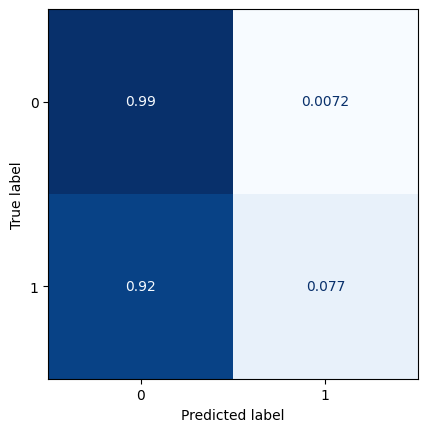

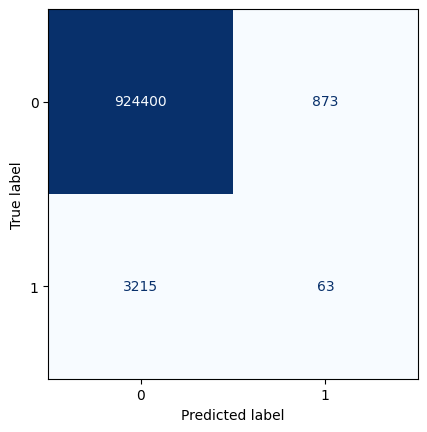

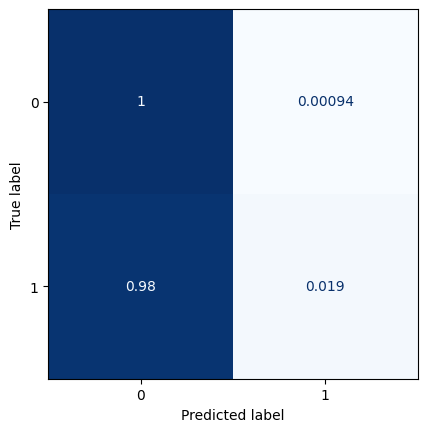

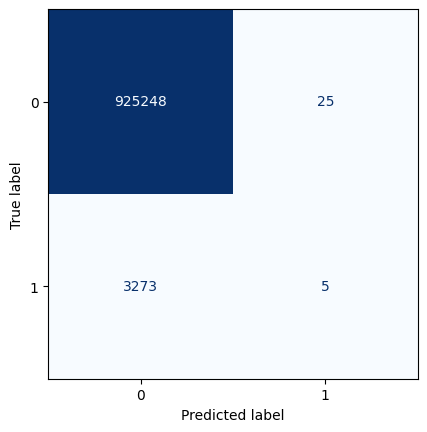

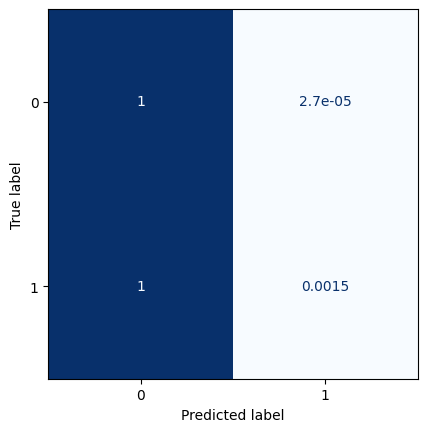

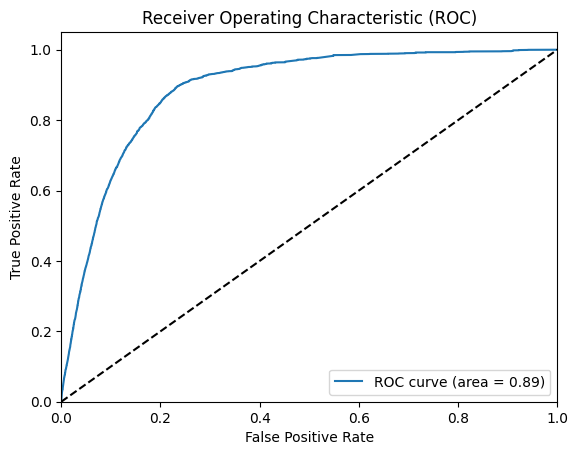

All zeros Brier score: 0.0035302315112470937
Model Brier score: 0.0034803192594167333
Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_60 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_61 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_20 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_62 (Conv2D)          (None, 14, 30, 1)         73        
                                 

2023-05-05 12:05:47.501249: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0780

2023-05-05 12:05:50.837429: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0780 - val_loss: 0.0212
Epoch 2/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0233 - val_loss: 0.0208
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0228 - val_loss: 0.0202
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0224 - val_loss: 0.0199
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0221 - val_loss: 0.0199
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0219 - val_loss: 0.0198
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0217 - val_loss: 0.0196
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0215 - val_loss: 0.0196
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0213 - val_loss: 0.0195
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0212 - val_loss: 0.0194
E

2023-05-05 12:08:00.550065: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


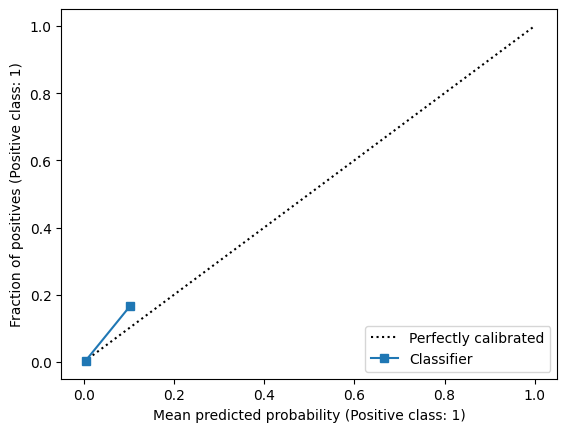

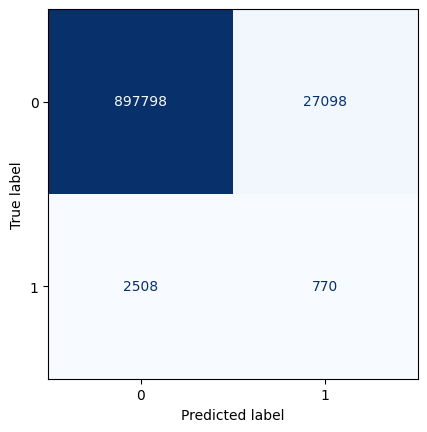

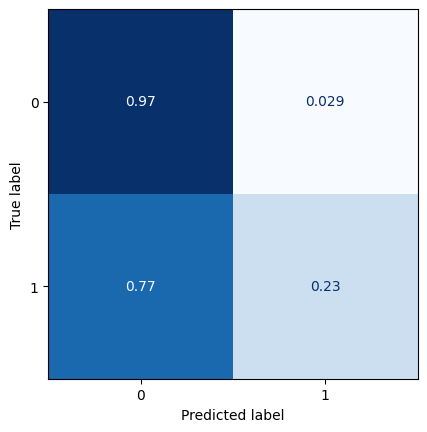

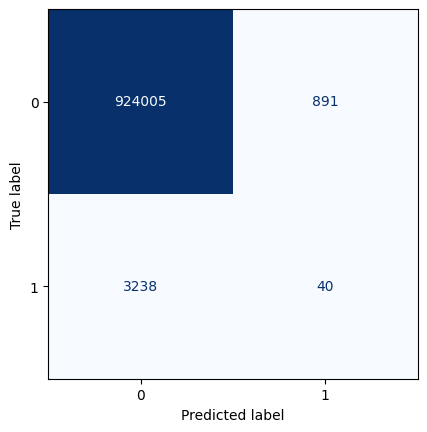

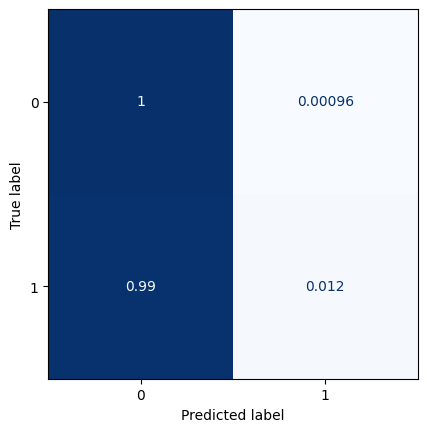

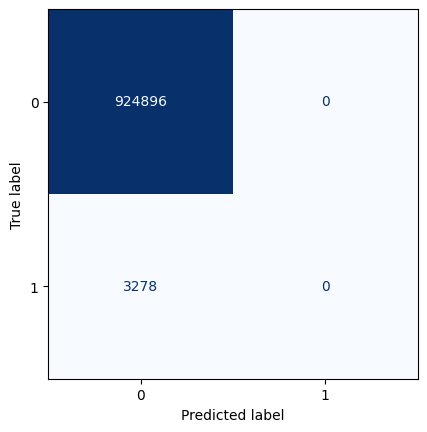

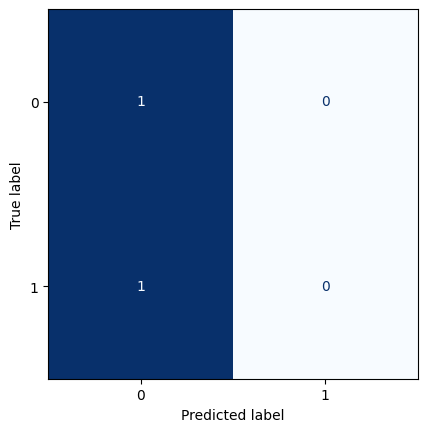

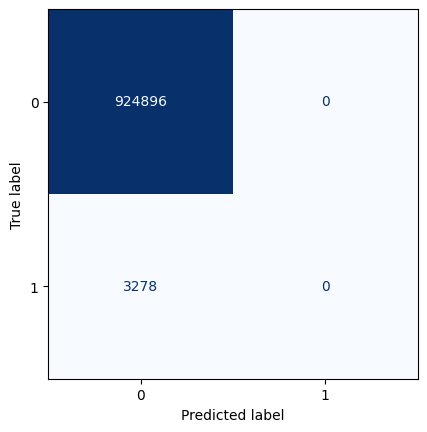

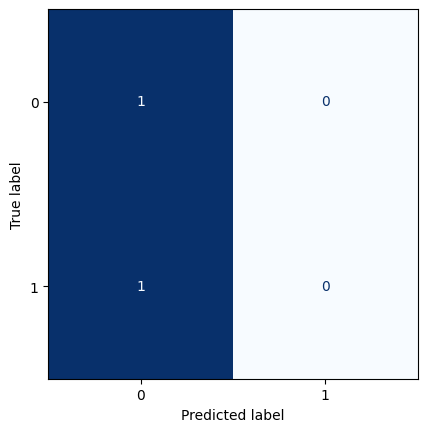

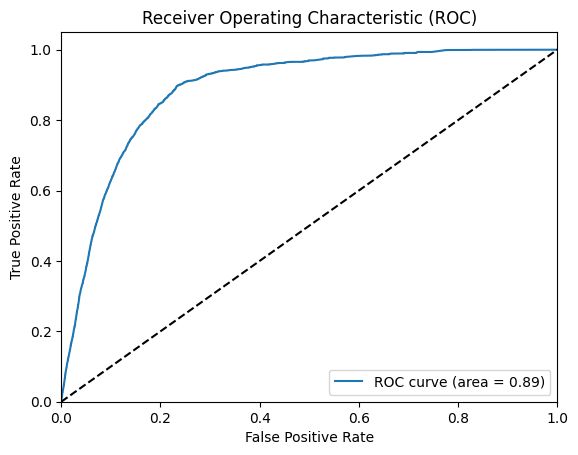

All zeros Brier score: 0.0035316653989445946
Model Brier score: 0.0034744636255963444
Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_63 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_64 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_21 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_65 (Conv2D)          (None, 14, 30, 1)         73        
                                 

2023-05-05 12:08:09.552650: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0577

2023-05-05 12:08:13.431298: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 11ms/step - loss: 0.0577 - val_loss: 0.0207
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0229 - val_loss: 0.0201
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0224 - val_loss: 0.0199
Epoch 4/100
354/354 [==============================] - 2s 7ms/step - loss: 0.0220 - val_loss: 0.0195
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0216 - val_loss: 0.0195
Epoch 6/100
354/354 [==============================] - 2s 7ms/step - loss: 0.0214 - val_loss: 0.0195
Epoch 7/100
354/354 [==============================] - 2s 7ms/step - loss: 0.0211 - val_loss: 0.0194
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0210 - val_loss: 0.0191
Epoch 9/100
354/354 [==============================] - 2s 7ms/step - loss: 0.0209 - val_loss: 0.0191
Epoch 10/100
354/354 [==============================] - 2s 7ms/step - loss: 0.0208 - val_loss: 0.0195


2023-05-05 12:09:54.968390: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


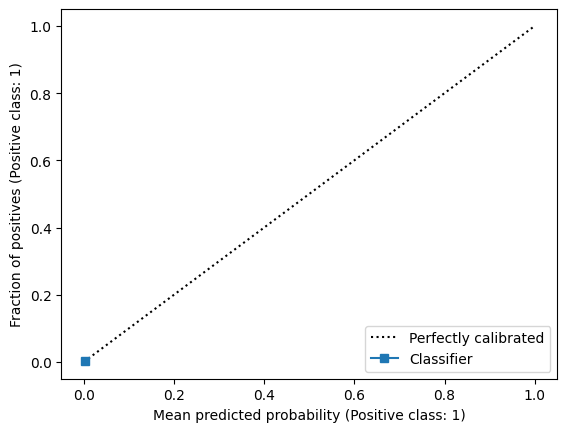

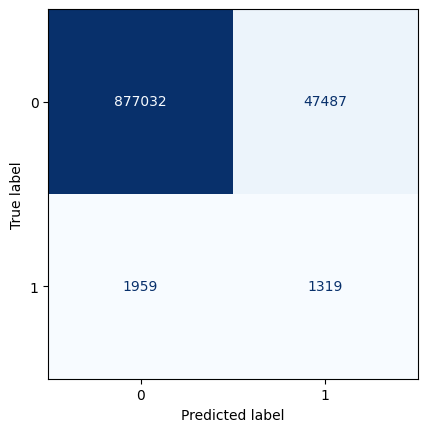

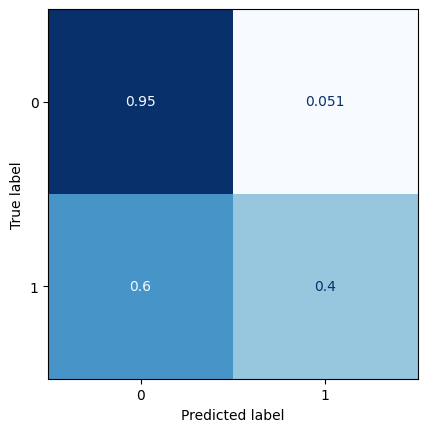

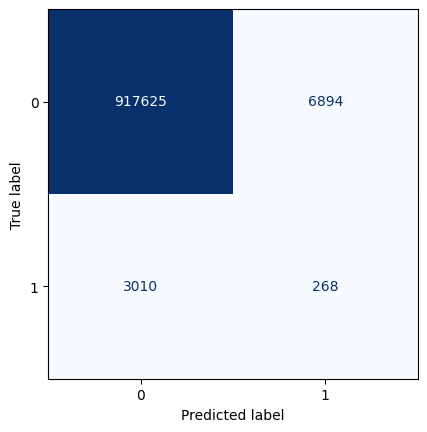

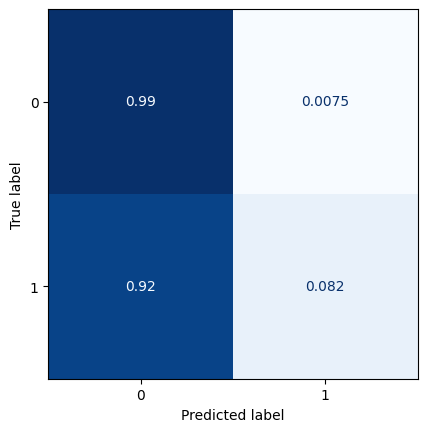

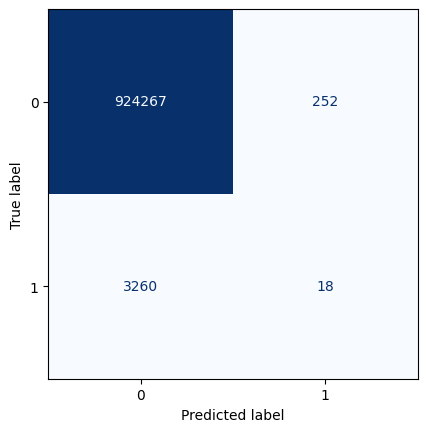

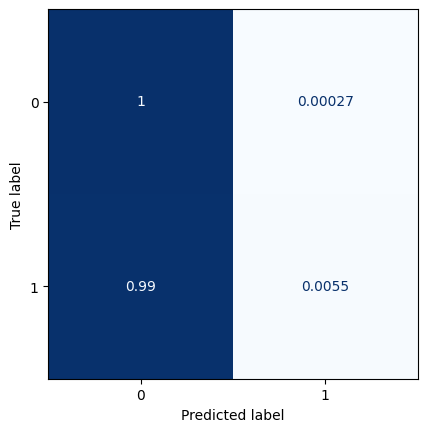

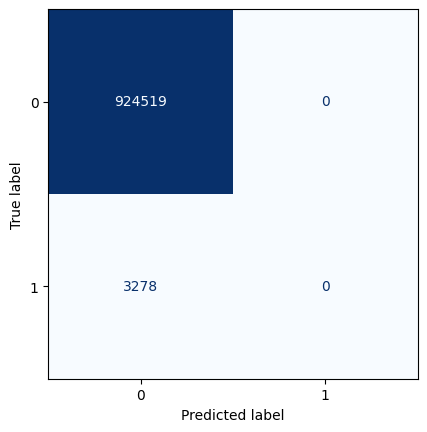

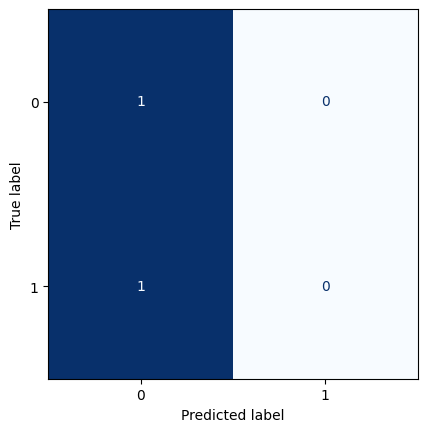

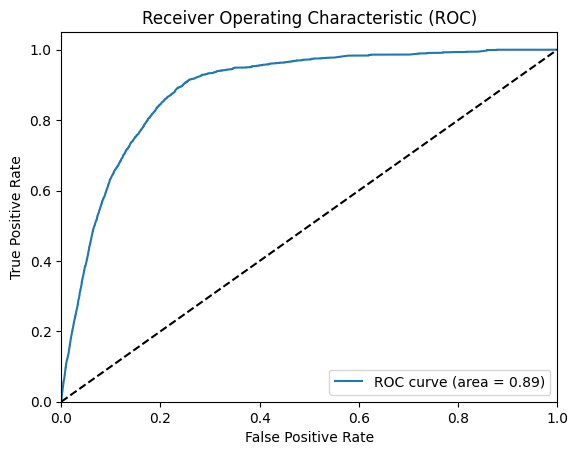

All zeros Brier score: 0.0035331004519307562
Model Brier score: 0.0034806916084939347
Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_66 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_67 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_22 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_68 (Conv2D)          (None, 14, 30, 1)         73        
                                 

2023-05-05 12:10:04.403286: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.1184

2023-05-05 12:10:07.429923: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.1184 - val_loss: 0.0212
Epoch 2/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0230 - val_loss: 0.0201
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0223 - val_loss: 0.0198
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0218 - val_loss: 0.0196
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0216 - val_loss: 0.0194
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0214 - val_loss: 0.0193
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0193
Epoch 8/100
354/354 [==============================] - 2s 7ms/step - loss: 0.0211 - val_loss: 0.0197
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0210 - val_loss: 0.0192
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0191
E

2023-05-05 14:10:19.007294: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 3s 13ms/step


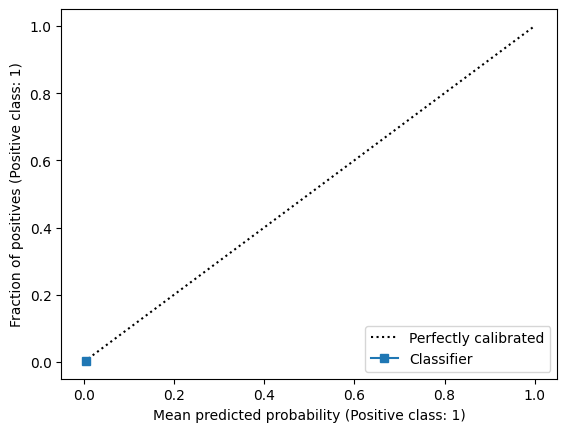

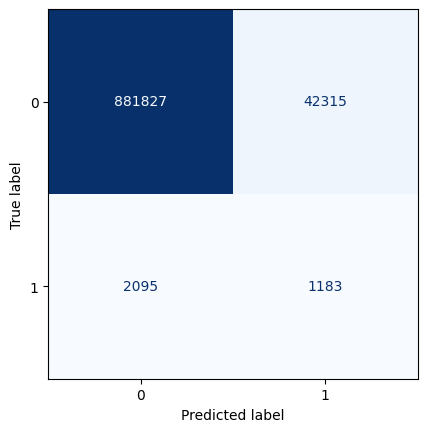

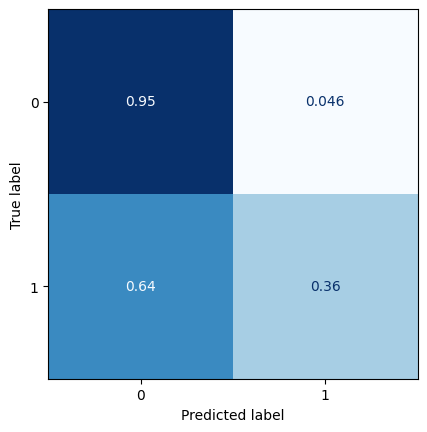

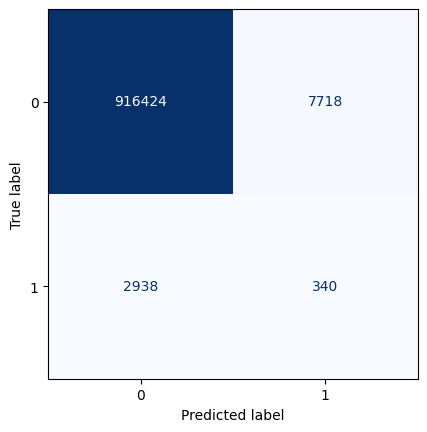

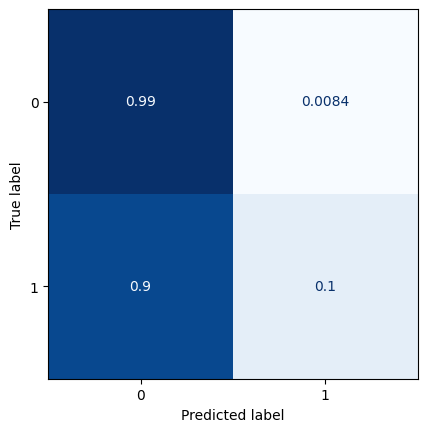

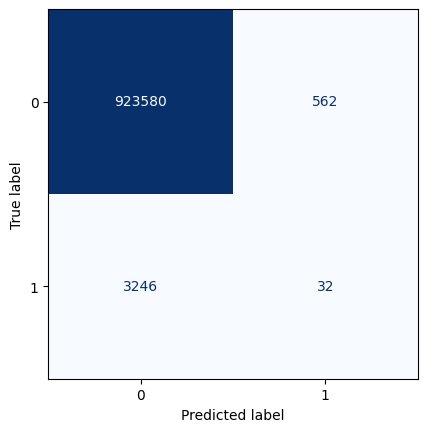

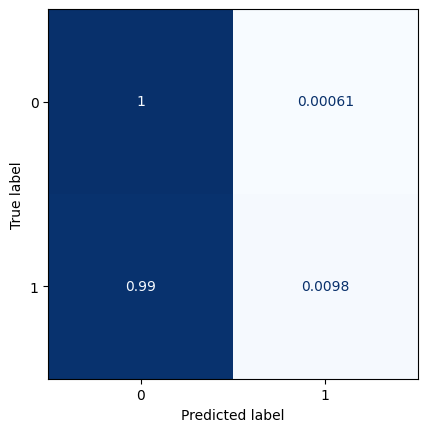

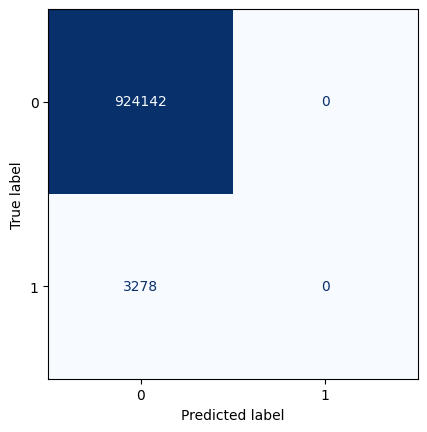

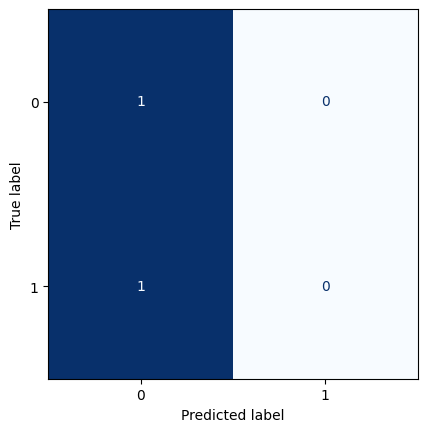

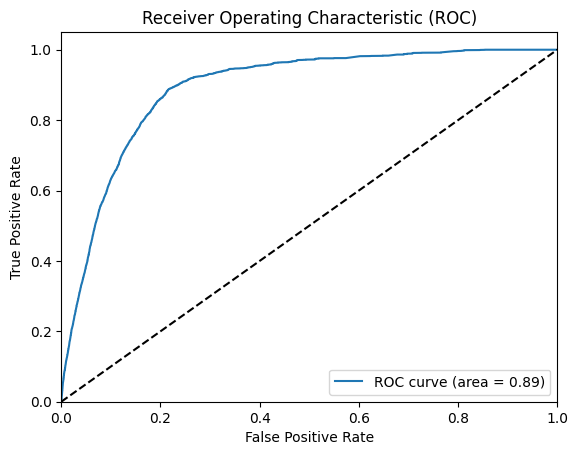

All zeros Brier score: 0.003534536671626663
Model Brier score: 0.003479626456233756
Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_69 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_23 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_70 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_23 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_71 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-05-05 14:10:41.956575: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0712

2023-05-05 14:10:48.839361: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 8s 19ms/step - loss: 0.0712 - val_loss: 0.0211
Epoch 2/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0230 - val_loss: 0.0203
Epoch 3/100
354/354 [==============================] - 6s 16ms/step - loss: 0.0224 - val_loss: 0.0199
Epoch 4/100
354/354 [==============================] - 4s 11ms/step - loss: 0.0221 - val_loss: 0.0197
Epoch 5/100
354/354 [==============================] - 4s 11ms/step - loss: 0.0218 - val_loss: 0.0197
Epoch 6/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0215 - val_loss: 0.0196
Epoch 7/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0213 - val_loss: 0.0194
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0194
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0194
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0210 - val_loss: 0.0

2023-05-05 14:13:55.143340: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 4ms/step


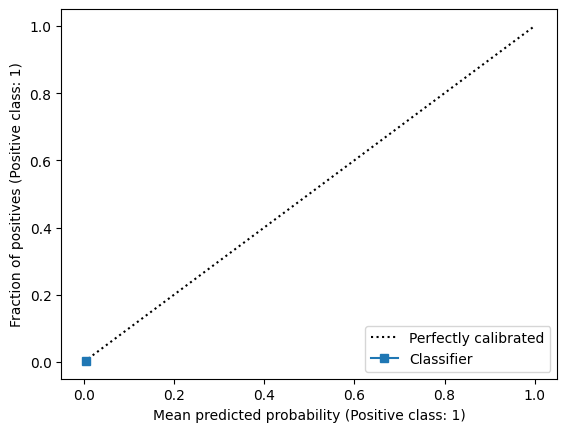

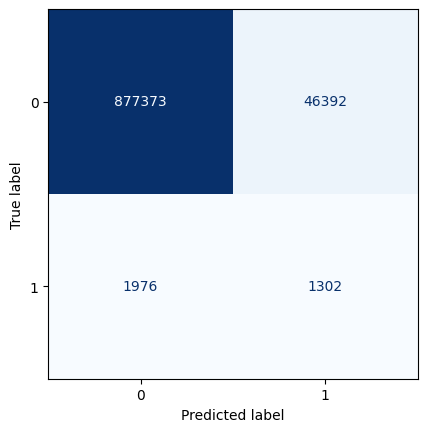

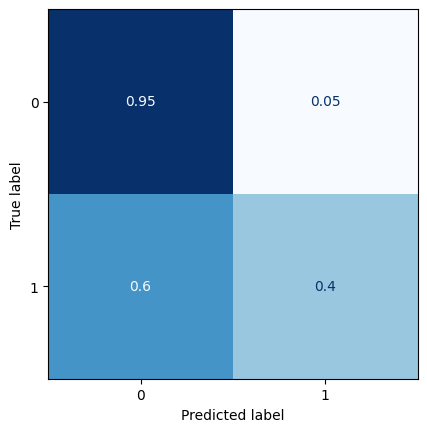

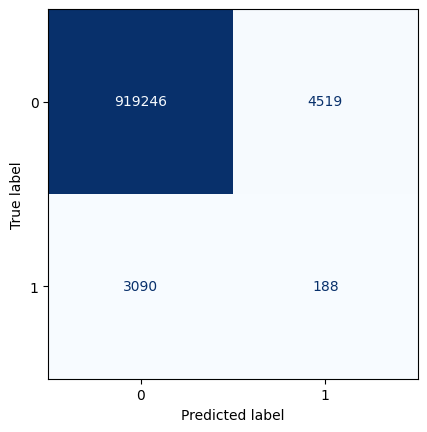

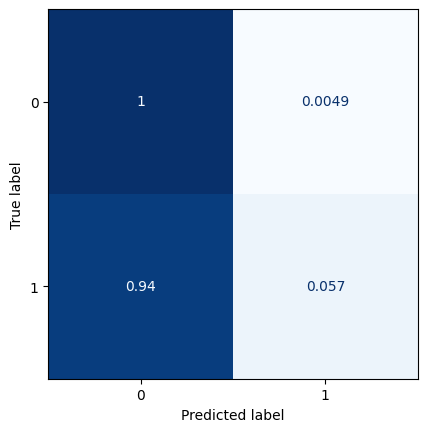

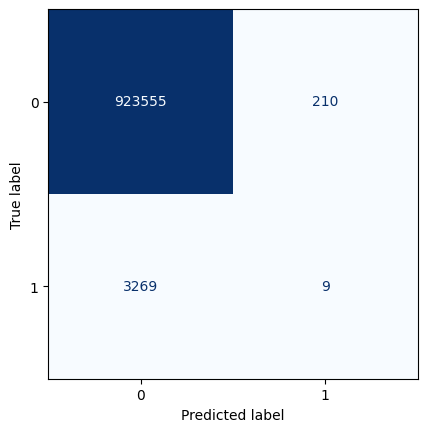

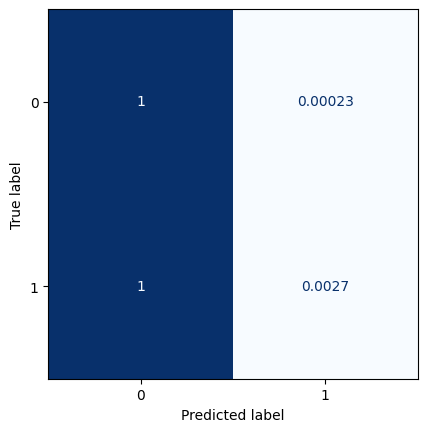

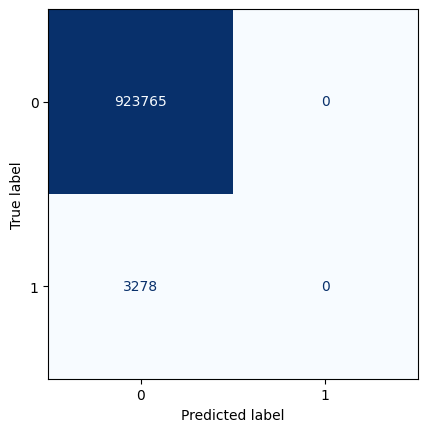

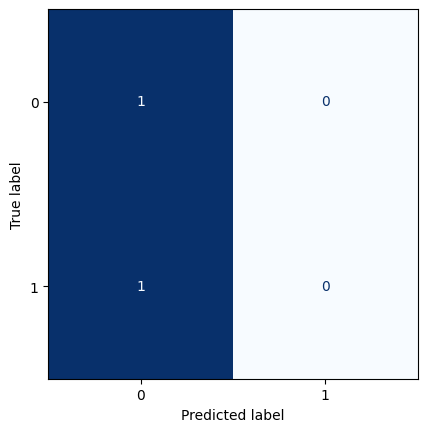

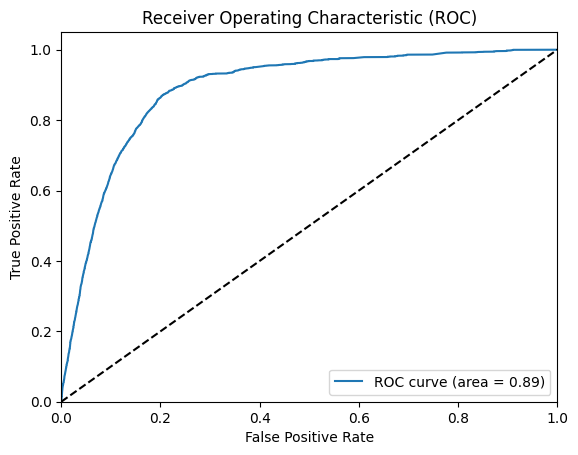

All zeros Brier score: 0.00353597405945571
Model Brier score: 0.0034798628504075016
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_72 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_73 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_24 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_74 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-05-05 14:14:12.764921: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0761

2023-05-05 14:14:17.015835: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 12ms/step - loss: 0.0761 - val_loss: 0.0208
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0229 - val_loss: 0.0203
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0224 - val_loss: 0.0199
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0220 - val_loss: 0.0196
Epoch 5/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0217 - val_loss: 0.0195
Epoch 6/100
354/354 [==============================] - 4s 12ms/step - loss: 0.0216 - val_loss: 0.0196
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0193
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0212 - val_loss: 0.0192
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0191
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0210 - val_loss: 0.019

2023-05-05 14:17:07.806405: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


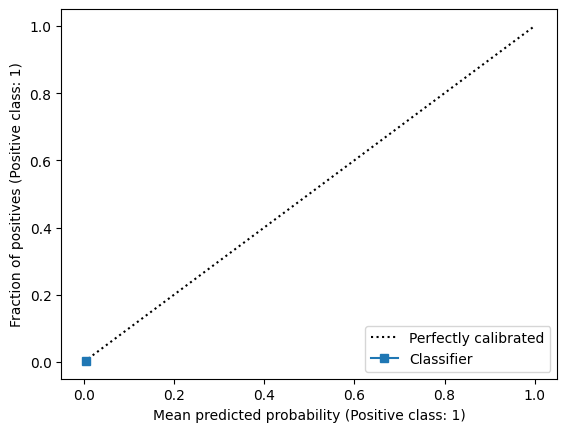

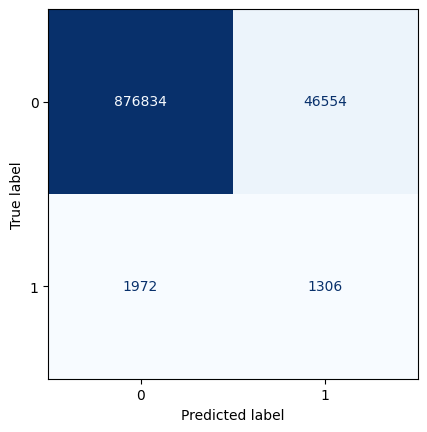

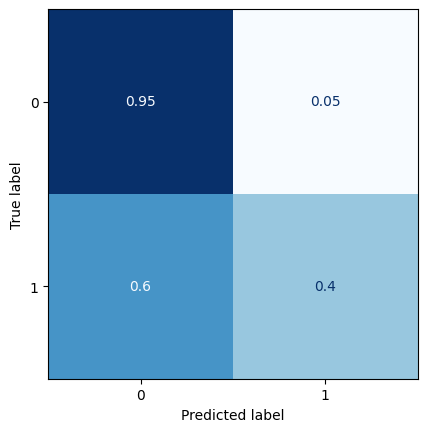

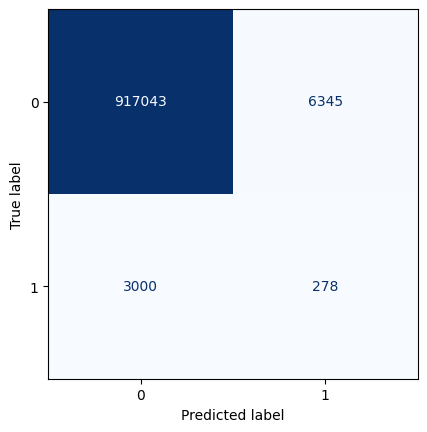

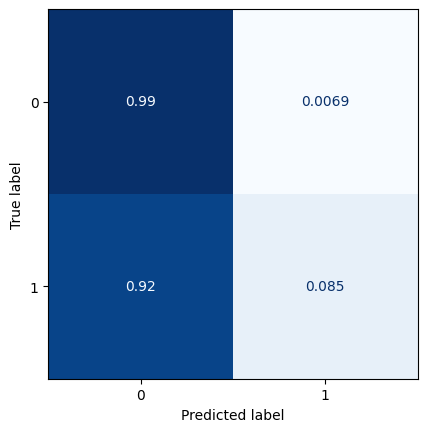

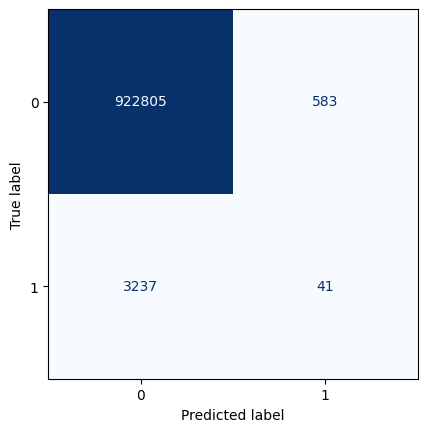

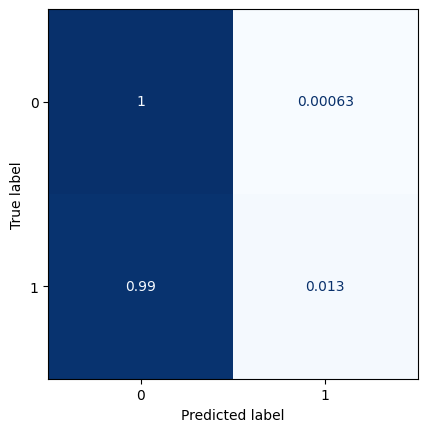

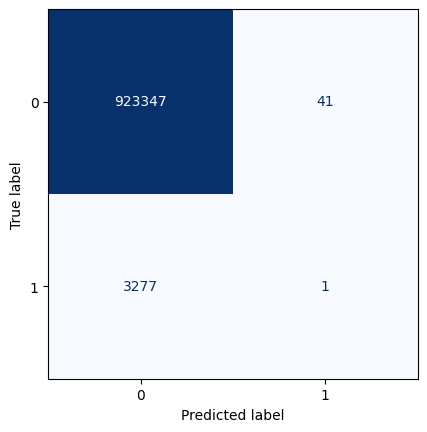

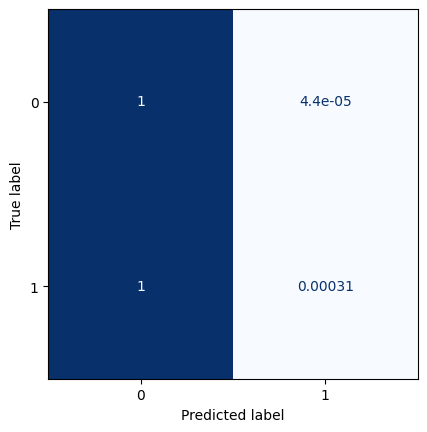

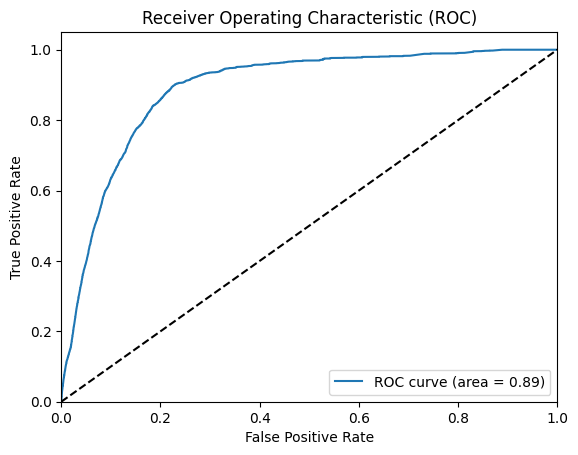

All zeros Brier score: 0.0035374126168436094
Model Brier score: 0.0034835678750352143
Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_75 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_76 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_25 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_77 (Conv2D)          (None, 14, 30, 1)         73        
                                 

2023-05-05 14:17:17.155407: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.1044

2023-05-05 14:17:20.897657: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 10ms/step - loss: 0.1044 - val_loss: 0.0211
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0230 - val_loss: 0.0205
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0226 - val_loss: 0.0200
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0223 - val_loss: 0.0200
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0220 - val_loss: 0.0203
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0217 - val_loss: 0.0197
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0215 - val_loss: 0.0195
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0214 - val_loss: 0.0195
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0212 - val_loss: 0.0194
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0211 - val_loss: 0.0192


2023-05-05 14:19:32.906095: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 4ms/step


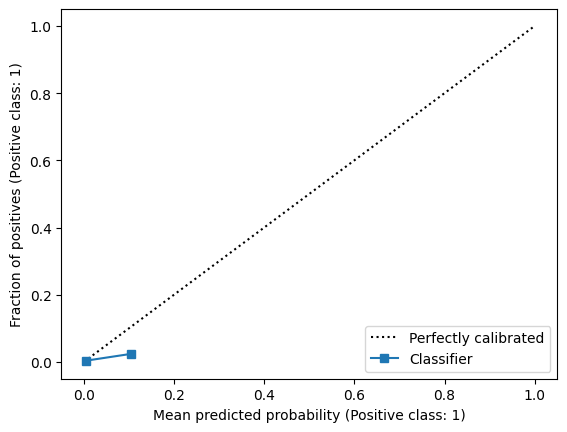

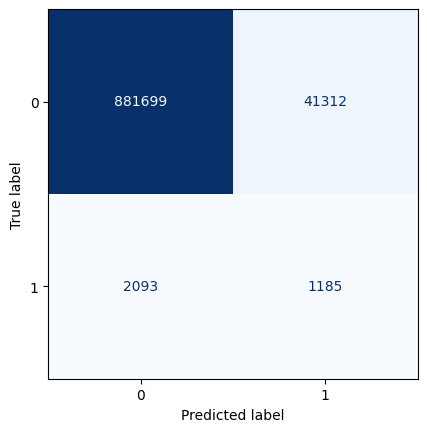

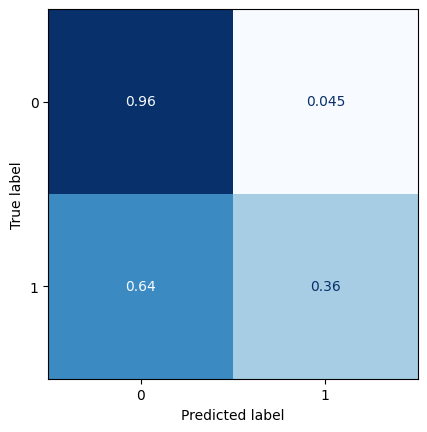

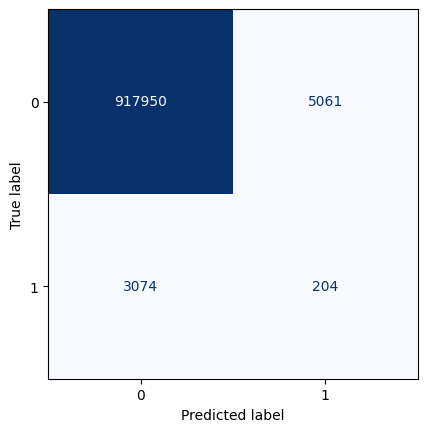

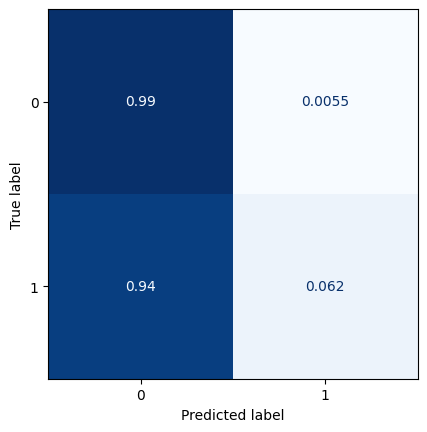

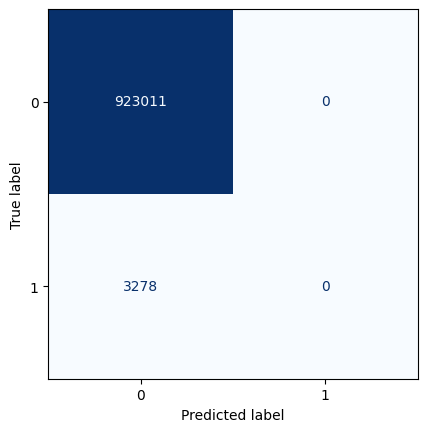

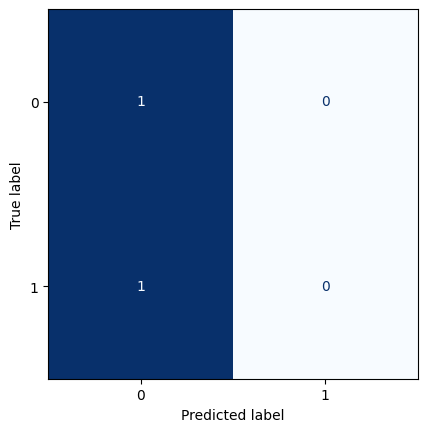

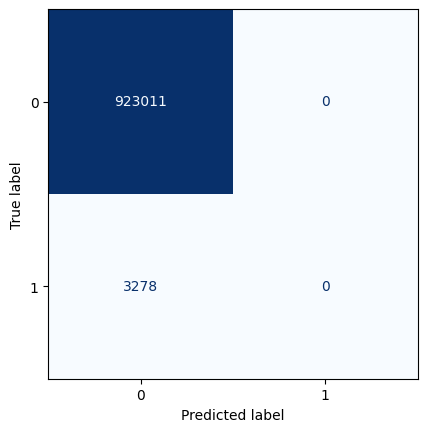

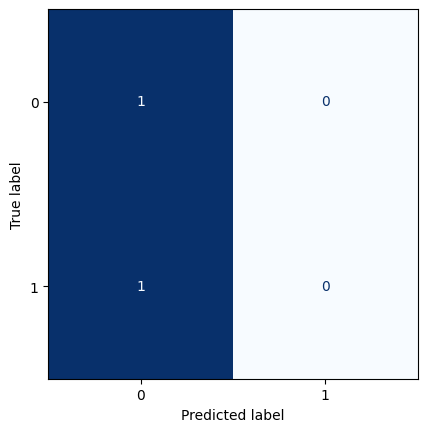

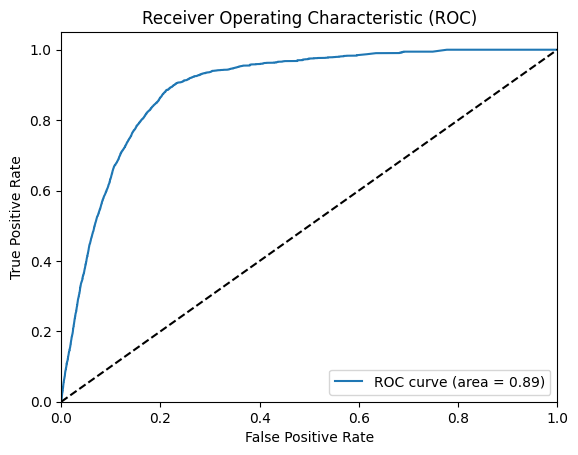

All zeros Brier score: 0.003538852345218393
Model Brier score: 0.003482612406692304
Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_78 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_79 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_26 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_80 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-05-05 14:19:42.323134: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.1169

2023-05-05 14:19:46.443041: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 10ms/step - loss: 0.1169 - val_loss: 0.0210
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0229 - val_loss: 0.0202
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0224 - val_loss: 0.0200
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0222 - val_loss: 0.0198
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0219 - val_loss: 0.0197
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0217 - val_loss: 0.0196
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0194
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0213 - val_loss: 0.0193
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0212 - val_loss: 0.0190
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0211 - val_loss: 0.0195


2023-05-05 14:21:59.827593: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 3ms/step


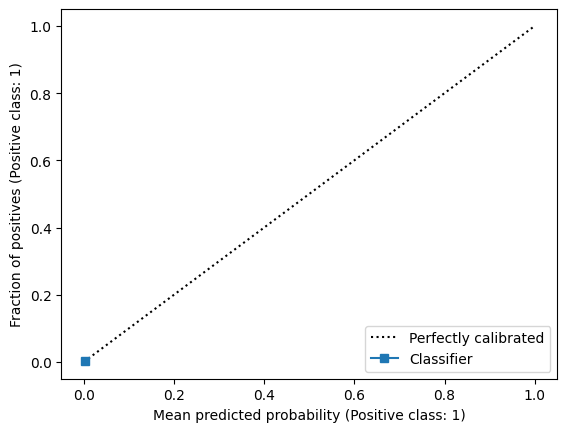

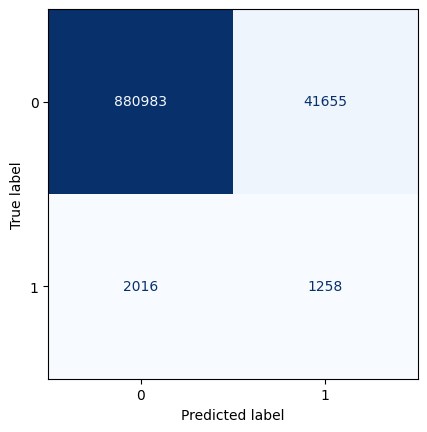

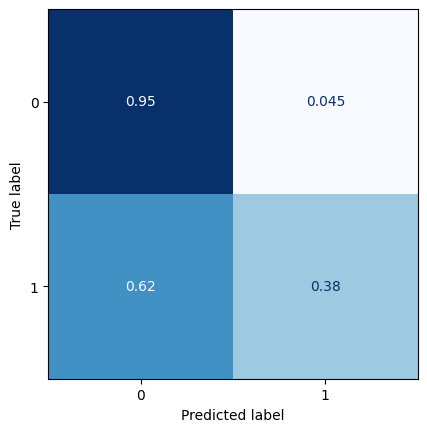

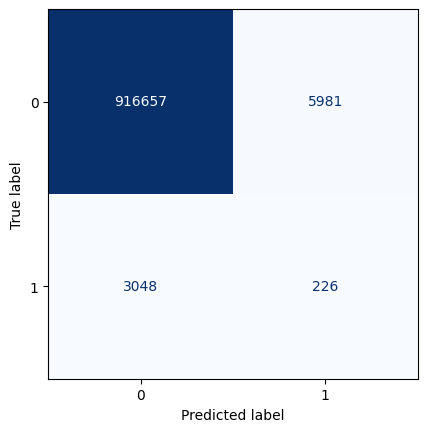

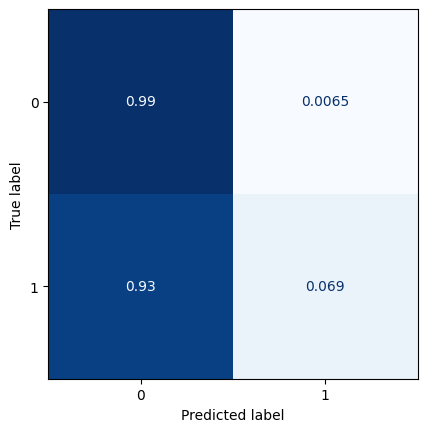

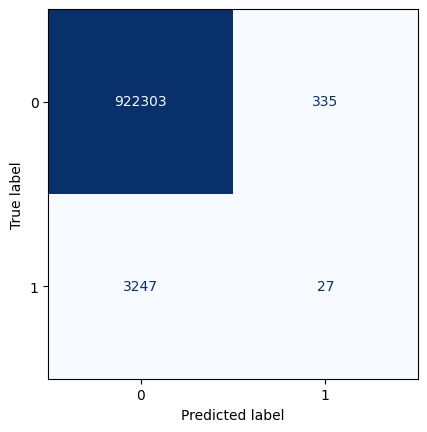

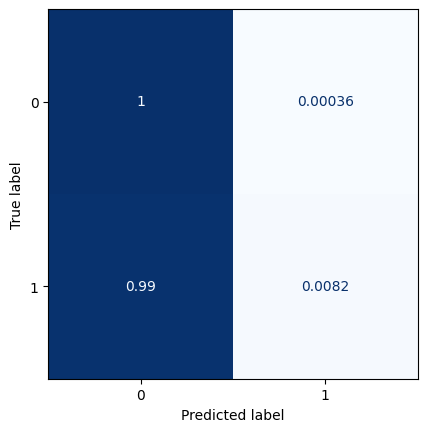

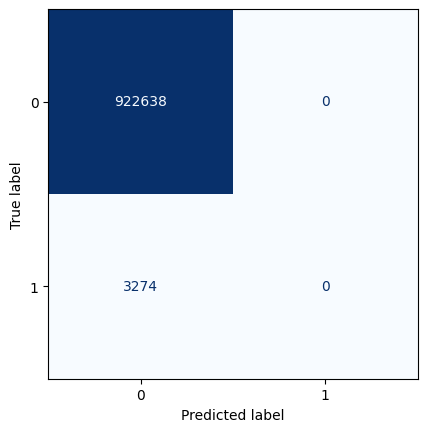

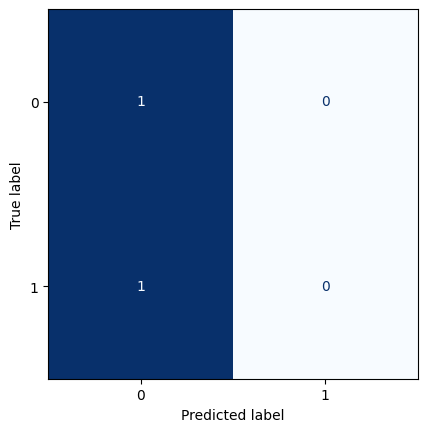

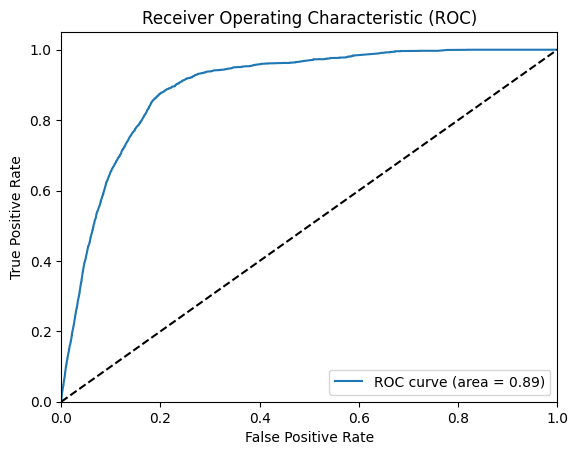

All zeros Brier score: 0.0035359731810366427
Model Brier score: 0.0034786598451489806
Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_81 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_82 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_27 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_83 (Conv2D)          (None, 14, 30, 1)         73        
                                 

2023-05-05 14:22:09.287558: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.1030

2023-05-05 14:22:12.945870: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.1030 - val_loss: 0.0222
Epoch 2/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0242 - val_loss: 0.0209
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0233 - val_loss: 0.0204
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0226 - val_loss: 0.0201
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0221 - val_loss: 0.0198
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0217 - val_loss: 0.0197
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0213 - val_loss: 0.0194
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0212 - val_loss: 0.0194
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0210 - val_loss: 0.0195
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0209 - val_loss: 0.0194


2023-05-05 14:25:17.374028: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 4ms/step


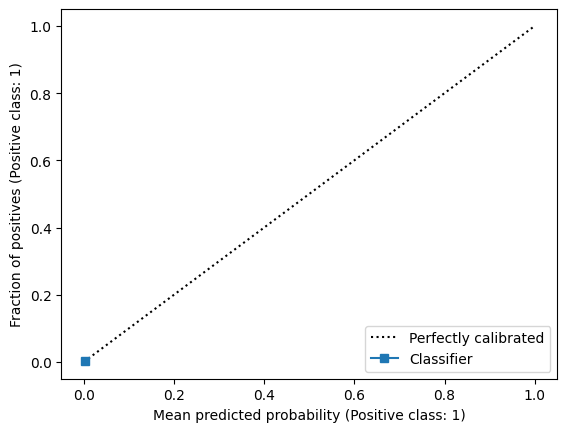

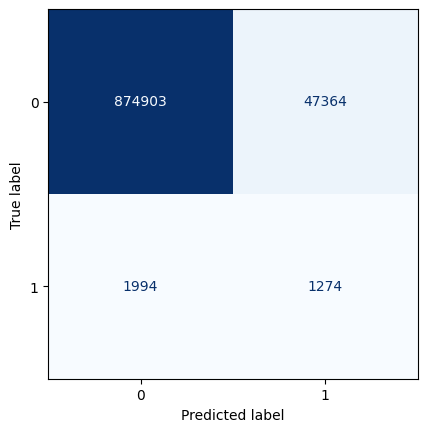

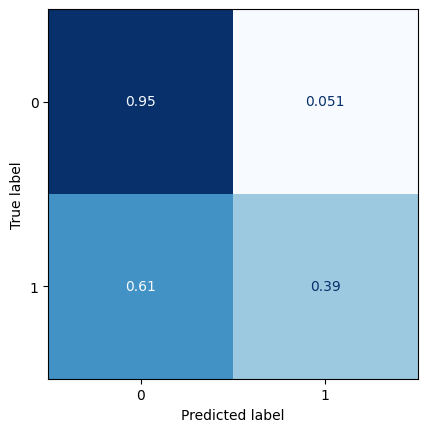

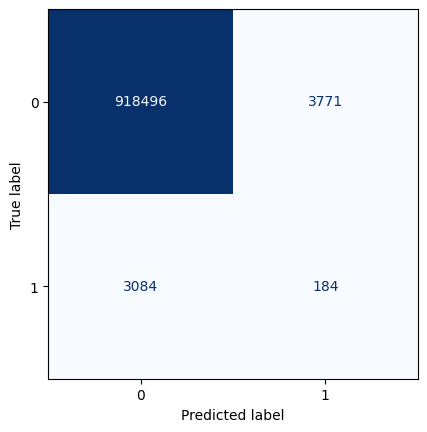

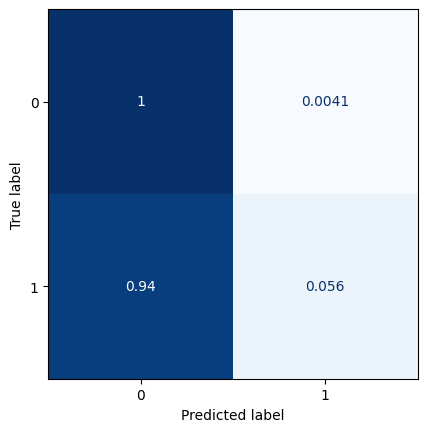

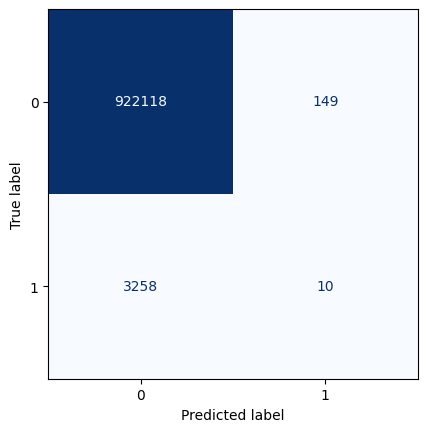

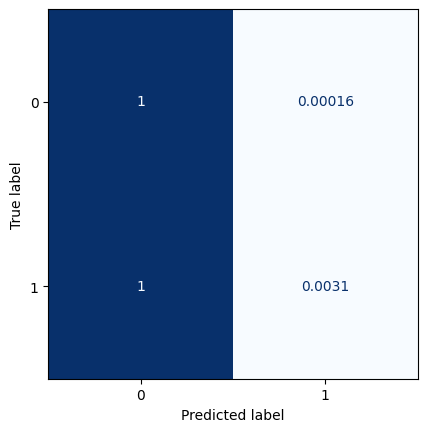

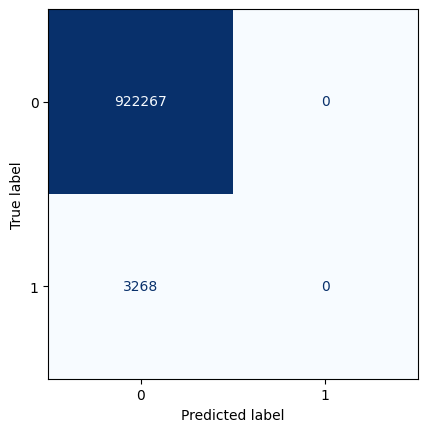

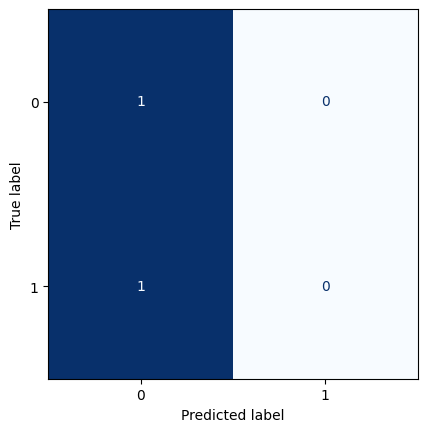

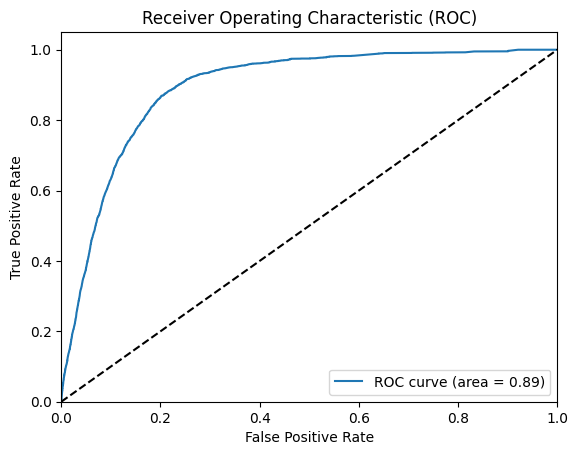

All zeros Brier score: 0.0035309307589664355
Model Brier score: 0.0034759849132234137
Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_84 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_85 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_28 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_86 (Conv2D)          (None, 14, 30, 1)         73        
                                 

2023-05-05 14:25:27.632275: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0604

2023-05-05 14:25:31.015978: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0604 - val_loss: 0.0208
Epoch 2/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0226 - val_loss: 0.0202
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0221 - val_loss: 0.0202
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0216 - val_loss: 0.0196
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0213 - val_loss: 0.0194
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0212 - val_loss: 0.0195
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0210 - val_loss: 0.0193
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0209 - val_loss: 0.0192
Epoch 9/100
354/354 [==============================] - 2s 7ms/step - loss: 0.0209 - val_loss: 0.0191
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0208 - val_loss: 0.0193
E

2023-05-05 14:28:06.991660: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 5ms/step


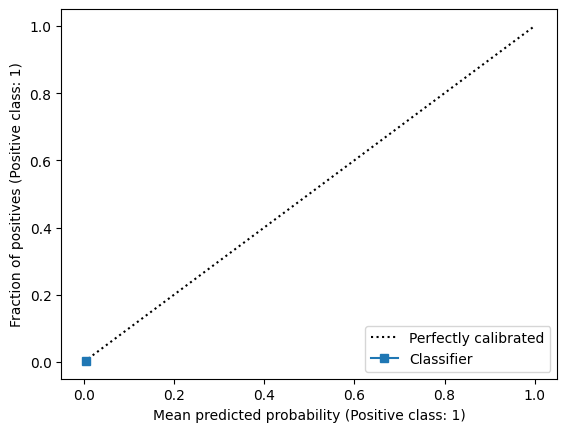

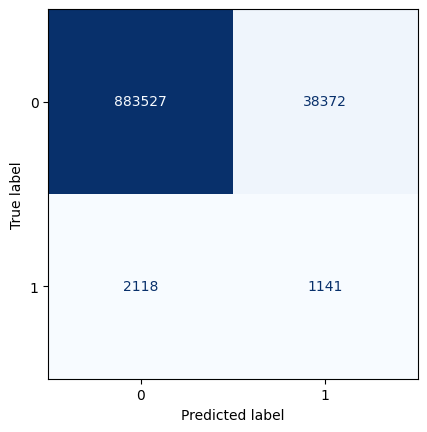

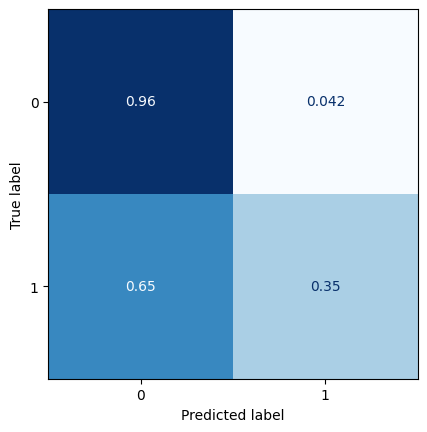

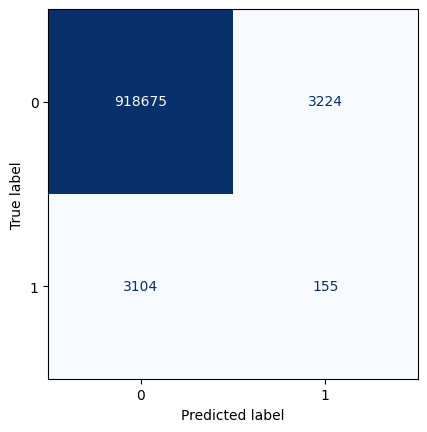

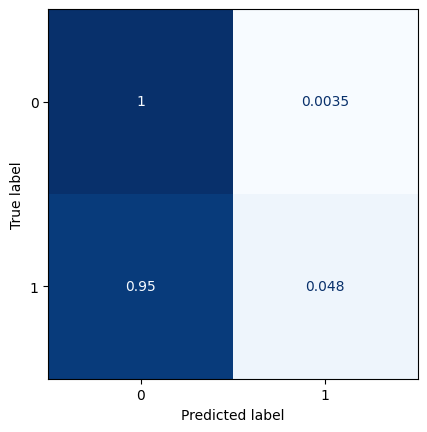

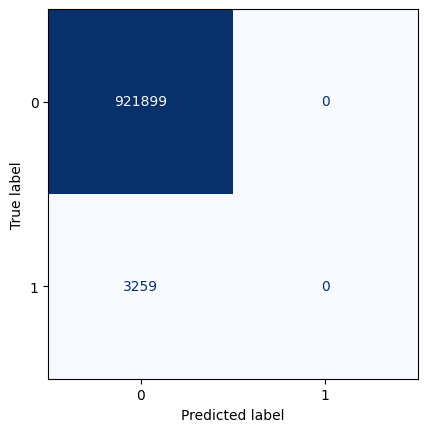

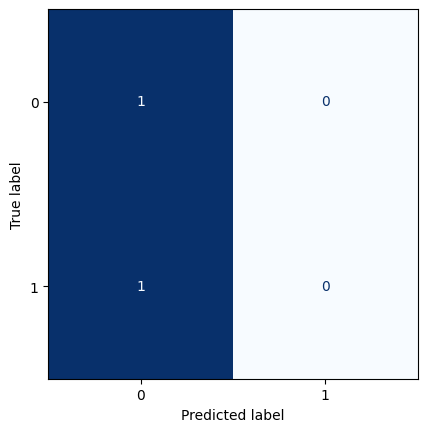

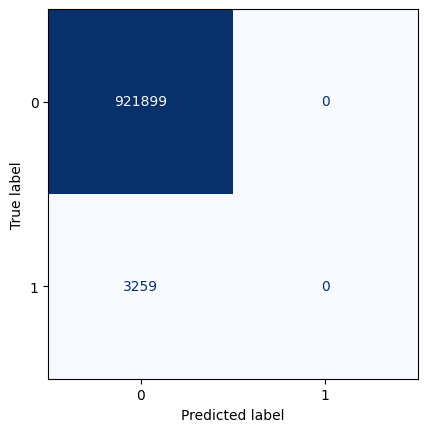

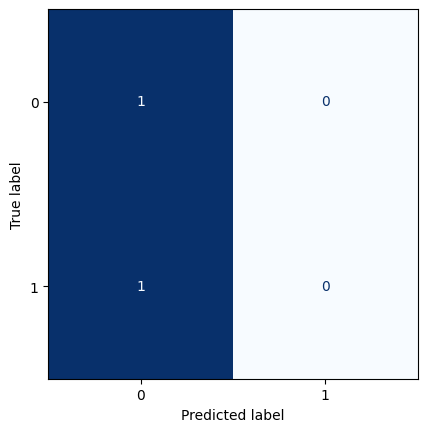

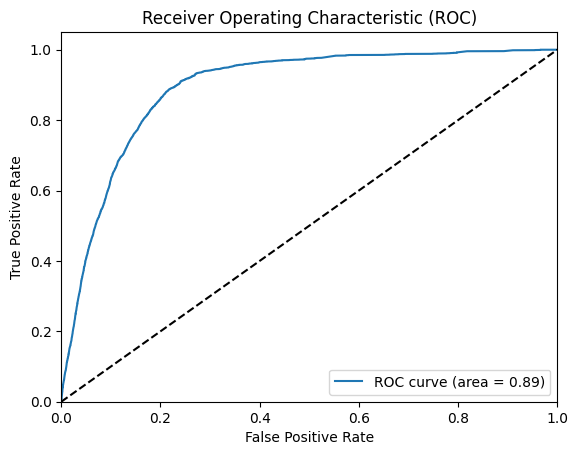

All zeros Brier score: 0.003522641537985944
Model Brier score: 0.003465317953825335
Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_87 (Conv2D)          (None, 13, 29, 8)         80        
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_88 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_29 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_89 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-05-05 14:28:34.120577: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0739

2023-05-05 14:28:39.704890: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 7s 15ms/step - loss: 0.0739 - val_loss: 0.0215
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0234 - val_loss: 0.0209
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0229 - val_loss: 0.0205
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0225 - val_loss: 0.0201
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0221 - val_loss: 0.0203
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0218 - val_loss: 0.0197
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0215 - val_loss: 0.0195
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0213 - val_loss: 0.0194
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0211 - val_loss: 0.0194
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0210 - val_loss: 0.0193


2023-05-05 14:30:45.705661: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 3ms/step


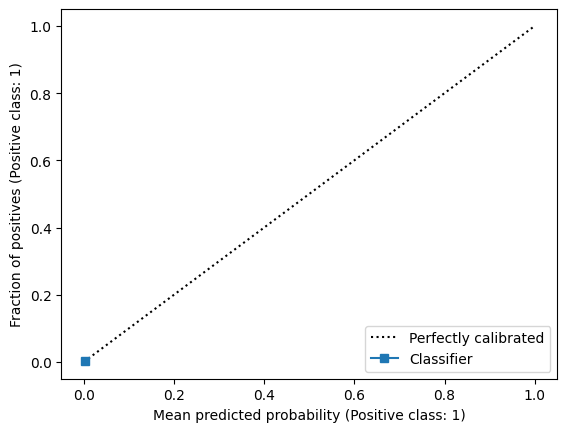

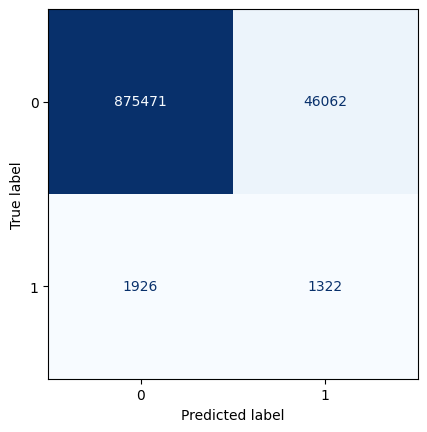

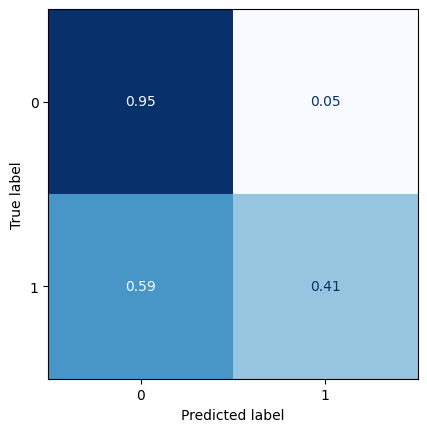

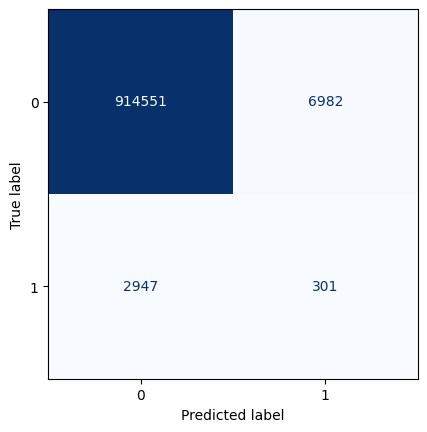

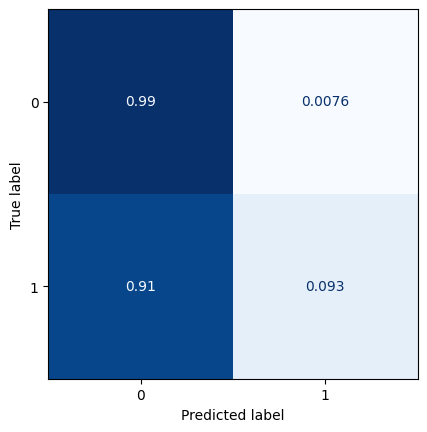

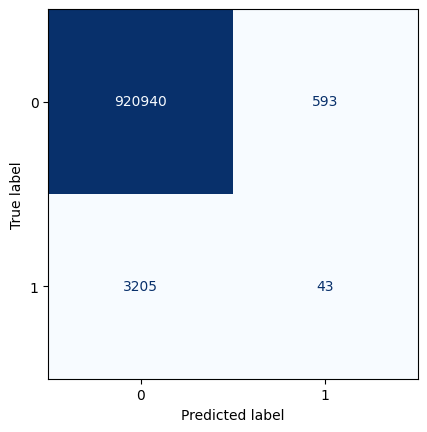

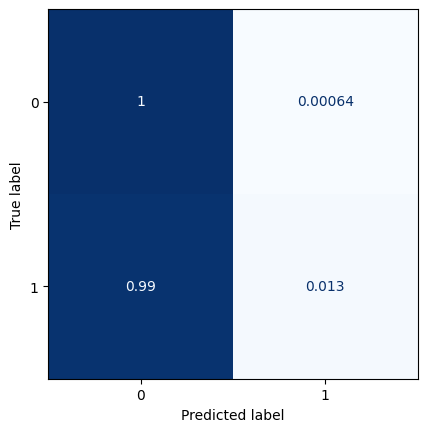

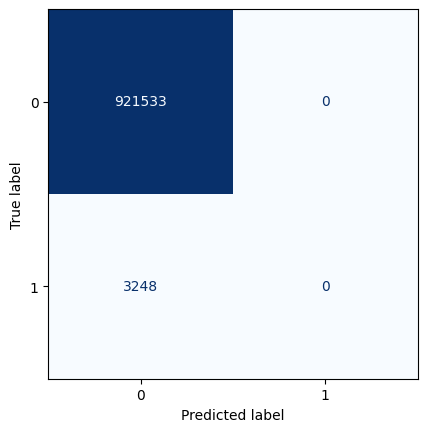

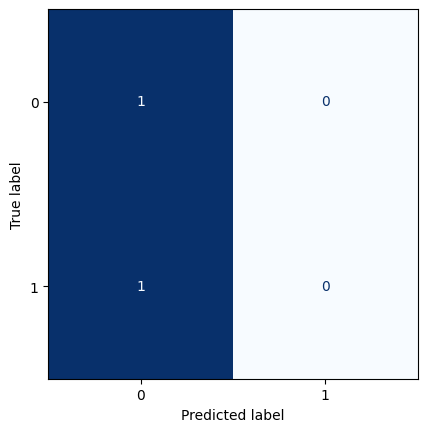

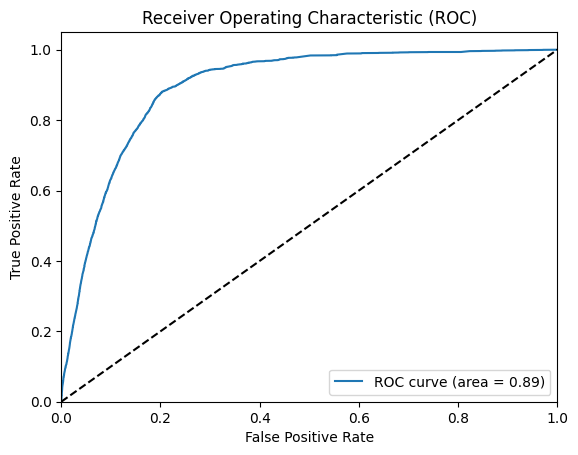

All zeros Brier score: 0.0035121828843801936
Model Brier score: 0.00345795916972131


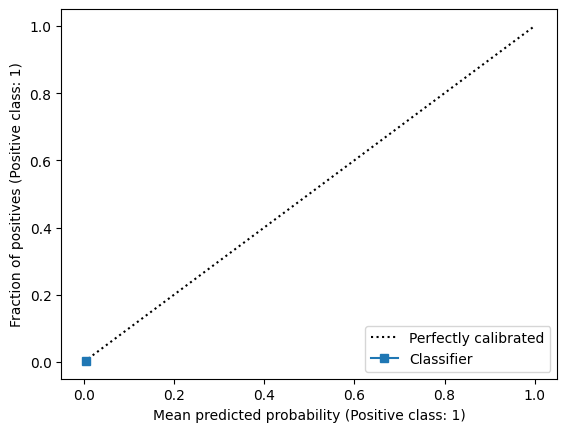

In [70]:
brier_zeros = []
brier = []
for lag in [1,2,3,4,5,6,7,8,9,10,11,12,13]:
    ### Model summary
    model = Sequential()
    model.add(layers.Input(shape=(13, 29, 1)))
    
    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2), padding='same'))
    
    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.UpSampling2D((2,2)))
    
    model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities
    
    model.add(layers.Cropping2D(cropping=((0,1),(0,1))))
    
    model.summary()
    
    model.compile(loss='binary_crossentropy', optimizer='adam')
    
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
            verbose=1, mode='auto', restore_best_weights=True)
    
    ### Model training [:,:,:,[9]]
    model.fit(train_img_std[:-lag,:,:,[9]], y_train_img[lag:], validation_data=(val_img_std[:-lag,:,:,[9]],y_val_img[lag:]),
        callbacks=[monitor],epochs=100)
    
    ### Confusion matrices
    t = model.predict(test_img_std[:-lag,:,:,[9]])

    ranges = [0.025,0.05,0.075,0.1]
    
    for j in ranges:
        classes = []
        for i in t.reshape(-1,1):
            if i<=j: classes.append(0)
            else: classes.append(1)
    
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag:].reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag:].reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)
    
    ### ROC
    plot_roc(t.reshape(-1,1),y_test_img[lag:].reshape(-1,1))
    
    z = np.zeros((lag,13,29,1))
    tt = np.concatenate((t,z))
    test['predictions_lag'+str(lag)] = tt.reshape(-1,1)
    
    
    ### calibration
    display = CalibrationDisplay.from_predictions(y_test_img[lag:].reshape(-1,1), t.reshape(-1,1), n_bins=10)
    print(f'All zeros Brier score: {brier_score_loss(y_test_img[lag:].reshape(-1,1), np.zeros(len(y_test_img[lag:].reshape(-1,1))))}')
    print(f'Model Brier score: {brier_score_loss(y_test_img[lag:].reshape(-1,1), t.reshape(-1,1))}')
    brier_zeros.append(brier_score_loss(y_test_img[lag:].reshape(-1,1), np.zeros(len(y_test_img[lag:].reshape(-1,1)))))
    brier.append(brier_score_loss(y_test_img[lag:].reshape(-1,1), t.reshape(-1,1)))

test.to_csv("test_with_newTarget_predictions_onlyClim.csv")


In [71]:
brier

[0.0034731221768845924,
 0.0034733703278640115,
 0.0034803192594167333,
 0.0034744636255963444,
 0.0034806916084939347,
 0.003479626456233756,
 0.0034798628504075016,
 0.0034835678750352143,
 0.003482612406692304,
 0.0034786598451489806,
 0.0034759849132234137,
 0.003465317953825335,
 0.00345795916972131]

In [72]:
brier_zeros

[0.00352736722604527,
 0.003528798787419477,
 0.0035302315112470937,
 0.0035316653989445946,
 0.0035331004519307562,
 0.003534536671626663,
 0.00353597405945571,
 0.0035374126168436094,
 0.003538852345218393,
 0.0035359731810366427,
 0.0035309307589664355,
 0.003522641537985944,
 0.0035121828843801936]

In [73]:
test

,Unnamed: 0,time,latitude,longitude,vo,r,u_200,u_850,v_200,v_850,ttr,sst,new_target,Real_tom_target,shear,clim,target,predictions_lag0,predictions_lag1,predictions_lag2,predictions_lag3,predictions_lag4,predictions_lag5,predictions_lag6,predictions_lag7,predictions_lag8,predictions_lag9,predictions_lag10,predictions_lag11,predictions_lag12,predictions_lag13
34307,34307,2016-04-01,0.0,20.0,0.238973,1.386669,-0.945404,1.574206,0.511504,0.367981,2.652010,-1.588255,0.0,0.0,-0.516292,-0.438312,0,0.000030,0.000079,0.000524,0.000027,0.000069,0.000126,0.000046,0.000248,0.000064,0.000088,0.000207,7.105223e-06,0.000139,0.000401
34308,34308,2016-04-01,0.0,22.5,-0.172396,1.196522,-0.819827,1.371793,0.717349,0.332262,3.396515,-1.588255,0.0,0.0,-0.755886,-0.438312,0,0.000003,0.000007,0.000103,0.000002,0.000005,0.000021,0.000004,0.000045,0.000012,0.000003,0.000019,5.011800e-07,0.000021,0.000038
34309,34309,2016-04-01,0.0,25.0,1.188889,1.166772,-0.571398,1.173488,0.662464,0.144802,4.092788,-1.588255,0.0,0.0,-1.161314,-0.438312,0,0.000007,0.000010,0.000108,0.000005,0.000005,0.000028,0.000015,0.000032,0.000019,0.000006,0.000015,3.267650e-06,0.000033,0.000048
34310,34310,2016-04-01,0.0,27.5,-0.649707,1.063899,-0.385753,0.812011,0.713230,0.584284,4.044557,-1.588255,0.0,0.0,-1.507685,-0.438312,0,0.000007,0.000017,0.000094,0.000007,0.000004,0.000024,0.000015,0.000028,0.000023,0.000008,0.000013,7.060464e-06,0.000033,0.000044
34311,34311,2016-04-01,0.0,30.0,-0.629183,1.432846,-0.362931,0.809212,0.888739,-0.207576,3.438931,-1.588255,0.0,0.0,-1.154385,-0.438312,0,0.000007,0.000017,0.000098,0.000006,0.000004,0.000021,0.000015,0.000028,0.000023,0.000007,0.000013,6.010590e-06,0.000032,0.000046
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
963984,137600,2022-12-31,-30.0,80.0,0.677806,-1.271307,0.290892,-0.727302,0.813190,-0.684904,-0.431475,0.601392,0.0,0.0,0.050674,-0.049229,0,0.005382,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
963985,137601,2022-12-31,-30.0,82.5,0.898493,-1.325164,0.224460,-0.764678,1.178495,-0.105389,-0.107881,0.599524,0.0,0.0,0.004080,-0.152462,0,0.004180,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
963986,137602,2022-12-31,-30.0,85.0,1.629797,-1.468220,0.376651,-0.566606,1.728863,0.450626,-0.082227,0.597113,0.0,0.0,0.220205,0.419240,0,0.003919,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
963987,137603,2022-12-31,-30.0,87.5,0.280770,-1.453315,0.621629,-0.446284,2.368318,0.792994,-0.000815,0.594579,0.0,0.0,0.648118,0.133389,0,0.004971,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
